In [1]:
import numpy as np
import segyio
from shutil import copyfile
from random import shuffle
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
%matplotlib notebook

from sklearn.cluster import KMeans, SpectralClustering, DBSCAN

In [2]:
vp_segy = segyio.open('EI_Vp.sgy')
vs_segy = segyio.open('EI_Vs.sgy')
rhob_segy = segyio.open('EI_RHOB.sgy')
attr_segy = segyio.open('16p_EnergyFreq.sgy')

In [3]:
print('Vp Number of Traces:', vp_segy.tracecount)
print('Vs Number of Traces:', vs_segy.tracecount)
print('RHOB Number of Traces:', rhob_segy.tracecount)
print('Attr Number of Traces:', attr_segy.tracecount)

no_traces = vp_segy.tracecount

Vp Number of Traces: 494722
Vs Number of Traces: 494722
RHOB Number of Traces: 494722
Attr Number of Traces: 494722


In [5]:
all_vp_traces = np.array([])
all_vs_traces = np.array([])
all_rhob_traces = np.array([])
all_attr_traces = np.array([])
all_traces = np.zeros((0,4))

random_trace_order = list(range(no_traces))
shuffle(random_trace_order)
number_of_traces_for_fitting = 5000

k = 0
for i in random_trace_order[:number_of_traces_for_fitting]:
    k += 1
    print(k/number_of_traces_for_fitting*100)
    all_vp_traces = np.concatenate((all_vp_traces, vp_segy.trace[i]))
    all_vs_traces = np.concatenate((all_vs_traces, vs_segy.trace[i]))
    all_rhob_traces = np.concatenate((all_rhob_traces, rhob_segy.trace[i]))
    all_attr_traces = np.concatenate((all_attr_traces, attr_segy.trace[i]))

all_traces = np.vstack((all_vp_traces[all_vp_traces<1000000], all_vs_traces[all_vp_traces<1000000], all_rhob_traces[all_vp_traces<1000000],all_attr_traces[all_vp_traces<1000000])).T

0.02
0.04
0.06
0.08
0.1
0.12
0.13999999999999999
0.16
0.18
0.2
0.22
0.24
0.26
0.27999999999999997
0.3
0.32
0.33999999999999997
0.36
0.38
0.4
0.42
0.44
0.45999999999999996
0.48
0.5
0.52
0.54
0.5599999999999999
0.58
0.6
0.62
0.64
0.66
0.6799999999999999
0.7000000000000001
0.72
0.74
0.76
0.7799999999999999
0.8
0.8200000000000001
0.84
0.86
0.88
0.8999999999999999
0.9199999999999999
0.9400000000000001
0.96
0.98
1.0
1.02
1.04
1.06
1.08
1.0999999999999999
1.1199999999999999
1.1400000000000001
1.16
1.18
1.2
1.22
1.24
1.26
1.28
1.3
1.32
1.34
1.3599999999999999
1.38
1.4000000000000001
1.4200000000000002
1.44
1.46
1.48
1.5
1.52
1.54
1.5599999999999998
1.58
1.6
1.6199999999999999
1.6400000000000001
1.66
1.68
1.7000000000000002
1.72
1.7399999999999998
1.76
1.78
1.7999999999999998
1.82
1.8399999999999999
1.8599999999999999
1.8800000000000001
1.9
1.92
1.94
1.96
1.9800000000000002
2.0
2.02
2.04
2.06
2.08
2.1
2.12
2.1399999999999997
2.16
2.18
2.1999999999999997
2.22
2.2399999999999998
2.26
2.2800000000

18.3
18.32
18.34
18.360000000000003
18.38
18.4
18.42
18.44
18.459999999999997
18.48
18.5
18.52
18.54
18.56
18.58
18.6
18.62
18.64
18.66
18.68
18.7
18.72
18.740000000000002
18.759999999999998
18.78
18.8
18.82
18.84
18.86
18.88
18.9
18.92
18.94
18.96
18.98
19.0
19.02
19.040000000000003
19.06
19.08
19.1
19.12
19.139999999999997
19.16
19.18
19.2
19.220000000000002
19.24
19.259999999999998
19.28
19.3
19.32
19.34
19.36
19.38
19.400000000000002
19.42
19.439999999999998
19.46
19.48
19.5
19.52
19.54
19.56
19.580000000000002
19.6
19.62
19.64
19.66
19.68
19.7
19.72
19.74
19.759999999999998
19.78
19.8
19.82
19.84
19.86
19.88
19.900000000000002
19.919999999999998
19.939999999999998
19.96
19.98
20.0
20.02
20.04
20.06
20.080000000000002
20.1
20.119999999999997
20.14
20.16
20.18
20.200000000000003
20.22
20.24
20.26
20.28
20.3
20.32
20.34
20.36
20.380000000000003
20.4
20.419999999999998
20.44
20.46
20.48
20.5
20.52
20.54
20.560000000000002
20.580000000000002
20.599999999999998
20.62
20.64
20.66
20.68
2

35.6
35.620000000000005
35.64
35.66
35.68
35.699999999999996
35.72
35.74
35.76
35.78
35.8
35.82
35.839999999999996
35.86
35.88
35.9
35.92
35.94
35.96
35.980000000000004
36.0
36.02
36.04
36.059999999999995
36.08
36.1
36.120000000000005
36.14
36.16
36.18
36.199999999999996
36.22
36.24
36.26
36.28
36.3
36.32
36.34
36.36
36.38
36.4
36.42
36.44
36.46
36.480000000000004
36.5
36.52
36.54
36.559999999999995
36.58
36.6
36.620000000000005
36.64
36.66
36.68
36.7
36.720000000000006
36.74
36.76
36.78
36.8
36.82
36.84
36.86
36.88
36.9
36.919999999999995
36.94
36.96
36.980000000000004
37.0
37.019999999999996
37.04
37.059999999999995
37.08
37.1
37.12
37.14
37.16
37.18
37.2
37.22
37.24
37.26
37.28
37.3
37.32
37.34
37.36
37.38
37.4
37.419999999999995
37.44
37.46
37.480000000000004
37.5
37.519999999999996
37.54
37.56
37.580000000000005
37.6
37.62
37.64
37.66
37.68
37.7
37.72
37.74
37.76
37.78
37.8
37.82
37.84
37.86
37.88
37.9
37.92
37.940000000000005
37.96
37.980000000000004
38.0
38.019999999999996
38.04

53.959999999999994
53.98
54.0
54.02
54.04
54.059999999999995
54.08
54.1
54.120000000000005
54.14
54.16
54.17999999999999
54.2
54.22
54.24
54.26
54.279999999999994
54.300000000000004
54.32
54.339999999999996
54.36
54.379999999999995
54.400000000000006
54.42
54.44
54.459999999999994
54.48
54.50000000000001
54.52
54.54
54.559999999999995
54.58
54.6
54.620000000000005
54.64
54.66
54.67999999999999
54.7
54.72
54.74
54.76
54.779999999999994
54.800000000000004
54.82
54.84
54.86
54.879999999999995
54.900000000000006
54.92
54.94
54.96
54.98
55.00000000000001
55.02
55.04
55.059999999999995
55.08
55.1
55.120000000000005
55.14
55.16
55.17999999999999
55.2
55.22
55.24
55.26
55.279999999999994
55.300000000000004
55.32
55.34
55.36
55.379999999999995
55.400000000000006
55.42
55.44
55.46
55.48
55.50000000000001
55.52
55.54
55.559999999999995
55.58
55.60000000000001
55.620000000000005
55.64
55.66
55.67999999999999
55.7
55.720000000000006
55.74
55.76
55.779999999999994
55.800000000000004
55.82
55.84
55.8

70.56
70.58
70.6
70.62
70.64
70.66
70.67999999999999
70.7
70.72
70.74000000000001
70.76
70.78
70.8
70.82000000000001
70.84
70.86
70.88
70.89999999999999
70.92
70.94
70.96000000000001
70.98
71.0
71.02000000000001
71.04
71.06
71.08
71.1
71.12
71.14
71.16
71.17999999999999
71.2
71.22
71.24000000000001
71.26
71.28
71.3
71.32
71.34
71.36
71.38
71.39999999999999
71.41999999999999
71.44
71.46000000000001
71.48
71.5
71.52
71.54
71.56
71.58
71.6
71.61999999999999
71.64
71.66
71.67999999999999
71.7
71.72
71.74000000000001
71.76
71.78
71.8
71.82
71.84
71.86
71.88
71.89999999999999
71.92
71.94
71.96000000000001
71.98
72.0
72.02
72.04
72.06
72.08
72.1
72.11999999999999
72.14
72.16
72.18
72.2
72.22
72.24000000000001
72.26
72.28
72.3
72.32
72.34
72.36
72.38
72.39999999999999
72.42
72.44
72.46000000000001
72.48
72.5
72.52
72.54
72.56
72.58
72.6
72.61999999999999
72.64
72.66
72.68
72.7
72.72
72.74000000000001
72.76
72.78
72.8
72.82
72.84
72.86
72.88
72.89999999999999
72.92
72.94
72.96000000000001
72.98

90.84
90.86
90.88000000000001
90.9
90.92
90.94
90.96
90.98
91.0
91.02
91.03999999999999
91.06
91.08000000000001
91.10000000000001
91.12
91.14
91.16
91.18
91.2
91.22
91.24
91.25999999999999
91.28
91.3
91.32000000000001
91.34
91.36
91.38
91.4
91.42
91.44
91.46
91.47999999999999
91.5
91.52
91.53999999999999
91.56
91.58
91.60000000000001
91.62
91.64
91.66
91.67999999999999
91.7
91.72
91.74
91.75999999999999
91.78
91.8
91.82000000000001
91.84
91.86
91.88
91.9
91.92
91.94
91.96
91.97999999999999
92.0
92.02
92.04
92.06
92.08
92.10000000000001
92.12
92.14
92.16
92.17999999999999
92.2
92.22
92.24
92.25999999999999
92.28
92.30000000000001
92.32000000000001
92.34
92.36
92.38
92.4
92.42
92.44
92.46
92.47999999999999
92.5
92.52
92.54
92.56
92.58
92.60000000000001
92.62
92.64
92.66
92.67999999999999
92.7
92.72
92.74
92.75999999999999
92.78
92.80000000000001
92.82000000000001
92.84
92.86
92.88
92.9
92.92
92.94
92.96
92.97999999999999
93.0
93.02
93.04
93.06
93.08
93.10000000000001
93.12
93.14
93.16
93

In [6]:
all_traces.shape

(1674019, 4)

In [7]:
kmeans = KMeans(n_clusters=4, random_state=0).fit(all_traces)

<IPython.core.display.Javascript object>


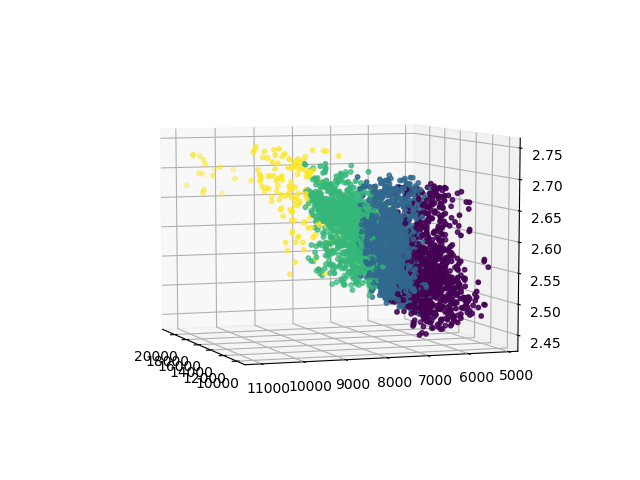

In [9]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(xs=all_traces[:5000,0], ys=all_traces[:5000,1], zs=all_traces[:5000,2], c=kmeans.labels_[:5000], s=10)
plt.show()

In [10]:
vp_trace = np.array([])
vs_trace = np.array([])
rhob_trace = np.array([])
attr_trace = np.array([])
four_traces = np.zeros((0,4))
facies = np.array([])
orig_trace = np.array([])

copyfile('EI_Vp.sgy', 'Facies.sgy')
with segyio.open('Facies.sgy', mode="r+") as facies_segy:
    for i in range(no_traces):
        vp_trace = vp_segy.trace[i]
        vs_trace = vs_segy.trace[i]
        rhob_trace = rhob_segy.trace[i]
        attr_trace = attr_segy.trace[i]
        four_traces = np.vstack((vp_trace, vs_trace, rhob_trace, attr_trace)).T
        facies = kmeans.predict(four_traces)
        orig_trace = facies_segy.trace[i]
        orig_trace[orig_trace<10000000] = facies[orig_trace<10000000]
        facies_segy.trace[i] = orig_trace
        print(i, np.min(facies_segy.trace[i]), np.max(facies_segy.trace[i]))
    facies_segy.flush()

0 1e+37 1e+37
1 1e+37 1e+37
2 1e+37 1e+37
3 1e+37 1e+37
4 1e+37 1e+37
5 1e+37 1e+37
6 1e+37 1e+37
7 1e+37 1e+37
8 1e+37 1e+37
9 1e+37 1e+37
10 1e+37 1e+37
11 1e+37 1e+37
12 1e+37 1e+37
13 1e+37 1e+37
14 1e+37 1e+37
15 1e+37 1e+37
16 1e+37 1e+37
17 1e+37 1e+37
18 1e+37 1e+37
19 1e+37 1e+37
20 1e+37 1e+37
21 1e+37 1e+37
22 1e+37 1e+37
23 1e+37 1e+37
24 1e+37 1e+37
25 1e+37 1e+37
26 1e+37 1e+37
27 1e+37 1e+37
28 1e+37 1e+37
29 1e+37 1e+37
30 1e+37 1e+37
31 1e+37 1e+37
32 1e+37 1e+37
33 1e+37 1e+37
34 1e+37 1e+37
35 1e+37 1e+37
36 1e+37 1e+37
37 1e+37 1e+37
38 1e+37 1e+37
39 1e+37 1e+37
40 1e+37 1e+37
41 1e+37 1e+37
42 1e+37 1e+37
43 1e+37 1e+37
44 1e+37 1e+37
45 1e+37 1e+37
46 1e+37 1e+37
47 1e+37 1e+37
48 1e+37 1e+37
49 0.0 1e+37
50 0.0 1e+37
51 0.0 1e+37
52 0.0 1e+37
53 0.0 1e+37
54 0.0 1e+37
55 0.0 1e+37
56 0.0 1e+37
57 0.0 1e+37
58 0.0 1e+37
59 0.0 1e+37
60 0.0 1e+37
61 0.0 1e+37
62 0.0 1e+37
63 0.0 1e+37
64 0.0 1e+37
65 0.0 1e+37
66 0.0 1e+37
67 0.0 1e+37
68 0.0 1e+37
69 0.0 1e+37
70

637 1e+37 1e+37
638 1e+37 1e+37
639 1e+37 1e+37
640 1e+37 1e+37
641 1e+37 1e+37
642 1e+37 1e+37
643 1e+37 1e+37
644 1e+37 1e+37
645 1e+37 1e+37
646 1e+37 1e+37
647 1e+37 1e+37
648 1e+37 1e+37
649 1e+37 1e+37
650 1e+37 1e+37
651 1e+37 1e+37
652 1e+37 1e+37
653 1e+37 1e+37
654 1e+37 1e+37
655 1e+37 1e+37
656 1e+37 1e+37
657 1e+37 1e+37
658 1e+37 1e+37
659 1e+37 1e+37
660 1e+37 1e+37
661 1e+37 1e+37
662 1e+37 1e+37
663 1e+37 1e+37
664 1e+37 1e+37
665 1e+37 1e+37
666 1e+37 1e+37
667 1e+37 1e+37
668 1e+37 1e+37
669 1e+37 1e+37
670 1e+37 1e+37
671 1e+37 1e+37
672 1e+37 1e+37
673 1e+37 1e+37
674 1e+37 1e+37
675 1e+37 1e+37
676 1e+37 1e+37
677 1e+37 1e+37
678 1e+37 1e+37
679 1e+37 1e+37
680 1e+37 1e+37
681 1e+37 1e+37
682 1e+37 1e+37
683 1e+37 1e+37
684 1e+37 1e+37
685 1e+37 1e+37
686 1e+37 1e+37
687 1e+37 1e+37
688 1e+37 1e+37
689 1e+37 1e+37
690 1e+37 1e+37
691 1e+37 1e+37
692 1e+37 1e+37
693 1e+37 1e+37
694 1e+37 1e+37
695 1e+37 1e+37
696 1e+37 1e+37
697 1e+37 1e+37
698 1e+37 1e+37
699 1e+3

1259 1e+37 1e+37
1260 1e+37 1e+37
1261 1e+37 1e+37
1262 1e+37 1e+37
1263 1e+37 1e+37
1264 1e+37 1e+37
1265 1e+37 1e+37
1266 1e+37 1e+37
1267 1e+37 1e+37
1268 1e+37 1e+37
1269 1e+37 1e+37
1270 1e+37 1e+37
1271 1e+37 1e+37
1272 1e+37 1e+37
1273 1e+37 1e+37
1274 1e+37 1e+37
1275 1e+37 1e+37
1276 1e+37 1e+37
1277 1e+37 1e+37
1278 1e+37 1e+37
1279 1e+37 1e+37
1280 1e+37 1e+37
1281 1e+37 1e+37
1282 1e+37 1e+37
1283 1e+37 1e+37
1284 1e+37 1e+37
1285 1e+37 1e+37
1286 1e+37 1e+37
1287 1e+37 1e+37
1288 1e+37 1e+37
1289 1e+37 1e+37
1290 1e+37 1e+37
1291 1e+37 1e+37
1292 1e+37 1e+37
1293 1e+37 1e+37
1294 1e+37 1e+37
1295 1e+37 1e+37
1296 1e+37 1e+37
1297 1e+37 1e+37
1298 1e+37 1e+37
1299 1e+37 1e+37
1300 1e+37 1e+37
1301 1e+37 1e+37
1302 1e+37 1e+37
1303 1e+37 1e+37
1304 1e+37 1e+37
1305 1e+37 1e+37
1306 1e+37 1e+37
1307 1e+37 1e+37
1308 1e+37 1e+37
1309 1e+37 1e+37
1310 1e+37 1e+37
1311 1e+37 1e+37
1312 1e+37 1e+37
1313 1e+37 1e+37
1314 1e+37 1e+37
1315 1e+37 1e+37
1316 1e+37 1e+37
1317 1e+37 1e+

1913 0.0 1e+37
1914 0.0 1e+37
1915 0.0 1e+37
1916 0.0 1e+37
1917 0.0 1e+37
1918 0.0 1e+37
1919 0.0 1e+37
1920 0.0 1e+37
1921 0.0 1e+37
1922 0.0 1e+37
1923 0.0 1e+37
1924 0.0 1e+37
1925 0.0 1e+37
1926 0.0 1e+37
1927 0.0 1e+37
1928 0.0 1e+37
1929 0.0 1e+37
1930 0.0 1e+37
1931 0.0 1e+37
1932 0.0 1e+37
1933 0.0 1e+37
1934 0.0 1e+37
1935 0.0 1e+37
1936 0.0 1e+37
1937 0.0 1e+37
1938 0.0 1e+37
1939 0.0 1e+37
1940 0.0 1e+37
1941 0.0 1e+37
1942 0.0 1e+37
1943 0.0 1e+37
1944 0.0 1e+37
1945 0.0 1e+37
1946 0.0 1e+37
1947 0.0 1e+37
1948 0.0 1e+37
1949 0.0 1e+37
1950 0.0 1e+37
1951 0.0 1e+37
1952 0.0 1e+37
1953 0.0 1e+37
1954 0.0 1e+37
1955 0.0 1e+37
1956 0.0 1e+37
1957 0.0 1e+37
1958 0.0 1e+37
1959 0.0 1e+37
1960 0.0 1e+37
1961 0.0 1e+37
1962 0.0 1e+37
1963 0.0 1e+37
1964 0.0 1e+37
1965 0.0 1e+37
1966 0.0 1e+37
1967 0.0 1e+37
1968 0.0 1e+37
1969 0.0 1e+37
1970 0.0 1e+37
1971 0.0 1e+37
1972 0.0 1e+37
1973 0.0 1e+37
1974 0.0 1e+37
1975 0.0 1e+37
1976 0.0 1e+37
1977 0.0 1e+37
1978 0.0 1e+37
1979 0.0 1

2541 1e+37 1e+37
2542 1e+37 1e+37
2543 1e+37 1e+37
2544 1e+37 1e+37
2545 1e+37 1e+37
2546 1e+37 1e+37
2547 1e+37 1e+37
2548 1e+37 1e+37
2549 1e+37 1e+37
2550 1e+37 1e+37
2551 1e+37 1e+37
2552 1e+37 1e+37
2553 1e+37 1e+37
2554 1e+37 1e+37
2555 1e+37 1e+37
2556 1e+37 1e+37
2557 1e+37 1e+37
2558 1e+37 1e+37
2559 1e+37 1e+37
2560 1e+37 1e+37
2561 1e+37 1e+37
2562 1e+37 1e+37
2563 1e+37 1e+37
2564 1e+37 1e+37
2565 1e+37 1e+37
2566 1e+37 1e+37
2567 1e+37 1e+37
2568 1e+37 1e+37
2569 1e+37 1e+37
2570 1e+37 1e+37
2571 1e+37 1e+37
2572 1e+37 1e+37
2573 1e+37 1e+37
2574 1e+37 1e+37
2575 1e+37 1e+37
2576 1e+37 1e+37
2577 1e+37 1e+37
2578 1e+37 1e+37
2579 1e+37 1e+37
2580 1e+37 1e+37
2581 1e+37 1e+37
2582 1e+37 1e+37
2583 1e+37 1e+37
2584 1e+37 1e+37
2585 1e+37 1e+37
2586 1e+37 1e+37
2587 1e+37 1e+37
2588 1e+37 1e+37
2589 1e+37 1e+37
2590 1e+37 1e+37
2591 1e+37 1e+37
2592 1e+37 1e+37
2593 1e+37 1e+37
2594 1e+37 1e+37
2595 1e+37 1e+37
2596 1e+37 1e+37
2597 1e+37 1e+37
2598 1e+37 1e+37
2599 1e+37 1e+

3215 1e+37 1e+37
3216 1e+37 1e+37
3217 1e+37 1e+37
3218 1e+37 1e+37
3219 1e+37 1e+37
3220 1e+37 1e+37
3221 1e+37 1e+37
3222 1e+37 1e+37
3223 1e+37 1e+37
3224 1e+37 1e+37
3225 1e+37 1e+37
3226 1e+37 1e+37
3227 1e+37 1e+37
3228 1e+37 1e+37
3229 1e+37 1e+37
3230 1e+37 1e+37
3231 1e+37 1e+37
3232 1e+37 1e+37
3233 1e+37 1e+37
3234 1e+37 1e+37
3235 1e+37 1e+37
3236 1e+37 1e+37
3237 1e+37 1e+37
3238 1e+37 1e+37
3239 1e+37 1e+37
3240 1e+37 1e+37
3241 1e+37 1e+37
3242 1e+37 1e+37
3243 1e+37 1e+37
3244 1e+37 1e+37
3245 1e+37 1e+37
3246 1e+37 1e+37
3247 1e+37 1e+37
3248 1e+37 1e+37
3249 1e+37 1e+37
3250 1e+37 1e+37
3251 1e+37 1e+37
3252 1e+37 1e+37
3253 1e+37 1e+37
3254 1e+37 1e+37
3255 1e+37 1e+37
3256 1e+37 1e+37
3257 1e+37 1e+37
3258 1e+37 1e+37
3259 1e+37 1e+37
3260 1e+37 1e+37
3261 1e+37 1e+37
3262 1e+37 1e+37
3263 1e+37 1e+37
3264 1e+37 1e+37
3265 1e+37 1e+37
3266 1e+37 1e+37
3267 1e+37 1e+37
3268 1e+37 1e+37
3269 1e+37 1e+37
3270 1e+37 1e+37
3271 1e+37 1e+37
3272 1e+37 1e+37
3273 1e+37 1e+

3831 0.0 1e+37
3832 0.0 1e+37
3833 0.0 1e+37
3834 0.0 1e+37
3835 0.0 1e+37
3836 0.0 1e+37
3837 0.0 1e+37
3838 0.0 1e+37
3839 0.0 1e+37
3840 0.0 1e+37
3841 1e+37 1e+37
3842 1e+37 1e+37
3843 1e+37 1e+37
3844 1e+37 1e+37
3845 1e+37 1e+37
3846 1e+37 1e+37
3847 1e+37 1e+37
3848 1e+37 1e+37
3849 1e+37 1e+37
3850 1e+37 1e+37
3851 1e+37 1e+37
3852 1e+37 1e+37
3853 1e+37 1e+37
3854 1e+37 1e+37
3855 1e+37 1e+37
3856 1e+37 1e+37
3857 1e+37 1e+37
3858 1e+37 1e+37
3859 1e+37 1e+37
3860 1e+37 1e+37
3861 1e+37 1e+37
3862 1e+37 1e+37
3863 1e+37 1e+37
3864 1e+37 1e+37
3865 1e+37 1e+37
3866 1e+37 1e+37
3867 1e+37 1e+37
3868 1e+37 1e+37
3869 1e+37 1e+37
3870 1e+37 1e+37
3871 1e+37 1e+37
3872 1e+37 1e+37
3873 1e+37 1e+37
3874 1e+37 1e+37
3875 1e+37 1e+37
3876 1e+37 1e+37
3877 1e+37 1e+37
3878 1e+37 1e+37
3879 1e+37 1e+37
3880 1e+37 1e+37
3881 1e+37 1e+37
3882 1e+37 1e+37
3883 1e+37 1e+37
3884 1e+37 1e+37
3885 1e+37 1e+37
3886 1e+37 1e+37
3887 1e+37 1e+37
3888 1e+37 1e+37
3889 1e+37 1e+37
3890 1e+37 1e+37


4318 1e+37 1e+37
4319 1e+37 1e+37
4320 1e+37 1e+37
4321 1e+37 1e+37
4322 1e+37 1e+37
4323 1e+37 1e+37
4324 1e+37 1e+37
4325 1e+37 1e+37
4326 1e+37 1e+37
4327 1e+37 1e+37
4328 1e+37 1e+37
4329 1e+37 1e+37
4330 1e+37 1e+37
4331 1e+37 1e+37
4332 1e+37 1e+37
4333 1e+37 1e+37
4334 1e+37 1e+37
4335 1e+37 1e+37
4336 1e+37 1e+37
4337 1e+37 1e+37
4338 1e+37 1e+37
4339 1e+37 1e+37
4340 1e+37 1e+37
4341 1e+37 1e+37
4342 1e+37 1e+37
4343 1e+37 1e+37
4344 1e+37 1e+37
4345 1e+37 1e+37
4346 1e+37 1e+37
4347 1e+37 1e+37
4348 1e+37 1e+37
4349 1e+37 1e+37
4350 1e+37 1e+37
4351 1e+37 1e+37
4352 1e+37 1e+37
4353 1e+37 1e+37
4354 1e+37 1e+37
4355 1e+37 1e+37
4356 1e+37 1e+37
4357 1e+37 1e+37
4358 1e+37 1e+37
4359 1e+37 1e+37
4360 1e+37 1e+37
4361 1e+37 1e+37
4362 1e+37 1e+37
4363 1e+37 1e+37
4364 1e+37 1e+37
4365 1e+37 1e+37
4366 1e+37 1e+37
4367 1e+37 1e+37
4368 1e+37 1e+37
4369 1e+37 1e+37
4370 1e+37 1e+37
4371 1e+37 1e+37
4372 1e+37 1e+37
4373 1e+37 1e+37
4374 1e+37 1e+37
4375 1e+37 1e+37
4376 1e+37 1e+

4939 1e+37 1e+37
4940 1e+37 1e+37
4941 1e+37 1e+37
4942 1e+37 1e+37
4943 1e+37 1e+37
4944 1e+37 1e+37
4945 1e+37 1e+37
4946 1e+37 1e+37
4947 1e+37 1e+37
4948 1e+37 1e+37
4949 1e+37 1e+37
4950 1e+37 1e+37
4951 1e+37 1e+37
4952 1e+37 1e+37
4953 1e+37 1e+37
4954 1e+37 1e+37
4955 1e+37 1e+37
4956 1e+37 1e+37
4957 1e+37 1e+37
4958 1e+37 1e+37
4959 1e+37 1e+37
4960 1e+37 1e+37
4961 1e+37 1e+37
4962 1e+37 1e+37
4963 1e+37 1e+37
4964 1e+37 1e+37
4965 1e+37 1e+37
4966 1e+37 1e+37
4967 1e+37 1e+37
4968 1e+37 1e+37
4969 1e+37 1e+37
4970 1e+37 1e+37
4971 1e+37 1e+37
4972 1e+37 1e+37
4973 1e+37 1e+37
4974 1e+37 1e+37
4975 1e+37 1e+37
4976 1e+37 1e+37
4977 1e+37 1e+37
4978 1e+37 1e+37
4979 1e+37 1e+37
4980 1e+37 1e+37
4981 1e+37 1e+37
4982 1e+37 1e+37
4983 1e+37 1e+37
4984 1e+37 1e+37
4985 1e+37 1e+37
4986 1e+37 1e+37
4987 1e+37 1e+37
4988 1e+37 1e+37
4989 1e+37 1e+37
4990 1e+37 1e+37
4991 1e+37 1e+37
4992 1e+37 1e+37
4993 1e+37 1e+37
4994 1e+37 1e+37
4995 1e+37 1e+37
4996 1e+37 1e+37
4997 1e+37 1e+

5425 0.0 1e+37
5426 0.0 1e+37
5427 0.0 1e+37
5428 0.0 1e+37
5429 0.0 1e+37
5430 0.0 1e+37
5431 0.0 1e+37
5432 0.0 1e+37
5433 0.0 1e+37
5434 0.0 1e+37
5435 0.0 1e+37
5436 0.0 1e+37
5437 0.0 1e+37
5438 0.0 1e+37
5439 0.0 1e+37
5440 0.0 1e+37
5441 0.0 1e+37
5442 0.0 1e+37
5443 0.0 1e+37
5444 0.0 1e+37
5445 0.0 1e+37
5446 0.0 1e+37
5447 0.0 1e+37
5448 0.0 1e+37
5449 0.0 1e+37
5450 0.0 1e+37
5451 0.0 1e+37
5452 0.0 1e+37
5453 0.0 1e+37
5454 0.0 1e+37
5455 0.0 1e+37
5456 0.0 1e+37
5457 0.0 1e+37
5458 0.0 1e+37
5459 0.0 1e+37
5460 0.0 1e+37
5461 0.0 1e+37
5462 0.0 1e+37
5463 0.0 1e+37
5464 0.0 1e+37
5465 0.0 1e+37
5466 0.0 1e+37
5467 0.0 1e+37
5468 0.0 1e+37
5469 0.0 1e+37
5470 0.0 1e+37
5471 0.0 1e+37
5472 0.0 1e+37
5473 0.0 1e+37
5474 0.0 1e+37
5475 0.0 1e+37
5476 0.0 1e+37
5477 0.0 1e+37
5478 0.0 1e+37
5479 0.0 1e+37
5480 0.0 1e+37
5481 0.0 1e+37
5482 0.0 1e+37
5483 0.0 1e+37
5484 0.0 1e+37
5485 0.0 1e+37
5486 0.0 1e+37
5487 0.0 1e+37
5488 0.0 1e+37
5489 0.0 1e+37
5490 0.0 1e+37
5491 0.0 1

6050 1e+37 1e+37
6051 1e+37 1e+37
6052 1e+37 1e+37
6053 1e+37 1e+37
6054 1e+37 1e+37
6055 1e+37 1e+37
6056 1e+37 1e+37
6057 1e+37 1e+37
6058 1e+37 1e+37
6059 1e+37 1e+37
6060 1e+37 1e+37
6061 1e+37 1e+37
6062 1e+37 1e+37
6063 1e+37 1e+37
6064 1e+37 1e+37
6065 1e+37 1e+37
6066 1e+37 1e+37
6067 1e+37 1e+37
6068 1e+37 1e+37
6069 1e+37 1e+37
6070 1e+37 1e+37
6071 1e+37 1e+37
6072 1e+37 1e+37
6073 1e+37 1e+37
6074 1e+37 1e+37
6075 1e+37 1e+37
6076 1e+37 1e+37
6077 1e+37 1e+37
6078 1e+37 1e+37
6079 1e+37 1e+37
6080 1e+37 1e+37
6081 1e+37 1e+37
6082 1e+37 1e+37
6083 1e+37 1e+37
6084 1e+37 1e+37
6085 1e+37 1e+37
6086 1e+37 1e+37
6087 1e+37 1e+37
6088 1e+37 1e+37
6089 1e+37 1e+37
6090 1e+37 1e+37
6091 1e+37 1e+37
6092 1e+37 1e+37
6093 1e+37 1e+37
6094 1e+37 1e+37
6095 1e+37 1e+37
6096 1e+37 1e+37
6097 1e+37 1e+37
6098 1e+37 1e+37
6099 1e+37 1e+37
6100 1e+37 1e+37
6101 1e+37 1e+37
6102 1e+37 1e+37
6103 1e+37 1e+37
6104 1e+37 1e+37
6105 1e+37 1e+37
6106 1e+37 1e+37
6107 1e+37 1e+37
6108 1e+37 1e+

6652 1e+37 1e+37
6653 1e+37 1e+37
6654 1e+37 1e+37
6655 1e+37 1e+37
6656 1e+37 1e+37
6657 1e+37 1e+37
6658 1e+37 1e+37
6659 1e+37 1e+37
6660 1e+37 1e+37
6661 1e+37 1e+37
6662 1e+37 1e+37
6663 1e+37 1e+37
6664 1e+37 1e+37
6665 1e+37 1e+37
6666 1e+37 1e+37
6667 1e+37 1e+37
6668 1e+37 1e+37
6669 1e+37 1e+37
6670 1e+37 1e+37
6671 1e+37 1e+37
6672 1e+37 1e+37
6673 1e+37 1e+37
6674 1e+37 1e+37
6675 1e+37 1e+37
6676 1e+37 1e+37
6677 1e+37 1e+37
6678 1e+37 1e+37
6679 1e+37 1e+37
6680 1e+37 1e+37
6681 1e+37 1e+37
6682 1e+37 1e+37
6683 1e+37 1e+37
6684 1e+37 1e+37
6685 1e+37 1e+37
6686 1e+37 1e+37
6687 1e+37 1e+37
6688 1e+37 1e+37
6689 1e+37 1e+37
6690 1e+37 1e+37
6691 1e+37 1e+37
6692 1e+37 1e+37
6693 1e+37 1e+37
6694 1e+37 1e+37
6695 1e+37 1e+37
6696 1e+37 1e+37
6697 1e+37 1e+37
6698 1e+37 1e+37
6699 1e+37 1e+37
6700 1e+37 1e+37
6701 1e+37 1e+37
6702 1e+37 1e+37
6703 1e+37 1e+37
6704 1e+37 1e+37
6705 1e+37 1e+37
6706 1e+37 1e+37
6707 1e+37 1e+37
6708 1e+37 1e+37
6709 1e+37 1e+37
6710 1e+37 1e+

7218 0.0 1e+37
7219 0.0 1e+37
7220 0.0 1e+37
7221 0.0 1e+37
7222 0.0 1e+37
7223 0.0 1e+37
7224 0.0 1e+37
7225 0.0 1e+37
7226 0.0 1e+37
7227 0.0 1e+37
7228 0.0 1e+37
7229 0.0 1e+37
7230 0.0 1e+37
7231 0.0 1e+37
7232 0.0 1e+37
7233 0.0 1e+37
7234 0.0 1e+37
7235 0.0 1e+37
7236 0.0 1e+37
7237 0.0 1e+37
7238 0.0 1e+37
7239 0.0 1e+37
7240 0.0 1e+37
7241 0.0 1e+37
7242 0.0 1e+37
7243 0.0 1e+37
7244 0.0 1e+37
7245 0.0 1e+37
7246 0.0 1e+37
7247 0.0 1e+37
7248 0.0 1e+37
7249 0.0 1e+37
7250 0.0 1e+37
7251 0.0 1e+37
7252 0.0 1e+37
7253 0.0 1e+37
7254 0.0 1e+37
7255 0.0 1e+37
7256 0.0 1e+37
7257 0.0 1e+37
7258 0.0 1e+37
7259 0.0 1e+37
7260 0.0 1e+37
7261 0.0 1e+37
7262 0.0 1e+37
7263 0.0 1e+37
7264 0.0 1e+37
7265 0.0 1e+37
7266 0.0 1e+37
7267 0.0 1e+37
7268 0.0 1e+37
7269 0.0 1e+37
7270 0.0 1e+37
7271 0.0 1e+37
7272 0.0 1e+37
7273 0.0 1e+37
7274 0.0 1e+37
7275 0.0 1e+37
7276 0.0 1e+37
7277 0.0 1e+37
7278 0.0 1e+37
7279 0.0 1e+37
7280 0.0 1e+37
7281 0.0 1e+37
7282 0.0 1e+37
7283 0.0 1e+37
7284 0.0 1

7835 1e+37 1e+37
7836 1e+37 1e+37
7837 1e+37 1e+37
7838 1e+37 1e+37
7839 1e+37 1e+37
7840 1e+37 1e+37
7841 1e+37 1e+37
7842 1e+37 1e+37
7843 1e+37 1e+37
7844 1e+37 1e+37
7845 1e+37 1e+37
7846 1e+37 1e+37
7847 1e+37 1e+37
7848 1e+37 1e+37
7849 1e+37 1e+37
7850 1e+37 1e+37
7851 1e+37 1e+37
7852 1e+37 1e+37
7853 1e+37 1e+37
7854 1e+37 1e+37
7855 1e+37 1e+37
7856 1e+37 1e+37
7857 1e+37 1e+37
7858 1e+37 1e+37
7859 1e+37 1e+37
7860 1e+37 1e+37
7861 1e+37 1e+37
7862 1e+37 1e+37
7863 1e+37 1e+37
7864 1e+37 1e+37
7865 1e+37 1e+37
7866 1e+37 1e+37
7867 1e+37 1e+37
7868 1e+37 1e+37
7869 1e+37 1e+37
7870 1e+37 1e+37
7871 1e+37 1e+37
7872 1e+37 1e+37
7873 1e+37 1e+37
7874 1e+37 1e+37
7875 1e+37 1e+37
7876 1e+37 1e+37
7877 1e+37 1e+37
7878 1e+37 1e+37
7879 1e+37 1e+37
7880 1e+37 1e+37
7881 1e+37 1e+37
7882 1e+37 1e+37
7883 1e+37 1e+37
7884 1e+37 1e+37
7885 1e+37 1e+37
7886 1e+37 1e+37
7887 1e+37 1e+37
7888 1e+37 1e+37
7889 1e+37 1e+37
7890 1e+37 1e+37
7891 1e+37 1e+37
7892 1e+37 1e+37
7893 1e+37 1e+

8374 1e+37 1e+37
8375 1e+37 1e+37
8376 1e+37 1e+37
8377 1e+37 1e+37
8378 1e+37 1e+37
8379 1e+37 1e+37
8380 1e+37 1e+37
8381 1e+37 1e+37
8382 1e+37 1e+37
8383 1e+37 1e+37
8384 1e+37 1e+37
8385 1e+37 1e+37
8386 1e+37 1e+37
8387 1e+37 1e+37
8388 1e+37 1e+37
8389 1e+37 1e+37
8390 1e+37 1e+37
8391 1e+37 1e+37
8392 1e+37 1e+37
8393 1e+37 1e+37
8394 1e+37 1e+37
8395 1e+37 1e+37
8396 1e+37 1e+37
8397 1e+37 1e+37
8398 1e+37 1e+37
8399 1e+37 1e+37
8400 1e+37 1e+37
8401 1e+37 1e+37
8402 1e+37 1e+37
8403 1e+37 1e+37
8404 1e+37 1e+37
8405 1e+37 1e+37
8406 1e+37 1e+37
8407 1e+37 1e+37
8408 1e+37 1e+37
8409 1e+37 1e+37
8410 1e+37 1e+37
8411 1e+37 1e+37
8412 1e+37 1e+37
8413 1e+37 1e+37
8414 1e+37 1e+37
8415 1e+37 1e+37
8416 1e+37 1e+37
8417 1e+37 1e+37
8418 1e+37 1e+37
8419 1e+37 1e+37
8420 1e+37 1e+37
8421 1e+37 1e+37
8422 1e+37 1e+37
8423 1e+37 1e+37
8424 1e+37 1e+37
8425 1e+37 1e+37
8426 1e+37 1e+37
8427 1e+37 1e+37
8428 1e+37 1e+37
8429 1e+37 1e+37
8430 1e+37 1e+37
8431 1e+37 1e+37
8432 1e+37 1e+

9005 0.0 1e+37
9006 0.0 1e+37
9007 0.0 1e+37
9008 0.0 1e+37
9009 0.0 1e+37
9010 0.0 1e+37
9011 0.0 1e+37
9012 0.0 1e+37
9013 0.0 1e+37
9014 0.0 1e+37
9015 0.0 1e+37
9016 0.0 1e+37
9017 0.0 1e+37
9018 0.0 1e+37
9019 0.0 1e+37
9020 0.0 1e+37
9021 0.0 1e+37
9022 0.0 1e+37
9023 0.0 1e+37
9024 0.0 1e+37
9025 0.0 1e+37
9026 0.0 1e+37
9027 0.0 1e+37
9028 0.0 1e+37
9029 0.0 1e+37
9030 0.0 1e+37
9031 0.0 1e+37
9032 0.0 1e+37
9033 0.0 1e+37
9034 0.0 1e+37
9035 0.0 1e+37
9036 0.0 1e+37
9037 0.0 1e+37
9038 0.0 1e+37
9039 0.0 1e+37
9040 0.0 1e+37
9041 0.0 1e+37
9042 0.0 1e+37
9043 0.0 1e+37
9044 0.0 1e+37
9045 0.0 1e+37
9046 0.0 1e+37
9047 0.0 1e+37
9048 0.0 1e+37
9049 0.0 1e+37
9050 0.0 1e+37
9051 0.0 1e+37
9052 0.0 1e+37
9053 0.0 1e+37
9054 0.0 1e+37
9055 0.0 1e+37
9056 0.0 1e+37
9057 0.0 1e+37
9058 0.0 1e+37
9059 0.0 1e+37
9060 0.0 1e+37
9061 0.0 1e+37
9062 0.0 1e+37
9063 0.0 1e+37
9064 0.0 1e+37
9065 0.0 1e+37
9066 0.0 1e+37
9067 0.0 1e+37
9068 0.0 1e+37
9069 0.0 1e+37
9070 0.0 1e+37
9071 0.0 1

9558 1e+37 1e+37
9559 1e+37 1e+37
9560 1e+37 1e+37
9561 1e+37 1e+37
9562 1e+37 1e+37
9563 1e+37 1e+37
9564 1e+37 1e+37
9565 1e+37 1e+37
9566 1e+37 1e+37
9567 1e+37 1e+37
9568 1e+37 1e+37
9569 1e+37 1e+37
9570 1e+37 1e+37
9571 1e+37 1e+37
9572 1e+37 1e+37
9573 1e+37 1e+37
9574 1e+37 1e+37
9575 1e+37 1e+37
9576 1e+37 1e+37
9577 1e+37 1e+37
9578 1e+37 1e+37
9579 1e+37 1e+37
9580 1e+37 1e+37
9581 1e+37 1e+37
9582 1e+37 1e+37
9583 1e+37 1e+37
9584 1e+37 1e+37
9585 1e+37 1e+37
9586 1e+37 1e+37
9587 1e+37 1e+37
9588 1e+37 1e+37
9589 1e+37 1e+37
9590 1e+37 1e+37
9591 1e+37 1e+37
9592 1e+37 1e+37
9593 1e+37 1e+37
9594 1e+37 1e+37
9595 1e+37 1e+37
9596 1e+37 1e+37
9597 1e+37 1e+37
9598 1e+37 1e+37
9599 1e+37 1e+37
9600 1e+37 1e+37
9601 1e+37 1e+37
9602 1e+37 1e+37
9603 1e+37 1e+37
9604 1e+37 1e+37
9605 1e+37 1e+37
9606 1e+37 1e+37
9607 1e+37 1e+37
9608 1e+37 1e+37
9609 1e+37 1e+37
9610 1e+37 1e+37
9611 1e+37 1e+37
9612 1e+37 1e+37
9613 1e+37 1e+37
9614 1e+37 1e+37
9615 1e+37 1e+37
9616 1e+37 1e+

10175 1e+37 1e+37
10176 1e+37 1e+37
10177 1e+37 1e+37
10178 1e+37 1e+37
10179 1e+37 1e+37
10180 1e+37 1e+37
10181 1e+37 1e+37
10182 1e+37 1e+37
10183 1e+37 1e+37
10184 1e+37 1e+37
10185 1e+37 1e+37
10186 1e+37 1e+37
10187 1e+37 1e+37
10188 1e+37 1e+37
10189 1e+37 1e+37
10190 1e+37 1e+37
10191 1e+37 1e+37
10192 1e+37 1e+37
10193 1e+37 1e+37
10194 1e+37 1e+37
10195 1e+37 1e+37
10196 1e+37 1e+37
10197 1e+37 1e+37
10198 1e+37 1e+37
10199 1e+37 1e+37
10200 1e+37 1e+37
10201 1e+37 1e+37
10202 1e+37 1e+37
10203 1e+37 1e+37
10204 1e+37 1e+37
10205 1e+37 1e+37
10206 1e+37 1e+37
10207 1e+37 1e+37
10208 1e+37 1e+37
10209 1e+37 1e+37
10210 1e+37 1e+37
10211 1e+37 1e+37
10212 1e+37 1e+37
10213 1e+37 1e+37
10214 1e+37 1e+37
10215 1e+37 1e+37
10216 1e+37 1e+37
10217 1e+37 1e+37
10218 1e+37 1e+37
10219 1e+37 1e+37
10220 1e+37 1e+37
10221 1e+37 1e+37
10222 1e+37 1e+37
10223 1e+37 1e+37
10224 1e+37 1e+37
10225 1e+37 1e+37
10226 1e+37 1e+37
10227 1e+37 1e+37
10228 1e+37 1e+37
10229 1e+37 1e+37
10230 1e+3

10744 1e+37 1e+37
10745 1e+37 1e+37
10746 1e+37 1e+37
10747 1e+37 1e+37
10748 1e+37 1e+37
10749 1e+37 1e+37
10750 1e+37 1e+37
10751 1e+37 1e+37
10752 1e+37 1e+37
10753 1e+37 1e+37
10754 1e+37 1e+37
10755 1e+37 1e+37
10756 1e+37 1e+37
10757 1e+37 1e+37
10758 1e+37 1e+37
10759 1e+37 1e+37
10760 1e+37 1e+37
10761 1e+37 1e+37
10762 1e+37 1e+37
10763 0.0 1e+37
10764 0.0 1e+37
10765 0.0 1e+37
10766 0.0 1e+37
10767 0.0 1e+37
10768 0.0 1e+37
10769 0.0 1e+37
10770 0.0 1e+37
10771 0.0 1e+37
10772 0.0 1e+37
10773 0.0 1e+37
10774 0.0 1e+37
10775 0.0 1e+37
10776 0.0 1e+37
10777 0.0 1e+37
10778 0.0 1e+37
10779 0.0 1e+37
10780 0.0 1e+37
10781 0.0 1e+37
10782 0.0 1e+37
10783 0.0 1e+37
10784 0.0 1e+37
10785 0.0 1e+37
10786 0.0 1e+37
10787 0.0 1e+37
10788 0.0 1e+37
10789 0.0 1e+37
10790 0.0 1e+37
10791 0.0 1e+37
10792 0.0 1e+37
10793 0.0 1e+37
10794 0.0 1e+37
10795 0.0 1e+37
10796 0.0 1e+37
10797 0.0 1e+37
10798 0.0 1e+37
10799 0.0 1e+37
10800 0.0 1e+37
10801 0.0 1e+37
10802 0.0 1e+37
10803 0.0 1e+37
10

11360 1e+37 1e+37
11361 1e+37 1e+37
11362 1e+37 1e+37
11363 1e+37 1e+37
11364 1e+37 1e+37
11365 1e+37 1e+37
11366 1e+37 1e+37
11367 1e+37 1e+37
11368 1e+37 1e+37
11369 1e+37 1e+37
11370 1e+37 1e+37
11371 1e+37 1e+37
11372 1e+37 1e+37
11373 1e+37 1e+37
11374 1e+37 1e+37
11375 1e+37 1e+37
11376 1e+37 1e+37
11377 1e+37 1e+37
11378 1e+37 1e+37
11379 1e+37 1e+37
11380 1e+37 1e+37
11381 1e+37 1e+37
11382 1e+37 1e+37
11383 1e+37 1e+37
11384 1e+37 1e+37
11385 1e+37 1e+37
11386 1e+37 1e+37
11387 1e+37 1e+37
11388 1e+37 1e+37
11389 1e+37 1e+37
11390 1e+37 1e+37
11391 1e+37 1e+37
11392 1e+37 1e+37
11393 1e+37 1e+37
11394 1e+37 1e+37
11395 1e+37 1e+37
11396 1e+37 1e+37
11397 1e+37 1e+37
11398 1e+37 1e+37
11399 1e+37 1e+37
11400 1e+37 1e+37
11401 1e+37 1e+37
11402 1e+37 1e+37
11403 1e+37 1e+37
11404 1e+37 1e+37
11405 1e+37 1e+37
11406 1e+37 1e+37
11407 1e+37 1e+37
11408 1e+37 1e+37
11409 1e+37 1e+37
11410 1e+37 1e+37
11411 1e+37 1e+37
11412 1e+37 1e+37
11413 1e+37 1e+37
11414 1e+37 1e+37
11415 1e+3

11899 1e+37 1e+37
11900 1e+37 1e+37
11901 1e+37 1e+37
11902 1e+37 1e+37
11903 1e+37 1e+37
11904 1e+37 1e+37
11905 1e+37 1e+37
11906 1e+37 1e+37
11907 1e+37 1e+37
11908 1e+37 1e+37
11909 1e+37 1e+37
11910 1e+37 1e+37
11911 1e+37 1e+37
11912 1e+37 1e+37
11913 1e+37 1e+37
11914 1e+37 1e+37
11915 1e+37 1e+37
11916 1e+37 1e+37
11917 1e+37 1e+37
11918 1e+37 1e+37
11919 1e+37 1e+37
11920 1e+37 1e+37
11921 1e+37 1e+37
11922 1e+37 1e+37
11923 1e+37 1e+37
11924 1e+37 1e+37
11925 1e+37 1e+37
11926 1e+37 1e+37
11927 1e+37 1e+37
11928 1e+37 1e+37
11929 1e+37 1e+37
11930 1e+37 1e+37
11931 1e+37 1e+37
11932 1e+37 1e+37
11933 1e+37 1e+37
11934 1e+37 1e+37
11935 1e+37 1e+37
11936 1e+37 1e+37
11937 1e+37 1e+37
11938 1e+37 1e+37
11939 1e+37 1e+37
11940 1e+37 1e+37
11941 1e+37 1e+37
11942 1e+37 1e+37
11943 1e+37 1e+37
11944 1e+37 1e+37
11945 1e+37 1e+37
11946 1e+37 1e+37
11947 1e+37 1e+37
11948 1e+37 1e+37
11949 1e+37 1e+37
11950 1e+37 1e+37
11951 1e+37 1e+37
11952 1e+37 1e+37
11953 1e+37 1e+37
11954 1e+3

12480 1e+37 1e+37
12481 1e+37 1e+37
12482 1e+37 1e+37
12483 1e+37 1e+37
12484 1e+37 1e+37
12485 1e+37 1e+37
12486 1e+37 1e+37
12487 1e+37 1e+37
12488 1e+37 1e+37
12489 1e+37 1e+37
12490 1e+37 1e+37
12491 1e+37 1e+37
12492 1e+37 1e+37
12493 1e+37 1e+37
12494 1e+37 1e+37
12495 1e+37 1e+37
12496 1e+37 1e+37
12497 1e+37 1e+37
12498 1e+37 1e+37
12499 1e+37 1e+37
12500 1e+37 1e+37
12501 1e+37 1e+37
12502 1e+37 1e+37
12503 1e+37 1e+37
12504 1e+37 1e+37
12505 1e+37 1e+37
12506 1e+37 1e+37
12507 1e+37 1e+37
12508 1e+37 1e+37
12509 1e+37 1e+37
12510 1e+37 1e+37
12511 1e+37 1e+37
12512 1e+37 1e+37
12513 1e+37 1e+37
12514 1e+37 1e+37
12515 1e+37 1e+37
12516 1e+37 1e+37
12517 1e+37 1e+37
12518 1e+37 1e+37
12519 1e+37 1e+37
12520 1e+37 1e+37
12521 1e+37 1e+37
12522 1e+37 1e+37
12523 1e+37 1e+37
12524 1e+37 1e+37
12525 1e+37 1e+37
12526 1e+37 1e+37
12527 1e+37 1e+37
12528 1e+37 1e+37
12529 1e+37 1e+37
12530 1e+37 1e+37
12531 1e+37 1e+37
12532 1e+37 1e+37
12533 1e+37 1e+37
12534 1e+37 1e+37
12535 1e+3

13082 1e+37 1e+37
13083 1e+37 1e+37
13084 1e+37 1e+37
13085 1e+37 1e+37
13086 1e+37 1e+37
13087 1e+37 1e+37
13088 1e+37 1e+37
13089 1e+37 1e+37
13090 1e+37 1e+37
13091 1e+37 1e+37
13092 1e+37 1e+37
13093 1e+37 1e+37
13094 1e+37 1e+37
13095 1e+37 1e+37
13096 1e+37 1e+37
13097 1e+37 1e+37
13098 1e+37 1e+37
13099 1e+37 1e+37
13100 1e+37 1e+37
13101 1e+37 1e+37
13102 1e+37 1e+37
13103 1e+37 1e+37
13104 1e+37 1e+37
13105 1e+37 1e+37
13106 1e+37 1e+37
13107 1e+37 1e+37
13108 1e+37 1e+37
13109 1e+37 1e+37
13110 1e+37 1e+37
13111 1e+37 1e+37
13112 1e+37 1e+37
13113 1e+37 1e+37
13114 1e+37 1e+37
13115 1e+37 1e+37
13116 1e+37 1e+37
13117 1e+37 1e+37
13118 1e+37 1e+37
13119 1e+37 1e+37
13120 1e+37 1e+37
13121 1e+37 1e+37
13122 1e+37 1e+37
13123 1e+37 1e+37
13124 1e+37 1e+37
13125 1e+37 1e+37
13126 1e+37 1e+37
13127 1e+37 1e+37
13128 1e+37 1e+37
13129 1e+37 1e+37
13130 1e+37 1e+37
13131 1e+37 1e+37
13132 1e+37 1e+37
13133 1e+37 1e+37
13134 1e+37 1e+37
13135 1e+37 1e+37
13136 1e+37 1e+37
13137 1e+3

13603 0.0 1e+37
13604 0.0 1e+37
13605 0.0 1e+37
13606 0.0 1e+37
13607 0.0 1e+37
13608 0.0 1e+37
13609 0.0 1e+37
13610 0.0 1e+37
13611 0.0 1e+37
13612 0.0 1e+37
13613 0.0 1e+37
13614 0.0 1e+37
13615 0.0 1e+37
13616 0.0 1e+37
13617 0.0 1e+37
13618 0.0 1e+37
13619 0.0 1e+37
13620 0.0 1e+37
13621 0.0 1e+37
13622 0.0 1e+37
13623 0.0 1e+37
13624 0.0 1e+37
13625 0.0 1e+37
13626 0.0 1e+37
13627 0.0 1e+37
13628 0.0 1e+37
13629 0.0 1e+37
13630 0.0 1e+37
13631 0.0 1e+37
13632 0.0 1e+37
13633 0.0 1e+37
13634 0.0 1e+37
13635 0.0 1e+37
13636 0.0 1e+37
13637 0.0 1e+37
13638 0.0 1e+37
13639 0.0 1e+37
13640 0.0 1e+37
13641 0.0 1e+37
13642 0.0 1e+37
13643 0.0 1e+37
13644 0.0 1e+37
13645 0.0 1e+37
13646 0.0 1e+37
13647 0.0 1e+37
13648 0.0 1e+37
13649 0.0 1e+37
13650 0.0 1e+37
13651 0.0 1e+37
13652 0.0 1e+37
13653 0.0 1e+37
13654 0.0 1e+37
13655 0.0 1e+37
13656 0.0 1e+37
13657 0.0 1e+37
13658 0.0 1e+37
13659 0.0 1e+37
13660 0.0 1e+37
13661 0.0 1e+37
13662 0.0 1e+37
13663 0.0 1e+37
13664 1e+37 1e+37
13665 

14205 1e+37 1e+37
14206 1e+37 1e+37
14207 1e+37 1e+37
14208 1e+37 1e+37
14209 1e+37 1e+37
14210 1e+37 1e+37
14211 1e+37 1e+37
14212 1e+37 1e+37
14213 1e+37 1e+37
14214 1e+37 1e+37
14215 1e+37 1e+37
14216 1e+37 1e+37
14217 1e+37 1e+37
14218 1e+37 1e+37
14219 1e+37 1e+37
14220 1e+37 1e+37
14221 1e+37 1e+37
14222 1e+37 1e+37
14223 1e+37 1e+37
14224 1e+37 1e+37
14225 1e+37 1e+37
14226 1e+37 1e+37
14227 1e+37 1e+37
14228 1e+37 1e+37
14229 1e+37 1e+37
14230 1e+37 1e+37
14231 1e+37 1e+37
14232 1e+37 1e+37
14233 1e+37 1e+37
14234 1e+37 1e+37
14235 1e+37 1e+37
14236 1e+37 1e+37
14237 1e+37 1e+37
14238 1e+37 1e+37
14239 1e+37 1e+37
14240 1e+37 1e+37
14241 1e+37 1e+37
14242 1e+37 1e+37
14243 1e+37 1e+37
14244 1e+37 1e+37
14245 1e+37 1e+37
14246 1e+37 1e+37
14247 1e+37 1e+37
14248 1e+37 1e+37
14249 1e+37 1e+37
14250 1e+37 1e+37
14251 1e+37 1e+37
14252 1e+37 1e+37
14253 1e+37 1e+37
14254 1e+37 1e+37
14255 1e+37 1e+37
14256 1e+37 1e+37
14257 1e+37 1e+37
14258 1e+37 1e+37
14259 1e+37 1e+37
14260 1e+3

14799 1e+37 1e+37
14800 1e+37 1e+37
14801 1e+37 1e+37
14802 1e+37 1e+37
14803 1e+37 1e+37
14804 1e+37 1e+37
14805 1e+37 1e+37
14806 1e+37 1e+37
14807 1e+37 1e+37
14808 1e+37 1e+37
14809 1e+37 1e+37
14810 1e+37 1e+37
14811 1e+37 1e+37
14812 1e+37 1e+37
14813 1e+37 1e+37
14814 1e+37 1e+37
14815 1e+37 1e+37
14816 1e+37 1e+37
14817 1e+37 1e+37
14818 1e+37 1e+37
14819 1e+37 1e+37
14820 1e+37 1e+37
14821 1e+37 1e+37
14822 1e+37 1e+37
14823 1e+37 1e+37
14824 1e+37 1e+37
14825 1e+37 1e+37
14826 1e+37 1e+37
14827 1e+37 1e+37
14828 1e+37 1e+37
14829 1e+37 1e+37
14830 1e+37 1e+37
14831 1e+37 1e+37
14832 1e+37 1e+37
14833 1e+37 1e+37
14834 1e+37 1e+37
14835 1e+37 1e+37
14836 1e+37 1e+37
14837 1e+37 1e+37
14838 1e+37 1e+37
14839 1e+37 1e+37
14840 1e+37 1e+37
14841 1e+37 1e+37
14842 1e+37 1e+37
14843 1e+37 1e+37
14844 1e+37 1e+37
14845 1e+37 1e+37
14846 1e+37 1e+37
14847 1e+37 1e+37
14848 1e+37 1e+37
14849 1e+37 1e+37
14850 1e+37 1e+37
14851 1e+37 1e+37
14852 1e+37 1e+37
14853 1e+37 1e+37
14854 1e+3

15431 0.0 1e+37
15432 0.0 1e+37
15433 0.0 1e+37
15434 0.0 1e+37
15435 0.0 1e+37
15436 0.0 1e+37
15437 0.0 1e+37
15438 0.0 1e+37
15439 0.0 1e+37
15440 0.0 1e+37
15441 0.0 1e+37
15442 0.0 1e+37
15443 0.0 1e+37
15444 0.0 1e+37
15445 0.0 1e+37
15446 0.0 1e+37
15447 0.0 1e+37
15448 0.0 1e+37
15449 0.0 1e+37
15450 1e+37 1e+37
15451 1e+37 1e+37
15452 1e+37 1e+37
15453 1e+37 1e+37
15454 1e+37 1e+37
15455 1e+37 1e+37
15456 1e+37 1e+37
15457 1e+37 1e+37
15458 1e+37 1e+37
15459 1e+37 1e+37
15460 1e+37 1e+37
15461 1e+37 1e+37
15462 1e+37 1e+37
15463 1e+37 1e+37
15464 1e+37 1e+37
15465 1e+37 1e+37
15466 1e+37 1e+37
15467 1e+37 1e+37
15468 1e+37 1e+37
15469 1e+37 1e+37
15470 1e+37 1e+37
15471 1e+37 1e+37
15472 1e+37 1e+37
15473 1e+37 1e+37
15474 1e+37 1e+37
15475 1e+37 1e+37
15476 1e+37 1e+37
15477 1e+37 1e+37
15478 1e+37 1e+37
15479 1e+37 1e+37
15480 1e+37 1e+37
15481 1e+37 1e+37
15482 1e+37 1e+37
15483 1e+37 1e+37
15484 1e+37 1e+37
15485 1e+37 1e+37
15486 1e+37 1e+37
15487 1e+37 1e+37
15488 1e+37 

16014 1e+37 1e+37
16015 1e+37 1e+37
16016 1e+37 1e+37
16017 1e+37 1e+37
16018 1e+37 1e+37
16019 1e+37 1e+37
16020 1e+37 1e+37
16021 1e+37 1e+37
16022 1e+37 1e+37
16023 1e+37 1e+37
16024 1e+37 1e+37
16025 1e+37 1e+37
16026 1e+37 1e+37
16027 1e+37 1e+37
16028 1e+37 1e+37
16029 1e+37 1e+37
16030 1e+37 1e+37
16031 1e+37 1e+37
16032 1e+37 1e+37
16033 1e+37 1e+37
16034 1e+37 1e+37
16035 1e+37 1e+37
16036 1e+37 1e+37
16037 1e+37 1e+37
16038 1e+37 1e+37
16039 1e+37 1e+37
16040 1e+37 1e+37
16041 1e+37 1e+37
16042 1e+37 1e+37
16043 1e+37 1e+37
16044 1e+37 1e+37
16045 1e+37 1e+37
16046 1e+37 1e+37
16047 1e+37 1e+37
16048 1e+37 1e+37
16049 1e+37 1e+37
16050 1e+37 1e+37
16051 1e+37 1e+37
16052 1e+37 1e+37
16053 1e+37 1e+37
16054 1e+37 1e+37
16055 1e+37 1e+37
16056 1e+37 1e+37
16057 1e+37 1e+37
16058 1e+37 1e+37
16059 1e+37 1e+37
16060 1e+37 1e+37
16061 1e+37 1e+37
16062 1e+37 1e+37
16063 1e+37 1e+37
16064 1e+37 1e+37
16065 1e+37 1e+37
16066 1e+37 1e+37
16067 1e+37 1e+37
16068 1e+37 1e+37
16069 1e+3

16637 1e+37 1e+37
16638 1e+37 1e+37
16639 1e+37 1e+37
16640 1e+37 1e+37
16641 1e+37 1e+37
16642 1e+37 1e+37
16643 1e+37 1e+37
16644 1e+37 1e+37
16645 1e+37 1e+37
16646 1e+37 1e+37
16647 1e+37 1e+37
16648 1e+37 1e+37
16649 1e+37 1e+37
16650 1e+37 1e+37
16651 1e+37 1e+37
16652 1e+37 1e+37
16653 1e+37 1e+37
16654 1e+37 1e+37
16655 1e+37 1e+37
16656 1e+37 1e+37
16657 1e+37 1e+37
16658 1e+37 1e+37
16659 1e+37 1e+37
16660 1e+37 1e+37
16661 1e+37 1e+37
16662 1e+37 1e+37
16663 1e+37 1e+37
16664 1e+37 1e+37
16665 1e+37 1e+37
16666 1e+37 1e+37
16667 1e+37 1e+37
16668 1e+37 1e+37
16669 1e+37 1e+37
16670 1e+37 1e+37
16671 1e+37 1e+37
16672 1e+37 1e+37
16673 1e+37 1e+37
16674 1e+37 1e+37
16675 1e+37 1e+37
16676 1e+37 1e+37
16677 1e+37 1e+37
16678 1e+37 1e+37
16679 1e+37 1e+37
16680 1e+37 1e+37
16681 1e+37 1e+37
16682 1e+37 1e+37
16683 1e+37 1e+37
16684 1e+37 1e+37
16685 1e+37 1e+37
16686 1e+37 1e+37
16687 1e+37 1e+37
16688 1e+37 1e+37
16689 1e+37 1e+37
16690 1e+37 1e+37
16691 1e+37 1e+37
16692 1e+3

17173 0.0 1e+37
17174 0.0 1e+37
17175 0.0 1e+37
17176 0.0 1e+37
17177 0.0 1e+37
17178 0.0 1e+37
17179 0.0 1e+37
17180 0.0 1e+37
17181 0.0 1e+37
17182 0.0 1e+37
17183 0.0 1e+37
17184 0.0 1e+37
17185 0.0 1e+37
17186 0.0 1e+37
17187 0.0 1e+37
17188 0.0 1e+37
17189 0.0 1e+37
17190 0.0 1e+37
17191 0.0 1e+37
17192 0.0 1e+37
17193 0.0 1e+37
17194 0.0 1e+37
17195 0.0 1e+37
17196 0.0 1e+37
17197 0.0 1e+37
17198 0.0 1e+37
17199 0.0 1e+37
17200 0.0 1e+37
17201 0.0 1e+37
17202 0.0 1e+37
17203 0.0 1e+37
17204 0.0 1e+37
17205 0.0 1e+37
17206 0.0 1e+37
17207 0.0 1e+37
17208 0.0 1e+37
17209 0.0 1e+37
17210 0.0 1e+37
17211 0.0 1e+37
17212 0.0 1e+37
17213 0.0 1e+37
17214 0.0 1e+37
17215 0.0 1e+37
17216 0.0 1e+37
17217 0.0 1e+37
17218 0.0 1e+37
17219 0.0 1e+37
17220 0.0 1e+37
17221 0.0 1e+37
17222 0.0 1e+37
17223 0.0 1e+37
17224 0.0 1e+37
17225 0.0 1e+37
17226 0.0 1e+37
17227 0.0 1e+37
17228 0.0 1e+37
17229 0.0 1e+37
17230 0.0 1e+37
17231 0.0 1e+37
17232 0.0 1e+37
17233 0.0 1e+37
17234 0.0 1e+37
17235 0.

17812 1e+37 1e+37
17813 1e+37 1e+37
17814 1e+37 1e+37
17815 1e+37 1e+37
17816 1e+37 1e+37
17817 1e+37 1e+37
17818 1e+37 1e+37
17819 1e+37 1e+37
17820 1e+37 1e+37
17821 1e+37 1e+37
17822 1e+37 1e+37
17823 1e+37 1e+37
17824 1e+37 1e+37
17825 1e+37 1e+37
17826 1e+37 1e+37
17827 1e+37 1e+37
17828 1e+37 1e+37
17829 1e+37 1e+37
17830 1e+37 1e+37
17831 1e+37 1e+37
17832 1e+37 1e+37
17833 1e+37 1e+37
17834 1e+37 1e+37
17835 1e+37 1e+37
17836 1e+37 1e+37
17837 1e+37 1e+37
17838 1e+37 1e+37
17839 1e+37 1e+37
17840 1e+37 1e+37
17841 1e+37 1e+37
17842 1e+37 1e+37
17843 1e+37 1e+37
17844 1e+37 1e+37
17845 1e+37 1e+37
17846 1e+37 1e+37
17847 1e+37 1e+37
17848 1e+37 1e+37
17849 1e+37 1e+37
17850 1e+37 1e+37
17851 1e+37 1e+37
17852 1e+37 1e+37
17853 1e+37 1e+37
17854 1e+37 1e+37
17855 1e+37 1e+37
17856 1e+37 1e+37
17857 1e+37 1e+37
17858 1e+37 1e+37
17859 1e+37 1e+37
17860 1e+37 1e+37
17861 1e+37 1e+37
17862 1e+37 1e+37
17863 1e+37 1e+37
17864 1e+37 1e+37
17865 1e+37 1e+37
17866 1e+37 1e+37
17867 1e+3

18442 1e+37 1e+37
18443 1e+37 1e+37
18444 1e+37 1e+37
18445 1e+37 1e+37
18446 1e+37 1e+37
18447 1e+37 1e+37
18448 1e+37 1e+37
18449 1e+37 1e+37
18450 1e+37 1e+37
18451 1e+37 1e+37
18452 1e+37 1e+37
18453 1e+37 1e+37
18454 1e+37 1e+37
18455 1e+37 1e+37
18456 1e+37 1e+37
18457 1e+37 1e+37
18458 1e+37 1e+37
18459 1e+37 1e+37
18460 1e+37 1e+37
18461 1e+37 1e+37
18462 1e+37 1e+37
18463 1e+37 1e+37
18464 1e+37 1e+37
18465 1e+37 1e+37
18466 1e+37 1e+37
18467 1e+37 1e+37
18468 1e+37 1e+37
18469 1e+37 1e+37
18470 1e+37 1e+37
18471 1e+37 1e+37
18472 1e+37 1e+37
18473 1e+37 1e+37
18474 1e+37 1e+37
18475 1e+37 1e+37
18476 1e+37 1e+37
18477 1e+37 1e+37
18478 1e+37 1e+37
18479 1e+37 1e+37
18480 1e+37 1e+37
18481 1e+37 1e+37
18482 1e+37 1e+37
18483 1e+37 1e+37
18484 1e+37 1e+37
18485 1e+37 1e+37
18486 1e+37 1e+37
18487 1e+37 1e+37
18488 1e+37 1e+37
18489 1e+37 1e+37
18490 1e+37 1e+37
18491 1e+37 1e+37
18492 1e+37 1e+37
18493 1e+37 1e+37
18494 1e+37 1e+37
18495 1e+37 1e+37
18496 1e+37 1e+37
18497 1e+3

19027 1e+37 1e+37
19028 1e+37 1e+37
19029 1e+37 1e+37
19030 1e+37 1e+37
19031 1e+37 1e+37
19032 1e+37 1e+37
19033 1e+37 1e+37
19034 1e+37 1e+37
19035 1e+37 1e+37
19036 1e+37 1e+37
19037 1e+37 1e+37
19038 1e+37 1e+37
19039 1e+37 1e+37
19040 1e+37 1e+37
19041 1e+37 1e+37
19042 1e+37 1e+37
19043 1e+37 1e+37
19044 1e+37 1e+37
19045 1e+37 1e+37
19046 1e+37 1e+37
19047 1e+37 1e+37
19048 1e+37 1e+37
19049 1e+37 1e+37
19050 1e+37 1e+37
19051 1e+37 1e+37
19052 1e+37 1e+37
19053 1e+37 1e+37
19054 1e+37 1e+37
19055 1e+37 1e+37
19056 1e+37 1e+37
19057 1e+37 1e+37
19058 1e+37 1e+37
19059 1e+37 1e+37
19060 1e+37 1e+37
19061 1e+37 1e+37
19062 1e+37 1e+37
19063 1e+37 1e+37
19064 1e+37 1e+37
19065 1e+37 1e+37
19066 1e+37 1e+37
19067 1e+37 1e+37
19068 1e+37 1e+37
19069 1e+37 1e+37
19070 1e+37 1e+37
19071 1e+37 1e+37
19072 1e+37 1e+37
19073 1e+37 1e+37
19074 1e+37 1e+37
19075 1e+37 1e+37
19076 1e+37 1e+37
19077 1e+37 1e+37
19078 1e+37 1e+37
19079 1e+37 1e+37
19080 1e+37 1e+37
19081 1e+37 1e+37
19082 1e+3

19665 1e+37 1e+37
19666 1e+37 1e+37
19667 1e+37 1e+37
19668 1e+37 1e+37
19669 1e+37 1e+37
19670 1e+37 1e+37
19671 1e+37 1e+37
19672 1e+37 1e+37
19673 1e+37 1e+37
19674 1e+37 1e+37
19675 1e+37 1e+37
19676 1e+37 1e+37
19677 1e+37 1e+37
19678 1e+37 1e+37
19679 1e+37 1e+37
19680 1e+37 1e+37
19681 1e+37 1e+37
19682 1e+37 1e+37
19683 1e+37 1e+37
19684 1e+37 1e+37
19685 1e+37 1e+37
19686 1e+37 1e+37
19687 1e+37 1e+37
19688 1e+37 1e+37
19689 1e+37 1e+37
19690 1e+37 1e+37
19691 1e+37 1e+37
19692 1e+37 1e+37
19693 0.0 1e+37
19694 0.0 1e+37
19695 0.0 1e+37
19696 0.0 1e+37
19697 0.0 1e+37
19698 0.0 1e+37
19699 0.0 1e+37
19700 0.0 1e+37
19701 0.0 1e+37
19702 0.0 1e+37
19703 0.0 1e+37
19704 0.0 1e+37
19705 0.0 1e+37
19706 0.0 1e+37
19707 0.0 1e+37
19708 0.0 1e+37
19709 0.0 1e+37
19710 0.0 1e+37
19711 0.0 1e+37
19712 0.0 1e+37
19713 0.0 1e+37
19714 0.0 1e+37
19715 0.0 1e+37
19716 0.0 1e+37
19717 0.0 1e+37
19718 0.0 1e+37
19719 0.0 1e+37
19720 0.0 1e+37
19721 0.0 1e+37
19722 0.0 1e+37
19723 0.0 1e+37


20284 1e+37 1e+37
20285 1e+37 1e+37
20286 1e+37 1e+37
20287 1e+37 1e+37
20288 1e+37 1e+37
20289 1e+37 1e+37
20290 1e+37 1e+37
20291 1e+37 1e+37
20292 1e+37 1e+37
20293 1e+37 1e+37
20294 1e+37 1e+37
20295 1e+37 1e+37
20296 1e+37 1e+37
20297 1e+37 1e+37
20298 1e+37 1e+37
20299 1e+37 1e+37
20300 1e+37 1e+37
20301 1e+37 1e+37
20302 1e+37 1e+37
20303 1e+37 1e+37
20304 1e+37 1e+37
20305 1e+37 1e+37
20306 1e+37 1e+37
20307 1e+37 1e+37
20308 1e+37 1e+37
20309 1e+37 1e+37
20310 1e+37 1e+37
20311 1e+37 1e+37
20312 1e+37 1e+37
20313 1e+37 1e+37
20314 1e+37 1e+37
20315 1e+37 1e+37
20316 1e+37 1e+37
20317 1e+37 1e+37
20318 1e+37 1e+37
20319 1e+37 1e+37
20320 1e+37 1e+37
20321 1e+37 1e+37
20322 1e+37 1e+37
20323 1e+37 1e+37
20324 1e+37 1e+37
20325 1e+37 1e+37
20326 1e+37 1e+37
20327 1e+37 1e+37
20328 1e+37 1e+37
20329 1e+37 1e+37
20330 1e+37 1e+37
20331 1e+37 1e+37
20332 1e+37 1e+37
20333 1e+37 1e+37
20334 1e+37 1e+37
20335 1e+37 1e+37
20336 1e+37 1e+37
20337 1e+37 1e+37
20338 1e+37 1e+37
20339 1e+3

20912 1e+37 1e+37
20913 1e+37 1e+37
20914 1e+37 1e+37
20915 1e+37 1e+37
20916 1e+37 1e+37
20917 1e+37 1e+37
20918 1e+37 1e+37
20919 1e+37 1e+37
20920 1e+37 1e+37
20921 1e+37 1e+37
20922 1e+37 1e+37
20923 1e+37 1e+37
20924 1e+37 1e+37
20925 1e+37 1e+37
20926 1e+37 1e+37
20927 1e+37 1e+37
20928 1e+37 1e+37
20929 1e+37 1e+37
20930 1e+37 1e+37
20931 1e+37 1e+37
20932 1e+37 1e+37
20933 1e+37 1e+37
20934 1e+37 1e+37
20935 1e+37 1e+37
20936 1e+37 1e+37
20937 1e+37 1e+37
20938 1e+37 1e+37
20939 1e+37 1e+37
20940 1e+37 1e+37
20941 1e+37 1e+37
20942 1e+37 1e+37
20943 1e+37 1e+37
20944 1e+37 1e+37
20945 1e+37 1e+37
20946 1e+37 1e+37
20947 1e+37 1e+37
20948 1e+37 1e+37
20949 1e+37 1e+37
20950 1e+37 1e+37
20951 1e+37 1e+37
20952 1e+37 1e+37
20953 1e+37 1e+37
20954 1e+37 1e+37
20955 1e+37 1e+37
20956 1e+37 1e+37
20957 1e+37 1e+37
20958 1e+37 1e+37
20959 1e+37 1e+37
20960 1e+37 1e+37
20961 1e+37 1e+37
20962 1e+37 1e+37
20963 1e+37 1e+37
20964 1e+37 1e+37
20965 1e+37 1e+37
20966 1e+37 1e+37
20967 1e+3

21523 0.0 1e+37
21524 0.0 1e+37
21525 0.0 1e+37
21526 0.0 1e+37
21527 0.0 1e+37
21528 0.0 1e+37
21529 0.0 1e+37
21530 0.0 1e+37
21531 0.0 1e+37
21532 0.0 1e+37
21533 0.0 1e+37
21534 0.0 1e+37
21535 0.0 1e+37
21536 0.0 1e+37
21537 0.0 1e+37
21538 0.0 1e+37
21539 0.0 1e+37
21540 0.0 1e+37
21541 0.0 1e+37
21542 0.0 1e+37
21543 0.0 1e+37
21544 0.0 1e+37
21545 0.0 1e+37
21546 0.0 1e+37
21547 0.0 1e+37
21548 0.0 1e+37
21549 0.0 1e+37
21550 0.0 1e+37
21551 0.0 1e+37
21552 0.0 1e+37
21553 0.0 1e+37
21554 0.0 1e+37
21555 0.0 1e+37
21556 0.0 1e+37
21557 0.0 1e+37
21558 0.0 1e+37
21559 0.0 1e+37
21560 0.0 1e+37
21561 0.0 1e+37
21562 0.0 1e+37
21563 0.0 1e+37
21564 0.0 1e+37
21565 0.0 1e+37
21566 0.0 1e+37
21567 0.0 1e+37
21568 0.0 1e+37
21569 0.0 1e+37
21570 0.0 1e+37
21571 0.0 1e+37
21572 0.0 1e+37
21573 0.0 1e+37
21574 0.0 1e+37
21575 0.0 1e+37
21576 0.0 1e+37
21577 0.0 1e+37
21578 0.0 1e+37
21579 0.0 1e+37
21580 0.0 1e+37
21581 0.0 1e+37
21582 0.0 1e+37
21583 0.0 1e+37
21584 0.0 1e+37
21585 0.

22144 1e+37 1e+37
22145 1e+37 1e+37
22146 1e+37 1e+37
22147 1e+37 1e+37
22148 1e+37 1e+37
22149 1e+37 1e+37
22150 1e+37 1e+37
22151 1e+37 1e+37
22152 1e+37 1e+37
22153 1e+37 1e+37
22154 1e+37 1e+37
22155 1e+37 1e+37
22156 1e+37 1e+37
22157 1e+37 1e+37
22158 1e+37 1e+37
22159 1e+37 1e+37
22160 1e+37 1e+37
22161 1e+37 1e+37
22162 1e+37 1e+37
22163 1e+37 1e+37
22164 1e+37 1e+37
22165 1e+37 1e+37
22166 1e+37 1e+37
22167 1e+37 1e+37
22168 1e+37 1e+37
22169 1e+37 1e+37
22170 1e+37 1e+37
22171 1e+37 1e+37
22172 1e+37 1e+37
22173 1e+37 1e+37
22174 1e+37 1e+37
22175 1e+37 1e+37
22176 1e+37 1e+37
22177 1e+37 1e+37
22178 1e+37 1e+37
22179 1e+37 1e+37
22180 1e+37 1e+37
22181 1e+37 1e+37
22182 1e+37 1e+37
22183 1e+37 1e+37
22184 1e+37 1e+37
22185 1e+37 1e+37
22186 1e+37 1e+37
22187 1e+37 1e+37
22188 1e+37 1e+37
22189 1e+37 1e+37
22190 1e+37 1e+37
22191 1e+37 1e+37
22192 1e+37 1e+37
22193 1e+37 1e+37
22194 1e+37 1e+37
22195 1e+37 1e+37
22196 1e+37 1e+37
22197 1e+37 1e+37
22198 1e+37 1e+37
22199 1e+3

22735 1e+37 1e+37
22736 1e+37 1e+37
22737 1e+37 1e+37
22738 1e+37 1e+37
22739 1e+37 1e+37
22740 1e+37 1e+37
22741 1e+37 1e+37
22742 1e+37 1e+37
22743 1e+37 1e+37
22744 1e+37 1e+37
22745 1e+37 1e+37
22746 1e+37 1e+37
22747 1e+37 1e+37
22748 1e+37 1e+37
22749 1e+37 1e+37
22750 1e+37 1e+37
22751 1e+37 1e+37
22752 1e+37 1e+37
22753 1e+37 1e+37
22754 1e+37 1e+37
22755 1e+37 1e+37
22756 1e+37 1e+37
22757 1e+37 1e+37
22758 1e+37 1e+37
22759 1e+37 1e+37
22760 1e+37 1e+37
22761 1e+37 1e+37
22762 1e+37 1e+37
22763 1e+37 1e+37
22764 1e+37 1e+37
22765 1e+37 1e+37
22766 1e+37 1e+37
22767 1e+37 1e+37
22768 1e+37 1e+37
22769 1e+37 1e+37
22770 1e+37 1e+37
22771 1e+37 1e+37
22772 1e+37 1e+37
22773 1e+37 1e+37
22774 1e+37 1e+37
22775 1e+37 1e+37
22776 1e+37 1e+37
22777 1e+37 1e+37
22778 1e+37 1e+37
22779 1e+37 1e+37
22780 1e+37 1e+37
22781 1e+37 1e+37
22782 1e+37 1e+37
22783 1e+37 1e+37
22784 1e+37 1e+37
22785 1e+37 1e+37
22786 1e+37 1e+37
22787 1e+37 1e+37
22788 1e+37 1e+37
22789 1e+37 1e+37
22790 1e+3

23370 0.0 1e+37
23371 0.0 1e+37
23372 0.0 1e+37
23373 0.0 1e+37
23374 0.0 1e+37
23375 0.0 1e+37
23376 0.0 1e+37
23377 0.0 1e+37
23378 0.0 1e+37
23379 0.0 1e+37
23380 0.0 1e+37
23381 0.0 1e+37
23382 0.0 1e+37
23383 0.0 1e+37
23384 0.0 1e+37
23385 0.0 1e+37
23386 0.0 1e+37
23387 0.0 1e+37
23388 0.0 1e+37
23389 0.0 1e+37
23390 0.0 1e+37
23391 0.0 1e+37
23392 0.0 1e+37
23393 0.0 1e+37
23394 0.0 1e+37
23395 0.0 1e+37
23396 0.0 1e+37
23397 0.0 1e+37
23398 0.0 1e+37
23399 0.0 1e+37
23400 0.0 1e+37
23401 0.0 1e+37
23402 0.0 1e+37
23403 0.0 1e+37
23404 0.0 1e+37
23405 0.0 1e+37
23406 0.0 1e+37
23407 0.0 1e+37
23408 0.0 1e+37
23409 0.0 1e+37
23410 0.0 1e+37
23411 0.0 1e+37
23412 0.0 1e+37
23413 0.0 1e+37
23414 0.0 1e+37
23415 0.0 1e+37
23416 0.0 1e+37
23417 0.0 1e+37
23418 0.0 1e+37
23419 0.0 1e+37
23420 0.0 1e+37
23421 0.0 1e+37
23422 0.0 1e+37
23423 0.0 1e+37
23424 0.0 1e+37
23425 0.0 1e+37
23426 0.0 1e+37
23427 0.0 1e+37
23428 0.0 1e+37
23429 0.0 1e+37
23430 0.0 1e+37
23431 0.0 1e+37
23432 0.

24007 1e+37 1e+37
24008 1e+37 1e+37
24009 1e+37 1e+37
24010 1e+37 1e+37
24011 1e+37 1e+37
24012 1e+37 1e+37
24013 1e+37 1e+37
24014 1e+37 1e+37
24015 1e+37 1e+37
24016 1e+37 1e+37
24017 1e+37 1e+37
24018 1e+37 1e+37
24019 1e+37 1e+37
24020 1e+37 1e+37
24021 1e+37 1e+37
24022 1e+37 1e+37
24023 1e+37 1e+37
24024 1e+37 1e+37
24025 1e+37 1e+37
24026 1e+37 1e+37
24027 1e+37 1e+37
24028 1e+37 1e+37
24029 1e+37 1e+37
24030 1e+37 1e+37
24031 1e+37 1e+37
24032 1e+37 1e+37
24033 1e+37 1e+37
24034 1e+37 1e+37
24035 1e+37 1e+37
24036 1e+37 1e+37
24037 1e+37 1e+37
24038 1e+37 1e+37
24039 1e+37 1e+37
24040 1e+37 1e+37
24041 1e+37 1e+37
24042 1e+37 1e+37
24043 1e+37 1e+37
24044 1e+37 1e+37
24045 1e+37 1e+37
24046 1e+37 1e+37
24047 1e+37 1e+37
24048 1e+37 1e+37
24049 1e+37 1e+37
24050 1e+37 1e+37
24051 1e+37 1e+37
24052 1e+37 1e+37
24053 1e+37 1e+37
24054 1e+37 1e+37
24055 1e+37 1e+37
24056 1e+37 1e+37
24057 1e+37 1e+37
24058 1e+37 1e+37
24059 1e+37 1e+37
24060 1e+37 1e+37
24061 1e+37 1e+37
24062 1e+3

24636 1e+37 1e+37
24637 1e+37 1e+37
24638 1e+37 1e+37
24639 1e+37 1e+37
24640 1e+37 1e+37
24641 1e+37 1e+37
24642 1e+37 1e+37
24643 1e+37 1e+37
24644 1e+37 1e+37
24645 1e+37 1e+37
24646 1e+37 1e+37
24647 1e+37 1e+37
24648 1e+37 1e+37
24649 1e+37 1e+37
24650 1e+37 1e+37
24651 1e+37 1e+37
24652 1e+37 1e+37
24653 1e+37 1e+37
24654 1e+37 1e+37
24655 1e+37 1e+37
24656 1e+37 1e+37
24657 1e+37 1e+37
24658 1e+37 1e+37
24659 1e+37 1e+37
24660 1e+37 1e+37
24661 1e+37 1e+37
24662 1e+37 1e+37
24663 1e+37 1e+37
24664 1e+37 1e+37
24665 1e+37 1e+37
24666 1e+37 1e+37
24667 1e+37 1e+37
24668 1e+37 1e+37
24669 1e+37 1e+37
24670 1e+37 1e+37
24671 1e+37 1e+37
24672 1e+37 1e+37
24673 1e+37 1e+37
24674 1e+37 1e+37
24675 1e+37 1e+37
24676 1e+37 1e+37
24677 1e+37 1e+37
24678 1e+37 1e+37
24679 1e+37 1e+37
24680 1e+37 1e+37
24681 1e+37 1e+37
24682 1e+37 1e+37
24683 1e+37 1e+37
24684 1e+37 1e+37
24685 1e+37 1e+37
24686 1e+37 1e+37
24687 1e+37 1e+37
24688 1e+37 1e+37
24689 1e+37 1e+37
24690 1e+37 1e+37
24691 1e+3

25247 0.0 1e+37
25248 0.0 1e+37
25249 0.0 1e+37
25250 0.0 1e+37
25251 0.0 1e+37
25252 0.0 1e+37
25253 0.0 1e+37
25254 0.0 1e+37
25255 0.0 1e+37
25256 0.0 1e+37
25257 0.0 1e+37
25258 0.0 1e+37
25259 0.0 1e+37
25260 0.0 1e+37
25261 0.0 1e+37
25262 0.0 1e+37
25263 0.0 1e+37
25264 0.0 1e+37
25265 0.0 1e+37
25266 0.0 1e+37
25267 0.0 1e+37
25268 0.0 1e+37
25269 0.0 1e+37
25270 0.0 1e+37
25271 0.0 1e+37
25272 0.0 1e+37
25273 1e+37 1e+37
25274 1e+37 1e+37
25275 1e+37 1e+37
25276 1e+37 1e+37
25277 1e+37 1e+37
25278 1e+37 1e+37
25279 1e+37 1e+37
25280 1e+37 1e+37
25281 1e+37 1e+37
25282 1e+37 1e+37
25283 1e+37 1e+37
25284 1e+37 1e+37
25285 1e+37 1e+37
25286 1e+37 1e+37
25287 1e+37 1e+37
25288 1e+37 1e+37
25289 1e+37 1e+37
25290 1e+37 1e+37
25291 1e+37 1e+37
25292 1e+37 1e+37
25293 1e+37 1e+37
25294 1e+37 1e+37
25295 1e+37 1e+37
25296 1e+37 1e+37
25297 1e+37 1e+37
25298 1e+37 1e+37
25299 1e+37 1e+37
25300 1e+37 1e+37
25301 1e+37 1e+37
25302 1e+37 1e+37
25303 1e+37 1e+37
25304 1e+37 1e+37
25305 1e

25865 1e+37 1e+37
25866 1e+37 1e+37
25867 1e+37 1e+37
25868 1e+37 1e+37
25869 1e+37 1e+37
25870 1e+37 1e+37
25871 1e+37 1e+37
25872 1e+37 1e+37
25873 1e+37 1e+37
25874 1e+37 1e+37
25875 1e+37 1e+37
25876 1e+37 1e+37
25877 1e+37 1e+37
25878 1e+37 1e+37
25879 1e+37 1e+37
25880 1e+37 1e+37
25881 1e+37 1e+37
25882 1e+37 1e+37
25883 1e+37 1e+37
25884 1e+37 1e+37
25885 1e+37 1e+37
25886 1e+37 1e+37
25887 1e+37 1e+37
25888 1e+37 1e+37
25889 1e+37 1e+37
25890 1e+37 1e+37
25891 1e+37 1e+37
25892 1e+37 1e+37
25893 1e+37 1e+37
25894 1e+37 1e+37
25895 1e+37 1e+37
25896 1e+37 1e+37
25897 1e+37 1e+37
25898 1e+37 1e+37
25899 1e+37 1e+37
25900 1e+37 1e+37
25901 1e+37 1e+37
25902 1e+37 1e+37
25903 1e+37 1e+37
25904 1e+37 1e+37
25905 1e+37 1e+37
25906 1e+37 1e+37
25907 1e+37 1e+37
25908 1e+37 1e+37
25909 1e+37 1e+37
25910 1e+37 1e+37
25911 1e+37 1e+37
25912 1e+37 1e+37
25913 1e+37 1e+37
25914 1e+37 1e+37
25915 1e+37 1e+37
25916 1e+37 1e+37
25917 1e+37 1e+37
25918 1e+37 1e+37
25919 1e+37 1e+37
25920 1e+3

26496 1e+37 1e+37
26497 1e+37 1e+37
26498 1e+37 1e+37
26499 1e+37 1e+37
26500 1e+37 1e+37
26501 1e+37 1e+37
26502 1e+37 1e+37
26503 1e+37 1e+37
26504 1e+37 1e+37
26505 1e+37 1e+37
26506 1e+37 1e+37
26507 1e+37 1e+37
26508 1e+37 1e+37
26509 1e+37 1e+37
26510 1e+37 1e+37
26511 1e+37 1e+37
26512 1e+37 1e+37
26513 1e+37 1e+37
26514 1e+37 1e+37
26515 1e+37 1e+37
26516 1e+37 1e+37
26517 1e+37 1e+37
26518 1e+37 1e+37
26519 1e+37 1e+37
26520 1e+37 1e+37
26521 1e+37 1e+37
26522 1e+37 1e+37
26523 1e+37 1e+37
26524 1e+37 1e+37
26525 1e+37 1e+37
26526 1e+37 1e+37
26527 1e+37 1e+37
26528 1e+37 1e+37
26529 1e+37 1e+37
26530 1e+37 1e+37
26531 1e+37 1e+37
26532 1e+37 1e+37
26533 1e+37 1e+37
26534 1e+37 1e+37
26535 1e+37 1e+37
26536 1e+37 1e+37
26537 1e+37 1e+37
26538 1e+37 1e+37
26539 1e+37 1e+37
26540 1e+37 1e+37
26541 1e+37 1e+37
26542 1e+37 1e+37
26543 1e+37 1e+37
26544 1e+37 1e+37
26545 1e+37 1e+37
26546 1e+37 1e+37
26547 1e+37 1e+37
26548 1e+37 1e+37
26549 1e+37 1e+37
26550 1e+37 1e+37
26551 1e+3

27099 1e+37 1e+37
27100 1e+37 1e+37
27101 1e+37 1e+37
27102 1e+37 1e+37
27103 1e+37 1e+37
27104 1e+37 1e+37
27105 1e+37 1e+37
27106 1e+37 1e+37
27107 1e+37 1e+37
27108 1e+37 1e+37
27109 1e+37 1e+37
27110 1e+37 1e+37
27111 1e+37 1e+37
27112 1e+37 1e+37
27113 1e+37 1e+37
27114 1e+37 1e+37
27115 1e+37 1e+37
27116 1e+37 1e+37
27117 1e+37 1e+37
27118 1e+37 1e+37
27119 1e+37 1e+37
27120 1e+37 1e+37
27121 1e+37 1e+37
27122 1e+37 1e+37
27123 1e+37 1e+37
27124 1e+37 1e+37
27125 1e+37 1e+37
27126 1e+37 1e+37
27127 1e+37 1e+37
27128 1e+37 1e+37
27129 1e+37 1e+37
27130 1e+37 1e+37
27131 1e+37 1e+37
27132 1e+37 1e+37
27133 1e+37 1e+37
27134 1e+37 1e+37
27135 1e+37 1e+37
27136 1e+37 1e+37
27137 1e+37 1e+37
27138 1e+37 1e+37
27139 1e+37 1e+37
27140 1e+37 1e+37
27141 1e+37 1e+37
27142 1e+37 1e+37
27143 1e+37 1e+37
27144 1e+37 1e+37
27145 1e+37 1e+37
27146 1e+37 1e+37
27147 1e+37 1e+37
27148 1e+37 1e+37
27149 1e+37 1e+37
27150 1e+37 1e+37
27151 1e+37 1e+37
27152 1e+37 1e+37
27153 1e+37 1e+37
27154 1e+3

27727 1e+37 1e+37
27728 1e+37 1e+37
27729 0.0 1e+37
27730 0.0 1e+37
27731 0.0 1e+37
27732 0.0 1e+37
27733 0.0 1e+37
27734 0.0 1e+37
27735 0.0 1e+37
27736 0.0 1e+37
27737 0.0 1e+37
27738 0.0 1e+37
27739 0.0 1e+37
27740 0.0 1e+37
27741 0.0 1e+37
27742 0.0 1e+37
27743 0.0 1e+37
27744 0.0 1e+37
27745 0.0 1e+37
27746 0.0 1e+37
27747 0.0 1e+37
27748 0.0 1e+37
27749 0.0 1e+37
27750 0.0 1e+37
27751 0.0 1e+37
27752 0.0 1e+37
27753 0.0 1e+37
27754 0.0 1e+37
27755 0.0 1e+37
27756 0.0 1e+37
27757 0.0 1e+37
27758 0.0 1e+37
27759 0.0 1e+37
27760 0.0 1e+37
27761 0.0 1e+37
27762 0.0 1e+37
27763 0.0 1e+37
27764 0.0 1e+37
27765 0.0 1e+37
27766 0.0 1e+37
27767 0.0 1e+37
27768 0.0 1e+37
27769 0.0 1e+37
27770 0.0 1e+37
27771 0.0 1e+37
27772 0.0 1e+37
27773 0.0 1e+37
27774 0.0 1e+37
27775 0.0 1e+37
27776 0.0 1e+37
27777 0.0 1e+37
27778 0.0 1e+37
27779 0.0 1e+37
27780 0.0 1e+37
27781 0.0 1e+37
27782 0.0 1e+37
27783 0.0 1e+37
27784 0.0 1e+37
27785 0.0 1e+37
27786 0.0 1e+37
27787 0.0 1e+37
27788 0.0 1e+37
2778

28308 1e+37 1e+37
28309 1e+37 1e+37
28310 1e+37 1e+37
28311 1e+37 1e+37
28312 1e+37 1e+37
28313 1e+37 1e+37
28314 1e+37 1e+37
28315 1e+37 1e+37
28316 1e+37 1e+37
28317 1e+37 1e+37
28318 1e+37 1e+37
28319 1e+37 1e+37
28320 1e+37 1e+37
28321 1e+37 1e+37
28322 1e+37 1e+37
28323 1e+37 1e+37
28324 1e+37 1e+37
28325 1e+37 1e+37
28326 1e+37 1e+37
28327 1e+37 1e+37
28328 1e+37 1e+37
28329 1e+37 1e+37
28330 1e+37 1e+37
28331 1e+37 1e+37
28332 1e+37 1e+37
28333 1e+37 1e+37
28334 1e+37 1e+37
28335 1e+37 1e+37
28336 1e+37 1e+37
28337 1e+37 1e+37
28338 1e+37 1e+37
28339 1e+37 1e+37
28340 1e+37 1e+37
28341 1e+37 1e+37
28342 1e+37 1e+37
28343 1e+37 1e+37
28344 1e+37 1e+37
28345 1e+37 1e+37
28346 1e+37 1e+37
28347 1e+37 1e+37
28348 1e+37 1e+37
28349 1e+37 1e+37
28350 1e+37 1e+37
28351 1e+37 1e+37
28352 1e+37 1e+37
28353 1e+37 1e+37
28354 1e+37 1e+37
28355 1e+37 1e+37
28356 1e+37 1e+37
28357 1e+37 1e+37
28358 1e+37 1e+37
28359 1e+37 1e+37
28360 1e+37 1e+37
28361 1e+37 1e+37
28362 1e+37 1e+37
28363 1e+3

28918 1e+37 1e+37
28919 1e+37 1e+37
28920 1e+37 1e+37
28921 1e+37 1e+37
28922 1e+37 1e+37
28923 1e+37 1e+37
28924 1e+37 1e+37
28925 1e+37 1e+37
28926 1e+37 1e+37
28927 1e+37 1e+37
28928 1e+37 1e+37
28929 1e+37 1e+37
28930 1e+37 1e+37
28931 1e+37 1e+37
28932 1e+37 1e+37
28933 1e+37 1e+37
28934 1e+37 1e+37
28935 1e+37 1e+37
28936 1e+37 1e+37
28937 1e+37 1e+37
28938 1e+37 1e+37
28939 1e+37 1e+37
28940 1e+37 1e+37
28941 1e+37 1e+37
28942 1e+37 1e+37
28943 1e+37 1e+37
28944 1e+37 1e+37
28945 1e+37 1e+37
28946 1e+37 1e+37
28947 1e+37 1e+37
28948 1e+37 1e+37
28949 1e+37 1e+37
28950 1e+37 1e+37
28951 1e+37 1e+37
28952 1e+37 1e+37
28953 1e+37 1e+37
28954 1e+37 1e+37
28955 1e+37 1e+37
28956 1e+37 1e+37
28957 1e+37 1e+37
28958 1e+37 1e+37
28959 1e+37 1e+37
28960 1e+37 1e+37
28961 1e+37 1e+37
28962 1e+37 1e+37
28963 1e+37 1e+37
28964 1e+37 1e+37
28965 1e+37 1e+37
28966 1e+37 1e+37
28967 1e+37 1e+37
28968 1e+37 1e+37
28969 1e+37 1e+37
28970 1e+37 1e+37
28971 1e+37 1e+37
28972 1e+37 1e+37
28973 1e+3

29507 1e+37 1e+37
29508 1e+37 1e+37
29509 1e+37 1e+37
29510 1e+37 1e+37
29511 1e+37 1e+37
29512 1e+37 1e+37
29513 1e+37 1e+37
29514 1e+37 1e+37
29515 0.0 1e+37
29516 0.0 1e+37
29517 0.0 1e+37
29518 0.0 1e+37
29519 0.0 1e+37
29520 0.0 1e+37
29521 0.0 1e+37
29522 0.0 1e+37
29523 0.0 1e+37
29524 0.0 1e+37
29525 0.0 1e+37
29526 0.0 1e+37
29527 0.0 1e+37
29528 0.0 1e+37
29529 0.0 1e+37
29530 0.0 1e+37
29531 0.0 1e+37
29532 0.0 1e+37
29533 0.0 1e+37
29534 0.0 1e+37
29535 0.0 1e+37
29536 0.0 1e+37
29537 0.0 1e+37
29538 0.0 1e+37
29539 0.0 1e+37
29540 0.0 1e+37
29541 0.0 1e+37
29542 0.0 1e+37
29543 0.0 1e+37
29544 0.0 1e+37
29545 0.0 1e+37
29546 0.0 1e+37
29547 0.0 1e+37
29548 0.0 1e+37
29549 0.0 1e+37
29550 0.0 1e+37
29551 0.0 1e+37
29552 0.0 1e+37
29553 0.0 1e+37
29554 0.0 1e+37
29555 0.0 1e+37
29556 0.0 1e+37
29557 0.0 1e+37
29558 0.0 1e+37
29559 0.0 1e+37
29560 0.0 1e+37
29561 0.0 1e+37
29562 0.0 1e+37
29563 0.0 1e+37
29564 0.0 1e+37
29565 0.0 1e+37
29566 0.0 1e+37
29567 0.0 1e+37
29568 0.

30054 1e+37 1e+37
30055 1e+37 1e+37
30056 1e+37 1e+37
30057 1e+37 1e+37
30058 1e+37 1e+37
30059 1e+37 1e+37
30060 1e+37 1e+37
30061 1e+37 1e+37
30062 1e+37 1e+37
30063 1e+37 1e+37
30064 1e+37 1e+37
30065 1e+37 1e+37
30066 1e+37 1e+37
30067 1e+37 1e+37
30068 1e+37 1e+37
30069 1e+37 1e+37
30070 1e+37 1e+37
30071 1e+37 1e+37
30072 1e+37 1e+37
30073 1e+37 1e+37
30074 1e+37 1e+37
30075 1e+37 1e+37
30076 1e+37 1e+37
30077 1e+37 1e+37
30078 1e+37 1e+37
30079 1e+37 1e+37
30080 1e+37 1e+37
30081 1e+37 1e+37
30082 1e+37 1e+37
30083 1e+37 1e+37
30084 1e+37 1e+37
30085 1e+37 1e+37
30086 1e+37 1e+37
30087 1e+37 1e+37
30088 1e+37 1e+37
30089 1e+37 1e+37
30090 1e+37 1e+37
30091 1e+37 1e+37
30092 1e+37 1e+37
30093 1e+37 1e+37
30094 1e+37 1e+37
30095 1e+37 1e+37
30096 1e+37 1e+37
30097 1e+37 1e+37
30098 1e+37 1e+37
30099 1e+37 1e+37
30100 1e+37 1e+37
30101 1e+37 1e+37
30102 1e+37 1e+37
30103 1e+37 1e+37
30104 1e+37 1e+37
30105 1e+37 1e+37
30106 1e+37 1e+37
30107 1e+37 1e+37
30108 1e+37 1e+37
30109 1e+3

30685 1e+37 1e+37
30686 1e+37 1e+37
30687 1e+37 1e+37
30688 1e+37 1e+37
30689 1e+37 1e+37
30690 1e+37 1e+37
30691 1e+37 1e+37
30692 1e+37 1e+37
30693 1e+37 1e+37
30694 1e+37 1e+37
30695 1e+37 1e+37
30696 1e+37 1e+37
30697 1e+37 1e+37
30698 1e+37 1e+37
30699 1e+37 1e+37
30700 1e+37 1e+37
30701 1e+37 1e+37
30702 1e+37 1e+37
30703 1e+37 1e+37
30704 1e+37 1e+37
30705 1e+37 1e+37
30706 1e+37 1e+37
30707 1e+37 1e+37
30708 1e+37 1e+37
30709 1e+37 1e+37
30710 1e+37 1e+37
30711 1e+37 1e+37
30712 1e+37 1e+37
30713 1e+37 1e+37
30714 1e+37 1e+37
30715 1e+37 1e+37
30716 1e+37 1e+37
30717 1e+37 1e+37
30718 1e+37 1e+37
30719 1e+37 1e+37
30720 1e+37 1e+37
30721 1e+37 1e+37
30722 1e+37 1e+37
30723 1e+37 1e+37
30724 1e+37 1e+37
30725 1e+37 1e+37
30726 1e+37 1e+37
30727 1e+37 1e+37
30728 1e+37 1e+37
30729 1e+37 1e+37
30730 1e+37 1e+37
30731 1e+37 1e+37
30732 1e+37 1e+37
30733 1e+37 1e+37
30734 1e+37 1e+37
30735 1e+37 1e+37
30736 1e+37 1e+37
30737 1e+37 1e+37
30738 1e+37 1e+37
30739 1e+37 1e+37
30740 1e+3

31306 0.0 1e+37
31307 0.0 1e+37
31308 0.0 1e+37
31309 0.0 1e+37
31310 0.0 1e+37
31311 0.0 1e+37
31312 0.0 1e+37
31313 0.0 1e+37
31314 0.0 1e+37
31315 0.0 1e+37
31316 0.0 1e+37
31317 0.0 1e+37
31318 0.0 1e+37
31319 0.0 1e+37
31320 0.0 1e+37
31321 0.0 1e+37
31322 0.0 1e+37
31323 0.0 1e+37
31324 0.0 1e+37
31325 0.0 1e+37
31326 0.0 1e+37
31327 0.0 1e+37
31328 0.0 1e+37
31329 0.0 1e+37
31330 0.0 1e+37
31331 0.0 1e+37
31332 0.0 1e+37
31333 0.0 1e+37
31334 0.0 1e+37
31335 0.0 1e+37
31336 0.0 1e+37
31337 0.0 1e+37
31338 0.0 1e+37
31339 0.0 1e+37
31340 0.0 1e+37
31341 0.0 1e+37
31342 0.0 1e+37
31343 0.0 1e+37
31344 0.0 1e+37
31345 0.0 1e+37
31346 0.0 1e+37
31347 0.0 1e+37
31348 0.0 1e+37
31349 0.0 1e+37
31350 0.0 1e+37
31351 0.0 1e+37
31352 0.0 1e+37
31353 0.0 1e+37
31354 0.0 1e+37
31355 0.0 1e+37
31356 0.0 1e+37
31357 0.0 1e+37
31358 0.0 1e+37
31359 0.0 1e+37
31360 0.0 1e+37
31361 0.0 1e+37
31362 0.0 1e+37
31363 0.0 1e+37
31364 0.0 1e+37
31365 0.0 1e+37
31366 0.0 1e+37
31367 0.0 1e+37
31368 0.

31917 1e+37 1e+37
31918 1e+37 1e+37
31919 1e+37 1e+37
31920 1e+37 1e+37
31921 1e+37 1e+37
31922 1e+37 1e+37
31923 1e+37 1e+37
31924 1e+37 1e+37
31925 1e+37 1e+37
31926 1e+37 1e+37
31927 1e+37 1e+37
31928 1e+37 1e+37
31929 1e+37 1e+37
31930 1e+37 1e+37
31931 1e+37 1e+37
31932 1e+37 1e+37
31933 1e+37 1e+37
31934 1e+37 1e+37
31935 1e+37 1e+37
31936 1e+37 1e+37
31937 1e+37 1e+37
31938 1e+37 1e+37
31939 1e+37 1e+37
31940 1e+37 1e+37
31941 1e+37 1e+37
31942 1e+37 1e+37
31943 1e+37 1e+37
31944 1e+37 1e+37
31945 1e+37 1e+37
31946 1e+37 1e+37
31947 1e+37 1e+37
31948 1e+37 1e+37
31949 1e+37 1e+37
31950 1e+37 1e+37
31951 1e+37 1e+37
31952 1e+37 1e+37
31953 1e+37 1e+37
31954 1e+37 1e+37
31955 1e+37 1e+37
31956 1e+37 1e+37
31957 1e+37 1e+37
31958 1e+37 1e+37
31959 1e+37 1e+37
31960 1e+37 1e+37
31961 1e+37 1e+37
31962 1e+37 1e+37
31963 1e+37 1e+37
31964 1e+37 1e+37
31965 1e+37 1e+37
31966 1e+37 1e+37
31967 1e+37 1e+37
31968 1e+37 1e+37
31969 1e+37 1e+37
31970 1e+37 1e+37
31971 1e+37 1e+37
31972 1e+3

32505 1e+37 1e+37
32506 1e+37 1e+37
32507 1e+37 1e+37
32508 1e+37 1e+37
32509 1e+37 1e+37
32510 1e+37 1e+37
32511 1e+37 1e+37
32512 1e+37 1e+37
32513 1e+37 1e+37
32514 1e+37 1e+37
32515 1e+37 1e+37
32516 1e+37 1e+37
32517 1e+37 1e+37
32518 1e+37 1e+37
32519 1e+37 1e+37
32520 1e+37 1e+37
32521 1e+37 1e+37
32522 1e+37 1e+37
32523 1e+37 1e+37
32524 1e+37 1e+37
32525 1e+37 1e+37
32526 1e+37 1e+37
32527 1e+37 1e+37
32528 1e+37 1e+37
32529 1e+37 1e+37
32530 1e+37 1e+37
32531 1e+37 1e+37
32532 1e+37 1e+37
32533 1e+37 1e+37
32534 1e+37 1e+37
32535 1e+37 1e+37
32536 1e+37 1e+37
32537 1e+37 1e+37
32538 1e+37 1e+37
32539 1e+37 1e+37
32540 1e+37 1e+37
32541 1e+37 1e+37
32542 1e+37 1e+37
32543 1e+37 1e+37
32544 1e+37 1e+37
32545 1e+37 1e+37
32546 1e+37 1e+37
32547 1e+37 1e+37
32548 1e+37 1e+37
32549 1e+37 1e+37
32550 1e+37 1e+37
32551 1e+37 1e+37
32552 1e+37 1e+37
32553 1e+37 1e+37
32554 1e+37 1e+37
32555 1e+37 1e+37
32556 1e+37 1e+37
32557 1e+37 1e+37
32558 1e+37 1e+37
32559 1e+37 1e+37
32560 1e+3

33112 0.0 1e+37
33113 0.0 1e+37
33114 0.0 1e+37
33115 0.0 1e+37
33116 0.0 1e+37
33117 0.0 1e+37
33118 0.0 1e+37
33119 0.0 1e+37
33120 0.0 1e+37
33121 0.0 1e+37
33122 0.0 1e+37
33123 0.0 1e+37
33124 0.0 1e+37
33125 0.0 1e+37
33126 0.0 1e+37
33127 0.0 1e+37
33128 0.0 1e+37
33129 0.0 1e+37
33130 0.0 1e+37
33131 0.0 1e+37
33132 0.0 1e+37
33133 0.0 1e+37
33134 0.0 1e+37
33135 0.0 1e+37
33136 0.0 1e+37
33137 0.0 1e+37
33138 0.0 1e+37
33139 0.0 1e+37
33140 0.0 1e+37
33141 0.0 1e+37
33142 0.0 1e+37
33143 0.0 1e+37
33144 0.0 1e+37
33145 0.0 1e+37
33146 0.0 1e+37
33147 0.0 1e+37
33148 0.0 1e+37
33149 0.0 1e+37
33150 0.0 1e+37
33151 0.0 1e+37
33152 0.0 1e+37
33153 0.0 1e+37
33154 0.0 1e+37
33155 0.0 1e+37
33156 0.0 1e+37
33157 0.0 1e+37
33158 0.0 1e+37
33159 0.0 1e+37
33160 0.0 1e+37
33161 0.0 1e+37
33162 0.0 1e+37
33163 0.0 1e+37
33164 0.0 1e+37
33165 0.0 1e+37
33166 0.0 1e+37
33167 0.0 1e+37
33168 0.0 1e+37
33169 0.0 1e+37
33170 0.0 1e+37
33171 0.0 1e+37
33172 0.0 1e+37
33173 0.0 1e+37
33174 0.

33714 1e+37 1e+37
33715 1e+37 1e+37
33716 1e+37 1e+37
33717 1e+37 1e+37
33718 1e+37 1e+37
33719 1e+37 1e+37
33720 1e+37 1e+37
33721 1e+37 1e+37
33722 1e+37 1e+37
33723 1e+37 1e+37
33724 1e+37 1e+37
33725 1e+37 1e+37
33726 1e+37 1e+37
33727 1e+37 1e+37
33728 1e+37 1e+37
33729 1e+37 1e+37
33730 1e+37 1e+37
33731 1e+37 1e+37
33732 1e+37 1e+37
33733 1e+37 1e+37
33734 1e+37 1e+37
33735 1e+37 1e+37
33736 1e+37 1e+37
33737 1e+37 1e+37
33738 1e+37 1e+37
33739 1e+37 1e+37
33740 1e+37 1e+37
33741 1e+37 1e+37
33742 1e+37 1e+37
33743 1e+37 1e+37
33744 1e+37 1e+37
33745 1e+37 1e+37
33746 1e+37 1e+37
33747 1e+37 1e+37
33748 1e+37 1e+37
33749 1e+37 1e+37
33750 1e+37 1e+37
33751 1e+37 1e+37
33752 1e+37 1e+37
33753 1e+37 1e+37
33754 1e+37 1e+37
33755 1e+37 1e+37
33756 1e+37 1e+37
33757 1e+37 1e+37
33758 1e+37 1e+37
33759 1e+37 1e+37
33760 1e+37 1e+37
33761 1e+37 1e+37
33762 1e+37 1e+37
33763 1e+37 1e+37
33764 1e+37 1e+37
33765 1e+37 1e+37
33766 1e+37 1e+37
33767 1e+37 1e+37
33768 1e+37 1e+37
33769 1e+3

34343 1e+37 1e+37
34344 1e+37 1e+37
34345 1e+37 1e+37
34346 1e+37 1e+37
34347 1e+37 1e+37
34348 1e+37 1e+37
34349 1e+37 1e+37
34350 1e+37 1e+37
34351 1e+37 1e+37
34352 1e+37 1e+37
34353 1e+37 1e+37
34354 1e+37 1e+37
34355 1e+37 1e+37
34356 1e+37 1e+37
34357 1e+37 1e+37
34358 1e+37 1e+37
34359 1e+37 1e+37
34360 1e+37 1e+37
34361 1e+37 1e+37
34362 1e+37 1e+37
34363 1e+37 1e+37
34364 1e+37 1e+37
34365 1e+37 1e+37
34366 1e+37 1e+37
34367 1e+37 1e+37
34368 1e+37 1e+37
34369 1e+37 1e+37
34370 1e+37 1e+37
34371 1e+37 1e+37
34372 1e+37 1e+37
34373 1e+37 1e+37
34374 1e+37 1e+37
34375 1e+37 1e+37
34376 1e+37 1e+37
34377 1e+37 1e+37
34378 1e+37 1e+37
34379 1e+37 1e+37
34380 1e+37 1e+37
34381 1e+37 1e+37
34382 1e+37 1e+37
34383 1e+37 1e+37
34384 1e+37 1e+37
34385 1e+37 1e+37
34386 1e+37 1e+37
34387 1e+37 1e+37
34388 1e+37 1e+37
34389 1e+37 1e+37
34390 1e+37 1e+37
34391 1e+37 1e+37
34392 1e+37 1e+37
34393 1e+37 1e+37
34394 1e+37 1e+37
34395 1e+37 1e+37
34396 1e+37 1e+37
34397 1e+37 1e+37
34398 1e+3

34958 0.0 1e+37
34959 0.0 1e+37
34960 0.0 1e+37
34961 0.0 1e+37
34962 0.0 1e+37
34963 0.0 1e+37
34964 0.0 1e+37
34965 0.0 1e+37
34966 0.0 1e+37
34967 0.0 1e+37
34968 0.0 1e+37
34969 0.0 1e+37
34970 0.0 1e+37
34971 0.0 1e+37
34972 0.0 1e+37
34973 0.0 1e+37
34974 0.0 1e+37
34975 0.0 1e+37
34976 0.0 1e+37
34977 0.0 1e+37
34978 0.0 1e+37
34979 0.0 1e+37
34980 0.0 1e+37
34981 0.0 1e+37
34982 0.0 1e+37
34983 0.0 1e+37
34984 0.0 1e+37
34985 0.0 1e+37
34986 0.0 1e+37
34987 0.0 1e+37
34988 0.0 1e+37
34989 0.0 1e+37
34990 0.0 1e+37
34991 0.0 1e+37
34992 0.0 1e+37
34993 0.0 1e+37
34994 0.0 1e+37
34995 0.0 1e+37
34996 0.0 1e+37
34997 0.0 1e+37
34998 0.0 1e+37
34999 0.0 1e+37
35000 0.0 1e+37
35001 0.0 1e+37
35002 0.0 1e+37
35003 0.0 1e+37
35004 0.0 1e+37
35005 0.0 1e+37
35006 0.0 1e+37
35007 0.0 1e+37
35008 0.0 1e+37
35009 0.0 1e+37
35010 0.0 1e+37
35011 0.0 1e+37
35012 0.0 1e+37
35013 0.0 1e+37
35014 0.0 1e+37
35015 0.0 1e+37
35016 0.0 1e+37
35017 0.0 1e+37
35018 0.0 1e+37
35019 0.0 1e+37
35020 0.

35555 1e+37 1e+37
35556 1e+37 1e+37
35557 1e+37 1e+37
35558 1e+37 1e+37
35559 1e+37 1e+37
35560 1e+37 1e+37
35561 1e+37 1e+37
35562 1e+37 1e+37
35563 1e+37 1e+37
35564 1e+37 1e+37
35565 1e+37 1e+37
35566 1e+37 1e+37
35567 1e+37 1e+37
35568 1e+37 1e+37
35569 1e+37 1e+37
35570 1e+37 1e+37
35571 1e+37 1e+37
35572 1e+37 1e+37
35573 1e+37 1e+37
35574 1e+37 1e+37
35575 1e+37 1e+37
35576 1e+37 1e+37
35577 1e+37 1e+37
35578 1e+37 1e+37
35579 1e+37 1e+37
35580 1e+37 1e+37
35581 1e+37 1e+37
35582 1e+37 1e+37
35583 1e+37 1e+37
35584 1e+37 1e+37
35585 1e+37 1e+37
35586 1e+37 1e+37
35587 1e+37 1e+37
35588 1e+37 1e+37
35589 1e+37 1e+37
35590 1e+37 1e+37
35591 1e+37 1e+37
35592 1e+37 1e+37
35593 1e+37 1e+37
35594 1e+37 1e+37
35595 1e+37 1e+37
35596 1e+37 1e+37
35597 1e+37 1e+37
35598 1e+37 1e+37
35599 1e+37 1e+37
35600 1e+37 1e+37
35601 1e+37 1e+37
35602 1e+37 1e+37
35603 1e+37 1e+37
35604 1e+37 1e+37
35605 1e+37 1e+37
35606 1e+37 1e+37
35607 1e+37 1e+37
35608 1e+37 1e+37
35609 1e+37 1e+37
35610 1e+3

36174 1e+37 1e+37
36175 1e+37 1e+37
36176 1e+37 1e+37
36177 1e+37 1e+37
36178 1e+37 1e+37
36179 1e+37 1e+37
36180 1e+37 1e+37
36181 1e+37 1e+37
36182 1e+37 1e+37
36183 1e+37 1e+37
36184 1e+37 1e+37
36185 1e+37 1e+37
36186 1e+37 1e+37
36187 1e+37 1e+37
36188 1e+37 1e+37
36189 1e+37 1e+37
36190 1e+37 1e+37
36191 1e+37 1e+37
36192 1e+37 1e+37
36193 1e+37 1e+37
36194 1e+37 1e+37
36195 1e+37 1e+37
36196 1e+37 1e+37
36197 1e+37 1e+37
36198 1e+37 1e+37
36199 1e+37 1e+37
36200 1e+37 1e+37
36201 1e+37 1e+37
36202 1e+37 1e+37
36203 1e+37 1e+37
36204 1e+37 1e+37
36205 1e+37 1e+37
36206 1e+37 1e+37
36207 1e+37 1e+37
36208 1e+37 1e+37
36209 1e+37 1e+37
36210 1e+37 1e+37
36211 1e+37 1e+37
36212 1e+37 1e+37
36213 1e+37 1e+37
36214 1e+37 1e+37
36215 1e+37 1e+37
36216 1e+37 1e+37
36217 1e+37 1e+37
36218 1e+37 1e+37
36219 1e+37 1e+37
36220 1e+37 1e+37
36221 1e+37 1e+37
36222 1e+37 1e+37
36223 1e+37 1e+37
36224 1e+37 1e+37
36225 1e+37 1e+37
36226 1e+37 1e+37
36227 1e+37 1e+37
36228 1e+37 1e+37
36229 1e+3

36791 0.0 1e+37
36792 0.0 1e+37
36793 0.0 1e+37
36794 0.0 1e+37
36795 0.0 1e+37
36796 0.0 1e+37
36797 0.0 1e+37
36798 0.0 1e+37
36799 0.0 1e+37
36800 0.0 1e+37
36801 0.0 1e+37
36802 0.0 1e+37
36803 0.0 1e+37
36804 0.0 1e+37
36805 0.0 1e+37
36806 0.0 1e+37
36807 0.0 1e+37
36808 0.0 1e+37
36809 0.0 1e+37
36810 0.0 1e+37
36811 0.0 1e+37
36812 0.0 1e+37
36813 0.0 1e+37
36814 0.0 1e+37
36815 0.0 1e+37
36816 0.0 1e+37
36817 0.0 1e+37
36818 0.0 1e+37
36819 0.0 1e+37
36820 0.0 1e+37
36821 0.0 1e+37
36822 0.0 1e+37
36823 0.0 1e+37
36824 0.0 1e+37
36825 0.0 1e+37
36826 0.0 1e+37
36827 0.0 1e+37
36828 0.0 1e+37
36829 0.0 1e+37
36830 0.0 1e+37
36831 0.0 1e+37
36832 0.0 1e+37
36833 0.0 1e+37
36834 0.0 1e+37
36835 0.0 1e+37
36836 0.0 1e+37
36837 0.0 1e+37
36838 0.0 1e+37
36839 0.0 1e+37
36840 0.0 1e+37
36841 0.0 1e+37
36842 0.0 1e+37
36843 0.0 1e+37
36844 0.0 1e+37
36845 0.0 1e+37
36846 0.0 1e+37
36847 0.0 1e+37
36848 0.0 1e+37
36849 0.0 1e+37
36850 0.0 1e+37
36851 0.0 1e+37
36852 0.0 1e+37
36853 0.

37417 1e+37 1e+37
37418 1e+37 1e+37
37419 1e+37 1e+37
37420 1e+37 1e+37
37421 1e+37 1e+37
37422 1e+37 1e+37
37423 1e+37 1e+37
37424 1e+37 1e+37
37425 1e+37 1e+37
37426 1e+37 1e+37
37427 1e+37 1e+37
37428 1e+37 1e+37
37429 1e+37 1e+37
37430 1e+37 1e+37
37431 1e+37 1e+37
37432 1e+37 1e+37
37433 1e+37 1e+37
37434 1e+37 1e+37
37435 1e+37 1e+37
37436 1e+37 1e+37
37437 1e+37 1e+37
37438 1e+37 1e+37
37439 1e+37 1e+37
37440 1e+37 1e+37
37441 1e+37 1e+37
37442 1e+37 1e+37
37443 1e+37 1e+37
37444 1e+37 1e+37
37445 1e+37 1e+37
37446 1e+37 1e+37
37447 1e+37 1e+37
37448 1e+37 1e+37
37449 1e+37 1e+37
37450 1e+37 1e+37
37451 1e+37 1e+37
37452 1e+37 1e+37
37453 1e+37 1e+37
37454 1e+37 1e+37
37455 1e+37 1e+37
37456 1e+37 1e+37
37457 1e+37 1e+37
37458 1e+37 1e+37
37459 1e+37 1e+37
37460 1e+37 1e+37
37461 1e+37 1e+37
37462 1e+37 1e+37
37463 1e+37 1e+37
37464 1e+37 1e+37
37465 1e+37 1e+37
37466 1e+37 1e+37
37467 1e+37 1e+37
37468 1e+37 1e+37
37469 1e+37 1e+37
37470 1e+37 1e+37
37471 1e+37 1e+37
37472 1e+3

38049 1e+37 1e+37
38050 1e+37 1e+37
38051 1e+37 1e+37
38052 1e+37 1e+37
38053 1e+37 1e+37
38054 1e+37 1e+37
38055 1e+37 1e+37
38056 1e+37 1e+37
38057 1e+37 1e+37
38058 1e+37 1e+37
38059 1e+37 1e+37
38060 1e+37 1e+37
38061 1e+37 1e+37
38062 1e+37 1e+37
38063 1e+37 1e+37
38064 1e+37 1e+37
38065 1e+37 1e+37
38066 1e+37 1e+37
38067 1e+37 1e+37
38068 1e+37 1e+37
38069 1e+37 1e+37
38070 1e+37 1e+37
38071 1e+37 1e+37
38072 1e+37 1e+37
38073 1e+37 1e+37
38074 1e+37 1e+37
38075 1e+37 1e+37
38076 1e+37 1e+37
38077 1e+37 1e+37
38078 1e+37 1e+37
38079 1e+37 1e+37
38080 1e+37 1e+37
38081 1e+37 1e+37
38082 1e+37 1e+37
38083 1e+37 1e+37
38084 1e+37 1e+37
38085 1e+37 1e+37
38086 1e+37 1e+37
38087 1e+37 1e+37
38088 1e+37 1e+37
38089 1e+37 1e+37
38090 1e+37 1e+37
38091 1e+37 1e+37
38092 1e+37 1e+37
38093 1e+37 1e+37
38094 1e+37 1e+37
38095 1e+37 1e+37
38096 1e+37 1e+37
38097 1e+37 1e+37
38098 1e+37 1e+37
38099 1e+37 1e+37
38100 1e+37 1e+37
38101 1e+37 1e+37
38102 1e+37 1e+37
38103 1e+37 1e+37
38104 1e+3

38682 1e+37 1e+37
38683 1e+37 1e+37
38684 1e+37 1e+37
38685 1e+37 1e+37
38686 1e+37 1e+37
38687 1e+37 1e+37
38688 1e+37 1e+37
38689 1e+37 1e+37
38690 1e+37 1e+37
38691 1e+37 1e+37
38692 1e+37 1e+37
38693 1e+37 1e+37
38694 1e+37 1e+37
38695 1e+37 1e+37
38696 1e+37 1e+37
38697 1e+37 1e+37
38698 1e+37 1e+37
38699 1e+37 1e+37
38700 1e+37 1e+37
38701 1e+37 1e+37
38702 1e+37 1e+37
38703 1e+37 1e+37
38704 1e+37 1e+37
38705 1e+37 1e+37
38706 1e+37 1e+37
38707 1e+37 1e+37
38708 1e+37 1e+37
38709 1e+37 1e+37
38710 1e+37 1e+37
38711 1e+37 1e+37
38712 1e+37 1e+37
38713 1e+37 1e+37
38714 1e+37 1e+37
38715 1e+37 1e+37
38716 1e+37 1e+37
38717 1e+37 1e+37
38718 1e+37 1e+37
38719 1e+37 1e+37
38720 1e+37 1e+37
38721 1e+37 1e+37
38722 1e+37 1e+37
38723 1e+37 1e+37
38724 1e+37 1e+37
38725 1e+37 1e+37
38726 1e+37 1e+37
38727 1e+37 1e+37
38728 1e+37 1e+37
38729 1e+37 1e+37
38730 1e+37 1e+37
38731 1e+37 1e+37
38732 1e+37 1e+37
38733 1e+37 1e+37
38734 1e+37 1e+37
38735 1e+37 1e+37
38736 1e+37 1e+37
38737 1e+3

39296 1e+37 1e+37
39297 1e+37 1e+37
39298 1e+37 1e+37
39299 1e+37 1e+37
39300 1e+37 1e+37
39301 1e+37 1e+37
39302 1e+37 1e+37
39303 1e+37 1e+37
39304 1e+37 1e+37
39305 1e+37 1e+37
39306 1e+37 1e+37
39307 1e+37 1e+37
39308 1e+37 1e+37
39309 1e+37 1e+37
39310 1e+37 1e+37
39311 1e+37 1e+37
39312 1e+37 1e+37
39313 1e+37 1e+37
39314 1e+37 1e+37
39315 1e+37 1e+37
39316 1e+37 1e+37
39317 1e+37 1e+37
39318 1e+37 1e+37
39319 1e+37 1e+37
39320 1e+37 1e+37
39321 1e+37 1e+37
39322 1e+37 1e+37
39323 1e+37 1e+37
39324 1e+37 1e+37
39325 1e+37 1e+37
39326 1e+37 1e+37
39327 1e+37 1e+37
39328 1e+37 1e+37
39329 1e+37 1e+37
39330 1e+37 1e+37
39331 1e+37 1e+37
39332 1e+37 1e+37
39333 1e+37 1e+37
39334 1e+37 1e+37
39335 1e+37 1e+37
39336 1e+37 1e+37
39337 0.0 1e+37
39338 0.0 1e+37
39339 0.0 1e+37
39340 0.0 1e+37
39341 0.0 1e+37
39342 0.0 1e+37
39343 0.0 1e+37
39344 0.0 1e+37
39345 0.0 1e+37
39346 0.0 1e+37
39347 0.0 1e+37
39348 0.0 1e+37
39349 0.0 1e+37
39350 0.0 1e+37
39351 0.0 1e+37
39352 0.0 1e+37
39353 

39926 1e+37 1e+37
39927 1e+37 1e+37
39928 1e+37 1e+37
39929 1e+37 1e+37
39930 1e+37 1e+37
39931 1e+37 1e+37
39932 1e+37 1e+37
39933 1e+37 1e+37
39934 1e+37 1e+37
39935 1e+37 1e+37
39936 1e+37 1e+37
39937 1e+37 1e+37
39938 1e+37 1e+37
39939 1e+37 1e+37
39940 1e+37 1e+37
39941 1e+37 1e+37
39942 1e+37 1e+37
39943 1e+37 1e+37
39944 1e+37 1e+37
39945 1e+37 1e+37
39946 1e+37 1e+37
39947 1e+37 1e+37
39948 1e+37 1e+37
39949 1e+37 1e+37
39950 1e+37 1e+37
39951 1e+37 1e+37
39952 1e+37 1e+37
39953 1e+37 1e+37
39954 1e+37 1e+37
39955 1e+37 1e+37
39956 1e+37 1e+37
39957 1e+37 1e+37
39958 1e+37 1e+37
39959 1e+37 1e+37
39960 1e+37 1e+37
39961 1e+37 1e+37
39962 1e+37 1e+37
39963 1e+37 1e+37
39964 1e+37 1e+37
39965 1e+37 1e+37
39966 1e+37 1e+37
39967 1e+37 1e+37
39968 1e+37 1e+37
39969 1e+37 1e+37
39970 1e+37 1e+37
39971 1e+37 1e+37
39972 1e+37 1e+37
39973 1e+37 1e+37
39974 1e+37 1e+37
39975 1e+37 1e+37
39976 1e+37 1e+37
39977 1e+37 1e+37
39978 1e+37 1e+37
39979 1e+37 1e+37
39980 1e+37 1e+37
39981 1e+3

40556 1e+37 1e+37
40557 1e+37 1e+37
40558 1e+37 1e+37
40559 1e+37 1e+37
40560 1e+37 1e+37
40561 1e+37 1e+37
40562 1e+37 1e+37
40563 1e+37 1e+37
40564 1e+37 1e+37
40565 1e+37 1e+37
40566 1e+37 1e+37
40567 1e+37 1e+37
40568 1e+37 1e+37
40569 1e+37 1e+37
40570 1e+37 1e+37
40571 1e+37 1e+37
40572 1e+37 1e+37
40573 1e+37 1e+37
40574 1e+37 1e+37
40575 1e+37 1e+37
40576 1e+37 1e+37
40577 1e+37 1e+37
40578 1e+37 1e+37
40579 1e+37 1e+37
40580 1e+37 1e+37
40581 1e+37 1e+37
40582 1e+37 1e+37
40583 1e+37 1e+37
40584 1e+37 1e+37
40585 1e+37 1e+37
40586 1e+37 1e+37
40587 1e+37 1e+37
40588 1e+37 1e+37
40589 1e+37 1e+37
40590 1e+37 1e+37
40591 1e+37 1e+37
40592 1e+37 1e+37
40593 1e+37 1e+37
40594 1e+37 1e+37
40595 1e+37 1e+37
40596 1e+37 1e+37
40597 1e+37 1e+37
40598 1e+37 1e+37
40599 1e+37 1e+37
40600 1e+37 1e+37
40601 1e+37 1e+37
40602 1e+37 1e+37
40603 1e+37 1e+37
40604 1e+37 1e+37
40605 1e+37 1e+37
40606 1e+37 1e+37
40607 1e+37 1e+37
40608 1e+37 1e+37
40609 1e+37 1e+37
40610 1e+37 1e+37
40611 1e+3

41169 0.0 1e+37
41170 0.0 1e+37
41171 0.0 1e+37
41172 0.0 1e+37
41173 0.0 1e+37
41174 0.0 1e+37
41175 0.0 1e+37
41176 0.0 1e+37
41177 0.0 1e+37
41178 0.0 1e+37
41179 0.0 1e+37
41180 0.0 1e+37
41181 0.0 1e+37
41182 0.0 1e+37
41183 0.0 1e+37
41184 0.0 1e+37
41185 0.0 1e+37
41186 0.0 1e+37
41187 0.0 1e+37
41188 0.0 1e+37
41189 0.0 1e+37
41190 0.0 1e+37
41191 0.0 1e+37
41192 0.0 1e+37
41193 0.0 1e+37
41194 0.0 1e+37
41195 0.0 1e+37
41196 0.0 1e+37
41197 0.0 1e+37
41198 0.0 1e+37
41199 0.0 1e+37
41200 0.0 1e+37
41201 0.0 1e+37
41202 0.0 1e+37
41203 0.0 1e+37
41204 0.0 1e+37
41205 0.0 1e+37
41206 0.0 1e+37
41207 0.0 1e+37
41208 0.0 1e+37
41209 0.0 1e+37
41210 0.0 1e+37
41211 0.0 1e+37
41212 0.0 1e+37
41213 0.0 1e+37
41214 0.0 1e+37
41215 0.0 1e+37
41216 0.0 1e+37
41217 0.0 1e+37
41218 0.0 1e+37
41219 0.0 1e+37
41220 0.0 1e+37
41221 0.0 1e+37
41222 0.0 1e+37
41223 0.0 1e+37
41224 0.0 1e+37
41225 0.0 1e+37
41226 0.0 1e+37
41227 0.0 1e+37
41228 0.0 1e+37
41229 0.0 1e+37
41230 0.0 1e+37
41231 0.

41803 1e+37 1e+37
41804 1e+37 1e+37
41805 1e+37 1e+37
41806 1e+37 1e+37
41807 1e+37 1e+37
41808 1e+37 1e+37
41809 1e+37 1e+37
41810 1e+37 1e+37
41811 1e+37 1e+37
41812 1e+37 1e+37
41813 1e+37 1e+37
41814 1e+37 1e+37
41815 1e+37 1e+37
41816 1e+37 1e+37
41817 1e+37 1e+37
41818 1e+37 1e+37
41819 1e+37 1e+37
41820 1e+37 1e+37
41821 1e+37 1e+37
41822 1e+37 1e+37
41823 1e+37 1e+37
41824 1e+37 1e+37
41825 1e+37 1e+37
41826 1e+37 1e+37
41827 1e+37 1e+37
41828 1e+37 1e+37
41829 1e+37 1e+37
41830 1e+37 1e+37
41831 1e+37 1e+37
41832 1e+37 1e+37
41833 1e+37 1e+37
41834 1e+37 1e+37
41835 1e+37 1e+37
41836 1e+37 1e+37
41837 1e+37 1e+37
41838 1e+37 1e+37
41839 1e+37 1e+37
41840 1e+37 1e+37
41841 1e+37 1e+37
41842 1e+37 1e+37
41843 1e+37 1e+37
41844 1e+37 1e+37
41845 1e+37 1e+37
41846 1e+37 1e+37
41847 1e+37 1e+37
41848 1e+37 1e+37
41849 1e+37 1e+37
41850 1e+37 1e+37
41851 1e+37 1e+37
41852 1e+37 1e+37
41853 1e+37 1e+37
41854 1e+37 1e+37
41855 1e+37 1e+37
41856 1e+37 1e+37
41857 1e+37 1e+37
41858 1e+3

42427 1e+37 1e+37
42428 1e+37 1e+37
42429 1e+37 1e+37
42430 1e+37 1e+37
42431 1e+37 1e+37
42432 1e+37 1e+37
42433 1e+37 1e+37
42434 1e+37 1e+37
42435 1e+37 1e+37
42436 1e+37 1e+37
42437 1e+37 1e+37
42438 1e+37 1e+37
42439 1e+37 1e+37
42440 1e+37 1e+37
42441 1e+37 1e+37
42442 1e+37 1e+37
42443 1e+37 1e+37
42444 1e+37 1e+37
42445 1e+37 1e+37
42446 1e+37 1e+37
42447 1e+37 1e+37
42448 1e+37 1e+37
42449 1e+37 1e+37
42450 1e+37 1e+37
42451 1e+37 1e+37
42452 1e+37 1e+37
42453 1e+37 1e+37
42454 1e+37 1e+37
42455 1e+37 1e+37
42456 1e+37 1e+37
42457 1e+37 1e+37
42458 1e+37 1e+37
42459 1e+37 1e+37
42460 1e+37 1e+37
42461 1e+37 1e+37
42462 1e+37 1e+37
42463 1e+37 1e+37
42464 1e+37 1e+37
42465 1e+37 1e+37
42466 1e+37 1e+37
42467 1e+37 1e+37
42468 1e+37 1e+37
42469 1e+37 1e+37
42470 1e+37 1e+37
42471 1e+37 1e+37
42472 1e+37 1e+37
42473 1e+37 1e+37
42474 1e+37 1e+37
42475 1e+37 1e+37
42476 1e+37 1e+37
42477 1e+37 1e+37
42478 1e+37 1e+37
42479 1e+37 1e+37
42480 1e+37 1e+37
42481 1e+37 1e+37
42482 1e+3

43057 0.0 1e+37
43058 0.0 1e+37
43059 0.0 1e+37
43060 0.0 1e+37
43061 0.0 1e+37
43062 0.0 1e+37
43063 0.0 1e+37
43064 0.0 1e+37
43065 0.0 1e+37
43066 0.0 1e+37
43067 0.0 1e+37
43068 0.0 1e+37
43069 0.0 1e+37
43070 0.0 1e+37
43071 0.0 1e+37
43072 0.0 1e+37
43073 0.0 1e+37
43074 0.0 1e+37
43075 0.0 1e+37
43076 0.0 1e+37
43077 0.0 1e+37
43078 0.0 1e+37
43079 0.0 1e+37
43080 0.0 1e+37
43081 0.0 1e+37
43082 0.0 1e+37
43083 0.0 1e+37
43084 0.0 1e+37
43085 0.0 1e+37
43086 0.0 1e+37
43087 0.0 1e+37
43088 0.0 1e+37
43089 0.0 1e+37
43090 0.0 1e+37
43091 0.0 1e+37
43092 0.0 1e+37
43093 0.0 1e+37
43094 0.0 1e+37
43095 0.0 1e+37
43096 0.0 1e+37
43097 0.0 1e+37
43098 0.0 1e+37
43099 0.0 1e+37
43100 0.0 1e+37
43101 0.0 1e+37
43102 0.0 1e+37
43103 0.0 1e+37
43104 0.0 1e+37
43105 0.0 1e+37
43106 0.0 1e+37
43107 0.0 1e+37
43108 0.0 1e+37
43109 0.0 1e+37
43110 0.0 1e+37
43111 0.0 1e+37
43112 0.0 1e+37
43113 0.0 1e+37
43114 0.0 1e+37
43115 0.0 1e+37
43116 0.0 1e+37
43117 0.0 1e+37
43118 0.0 1e+37
43119 0.

43666 1e+37 1e+37
43667 1e+37 1e+37
43668 1e+37 1e+37
43669 1e+37 1e+37
43670 1e+37 1e+37
43671 1e+37 1e+37
43672 1e+37 1e+37
43673 1e+37 1e+37
43674 1e+37 1e+37
43675 1e+37 1e+37
43676 1e+37 1e+37
43677 1e+37 1e+37
43678 1e+37 1e+37
43679 1e+37 1e+37
43680 1e+37 1e+37
43681 1e+37 1e+37
43682 1e+37 1e+37
43683 1e+37 1e+37
43684 1e+37 1e+37
43685 1e+37 1e+37
43686 1e+37 1e+37
43687 1e+37 1e+37
43688 1e+37 1e+37
43689 1e+37 1e+37
43690 1e+37 1e+37
43691 1e+37 1e+37
43692 1e+37 1e+37
43693 1e+37 1e+37
43694 1e+37 1e+37
43695 1e+37 1e+37
43696 1e+37 1e+37
43697 1e+37 1e+37
43698 1e+37 1e+37
43699 1e+37 1e+37
43700 1e+37 1e+37
43701 1e+37 1e+37
43702 1e+37 1e+37
43703 1e+37 1e+37
43704 1e+37 1e+37
43705 1e+37 1e+37
43706 1e+37 1e+37
43707 1e+37 1e+37
43708 1e+37 1e+37
43709 1e+37 1e+37
43710 1e+37 1e+37
43711 1e+37 1e+37
43712 1e+37 1e+37
43713 1e+37 1e+37
43714 1e+37 1e+37
43715 1e+37 1e+37
43716 1e+37 1e+37
43717 1e+37 1e+37
43718 1e+37 1e+37
43719 1e+37 1e+37
43720 1e+37 1e+37
43721 1e+3

44298 1e+37 1e+37
44299 1e+37 1e+37
44300 1e+37 1e+37
44301 1e+37 1e+37
44302 1e+37 1e+37
44303 1e+37 1e+37
44304 1e+37 1e+37
44305 1e+37 1e+37
44306 1e+37 1e+37
44307 1e+37 1e+37
44308 1e+37 1e+37
44309 1e+37 1e+37
44310 1e+37 1e+37
44311 1e+37 1e+37
44312 1e+37 1e+37
44313 1e+37 1e+37
44314 1e+37 1e+37
44315 1e+37 1e+37
44316 1e+37 1e+37
44317 1e+37 1e+37
44318 1e+37 1e+37
44319 1e+37 1e+37
44320 1e+37 1e+37
44321 1e+37 1e+37
44322 1e+37 1e+37
44323 1e+37 1e+37
44324 1e+37 1e+37
44325 1e+37 1e+37
44326 1e+37 1e+37
44327 1e+37 1e+37
44328 1e+37 1e+37
44329 1e+37 1e+37
44330 1e+37 1e+37
44331 1e+37 1e+37
44332 1e+37 1e+37
44333 1e+37 1e+37
44334 1e+37 1e+37
44335 1e+37 1e+37
44336 1e+37 1e+37
44337 1e+37 1e+37
44338 1e+37 1e+37
44339 1e+37 1e+37
44340 1e+37 1e+37
44341 1e+37 1e+37
44342 1e+37 1e+37
44343 1e+37 1e+37
44344 1e+37 1e+37
44345 1e+37 1e+37
44346 1e+37 1e+37
44347 1e+37 1e+37
44348 1e+37 1e+37
44349 1e+37 1e+37
44350 1e+37 1e+37
44351 1e+37 1e+37
44352 1e+37 1e+37
44353 1e+3

44912 0.0 1e+37
44913 0.0 1e+37
44914 0.0 1e+37
44915 0.0 1e+37
44916 0.0 1e+37
44917 0.0 1e+37
44918 0.0 1e+37
44919 0.0 1e+37
44920 0.0 1e+37
44921 0.0 1e+37
44922 1e+37 1e+37
44923 1e+37 1e+37
44924 1e+37 1e+37
44925 1e+37 1e+37
44926 1e+37 1e+37
44927 1e+37 1e+37
44928 1e+37 1e+37
44929 1e+37 1e+37
44930 1e+37 1e+37
44931 1e+37 1e+37
44932 1e+37 1e+37
44933 1e+37 1e+37
44934 1e+37 1e+37
44935 1e+37 1e+37
44936 1e+37 1e+37
44937 1e+37 1e+37
44938 1e+37 1e+37
44939 1e+37 1e+37
44940 1e+37 1e+37
44941 1e+37 1e+37
44942 1e+37 1e+37
44943 1e+37 1e+37
44944 1e+37 1e+37
44945 1e+37 1e+37
44946 1e+37 1e+37
44947 1e+37 1e+37
44948 1e+37 1e+37
44949 1e+37 1e+37
44950 1e+37 1e+37
44951 1e+37 1e+37
44952 1e+37 1e+37
44953 1e+37 1e+37
44954 1e+37 1e+37
44955 1e+37 1e+37
44956 1e+37 1e+37
44957 1e+37 1e+37
44958 1e+37 1e+37
44959 1e+37 1e+37
44960 1e+37 1e+37
44961 1e+37 1e+37
44962 1e+37 1e+37
44963 1e+37 1e+37
44964 1e+37 1e+37
44965 1e+37 1e+37
44966 1e+37 1e+37
44967 1e+37 1e+37
44968 1e+37 

45487 1e+37 1e+37
45488 1e+37 1e+37
45489 1e+37 1e+37
45490 1e+37 1e+37
45491 1e+37 1e+37
45492 1e+37 1e+37
45493 1e+37 1e+37
45494 1e+37 1e+37
45495 1e+37 1e+37
45496 1e+37 1e+37
45497 1e+37 1e+37
45498 1e+37 1e+37
45499 1e+37 1e+37
45500 1e+37 1e+37
45501 1e+37 1e+37
45502 1e+37 1e+37
45503 1e+37 1e+37
45504 1e+37 1e+37
45505 1e+37 1e+37
45506 1e+37 1e+37
45507 1e+37 1e+37
45508 1e+37 1e+37
45509 1e+37 1e+37
45510 1e+37 1e+37
45511 1e+37 1e+37
45512 1e+37 1e+37
45513 1e+37 1e+37
45514 1e+37 1e+37
45515 1e+37 1e+37
45516 1e+37 1e+37
45517 1e+37 1e+37
45518 1e+37 1e+37
45519 1e+37 1e+37
45520 1e+37 1e+37
45521 1e+37 1e+37
45522 1e+37 1e+37
45523 1e+37 1e+37
45524 1e+37 1e+37
45525 1e+37 1e+37
45526 1e+37 1e+37
45527 1e+37 1e+37
45528 1e+37 1e+37
45529 1e+37 1e+37
45530 1e+37 1e+37
45531 1e+37 1e+37
45532 1e+37 1e+37
45533 1e+37 1e+37
45534 1e+37 1e+37
45535 1e+37 1e+37
45536 1e+37 1e+37
45537 1e+37 1e+37
45538 1e+37 1e+37
45539 1e+37 1e+37
45540 1e+37 1e+37
45541 1e+37 1e+37
45542 1e+3

46070 1e+37 1e+37
46071 1e+37 1e+37
46072 1e+37 1e+37
46073 1e+37 1e+37
46074 1e+37 1e+37
46075 1e+37 1e+37
46076 1e+37 1e+37
46077 1e+37 1e+37
46078 1e+37 1e+37
46079 1e+37 1e+37
46080 1e+37 1e+37
46081 1e+37 1e+37
46082 1e+37 1e+37
46083 1e+37 1e+37
46084 1e+37 1e+37
46085 1e+37 1e+37
46086 1e+37 1e+37
46087 1e+37 1e+37
46088 1e+37 1e+37
46089 1e+37 1e+37
46090 1e+37 1e+37
46091 1e+37 1e+37
46092 1e+37 1e+37
46093 1e+37 1e+37
46094 1e+37 1e+37
46095 1e+37 1e+37
46096 1e+37 1e+37
46097 1e+37 1e+37
46098 1e+37 1e+37
46099 1e+37 1e+37
46100 1e+37 1e+37
46101 1e+37 1e+37
46102 1e+37 1e+37
46103 1e+37 1e+37
46104 1e+37 1e+37
46105 1e+37 1e+37
46106 1e+37 1e+37
46107 1e+37 1e+37
46108 1e+37 1e+37
46109 1e+37 1e+37
46110 1e+37 1e+37
46111 1e+37 1e+37
46112 1e+37 1e+37
46113 1e+37 1e+37
46114 1e+37 1e+37
46115 1e+37 1e+37
46116 1e+37 1e+37
46117 1e+37 1e+37
46118 1e+37 1e+37
46119 1e+37 1e+37
46120 1e+37 1e+37
46121 1e+37 1e+37
46122 1e+37 1e+37
46123 1e+37 1e+37
46124 1e+37 1e+37
46125 1e+3

46676 0.0 1e+37
46677 0.0 1e+37
46678 0.0 1e+37
46679 0.0 1e+37
46680 0.0 1e+37
46681 0.0 1e+37
46682 0.0 1e+37
46683 0.0 1e+37
46684 0.0 1e+37
46685 0.0 1e+37
46686 0.0 1e+37
46687 0.0 1e+37
46688 0.0 1e+37
46689 0.0 1e+37
46690 0.0 1e+37
46691 0.0 1e+37
46692 0.0 1e+37
46693 0.0 1e+37
46694 0.0 1e+37
46695 0.0 1e+37
46696 0.0 1e+37
46697 0.0 1e+37
46698 0.0 1e+37
46699 0.0 1e+37
46700 0.0 1e+37
46701 0.0 1e+37
46702 0.0 1e+37
46703 0.0 1e+37
46704 0.0 1e+37
46705 0.0 1e+37
46706 0.0 1e+37
46707 0.0 1e+37
46708 1e+37 1e+37
46709 1e+37 1e+37
46710 1e+37 1e+37
46711 1e+37 1e+37
46712 1e+37 1e+37
46713 1e+37 1e+37
46714 1e+37 1e+37
46715 1e+37 1e+37
46716 1e+37 1e+37
46717 1e+37 1e+37
46718 1e+37 1e+37
46719 1e+37 1e+37
46720 1e+37 1e+37
46721 1e+37 1e+37
46722 1e+37 1e+37
46723 1e+37 1e+37
46724 1e+37 1e+37
46725 1e+37 1e+37
46726 1e+37 1e+37
46727 1e+37 1e+37
46728 1e+37 1e+37
46729 1e+37 1e+37
46730 1e+37 1e+37
46731 1e+37 1e+37
46732 1e+37 1e+37
46733 1e+37 1e+37
46734 1e+37 1e+37
46

47299 1e+37 1e+37
47300 1e+37 1e+37
47301 1e+37 1e+37
47302 1e+37 1e+37
47303 1e+37 1e+37
47304 1e+37 1e+37
47305 1e+37 1e+37
47306 1e+37 1e+37
47307 1e+37 1e+37
47308 1e+37 1e+37
47309 1e+37 1e+37
47310 1e+37 1e+37
47311 1e+37 1e+37
47312 1e+37 1e+37
47313 1e+37 1e+37
47314 1e+37 1e+37
47315 1e+37 1e+37
47316 1e+37 1e+37
47317 1e+37 1e+37
47318 1e+37 1e+37
47319 1e+37 1e+37
47320 1e+37 1e+37
47321 1e+37 1e+37
47322 1e+37 1e+37
47323 1e+37 1e+37
47324 1e+37 1e+37
47325 1e+37 1e+37
47326 1e+37 1e+37
47327 1e+37 1e+37
47328 1e+37 1e+37
47329 1e+37 1e+37
47330 1e+37 1e+37
47331 1e+37 1e+37
47332 1e+37 1e+37
47333 1e+37 1e+37
47334 1e+37 1e+37
47335 1e+37 1e+37
47336 1e+37 1e+37
47337 1e+37 1e+37
47338 1e+37 1e+37
47339 1e+37 1e+37
47340 1e+37 1e+37
47341 1e+37 1e+37
47342 1e+37 1e+37
47343 1e+37 1e+37
47344 1e+37 1e+37
47345 1e+37 1e+37
47346 1e+37 1e+37
47347 1e+37 1e+37
47348 1e+37 1e+37
47349 1e+37 1e+37
47350 1e+37 1e+37
47351 1e+37 1e+37
47352 1e+37 1e+37
47353 1e+37 1e+37
47354 1e+3

47916 1e+37 1e+37
47917 1e+37 1e+37
47918 1e+37 1e+37
47919 1e+37 1e+37
47920 1e+37 1e+37
47921 1e+37 1e+37
47922 1e+37 1e+37
47923 1e+37 1e+37
47924 1e+37 1e+37
47925 1e+37 1e+37
47926 1e+37 1e+37
47927 1e+37 1e+37
47928 1e+37 1e+37
47929 1e+37 1e+37
47930 1e+37 1e+37
47931 1e+37 1e+37
47932 1e+37 1e+37
47933 1e+37 1e+37
47934 1e+37 1e+37
47935 1e+37 1e+37
47936 1e+37 1e+37
47937 1e+37 1e+37
47938 1e+37 1e+37
47939 1e+37 1e+37
47940 1e+37 1e+37
47941 1e+37 1e+37
47942 1e+37 1e+37
47943 1e+37 1e+37
47944 1e+37 1e+37
47945 1e+37 1e+37
47946 1e+37 1e+37
47947 1e+37 1e+37
47948 1e+37 1e+37
47949 1e+37 1e+37
47950 1e+37 1e+37
47951 1e+37 1e+37
47952 1e+37 1e+37
47953 1e+37 1e+37
47954 1e+37 1e+37
47955 1e+37 1e+37
47956 1e+37 1e+37
47957 1e+37 1e+37
47958 1e+37 1e+37
47959 1e+37 1e+37
47960 1e+37 1e+37
47961 1e+37 1e+37
47962 1e+37 1e+37
47963 1e+37 1e+37
47964 1e+37 1e+37
47965 1e+37 1e+37
47966 1e+37 1e+37
47967 1e+37 1e+37
47968 1e+37 1e+37
47969 1e+37 1e+37
47970 1e+37 1e+37
47971 1e+3

48531 1e+37 1e+37
48532 1e+37 1e+37
48533 1e+37 1e+37
48534 1e+37 1e+37
48535 1e+37 1e+37
48536 1e+37 1e+37
48537 1e+37 1e+37
48538 1e+37 1e+37
48539 1e+37 1e+37
48540 1e+37 1e+37
48541 1e+37 1e+37
48542 1e+37 1e+37
48543 1e+37 1e+37
48544 1e+37 1e+37
48545 1e+37 1e+37
48546 1e+37 1e+37
48547 1e+37 1e+37
48548 1e+37 1e+37
48549 1e+37 1e+37
48550 1e+37 1e+37
48551 1e+37 1e+37
48552 1e+37 1e+37
48553 1e+37 1e+37
48554 1e+37 1e+37
48555 1e+37 1e+37
48556 1e+37 1e+37
48557 1e+37 1e+37
48558 1e+37 1e+37
48559 1e+37 1e+37
48560 1e+37 1e+37
48561 1e+37 1e+37
48562 1e+37 1e+37
48563 1e+37 1e+37
48564 1e+37 1e+37
48565 1e+37 1e+37
48566 1e+37 1e+37
48567 1e+37 1e+37
48568 1e+37 1e+37
48569 1e+37 1e+37
48570 1e+37 1e+37
48571 1e+37 1e+37
48572 1e+37 1e+37
48573 1e+37 1e+37
48574 1e+37 1e+37
48575 1e+37 1e+37
48576 1e+37 1e+37
48577 1e+37 1e+37
48578 1e+37 1e+37
48579 1e+37 1e+37
48580 1e+37 1e+37
48581 1e+37 1e+37
48582 1e+37 1e+37
48583 1e+37 1e+37
48584 1e+37 1e+37
48585 1e+37 1e+37
48586 1e+3

49148 1e+37 1e+37
49149 1e+37 1e+37
49150 1e+37 1e+37
49151 1e+37 1e+37
49152 1e+37 1e+37
49153 1e+37 1e+37
49154 1e+37 1e+37
49155 1e+37 1e+37
49156 1e+37 1e+37
49157 1e+37 1e+37
49158 1e+37 1e+37
49159 1e+37 1e+37
49160 0.0 1e+37
49161 0.0 1e+37
49162 0.0 1e+37
49163 0.0 1e+37
49164 0.0 1e+37
49165 0.0 1e+37
49166 0.0 1e+37
49167 0.0 1e+37
49168 0.0 1e+37
49169 0.0 1e+37
49170 0.0 1e+37
49171 0.0 1e+37
49172 0.0 1e+37
49173 0.0 1e+37
49174 0.0 1e+37
49175 0.0 1e+37
49176 0.0 1e+37
49177 0.0 1e+37
49178 0.0 1e+37
49179 0.0 1e+37
49180 0.0 1e+37
49181 0.0 1e+37
49182 0.0 1e+37
49183 0.0 1e+37
49184 0.0 1e+37
49185 0.0 1e+37
49186 0.0 1e+37
49187 0.0 1e+37
49188 0.0 1e+37
49189 0.0 1e+37
49190 0.0 1e+37
49191 0.0 1e+37
49192 0.0 1e+37
49193 0.0 1e+37
49194 0.0 1e+37
49195 0.0 1e+37
49196 0.0 1e+37
49197 0.0 1e+37
49198 0.0 1e+37
49199 0.0 1e+37
49200 0.0 1e+37
49201 0.0 1e+37
49202 0.0 1e+37
49203 0.0 1e+37
49204 0.0 1e+37
49205 0.0 1e+37
49206 0.0 1e+37
49207 0.0 1e+37
49208 0.0 1e+37


49768 1e+37 1e+37
49769 1e+37 1e+37
49770 1e+37 1e+37
49771 1e+37 1e+37
49772 1e+37 1e+37
49773 1e+37 1e+37
49774 1e+37 1e+37
49775 1e+37 1e+37
49776 1e+37 1e+37
49777 1e+37 1e+37
49778 1e+37 1e+37
49779 1e+37 1e+37
49780 1e+37 1e+37
49781 1e+37 1e+37
49782 1e+37 1e+37
49783 1e+37 1e+37
49784 1e+37 1e+37
49785 1e+37 1e+37
49786 1e+37 1e+37
49787 1e+37 1e+37
49788 1e+37 1e+37
49789 1e+37 1e+37
49790 1e+37 1e+37
49791 1e+37 1e+37
49792 1e+37 1e+37
49793 1e+37 1e+37
49794 1e+37 1e+37
49795 1e+37 1e+37
49796 1e+37 1e+37
49797 1e+37 1e+37
49798 1e+37 1e+37
49799 1e+37 1e+37
49800 1e+37 1e+37
49801 1e+37 1e+37
49802 1e+37 1e+37
49803 1e+37 1e+37
49804 1e+37 1e+37
49805 1e+37 1e+37
49806 1e+37 1e+37
49807 1e+37 1e+37
49808 1e+37 1e+37
49809 1e+37 1e+37
49810 1e+37 1e+37
49811 1e+37 1e+37
49812 1e+37 1e+37
49813 1e+37 1e+37
49814 1e+37 1e+37
49815 1e+37 1e+37
49816 1e+37 1e+37
49817 1e+37 1e+37
49818 1e+37 1e+37
49819 1e+37 1e+37
49820 1e+37 1e+37
49821 1e+37 1e+37
49822 1e+37 1e+37
49823 1e+3

50382 1e+37 1e+37
50383 1e+37 1e+37
50384 1e+37 1e+37
50385 1e+37 1e+37
50386 1e+37 1e+37
50387 1e+37 1e+37
50388 1e+37 1e+37
50389 1e+37 1e+37
50390 1e+37 1e+37
50391 1e+37 1e+37
50392 1e+37 1e+37
50393 1e+37 1e+37
50394 1e+37 1e+37
50395 1e+37 1e+37
50396 1e+37 1e+37
50397 1e+37 1e+37
50398 1e+37 1e+37
50399 1e+37 1e+37
50400 1e+37 1e+37
50401 1e+37 1e+37
50402 1e+37 1e+37
50403 1e+37 1e+37
50404 1e+37 1e+37
50405 1e+37 1e+37
50406 1e+37 1e+37
50407 1e+37 1e+37
50408 1e+37 1e+37
50409 1e+37 1e+37
50410 1e+37 1e+37
50411 1e+37 1e+37
50412 1e+37 1e+37
50413 1e+37 1e+37
50414 1e+37 1e+37
50415 1e+37 1e+37
50416 1e+37 1e+37
50417 1e+37 1e+37
50418 1e+37 1e+37
50419 1e+37 1e+37
50420 1e+37 1e+37
50421 1e+37 1e+37
50422 1e+37 1e+37
50423 1e+37 1e+37
50424 1e+37 1e+37
50425 1e+37 1e+37
50426 1e+37 1e+37
50427 1e+37 1e+37
50428 1e+37 1e+37
50429 1e+37 1e+37
50430 1e+37 1e+37
50431 1e+37 1e+37
50432 1e+37 1e+37
50433 1e+37 1e+37
50434 1e+37 1e+37
50435 1e+37 1e+37
50436 1e+37 1e+37
50437 1e+3

51002 0.0 1e+37
51003 0.0 1e+37
51004 0.0 1e+37
51005 0.0 1e+37
51006 0.0 1e+37
51007 0.0 1e+37
51008 0.0 1e+37
51009 0.0 1e+37
51010 0.0 1e+37
51011 0.0 1e+37
51012 0.0 1e+37
51013 0.0 1e+37
51014 0.0 1e+37
51015 0.0 1e+37
51016 0.0 1e+37
51017 0.0 1e+37
51018 0.0 1e+37
51019 0.0 1e+37
51020 0.0 1e+37
51021 0.0 1e+37
51022 0.0 1e+37
51023 0.0 1e+37
51024 0.0 1e+37
51025 0.0 1e+37
51026 0.0 1e+37
51027 0.0 1e+37
51028 0.0 1e+37
51029 0.0 1e+37
51030 0.0 1e+37
51031 0.0 1e+37
51032 0.0 1e+37
51033 0.0 1e+37
51034 0.0 1e+37
51035 0.0 1e+37
51036 0.0 1e+37
51037 0.0 1e+37
51038 0.0 1e+37
51039 0.0 1e+37
51040 0.0 1e+37
51041 0.0 1e+37
51042 0.0 1e+37
51043 0.0 1e+37
51044 0.0 1e+37
51045 0.0 1e+37
51046 0.0 1e+37
51047 0.0 1e+37
51048 0.0 1e+37
51049 0.0 1e+37
51050 0.0 1e+37
51051 0.0 1e+37
51052 0.0 1e+37
51053 0.0 1e+37
51054 0.0 1e+37
51055 0.0 1e+37
51056 0.0 1e+37
51057 0.0 1e+37
51058 0.0 1e+37
51059 0.0 1e+37
51060 0.0 1e+37
51061 0.0 1e+37
51062 0.0 1e+37
51063 0.0 1e+37
51064 0.

51614 1e+37 1e+37
51615 1e+37 1e+37
51616 1e+37 1e+37
51617 1e+37 1e+37
51618 1e+37 1e+37
51619 1e+37 1e+37
51620 1e+37 1e+37
51621 1e+37 1e+37
51622 1e+37 1e+37
51623 1e+37 1e+37
51624 1e+37 1e+37
51625 1e+37 1e+37
51626 1e+37 1e+37
51627 1e+37 1e+37
51628 1e+37 1e+37
51629 1e+37 1e+37
51630 1e+37 1e+37
51631 1e+37 1e+37
51632 1e+37 1e+37
51633 1e+37 1e+37
51634 1e+37 1e+37
51635 1e+37 1e+37
51636 1e+37 1e+37
51637 1e+37 1e+37
51638 1e+37 1e+37
51639 1e+37 1e+37
51640 1e+37 1e+37
51641 1e+37 1e+37
51642 1e+37 1e+37
51643 1e+37 1e+37
51644 1e+37 1e+37
51645 1e+37 1e+37
51646 1e+37 1e+37
51647 1e+37 1e+37
51648 1e+37 1e+37
51649 1e+37 1e+37
51650 1e+37 1e+37
51651 1e+37 1e+37
51652 1e+37 1e+37
51653 1e+37 1e+37
51654 1e+37 1e+37
51655 1e+37 1e+37
51656 1e+37 1e+37
51657 1e+37 1e+37
51658 1e+37 1e+37
51659 1e+37 1e+37
51660 1e+37 1e+37
51661 1e+37 1e+37
51662 1e+37 1e+37
51663 1e+37 1e+37
51664 1e+37 1e+37
51665 1e+37 1e+37
51666 1e+37 1e+37
51667 1e+37 1e+37
51668 1e+37 1e+37
51669 1e+3

52218 1e+37 1e+37
52219 1e+37 1e+37
52220 1e+37 1e+37
52221 1e+37 1e+37
52222 1e+37 1e+37
52223 1e+37 1e+37
52224 1e+37 1e+37
52225 1e+37 1e+37
52226 1e+37 1e+37
52227 1e+37 1e+37
52228 1e+37 1e+37
52229 1e+37 1e+37
52230 1e+37 1e+37
52231 1e+37 1e+37
52232 1e+37 1e+37
52233 1e+37 1e+37
52234 1e+37 1e+37
52235 1e+37 1e+37
52236 1e+37 1e+37
52237 1e+37 1e+37
52238 1e+37 1e+37
52239 1e+37 1e+37
52240 1e+37 1e+37
52241 1e+37 1e+37
52242 1e+37 1e+37
52243 1e+37 1e+37
52244 1e+37 1e+37
52245 1e+37 1e+37
52246 1e+37 1e+37
52247 1e+37 1e+37
52248 1e+37 1e+37
52249 1e+37 1e+37
52250 1e+37 1e+37
52251 1e+37 1e+37
52252 1e+37 1e+37
52253 1e+37 1e+37
52254 1e+37 1e+37
52255 1e+37 1e+37
52256 1e+37 1e+37
52257 1e+37 1e+37
52258 1e+37 1e+37
52259 1e+37 1e+37
52260 1e+37 1e+37
52261 1e+37 1e+37
52262 1e+37 1e+37
52263 1e+37 1e+37
52264 1e+37 1e+37
52265 1e+37 1e+37
52266 1e+37 1e+37
52267 1e+37 1e+37
52268 1e+37 1e+37
52269 1e+37 1e+37
52270 1e+37 1e+37
52271 1e+37 1e+37
52272 1e+37 1e+37
52273 1e+3

52832 0.0 1e+37
52833 0.0 1e+37
52834 0.0 1e+37
52835 0.0 1e+37
52836 0.0 1e+37
52837 0.0 1e+37
52838 0.0 1e+37
52839 0.0 1e+37
52840 0.0 1e+37
52841 0.0 1e+37
52842 0.0 1e+37
52843 0.0 1e+37
52844 0.0 1e+37
52845 0.0 1e+37
52846 0.0 1e+37
52847 0.0 1e+37
52848 0.0 1e+37
52849 0.0 1e+37
52850 0.0 1e+37
52851 0.0 1e+37
52852 0.0 1e+37
52853 0.0 1e+37
52854 0.0 1e+37
52855 0.0 1e+37
52856 0.0 1e+37
52857 0.0 1e+37
52858 0.0 1e+37
52859 0.0 1e+37
52860 0.0 1e+37
52861 0.0 1e+37
52862 0.0 1e+37
52863 0.0 1e+37
52864 0.0 1e+37
52865 0.0 1e+37
52866 0.0 1e+37
52867 0.0 1e+37
52868 0.0 1e+37
52869 0.0 1e+37
52870 0.0 1e+37
52871 0.0 1e+37
52872 0.0 1e+37
52873 0.0 1e+37
52874 0.0 1e+37
52875 0.0 1e+37
52876 0.0 1e+37
52877 0.0 1e+37
52878 0.0 1e+37
52879 0.0 1e+37
52880 0.0 1e+37
52881 0.0 1e+37
52882 0.0 1e+37
52883 0.0 1e+37
52884 0.0 1e+37
52885 0.0 1e+37
52886 0.0 1e+37
52887 0.0 1e+37
52888 0.0 1e+37
52889 0.0 1e+37
52890 0.0 1e+37
52891 0.0 1e+37
52892 0.0 1e+37
52893 0.0 1e+37
52894 0.

53455 1e+37 1e+37
53456 1e+37 1e+37
53457 1e+37 1e+37
53458 1e+37 1e+37
53459 1e+37 1e+37
53460 1e+37 1e+37
53461 1e+37 1e+37
53462 1e+37 1e+37
53463 1e+37 1e+37
53464 1e+37 1e+37
53465 1e+37 1e+37
53466 1e+37 1e+37
53467 1e+37 1e+37
53468 1e+37 1e+37
53469 1e+37 1e+37
53470 1e+37 1e+37
53471 1e+37 1e+37
53472 1e+37 1e+37
53473 1e+37 1e+37
53474 1e+37 1e+37
53475 1e+37 1e+37
53476 1e+37 1e+37
53477 1e+37 1e+37
53478 1e+37 1e+37
53479 1e+37 1e+37
53480 1e+37 1e+37
53481 1e+37 1e+37
53482 1e+37 1e+37
53483 1e+37 1e+37
53484 1e+37 1e+37
53485 1e+37 1e+37
53486 1e+37 1e+37
53487 1e+37 1e+37
53488 1e+37 1e+37
53489 1e+37 1e+37
53490 1e+37 1e+37
53491 1e+37 1e+37
53492 1e+37 1e+37
53493 1e+37 1e+37
53494 1e+37 1e+37
53495 1e+37 1e+37
53496 1e+37 1e+37
53497 1e+37 1e+37
53498 1e+37 1e+37
53499 1e+37 1e+37
53500 1e+37 1e+37
53501 1e+37 1e+37
53502 1e+37 1e+37
53503 1e+37 1e+37
53504 1e+37 1e+37
53505 1e+37 1e+37
53506 1e+37 1e+37
53507 1e+37 1e+37
53508 1e+37 1e+37
53509 1e+37 1e+37
53510 1e+3

54061 1e+37 1e+37
54062 1e+37 1e+37
54063 1e+37 1e+37
54064 1e+37 1e+37
54065 1e+37 1e+37
54066 1e+37 1e+37
54067 1e+37 1e+37
54068 1e+37 1e+37
54069 1e+37 1e+37
54070 1e+37 1e+37
54071 1e+37 1e+37
54072 1e+37 1e+37
54073 1e+37 1e+37
54074 1e+37 1e+37
54075 1e+37 1e+37
54076 1e+37 1e+37
54077 1e+37 1e+37
54078 1e+37 1e+37
54079 1e+37 1e+37
54080 1e+37 1e+37
54081 1e+37 1e+37
54082 1e+37 1e+37
54083 1e+37 1e+37
54084 1e+37 1e+37
54085 1e+37 1e+37
54086 1e+37 1e+37
54087 1e+37 1e+37
54088 1e+37 1e+37
54089 1e+37 1e+37
54090 1e+37 1e+37
54091 1e+37 1e+37
54092 1e+37 1e+37
54093 1e+37 1e+37
54094 1e+37 1e+37
54095 1e+37 1e+37
54096 1e+37 1e+37
54097 1e+37 1e+37
54098 1e+37 1e+37
54099 1e+37 1e+37
54100 1e+37 1e+37
54101 1e+37 1e+37
54102 1e+37 1e+37
54103 1e+37 1e+37
54104 1e+37 1e+37
54105 1e+37 1e+37
54106 1e+37 1e+37
54107 1e+37 1e+37
54108 1e+37 1e+37
54109 1e+37 1e+37
54110 1e+37 1e+37
54111 1e+37 1e+37
54112 1e+37 1e+37
54113 1e+37 1e+37
54114 1e+37 1e+37
54115 1e+37 1e+37
54116 1e+3

54688 0.0 1e+37
54689 0.0 1e+37
54690 0.0 1e+37
54691 0.0 1e+37
54692 0.0 1e+37
54693 0.0 1e+37
54694 0.0 1e+37
54695 0.0 1e+37
54696 0.0 1e+37
54697 0.0 1e+37
54698 0.0 1e+37
54699 0.0 1e+37
54700 0.0 1e+37
54701 0.0 1e+37
54702 0.0 1e+37
54703 0.0 1e+37
54704 0.0 1e+37
54705 0.0 1e+37
54706 0.0 1e+37
54707 0.0 1e+37
54708 0.0 1e+37
54709 0.0 1e+37
54710 0.0 1e+37
54711 0.0 1e+37
54712 0.0 1e+37
54713 0.0 1e+37
54714 0.0 1e+37
54715 0.0 1e+37
54716 0.0 1e+37
54717 0.0 1e+37
54718 0.0 1e+37
54719 0.0 1e+37
54720 0.0 1e+37
54721 0.0 1e+37
54722 0.0 1e+37
54723 0.0 1e+37
54724 0.0 1e+37
54725 0.0 1e+37
54726 0.0 1e+37
54727 0.0 1e+37
54728 0.0 1e+37
54729 0.0 1e+37
54730 0.0 1e+37
54731 0.0 1e+37
54732 0.0 1e+37
54733 0.0 1e+37
54734 0.0 1e+37
54735 0.0 1e+37
54736 0.0 1e+37
54737 0.0 1e+37
54738 0.0 1e+37
54739 0.0 1e+37
54740 0.0 1e+37
54741 0.0 1e+37
54742 0.0 1e+37
54743 0.0 1e+37
54744 0.0 1e+37
54745 1e+37 1e+37
54746 1e+37 1e+37
54747 1e+37 1e+37
54748 1e+37 1e+37
54749 1e+37 1e+3

55289 1e+37 1e+37
55290 1e+37 1e+37
55291 1e+37 1e+37
55292 1e+37 1e+37
55293 1e+37 1e+37
55294 1e+37 1e+37
55295 1e+37 1e+37
55296 1e+37 1e+37
55297 1e+37 1e+37
55298 1e+37 1e+37
55299 1e+37 1e+37
55300 1e+37 1e+37
55301 1e+37 1e+37
55302 1e+37 1e+37
55303 1e+37 1e+37
55304 1e+37 1e+37
55305 1e+37 1e+37
55306 1e+37 1e+37
55307 1e+37 1e+37
55308 1e+37 1e+37
55309 1e+37 1e+37
55310 1e+37 1e+37
55311 1e+37 1e+37
55312 1e+37 1e+37
55313 1e+37 1e+37
55314 1e+37 1e+37
55315 1e+37 1e+37
55316 1e+37 1e+37
55317 1e+37 1e+37
55318 1e+37 1e+37
55319 1e+37 1e+37
55320 1e+37 1e+37
55321 1e+37 1e+37
55322 1e+37 1e+37
55323 1e+37 1e+37
55324 1e+37 1e+37
55325 1e+37 1e+37
55326 1e+37 1e+37
55327 1e+37 1e+37
55328 1e+37 1e+37
55329 1e+37 1e+37
55330 1e+37 1e+37
55331 1e+37 1e+37
55332 1e+37 1e+37
55333 1e+37 1e+37
55334 1e+37 1e+37
55335 1e+37 1e+37
55336 1e+37 1e+37
55337 1e+37 1e+37
55338 1e+37 1e+37
55339 1e+37 1e+37
55340 1e+37 1e+37
55341 1e+37 1e+37
55342 1e+37 1e+37
55343 1e+37 1e+37
55344 1e+3

55870 1e+37 1e+37
55871 1e+37 1e+37
55872 1e+37 1e+37
55873 1e+37 1e+37
55874 1e+37 1e+37
55875 1e+37 1e+37
55876 1e+37 1e+37
55877 1e+37 1e+37
55878 1e+37 1e+37
55879 1e+37 1e+37
55880 1e+37 1e+37
55881 1e+37 1e+37
55882 1e+37 1e+37
55883 1e+37 1e+37
55884 1e+37 1e+37
55885 1e+37 1e+37
55886 1e+37 1e+37
55887 1e+37 1e+37
55888 1e+37 1e+37
55889 1e+37 1e+37
55890 1e+37 1e+37
55891 1e+37 1e+37
55892 1e+37 1e+37
55893 1e+37 1e+37
55894 1e+37 1e+37
55895 1e+37 1e+37
55896 1e+37 1e+37
55897 1e+37 1e+37
55898 1e+37 1e+37
55899 1e+37 1e+37
55900 1e+37 1e+37
55901 1e+37 1e+37
55902 1e+37 1e+37
55903 1e+37 1e+37
55904 1e+37 1e+37
55905 1e+37 1e+37
55906 1e+37 1e+37
55907 1e+37 1e+37
55908 1e+37 1e+37
55909 1e+37 1e+37
55910 1e+37 1e+37
55911 1e+37 1e+37
55912 1e+37 1e+37
55913 1e+37 1e+37
55914 1e+37 1e+37
55915 1e+37 1e+37
55916 1e+37 1e+37
55917 1e+37 1e+37
55918 1e+37 1e+37
55919 1e+37 1e+37
55920 1e+37 1e+37
55921 1e+37 1e+37
55922 1e+37 1e+37
55923 1e+37 1e+37
55924 1e+37 1e+37
55925 1e+3

56481 0.0 1e+37
56482 0.0 1e+37
56483 0.0 1e+37
56484 0.0 1e+37
56485 0.0 1e+37
56486 0.0 1e+37
56487 0.0 1e+37
56488 0.0 1e+37
56489 0.0 1e+37
56490 0.0 1e+37
56491 0.0 1e+37
56492 0.0 1e+37
56493 0.0 1e+37
56494 0.0 1e+37
56495 0.0 1e+37
56496 0.0 1e+37
56497 0.0 1e+37
56498 0.0 1e+37
56499 0.0 1e+37
56500 0.0 1e+37
56501 0.0 1e+37
56502 0.0 1e+37
56503 0.0 1e+37
56504 0.0 1e+37
56505 0.0 1e+37
56506 0.0 1e+37
56507 0.0 1e+37
56508 0.0 1e+37
56509 0.0 1e+37
56510 0.0 1e+37
56511 0.0 1e+37
56512 0.0 1e+37
56513 0.0 1e+37
56514 0.0 1e+37
56515 0.0 1e+37
56516 0.0 1e+37
56517 0.0 1e+37
56518 0.0 1e+37
56519 0.0 1e+37
56520 0.0 1e+37
56521 0.0 1e+37
56522 0.0 1e+37
56523 0.0 1e+37
56524 0.0 1e+37
56525 0.0 1e+37
56526 0.0 1e+37
56527 0.0 1e+37
56528 0.0 1e+37
56529 0.0 1e+37
56530 0.0 1e+37
56531 1e+37 1e+37
56532 1e+37 1e+37
56533 1e+37 1e+37
56534 1e+37 1e+37
56535 1e+37 1e+37
56536 1e+37 1e+37
56537 1e+37 1e+37
56538 1e+37 1e+37
56539 1e+37 1e+37
56540 1e+37 1e+37
56541 1e+37 1e+37
56

57063 1e+37 1e+37
57064 1e+37 1e+37
57065 1e+37 1e+37
57066 1e+37 1e+37
57067 1e+37 1e+37
57068 1e+37 1e+37
57069 1e+37 1e+37
57070 1e+37 1e+37
57071 1e+37 1e+37
57072 1e+37 1e+37
57073 1e+37 1e+37
57074 1e+37 1e+37
57075 1e+37 1e+37
57076 1e+37 1e+37
57077 1e+37 1e+37
57078 1e+37 1e+37
57079 1e+37 1e+37
57080 1e+37 1e+37
57081 1e+37 1e+37
57082 1e+37 1e+37
57083 1e+37 1e+37
57084 1e+37 1e+37
57085 1e+37 1e+37
57086 1e+37 1e+37
57087 1e+37 1e+37
57088 1e+37 1e+37
57089 1e+37 1e+37
57090 1e+37 1e+37
57091 1e+37 1e+37
57092 1e+37 1e+37
57093 1e+37 1e+37
57094 1e+37 1e+37
57095 1e+37 1e+37
57096 1e+37 1e+37
57097 1e+37 1e+37
57098 1e+37 1e+37
57099 1e+37 1e+37
57100 1e+37 1e+37
57101 1e+37 1e+37
57102 1e+37 1e+37
57103 1e+37 1e+37
57104 1e+37 1e+37
57105 1e+37 1e+37
57106 1e+37 1e+37
57107 1e+37 1e+37
57108 1e+37 1e+37
57109 1e+37 1e+37
57110 1e+37 1e+37
57111 1e+37 1e+37
57112 1e+37 1e+37
57113 1e+37 1e+37
57114 1e+37 1e+37
57115 1e+37 1e+37
57116 1e+37 1e+37
57117 1e+37 1e+37
57118 1e+3

57644 1e+37 1e+37
57645 1e+37 1e+37
57646 1e+37 1e+37
57647 1e+37 1e+37
57648 1e+37 1e+37
57649 1e+37 1e+37
57650 1e+37 1e+37
57651 1e+37 1e+37
57652 1e+37 1e+37
57653 1e+37 1e+37
57654 1e+37 1e+37
57655 1e+37 1e+37
57656 1e+37 1e+37
57657 1e+37 1e+37
57658 1e+37 1e+37
57659 1e+37 1e+37
57660 1e+37 1e+37
57661 1e+37 1e+37
57662 1e+37 1e+37
57663 1e+37 1e+37
57664 1e+37 1e+37
57665 1e+37 1e+37
57666 1e+37 1e+37
57667 1e+37 1e+37
57668 1e+37 1e+37
57669 1e+37 1e+37
57670 1e+37 1e+37
57671 1e+37 1e+37
57672 1e+37 1e+37
57673 1e+37 1e+37
57674 1e+37 1e+37
57675 1e+37 1e+37
57676 1e+37 1e+37
57677 1e+37 1e+37
57678 1e+37 1e+37
57679 1e+37 1e+37
57680 1e+37 1e+37
57681 1e+37 1e+37
57682 1e+37 1e+37
57683 1e+37 1e+37
57684 1e+37 1e+37
57685 1e+37 1e+37
57686 1e+37 1e+37
57687 1e+37 1e+37
57688 1e+37 1e+37
57689 1e+37 1e+37
57690 1e+37 1e+37
57691 1e+37 1e+37
57692 1e+37 1e+37
57693 1e+37 1e+37
57694 1e+37 1e+37
57695 1e+37 1e+37
57696 1e+37 1e+37
57697 1e+37 1e+37
57698 1e+37 1e+37
57699 1e+3

58233 0.0 1e+37
58234 0.0 1e+37
58235 0.0 1e+37
58236 0.0 1e+37
58237 0.0 1e+37
58238 0.0 1e+37
58239 0.0 1e+37
58240 0.0 1e+37
58241 0.0 1e+37
58242 0.0 1e+37
58243 0.0 1e+37
58244 0.0 1e+37
58245 0.0 1e+37
58246 0.0 1e+37
58247 0.0 1e+37
58248 0.0 1e+37
58249 0.0 1e+37
58250 0.0 1e+37
58251 0.0 1e+37
58252 0.0 1e+37
58253 0.0 1e+37
58254 0.0 1e+37
58255 0.0 1e+37
58256 0.0 1e+37
58257 0.0 1e+37
58258 0.0 1e+37
58259 0.0 1e+37
58260 0.0 1e+37
58261 0.0 1e+37
58262 0.0 1e+37
58263 0.0 1e+37
58264 0.0 1e+37
58265 0.0 1e+37
58266 0.0 1e+37
58267 0.0 1e+37
58268 0.0 1e+37
58269 0.0 1e+37
58270 0.0 1e+37
58271 0.0 1e+37
58272 0.0 1e+37
58273 0.0 1e+37
58274 0.0 1e+37
58275 0.0 1e+37
58276 0.0 1e+37
58277 0.0 1e+37
58278 0.0 1e+37
58279 0.0 1e+37
58280 0.0 1e+37
58281 0.0 1e+37
58282 0.0 1e+37
58283 0.0 1e+37
58284 0.0 1e+37
58285 0.0 1e+37
58286 0.0 1e+37
58287 0.0 1e+37
58288 0.0 1e+37
58289 0.0 1e+37
58290 0.0 1e+37
58291 0.0 1e+37
58292 0.0 1e+37
58293 0.0 1e+37
58294 0.0 1e+37
58295 0.

58827 1e+37 1e+37
58828 1e+37 1e+37
58829 1e+37 1e+37
58830 1e+37 1e+37
58831 1e+37 1e+37
58832 1e+37 1e+37
58833 1e+37 1e+37
58834 1e+37 1e+37
58835 1e+37 1e+37
58836 1e+37 1e+37
58837 1e+37 1e+37
58838 1e+37 1e+37
58839 1e+37 1e+37
58840 1e+37 1e+37
58841 1e+37 1e+37
58842 1e+37 1e+37
58843 1e+37 1e+37
58844 1e+37 1e+37
58845 1e+37 1e+37
58846 1e+37 1e+37
58847 1e+37 1e+37
58848 1e+37 1e+37
58849 1e+37 1e+37
58850 1e+37 1e+37
58851 1e+37 1e+37
58852 1e+37 1e+37
58853 1e+37 1e+37
58854 1e+37 1e+37
58855 1e+37 1e+37
58856 1e+37 1e+37
58857 1e+37 1e+37
58858 1e+37 1e+37
58859 1e+37 1e+37
58860 1e+37 1e+37
58861 1e+37 1e+37
58862 1e+37 1e+37
58863 1e+37 1e+37
58864 1e+37 1e+37
58865 1e+37 1e+37
58866 1e+37 1e+37
58867 1e+37 1e+37
58868 1e+37 1e+37
58869 1e+37 1e+37
58870 1e+37 1e+37
58871 1e+37 1e+37
58872 1e+37 1e+37
58873 1e+37 1e+37
58874 1e+37 1e+37
58875 1e+37 1e+37
58876 1e+37 1e+37
58877 1e+37 1e+37
58878 1e+37 1e+37
58879 1e+37 1e+37
58880 1e+37 1e+37
58881 1e+37 1e+37
58882 1e+3

59413 1e+37 1e+37
59414 1e+37 1e+37
59415 1e+37 1e+37
59416 1e+37 1e+37
59417 1e+37 1e+37
59418 1e+37 1e+37
59419 1e+37 1e+37
59420 1e+37 1e+37
59421 1e+37 1e+37
59422 1e+37 1e+37
59423 1e+37 1e+37
59424 1e+37 1e+37
59425 1e+37 1e+37
59426 1e+37 1e+37
59427 1e+37 1e+37
59428 1e+37 1e+37
59429 1e+37 1e+37
59430 1e+37 1e+37
59431 1e+37 1e+37
59432 1e+37 1e+37
59433 1e+37 1e+37
59434 1e+37 1e+37
59435 1e+37 1e+37
59436 1e+37 1e+37
59437 1e+37 1e+37
59438 1e+37 1e+37
59439 1e+37 1e+37
59440 1e+37 1e+37
59441 1e+37 1e+37
59442 1e+37 1e+37
59443 1e+37 1e+37
59444 1e+37 1e+37
59445 1e+37 1e+37
59446 1e+37 1e+37
59447 1e+37 1e+37
59448 1e+37 1e+37
59449 1e+37 1e+37
59450 1e+37 1e+37
59451 1e+37 1e+37
59452 1e+37 1e+37
59453 1e+37 1e+37
59454 1e+37 1e+37
59455 1e+37 1e+37
59456 1e+37 1e+37
59457 1e+37 1e+37
59458 1e+37 1e+37
59459 1e+37 1e+37
59460 1e+37 1e+37
59461 1e+37 1e+37
59462 1e+37 1e+37
59463 1e+37 1e+37
59464 1e+37 1e+37
59465 1e+37 1e+37
59466 1e+37 1e+37
59467 1e+37 1e+37
59468 1e+3

59965 0.0 1e+37
59966 0.0 1e+37
59967 0.0 1e+37
59968 0.0 1e+37
59969 0.0 1e+37
59970 0.0 1e+37
59971 0.0 1e+37
59972 0.0 1e+37
59973 0.0 1e+37
59974 0.0 1e+37
59975 0.0 1e+37
59976 0.0 1e+37
59977 0.0 1e+37
59978 0.0 1e+37
59979 0.0 1e+37
59980 0.0 1e+37
59981 0.0 1e+37
59982 0.0 1e+37
59983 0.0 1e+37
59984 0.0 1e+37
59985 0.0 1e+37
59986 0.0 1e+37
59987 0.0 1e+37
59988 0.0 1e+37
59989 0.0 1e+37
59990 0.0 1e+37
59991 0.0 1e+37
59992 0.0 1e+37
59993 0.0 1e+37
59994 0.0 1e+37
59995 0.0 1e+37
59996 0.0 1e+37
59997 0.0 1e+37
59998 0.0 1e+37
59999 0.0 1e+37
60000 0.0 1e+37
60001 0.0 1e+37
60002 0.0 1e+37
60003 0.0 1e+37
60004 0.0 1e+37
60005 0.0 1e+37
60006 0.0 1e+37
60007 0.0 1e+37
60008 0.0 1e+37
60009 0.0 1e+37
60010 0.0 1e+37
60011 0.0 1e+37
60012 0.0 1e+37
60013 0.0 1e+37
60014 0.0 1e+37
60015 0.0 1e+37
60016 0.0 1e+37
60017 0.0 1e+37
60018 0.0 1e+37
60019 0.0 1e+37
60020 0.0 1e+37
60021 0.0 1e+37
60022 0.0 1e+37
60023 0.0 1e+37
60024 0.0 1e+37
60025 0.0 1e+37
60026 0.0 1e+37
60027 0.

60576 1e+37 1e+37
60577 1e+37 1e+37
60578 1e+37 1e+37
60579 1e+37 1e+37
60580 1e+37 1e+37
60581 1e+37 1e+37
60582 1e+37 1e+37
60583 1e+37 1e+37
60584 1e+37 1e+37
60585 1e+37 1e+37
60586 1e+37 1e+37
60587 1e+37 1e+37
60588 1e+37 1e+37
60589 1e+37 1e+37
60590 1e+37 1e+37
60591 1e+37 1e+37
60592 1e+37 1e+37
60593 1e+37 1e+37
60594 1e+37 1e+37
60595 1e+37 1e+37
60596 1e+37 1e+37
60597 1e+37 1e+37
60598 1e+37 1e+37
60599 1e+37 1e+37
60600 1e+37 1e+37
60601 1e+37 1e+37
60602 1e+37 1e+37
60603 1e+37 1e+37
60604 1e+37 1e+37
60605 1e+37 1e+37
60606 1e+37 1e+37
60607 1e+37 1e+37
60608 1e+37 1e+37
60609 1e+37 1e+37
60610 1e+37 1e+37
60611 1e+37 1e+37
60612 1e+37 1e+37
60613 1e+37 1e+37
60614 1e+37 1e+37
60615 1e+37 1e+37
60616 1e+37 1e+37
60617 1e+37 1e+37
60618 1e+37 1e+37
60619 1e+37 1e+37
60620 1e+37 1e+37
60621 1e+37 1e+37
60622 1e+37 1e+37
60623 1e+37 1e+37
60624 1e+37 1e+37
60625 1e+37 1e+37
60626 1e+37 1e+37
60627 1e+37 1e+37
60628 1e+37 1e+37
60629 1e+37 1e+37
60630 1e+37 1e+37
60631 1e+3

61181 1e+37 1e+37
61182 1e+37 1e+37
61183 1e+37 1e+37
61184 1e+37 1e+37
61185 1e+37 1e+37
61186 1e+37 1e+37
61187 1e+37 1e+37
61188 1e+37 1e+37
61189 1e+37 1e+37
61190 1e+37 1e+37
61191 1e+37 1e+37
61192 1e+37 1e+37
61193 1e+37 1e+37
61194 1e+37 1e+37
61195 1e+37 1e+37
61196 1e+37 1e+37
61197 1e+37 1e+37
61198 1e+37 1e+37
61199 1e+37 1e+37
61200 1e+37 1e+37
61201 1e+37 1e+37
61202 1e+37 1e+37
61203 1e+37 1e+37
61204 1e+37 1e+37
61205 1e+37 1e+37
61206 1e+37 1e+37
61207 1e+37 1e+37
61208 1e+37 1e+37
61209 1e+37 1e+37
61210 1e+37 1e+37
61211 1e+37 1e+37
61212 1e+37 1e+37
61213 1e+37 1e+37
61214 1e+37 1e+37
61215 1e+37 1e+37
61216 1e+37 1e+37
61217 1e+37 1e+37
61218 1e+37 1e+37
61219 1e+37 1e+37
61220 1e+37 1e+37
61221 1e+37 1e+37
61222 1e+37 1e+37
61223 1e+37 1e+37
61224 1e+37 1e+37
61225 1e+37 1e+37
61226 1e+37 1e+37
61227 1e+37 1e+37
61228 1e+37 1e+37
61229 1e+37 1e+37
61230 1e+37 1e+37
61231 1e+37 1e+37
61232 1e+37 1e+37
61233 1e+37 1e+37
61234 1e+37 1e+37
61235 1e+37 1e+37
61236 1e+3

61703 0.0 1e+37
61704 0.0 1e+37
61705 0.0 1e+37
61706 0.0 1e+37
61707 0.0 1e+37
61708 0.0 1e+37
61709 0.0 1e+37
61710 0.0 1e+37
61711 0.0 1e+37
61712 0.0 1e+37
61713 0.0 1e+37
61714 0.0 1e+37
61715 0.0 1e+37
61716 0.0 1e+37
61717 0.0 1e+37
61718 0.0 1e+37
61719 0.0 1e+37
61720 0.0 1e+37
61721 0.0 1e+37
61722 0.0 1e+37
61723 0.0 1e+37
61724 0.0 1e+37
61725 0.0 1e+37
61726 0.0 1e+37
61727 0.0 1e+37
61728 0.0 1e+37
61729 0.0 1e+37
61730 0.0 1e+37
61731 0.0 1e+37
61732 0.0 1e+37
61733 0.0 1e+37
61734 0.0 1e+37
61735 0.0 1e+37
61736 0.0 1e+37
61737 0.0 1e+37
61738 0.0 1e+37
61739 0.0 1e+37
61740 0.0 1e+37
61741 0.0 1e+37
61742 0.0 1e+37
61743 0.0 1e+37
61744 0.0 1e+37
61745 0.0 1e+37
61746 0.0 1e+37
61747 0.0 1e+37
61748 0.0 1e+37
61749 0.0 1e+37
61750 0.0 1e+37
61751 0.0 1e+37
61752 0.0 1e+37
61753 0.0 1e+37
61754 0.0 1e+37
61755 0.0 1e+37
61756 0.0 1e+37
61757 0.0 1e+37
61758 0.0 1e+37
61759 0.0 1e+37
61760 0.0 1e+37
61761 0.0 1e+37
61762 0.0 1e+37
61763 0.0 1e+37
61764 0.0 1e+37
61765 0.

62359 1e+37 1e+37
62360 1e+37 1e+37
62361 1e+37 1e+37
62362 1e+37 1e+37
62363 1e+37 1e+37
62364 1e+37 1e+37
62365 1e+37 1e+37
62366 1e+37 1e+37
62367 1e+37 1e+37
62368 1e+37 1e+37
62369 1e+37 1e+37
62370 1e+37 1e+37
62371 1e+37 1e+37
62372 1e+37 1e+37
62373 1e+37 1e+37
62374 1e+37 1e+37
62375 1e+37 1e+37
62376 1e+37 1e+37
62377 1e+37 1e+37
62378 1e+37 1e+37
62379 1e+37 1e+37
62380 1e+37 1e+37
62381 1e+37 1e+37
62382 1e+37 1e+37
62383 1e+37 1e+37
62384 1e+37 1e+37
62385 1e+37 1e+37
62386 1e+37 1e+37
62387 1e+37 1e+37
62388 1e+37 1e+37
62389 1e+37 1e+37
62390 1e+37 1e+37
62391 1e+37 1e+37
62392 1e+37 1e+37
62393 1e+37 1e+37
62394 1e+37 1e+37
62395 1e+37 1e+37
62396 1e+37 1e+37
62397 1e+37 1e+37
62398 1e+37 1e+37
62399 1e+37 1e+37
62400 1e+37 1e+37
62401 1e+37 1e+37
62402 1e+37 1e+37
62403 1e+37 1e+37
62404 1e+37 1e+37
62405 1e+37 1e+37
62406 1e+37 1e+37
62407 1e+37 1e+37
62408 1e+37 1e+37
62409 1e+37 1e+37
62410 1e+37 1e+37
62411 1e+37 1e+37
62412 1e+37 1e+37
62413 1e+37 1e+37
62414 1e+3

62879 1e+37 1e+37
62880 1e+37 1e+37
62881 1e+37 1e+37
62882 1e+37 1e+37
62883 1e+37 1e+37
62884 1e+37 1e+37
62885 1e+37 1e+37
62886 1e+37 1e+37
62887 1e+37 1e+37
62888 1e+37 1e+37
62889 1e+37 1e+37
62890 1e+37 1e+37
62891 1e+37 1e+37
62892 1e+37 1e+37
62893 1e+37 1e+37
62894 1e+37 1e+37
62895 1e+37 1e+37
62896 1e+37 1e+37
62897 1e+37 1e+37
62898 1e+37 1e+37
62899 1e+37 1e+37
62900 1e+37 1e+37
62901 1e+37 1e+37
62902 1e+37 1e+37
62903 1e+37 1e+37
62904 1e+37 1e+37
62905 1e+37 1e+37
62906 1e+37 1e+37
62907 1e+37 1e+37
62908 1e+37 1e+37
62909 1e+37 1e+37
62910 1e+37 1e+37
62911 1e+37 1e+37
62912 1e+37 1e+37
62913 1e+37 1e+37
62914 1e+37 1e+37
62915 1e+37 1e+37
62916 1e+37 1e+37
62917 1e+37 1e+37
62918 1e+37 1e+37
62919 1e+37 1e+37
62920 1e+37 1e+37
62921 1e+37 1e+37
62922 1e+37 1e+37
62923 1e+37 1e+37
62924 1e+37 1e+37
62925 1e+37 1e+37
62926 1e+37 1e+37
62927 1e+37 1e+37
62928 1e+37 1e+37
62929 1e+37 1e+37
62930 1e+37 1e+37
62931 1e+37 1e+37
62932 1e+37 1e+37
62933 1e+37 1e+37
62934 1e+3

63447 1e+37 1e+37
63448 0.0 1e+37
63449 0.0 1e+37
63450 0.0 1e+37
63451 0.0 1e+37
63452 0.0 1e+37
63453 0.0 1e+37
63454 0.0 1e+37
63455 0.0 1e+37
63456 0.0 1e+37
63457 0.0 1e+37
63458 0.0 1e+37
63459 0.0 1e+37
63460 0.0 1e+37
63461 0.0 1e+37
63462 0.0 1e+37
63463 0.0 1e+37
63464 0.0 1e+37
63465 0.0 1e+37
63466 0.0 1e+37
63467 0.0 1e+37
63468 0.0 1e+37
63469 0.0 1e+37
63470 0.0 1e+37
63471 0.0 1e+37
63472 0.0 1e+37
63473 0.0 1e+37
63474 0.0 1e+37
63475 0.0 1e+37
63476 0.0 1e+37
63477 0.0 1e+37
63478 0.0 1e+37
63479 0.0 1e+37
63480 0.0 1e+37
63481 0.0 1e+37
63482 0.0 1e+37
63483 0.0 1e+37
63484 0.0 1e+37
63485 0.0 1e+37
63486 0.0 1e+37
63487 0.0 1e+37
63488 0.0 1e+37
63489 0.0 1e+37
63490 0.0 1e+37
63491 0.0 1e+37
63492 0.0 1e+37
63493 0.0 1e+37
63494 0.0 1e+37
63495 0.0 1e+37
63496 0.0 1e+37
63497 0.0 1e+37
63498 0.0 1e+37
63499 0.0 1e+37
63500 0.0 1e+37
63501 0.0 1e+37
63502 0.0 1e+37
63503 0.0 1e+37
63504 0.0 1e+37
63505 0.0 1e+37
63506 0.0 1e+37
63507 0.0 1e+37
63508 0.0 1e+37
63509 

63979 1e+37 1e+37
63980 1e+37 1e+37
63981 1e+37 1e+37
63982 1e+37 1e+37
63983 1e+37 1e+37
63984 1e+37 1e+37
63985 1e+37 1e+37
63986 1e+37 1e+37
63987 1e+37 1e+37
63988 1e+37 1e+37
63989 1e+37 1e+37
63990 1e+37 1e+37
63991 1e+37 1e+37
63992 1e+37 1e+37
63993 1e+37 1e+37
63994 1e+37 1e+37
63995 1e+37 1e+37
63996 1e+37 1e+37
63997 1e+37 1e+37
63998 1e+37 1e+37
63999 1e+37 1e+37
64000 1e+37 1e+37
64001 1e+37 1e+37
64002 1e+37 1e+37
64003 1e+37 1e+37
64004 1e+37 1e+37
64005 1e+37 1e+37
64006 1e+37 1e+37
64007 1e+37 1e+37
64008 1e+37 1e+37
64009 1e+37 1e+37
64010 1e+37 1e+37
64011 1e+37 1e+37
64012 1e+37 1e+37
64013 1e+37 1e+37
64014 1e+37 1e+37
64015 1e+37 1e+37
64016 1e+37 1e+37
64017 1e+37 1e+37
64018 1e+37 1e+37
64019 1e+37 1e+37
64020 1e+37 1e+37
64021 1e+37 1e+37
64022 1e+37 1e+37
64023 1e+37 1e+37
64024 1e+37 1e+37
64025 1e+37 1e+37
64026 1e+37 1e+37
64027 1e+37 1e+37
64028 1e+37 1e+37
64029 1e+37 1e+37
64030 1e+37 1e+37
64031 1e+37 1e+37
64032 1e+37 1e+37
64033 1e+37 1e+37
64034 1e+3

64574 1e+37 1e+37
64575 1e+37 1e+37
64576 1e+37 1e+37
64577 1e+37 1e+37
64578 1e+37 1e+37
64579 1e+37 1e+37
64580 1e+37 1e+37
64581 1e+37 1e+37
64582 1e+37 1e+37
64583 1e+37 1e+37
64584 1e+37 1e+37
64585 1e+37 1e+37
64586 1e+37 1e+37
64587 1e+37 1e+37
64588 1e+37 1e+37
64589 1e+37 1e+37
64590 1e+37 1e+37
64591 1e+37 1e+37
64592 1e+37 1e+37
64593 1e+37 1e+37
64594 1e+37 1e+37
64595 1e+37 1e+37
64596 1e+37 1e+37
64597 1e+37 1e+37
64598 1e+37 1e+37
64599 1e+37 1e+37
64600 1e+37 1e+37
64601 1e+37 1e+37
64602 1e+37 1e+37
64603 1e+37 1e+37
64604 1e+37 1e+37
64605 1e+37 1e+37
64606 1e+37 1e+37
64607 1e+37 1e+37
64608 1e+37 1e+37
64609 1e+37 1e+37
64610 1e+37 1e+37
64611 1e+37 1e+37
64612 1e+37 1e+37
64613 1e+37 1e+37
64614 1e+37 1e+37
64615 1e+37 1e+37
64616 1e+37 1e+37
64617 1e+37 1e+37
64618 1e+37 1e+37
64619 1e+37 1e+37
64620 1e+37 1e+37
64621 1e+37 1e+37
64622 1e+37 1e+37
64623 1e+37 1e+37
64624 1e+37 1e+37
64625 1e+37 1e+37
64626 1e+37 1e+37
64627 1e+37 1e+37
64628 1e+37 1e+37
64629 1e+3

65087 1e+37 1e+37
65088 1e+37 1e+37
65089 1e+37 1e+37
65090 1e+37 1e+37
65091 1e+37 1e+37
65092 1e+37 1e+37
65093 1e+37 1e+37
65094 1e+37 1e+37
65095 1e+37 1e+37
65096 1e+37 1e+37
65097 1e+37 1e+37
65098 1e+37 1e+37
65099 1e+37 1e+37
65100 1e+37 1e+37
65101 1e+37 1e+37
65102 1e+37 1e+37
65103 1e+37 1e+37
65104 1e+37 1e+37
65105 1e+37 1e+37
65106 1e+37 1e+37
65107 1e+37 1e+37
65108 1e+37 1e+37
65109 1e+37 1e+37
65110 1e+37 1e+37
65111 1e+37 1e+37
65112 1e+37 1e+37
65113 1e+37 1e+37
65114 1e+37 1e+37
65115 1e+37 1e+37
65116 1e+37 1e+37
65117 1e+37 1e+37
65118 1e+37 1e+37
65119 1e+37 1e+37
65120 1e+37 1e+37
65121 1e+37 1e+37
65122 1e+37 1e+37
65123 1e+37 1e+37
65124 1e+37 1e+37
65125 1e+37 1e+37
65126 1e+37 1e+37
65127 1e+37 1e+37
65128 1e+37 1e+37
65129 1e+37 1e+37
65130 1e+37 1e+37
65131 1e+37 1e+37
65132 1e+37 1e+37
65133 1e+37 1e+37
65134 1e+37 1e+37
65135 1e+37 1e+37
65136 1e+37 1e+37
65137 1e+37 1e+37
65138 1e+37 1e+37
65139 1e+37 1e+37
65140 1e+37 1e+37
65141 1e+37 1e+37
65142 1e+3

65590 1e+37 1e+37
65591 1e+37 1e+37
65592 1e+37 1e+37
65593 1e+37 1e+37
65594 1e+37 1e+37
65595 1e+37 1e+37
65596 1e+37 1e+37
65597 1e+37 1e+37
65598 1e+37 1e+37
65599 1e+37 1e+37
65600 1e+37 1e+37
65601 1e+37 1e+37
65602 1e+37 1e+37
65603 1e+37 1e+37
65604 1e+37 1e+37
65605 1e+37 1e+37
65606 1e+37 1e+37
65607 1e+37 1e+37
65608 1e+37 1e+37
65609 1e+37 1e+37
65610 1e+37 1e+37
65611 1e+37 1e+37
65612 1e+37 1e+37
65613 1e+37 1e+37
65614 1e+37 1e+37
65615 1e+37 1e+37
65616 1e+37 1e+37
65617 1e+37 1e+37
65618 1e+37 1e+37
65619 1e+37 1e+37
65620 1e+37 1e+37
65621 1e+37 1e+37
65622 1e+37 1e+37
65623 1e+37 1e+37
65624 1e+37 1e+37
65625 1e+37 1e+37
65626 1e+37 1e+37
65627 1e+37 1e+37
65628 1e+37 1e+37
65629 1e+37 1e+37
65630 1e+37 1e+37
65631 1e+37 1e+37
65632 1e+37 1e+37
65633 1e+37 1e+37
65634 1e+37 1e+37
65635 1e+37 1e+37
65636 1e+37 1e+37
65637 1e+37 1e+37
65638 1e+37 1e+37
65639 1e+37 1e+37
65640 1e+37 1e+37
65641 1e+37 1e+37
65642 1e+37 1e+37
65643 1e+37 1e+37
65644 1e+37 1e+37
65645 1e+3

66107 1e+37 1e+37
66108 1e+37 1e+37
66109 1e+37 1e+37
66110 1e+37 1e+37
66111 1e+37 1e+37
66112 1e+37 1e+37
66113 1e+37 1e+37
66114 1e+37 1e+37
66115 1e+37 1e+37
66116 1e+37 1e+37
66117 1e+37 1e+37
66118 1e+37 1e+37
66119 1e+37 1e+37
66120 1e+37 1e+37
66121 1e+37 1e+37
66122 1e+37 1e+37
66123 1e+37 1e+37
66124 1e+37 1e+37
66125 1e+37 1e+37
66126 1e+37 1e+37
66127 0.0 1e+37
66128 0.0 1e+37
66129 0.0 1e+37
66130 0.0 1e+37
66131 0.0 1e+37
66132 0.0 1e+37
66133 0.0 1e+37
66134 0.0 1e+37
66135 0.0 1e+37
66136 0.0 1e+37
66137 0.0 1e+37
66138 0.0 1e+37
66139 0.0 1e+37
66140 0.0 1e+37
66141 0.0 1e+37
66142 0.0 1e+37
66143 0.0 1e+37
66144 0.0 1e+37
66145 0.0 1e+37
66146 0.0 1e+37
66147 0.0 1e+37
66148 0.0 1e+37
66149 0.0 1e+37
66150 0.0 1e+37
66151 0.0 1e+37
66152 0.0 1e+37
66153 0.0 1e+37
66154 0.0 1e+37
66155 0.0 1e+37
66156 0.0 1e+37
66157 0.0 1e+37
66158 0.0 1e+37
66159 0.0 1e+37
66160 0.0 1e+37
66161 0.0 1e+37
66162 0.0 1e+37
66163 0.0 1e+37
66164 0.0 1e+37
66165 0.0 1e+37
66166 0.0 1e+37


66643 1e+37 1e+37
66644 1e+37 1e+37
66645 1e+37 1e+37
66646 1e+37 1e+37
66647 1e+37 1e+37
66648 1e+37 1e+37
66649 1e+37 1e+37
66650 1e+37 1e+37
66651 1e+37 1e+37
66652 1e+37 1e+37
66653 1e+37 1e+37
66654 1e+37 1e+37
66655 1e+37 1e+37
66656 1e+37 1e+37
66657 1e+37 1e+37
66658 1e+37 1e+37
66659 1e+37 1e+37
66660 1e+37 1e+37
66661 1e+37 1e+37
66662 1e+37 1e+37
66663 1e+37 1e+37
66664 1e+37 1e+37
66665 1e+37 1e+37
66666 1e+37 1e+37
66667 1e+37 1e+37
66668 1e+37 1e+37
66669 1e+37 1e+37
66670 1e+37 1e+37
66671 1e+37 1e+37
66672 1e+37 1e+37
66673 1e+37 1e+37
66674 1e+37 1e+37
66675 1e+37 1e+37
66676 1e+37 1e+37
66677 1e+37 1e+37
66678 1e+37 1e+37
66679 1e+37 1e+37
66680 1e+37 1e+37
66681 1e+37 1e+37
66682 1e+37 1e+37
66683 1e+37 1e+37
66684 1e+37 1e+37
66685 1e+37 1e+37
66686 1e+37 1e+37
66687 1e+37 1e+37
66688 1e+37 1e+37
66689 1e+37 1e+37
66690 1e+37 1e+37
66691 1e+37 1e+37
66692 1e+37 1e+37
66693 1e+37 1e+37
66694 1e+37 1e+37
66695 1e+37 1e+37
66696 1e+37 1e+37
66697 1e+37 1e+37
66698 1e+3

67116 0.0 1e+37
67117 0.0 1e+37
67118 0.0 1e+37
67119 0.0 1e+37
67120 0.0 1e+37
67121 0.0 1e+37
67122 0.0 1e+37
67123 0.0 1e+37
67124 0.0 1e+37
67125 0.0 1e+37
67126 0.0 1e+37
67127 0.0 1e+37
67128 0.0 1e+37
67129 0.0 1e+37
67130 0.0 1e+37
67131 0.0 1e+37
67132 0.0 1e+37
67133 0.0 1e+37
67134 0.0 1e+37
67135 0.0 1e+37
67136 0.0 1e+37
67137 0.0 1e+37
67138 0.0 1e+37
67139 0.0 1e+37
67140 0.0 1e+37
67141 0.0 1e+37
67142 0.0 1e+37
67143 0.0 1e+37
67144 0.0 1e+37
67145 0.0 1e+37
67146 0.0 1e+37
67147 0.0 1e+37
67148 0.0 1e+37
67149 0.0 1e+37
67150 0.0 1e+37
67151 0.0 1e+37
67152 0.0 1e+37
67153 0.0 1e+37
67154 0.0 1e+37
67155 0.0 1e+37
67156 0.0 1e+37
67157 0.0 1e+37
67158 0.0 1e+37
67159 0.0 1e+37
67160 0.0 1e+37
67161 0.0 1e+37
67162 0.0 1e+37
67163 0.0 1e+37
67164 0.0 1e+37
67165 0.0 1e+37
67166 0.0 1e+37
67167 0.0 1e+37
67168 0.0 1e+37
67169 0.0 1e+37
67170 0.0 1e+37
67171 0.0 1e+37
67172 0.0 1e+37
67173 0.0 1e+37
67174 0.0 1e+37
67175 0.0 1e+37
67176 0.0 1e+37
67177 0.0 1e+37
67178 0.

67611 1e+37 1e+37
67612 1e+37 1e+37
67613 1e+37 1e+37
67614 1e+37 1e+37
67615 1e+37 1e+37
67616 1e+37 1e+37
67617 1e+37 1e+37
67618 1e+37 1e+37
67619 1e+37 1e+37
67620 1e+37 1e+37
67621 1e+37 1e+37
67622 1e+37 1e+37
67623 1e+37 1e+37
67624 1e+37 1e+37
67625 1e+37 1e+37
67626 1e+37 1e+37
67627 1e+37 1e+37
67628 1e+37 1e+37
67629 1e+37 1e+37
67630 1e+37 1e+37
67631 1e+37 1e+37
67632 1e+37 1e+37
67633 1e+37 1e+37
67634 1e+37 1e+37
67635 1e+37 1e+37
67636 1e+37 1e+37
67637 1e+37 1e+37
67638 1e+37 1e+37
67639 1e+37 1e+37
67640 1e+37 1e+37
67641 1e+37 1e+37
67642 1e+37 1e+37
67643 1e+37 1e+37
67644 1e+37 1e+37
67645 1e+37 1e+37
67646 1e+37 1e+37
67647 1e+37 1e+37
67648 1e+37 1e+37
67649 1e+37 1e+37
67650 1e+37 1e+37
67651 1e+37 1e+37
67652 1e+37 1e+37
67653 1e+37 1e+37
67654 1e+37 1e+37
67655 1e+37 1e+37
67656 1e+37 1e+37
67657 1e+37 1e+37
67658 1e+37 1e+37
67659 1e+37 1e+37
67660 1e+37 1e+37
67661 1e+37 1e+37
67662 1e+37 1e+37
67663 1e+37 1e+37
67664 1e+37 1e+37
67665 1e+37 1e+37
67666 1e+3

68126 0.0 1e+37
68127 0.0 1e+37
68128 0.0 1e+37
68129 0.0 1e+37
68130 0.0 1e+37
68131 0.0 1e+37
68132 0.0 1e+37
68133 0.0 1e+37
68134 0.0 1e+37
68135 0.0 1e+37
68136 0.0 1e+37
68137 0.0 1e+37
68138 0.0 1e+37
68139 0.0 1e+37
68140 1e+37 1e+37
68141 1e+37 1e+37
68142 1e+37 1e+37
68143 1e+37 1e+37
68144 1e+37 1e+37
68145 1e+37 1e+37
68146 1e+37 1e+37
68147 1e+37 1e+37
68148 1e+37 1e+37
68149 1e+37 1e+37
68150 1e+37 1e+37
68151 1e+37 1e+37
68152 1e+37 1e+37
68153 1e+37 1e+37
68154 1e+37 1e+37
68155 1e+37 1e+37
68156 1e+37 1e+37
68157 1e+37 1e+37
68158 1e+37 1e+37
68159 1e+37 1e+37
68160 1e+37 1e+37
68161 1e+37 1e+37
68162 1e+37 1e+37
68163 1e+37 1e+37
68164 1e+37 1e+37
68165 1e+37 1e+37
68166 1e+37 1e+37
68167 1e+37 1e+37
68168 1e+37 1e+37
68169 1e+37 1e+37
68170 1e+37 1e+37
68171 1e+37 1e+37
68172 1e+37 1e+37
68173 1e+37 1e+37
68174 1e+37 1e+37
68175 1e+37 1e+37
68176 1e+37 1e+37
68177 1e+37 1e+37
68178 1e+37 1e+37
68179 1e+37 1e+37
68180 1e+37 1e+37
68181 1e+37 1e+37
68182 1e+37 1e+37
68

68586 1e+37 1e+37
68587 1e+37 1e+37
68588 1e+37 1e+37
68589 1e+37 1e+37
68590 1e+37 1e+37
68591 1e+37 1e+37
68592 1e+37 1e+37
68593 1e+37 1e+37
68594 1e+37 1e+37
68595 1e+37 1e+37
68596 1e+37 1e+37
68597 1e+37 1e+37
68598 1e+37 1e+37
68599 1e+37 1e+37
68600 1e+37 1e+37
68601 1e+37 1e+37
68602 1e+37 1e+37
68603 1e+37 1e+37
68604 1e+37 1e+37
68605 1e+37 1e+37
68606 1e+37 1e+37
68607 1e+37 1e+37
68608 1e+37 1e+37
68609 1e+37 1e+37
68610 1e+37 1e+37
68611 1e+37 1e+37
68612 1e+37 1e+37
68613 1e+37 1e+37
68614 1e+37 1e+37
68615 1e+37 1e+37
68616 1e+37 1e+37
68617 1e+37 1e+37
68618 1e+37 1e+37
68619 1e+37 1e+37
68620 1e+37 1e+37
68621 1e+37 1e+37
68622 1e+37 1e+37
68623 1e+37 1e+37
68624 1e+37 1e+37
68625 1e+37 1e+37
68626 1e+37 1e+37
68627 1e+37 1e+37
68628 1e+37 1e+37
68629 1e+37 1e+37
68630 1e+37 1e+37
68631 1e+37 1e+37
68632 1e+37 1e+37
68633 1e+37 1e+37
68634 1e+37 1e+37
68635 1e+37 1e+37
68636 1e+37 1e+37
68637 1e+37 1e+37
68638 1e+37 1e+37
68639 1e+37 1e+37
68640 1e+37 1e+37
68641 1e+3

69107 1e+37 1e+37
69108 1e+37 1e+37
69109 1e+37 1e+37
69110 1e+37 1e+37
69111 1e+37 1e+37
69112 1e+37 1e+37
69113 1e+37 1e+37
69114 1e+37 1e+37
69115 1e+37 1e+37
69116 1e+37 1e+37
69117 1e+37 1e+37
69118 1e+37 1e+37
69119 1e+37 1e+37
69120 1e+37 1e+37
69121 1e+37 1e+37
69122 1e+37 1e+37
69123 1e+37 1e+37
69124 1e+37 1e+37
69125 1e+37 1e+37
69126 1e+37 1e+37
69127 1e+37 1e+37
69128 1e+37 1e+37
69129 1e+37 1e+37
69130 1e+37 1e+37
69131 1e+37 1e+37
69132 1e+37 1e+37
69133 1e+37 1e+37
69134 1e+37 1e+37
69135 1e+37 1e+37
69136 1e+37 1e+37
69137 1e+37 1e+37
69138 1e+37 1e+37
69139 1e+37 1e+37
69140 1e+37 1e+37
69141 1e+37 1e+37
69142 1e+37 1e+37
69143 1e+37 1e+37
69144 1e+37 1e+37
69145 1e+37 1e+37
69146 1e+37 1e+37
69147 1e+37 1e+37
69148 1e+37 1e+37
69149 1e+37 1e+37
69150 1e+37 1e+37
69151 1e+37 1e+37
69152 1e+37 1e+37
69153 1e+37 1e+37
69154 1e+37 1e+37
69155 1e+37 1e+37
69156 1e+37 1e+37
69157 1e+37 1e+37
69158 1e+37 1e+37
69159 1e+37 1e+37
69160 1e+37 1e+37
69161 1e+37 1e+37
69162 1e+3

69570 1e+37 1e+37
69571 1e+37 1e+37
69572 1e+37 1e+37
69573 1e+37 1e+37
69574 1e+37 1e+37
69575 1e+37 1e+37
69576 1e+37 1e+37
69577 1e+37 1e+37
69578 1e+37 1e+37
69579 1e+37 1e+37
69580 1e+37 1e+37
69581 1e+37 1e+37
69582 1e+37 1e+37
69583 1e+37 1e+37
69584 1e+37 1e+37
69585 1e+37 1e+37
69586 1e+37 1e+37
69587 1e+37 1e+37
69588 1e+37 1e+37
69589 1e+37 1e+37
69590 1e+37 1e+37
69591 1e+37 1e+37
69592 1e+37 1e+37
69593 1e+37 1e+37
69594 1e+37 1e+37
69595 1e+37 1e+37
69596 1e+37 1e+37
69597 1e+37 1e+37
69598 1e+37 1e+37
69599 1e+37 1e+37
69600 1e+37 1e+37
69601 1e+37 1e+37
69602 1e+37 1e+37
69603 1e+37 1e+37
69604 1e+37 1e+37
69605 1e+37 1e+37
69606 1e+37 1e+37
69607 1e+37 1e+37
69608 1e+37 1e+37
69609 1e+37 1e+37
69610 1e+37 1e+37
69611 1e+37 1e+37
69612 1e+37 1e+37
69613 1e+37 1e+37
69614 1e+37 1e+37
69615 1e+37 1e+37
69616 1e+37 1e+37
69617 1e+37 1e+37
69618 1e+37 1e+37
69619 1e+37 1e+37
69620 1e+37 1e+37
69621 1e+37 1e+37
69622 1e+37 1e+37
69623 1e+37 1e+37
69624 1e+37 1e+37
69625 1e+3

70063 1e+37 1e+37
70064 1e+37 1e+37
70065 1e+37 1e+37
70066 1e+37 1e+37
70067 1e+37 1e+37
70068 1e+37 1e+37
70069 1e+37 1e+37
70070 1e+37 1e+37
70071 1e+37 1e+37
70072 1e+37 1e+37
70073 1e+37 1e+37
70074 1e+37 1e+37
70075 1e+37 1e+37
70076 1e+37 1e+37
70077 1e+37 1e+37
70078 1e+37 1e+37
70079 1e+37 1e+37
70080 1e+37 1e+37
70081 1e+37 1e+37
70082 1e+37 1e+37
70083 1e+37 1e+37
70084 1e+37 1e+37
70085 1e+37 1e+37
70086 1e+37 1e+37
70087 1e+37 1e+37
70088 1e+37 1e+37
70089 1e+37 1e+37
70090 1e+37 1e+37
70091 1e+37 1e+37
70092 1e+37 1e+37
70093 1e+37 1e+37
70094 1e+37 1e+37
70095 1e+37 1e+37
70096 1e+37 1e+37
70097 1e+37 1e+37
70098 1e+37 1e+37
70099 1e+37 1e+37
70100 1e+37 1e+37
70101 1e+37 1e+37
70102 1e+37 1e+37
70103 1e+37 1e+37
70104 1e+37 1e+37
70105 1e+37 1e+37
70106 1e+37 1e+37
70107 1e+37 1e+37
70108 1e+37 1e+37
70109 1e+37 1e+37
70110 1e+37 1e+37
70111 1e+37 1e+37
70112 1e+37 1e+37
70113 1e+37 1e+37
70114 1e+37 1e+37
70115 1e+37 1e+37
70116 1e+37 1e+37
70117 1e+37 1e+37
70118 1e+3

70618 0.0 1e+37
70619 0.0 1e+37
70620 0.0 1e+37
70621 0.0 1e+37
70622 0.0 1e+37
70623 0.0 1e+37
70624 0.0 1e+37
70625 0.0 1e+37
70626 0.0 1e+37
70627 0.0 1e+37
70628 0.0 1e+37
70629 0.0 1e+37
70630 0.0 1e+37
70631 0.0 1e+37
70632 0.0 1e+37
70633 0.0 1e+37
70634 0.0 1e+37
70635 0.0 1e+37
70636 0.0 1e+37
70637 0.0 1e+37
70638 0.0 1e+37
70639 0.0 1e+37
70640 0.0 1e+37
70641 0.0 1e+37
70642 0.0 1e+37
70643 0.0 1e+37
70644 0.0 1e+37
70645 0.0 1e+37
70646 0.0 1e+37
70647 0.0 1e+37
70648 0.0 1e+37
70649 0.0 1e+37
70650 0.0 1e+37
70651 0.0 1e+37
70652 0.0 1e+37
70653 0.0 1e+37
70654 0.0 1e+37
70655 0.0 1e+37
70656 0.0 1e+37
70657 0.0 1e+37
70658 0.0 1e+37
70659 0.0 1e+37
70660 0.0 1e+37
70661 0.0 1e+37
70662 0.0 1e+37
70663 0.0 1e+37
70664 0.0 1e+37
70665 0.0 1e+37
70666 0.0 1e+37
70667 0.0 1e+37
70668 0.0 1e+37
70669 0.0 1e+37
70670 0.0 1e+37
70671 0.0 1e+37
70672 0.0 1e+37
70673 0.0 1e+37
70674 0.0 1e+37
70675 0.0 1e+37
70676 0.0 1e+37
70677 0.0 1e+37
70678 0.0 1e+37
70679 0.0 1e+37
70680 0.

71234 1e+37 1e+37
71235 1e+37 1e+37
71236 1e+37 1e+37
71237 1e+37 1e+37
71238 1e+37 1e+37
71239 1e+37 1e+37
71240 1e+37 1e+37
71241 1e+37 1e+37
71242 1e+37 1e+37
71243 1e+37 1e+37
71244 1e+37 1e+37
71245 1e+37 1e+37
71246 1e+37 1e+37
71247 1e+37 1e+37
71248 1e+37 1e+37
71249 1e+37 1e+37
71250 1e+37 1e+37
71251 1e+37 1e+37
71252 1e+37 1e+37
71253 1e+37 1e+37
71254 1e+37 1e+37
71255 1e+37 1e+37
71256 1e+37 1e+37
71257 1e+37 1e+37
71258 1e+37 1e+37
71259 1e+37 1e+37
71260 1e+37 1e+37
71261 1e+37 1e+37
71262 1e+37 1e+37
71263 1e+37 1e+37
71264 1e+37 1e+37
71265 1e+37 1e+37
71266 1e+37 1e+37
71267 1e+37 1e+37
71268 1e+37 1e+37
71269 1e+37 1e+37
71270 1e+37 1e+37
71271 1e+37 1e+37
71272 1e+37 1e+37
71273 1e+37 1e+37
71274 1e+37 1e+37
71275 1e+37 1e+37
71276 1e+37 1e+37
71277 1e+37 1e+37
71278 1e+37 1e+37
71279 1e+37 1e+37
71280 1e+37 1e+37
71281 1e+37 1e+37
71282 1e+37 1e+37
71283 1e+37 1e+37
71284 1e+37 1e+37
71285 1e+37 1e+37
71286 1e+37 1e+37
71287 1e+37 1e+37
71288 1e+37 1e+37
71289 1e+3

71788 1e+37 1e+37
71789 1e+37 1e+37
71790 1e+37 1e+37
71791 1e+37 1e+37
71792 1e+37 1e+37
71793 1e+37 1e+37
71794 1e+37 1e+37
71795 1e+37 1e+37
71796 1e+37 1e+37
71797 1e+37 1e+37
71798 1e+37 1e+37
71799 1e+37 1e+37
71800 1e+37 1e+37
71801 1e+37 1e+37
71802 1e+37 1e+37
71803 1e+37 1e+37
71804 1e+37 1e+37
71805 1e+37 1e+37
71806 1e+37 1e+37
71807 1e+37 1e+37
71808 1e+37 1e+37
71809 1e+37 1e+37
71810 1e+37 1e+37
71811 1e+37 1e+37
71812 1e+37 1e+37
71813 1e+37 1e+37
71814 1e+37 1e+37
71815 1e+37 1e+37
71816 1e+37 1e+37
71817 1e+37 1e+37
71818 1e+37 1e+37
71819 1e+37 1e+37
71820 1e+37 1e+37
71821 1e+37 1e+37
71822 1e+37 1e+37
71823 1e+37 1e+37
71824 1e+37 1e+37
71825 1e+37 1e+37
71826 1e+37 1e+37
71827 1e+37 1e+37
71828 1e+37 1e+37
71829 1e+37 1e+37
71830 1e+37 1e+37
71831 1e+37 1e+37
71832 1e+37 1e+37
71833 1e+37 1e+37
71834 1e+37 1e+37
71835 1e+37 1e+37
71836 1e+37 1e+37
71837 1e+37 1e+37
71838 1e+37 1e+37
71839 1e+37 1e+37
71840 1e+37 1e+37
71841 1e+37 1e+37
71842 1e+37 1e+37
71843 1e+3

72353 1e+37 1e+37
72354 1e+37 1e+37
72355 1e+37 1e+37
72356 1e+37 1e+37
72357 1e+37 1e+37
72358 1e+37 1e+37
72359 1e+37 1e+37
72360 1e+37 1e+37
72361 1e+37 1e+37
72362 1e+37 1e+37
72363 1e+37 1e+37
72364 1e+37 1e+37
72365 1e+37 1e+37
72366 1e+37 1e+37
72367 1e+37 1e+37
72368 1e+37 1e+37
72369 1e+37 1e+37
72370 1e+37 1e+37
72371 1e+37 1e+37
72372 1e+37 1e+37
72373 1e+37 1e+37
72374 1e+37 1e+37
72375 1e+37 1e+37
72376 1e+37 1e+37
72377 1e+37 1e+37
72378 0.0 1e+37
72379 0.0 1e+37
72380 0.0 1e+37
72381 0.0 1e+37
72382 0.0 1e+37
72383 0.0 1e+37
72384 0.0 1e+37
72385 0.0 1e+37
72386 0.0 1e+37
72387 0.0 1e+37
72388 0.0 1e+37
72389 0.0 1e+37
72390 0.0 1e+37
72391 0.0 1e+37
72392 0.0 1e+37
72393 0.0 1e+37
72394 0.0 1e+37
72395 0.0 1e+37
72396 0.0 1e+37
72397 0.0 1e+37
72398 0.0 1e+37
72399 0.0 1e+37
72400 0.0 1e+37
72401 0.0 1e+37
72402 0.0 1e+37
72403 0.0 1e+37
72404 0.0 1e+37
72405 0.0 1e+37
72406 0.0 1e+37
72407 0.0 1e+37
72408 0.0 1e+37
72409 0.0 1e+37
72410 0.0 1e+37
72411 0.0 1e+37
72412 

72961 1e+37 1e+37
72962 1e+37 1e+37
72963 1e+37 1e+37
72964 1e+37 1e+37
72965 1e+37 1e+37
72966 1e+37 1e+37
72967 1e+37 1e+37
72968 1e+37 1e+37
72969 1e+37 1e+37
72970 1e+37 1e+37
72971 1e+37 1e+37
72972 1e+37 1e+37
72973 1e+37 1e+37
72974 1e+37 1e+37
72975 1e+37 1e+37
72976 1e+37 1e+37
72977 1e+37 1e+37
72978 1e+37 1e+37
72979 1e+37 1e+37
72980 1e+37 1e+37
72981 1e+37 1e+37
72982 1e+37 1e+37
72983 1e+37 1e+37
72984 1e+37 1e+37
72985 1e+37 1e+37
72986 1e+37 1e+37
72987 1e+37 1e+37
72988 1e+37 1e+37
72989 1e+37 1e+37
72990 1e+37 1e+37
72991 1e+37 1e+37
72992 1e+37 1e+37
72993 1e+37 1e+37
72994 1e+37 1e+37
72995 1e+37 1e+37
72996 1e+37 1e+37
72997 1e+37 1e+37
72998 1e+37 1e+37
72999 1e+37 1e+37
73000 1e+37 1e+37
73001 1e+37 1e+37
73002 1e+37 1e+37
73003 1e+37 1e+37
73004 1e+37 1e+37
73005 1e+37 1e+37
73006 1e+37 1e+37
73007 1e+37 1e+37
73008 1e+37 1e+37
73009 1e+37 1e+37
73010 1e+37 1e+37
73011 1e+37 1e+37
73012 1e+37 1e+37
73013 1e+37 1e+37
73014 1e+37 1e+37
73015 1e+37 1e+37
73016 1e+3

73491 0.0 1e+37
73492 0.0 1e+37
73493 0.0 1e+37
73494 0.0 1e+37
73495 0.0 1e+37
73496 0.0 1e+37
73497 0.0 1e+37
73498 1e+37 1e+37
73499 1e+37 1e+37
73500 1e+37 1e+37
73501 1e+37 1e+37
73502 1e+37 1e+37
73503 1e+37 1e+37
73504 1e+37 1e+37
73505 1e+37 1e+37
73506 1e+37 1e+37
73507 1e+37 1e+37
73508 1e+37 1e+37
73509 1e+37 1e+37
73510 1e+37 1e+37
73511 1e+37 1e+37
73512 1e+37 1e+37
73513 1e+37 1e+37
73514 1e+37 1e+37
73515 1e+37 1e+37
73516 1e+37 1e+37
73517 1e+37 1e+37
73518 1e+37 1e+37
73519 1e+37 1e+37
73520 1e+37 1e+37
73521 1e+37 1e+37
73522 1e+37 1e+37
73523 1e+37 1e+37
73524 1e+37 1e+37
73525 1e+37 1e+37
73526 1e+37 1e+37
73527 1e+37 1e+37
73528 1e+37 1e+37
73529 1e+37 1e+37
73530 1e+37 1e+37
73531 1e+37 1e+37
73532 1e+37 1e+37
73533 1e+37 1e+37
73534 1e+37 1e+37
73535 1e+37 1e+37
73536 1e+37 1e+37
73537 1e+37 1e+37
73538 1e+37 1e+37
73539 1e+37 1e+37
73540 1e+37 1e+37
73541 1e+37 1e+37
73542 1e+37 1e+37
73543 1e+37 1e+37
73544 1e+37 1e+37
73545 1e+37 1e+37
73546 1e+37 1e+37
73547 

74073 1e+37 1e+37
74074 1e+37 1e+37
74075 1e+37 1e+37
74076 1e+37 1e+37
74077 1e+37 1e+37
74078 1e+37 1e+37
74079 1e+37 1e+37
74080 1e+37 1e+37
74081 1e+37 1e+37
74082 1e+37 1e+37
74083 1e+37 1e+37
74084 1e+37 1e+37
74085 1e+37 1e+37
74086 1e+37 1e+37
74087 1e+37 1e+37
74088 1e+37 1e+37
74089 1e+37 1e+37
74090 1e+37 1e+37
74091 1e+37 1e+37
74092 1e+37 1e+37
74093 1e+37 1e+37
74094 1e+37 1e+37
74095 1e+37 1e+37
74096 1e+37 1e+37
74097 1e+37 1e+37
74098 1e+37 1e+37
74099 1e+37 1e+37
74100 1e+37 1e+37
74101 1e+37 1e+37
74102 1e+37 1e+37
74103 1e+37 1e+37
74104 1e+37 1e+37
74105 1e+37 1e+37
74106 1e+37 1e+37
74107 1e+37 1e+37
74108 1e+37 1e+37
74109 1e+37 1e+37
74110 1e+37 1e+37
74111 1e+37 1e+37
74112 1e+37 1e+37
74113 1e+37 1e+37
74114 1e+37 1e+37
74115 1e+37 1e+37
74116 1e+37 1e+37
74117 1e+37 1e+37
74118 1e+37 1e+37
74119 1e+37 1e+37
74120 1e+37 1e+37
74121 1e+37 1e+37
74122 1e+37 1e+37
74123 1e+37 1e+37
74124 1e+37 1e+37
74125 1e+37 1e+37
74126 1e+37 1e+37
74127 1e+37 1e+37
74128 1e+3

74590 1e+37 1e+37
74591 1e+37 1e+37
74592 1e+37 1e+37
74593 1e+37 1e+37
74594 1e+37 1e+37
74595 1e+37 1e+37
74596 1e+37 1e+37
74597 1e+37 1e+37
74598 1e+37 1e+37
74599 1e+37 1e+37
74600 1e+37 1e+37
74601 1e+37 1e+37
74602 1e+37 1e+37
74603 1e+37 1e+37
74604 1e+37 1e+37
74605 1e+37 1e+37
74606 1e+37 1e+37
74607 1e+37 1e+37
74608 1e+37 1e+37
74609 1e+37 1e+37
74610 1e+37 1e+37
74611 1e+37 1e+37
74612 1e+37 1e+37
74613 1e+37 1e+37
74614 1e+37 1e+37
74615 1e+37 1e+37
74616 1e+37 1e+37
74617 1e+37 1e+37
74618 1e+37 1e+37
74619 1e+37 1e+37
74620 1e+37 1e+37
74621 1e+37 1e+37
74622 1e+37 1e+37
74623 1e+37 1e+37
74624 1e+37 1e+37
74625 1e+37 1e+37
74626 1e+37 1e+37
74627 1e+37 1e+37
74628 1e+37 1e+37
74629 1e+37 1e+37
74630 1e+37 1e+37
74631 1e+37 1e+37
74632 1e+37 1e+37
74633 1e+37 1e+37
74634 1e+37 1e+37
74635 1e+37 1e+37
74636 1e+37 1e+37
74637 1e+37 1e+37
74638 1e+37 1e+37
74639 1e+37 1e+37
74640 1e+37 1e+37
74641 1e+37 1e+37
74642 1e+37 1e+37
74643 1e+37 1e+37
74644 1e+37 1e+37
74645 1e+3

75055 1e+37 1e+37
75056 1e+37 1e+37
75057 0.0 1e+37
75058 0.0 1e+37
75059 0.0 1e+37
75060 0.0 1e+37
75061 0.0 1e+37
75062 0.0 1e+37
75063 0.0 1e+37
75064 0.0 1e+37
75065 0.0 1e+37
75066 0.0 1e+37
75067 0.0 1e+37
75068 0.0 1e+37
75069 0.0 1e+37
75070 0.0 1e+37
75071 0.0 1e+37
75072 0.0 1e+37
75073 0.0 1e+37
75074 0.0 1e+37
75075 0.0 1e+37
75076 0.0 1e+37
75077 0.0 1e+37
75078 0.0 1e+37
75079 0.0 1e+37
75080 0.0 1e+37
75081 0.0 1e+37
75082 0.0 1e+37
75083 0.0 1e+37
75084 0.0 1e+37
75085 0.0 1e+37
75086 0.0 1e+37
75087 0.0 1e+37
75088 0.0 1e+37
75089 0.0 1e+37
75090 0.0 1e+37
75091 0.0 1e+37
75092 0.0 1e+37
75093 0.0 1e+37
75094 0.0 1e+37
75095 0.0 1e+37
75096 0.0 1e+37
75097 0.0 1e+37
75098 0.0 1e+37
75099 0.0 1e+37
75100 0.0 1e+37
75101 0.0 1e+37
75102 0.0 1e+37
75103 0.0 1e+37
75104 0.0 1e+37
75105 0.0 1e+37
75106 0.0 1e+37
75107 0.0 1e+37
75108 0.0 1e+37
75109 0.0 1e+37
75110 0.0 1e+37
75111 0.0 1e+37
75112 0.0 1e+37
75113 0.0 1e+37
75114 0.0 1e+37
75115 0.0 1e+37
75116 0.0 1e+37
7511

75544 1e+37 1e+37
75545 1e+37 1e+37
75546 1e+37 1e+37
75547 1e+37 1e+37
75548 1e+37 1e+37
75549 1e+37 1e+37
75550 1e+37 1e+37
75551 1e+37 1e+37
75552 1e+37 1e+37
75553 1e+37 1e+37
75554 1e+37 1e+37
75555 1e+37 1e+37
75556 1e+37 1e+37
75557 1e+37 1e+37
75558 1e+37 1e+37
75559 1e+37 1e+37
75560 1e+37 1e+37
75561 1e+37 1e+37
75562 1e+37 1e+37
75563 1e+37 1e+37
75564 1e+37 1e+37
75565 1e+37 1e+37
75566 1e+37 1e+37
75567 1e+37 1e+37
75568 1e+37 1e+37
75569 1e+37 1e+37
75570 1e+37 1e+37
75571 1e+37 1e+37
75572 1e+37 1e+37
75573 1e+37 1e+37
75574 1e+37 1e+37
75575 1e+37 1e+37
75576 1e+37 1e+37
75577 1e+37 1e+37
75578 1e+37 1e+37
75579 1e+37 1e+37
75580 1e+37 1e+37
75581 1e+37 1e+37
75582 1e+37 1e+37
75583 1e+37 1e+37
75584 1e+37 1e+37
75585 1e+37 1e+37
75586 1e+37 1e+37
75587 1e+37 1e+37
75588 1e+37 1e+37
75589 1e+37 1e+37
75590 1e+37 1e+37
75591 1e+37 1e+37
75592 1e+37 1e+37
75593 1e+37 1e+37
75594 1e+37 1e+37
75595 1e+37 1e+37
75596 1e+37 1e+37
75597 1e+37 1e+37
75598 1e+37 1e+37
75599 1e+3

76019 0.0 1e+37
76020 0.0 1e+37
76021 0.0 1e+37
76022 0.0 1e+37
76023 0.0 1e+37
76024 0.0 1e+37
76025 0.0 1e+37
76026 0.0 1e+37
76027 0.0 1e+37
76028 0.0 1e+37
76029 0.0 1e+37
76030 0.0 1e+37
76031 0.0 1e+37
76032 0.0 1e+37
76033 0.0 1e+37
76034 0.0 1e+37
76035 0.0 1e+37
76036 0.0 1e+37
76037 0.0 1e+37
76038 0.0 1e+37
76039 0.0 1e+37
76040 0.0 1e+37
76041 0.0 1e+37
76042 0.0 1e+37
76043 0.0 1e+37
76044 0.0 1e+37
76045 0.0 1e+37
76046 0.0 1e+37
76047 0.0 1e+37
76048 0.0 1e+37
76049 0.0 1e+37
76050 0.0 1e+37
76051 0.0 1e+37
76052 0.0 1e+37
76053 0.0 1e+37
76054 0.0 1e+37
76055 0.0 1e+37
76056 0.0 1e+37
76057 0.0 1e+37
76058 0.0 1e+37
76059 0.0 1e+37
76060 0.0 1e+37
76061 0.0 1e+37
76062 0.0 1e+37
76063 0.0 1e+37
76064 0.0 1e+37
76065 0.0 1e+37
76066 0.0 1e+37
76067 0.0 1e+37
76068 0.0 1e+37
76069 0.0 1e+37
76070 0.0 1e+37
76071 0.0 1e+37
76072 0.0 1e+37
76073 0.0 1e+37
76074 0.0 1e+37
76075 0.0 1e+37
76076 0.0 1e+37
76077 0.0 1e+37
76078 0.0 1e+37
76079 0.0 1e+37
76080 0.0 1e+37
76081 0.

76564 1e+37 1e+37
76565 1e+37 1e+37
76566 1e+37 1e+37
76567 1e+37 1e+37
76568 1e+37 1e+37
76569 1e+37 1e+37
76570 1e+37 1e+37
76571 1e+37 1e+37
76572 1e+37 1e+37
76573 1e+37 1e+37
76574 1e+37 1e+37
76575 1e+37 1e+37
76576 1e+37 1e+37
76577 1e+37 1e+37
76578 1e+37 1e+37
76579 1e+37 1e+37
76580 1e+37 1e+37
76581 1e+37 1e+37
76582 1e+37 1e+37
76583 1e+37 1e+37
76584 1e+37 1e+37
76585 1e+37 1e+37
76586 1e+37 1e+37
76587 1e+37 1e+37
76588 1e+37 1e+37
76589 1e+37 1e+37
76590 1e+37 1e+37
76591 1e+37 1e+37
76592 1e+37 1e+37
76593 1e+37 1e+37
76594 1e+37 1e+37
76595 1e+37 1e+37
76596 1e+37 1e+37
76597 1e+37 1e+37
76598 1e+37 1e+37
76599 1e+37 1e+37
76600 1e+37 1e+37
76601 1e+37 1e+37
76602 1e+37 1e+37
76603 1e+37 1e+37
76604 1e+37 1e+37
76605 1e+37 1e+37
76606 1e+37 1e+37
76607 1e+37 1e+37
76608 1e+37 1e+37
76609 1e+37 1e+37
76610 1e+37 1e+37
76611 1e+37 1e+37
76612 1e+37 1e+37
76613 1e+37 1e+37
76614 1e+37 1e+37
76615 1e+37 1e+37
76616 1e+37 1e+37
76617 1e+37 1e+37
76618 1e+37 1e+37
76619 1e+3

77202 1e+37 1e+37
77203 1e+37 1e+37
77204 1e+37 1e+37
77205 1e+37 1e+37
77206 1e+37 1e+37
77207 1e+37 1e+37
77208 1e+37 1e+37
77209 1e+37 1e+37
77210 1e+37 1e+37
77211 1e+37 1e+37
77212 1e+37 1e+37
77213 1e+37 1e+37
77214 1e+37 1e+37
77215 1e+37 1e+37
77216 1e+37 1e+37
77217 1e+37 1e+37
77218 1e+37 1e+37
77219 1e+37 1e+37
77220 1e+37 1e+37
77221 1e+37 1e+37
77222 1e+37 1e+37
77223 1e+37 1e+37
77224 1e+37 1e+37
77225 1e+37 1e+37
77226 1e+37 1e+37
77227 1e+37 1e+37
77228 1e+37 1e+37
77229 1e+37 1e+37
77230 1e+37 1e+37
77231 1e+37 1e+37
77232 1e+37 1e+37
77233 1e+37 1e+37
77234 1e+37 1e+37
77235 1e+37 1e+37
77236 1e+37 1e+37
77237 1e+37 1e+37
77238 1e+37 1e+37
77239 1e+37 1e+37
77240 1e+37 1e+37
77241 1e+37 1e+37
77242 1e+37 1e+37
77243 1e+37 1e+37
77244 1e+37 1e+37
77245 1e+37 1e+37
77246 1e+37 1e+37
77247 1e+37 1e+37
77248 1e+37 1e+37
77249 1e+37 1e+37
77250 1e+37 1e+37
77251 1e+37 1e+37
77252 1e+37 1e+37
77253 1e+37 1e+37
77254 1e+37 1e+37
77255 1e+37 1e+37
77256 1e+37 1e+37
77257 1e+3

77707 1e+37 1e+37
77708 1e+37 1e+37
77709 1e+37 1e+37
77710 1e+37 1e+37
77711 1e+37 1e+37
77712 1e+37 1e+37
77713 1e+37 1e+37
77714 1e+37 1e+37
77715 1e+37 1e+37
77716 1e+37 1e+37
77717 1e+37 1e+37
77718 1e+37 1e+37
77719 1e+37 1e+37
77720 1e+37 1e+37
77721 1e+37 1e+37
77722 1e+37 1e+37
77723 1e+37 1e+37
77724 1e+37 1e+37
77725 1e+37 1e+37
77726 1e+37 1e+37
77727 1e+37 1e+37
77728 1e+37 1e+37
77729 1e+37 1e+37
77730 1e+37 1e+37
77731 1e+37 1e+37
77732 1e+37 1e+37
77733 1e+37 1e+37
77734 1e+37 1e+37
77735 1e+37 1e+37
77736 0.0 1e+37
77737 0.0 1e+37
77738 0.0 1e+37
77739 0.0 1e+37
77740 0.0 1e+37
77741 0.0 1e+37
77742 0.0 1e+37
77743 0.0 1e+37
77744 0.0 1e+37
77745 0.0 1e+37
77746 0.0 1e+37
77747 0.0 1e+37
77748 0.0 1e+37
77749 0.0 1e+37
77750 0.0 1e+37
77751 0.0 1e+37
77752 0.0 1e+37
77753 0.0 1e+37
77754 0.0 1e+37
77755 0.0 1e+37
77756 0.0 1e+37
77757 0.0 1e+37
77758 0.0 1e+37
77759 0.0 1e+37
77760 0.0 1e+37
77761 0.0 1e+37
77762 0.0 1e+37
77763 0.0 1e+37
77764 0.0 1e+37
77765 0.0 1e+3

78246 1e+37 1e+37
78247 1e+37 1e+37
78248 1e+37 1e+37
78249 1e+37 1e+37
78250 1e+37 1e+37
78251 1e+37 1e+37
78252 1e+37 1e+37
78253 1e+37 1e+37
78254 1e+37 1e+37
78255 1e+37 1e+37
78256 1e+37 1e+37
78257 1e+37 1e+37
78258 1e+37 1e+37
78259 1e+37 1e+37
78260 1e+37 1e+37
78261 1e+37 1e+37
78262 1e+37 1e+37
78263 1e+37 1e+37
78264 1e+37 1e+37
78265 1e+37 1e+37
78266 1e+37 1e+37
78267 1e+37 1e+37
78268 1e+37 1e+37
78269 1e+37 1e+37
78270 1e+37 1e+37
78271 1e+37 1e+37
78272 1e+37 1e+37
78273 1e+37 1e+37
78274 1e+37 1e+37
78275 1e+37 1e+37
78276 1e+37 1e+37
78277 1e+37 1e+37
78278 1e+37 1e+37
78279 1e+37 1e+37
78280 1e+37 1e+37
78281 1e+37 1e+37
78282 1e+37 1e+37
78283 1e+37 1e+37
78284 1e+37 1e+37
78285 1e+37 1e+37
78286 1e+37 1e+37
78287 1e+37 1e+37
78288 1e+37 1e+37
78289 1e+37 1e+37
78290 1e+37 1e+37
78291 1e+37 1e+37
78292 1e+37 1e+37
78293 1e+37 1e+37
78294 1e+37 1e+37
78295 1e+37 1e+37
78296 1e+37 1e+37
78297 1e+37 1e+37
78298 1e+37 1e+37
78299 1e+37 1e+37
78300 1e+37 1e+37
78301 1e+3

78843 0.0 1e+37
78844 0.0 1e+37
78845 0.0 1e+37
78846 0.0 1e+37
78847 0.0 1e+37
78848 0.0 1e+37
78849 0.0 1e+37
78850 0.0 1e+37
78851 0.0 1e+37
78852 0.0 1e+37
78853 0.0 1e+37
78854 0.0 1e+37
78855 0.0 1e+37
78856 1e+37 1e+37
78857 1e+37 1e+37
78858 1e+37 1e+37
78859 1e+37 1e+37
78860 1e+37 1e+37
78861 1e+37 1e+37
78862 1e+37 1e+37
78863 1e+37 1e+37
78864 1e+37 1e+37
78865 1e+37 1e+37
78866 1e+37 1e+37
78867 1e+37 1e+37
78868 1e+37 1e+37
78869 1e+37 1e+37
78870 1e+37 1e+37
78871 1e+37 1e+37
78872 1e+37 1e+37
78873 1e+37 1e+37
78874 1e+37 1e+37
78875 1e+37 1e+37
78876 1e+37 1e+37
78877 1e+37 1e+37
78878 1e+37 1e+37
78879 1e+37 1e+37
78880 1e+37 1e+37
78881 1e+37 1e+37
78882 1e+37 1e+37
78883 1e+37 1e+37
78884 1e+37 1e+37
78885 1e+37 1e+37
78886 1e+37 1e+37
78887 1e+37 1e+37
78888 1e+37 1e+37
78889 1e+37 1e+37
78890 1e+37 1e+37
78891 1e+37 1e+37
78892 1e+37 1e+37
78893 1e+37 1e+37
78894 1e+37 1e+37
78895 1e+37 1e+37
78896 1e+37 1e+37
78897 1e+37 1e+37
78898 1e+37 1e+37
78899 1e+37 1e+37


79467 1e+37 1e+37
79468 1e+37 1e+37
79469 1e+37 1e+37
79470 1e+37 1e+37
79471 1e+37 1e+37
79472 1e+37 1e+37
79473 1e+37 1e+37
79474 1e+37 1e+37
79475 1e+37 1e+37
79476 1e+37 1e+37
79477 1e+37 1e+37
79478 1e+37 1e+37
79479 1e+37 1e+37
79480 1e+37 1e+37
79481 1e+37 1e+37
79482 1e+37 1e+37
79483 1e+37 1e+37
79484 1e+37 1e+37
79485 1e+37 1e+37
79486 1e+37 1e+37
79487 1e+37 1e+37
79488 1e+37 1e+37
79489 1e+37 1e+37
79490 1e+37 1e+37
79491 1e+37 1e+37
79492 1e+37 1e+37
79493 1e+37 1e+37
79494 1e+37 1e+37
79495 1e+37 1e+37
79496 1e+37 1e+37
79497 1e+37 1e+37
79498 1e+37 1e+37
79499 1e+37 1e+37
79500 1e+37 1e+37
79501 1e+37 1e+37
79502 1e+37 1e+37
79503 1e+37 1e+37
79504 1e+37 1e+37
79505 1e+37 1e+37
79506 1e+37 1e+37
79507 1e+37 1e+37
79508 1e+37 1e+37
79509 1e+37 1e+37
79510 1e+37 1e+37
79511 1e+37 1e+37
79512 1e+37 1e+37
79513 1e+37 1e+37
79514 1e+37 1e+37
79515 1e+37 1e+37
79516 1e+37 1e+37
79517 1e+37 1e+37
79518 1e+37 1e+37
79519 1e+37 1e+37
79520 1e+37 1e+37
79521 1e+37 1e+37
79522 1e+3

80073 1e+37 1e+37
80074 1e+37 1e+37
80075 1e+37 1e+37
80076 1e+37 1e+37
80077 1e+37 1e+37
80078 1e+37 1e+37
80079 1e+37 1e+37
80080 1e+37 1e+37
80081 1e+37 1e+37
80082 1e+37 1e+37
80083 1e+37 1e+37
80084 1e+37 1e+37
80085 1e+37 1e+37
80086 1e+37 1e+37
80087 1e+37 1e+37
80088 1e+37 1e+37
80089 1e+37 1e+37
80090 1e+37 1e+37
80091 1e+37 1e+37
80092 1e+37 1e+37
80093 1e+37 1e+37
80094 1e+37 1e+37
80095 1e+37 1e+37
80096 1e+37 1e+37
80097 1e+37 1e+37
80098 1e+37 1e+37
80099 1e+37 1e+37
80100 1e+37 1e+37
80101 1e+37 1e+37
80102 1e+37 1e+37
80103 1e+37 1e+37
80104 1e+37 1e+37
80105 1e+37 1e+37
80106 1e+37 1e+37
80107 1e+37 1e+37
80108 1e+37 1e+37
80109 1e+37 1e+37
80110 1e+37 1e+37
80111 1e+37 1e+37
80112 1e+37 1e+37
80113 1e+37 1e+37
80114 1e+37 1e+37
80115 1e+37 1e+37
80116 1e+37 1e+37
80117 1e+37 1e+37
80118 1e+37 1e+37
80119 1e+37 1e+37
80120 1e+37 1e+37
80121 1e+37 1e+37
80122 1e+37 1e+37
80123 1e+37 1e+37
80124 1e+37 1e+37
80125 1e+37 1e+37
80126 1e+37 1e+37
80127 1e+37 1e+37
80128 1e+3

80714 1e+37 1e+37
80715 1e+37 1e+37
80716 1e+37 1e+37
80717 1e+37 1e+37
80718 1e+37 1e+37
80719 1e+37 1e+37
80720 1e+37 1e+37
80721 1e+37 1e+37
80722 1e+37 1e+37
80723 1e+37 1e+37
80724 1e+37 1e+37
80725 1e+37 1e+37
80726 1e+37 1e+37
80727 1e+37 1e+37
80728 1e+37 1e+37
80729 1e+37 1e+37
80730 1e+37 1e+37
80731 1e+37 1e+37
80732 1e+37 1e+37
80733 1e+37 1e+37
80734 1e+37 1e+37
80735 1e+37 1e+37
80736 1e+37 1e+37
80737 1e+37 1e+37
80738 1e+37 1e+37
80739 1e+37 1e+37
80740 1e+37 1e+37
80741 1e+37 1e+37
80742 1e+37 1e+37
80743 1e+37 1e+37
80744 1e+37 1e+37
80745 1e+37 1e+37
80746 1e+37 1e+37
80747 1e+37 1e+37
80748 1e+37 1e+37
80749 1e+37 1e+37
80750 1e+37 1e+37
80751 1e+37 1e+37
80752 1e+37 1e+37
80753 1e+37 1e+37
80754 1e+37 1e+37
80755 1e+37 1e+37
80756 1e+37 1e+37
80757 1e+37 1e+37
80758 1e+37 1e+37
80759 1e+37 1e+37
80760 1e+37 1e+37
80761 1e+37 1e+37
80762 1e+37 1e+37
80763 1e+37 1e+37
80764 1e+37 1e+37
80765 1e+37 1e+37
80766 1e+37 1e+37
80767 1e+37 1e+37
80768 1e+37 1e+37
80769 1e+3

81352 0.0 1e+37
81353 0.0 1e+37
81354 0.0 1e+37
81355 0.0 1e+37
81356 0.0 1e+37
81357 0.0 1e+37
81358 0.0 1e+37
81359 0.0 1e+37
81360 0.0 1e+37
81361 0.0 1e+37
81362 0.0 1e+37
81363 0.0 1e+37
81364 0.0 1e+37
81365 0.0 1e+37
81366 0.0 1e+37
81367 0.0 1e+37
81368 0.0 1e+37
81369 0.0 1e+37
81370 0.0 1e+37
81371 0.0 1e+37
81372 0.0 1e+37
81373 0.0 1e+37
81374 0.0 1e+37
81375 0.0 1e+37
81376 0.0 1e+37
81377 0.0 1e+37
81378 0.0 1e+37
81379 0.0 1e+37
81380 0.0 1e+37
81381 0.0 1e+37
81382 0.0 1e+37
81383 0.0 1e+37
81384 0.0 1e+37
81385 0.0 1e+37
81386 0.0 1e+37
81387 0.0 1e+37
81388 0.0 1e+37
81389 0.0 1e+37
81390 0.0 1e+37
81391 0.0 1e+37
81392 0.0 1e+37
81393 0.0 1e+37
81394 0.0 1e+37
81395 0.0 1e+37
81396 0.0 1e+37
81397 0.0 1e+37
81398 0.0 1e+37
81399 0.0 1e+37
81400 0.0 1e+37
81401 0.0 1e+37
81402 0.0 1e+37
81403 0.0 1e+37
81404 0.0 1e+37
81405 0.0 1e+37
81406 0.0 1e+37
81407 0.0 1e+37
81408 0.0 1e+37
81409 0.0 1e+37
81410 0.0 1e+37
81411 0.0 1e+37
81412 0.0 1e+37
81413 0.0 1e+37
81414 0.

81986 1e+37 1e+37
81987 1e+37 1e+37
81988 1e+37 1e+37
81989 1e+37 1e+37
81990 1e+37 1e+37
81991 1e+37 1e+37
81992 1e+37 1e+37
81993 1e+37 1e+37
81994 1e+37 1e+37
81995 1e+37 1e+37
81996 1e+37 1e+37
81997 1e+37 1e+37
81998 1e+37 1e+37
81999 1e+37 1e+37
82000 1e+37 1e+37
82001 1e+37 1e+37
82002 1e+37 1e+37
82003 1e+37 1e+37
82004 1e+37 1e+37
82005 1e+37 1e+37
82006 1e+37 1e+37
82007 1e+37 1e+37
82008 1e+37 1e+37
82009 1e+37 1e+37
82010 1e+37 1e+37
82011 1e+37 1e+37
82012 1e+37 1e+37
82013 1e+37 1e+37
82014 1e+37 1e+37
82015 1e+37 1e+37
82016 1e+37 1e+37
82017 1e+37 1e+37
82018 1e+37 1e+37
82019 1e+37 1e+37
82020 1e+37 1e+37
82021 1e+37 1e+37
82022 1e+37 1e+37
82023 1e+37 1e+37
82024 1e+37 1e+37
82025 1e+37 1e+37
82026 1e+37 1e+37
82027 1e+37 1e+37
82028 1e+37 1e+37
82029 1e+37 1e+37
82030 1e+37 1e+37
82031 1e+37 1e+37
82032 1e+37 1e+37
82033 1e+37 1e+37
82034 1e+37 1e+37
82035 1e+37 1e+37
82036 1e+37 1e+37
82037 1e+37 1e+37
82038 1e+37 1e+37
82039 1e+37 1e+37
82040 1e+37 1e+37
82041 1e+3

82603 1e+37 1e+37
82604 1e+37 1e+37
82605 1e+37 1e+37
82606 1e+37 1e+37
82607 1e+37 1e+37
82608 1e+37 1e+37
82609 1e+37 1e+37
82610 1e+37 1e+37
82611 1e+37 1e+37
82612 1e+37 1e+37
82613 1e+37 1e+37
82614 1e+37 1e+37
82615 1e+37 1e+37
82616 1e+37 1e+37
82617 1e+37 1e+37
82618 1e+37 1e+37
82619 1e+37 1e+37
82620 1e+37 1e+37
82621 1e+37 1e+37
82622 1e+37 1e+37
82623 1e+37 1e+37
82624 1e+37 1e+37
82625 1e+37 1e+37
82626 1e+37 1e+37
82627 1e+37 1e+37
82628 1e+37 1e+37
82629 1e+37 1e+37
82630 1e+37 1e+37
82631 1e+37 1e+37
82632 1e+37 1e+37
82633 1e+37 1e+37
82634 1e+37 1e+37
82635 1e+37 1e+37
82636 1e+37 1e+37
82637 1e+37 1e+37
82638 1e+37 1e+37
82639 1e+37 1e+37
82640 1e+37 1e+37
82641 1e+37 1e+37
82642 1e+37 1e+37
82643 1e+37 1e+37
82644 1e+37 1e+37
82645 1e+37 1e+37
82646 1e+37 1e+37
82647 1e+37 1e+37
82648 1e+37 1e+37
82649 1e+37 1e+37
82650 1e+37 1e+37
82651 1e+37 1e+37
82652 1e+37 1e+37
82653 1e+37 1e+37
82654 1e+37 1e+37
82655 1e+37 1e+37
82656 1e+37 1e+37
82657 1e+37 1e+37
82658 1e+3

83212 0.0 1e+37
83213 0.0 1e+37
83214 0.0 1e+37
83215 0.0 1e+37
83216 0.0 1e+37
83217 0.0 1e+37
83218 0.0 1e+37
83219 0.0 1e+37
83220 0.0 1e+37
83221 0.0 1e+37
83222 0.0 1e+37
83223 0.0 1e+37
83224 0.0 1e+37
83225 0.0 1e+37
83226 0.0 1e+37
83227 0.0 1e+37
83228 0.0 1e+37
83229 0.0 1e+37
83230 0.0 1e+37
83231 0.0 1e+37
83232 0.0 1e+37
83233 0.0 1e+37
83234 0.0 1e+37
83235 0.0 1e+37
83236 0.0 1e+37
83237 0.0 1e+37
83238 0.0 1e+37
83239 0.0 1e+37
83240 0.0 1e+37
83241 0.0 1e+37
83242 0.0 1e+37
83243 0.0 1e+37
83244 0.0 1e+37
83245 0.0 1e+37
83246 0.0 1e+37
83247 0.0 1e+37
83248 0.0 1e+37
83249 0.0 1e+37
83250 0.0 1e+37
83251 0.0 1e+37
83252 0.0 1e+37
83253 0.0 1e+37
83254 0.0 1e+37
83255 0.0 1e+37
83256 0.0 1e+37
83257 0.0 1e+37
83258 0.0 1e+37
83259 0.0 1e+37
83260 0.0 1e+37
83261 0.0 1e+37
83262 0.0 1e+37
83263 0.0 1e+37
83264 0.0 1e+37
83265 0.0 1e+37
83266 0.0 1e+37
83267 0.0 1e+37
83268 0.0 1e+37
83269 0.0 1e+37
83270 0.0 1e+37
83271 0.0 1e+37
83272 0.0 1e+37
83273 0.0 1e+37
83274 0.

83841 1e+37 1e+37
83842 1e+37 1e+37
83843 1e+37 1e+37
83844 1e+37 1e+37
83845 1e+37 1e+37
83846 1e+37 1e+37
83847 1e+37 1e+37
83848 1e+37 1e+37
83849 1e+37 1e+37
83850 1e+37 1e+37
83851 1e+37 1e+37
83852 1e+37 1e+37
83853 1e+37 1e+37
83854 1e+37 1e+37
83855 1e+37 1e+37
83856 1e+37 1e+37
83857 1e+37 1e+37
83858 1e+37 1e+37
83859 1e+37 1e+37
83860 1e+37 1e+37
83861 1e+37 1e+37
83862 1e+37 1e+37
83863 1e+37 1e+37
83864 1e+37 1e+37
83865 1e+37 1e+37
83866 1e+37 1e+37
83867 1e+37 1e+37
83868 1e+37 1e+37
83869 1e+37 1e+37
83870 1e+37 1e+37
83871 1e+37 1e+37
83872 1e+37 1e+37
83873 1e+37 1e+37
83874 1e+37 1e+37
83875 1e+37 1e+37
83876 1e+37 1e+37
83877 1e+37 1e+37
83878 1e+37 1e+37
83879 1e+37 1e+37
83880 1e+37 1e+37
83881 1e+37 1e+37
83882 1e+37 1e+37
83883 1e+37 1e+37
83884 1e+37 1e+37
83885 1e+37 1e+37
83886 1e+37 1e+37
83887 1e+37 1e+37
83888 1e+37 1e+37
83889 1e+37 1e+37
83890 1e+37 1e+37
83891 1e+37 1e+37
83892 1e+37 1e+37
83893 1e+37 1e+37
83894 1e+37 1e+37
83895 1e+37 1e+37
83896 1e+3

84444 1e+37 1e+37
84445 1e+37 1e+37
84446 1e+37 1e+37
84447 1e+37 1e+37
84448 1e+37 1e+37
84449 1e+37 1e+37
84450 1e+37 1e+37
84451 1e+37 1e+37
84452 1e+37 1e+37
84453 1e+37 1e+37
84454 1e+37 1e+37
84455 1e+37 1e+37
84456 1e+37 1e+37
84457 1e+37 1e+37
84458 1e+37 1e+37
84459 1e+37 1e+37
84460 1e+37 1e+37
84461 1e+37 1e+37
84462 1e+37 1e+37
84463 1e+37 1e+37
84464 1e+37 1e+37
84465 1e+37 1e+37
84466 1e+37 1e+37
84467 1e+37 1e+37
84468 1e+37 1e+37
84469 1e+37 1e+37
84470 1e+37 1e+37
84471 1e+37 1e+37
84472 1e+37 1e+37
84473 1e+37 1e+37
84474 1e+37 1e+37
84475 1e+37 1e+37
84476 1e+37 1e+37
84477 1e+37 1e+37
84478 1e+37 1e+37
84479 1e+37 1e+37
84480 1e+37 1e+37
84481 1e+37 1e+37
84482 1e+37 1e+37
84483 1e+37 1e+37
84484 1e+37 1e+37
84485 1e+37 1e+37
84486 1e+37 1e+37
84487 1e+37 1e+37
84488 1e+37 1e+37
84489 1e+37 1e+37
84490 1e+37 1e+37
84491 1e+37 1e+37
84492 1e+37 1e+37
84493 1e+37 1e+37
84494 1e+37 1e+37
84495 1e+37 1e+37
84496 1e+37 1e+37
84497 1e+37 1e+37
84498 1e+37 1e+37
84499 1e+3

85047 0.0 1e+37
85048 0.0 1e+37
85049 0.0 1e+37
85050 0.0 1e+37
85051 0.0 1e+37
85052 0.0 1e+37
85053 0.0 1e+37
85054 0.0 1e+37
85055 0.0 1e+37
85056 0.0 1e+37
85057 0.0 1e+37
85058 0.0 1e+37
85059 0.0 1e+37
85060 0.0 1e+37
85061 0.0 1e+37
85062 0.0 1e+37
85063 0.0 1e+37
85064 0.0 1e+37
85065 0.0 1e+37
85066 0.0 1e+37
85067 0.0 1e+37
85068 0.0 1e+37
85069 0.0 1e+37
85070 0.0 1e+37
85071 0.0 1e+37
85072 0.0 1e+37
85073 0.0 1e+37
85074 0.0 1e+37
85075 0.0 1e+37
85076 0.0 1e+37
85077 0.0 1e+37
85078 0.0 1e+37
85079 0.0 1e+37
85080 0.0 1e+37
85081 0.0 1e+37
85082 0.0 1e+37
85083 0.0 1e+37
85084 0.0 1e+37
85085 0.0 1e+37
85086 0.0 1e+37
85087 0.0 1e+37
85088 0.0 1e+37
85089 0.0 1e+37
85090 0.0 1e+37
85091 0.0 1e+37
85092 0.0 1e+37
85093 0.0 1e+37
85094 0.0 1e+37
85095 0.0 1e+37
85096 0.0 1e+37
85097 0.0 1e+37
85098 0.0 1e+37
85099 0.0 1e+37
85100 0.0 1e+37
85101 0.0 1e+37
85102 0.0 1e+37
85103 0.0 1e+37
85104 0.0 1e+37
85105 0.0 1e+37
85106 0.0 1e+37
85107 1e+37 1e+37
85108 1e+37 1e+37
8510

85610 1e+37 1e+37
85611 1e+37 1e+37
85612 1e+37 1e+37
85613 1e+37 1e+37
85614 1e+37 1e+37
85615 1e+37 1e+37
85616 1e+37 1e+37
85617 1e+37 1e+37
85618 1e+37 1e+37
85619 1e+37 1e+37
85620 1e+37 1e+37
85621 1e+37 1e+37
85622 1e+37 1e+37
85623 1e+37 1e+37
85624 1e+37 1e+37
85625 1e+37 1e+37
85626 1e+37 1e+37
85627 1e+37 1e+37
85628 1e+37 1e+37
85629 1e+37 1e+37
85630 1e+37 1e+37
85631 1e+37 1e+37
85632 1e+37 1e+37
85633 1e+37 1e+37
85634 1e+37 1e+37
85635 1e+37 1e+37
85636 1e+37 1e+37
85637 1e+37 1e+37
85638 1e+37 1e+37
85639 1e+37 1e+37
85640 1e+37 1e+37
85641 1e+37 1e+37
85642 1e+37 1e+37
85643 1e+37 1e+37
85644 1e+37 1e+37
85645 1e+37 1e+37
85646 1e+37 1e+37
85647 1e+37 1e+37
85648 1e+37 1e+37
85649 1e+37 1e+37
85650 1e+37 1e+37
85651 1e+37 1e+37
85652 1e+37 1e+37
85653 1e+37 1e+37
85654 1e+37 1e+37
85655 1e+37 1e+37
85656 1e+37 1e+37
85657 1e+37 1e+37
85658 1e+37 1e+37
85659 1e+37 1e+37
85660 1e+37 1e+37
85661 1e+37 1e+37
85662 1e+37 1e+37
85663 1e+37 1e+37
85664 1e+37 1e+37
85665 1e+3

86202 1e+37 1e+37
86203 1e+37 1e+37
86204 1e+37 1e+37
86205 1e+37 1e+37
86206 1e+37 1e+37
86207 1e+37 1e+37
86208 1e+37 1e+37
86209 1e+37 1e+37
86210 1e+37 1e+37
86211 1e+37 1e+37
86212 1e+37 1e+37
86213 1e+37 1e+37
86214 1e+37 1e+37
86215 1e+37 1e+37
86216 1e+37 1e+37
86217 1e+37 1e+37
86218 1e+37 1e+37
86219 1e+37 1e+37
86220 1e+37 1e+37
86221 1e+37 1e+37
86222 1e+37 1e+37
86223 1e+37 1e+37
86224 1e+37 1e+37
86225 1e+37 1e+37
86226 1e+37 1e+37
86227 1e+37 1e+37
86228 1e+37 1e+37
86229 1e+37 1e+37
86230 1e+37 1e+37
86231 1e+37 1e+37
86232 1e+37 1e+37
86233 1e+37 1e+37
86234 1e+37 1e+37
86235 1e+37 1e+37
86236 1e+37 1e+37
86237 1e+37 1e+37
86238 1e+37 1e+37
86239 1e+37 1e+37
86240 1e+37 1e+37
86241 1e+37 1e+37
86242 1e+37 1e+37
86243 1e+37 1e+37
86244 1e+37 1e+37
86245 1e+37 1e+37
86246 1e+37 1e+37
86247 1e+37 1e+37
86248 1e+37 1e+37
86249 1e+37 1e+37
86250 1e+37 1e+37
86251 1e+37 1e+37
86252 1e+37 1e+37
86253 1e+37 1e+37
86254 1e+37 1e+37
86255 1e+37 1e+37
86256 1e+37 1e+37
86257 1e+3

86832 0.0 1e+37
86833 0.0 1e+37
86834 0.0 1e+37
86835 0.0 1e+37
86836 0.0 1e+37
86837 0.0 1e+37
86838 0.0 1e+37
86839 0.0 1e+37
86840 0.0 1e+37
86841 0.0 1e+37
86842 0.0 1e+37
86843 0.0 1e+37
86844 0.0 1e+37
86845 0.0 1e+37
86846 0.0 1e+37
86847 0.0 1e+37
86848 0.0 1e+37
86849 0.0 1e+37
86850 0.0 1e+37
86851 0.0 1e+37
86852 0.0 1e+37
86853 0.0 1e+37
86854 0.0 1e+37
86855 0.0 1e+37
86856 0.0 1e+37
86857 0.0 1e+37
86858 0.0 1e+37
86859 0.0 1e+37
86860 0.0 1e+37
86861 0.0 1e+37
86862 0.0 1e+37
86863 0.0 1e+37
86864 0.0 1e+37
86865 0.0 1e+37
86866 0.0 1e+37
86867 0.0 1e+37
86868 0.0 1e+37
86869 0.0 1e+37
86870 0.0 1e+37
86871 0.0 1e+37
86872 0.0 1e+37
86873 0.0 1e+37
86874 0.0 1e+37
86875 0.0 1e+37
86876 0.0 1e+37
86877 0.0 1e+37
86878 0.0 1e+37
86879 0.0 1e+37
86880 0.0 1e+37
86881 0.0 1e+37
86882 0.0 1e+37
86883 0.0 1e+37
86884 0.0 1e+37
86885 0.0 1e+37
86886 0.0 1e+37
86887 0.0 1e+37
86888 0.0 1e+37
86889 0.0 1e+37
86890 0.0 1e+37
86891 0.0 1e+37
86892 0.0 1e+37
86893 1e+37 1e+37
86894 

87306 1e+37 1e+37
87307 1e+37 1e+37
87308 1e+37 1e+37
87309 1e+37 1e+37
87310 1e+37 1e+37
87311 1e+37 1e+37
87312 1e+37 1e+37
87313 1e+37 1e+37
87314 1e+37 1e+37
87315 1e+37 1e+37
87316 1e+37 1e+37
87317 1e+37 1e+37
87318 1e+37 1e+37
87319 1e+37 1e+37
87320 1e+37 1e+37
87321 1e+37 1e+37
87322 1e+37 1e+37
87323 1e+37 1e+37
87324 1e+37 1e+37
87325 1e+37 1e+37
87326 1e+37 1e+37
87327 1e+37 1e+37
87328 1e+37 1e+37
87329 1e+37 1e+37
87330 1e+37 1e+37
87331 1e+37 1e+37
87332 1e+37 1e+37
87333 1e+37 1e+37
87334 1e+37 1e+37
87335 1e+37 1e+37
87336 1e+37 1e+37
87337 1e+37 1e+37
87338 1e+37 1e+37
87339 1e+37 1e+37
87340 1e+37 1e+37
87341 1e+37 1e+37
87342 1e+37 1e+37
87343 1e+37 1e+37
87344 1e+37 1e+37
87345 1e+37 1e+37
87346 1e+37 1e+37
87347 1e+37 1e+37
87348 1e+37 1e+37
87349 1e+37 1e+37
87350 1e+37 1e+37
87351 1e+37 1e+37
87352 1e+37 1e+37
87353 1e+37 1e+37
87354 1e+37 1e+37
87355 1e+37 1e+37
87356 1e+37 1e+37
87357 1e+37 1e+37
87358 1e+37 1e+37
87359 1e+37 1e+37
87360 1e+37 1e+37
87361 1e+3

87824 1e+37 1e+37
87825 1e+37 1e+37
87826 1e+37 1e+37
87827 1e+37 1e+37
87828 1e+37 1e+37
87829 1e+37 1e+37
87830 1e+37 1e+37
87831 1e+37 1e+37
87832 1e+37 1e+37
87833 1e+37 1e+37
87834 1e+37 1e+37
87835 1e+37 1e+37
87836 1e+37 1e+37
87837 1e+37 1e+37
87838 1e+37 1e+37
87839 1e+37 1e+37
87840 1e+37 1e+37
87841 1e+37 1e+37
87842 1e+37 1e+37
87843 1e+37 1e+37
87844 1e+37 1e+37
87845 1e+37 1e+37
87846 1e+37 1e+37
87847 1e+37 1e+37
87848 1e+37 1e+37
87849 1e+37 1e+37
87850 1e+37 1e+37
87851 1e+37 1e+37
87852 1e+37 1e+37
87853 1e+37 1e+37
87854 1e+37 1e+37
87855 1e+37 1e+37
87856 1e+37 1e+37
87857 1e+37 1e+37
87858 1e+37 1e+37
87859 1e+37 1e+37
87860 1e+37 1e+37
87861 1e+37 1e+37
87862 1e+37 1e+37
87863 1e+37 1e+37
87864 1e+37 1e+37
87865 1e+37 1e+37
87866 1e+37 1e+37
87867 1e+37 1e+37
87868 1e+37 1e+37
87869 1e+37 1e+37
87870 1e+37 1e+37
87871 1e+37 1e+37
87872 1e+37 1e+37
87873 1e+37 1e+37
87874 1e+37 1e+37
87875 1e+37 1e+37
87876 1e+37 1e+37
87877 1e+37 1e+37
87878 1e+37 1e+37
87879 1e+3

88324 1e+37 1e+37
88325 1e+37 1e+37
88326 1e+37 1e+37
88327 1e+37 1e+37
88328 1e+37 1e+37
88329 1e+37 1e+37
88330 1e+37 1e+37
88331 1e+37 1e+37
88332 1e+37 1e+37
88333 1e+37 1e+37
88334 1e+37 1e+37
88335 1e+37 1e+37
88336 1e+37 1e+37
88337 1e+37 1e+37
88338 1e+37 1e+37
88339 1e+37 1e+37
88340 1e+37 1e+37
88341 1e+37 1e+37
88342 1e+37 1e+37
88343 1e+37 1e+37
88344 1e+37 1e+37
88345 1e+37 1e+37
88346 1e+37 1e+37
88347 1e+37 1e+37
88348 1e+37 1e+37
88349 1e+37 1e+37
88350 1e+37 1e+37
88351 1e+37 1e+37
88352 1e+37 1e+37
88353 1e+37 1e+37
88354 1e+37 1e+37
88355 1e+37 1e+37
88356 1e+37 1e+37
88357 1e+37 1e+37
88358 1e+37 1e+37
88359 1e+37 1e+37
88360 1e+37 1e+37
88361 1e+37 1e+37
88362 1e+37 1e+37
88363 1e+37 1e+37
88364 1e+37 1e+37
88365 1e+37 1e+37
88366 1e+37 1e+37
88367 1e+37 1e+37
88368 1e+37 1e+37
88369 1e+37 1e+37
88370 1e+37 1e+37
88371 1e+37 1e+37
88372 1e+37 1e+37
88373 1e+37 1e+37
88374 1e+37 1e+37
88375 1e+37 1e+37
88376 1e+37 1e+37
88377 1e+37 1e+37
88378 1e+37 1e+37
88379 1e+3

88850 1e+37 1e+37
88851 1e+37 1e+37
88852 1e+37 1e+37
88853 1e+37 1e+37
88854 1e+37 1e+37
88855 1e+37 1e+37
88856 1e+37 1e+37
88857 1e+37 1e+37
88858 1e+37 1e+37
88859 1e+37 1e+37
88860 1e+37 1e+37
88861 1e+37 1e+37
88862 1e+37 1e+37
88863 1e+37 1e+37
88864 1e+37 1e+37
88865 1e+37 1e+37
88866 1e+37 1e+37
88867 1e+37 1e+37
88868 1e+37 1e+37
88869 1e+37 1e+37
88870 1e+37 1e+37
88871 1e+37 1e+37
88872 1e+37 1e+37
88873 1e+37 1e+37
88874 1e+37 1e+37
88875 1e+37 1e+37
88876 1e+37 1e+37
88877 1e+37 1e+37
88878 1e+37 1e+37
88879 1e+37 1e+37
88880 1e+37 1e+37
88881 1e+37 1e+37
88882 1e+37 1e+37
88883 1e+37 1e+37
88884 1e+37 1e+37
88885 1e+37 1e+37
88886 1e+37 1e+37
88887 1e+37 1e+37
88888 1e+37 1e+37
88889 1e+37 1e+37
88890 1e+37 1e+37
88891 1e+37 1e+37
88892 1e+37 1e+37
88893 1e+37 1e+37
88894 1e+37 1e+37
88895 1e+37 1e+37
88896 1e+37 1e+37
88897 1e+37 1e+37
88898 1e+37 1e+37
88899 1e+37 1e+37
88900 1e+37 1e+37
88901 1e+37 1e+37
88902 1e+37 1e+37
88903 1e+37 1e+37
88904 1e+37 1e+37
88905 1e+3

89440 0.0 1e+37
89441 0.0 1e+37
89442 0.0 1e+37
89443 0.0 1e+37
89444 0.0 1e+37
89445 0.0 1e+37
89446 0.0 1e+37
89447 0.0 1e+37
89448 0.0 1e+37
89449 0.0 1e+37
89450 0.0 1e+37
89451 0.0 1e+37
89452 0.0 1e+37
89453 0.0 1e+37
89454 0.0 1e+37
89455 0.0 1e+37
89456 0.0 1e+37
89457 0.0 1e+37
89458 0.0 1e+37
89459 0.0 1e+37
89460 0.0 1e+37
89461 0.0 1e+37
89462 0.0 1e+37
89463 0.0 1e+37
89464 0.0 1e+37
89465 0.0 1e+37
89466 0.0 1e+37
89467 0.0 1e+37
89468 0.0 1e+37
89469 0.0 1e+37
89470 0.0 1e+37
89471 0.0 1e+37
89472 0.0 1e+37
89473 0.0 1e+37
89474 0.0 1e+37
89475 0.0 1e+37
89476 0.0 1e+37
89477 0.0 1e+37
89478 0.0 1e+37
89479 0.0 1e+37
89480 0.0 1e+37
89481 0.0 1e+37
89482 0.0 1e+37
89483 0.0 1e+37
89484 0.0 1e+37
89485 0.0 1e+37
89486 0.0 1e+37
89487 0.0 1e+37
89488 0.0 1e+37
89489 0.0 1e+37
89490 0.0 1e+37
89491 0.0 1e+37
89492 0.0 1e+37
89493 0.0 1e+37
89494 0.0 1e+37
89495 0.0 1e+37
89496 0.0 1e+37
89497 0.0 1e+37
89498 0.0 1e+37
89499 0.0 1e+37
89500 0.0 1e+37
89501 0.0 1e+37
89502 0.

89963 1e+37 1e+37
89964 1e+37 1e+37
89965 1e+37 1e+37
89966 1e+37 1e+37
89967 1e+37 1e+37
89968 1e+37 1e+37
89969 1e+37 1e+37
89970 1e+37 1e+37
89971 1e+37 1e+37
89972 1e+37 1e+37
89973 1e+37 1e+37
89974 1e+37 1e+37
89975 1e+37 1e+37
89976 1e+37 1e+37
89977 1e+37 1e+37
89978 1e+37 1e+37
89979 1e+37 1e+37
89980 1e+37 1e+37
89981 1e+37 1e+37
89982 1e+37 1e+37
89983 1e+37 1e+37
89984 1e+37 1e+37
89985 1e+37 1e+37
89986 1e+37 1e+37
89987 1e+37 1e+37
89988 1e+37 1e+37
89989 1e+37 1e+37
89990 1e+37 1e+37
89991 1e+37 1e+37
89992 1e+37 1e+37
89993 1e+37 1e+37
89994 1e+37 1e+37
89995 1e+37 1e+37
89996 1e+37 1e+37
89997 1e+37 1e+37
89998 1e+37 1e+37
89999 1e+37 1e+37
90000 1e+37 1e+37
90001 1e+37 1e+37
90002 1e+37 1e+37
90003 1e+37 1e+37
90004 1e+37 1e+37
90005 1e+37 1e+37
90006 1e+37 1e+37
90007 1e+37 1e+37
90008 1e+37 1e+37
90009 1e+37 1e+37
90010 1e+37 1e+37
90011 1e+37 1e+37
90012 1e+37 1e+37
90013 1e+37 1e+37
90014 1e+37 1e+37
90015 1e+37 1e+37
90016 1e+37 1e+37
90017 1e+37 1e+37
90018 1e+3

90539 1e+37 1e+37
90540 1e+37 1e+37
90541 1e+37 1e+37
90542 1e+37 1e+37
90543 1e+37 1e+37
90544 1e+37 1e+37
90545 1e+37 1e+37
90546 1e+37 1e+37
90547 1e+37 1e+37
90548 1e+37 1e+37
90549 1e+37 1e+37
90550 1e+37 1e+37
90551 1e+37 1e+37
90552 1e+37 1e+37
90553 1e+37 1e+37
90554 1e+37 1e+37
90555 1e+37 1e+37
90556 1e+37 1e+37
90557 1e+37 1e+37
90558 1e+37 1e+37
90559 1e+37 1e+37
90560 1e+37 1e+37
90561 1e+37 1e+37
90562 1e+37 1e+37
90563 1e+37 1e+37
90564 1e+37 1e+37
90565 1e+37 1e+37
90566 1e+37 1e+37
90567 1e+37 1e+37
90568 1e+37 1e+37
90569 1e+37 1e+37
90570 1e+37 1e+37
90571 1e+37 1e+37
90572 1e+37 1e+37
90573 1e+37 1e+37
90574 1e+37 1e+37
90575 1e+37 1e+37
90576 1e+37 1e+37
90577 1e+37 1e+37
90578 1e+37 1e+37
90579 1e+37 1e+37
90580 1e+37 1e+37
90581 1e+37 1e+37
90582 1e+37 1e+37
90583 1e+37 1e+37
90584 1e+37 1e+37
90585 1e+37 1e+37
90586 1e+37 1e+37
90587 1e+37 1e+37
90588 1e+37 1e+37
90589 1e+37 1e+37
90590 1e+37 1e+37
90591 1e+37 1e+37
90592 1e+37 1e+37
90593 1e+37 1e+37
90594 1e+3

91151 0.0 1e+37
91152 0.0 1e+37
91153 0.0 1e+37
91154 0.0 1e+37
91155 0.0 1e+37
91156 0.0 1e+37
91157 0.0 1e+37
91158 0.0 1e+37
91159 0.0 1e+37
91160 0.0 1e+37
91161 0.0 1e+37
91162 0.0 1e+37
91163 0.0 1e+37
91164 0.0 1e+37
91165 0.0 1e+37
91166 0.0 1e+37
91167 0.0 1e+37
91168 0.0 1e+37
91169 0.0 1e+37
91170 0.0 1e+37
91171 0.0 1e+37
91172 0.0 1e+37
91173 0.0 1e+37
91174 0.0 1e+37
91175 0.0 1e+37
91176 0.0 1e+37
91177 0.0 1e+37
91178 0.0 1e+37
91179 0.0 1e+37
91180 0.0 1e+37
91181 0.0 1e+37
91182 0.0 1e+37
91183 0.0 1e+37
91184 0.0 1e+37
91185 0.0 1e+37
91186 0.0 1e+37
91187 0.0 1e+37
91188 0.0 1e+37
91189 0.0 1e+37
91190 0.0 1e+37
91191 0.0 1e+37
91192 0.0 1e+37
91193 0.0 1e+37
91194 0.0 1e+37
91195 0.0 1e+37
91196 0.0 1e+37
91197 0.0 1e+37
91198 0.0 1e+37
91199 0.0 1e+37
91200 0.0 1e+37
91201 0.0 1e+37
91202 0.0 1e+37
91203 0.0 1e+37
91204 0.0 1e+37
91205 0.0 1e+37
91206 0.0 1e+37
91207 0.0 1e+37
91208 0.0 1e+37
91209 0.0 1e+37
91210 0.0 1e+37
91211 0.0 1e+37
91212 0.0 1e+37
91213 0.

91754 1e+37 1e+37
91755 1e+37 1e+37
91756 1e+37 1e+37
91757 1e+37 1e+37
91758 1e+37 1e+37
91759 1e+37 1e+37
91760 1e+37 1e+37
91761 1e+37 1e+37
91762 1e+37 1e+37
91763 1e+37 1e+37
91764 1e+37 1e+37
91765 1e+37 1e+37
91766 1e+37 1e+37
91767 1e+37 1e+37
91768 1e+37 1e+37
91769 1e+37 1e+37
91770 1e+37 1e+37
91771 1e+37 1e+37
91772 1e+37 1e+37
91773 1e+37 1e+37
91774 1e+37 1e+37
91775 1e+37 1e+37
91776 1e+37 1e+37
91777 1e+37 1e+37
91778 1e+37 1e+37
91779 1e+37 1e+37
91780 1e+37 1e+37
91781 1e+37 1e+37
91782 1e+37 1e+37
91783 1e+37 1e+37
91784 1e+37 1e+37
91785 1e+37 1e+37
91786 1e+37 1e+37
91787 1e+37 1e+37
91788 1e+37 1e+37
91789 1e+37 1e+37
91790 1e+37 1e+37
91791 1e+37 1e+37
91792 1e+37 1e+37
91793 1e+37 1e+37
91794 1e+37 1e+37
91795 1e+37 1e+37
91796 1e+37 1e+37
91797 1e+37 1e+37
91798 1e+37 1e+37
91799 1e+37 1e+37
91800 1e+37 1e+37
91801 1e+37 1e+37
91802 1e+37 1e+37
91803 1e+37 1e+37
91804 1e+37 1e+37
91805 1e+37 1e+37
91806 1e+37 1e+37
91807 1e+37 1e+37
91808 1e+37 1e+37
91809 1e+3

92358 1e+37 1e+37
92359 1e+37 1e+37
92360 1e+37 1e+37
92361 1e+37 1e+37
92362 1e+37 1e+37
92363 1e+37 1e+37
92364 1e+37 1e+37
92365 1e+37 1e+37
92366 1e+37 1e+37
92367 1e+37 1e+37
92368 1e+37 1e+37
92369 1e+37 1e+37
92370 1e+37 1e+37
92371 1e+37 1e+37
92372 1e+37 1e+37
92373 1e+37 1e+37
92374 1e+37 1e+37
92375 1e+37 1e+37
92376 1e+37 1e+37
92377 1e+37 1e+37
92378 1e+37 1e+37
92379 1e+37 1e+37
92380 1e+37 1e+37
92381 1e+37 1e+37
92382 1e+37 1e+37
92383 1e+37 1e+37
92384 1e+37 1e+37
92385 1e+37 1e+37
92386 1e+37 1e+37
92387 1e+37 1e+37
92388 1e+37 1e+37
92389 1e+37 1e+37
92390 1e+37 1e+37
92391 1e+37 1e+37
92392 1e+37 1e+37
92393 1e+37 1e+37
92394 1e+37 1e+37
92395 1e+37 1e+37
92396 1e+37 1e+37
92397 1e+37 1e+37
92398 1e+37 1e+37
92399 1e+37 1e+37
92400 1e+37 1e+37
92401 1e+37 1e+37
92402 1e+37 1e+37
92403 1e+37 1e+37
92404 1e+37 1e+37
92405 1e+37 1e+37
92406 1e+37 1e+37
92407 1e+37 1e+37
92408 1e+37 1e+37
92409 1e+37 1e+37
92410 1e+37 1e+37
92411 1e+37 1e+37
92412 1e+37 1e+37
92413 1e+3

92981 0.0 1e+37
92982 0.0 1e+37
92983 0.0 1e+37
92984 0.0 1e+37
92985 0.0 1e+37
92986 0.0 1e+37
92987 0.0 1e+37
92988 0.0 1e+37
92989 0.0 1e+37
92990 0.0 1e+37
92991 0.0 1e+37
92992 0.0 1e+37
92993 0.0 1e+37
92994 0.0 1e+37
92995 0.0 1e+37
92996 0.0 1e+37
92997 0.0 1e+37
92998 0.0 1e+37
92999 0.0 1e+37
93000 0.0 1e+37
93001 0.0 1e+37
93002 0.0 1e+37
93003 0.0 1e+37
93004 0.0 1e+37
93005 0.0 1e+37
93006 0.0 1e+37
93007 0.0 1e+37
93008 0.0 1e+37
93009 0.0 1e+37
93010 0.0 1e+37
93011 0.0 1e+37
93012 0.0 1e+37
93013 0.0 1e+37
93014 0.0 1e+37
93015 0.0 1e+37
93016 0.0 1e+37
93017 0.0 1e+37
93018 0.0 1e+37
93019 0.0 1e+37
93020 0.0 1e+37
93021 0.0 1e+37
93022 0.0 1e+37
93023 0.0 1e+37
93024 0.0 1e+37
93025 0.0 1e+37
93026 0.0 1e+37
93027 0.0 1e+37
93028 0.0 1e+37
93029 0.0 1e+37
93030 0.0 1e+37
93031 0.0 1e+37
93032 0.0 1e+37
93033 0.0 1e+37
93034 0.0 1e+37
93035 0.0 1e+37
93036 0.0 1e+37
93037 0.0 1e+37
93038 0.0 1e+37
93039 0.0 1e+37
93040 0.0 1e+37
93041 0.0 1e+37
93042 0.0 1e+37
93043 0.

93617 1e+37 1e+37
93618 1e+37 1e+37
93619 1e+37 1e+37
93620 1e+37 1e+37
93621 1e+37 1e+37
93622 1e+37 1e+37
93623 1e+37 1e+37
93624 1e+37 1e+37
93625 1e+37 1e+37
93626 1e+37 1e+37
93627 1e+37 1e+37
93628 1e+37 1e+37
93629 1e+37 1e+37
93630 1e+37 1e+37
93631 1e+37 1e+37
93632 1e+37 1e+37
93633 1e+37 1e+37
93634 1e+37 1e+37
93635 1e+37 1e+37
93636 1e+37 1e+37
93637 1e+37 1e+37
93638 1e+37 1e+37
93639 1e+37 1e+37
93640 1e+37 1e+37
93641 1e+37 1e+37
93642 1e+37 1e+37
93643 1e+37 1e+37
93644 1e+37 1e+37
93645 1e+37 1e+37
93646 1e+37 1e+37
93647 1e+37 1e+37
93648 1e+37 1e+37
93649 1e+37 1e+37
93650 1e+37 1e+37
93651 1e+37 1e+37
93652 1e+37 1e+37
93653 1e+37 1e+37
93654 1e+37 1e+37
93655 1e+37 1e+37
93656 1e+37 1e+37
93657 1e+37 1e+37
93658 1e+37 1e+37
93659 1e+37 1e+37
93660 1e+37 1e+37
93661 1e+37 1e+37
93662 1e+37 1e+37
93663 1e+37 1e+37
93664 1e+37 1e+37
93665 1e+37 1e+37
93666 1e+37 1e+37
93667 1e+37 1e+37
93668 1e+37 1e+37
93669 1e+37 1e+37
93670 1e+37 1e+37
93671 1e+37 1e+37
93672 1e+3

94207 1e+37 1e+37
94208 1e+37 1e+37
94209 1e+37 1e+37
94210 1e+37 1e+37
94211 1e+37 1e+37
94212 1e+37 1e+37
94213 1e+37 1e+37
94214 1e+37 1e+37
94215 1e+37 1e+37
94216 1e+37 1e+37
94217 1e+37 1e+37
94218 1e+37 1e+37
94219 1e+37 1e+37
94220 1e+37 1e+37
94221 1e+37 1e+37
94222 1e+37 1e+37
94223 1e+37 1e+37
94224 1e+37 1e+37
94225 1e+37 1e+37
94226 1e+37 1e+37
94227 1e+37 1e+37
94228 1e+37 1e+37
94229 1e+37 1e+37
94230 1e+37 1e+37
94231 1e+37 1e+37
94232 1e+37 1e+37
94233 1e+37 1e+37
94234 1e+37 1e+37
94235 1e+37 1e+37
94236 1e+37 1e+37
94237 1e+37 1e+37
94238 1e+37 1e+37
94239 1e+37 1e+37
94240 1e+37 1e+37
94241 1e+37 1e+37
94242 1e+37 1e+37
94243 1e+37 1e+37
94244 1e+37 1e+37
94245 1e+37 1e+37
94246 1e+37 1e+37
94247 1e+37 1e+37
94248 1e+37 1e+37
94249 1e+37 1e+37
94250 1e+37 1e+37
94251 1e+37 1e+37
94252 1e+37 1e+37
94253 1e+37 1e+37
94254 1e+37 1e+37
94255 1e+37 1e+37
94256 1e+37 1e+37
94257 1e+37 1e+37
94258 1e+37 1e+37
94259 1e+37 1e+37
94260 1e+37 1e+37
94261 1e+37 1e+37
94262 1e+3

94818 0.0 1e+37
94819 0.0 1e+37
94820 0.0 1e+37
94821 0.0 1e+37
94822 0.0 1e+37
94823 0.0 1e+37
94824 0.0 1e+37
94825 0.0 1e+37
94826 0.0 1e+37
94827 0.0 1e+37
94828 0.0 1e+37
94829 0.0 1e+37
94830 0.0 1e+37
94831 0.0 1e+37
94832 0.0 1e+37
94833 0.0 1e+37
94834 0.0 1e+37
94835 0.0 1e+37
94836 0.0 1e+37
94837 0.0 1e+37
94838 0.0 1e+37
94839 0.0 1e+37
94840 0.0 1e+37
94841 0.0 1e+37
94842 0.0 1e+37
94843 0.0 1e+37
94844 0.0 1e+37
94845 0.0 1e+37
94846 0.0 1e+37
94847 0.0 1e+37
94848 0.0 1e+37
94849 0.0 1e+37
94850 0.0 1e+37
94851 0.0 1e+37
94852 0.0 1e+37
94853 0.0 1e+37
94854 0.0 1e+37
94855 0.0 1e+37
94856 0.0 1e+37
94857 0.0 1e+37
94858 0.0 1e+37
94859 0.0 1e+37
94860 0.0 1e+37
94861 0.0 1e+37
94862 0.0 1e+37
94863 0.0 1e+37
94864 0.0 1e+37
94865 0.0 1e+37
94866 0.0 1e+37
94867 0.0 1e+37
94868 0.0 1e+37
94869 0.0 1e+37
94870 0.0 1e+37
94871 0.0 1e+37
94872 0.0 1e+37
94873 0.0 1e+37
94874 0.0 1e+37
94875 0.0 1e+37
94876 0.0 1e+37
94877 0.0 1e+37
94878 0.0 1e+37
94879 0.0 1e+37
94880 0.

95389 1e+37 1e+37
95390 1e+37 1e+37
95391 1e+37 1e+37
95392 1e+37 1e+37
95393 1e+37 1e+37
95394 1e+37 1e+37
95395 1e+37 1e+37
95396 1e+37 1e+37
95397 1e+37 1e+37
95398 1e+37 1e+37
95399 1e+37 1e+37
95400 1e+37 1e+37
95401 1e+37 1e+37
95402 1e+37 1e+37
95403 1e+37 1e+37
95404 1e+37 1e+37
95405 1e+37 1e+37
95406 1e+37 1e+37
95407 1e+37 1e+37
95408 1e+37 1e+37
95409 1e+37 1e+37
95410 1e+37 1e+37
95411 1e+37 1e+37
95412 1e+37 1e+37
95413 1e+37 1e+37
95414 1e+37 1e+37
95415 1e+37 1e+37
95416 1e+37 1e+37
95417 1e+37 1e+37
95418 1e+37 1e+37
95419 1e+37 1e+37
95420 1e+37 1e+37
95421 1e+37 1e+37
95422 1e+37 1e+37
95423 1e+37 1e+37
95424 1e+37 1e+37
95425 1e+37 1e+37
95426 1e+37 1e+37
95427 1e+37 1e+37
95428 1e+37 1e+37
95429 1e+37 1e+37
95430 1e+37 1e+37
95431 1e+37 1e+37
95432 1e+37 1e+37
95433 1e+37 1e+37
95434 1e+37 1e+37
95435 1e+37 1e+37
95436 1e+37 1e+37
95437 1e+37 1e+37
95438 1e+37 1e+37
95439 1e+37 1e+37
95440 1e+37 1e+37
95441 1e+37 1e+37
95442 1e+37 1e+37
95443 1e+37 1e+37
95444 1e+3

95957 1e+37 1e+37
95958 1e+37 1e+37
95959 1e+37 1e+37
95960 1e+37 1e+37
95961 1e+37 1e+37
95962 1e+37 1e+37
95963 1e+37 1e+37
95964 1e+37 1e+37
95965 1e+37 1e+37
95966 1e+37 1e+37
95967 1e+37 1e+37
95968 1e+37 1e+37
95969 1e+37 1e+37
95970 1e+37 1e+37
95971 1e+37 1e+37
95972 1e+37 1e+37
95973 1e+37 1e+37
95974 1e+37 1e+37
95975 1e+37 1e+37
95976 1e+37 1e+37
95977 1e+37 1e+37
95978 1e+37 1e+37
95979 1e+37 1e+37
95980 1e+37 1e+37
95981 1e+37 1e+37
95982 1e+37 1e+37
95983 1e+37 1e+37
95984 1e+37 1e+37
95985 1e+37 1e+37
95986 1e+37 1e+37
95987 1e+37 1e+37
95988 1e+37 1e+37
95989 1e+37 1e+37
95990 1e+37 1e+37
95991 1e+37 1e+37
95992 1e+37 1e+37
95993 1e+37 1e+37
95994 1e+37 1e+37
95995 1e+37 1e+37
95996 1e+37 1e+37
95997 1e+37 1e+37
95998 1e+37 1e+37
95999 1e+37 1e+37
96000 1e+37 1e+37
96001 1e+37 1e+37
96002 1e+37 1e+37
96003 1e+37 1e+37
96004 1e+37 1e+37
96005 1e+37 1e+37
96006 1e+37 1e+37
96007 1e+37 1e+37
96008 1e+37 1e+37
96009 1e+37 1e+37
96010 1e+37 1e+37
96011 1e+37 1e+37
96012 1e+3

96566 0.0 1e+37
96567 0.0 1e+37
96568 0.0 1e+37
96569 0.0 1e+37
96570 0.0 1e+37
96571 0.0 1e+37
96572 0.0 1e+37
96573 0.0 1e+37
96574 0.0 1e+37
96575 0.0 1e+37
96576 0.0 1e+37
96577 0.0 1e+37
96578 0.0 1e+37
96579 0.0 1e+37
96580 0.0 1e+37
96581 0.0 1e+37
96582 0.0 1e+37
96583 0.0 1e+37
96584 0.0 1e+37
96585 0.0 1e+37
96586 0.0 1e+37
96587 0.0 1e+37
96588 0.0 1e+37
96589 0.0 1e+37
96590 0.0 1e+37
96591 0.0 1e+37
96592 0.0 1e+37
96593 0.0 1e+37
96594 0.0 1e+37
96595 0.0 1e+37
96596 0.0 1e+37
96597 0.0 1e+37
96598 0.0 1e+37
96599 0.0 1e+37
96600 0.0 1e+37
96601 0.0 1e+37
96602 0.0 1e+37
96603 0.0 1e+37
96604 0.0 1e+37
96605 0.0 1e+37
96606 0.0 1e+37
96607 0.0 1e+37
96608 0.0 1e+37
96609 0.0 1e+37
96610 0.0 1e+37
96611 0.0 1e+37
96612 0.0 1e+37
96613 0.0 1e+37
96614 0.0 1e+37
96615 0.0 1e+37
96616 0.0 1e+37
96617 0.0 1e+37
96618 0.0 1e+37
96619 0.0 1e+37
96620 0.0 1e+37
96621 0.0 1e+37
96622 0.0 1e+37
96623 0.0 1e+37
96624 0.0 1e+37
96625 0.0 1e+37
96626 0.0 1e+37
96627 0.0 1e+37
96628 0.

97171 1e+37 1e+37
97172 1e+37 1e+37
97173 1e+37 1e+37
97174 1e+37 1e+37
97175 1e+37 1e+37
97176 1e+37 1e+37
97177 1e+37 1e+37
97178 1e+37 1e+37
97179 1e+37 1e+37
97180 1e+37 1e+37
97181 1e+37 1e+37
97182 1e+37 1e+37
97183 1e+37 1e+37
97184 1e+37 1e+37
97185 1e+37 1e+37
97186 1e+37 1e+37
97187 1e+37 1e+37
97188 1e+37 1e+37
97189 1e+37 1e+37
97190 1e+37 1e+37
97191 1e+37 1e+37
97192 1e+37 1e+37
97193 1e+37 1e+37
97194 1e+37 1e+37
97195 1e+37 1e+37
97196 1e+37 1e+37
97197 1e+37 1e+37
97198 1e+37 1e+37
97199 1e+37 1e+37
97200 1e+37 1e+37
97201 1e+37 1e+37
97202 1e+37 1e+37
97203 1e+37 1e+37
97204 1e+37 1e+37
97205 1e+37 1e+37
97206 1e+37 1e+37
97207 1e+37 1e+37
97208 1e+37 1e+37
97209 1e+37 1e+37
97210 1e+37 1e+37
97211 1e+37 1e+37
97212 1e+37 1e+37
97213 1e+37 1e+37
97214 1e+37 1e+37
97215 1e+37 1e+37
97216 1e+37 1e+37
97217 1e+37 1e+37
97218 1e+37 1e+37
97219 1e+37 1e+37
97220 1e+37 1e+37
97221 1e+37 1e+37
97222 1e+37 1e+37
97223 1e+37 1e+37
97224 1e+37 1e+37
97225 1e+37 1e+37
97226 1e+3

97801 1e+37 1e+37
97802 1e+37 1e+37
97803 1e+37 1e+37
97804 1e+37 1e+37
97805 1e+37 1e+37
97806 1e+37 1e+37
97807 1e+37 1e+37
97808 1e+37 1e+37
97809 1e+37 1e+37
97810 1e+37 1e+37
97811 1e+37 1e+37
97812 1e+37 1e+37
97813 1e+37 1e+37
97814 1e+37 1e+37
97815 1e+37 1e+37
97816 1e+37 1e+37
97817 1e+37 1e+37
97818 1e+37 1e+37
97819 1e+37 1e+37
97820 1e+37 1e+37
97821 1e+37 1e+37
97822 1e+37 1e+37
97823 1e+37 1e+37
97824 1e+37 1e+37
97825 1e+37 1e+37
97826 1e+37 1e+37
97827 1e+37 1e+37
97828 1e+37 1e+37
97829 1e+37 1e+37
97830 1e+37 1e+37
97831 1e+37 1e+37
97832 1e+37 1e+37
97833 1e+37 1e+37
97834 1e+37 1e+37
97835 1e+37 1e+37
97836 1e+37 1e+37
97837 1e+37 1e+37
97838 1e+37 1e+37
97839 1e+37 1e+37
97840 1e+37 1e+37
97841 1e+37 1e+37
97842 1e+37 1e+37
97843 1e+37 1e+37
97844 1e+37 1e+37
97845 1e+37 1e+37
97846 1e+37 1e+37
97847 1e+37 1e+37
97848 1e+37 1e+37
97849 1e+37 1e+37
97850 1e+37 1e+37
97851 1e+37 1e+37
97852 1e+37 1e+37
97853 1e+37 1e+37
97854 1e+37 1e+37
97855 1e+37 1e+37
97856 1e+3

98412 0.0 1e+37
98413 0.0 1e+37
98414 0.0 1e+37
98415 0.0 1e+37
98416 0.0 1e+37
98417 0.0 1e+37
98418 0.0 1e+37
98419 0.0 1e+37
98420 0.0 1e+37
98421 0.0 1e+37
98422 0.0 1e+37
98423 0.0 1e+37
98424 0.0 1e+37
98425 0.0 1e+37
98426 0.0 1e+37
98427 0.0 1e+37
98428 0.0 1e+37
98429 0.0 1e+37
98430 0.0 1e+37
98431 0.0 1e+37
98432 0.0 1e+37
98433 0.0 1e+37
98434 0.0 1e+37
98435 0.0 1e+37
98436 0.0 1e+37
98437 0.0 1e+37
98438 0.0 1e+37
98439 0.0 1e+37
98440 0.0 1e+37
98441 0.0 1e+37
98442 0.0 1e+37
98443 0.0 1e+37
98444 0.0 1e+37
98445 0.0 1e+37
98446 0.0 1e+37
98447 0.0 1e+37
98448 0.0 1e+37
98449 0.0 1e+37
98450 0.0 1e+37
98451 0.0 1e+37
98452 0.0 1e+37
98453 0.0 1e+37
98454 0.0 1e+37
98455 0.0 1e+37
98456 0.0 1e+37
98457 0.0 1e+37
98458 0.0 1e+37
98459 0.0 1e+37
98460 0.0 1e+37
98461 0.0 1e+37
98462 0.0 1e+37
98463 0.0 1e+37
98464 0.0 1e+37
98465 0.0 1e+37
98466 0.0 1e+37
98467 0.0 1e+37
98468 0.0 1e+37
98469 0.0 1e+37
98470 0.0 1e+37
98471 0.0 1e+37
98472 0.0 1e+37
98473 0.0 1e+37
98474 0.

99031 1e+37 1e+37
99032 1e+37 1e+37
99033 1e+37 1e+37
99034 1e+37 1e+37
99035 1e+37 1e+37
99036 1e+37 1e+37
99037 1e+37 1e+37
99038 1e+37 1e+37
99039 1e+37 1e+37
99040 1e+37 1e+37
99041 1e+37 1e+37
99042 1e+37 1e+37
99043 1e+37 1e+37
99044 1e+37 1e+37
99045 1e+37 1e+37
99046 1e+37 1e+37
99047 1e+37 1e+37
99048 1e+37 1e+37
99049 1e+37 1e+37
99050 1e+37 1e+37
99051 1e+37 1e+37
99052 1e+37 1e+37
99053 1e+37 1e+37
99054 1e+37 1e+37
99055 1e+37 1e+37
99056 1e+37 1e+37
99057 1e+37 1e+37
99058 1e+37 1e+37
99059 1e+37 1e+37
99060 1e+37 1e+37
99061 1e+37 1e+37
99062 1e+37 1e+37
99063 1e+37 1e+37
99064 1e+37 1e+37
99065 1e+37 1e+37
99066 1e+37 1e+37
99067 1e+37 1e+37
99068 1e+37 1e+37
99069 1e+37 1e+37
99070 1e+37 1e+37
99071 1e+37 1e+37
99072 1e+37 1e+37
99073 1e+37 1e+37
99074 1e+37 1e+37
99075 1e+37 1e+37
99076 1e+37 1e+37
99077 1e+37 1e+37
99078 1e+37 1e+37
99079 1e+37 1e+37
99080 1e+37 1e+37
99081 1e+37 1e+37
99082 1e+37 1e+37
99083 1e+37 1e+37
99084 1e+37 1e+37
99085 1e+37 1e+37
99086 1e+3

99649 1e+37 1e+37
99650 1e+37 1e+37
99651 1e+37 1e+37
99652 1e+37 1e+37
99653 1e+37 1e+37
99654 1e+37 1e+37
99655 1e+37 1e+37
99656 1e+37 1e+37
99657 1e+37 1e+37
99658 1e+37 1e+37
99659 1e+37 1e+37
99660 1e+37 1e+37
99661 1e+37 1e+37
99662 1e+37 1e+37
99663 1e+37 1e+37
99664 1e+37 1e+37
99665 1e+37 1e+37
99666 1e+37 1e+37
99667 1e+37 1e+37
99668 1e+37 1e+37
99669 1e+37 1e+37
99670 1e+37 1e+37
99671 1e+37 1e+37
99672 1e+37 1e+37
99673 1e+37 1e+37
99674 1e+37 1e+37
99675 1e+37 1e+37
99676 1e+37 1e+37
99677 1e+37 1e+37
99678 1e+37 1e+37
99679 1e+37 1e+37
99680 1e+37 1e+37
99681 1e+37 1e+37
99682 1e+37 1e+37
99683 1e+37 1e+37
99684 1e+37 1e+37
99685 1e+37 1e+37
99686 1e+37 1e+37
99687 1e+37 1e+37
99688 1e+37 1e+37
99689 1e+37 1e+37
99690 1e+37 1e+37
99691 1e+37 1e+37
99692 1e+37 1e+37
99693 1e+37 1e+37
99694 1e+37 1e+37
99695 1e+37 1e+37
99696 1e+37 1e+37
99697 1e+37 1e+37
99698 1e+37 1e+37
99699 1e+37 1e+37
99700 1e+37 1e+37
99701 1e+37 1e+37
99702 1e+37 1e+37
99703 1e+37 1e+37
99704 1e+3

100292 1e+37 1e+37
100293 1e+37 1e+37
100294 1e+37 1e+37
100295 1e+37 1e+37
100296 1e+37 1e+37
100297 1e+37 1e+37
100298 1e+37 1e+37
100299 1e+37 1e+37
100300 1e+37 1e+37
100301 1e+37 1e+37
100302 1e+37 1e+37
100303 1e+37 1e+37
100304 1e+37 1e+37
100305 1e+37 1e+37
100306 1e+37 1e+37
100307 1e+37 1e+37
100308 1e+37 1e+37
100309 1e+37 1e+37
100310 1e+37 1e+37
100311 1e+37 1e+37
100312 1e+37 1e+37
100313 1e+37 1e+37
100314 1e+37 1e+37
100315 1e+37 1e+37
100316 1e+37 1e+37
100317 1e+37 1e+37
100318 1e+37 1e+37
100319 1e+37 1e+37
100320 1e+37 1e+37
100321 1e+37 1e+37
100322 1e+37 1e+37
100323 1e+37 1e+37
100324 1e+37 1e+37
100325 1e+37 1e+37
100326 1e+37 1e+37
100327 1e+37 1e+37
100328 1e+37 1e+37
100329 1e+37 1e+37
100330 1e+37 1e+37
100331 1e+37 1e+37
100332 1e+37 1e+37
100333 1e+37 1e+37
100334 1e+37 1e+37
100335 1e+37 1e+37
100336 1e+37 1e+37
100337 1e+37 1e+37
100338 1e+37 1e+37
100339 1e+37 1e+37
100340 1e+37 1e+37
100341 1e+37 1e+37
100342 1e+37 1e+37
100343 1e+37 1e+37
100344 1e+37

100894 1e+37 1e+37
100895 1e+37 1e+37
100896 1e+37 1e+37
100897 1e+37 1e+37
100898 1e+37 1e+37
100899 1e+37 1e+37
100900 1e+37 1e+37
100901 1e+37 1e+37
100902 1e+37 1e+37
100903 1e+37 1e+37
100904 1e+37 1e+37
100905 1e+37 1e+37
100906 1e+37 1e+37
100907 1e+37 1e+37
100908 1e+37 1e+37
100909 0.0 1e+37
100910 0.0 1e+37
100911 0.0 1e+37
100912 0.0 1e+37
100913 0.0 1e+37
100914 0.0 1e+37
100915 0.0 1e+37
100916 0.0 1e+37
100917 0.0 1e+37
100918 0.0 1e+37
100919 0.0 1e+37
100920 0.0 1e+37
100921 0.0 1e+37
100922 0.0 1e+37
100923 0.0 1e+37
100924 0.0 1e+37
100925 0.0 1e+37
100926 0.0 1e+37
100927 0.0 1e+37
100928 0.0 1e+37
100929 0.0 1e+37
100930 0.0 1e+37
100931 0.0 1e+37
100932 0.0 1e+37
100933 0.0 1e+37
100934 0.0 1e+37
100935 0.0 1e+37
100936 0.0 1e+37
100937 0.0 1e+37
100938 0.0 1e+37
100939 0.0 1e+37
100940 0.0 1e+37
100941 0.0 1e+37
100942 0.0 1e+37
100943 0.0 1e+37
100944 0.0 1e+37
100945 0.0 1e+37
100946 0.0 1e+37
100947 0.0 1e+37
100948 0.0 1e+37
100949 0.0 1e+37
100950 0.0 1e+37
1

101492 1e+37 1e+37
101493 1e+37 1e+37
101494 1e+37 1e+37
101495 1e+37 1e+37
101496 1e+37 1e+37
101497 1e+37 1e+37
101498 1e+37 1e+37
101499 1e+37 1e+37
101500 1e+37 1e+37
101501 1e+37 1e+37
101502 1e+37 1e+37
101503 1e+37 1e+37
101504 1e+37 1e+37
101505 1e+37 1e+37
101506 1e+37 1e+37
101507 1e+37 1e+37
101508 1e+37 1e+37
101509 1e+37 1e+37
101510 1e+37 1e+37
101511 1e+37 1e+37
101512 1e+37 1e+37
101513 1e+37 1e+37
101514 1e+37 1e+37
101515 1e+37 1e+37
101516 1e+37 1e+37
101517 1e+37 1e+37
101518 1e+37 1e+37
101519 1e+37 1e+37
101520 1e+37 1e+37
101521 1e+37 1e+37
101522 1e+37 1e+37
101523 1e+37 1e+37
101524 1e+37 1e+37
101525 1e+37 1e+37
101526 1e+37 1e+37
101527 1e+37 1e+37
101528 1e+37 1e+37
101529 1e+37 1e+37
101530 1e+37 1e+37
101531 1e+37 1e+37
101532 1e+37 1e+37
101533 1e+37 1e+37
101534 1e+37 1e+37
101535 1e+37 1e+37
101536 1e+37 1e+37
101537 1e+37 1e+37
101538 1e+37 1e+37
101539 1e+37 1e+37
101540 1e+37 1e+37
101541 1e+37 1e+37
101542 1e+37 1e+37
101543 1e+37 1e+37
101544 1e+37

102104 1e+37 1e+37
102105 1e+37 1e+37
102106 1e+37 1e+37
102107 1e+37 1e+37
102108 1e+37 1e+37
102109 1e+37 1e+37
102110 1e+37 1e+37
102111 1e+37 1e+37
102112 1e+37 1e+37
102113 1e+37 1e+37
102114 1e+37 1e+37
102115 1e+37 1e+37
102116 1e+37 1e+37
102117 1e+37 1e+37
102118 1e+37 1e+37
102119 1e+37 1e+37
102120 1e+37 1e+37
102121 1e+37 1e+37
102122 1e+37 1e+37
102123 1e+37 1e+37
102124 1e+37 1e+37
102125 1e+37 1e+37
102126 1e+37 1e+37
102127 1e+37 1e+37
102128 1e+37 1e+37
102129 1e+37 1e+37
102130 1e+37 1e+37
102131 1e+37 1e+37
102132 1e+37 1e+37
102133 1e+37 1e+37
102134 1e+37 1e+37
102135 1e+37 1e+37
102136 1e+37 1e+37
102137 1e+37 1e+37
102138 1e+37 1e+37
102139 1e+37 1e+37
102140 1e+37 1e+37
102141 1e+37 1e+37
102142 1e+37 1e+37
102143 1e+37 1e+37
102144 1e+37 1e+37
102145 1e+37 1e+37
102146 1e+37 1e+37
102147 1e+37 1e+37
102148 1e+37 1e+37
102149 1e+37 1e+37
102150 1e+37 1e+37
102151 1e+37 1e+37
102152 1e+37 1e+37
102153 1e+37 1e+37
102154 1e+37 1e+37
102155 1e+37 1e+37
102156 1e+37

102693 1e+37 1e+37
102694 1e+37 1e+37
102695 0.0 1e+37
102696 0.0 1e+37
102697 0.0 1e+37
102698 0.0 1e+37
102699 0.0 1e+37
102700 0.0 1e+37
102701 0.0 1e+37
102702 0.0 1e+37
102703 0.0 1e+37
102704 0.0 1e+37
102705 0.0 1e+37
102706 0.0 1e+37
102707 0.0 1e+37
102708 0.0 1e+37
102709 0.0 1e+37
102710 0.0 1e+37
102711 0.0 1e+37
102712 0.0 1e+37
102713 0.0 1e+37
102714 0.0 1e+37
102715 0.0 1e+37
102716 0.0 1e+37
102717 0.0 1e+37
102718 0.0 1e+37
102719 0.0 1e+37
102720 0.0 1e+37
102721 0.0 1e+37
102722 0.0 1e+37
102723 0.0 1e+37
102724 0.0 1e+37
102725 0.0 1e+37
102726 0.0 1e+37
102727 0.0 1e+37
102728 0.0 1e+37
102729 0.0 1e+37
102730 0.0 1e+37
102731 0.0 1e+37
102732 0.0 1e+37
102733 0.0 1e+37
102734 0.0 1e+37
102735 0.0 1e+37
102736 0.0 1e+37
102737 0.0 1e+37
102738 0.0 1e+37
102739 0.0 1e+37
102740 0.0 1e+37
102741 0.0 1e+37
102742 0.0 1e+37
102743 0.0 1e+37
102744 0.0 1e+37
102745 0.0 1e+37
102746 0.0 1e+37
102747 0.0 1e+37
102748 0.0 1e+37
102749 0.0 1e+37
102750 0.0 1e+37
102751 0.0

103296 1e+37 1e+37
103297 1e+37 1e+37
103298 1e+37 1e+37
103299 1e+37 1e+37
103300 1e+37 1e+37
103301 1e+37 1e+37
103302 1e+37 1e+37
103303 1e+37 1e+37
103304 1e+37 1e+37
103305 1e+37 1e+37
103306 1e+37 1e+37
103307 1e+37 1e+37
103308 1e+37 1e+37
103309 1e+37 1e+37
103310 1e+37 1e+37
103311 1e+37 1e+37
103312 1e+37 1e+37
103313 1e+37 1e+37
103314 1e+37 1e+37
103315 1e+37 1e+37
103316 1e+37 1e+37
103317 1e+37 1e+37
103318 1e+37 1e+37
103319 1e+37 1e+37
103320 1e+37 1e+37
103321 1e+37 1e+37
103322 1e+37 1e+37
103323 1e+37 1e+37
103324 1e+37 1e+37
103325 1e+37 1e+37
103326 1e+37 1e+37
103327 1e+37 1e+37
103328 1e+37 1e+37
103329 1e+37 1e+37
103330 1e+37 1e+37
103331 1e+37 1e+37
103332 1e+37 1e+37
103333 1e+37 1e+37
103334 1e+37 1e+37
103335 1e+37 1e+37
103336 1e+37 1e+37
103337 1e+37 1e+37
103338 1e+37 1e+37
103339 1e+37 1e+37
103340 1e+37 1e+37
103341 1e+37 1e+37
103342 1e+37 1e+37
103343 1e+37 1e+37
103344 1e+37 1e+37
103345 1e+37 1e+37
103346 1e+37 1e+37
103347 1e+37 1e+37
103348 1e+37

103901 1e+37 1e+37
103902 1e+37 1e+37
103903 1e+37 1e+37
103904 1e+37 1e+37
103905 1e+37 1e+37
103906 1e+37 1e+37
103907 1e+37 1e+37
103908 1e+37 1e+37
103909 1e+37 1e+37
103910 1e+37 1e+37
103911 1e+37 1e+37
103912 1e+37 1e+37
103913 1e+37 1e+37
103914 1e+37 1e+37
103915 1e+37 1e+37
103916 1e+37 1e+37
103917 1e+37 1e+37
103918 1e+37 1e+37
103919 1e+37 1e+37
103920 1e+37 1e+37
103921 1e+37 1e+37
103922 1e+37 1e+37
103923 1e+37 1e+37
103924 1e+37 1e+37
103925 1e+37 1e+37
103926 1e+37 1e+37
103927 1e+37 1e+37
103928 1e+37 1e+37
103929 1e+37 1e+37
103930 1e+37 1e+37
103931 1e+37 1e+37
103932 1e+37 1e+37
103933 1e+37 1e+37
103934 1e+37 1e+37
103935 1e+37 1e+37
103936 1e+37 1e+37
103937 1e+37 1e+37
103938 1e+37 1e+37
103939 1e+37 1e+37
103940 1e+37 1e+37
103941 1e+37 1e+37
103942 1e+37 1e+37
103943 1e+37 1e+37
103944 1e+37 1e+37
103945 1e+37 1e+37
103946 1e+37 1e+37
103947 1e+37 1e+37
103948 1e+37 1e+37
103949 1e+37 1e+37
103950 1e+37 1e+37
103951 1e+37 1e+37
103952 1e+37 1e+37
103953 1e+37

104531 0.0 1e+37
104532 0.0 1e+37
104533 0.0 1e+37
104534 0.0 1e+37
104535 0.0 1e+37
104536 0.0 1e+37
104537 0.0 1e+37
104538 0.0 1e+37
104539 0.0 1e+37
104540 0.0 1e+37
104541 0.0 1e+37
104542 0.0 1e+37
104543 0.0 1e+37
104544 0.0 1e+37
104545 0.0 1e+37
104546 0.0 1e+37
104547 0.0 1e+37
104548 0.0 1e+37
104549 0.0 1e+37
104550 0.0 1e+37
104551 0.0 1e+37
104552 0.0 1e+37
104553 0.0 1e+37
104554 0.0 1e+37
104555 0.0 1e+37
104556 0.0 1e+37
104557 0.0 1e+37
104558 0.0 1e+37
104559 0.0 1e+37
104560 0.0 1e+37
104561 0.0 1e+37
104562 0.0 1e+37
104563 0.0 1e+37
104564 0.0 1e+37
104565 0.0 1e+37
104566 0.0 1e+37
104567 0.0 1e+37
104568 0.0 1e+37
104569 0.0 1e+37
104570 0.0 1e+37
104571 0.0 1e+37
104572 0.0 1e+37
104573 0.0 1e+37
104574 0.0 1e+37
104575 0.0 1e+37
104576 0.0 1e+37
104577 0.0 1e+37
104578 0.0 1e+37
104579 0.0 1e+37
104580 0.0 1e+37
104581 0.0 1e+37
104582 0.0 1e+37
104583 0.0 1e+37
104584 0.0 1e+37
104585 0.0 1e+37
104586 0.0 1e+37
104587 0.0 1e+37
104588 0.0 1e+37
104589 0.0 1e+

105139 1e+37 1e+37
105140 1e+37 1e+37
105141 1e+37 1e+37
105142 1e+37 1e+37
105143 1e+37 1e+37
105144 1e+37 1e+37
105145 1e+37 1e+37
105146 1e+37 1e+37
105147 1e+37 1e+37
105148 1e+37 1e+37
105149 1e+37 1e+37
105150 1e+37 1e+37
105151 1e+37 1e+37
105152 1e+37 1e+37
105153 1e+37 1e+37
105154 1e+37 1e+37
105155 1e+37 1e+37
105156 1e+37 1e+37
105157 1e+37 1e+37
105158 1e+37 1e+37
105159 1e+37 1e+37
105160 1e+37 1e+37
105161 1e+37 1e+37
105162 1e+37 1e+37
105163 1e+37 1e+37
105164 1e+37 1e+37
105165 1e+37 1e+37
105166 1e+37 1e+37
105167 1e+37 1e+37
105168 1e+37 1e+37
105169 1e+37 1e+37
105170 1e+37 1e+37
105171 1e+37 1e+37
105172 1e+37 1e+37
105173 1e+37 1e+37
105174 1e+37 1e+37
105175 1e+37 1e+37
105176 1e+37 1e+37
105177 1e+37 1e+37
105178 1e+37 1e+37
105179 1e+37 1e+37
105180 1e+37 1e+37
105181 1e+37 1e+37
105182 1e+37 1e+37
105183 1e+37 1e+37
105184 1e+37 1e+37
105185 1e+37 1e+37
105186 1e+37 1e+37
105187 1e+37 1e+37
105188 1e+37 1e+37
105189 1e+37 1e+37
105190 1e+37 1e+37
105191 1e+37

105716 1e+37 1e+37
105717 1e+37 1e+37
105718 1e+37 1e+37
105719 1e+37 1e+37
105720 1e+37 1e+37
105721 1e+37 1e+37
105722 1e+37 1e+37
105723 1e+37 1e+37
105724 1e+37 1e+37
105725 1e+37 1e+37
105726 1e+37 1e+37
105727 1e+37 1e+37
105728 1e+37 1e+37
105729 1e+37 1e+37
105730 1e+37 1e+37
105731 1e+37 1e+37
105732 1e+37 1e+37
105733 1e+37 1e+37
105734 1e+37 1e+37
105735 1e+37 1e+37
105736 1e+37 1e+37
105737 1e+37 1e+37
105738 1e+37 1e+37
105739 1e+37 1e+37
105740 1e+37 1e+37
105741 1e+37 1e+37
105742 1e+37 1e+37
105743 1e+37 1e+37
105744 1e+37 1e+37
105745 1e+37 1e+37
105746 1e+37 1e+37
105747 1e+37 1e+37
105748 1e+37 1e+37
105749 1e+37 1e+37
105750 1e+37 1e+37
105751 1e+37 1e+37
105752 1e+37 1e+37
105753 1e+37 1e+37
105754 1e+37 1e+37
105755 1e+37 1e+37
105756 1e+37 1e+37
105757 1e+37 1e+37
105758 1e+37 1e+37
105759 1e+37 1e+37
105760 1e+37 1e+37
105761 1e+37 1e+37
105762 1e+37 1e+37
105763 1e+37 1e+37
105764 1e+37 1e+37
105765 1e+37 1e+37
105766 1e+37 1e+37
105767 1e+37 1e+37
105768 1e+37

106238 1e+37 1e+37
106239 1e+37 1e+37
106240 1e+37 1e+37
106241 1e+37 1e+37
106242 1e+37 1e+37
106243 1e+37 1e+37
106244 1e+37 1e+37
106245 1e+37 1e+37
106246 1e+37 1e+37
106247 1e+37 1e+37
106248 1e+37 1e+37
106249 1e+37 1e+37
106250 1e+37 1e+37
106251 1e+37 1e+37
106252 1e+37 1e+37
106253 1e+37 1e+37
106254 1e+37 1e+37
106255 1e+37 1e+37
106256 1e+37 1e+37
106257 1e+37 1e+37
106258 1e+37 1e+37
106259 1e+37 1e+37
106260 1e+37 1e+37
106261 1e+37 1e+37
106262 1e+37 1e+37
106263 1e+37 1e+37
106264 1e+37 1e+37
106265 1e+37 1e+37
106266 1e+37 1e+37
106267 0.0 1e+37
106268 0.0 1e+37
106269 0.0 1e+37
106270 0.0 1e+37
106271 0.0 1e+37
106272 0.0 1e+37
106273 0.0 1e+37
106274 0.0 1e+37
106275 0.0 1e+37
106276 0.0 1e+37
106277 0.0 1e+37
106278 0.0 1e+37
106279 0.0 1e+37
106280 0.0 1e+37
106281 0.0 1e+37
106282 0.0 1e+37
106283 0.0 1e+37
106284 0.0 1e+37
106285 0.0 1e+37
106286 0.0 1e+37
106287 0.0 1e+37
106288 0.0 1e+37
106289 0.0 1e+37
106290 0.0 1e+37
106291 0.0 1e+37
106292 0.0 1e+37
106293 

106815 1e+37 1e+37
106816 1e+37 1e+37
106817 1e+37 1e+37
106818 1e+37 1e+37
106819 1e+37 1e+37
106820 1e+37 1e+37
106821 1e+37 1e+37
106822 1e+37 1e+37
106823 1e+37 1e+37
106824 1e+37 1e+37
106825 1e+37 1e+37
106826 1e+37 1e+37
106827 1e+37 1e+37
106828 1e+37 1e+37
106829 1e+37 1e+37
106830 1e+37 1e+37
106831 1e+37 1e+37
106832 1e+37 1e+37
106833 1e+37 1e+37
106834 1e+37 1e+37
106835 1e+37 1e+37
106836 1e+37 1e+37
106837 1e+37 1e+37
106838 1e+37 1e+37
106839 1e+37 1e+37
106840 1e+37 1e+37
106841 1e+37 1e+37
106842 1e+37 1e+37
106843 1e+37 1e+37
106844 1e+37 1e+37
106845 1e+37 1e+37
106846 1e+37 1e+37
106847 1e+37 1e+37
106848 1e+37 1e+37
106849 1e+37 1e+37
106850 1e+37 1e+37
106851 1e+37 1e+37
106852 1e+37 1e+37
106853 1e+37 1e+37
106854 1e+37 1e+37
106855 1e+37 1e+37
106856 1e+37 1e+37
106857 1e+37 1e+37
106858 1e+37 1e+37
106859 1e+37 1e+37
106860 1e+37 1e+37
106861 1e+37 1e+37
106862 1e+37 1e+37
106863 1e+37 1e+37
106864 1e+37 1e+37
106865 1e+37 1e+37
106866 1e+37 1e+37
106867 1e+37

107387 0.0 1e+37
107388 0.0 1e+37
107389 0.0 1e+37
107390 0.0 1e+37
107391 0.0 1e+37
107392 0.0 1e+37
107393 0.0 1e+37
107394 0.0 1e+37
107395 0.0 1e+37
107396 0.0 1e+37
107397 0.0 1e+37
107398 0.0 1e+37
107399 0.0 1e+37
107400 0.0 1e+37
107401 0.0 1e+37
107402 0.0 1e+37
107403 0.0 1e+37
107404 0.0 1e+37
107405 0.0 1e+37
107406 0.0 1e+37
107407 0.0 1e+37
107408 0.0 1e+37
107409 0.0 1e+37
107410 0.0 1e+37
107411 0.0 1e+37
107412 0.0 1e+37
107413 0.0 1e+37
107414 0.0 1e+37
107415 0.0 1e+37
107416 0.0 1e+37
107417 0.0 1e+37
107418 0.0 1e+37
107419 0.0 1e+37
107420 0.0 1e+37
107421 0.0 1e+37
107422 0.0 1e+37
107423 0.0 1e+37
107424 0.0 1e+37
107425 0.0 1e+37
107426 0.0 1e+37
107427 0.0 1e+37
107428 0.0 1e+37
107429 0.0 1e+37
107430 0.0 1e+37
107431 0.0 1e+37
107432 0.0 1e+37
107433 0.0 1e+37
107434 1e+37 1e+37
107435 1e+37 1e+37
107436 1e+37 1e+37
107437 1e+37 1e+37
107438 1e+37 1e+37
107439 1e+37 1e+37
107440 1e+37 1e+37
107441 1e+37 1e+37
107442 1e+37 1e+37
107443 1e+37 1e+37
107444 1e+3

107965 1e+37 1e+37
107966 1e+37 1e+37
107967 1e+37 1e+37
107968 1e+37 1e+37
107969 1e+37 1e+37
107970 1e+37 1e+37
107971 1e+37 1e+37
107972 1e+37 1e+37
107973 1e+37 1e+37
107974 1e+37 1e+37
107975 1e+37 1e+37
107976 1e+37 1e+37
107977 1e+37 1e+37
107978 1e+37 1e+37
107979 1e+37 1e+37
107980 1e+37 1e+37
107981 1e+37 1e+37
107982 1e+37 1e+37
107983 1e+37 1e+37
107984 1e+37 1e+37
107985 1e+37 1e+37
107986 1e+37 1e+37
107987 1e+37 1e+37
107988 1e+37 1e+37
107989 1e+37 1e+37
107990 1e+37 1e+37
107991 1e+37 1e+37
107992 1e+37 1e+37
107993 1e+37 1e+37
107994 1e+37 1e+37
107995 1e+37 1e+37
107996 1e+37 1e+37
107997 1e+37 1e+37
107998 1e+37 1e+37
107999 1e+37 1e+37
108000 1e+37 1e+37
108001 1e+37 1e+37
108002 1e+37 1e+37
108003 1e+37 1e+37
108004 1e+37 1e+37
108005 1e+37 1e+37
108006 1e+37 1e+37
108007 1e+37 1e+37
108008 1e+37 1e+37
108009 1e+37 1e+37
108010 1e+37 1e+37
108011 1e+37 1e+37
108012 1e+37 1e+37
108013 1e+37 1e+37
108014 1e+37 1e+37
108015 1e+37 1e+37
108016 1e+37 1e+37
108017 1e+37

108587 1e+37 1e+37
108588 1e+37 1e+37
108589 1e+37 1e+37
108590 1e+37 1e+37
108591 1e+37 1e+37
108592 1e+37 1e+37
108593 1e+37 1e+37
108594 1e+37 1e+37
108595 1e+37 1e+37
108596 1e+37 1e+37
108597 1e+37 1e+37
108598 1e+37 1e+37
108599 1e+37 1e+37
108600 1e+37 1e+37
108601 1e+37 1e+37
108602 1e+37 1e+37
108603 1e+37 1e+37
108604 1e+37 1e+37
108605 1e+37 1e+37
108606 1e+37 1e+37
108607 1e+37 1e+37
108608 1e+37 1e+37
108609 1e+37 1e+37
108610 1e+37 1e+37
108611 1e+37 1e+37
108612 1e+37 1e+37
108613 1e+37 1e+37
108614 1e+37 1e+37
108615 1e+37 1e+37
108616 1e+37 1e+37
108617 1e+37 1e+37
108618 1e+37 1e+37
108619 1e+37 1e+37
108620 1e+37 1e+37
108621 1e+37 1e+37
108622 1e+37 1e+37
108623 1e+37 1e+37
108624 1e+37 1e+37
108625 1e+37 1e+37
108626 1e+37 1e+37
108627 1e+37 1e+37
108628 1e+37 1e+37
108629 1e+37 1e+37
108630 1e+37 1e+37
108631 1e+37 1e+37
108632 1e+37 1e+37
108633 1e+37 1e+37
108634 1e+37 1e+37
108635 1e+37 1e+37
108636 1e+37 1e+37
108637 1e+37 1e+37
108638 1e+37 1e+37
108639 1e+37

109224 1e+37 1e+37
109225 1e+37 1e+37
109226 1e+37 1e+37
109227 1e+37 1e+37
109228 1e+37 1e+37
109229 1e+37 1e+37
109230 1e+37 1e+37
109231 1e+37 1e+37
109232 1e+37 1e+37
109233 1e+37 1e+37
109234 1e+37 1e+37
109235 1e+37 1e+37
109236 1e+37 1e+37
109237 1e+37 1e+37
109238 1e+37 1e+37
109239 1e+37 1e+37
109240 1e+37 1e+37
109241 1e+37 1e+37
109242 1e+37 1e+37
109243 1e+37 1e+37
109244 1e+37 1e+37
109245 1e+37 1e+37
109246 1e+37 1e+37
109247 1e+37 1e+37
109248 1e+37 1e+37
109249 1e+37 1e+37
109250 1e+37 1e+37
109251 1e+37 1e+37
109252 1e+37 1e+37
109253 1e+37 1e+37
109254 1e+37 1e+37
109255 1e+37 1e+37
109256 1e+37 1e+37
109257 1e+37 1e+37
109258 1e+37 1e+37
109259 1e+37 1e+37
109260 1e+37 1e+37
109261 1e+37 1e+37
109262 1e+37 1e+37
109263 1e+37 1e+37
109264 1e+37 1e+37
109265 1e+37 1e+37
109266 1e+37 1e+37
109267 1e+37 1e+37
109268 1e+37 1e+37
109269 1e+37 1e+37
109270 1e+37 1e+37
109271 1e+37 1e+37
109272 1e+37 1e+37
109273 1e+37 1e+37
109274 1e+37 1e+37
109275 1e+37 1e+37
109276 1e+37

109861 0.0 1e+37
109862 0.0 1e+37
109863 0.0 1e+37
109864 0.0 1e+37
109865 0.0 1e+37
109866 0.0 1e+37
109867 0.0 1e+37
109868 0.0 1e+37
109869 0.0 1e+37
109870 0.0 1e+37
109871 0.0 1e+37
109872 0.0 1e+37
109873 0.0 1e+37
109874 0.0 1e+37
109875 0.0 1e+37
109876 0.0 1e+37
109877 0.0 1e+37
109878 0.0 1e+37
109879 0.0 1e+37
109880 0.0 1e+37
109881 0.0 1e+37
109882 0.0 1e+37
109883 0.0 1e+37
109884 0.0 1e+37
109885 0.0 1e+37
109886 0.0 1e+37
109887 0.0 1e+37
109888 0.0 1e+37
109889 0.0 1e+37
109890 0.0 1e+37
109891 0.0 1e+37
109892 0.0 1e+37
109893 0.0 1e+37
109894 0.0 1e+37
109895 0.0 1e+37
109896 0.0 1e+37
109897 0.0 1e+37
109898 0.0 1e+37
109899 0.0 1e+37
109900 0.0 1e+37
109901 0.0 1e+37
109902 0.0 1e+37
109903 0.0 1e+37
109904 0.0 1e+37
109905 0.0 1e+37
109906 0.0 1e+37
109907 0.0 1e+37
109908 0.0 1e+37
109909 0.0 1e+37
109910 0.0 1e+37
109911 0.0 1e+37
109912 0.0 1e+37
109913 0.0 1e+37
109914 0.0 1e+37
109915 0.0 1e+37
109916 0.0 1e+37
109917 0.0 1e+37
109918 0.0 1e+37
109919 0.0 1e+

110462 1e+37 1e+37
110463 1e+37 1e+37
110464 1e+37 1e+37
110465 1e+37 1e+37
110466 1e+37 1e+37
110467 1e+37 1e+37
110468 1e+37 1e+37
110469 1e+37 1e+37
110470 1e+37 1e+37
110471 1e+37 1e+37
110472 1e+37 1e+37
110473 1e+37 1e+37
110474 1e+37 1e+37
110475 1e+37 1e+37
110476 1e+37 1e+37
110477 1e+37 1e+37
110478 1e+37 1e+37
110479 1e+37 1e+37
110480 1e+37 1e+37
110481 1e+37 1e+37
110482 1e+37 1e+37
110483 1e+37 1e+37
110484 1e+37 1e+37
110485 1e+37 1e+37
110486 1e+37 1e+37
110487 1e+37 1e+37
110488 1e+37 1e+37
110489 1e+37 1e+37
110490 1e+37 1e+37
110491 1e+37 1e+37
110492 1e+37 1e+37
110493 1e+37 1e+37
110494 1e+37 1e+37
110495 1e+37 1e+37
110496 1e+37 1e+37
110497 1e+37 1e+37
110498 1e+37 1e+37
110499 1e+37 1e+37
110500 1e+37 1e+37
110501 1e+37 1e+37
110502 1e+37 1e+37
110503 1e+37 1e+37
110504 1e+37 1e+37
110505 1e+37 1e+37
110506 1e+37 1e+37
110507 1e+37 1e+37
110508 1e+37 1e+37
110509 1e+37 1e+37
110510 1e+37 1e+37
110511 1e+37 1e+37
110512 1e+37 1e+37
110513 1e+37 1e+37
110514 1e+37

111066 1e+37 1e+37
111067 1e+37 1e+37
111068 1e+37 1e+37
111069 1e+37 1e+37
111070 1e+37 1e+37
111071 1e+37 1e+37
111072 1e+37 1e+37
111073 1e+37 1e+37
111074 1e+37 1e+37
111075 1e+37 1e+37
111076 1e+37 1e+37
111077 1e+37 1e+37
111078 1e+37 1e+37
111079 1e+37 1e+37
111080 1e+37 1e+37
111081 1e+37 1e+37
111082 1e+37 1e+37
111083 1e+37 1e+37
111084 1e+37 1e+37
111085 1e+37 1e+37
111086 1e+37 1e+37
111087 1e+37 1e+37
111088 1e+37 1e+37
111089 1e+37 1e+37
111090 1e+37 1e+37
111091 1e+37 1e+37
111092 1e+37 1e+37
111093 1e+37 1e+37
111094 1e+37 1e+37
111095 1e+37 1e+37
111096 1e+37 1e+37
111097 1e+37 1e+37
111098 1e+37 1e+37
111099 1e+37 1e+37
111100 1e+37 1e+37
111101 1e+37 1e+37
111102 1e+37 1e+37
111103 1e+37 1e+37
111104 1e+37 1e+37
111105 1e+37 1e+37
111106 1e+37 1e+37
111107 1e+37 1e+37
111108 1e+37 1e+37
111109 1e+37 1e+37
111110 1e+37 1e+37
111111 1e+37 1e+37
111112 1e+37 1e+37
111113 1e+37 1e+37
111114 1e+37 1e+37
111115 1e+37 1e+37
111116 1e+37 1e+37
111117 1e+37 1e+37
111118 1e+37

111689 0.0 1e+37
111690 0.0 1e+37
111691 0.0 1e+37
111692 0.0 1e+37
111693 0.0 1e+37
111694 0.0 1e+37
111695 0.0 1e+37
111696 0.0 1e+37
111697 0.0 1e+37
111698 0.0 1e+37
111699 0.0 1e+37
111700 0.0 1e+37
111701 0.0 1e+37
111702 0.0 1e+37
111703 0.0 1e+37
111704 0.0 1e+37
111705 0.0 1e+37
111706 0.0 1e+37
111707 0.0 1e+37
111708 0.0 1e+37
111709 0.0 1e+37
111710 0.0 1e+37
111711 0.0 1e+37
111712 0.0 1e+37
111713 0.0 1e+37
111714 0.0 1e+37
111715 0.0 1e+37
111716 0.0 1e+37
111717 0.0 1e+37
111718 0.0 1e+37
111719 0.0 1e+37
111720 0.0 1e+37
111721 0.0 1e+37
111722 0.0 1e+37
111723 0.0 1e+37
111724 0.0 1e+37
111725 0.0 1e+37
111726 0.0 1e+37
111727 0.0 1e+37
111728 0.0 1e+37
111729 0.0 1e+37
111730 0.0 1e+37
111731 0.0 1e+37
111732 0.0 1e+37
111733 0.0 1e+37
111734 0.0 1e+37
111735 0.0 1e+37
111736 0.0 1e+37
111737 0.0 1e+37
111738 0.0 1e+37
111739 0.0 1e+37
111740 0.0 1e+37
111741 0.0 1e+37
111742 0.0 1e+37
111743 0.0 1e+37
111744 0.0 1e+37
111745 0.0 1e+37
111746 0.0 1e+37
111747 0.0 1e+

112275 1e+37 1e+37
112276 1e+37 1e+37
112277 1e+37 1e+37
112278 1e+37 1e+37
112279 1e+37 1e+37
112280 1e+37 1e+37
112281 1e+37 1e+37
112282 1e+37 1e+37
112283 1e+37 1e+37
112284 1e+37 1e+37
112285 1e+37 1e+37
112286 1e+37 1e+37
112287 1e+37 1e+37
112288 1e+37 1e+37
112289 1e+37 1e+37
112290 1e+37 1e+37
112291 1e+37 1e+37
112292 1e+37 1e+37
112293 1e+37 1e+37
112294 1e+37 1e+37
112295 1e+37 1e+37
112296 1e+37 1e+37
112297 1e+37 1e+37
112298 1e+37 1e+37
112299 1e+37 1e+37
112300 1e+37 1e+37
112301 1e+37 1e+37
112302 1e+37 1e+37
112303 1e+37 1e+37
112304 1e+37 1e+37
112305 1e+37 1e+37
112306 1e+37 1e+37
112307 1e+37 1e+37
112308 1e+37 1e+37
112309 1e+37 1e+37
112310 1e+37 1e+37
112311 1e+37 1e+37
112312 1e+37 1e+37
112313 1e+37 1e+37
112314 1e+37 1e+37
112315 1e+37 1e+37
112316 1e+37 1e+37
112317 1e+37 1e+37
112318 1e+37 1e+37
112319 1e+37 1e+37
112320 1e+37 1e+37
112321 1e+37 1e+37
112322 1e+37 1e+37
112323 1e+37 1e+37
112324 1e+37 1e+37
112325 1e+37 1e+37
112326 1e+37 1e+37
112327 1e+37

112858 1e+37 1e+37
112859 1e+37 1e+37
112860 1e+37 1e+37
112861 1e+37 1e+37
112862 1e+37 1e+37
112863 1e+37 1e+37
112864 1e+37 1e+37
112865 1e+37 1e+37
112866 1e+37 1e+37
112867 1e+37 1e+37
112868 1e+37 1e+37
112869 1e+37 1e+37
112870 1e+37 1e+37
112871 1e+37 1e+37
112872 1e+37 1e+37
112873 1e+37 1e+37
112874 1e+37 1e+37
112875 1e+37 1e+37
112876 1e+37 1e+37
112877 1e+37 1e+37
112878 1e+37 1e+37
112879 1e+37 1e+37
112880 1e+37 1e+37
112881 1e+37 1e+37
112882 1e+37 1e+37
112883 1e+37 1e+37
112884 1e+37 1e+37
112885 1e+37 1e+37
112886 1e+37 1e+37
112887 1e+37 1e+37
112888 1e+37 1e+37
112889 1e+37 1e+37
112890 1e+37 1e+37
112891 1e+37 1e+37
112892 1e+37 1e+37
112893 1e+37 1e+37
112894 1e+37 1e+37
112895 1e+37 1e+37
112896 1e+37 1e+37
112897 1e+37 1e+37
112898 1e+37 1e+37
112899 1e+37 1e+37
112900 1e+37 1e+37
112901 1e+37 1e+37
112902 1e+37 1e+37
112903 1e+37 1e+37
112904 1e+37 1e+37
112905 1e+37 1e+37
112906 1e+37 1e+37
112907 1e+37 1e+37
112908 1e+37 1e+37
112909 1e+37 1e+37
112910 1e+37

113459 0.0 1e+37
113460 0.0 1e+37
113461 0.0 1e+37
113462 0.0 1e+37
113463 0.0 1e+37
113464 0.0 1e+37
113465 0.0 1e+37
113466 0.0 1e+37
113467 0.0 1e+37
113468 0.0 1e+37
113469 0.0 1e+37
113470 0.0 1e+37
113471 0.0 1e+37
113472 0.0 1e+37
113473 0.0 1e+37
113474 0.0 1e+37
113475 0.0 1e+37
113476 0.0 1e+37
113477 0.0 1e+37
113478 0.0 1e+37
113479 0.0 1e+37
113480 0.0 1e+37
113481 0.0 1e+37
113482 0.0 1e+37
113483 0.0 1e+37
113484 0.0 1e+37
113485 0.0 1e+37
113486 0.0 1e+37
113487 0.0 1e+37
113488 0.0 1e+37
113489 0.0 1e+37
113490 0.0 1e+37
113491 0.0 1e+37
113492 0.0 1e+37
113493 0.0 1e+37
113494 0.0 1e+37
113495 0.0 1e+37
113496 0.0 1e+37
113497 0.0 1e+37
113498 0.0 1e+37
113499 0.0 1e+37
113500 0.0 1e+37
113501 0.0 1e+37
113502 0.0 1e+37
113503 0.0 1e+37
113504 0.0 1e+37
113505 0.0 1e+37
113506 0.0 1e+37
113507 0.0 1e+37
113508 0.0 1e+37
113509 0.0 1e+37
113510 0.0 1e+37
113511 0.0 1e+37
113512 0.0 1e+37
113513 0.0 1e+37
113514 0.0 1e+37
113515 0.0 1e+37
113516 0.0 1e+37
113517 0.0 1e+

114067 1e+37 1e+37
114068 1e+37 1e+37
114069 1e+37 1e+37
114070 1e+37 1e+37
114071 1e+37 1e+37
114072 1e+37 1e+37
114073 1e+37 1e+37
114074 1e+37 1e+37
114075 1e+37 1e+37
114076 1e+37 1e+37
114077 1e+37 1e+37
114078 1e+37 1e+37
114079 1e+37 1e+37
114080 1e+37 1e+37
114081 1e+37 1e+37
114082 1e+37 1e+37
114083 1e+37 1e+37
114084 1e+37 1e+37
114085 1e+37 1e+37
114086 1e+37 1e+37
114087 1e+37 1e+37
114088 1e+37 1e+37
114089 1e+37 1e+37
114090 1e+37 1e+37
114091 1e+37 1e+37
114092 1e+37 1e+37
114093 1e+37 1e+37
114094 1e+37 1e+37
114095 1e+37 1e+37
114096 1e+37 1e+37
114097 1e+37 1e+37
114098 1e+37 1e+37
114099 1e+37 1e+37
114100 1e+37 1e+37
114101 1e+37 1e+37
114102 1e+37 1e+37
114103 1e+37 1e+37
114104 1e+37 1e+37
114105 1e+37 1e+37
114106 1e+37 1e+37
114107 1e+37 1e+37
114108 1e+37 1e+37
114109 1e+37 1e+37
114110 1e+37 1e+37
114111 1e+37 1e+37
114112 1e+37 1e+37
114113 1e+37 1e+37
114114 1e+37 1e+37
114115 1e+37 1e+37
114116 1e+37 1e+37
114117 1e+37 1e+37
114118 1e+37 1e+37
114119 1e+37

114696 1e+37 1e+37
114697 1e+37 1e+37
114698 1e+37 1e+37
114699 1e+37 1e+37
114700 1e+37 1e+37
114701 1e+37 1e+37
114702 1e+37 1e+37
114703 1e+37 1e+37
114704 1e+37 1e+37
114705 1e+37 1e+37
114706 1e+37 1e+37
114707 1e+37 1e+37
114708 1e+37 1e+37
114709 1e+37 1e+37
114710 1e+37 1e+37
114711 1e+37 1e+37
114712 1e+37 1e+37
114713 1e+37 1e+37
114714 1e+37 1e+37
114715 1e+37 1e+37
114716 1e+37 1e+37
114717 1e+37 1e+37
114718 1e+37 1e+37
114719 1e+37 1e+37
114720 1e+37 1e+37
114721 1e+37 1e+37
114722 1e+37 1e+37
114723 1e+37 1e+37
114724 1e+37 1e+37
114725 1e+37 1e+37
114726 1e+37 1e+37
114727 1e+37 1e+37
114728 1e+37 1e+37
114729 1e+37 1e+37
114730 1e+37 1e+37
114731 1e+37 1e+37
114732 1e+37 1e+37
114733 1e+37 1e+37
114734 1e+37 1e+37
114735 1e+37 1e+37
114736 1e+37 1e+37
114737 1e+37 1e+37
114738 1e+37 1e+37
114739 1e+37 1e+37
114740 1e+37 1e+37
114741 1e+37 1e+37
114742 1e+37 1e+37
114743 1e+37 1e+37
114744 1e+37 1e+37
114745 1e+37 1e+37
114746 1e+37 1e+37
114747 1e+37 1e+37
114748 1e+37

115327 0.0 1e+37
115328 0.0 1e+37
115329 0.0 1e+37
115330 0.0 1e+37
115331 0.0 1e+37
115332 0.0 1e+37
115333 0.0 1e+37
115334 0.0 1e+37
115335 0.0 1e+37
115336 0.0 1e+37
115337 0.0 1e+37
115338 0.0 1e+37
115339 0.0 1e+37
115340 0.0 1e+37
115341 0.0 1e+37
115342 0.0 1e+37
115343 0.0 1e+37
115344 0.0 1e+37
115345 0.0 1e+37
115346 0.0 1e+37
115347 0.0 1e+37
115348 0.0 1e+37
115349 0.0 1e+37
115350 0.0 1e+37
115351 0.0 1e+37
115352 0.0 1e+37
115353 0.0 1e+37
115354 0.0 1e+37
115355 0.0 1e+37
115356 0.0 1e+37
115357 0.0 1e+37
115358 0.0 1e+37
115359 0.0 1e+37
115360 0.0 1e+37
115361 0.0 1e+37
115362 0.0 1e+37
115363 0.0 1e+37
115364 0.0 1e+37
115365 0.0 1e+37
115366 0.0 1e+37
115367 0.0 1e+37
115368 0.0 1e+37
115369 0.0 1e+37
115370 0.0 1e+37
115371 0.0 1e+37
115372 0.0 1e+37
115373 0.0 1e+37
115374 0.0 1e+37
115375 0.0 1e+37
115376 0.0 1e+37
115377 0.0 1e+37
115378 0.0 1e+37
115379 0.0 1e+37
115380 0.0 1e+37
115381 0.0 1e+37
115382 0.0 1e+37
115383 0.0 1e+37
115384 0.0 1e+37
115385 0.0 1e+

115944 1e+37 1e+37
115945 1e+37 1e+37
115946 1e+37 1e+37
115947 1e+37 1e+37
115948 1e+37 1e+37
115949 1e+37 1e+37
115950 1e+37 1e+37
115951 1e+37 1e+37
115952 1e+37 1e+37
115953 1e+37 1e+37
115954 1e+37 1e+37
115955 1e+37 1e+37
115956 1e+37 1e+37
115957 1e+37 1e+37
115958 1e+37 1e+37
115959 1e+37 1e+37
115960 1e+37 1e+37
115961 1e+37 1e+37
115962 1e+37 1e+37
115963 1e+37 1e+37
115964 1e+37 1e+37
115965 1e+37 1e+37
115966 1e+37 1e+37
115967 1e+37 1e+37
115968 1e+37 1e+37
115969 1e+37 1e+37
115970 1e+37 1e+37
115971 1e+37 1e+37
115972 1e+37 1e+37
115973 1e+37 1e+37
115974 1e+37 1e+37
115975 1e+37 1e+37
115976 1e+37 1e+37
115977 1e+37 1e+37
115978 1e+37 1e+37
115979 1e+37 1e+37
115980 1e+37 1e+37
115981 1e+37 1e+37
115982 1e+37 1e+37
115983 1e+37 1e+37
115984 1e+37 1e+37
115985 1e+37 1e+37
115986 1e+37 1e+37
115987 1e+37 1e+37
115988 1e+37 1e+37
115989 1e+37 1e+37
115990 1e+37 1e+37
115991 1e+37 1e+37
115992 1e+37 1e+37
115993 1e+37 1e+37
115994 1e+37 1e+37
115995 1e+37 1e+37
115996 1e+37

116578 1e+37 1e+37
116579 1e+37 1e+37
116580 1e+37 1e+37
116581 1e+37 1e+37
116582 1e+37 1e+37
116583 1e+37 1e+37
116584 1e+37 1e+37
116585 1e+37 1e+37
116586 1e+37 1e+37
116587 1e+37 1e+37
116588 1e+37 1e+37
116589 1e+37 1e+37
116590 1e+37 1e+37
116591 1e+37 1e+37
116592 1e+37 1e+37
116593 1e+37 1e+37
116594 1e+37 1e+37
116595 1e+37 1e+37
116596 1e+37 1e+37
116597 1e+37 1e+37
116598 1e+37 1e+37
116599 1e+37 1e+37
116600 1e+37 1e+37
116601 1e+37 1e+37
116602 1e+37 1e+37
116603 1e+37 1e+37
116604 1e+37 1e+37
116605 1e+37 1e+37
116606 1e+37 1e+37
116607 1e+37 1e+37
116608 1e+37 1e+37
116609 1e+37 1e+37
116610 1e+37 1e+37
116611 1e+37 1e+37
116612 1e+37 1e+37
116613 1e+37 1e+37
116614 1e+37 1e+37
116615 1e+37 1e+37
116616 1e+37 1e+37
116617 1e+37 1e+37
116618 1e+37 1e+37
116619 1e+37 1e+37
116620 1e+37 1e+37
116621 1e+37 1e+37
116622 1e+37 1e+37
116623 1e+37 1e+37
116624 1e+37 1e+37
116625 1e+37 1e+37
116626 1e+37 1e+37
116627 1e+37 1e+37
116628 1e+37 1e+37
116629 1e+37 1e+37
116630 1e+37

117193 0.0 1e+37
117194 0.0 1e+37
117195 0.0 1e+37
117196 0.0 1e+37
117197 0.0 1e+37
117198 0.0 1e+37
117199 0.0 1e+37
117200 0.0 1e+37
117201 0.0 1e+37
117202 0.0 1e+37
117203 0.0 1e+37
117204 0.0 1e+37
117205 0.0 1e+37
117206 0.0 1e+37
117207 0.0 1e+37
117208 0.0 1e+37
117209 0.0 1e+37
117210 0.0 1e+37
117211 0.0 1e+37
117212 0.0 1e+37
117213 0.0 1e+37
117214 0.0 1e+37
117215 0.0 1e+37
117216 0.0 1e+37
117217 0.0 1e+37
117218 0.0 1e+37
117219 0.0 1e+37
117220 0.0 1e+37
117221 0.0 1e+37
117222 0.0 1e+37
117223 0.0 1e+37
117224 0.0 1e+37
117225 0.0 1e+37
117226 0.0 1e+37
117227 0.0 1e+37
117228 0.0 1e+37
117229 0.0 1e+37
117230 0.0 1e+37
117231 0.0 1e+37
117232 0.0 1e+37
117233 0.0 1e+37
117234 0.0 1e+37
117235 0.0 1e+37
117236 0.0 1e+37
117237 0.0 1e+37
117238 0.0 1e+37
117239 0.0 1e+37
117240 0.0 1e+37
117241 0.0 1e+37
117242 0.0 1e+37
117243 0.0 1e+37
117244 0.0 1e+37
117245 0.0 1e+37
117246 0.0 1e+37
117247 0.0 1e+37
117248 0.0 1e+37
117249 0.0 1e+37
117250 0.0 1e+37
117251 0.0 1e+

117813 1e+37 1e+37
117814 1e+37 1e+37
117815 1e+37 1e+37
117816 1e+37 1e+37
117817 1e+37 1e+37
117818 1e+37 1e+37
117819 1e+37 1e+37
117820 1e+37 1e+37
117821 1e+37 1e+37
117822 1e+37 1e+37
117823 1e+37 1e+37
117824 1e+37 1e+37
117825 1e+37 1e+37
117826 1e+37 1e+37
117827 1e+37 1e+37
117828 1e+37 1e+37
117829 1e+37 1e+37
117830 1e+37 1e+37
117831 1e+37 1e+37
117832 1e+37 1e+37
117833 1e+37 1e+37
117834 1e+37 1e+37
117835 1e+37 1e+37
117836 1e+37 1e+37
117837 1e+37 1e+37
117838 1e+37 1e+37
117839 1e+37 1e+37
117840 1e+37 1e+37
117841 1e+37 1e+37
117842 1e+37 1e+37
117843 1e+37 1e+37
117844 1e+37 1e+37
117845 1e+37 1e+37
117846 1e+37 1e+37
117847 1e+37 1e+37
117848 1e+37 1e+37
117849 1e+37 1e+37
117850 1e+37 1e+37
117851 1e+37 1e+37
117852 1e+37 1e+37
117853 1e+37 1e+37
117854 1e+37 1e+37
117855 1e+37 1e+37
117856 1e+37 1e+37
117857 1e+37 1e+37
117858 1e+37 1e+37
117859 1e+37 1e+37
117860 1e+37 1e+37
117861 1e+37 1e+37
117862 1e+37 1e+37
117863 1e+37 1e+37
117864 1e+37 1e+37
117865 1e+37

118437 1e+37 1e+37
118438 1e+37 1e+37
118439 1e+37 1e+37
118440 1e+37 1e+37
118441 1e+37 1e+37
118442 1e+37 1e+37
118443 1e+37 1e+37
118444 1e+37 1e+37
118445 1e+37 1e+37
118446 1e+37 1e+37
118447 1e+37 1e+37
118448 1e+37 1e+37
118449 1e+37 1e+37
118450 1e+37 1e+37
118451 1e+37 1e+37
118452 1e+37 1e+37
118453 1e+37 1e+37
118454 1e+37 1e+37
118455 1e+37 1e+37
118456 1e+37 1e+37
118457 1e+37 1e+37
118458 1e+37 1e+37
118459 1e+37 1e+37
118460 1e+37 1e+37
118461 1e+37 1e+37
118462 1e+37 1e+37
118463 1e+37 1e+37
118464 1e+37 1e+37
118465 1e+37 1e+37
118466 1e+37 1e+37
118467 1e+37 1e+37
118468 1e+37 1e+37
118469 1e+37 1e+37
118470 1e+37 1e+37
118471 1e+37 1e+37
118472 1e+37 1e+37
118473 1e+37 1e+37
118474 1e+37 1e+37
118475 1e+37 1e+37
118476 1e+37 1e+37
118477 1e+37 1e+37
118478 1e+37 1e+37
118479 1e+37 1e+37
118480 1e+37 1e+37
118481 1e+37 1e+37
118482 1e+37 1e+37
118483 1e+37 1e+37
118484 1e+37 1e+37
118485 1e+37 1e+37
118486 1e+37 1e+37
118487 1e+37 1e+37
118488 1e+37 1e+37
118489 1e+37

119014 0.0 1e+37
119015 0.0 1e+37
119016 0.0 1e+37
119017 0.0 1e+37
119018 0.0 1e+37
119019 0.0 1e+37
119020 0.0 1e+37
119021 0.0 1e+37
119022 0.0 1e+37
119023 0.0 1e+37
119024 0.0 1e+37
119025 0.0 1e+37
119026 0.0 1e+37
119027 0.0 1e+37
119028 0.0 1e+37
119029 0.0 1e+37
119030 0.0 1e+37
119031 0.0 1e+37
119032 0.0 1e+37
119033 0.0 1e+37
119034 0.0 1e+37
119035 0.0 1e+37
119036 0.0 1e+37
119037 0.0 1e+37
119038 0.0 1e+37
119039 0.0 1e+37
119040 0.0 1e+37
119041 0.0 1e+37
119042 0.0 1e+37
119043 1e+37 1e+37
119044 1e+37 1e+37
119045 1e+37 1e+37
119046 1e+37 1e+37
119047 1e+37 1e+37
119048 1e+37 1e+37
119049 1e+37 1e+37
119050 1e+37 1e+37
119051 1e+37 1e+37
119052 1e+37 1e+37
119053 1e+37 1e+37
119054 1e+37 1e+37
119055 1e+37 1e+37
119056 1e+37 1e+37
119057 1e+37 1e+37
119058 1e+37 1e+37
119059 1e+37 1e+37
119060 1e+37 1e+37
119061 1e+37 1e+37
119062 1e+37 1e+37
119063 1e+37 1e+37
119064 1e+37 1e+37
119065 1e+37 1e+37
119066 1e+37 1e+37
119067 1e+37 1e+37
119068 1e+37 1e+37
119069 1e+37 

119630 1e+37 1e+37
119631 1e+37 1e+37
119632 1e+37 1e+37
119633 1e+37 1e+37
119634 1e+37 1e+37
119635 1e+37 1e+37
119636 1e+37 1e+37
119637 1e+37 1e+37
119638 1e+37 1e+37
119639 1e+37 1e+37
119640 1e+37 1e+37
119641 1e+37 1e+37
119642 1e+37 1e+37
119643 1e+37 1e+37
119644 1e+37 1e+37
119645 1e+37 1e+37
119646 1e+37 1e+37
119647 1e+37 1e+37
119648 1e+37 1e+37
119649 1e+37 1e+37
119650 1e+37 1e+37
119651 1e+37 1e+37
119652 1e+37 1e+37
119653 1e+37 1e+37
119654 1e+37 1e+37
119655 1e+37 1e+37
119656 1e+37 1e+37
119657 1e+37 1e+37
119658 1e+37 1e+37
119659 1e+37 1e+37
119660 1e+37 1e+37
119661 1e+37 1e+37
119662 0.0 1e+37
119663 0.0 1e+37
119664 0.0 1e+37
119665 0.0 1e+37
119666 0.0 1e+37
119667 0.0 1e+37
119668 0.0 1e+37
119669 0.0 1e+37
119670 0.0 1e+37
119671 0.0 1e+37
119672 0.0 1e+37
119673 0.0 1e+37
119674 0.0 1e+37
119675 0.0 1e+37
119676 0.0 1e+37
119677 0.0 1e+37
119678 0.0 1e+37
119679 0.0 1e+37
119680 0.0 1e+37
119681 0.0 1e+37
119682 0.0 1e+37
119683 0.0 1e+37
119684 0.0 1e+37
1

120250 1e+37 1e+37
120251 1e+37 1e+37
120252 1e+37 1e+37
120253 1e+37 1e+37
120254 1e+37 1e+37
120255 1e+37 1e+37
120256 1e+37 1e+37
120257 1e+37 1e+37
120258 1e+37 1e+37
120259 1e+37 1e+37
120260 1e+37 1e+37
120261 1e+37 1e+37
120262 1e+37 1e+37
120263 1e+37 1e+37
120264 1e+37 1e+37
120265 1e+37 1e+37
120266 1e+37 1e+37
120267 1e+37 1e+37
120268 1e+37 1e+37
120269 1e+37 1e+37
120270 1e+37 1e+37
120271 1e+37 1e+37
120272 1e+37 1e+37
120273 1e+37 1e+37
120274 1e+37 1e+37
120275 1e+37 1e+37
120276 1e+37 1e+37
120277 1e+37 1e+37
120278 1e+37 1e+37
120279 1e+37 1e+37
120280 1e+37 1e+37
120281 1e+37 1e+37
120282 1e+37 1e+37
120283 1e+37 1e+37
120284 1e+37 1e+37
120285 1e+37 1e+37
120286 1e+37 1e+37
120287 1e+37 1e+37
120288 1e+37 1e+37
120289 1e+37 1e+37
120290 1e+37 1e+37
120291 1e+37 1e+37
120292 1e+37 1e+37
120293 1e+37 1e+37
120294 1e+37 1e+37
120295 1e+37 1e+37
120296 1e+37 1e+37
120297 1e+37 1e+37
120298 1e+37 1e+37
120299 1e+37 1e+37
120300 1e+37 1e+37
120301 1e+37 1e+37
120302 1e+37

120872 1e+37 1e+37
120873 1e+37 1e+37
120874 1e+37 1e+37
120875 1e+37 1e+37
120876 1e+37 1e+37
120877 1e+37 1e+37
120878 1e+37 1e+37
120879 1e+37 1e+37
120880 1e+37 1e+37
120881 1e+37 1e+37
120882 1e+37 1e+37
120883 1e+37 1e+37
120884 1e+37 1e+37
120885 1e+37 1e+37
120886 1e+37 1e+37
120887 1e+37 1e+37
120888 1e+37 1e+37
120889 1e+37 1e+37
120890 1e+37 1e+37
120891 1e+37 1e+37
120892 1e+37 1e+37
120893 1e+37 1e+37
120894 1e+37 1e+37
120895 1e+37 1e+37
120896 1e+37 1e+37
120897 1e+37 1e+37
120898 1e+37 1e+37
120899 1e+37 1e+37
120900 1e+37 1e+37
120901 1e+37 1e+37
120902 1e+37 1e+37
120903 1e+37 1e+37
120904 1e+37 1e+37
120905 1e+37 1e+37
120906 1e+37 1e+37
120907 1e+37 1e+37
120908 1e+37 1e+37
120909 1e+37 1e+37
120910 1e+37 1e+37
120911 1e+37 1e+37
120912 1e+37 1e+37
120913 1e+37 1e+37
120914 1e+37 1e+37
120915 1e+37 1e+37
120916 1e+37 1e+37
120917 1e+37 1e+37
120918 1e+37 1e+37
120919 1e+37 1e+37
120920 1e+37 1e+37
120921 1e+37 1e+37
120922 1e+37 1e+37
120923 1e+37 1e+37
120924 1e+37

121404 1e+37 1e+37
121405 1e+37 1e+37
121406 1e+37 1e+37
121407 1e+37 1e+37
121408 1e+37 1e+37
121409 1e+37 1e+37
121410 1e+37 1e+37
121411 1e+37 1e+37
121412 1e+37 1e+37
121413 1e+37 1e+37
121414 1e+37 1e+37
121415 1e+37 1e+37
121416 1e+37 1e+37
121417 1e+37 1e+37
121418 1e+37 1e+37
121419 1e+37 1e+37
121420 1e+37 1e+37
121421 1e+37 1e+37
121422 1e+37 1e+37
121423 1e+37 1e+37
121424 1e+37 1e+37
121425 1e+37 1e+37
121426 1e+37 1e+37
121427 1e+37 1e+37
121428 1e+37 1e+37
121429 1e+37 1e+37
121430 1e+37 1e+37
121431 1e+37 1e+37
121432 1e+37 1e+37
121433 1e+37 1e+37
121434 1e+37 1e+37
121435 1e+37 1e+37
121436 1e+37 1e+37
121437 1e+37 1e+37
121438 1e+37 1e+37
121439 1e+37 1e+37
121440 1e+37 1e+37
121441 1e+37 1e+37
121442 1e+37 1e+37
121443 1e+37 1e+37
121444 1e+37 1e+37
121445 1e+37 1e+37
121446 1e+37 1e+37
121447 1e+37 1e+37
121448 0.0 1e+37
121449 0.0 1e+37
121450 0.0 1e+37
121451 0.0 1e+37
121452 0.0 1e+37
121453 0.0 1e+37
121454 0.0 1e+37
121455 0.0 1e+37
121456 0.0 1e+37
121457 0.0 

121940 1e+37 1e+37
121941 1e+37 1e+37
121942 1e+37 1e+37
121943 1e+37 1e+37
121944 1e+37 1e+37
121945 1e+37 1e+37
121946 1e+37 1e+37
121947 1e+37 1e+37
121948 1e+37 1e+37
121949 1e+37 1e+37
121950 1e+37 1e+37
121951 1e+37 1e+37
121952 1e+37 1e+37
121953 1e+37 1e+37
121954 1e+37 1e+37
121955 1e+37 1e+37
121956 1e+37 1e+37
121957 1e+37 1e+37
121958 1e+37 1e+37
121959 1e+37 1e+37
121960 1e+37 1e+37
121961 1e+37 1e+37
121962 1e+37 1e+37
121963 1e+37 1e+37
121964 1e+37 1e+37
121965 1e+37 1e+37
121966 1e+37 1e+37
121967 1e+37 1e+37
121968 1e+37 1e+37
121969 1e+37 1e+37
121970 1e+37 1e+37
121971 1e+37 1e+37
121972 1e+37 1e+37
121973 1e+37 1e+37
121974 1e+37 1e+37
121975 1e+37 1e+37
121976 1e+37 1e+37
121977 1e+37 1e+37
121978 1e+37 1e+37
121979 1e+37 1e+37
121980 1e+37 1e+37
121981 1e+37 1e+37
121982 1e+37 1e+37
121983 1e+37 1e+37
121984 1e+37 1e+37
121985 1e+37 1e+37
121986 1e+37 1e+37
121987 1e+37 1e+37
121988 1e+37 1e+37
121989 1e+37 1e+37
121990 1e+37 1e+37
121991 1e+37 1e+37
121992 1e+37

122545 0.0 1e+37
122546 0.0 1e+37
122547 0.0 1e+37
122548 0.0 1e+37
122549 0.0 1e+37
122550 0.0 1e+37
122551 0.0 1e+37
122552 0.0 1e+37
122553 0.0 1e+37
122554 0.0 1e+37
122555 0.0 1e+37
122556 0.0 1e+37
122557 0.0 1e+37
122558 0.0 1e+37
122559 0.0 1e+37
122560 0.0 1e+37
122561 0.0 1e+37
122562 0.0 1e+37
122563 0.0 1e+37
122564 0.0 1e+37
122565 0.0 1e+37
122566 0.0 1e+37
122567 0.0 1e+37
122568 0.0 1e+37
122569 0.0 1e+37
122570 0.0 1e+37
122571 0.0 1e+37
122572 0.0 1e+37
122573 0.0 1e+37
122574 0.0 1e+37
122575 0.0 1e+37
122576 0.0 1e+37
122577 0.0 1e+37
122578 0.0 1e+37
122579 0.0 1e+37
122580 0.0 1e+37
122581 0.0 1e+37
122582 0.0 1e+37
122583 0.0 1e+37
122584 0.0 1e+37
122585 0.0 1e+37
122586 0.0 1e+37
122587 0.0 1e+37
122588 0.0 1e+37
122589 0.0 1e+37
122590 0.0 1e+37
122591 0.0 1e+37
122592 0.0 1e+37
122593 0.0 1e+37
122594 0.0 1e+37
122595 0.0 1e+37
122596 0.0 1e+37
122597 0.0 1e+37
122598 0.0 1e+37
122599 0.0 1e+37
122600 0.0 1e+37
122601 0.0 1e+37
122602 0.0 1e+37
122603 0.0 1e+

123180 1e+37 1e+37
123181 1e+37 1e+37
123182 1e+37 1e+37
123183 1e+37 1e+37
123184 1e+37 1e+37
123185 1e+37 1e+37
123186 1e+37 1e+37
123187 1e+37 1e+37
123188 1e+37 1e+37
123189 1e+37 1e+37
123190 1e+37 1e+37
123191 1e+37 1e+37
123192 1e+37 1e+37
123193 1e+37 1e+37
123194 1e+37 1e+37
123195 1e+37 1e+37
123196 1e+37 1e+37
123197 1e+37 1e+37
123198 1e+37 1e+37
123199 1e+37 1e+37
123200 1e+37 1e+37
123201 1e+37 1e+37
123202 1e+37 1e+37
123203 1e+37 1e+37
123204 1e+37 1e+37
123205 1e+37 1e+37
123206 1e+37 1e+37
123207 1e+37 1e+37
123208 1e+37 1e+37
123209 1e+37 1e+37
123210 1e+37 1e+37
123211 1e+37 1e+37
123212 1e+37 1e+37
123213 1e+37 1e+37
123214 1e+37 1e+37
123215 1e+37 1e+37
123216 1e+37 1e+37
123217 1e+37 1e+37
123218 1e+37 1e+37
123219 1e+37 1e+37
123220 1e+37 1e+37
123221 1e+37 1e+37
123222 1e+37 1e+37
123223 1e+37 1e+37
123224 1e+37 1e+37
123225 1e+37 1e+37
123226 1e+37 1e+37
123227 1e+37 1e+37
123228 1e+37 1e+37
123229 1e+37 1e+37
123230 1e+37 1e+37
123231 1e+37 1e+37
123232 1e+37

123818 1e+37 1e+37
123819 1e+37 1e+37
123820 1e+37 1e+37
123821 1e+37 1e+37
123822 1e+37 1e+37
123823 1e+37 1e+37
123824 1e+37 1e+37
123825 1e+37 1e+37
123826 1e+37 1e+37
123827 1e+37 1e+37
123828 1e+37 1e+37
123829 1e+37 1e+37
123830 1e+37 1e+37
123831 1e+37 1e+37
123832 1e+37 1e+37
123833 1e+37 1e+37
123834 1e+37 1e+37
123835 1e+37 1e+37
123836 1e+37 1e+37
123837 1e+37 1e+37
123838 1e+37 1e+37
123839 1e+37 1e+37
123840 1e+37 1e+37
123841 1e+37 1e+37
123842 1e+37 1e+37
123843 1e+37 1e+37
123844 1e+37 1e+37
123845 1e+37 1e+37
123846 1e+37 1e+37
123847 1e+37 1e+37
123848 1e+37 1e+37
123849 1e+37 1e+37
123850 1e+37 1e+37
123851 1e+37 1e+37
123852 1e+37 1e+37
123853 1e+37 1e+37
123854 1e+37 1e+37
123855 1e+37 1e+37
123856 1e+37 1e+37
123857 1e+37 1e+37
123858 1e+37 1e+37
123859 1e+37 1e+37
123860 1e+37 1e+37
123861 1e+37 1e+37
123862 1e+37 1e+37
123863 1e+37 1e+37
123864 1e+37 1e+37
123865 1e+37 1e+37
123866 1e+37 1e+37
123867 1e+37 1e+37
123868 1e+37 1e+37
123869 1e+37 1e+37
123870 1e+37

124437 1e+37 1e+37
124438 1e+37 1e+37
124439 1e+37 1e+37
124440 1e+37 1e+37
124441 1e+37 1e+37
124442 1e+37 1e+37
124443 1e+37 1e+37
124444 1e+37 1e+37
124445 1e+37 1e+37
124446 1e+37 1e+37
124447 1e+37 1e+37
124448 1e+37 1e+37
124449 1e+37 1e+37
124450 1e+37 1e+37
124451 1e+37 1e+37
124452 1e+37 1e+37
124453 1e+37 1e+37
124454 1e+37 1e+37
124455 1e+37 1e+37
124456 1e+37 1e+37
124457 1e+37 1e+37
124458 1e+37 1e+37
124459 1e+37 1e+37
124460 1e+37 1e+37
124461 1e+37 1e+37
124462 1e+37 1e+37
124463 1e+37 1e+37
124464 1e+37 1e+37
124465 1e+37 1e+37
124466 1e+37 1e+37
124467 1e+37 1e+37
124468 1e+37 1e+37
124469 1e+37 1e+37
124470 1e+37 1e+37
124471 1e+37 1e+37
124472 1e+37 1e+37
124473 1e+37 1e+37
124474 1e+37 1e+37
124475 1e+37 1e+37
124476 1e+37 1e+37
124477 1e+37 1e+37
124478 1e+37 1e+37
124479 1e+37 1e+37
124480 1e+37 1e+37
124481 1e+37 1e+37
124482 1e+37 1e+37
124483 1e+37 1e+37
124484 1e+37 1e+37
124485 1e+37 1e+37
124486 1e+37 1e+37
124487 1e+37 1e+37
124488 1e+37 1e+37
124489 1e+37

125065 0.0 1e+37
125066 0.0 1e+37
125067 0.0 1e+37
125068 0.0 1e+37
125069 0.0 1e+37
125070 0.0 1e+37
125071 0.0 1e+37
125072 0.0 1e+37
125073 0.0 1e+37
125074 0.0 1e+37
125075 0.0 1e+37
125076 0.0 1e+37
125077 0.0 1e+37
125078 0.0 1e+37
125079 0.0 1e+37
125080 0.0 1e+37
125081 0.0 1e+37
125082 0.0 1e+37
125083 0.0 1e+37
125084 0.0 1e+37
125085 0.0 1e+37
125086 0.0 1e+37
125087 0.0 1e+37
125088 0.0 1e+37
125089 0.0 1e+37
125090 0.0 1e+37
125091 0.0 1e+37
125092 0.0 1e+37
125093 0.0 1e+37
125094 0.0 1e+37
125095 0.0 1e+37
125096 0.0 1e+37
125097 0.0 1e+37
125098 0.0 1e+37
125099 0.0 1e+37
125100 0.0 1e+37
125101 0.0 1e+37
125102 0.0 1e+37
125103 0.0 1e+37
125104 0.0 1e+37
125105 0.0 1e+37
125106 0.0 1e+37
125107 0.0 1e+37
125108 0.0 1e+37
125109 0.0 1e+37
125110 0.0 1e+37
125111 0.0 1e+37
125112 0.0 1e+37
125113 0.0 1e+37
125114 0.0 1e+37
125115 0.0 1e+37
125116 0.0 1e+37
125117 0.0 1e+37
125118 0.0 1e+37
125119 0.0 1e+37
125120 0.0 1e+37
125121 0.0 1e+37
125122 0.0 1e+37
125123 0.0 1e+

125694 1e+37 1e+37
125695 1e+37 1e+37
125696 1e+37 1e+37
125697 1e+37 1e+37
125698 1e+37 1e+37
125699 1e+37 1e+37
125700 1e+37 1e+37
125701 1e+37 1e+37
125702 1e+37 1e+37
125703 1e+37 1e+37
125704 1e+37 1e+37
125705 1e+37 1e+37
125706 1e+37 1e+37
125707 1e+37 1e+37
125708 1e+37 1e+37
125709 1e+37 1e+37
125710 1e+37 1e+37
125711 1e+37 1e+37
125712 1e+37 1e+37
125713 1e+37 1e+37
125714 1e+37 1e+37
125715 1e+37 1e+37
125716 1e+37 1e+37
125717 1e+37 1e+37
125718 1e+37 1e+37
125719 1e+37 1e+37
125720 1e+37 1e+37
125721 1e+37 1e+37
125722 1e+37 1e+37
125723 1e+37 1e+37
125724 1e+37 1e+37
125725 1e+37 1e+37
125726 1e+37 1e+37
125727 1e+37 1e+37
125728 1e+37 1e+37
125729 1e+37 1e+37
125730 1e+37 1e+37
125731 1e+37 1e+37
125732 1e+37 1e+37
125733 1e+37 1e+37
125734 1e+37 1e+37
125735 1e+37 1e+37
125736 1e+37 1e+37
125737 1e+37 1e+37
125738 1e+37 1e+37
125739 1e+37 1e+37
125740 1e+37 1e+37
125741 1e+37 1e+37
125742 1e+37 1e+37
125743 1e+37 1e+37
125744 1e+37 1e+37
125745 1e+37 1e+37
125746 1e+37

126311 1e+37 1e+37
126312 1e+37 1e+37
126313 1e+37 1e+37
126314 1e+37 1e+37
126315 1e+37 1e+37
126316 1e+37 1e+37
126317 1e+37 1e+37
126318 1e+37 1e+37
126319 1e+37 1e+37
126320 1e+37 1e+37
126321 1e+37 1e+37
126322 1e+37 1e+37
126323 1e+37 1e+37
126324 1e+37 1e+37
126325 1e+37 1e+37
126326 1e+37 1e+37
126327 1e+37 1e+37
126328 1e+37 1e+37
126329 1e+37 1e+37
126330 1e+37 1e+37
126331 1e+37 1e+37
126332 1e+37 1e+37
126333 1e+37 1e+37
126334 1e+37 1e+37
126335 1e+37 1e+37
126336 1e+37 1e+37
126337 1e+37 1e+37
126338 1e+37 1e+37
126339 1e+37 1e+37
126340 1e+37 1e+37
126341 1e+37 1e+37
126342 1e+37 1e+37
126343 1e+37 1e+37
126344 1e+37 1e+37
126345 1e+37 1e+37
126346 1e+37 1e+37
126347 1e+37 1e+37
126348 1e+37 1e+37
126349 1e+37 1e+37
126350 1e+37 1e+37
126351 1e+37 1e+37
126352 1e+37 1e+37
126353 1e+37 1e+37
126354 1e+37 1e+37
126355 1e+37 1e+37
126356 1e+37 1e+37
126357 1e+37 1e+37
126358 1e+37 1e+37
126359 1e+37 1e+37
126360 1e+37 1e+37
126361 1e+37 1e+37
126362 1e+37 1e+37
126363 1e+37

126927 0.0 1e+37
126928 0.0 1e+37
126929 0.0 1e+37
126930 0.0 1e+37
126931 0.0 1e+37
126932 0.0 1e+37
126933 0.0 1e+37
126934 0.0 1e+37
126935 0.0 1e+37
126936 0.0 1e+37
126937 0.0 1e+37
126938 0.0 1e+37
126939 0.0 1e+37
126940 0.0 1e+37
126941 0.0 1e+37
126942 0.0 1e+37
126943 0.0 1e+37
126944 0.0 1e+37
126945 0.0 1e+37
126946 0.0 1e+37
126947 0.0 1e+37
126948 0.0 1e+37
126949 0.0 1e+37
126950 0.0 1e+37
126951 0.0 1e+37
126952 0.0 1e+37
126953 0.0 1e+37
126954 0.0 1e+37
126955 0.0 1e+37
126956 0.0 1e+37
126957 0.0 1e+37
126958 0.0 1e+37
126959 0.0 1e+37
126960 0.0 1e+37
126961 0.0 1e+37
126962 0.0 1e+37
126963 0.0 1e+37
126964 0.0 1e+37
126965 0.0 1e+37
126966 0.0 1e+37
126967 0.0 1e+37
126968 0.0 1e+37
126969 0.0 1e+37
126970 0.0 1e+37
126971 0.0 1e+37
126972 0.0 1e+37
126973 0.0 1e+37
126974 0.0 1e+37
126975 0.0 1e+37
126976 0.0 1e+37
126977 0.0 1e+37
126978 0.0 1e+37
126979 0.0 1e+37
126980 0.0 1e+37
126981 0.0 1e+37
126982 0.0 1e+37
126983 0.0 1e+37
126984 0.0 1e+37
126985 0.0 1e+

127565 1e+37 1e+37
127566 1e+37 1e+37
127567 1e+37 1e+37
127568 1e+37 1e+37
127569 1e+37 1e+37
127570 1e+37 1e+37
127571 1e+37 1e+37
127572 1e+37 1e+37
127573 1e+37 1e+37
127574 1e+37 1e+37
127575 1e+37 1e+37
127576 1e+37 1e+37
127577 1e+37 1e+37
127578 1e+37 1e+37
127579 1e+37 1e+37
127580 1e+37 1e+37
127581 1e+37 1e+37
127582 1e+37 1e+37
127583 1e+37 1e+37
127584 1e+37 1e+37
127585 1e+37 1e+37
127586 1e+37 1e+37
127587 1e+37 1e+37
127588 1e+37 1e+37
127589 1e+37 1e+37
127590 1e+37 1e+37
127591 1e+37 1e+37
127592 1e+37 1e+37
127593 1e+37 1e+37
127594 1e+37 1e+37
127595 1e+37 1e+37
127596 1e+37 1e+37
127597 1e+37 1e+37
127598 1e+37 1e+37
127599 1e+37 1e+37
127600 1e+37 1e+37
127601 1e+37 1e+37
127602 1e+37 1e+37
127603 1e+37 1e+37
127604 1e+37 1e+37
127605 1e+37 1e+37
127606 1e+37 1e+37
127607 1e+37 1e+37
127608 1e+37 1e+37
127609 1e+37 1e+37
127610 1e+37 1e+37
127611 1e+37 1e+37
127612 1e+37 1e+37
127613 1e+37 1e+37
127614 1e+37 1e+37
127615 1e+37 1e+37
127616 1e+37 1e+37
127617 1e+37

128180 0.0 1e+37
128181 0.0 1e+37
128182 0.0 1e+37
128183 0.0 1e+37
128184 0.0 1e+37
128185 0.0 1e+37
128186 0.0 1e+37
128187 0.0 1e+37
128188 0.0 1e+37
128189 0.0 1e+37
128190 0.0 1e+37
128191 0.0 1e+37
128192 0.0 1e+37
128193 0.0 1e+37
128194 0.0 1e+37
128195 0.0 1e+37
128196 0.0 1e+37
128197 0.0 1e+37
128198 0.0 1e+37
128199 0.0 1e+37
128200 0.0 1e+37
128201 0.0 1e+37
128202 0.0 1e+37
128203 0.0 1e+37
128204 0.0 1e+37
128205 0.0 1e+37
128206 0.0 1e+37
128207 0.0 1e+37
128208 0.0 1e+37
128209 0.0 1e+37
128210 0.0 1e+37
128211 0.0 1e+37
128212 0.0 1e+37
128213 0.0 1e+37
128214 1e+37 1e+37
128215 1e+37 1e+37
128216 1e+37 1e+37
128217 1e+37 1e+37
128218 1e+37 1e+37
128219 1e+37 1e+37
128220 1e+37 1e+37
128221 1e+37 1e+37
128222 1e+37 1e+37
128223 1e+37 1e+37
128224 1e+37 1e+37
128225 1e+37 1e+37
128226 1e+37 1e+37
128227 1e+37 1e+37
128228 1e+37 1e+37
128229 1e+37 1e+37
128230 1e+37 1e+37
128231 1e+37 1e+37
128232 1e+37 1e+37
128233 1e+37 1e+37
128234 1e+37 1e+37
128235 1e+37 1e+37
1282

128820 0.0 1e+37
128821 0.0 1e+37
128822 0.0 1e+37
128823 0.0 1e+37
128824 0.0 1e+37
128825 0.0 1e+37
128826 0.0 1e+37
128827 0.0 1e+37
128828 0.0 1e+37
128829 0.0 1e+37
128830 0.0 1e+37
128831 0.0 1e+37
128832 0.0 1e+37
128833 0.0 1e+37
128834 0.0 1e+37
128835 0.0 1e+37
128836 0.0 1e+37
128837 0.0 1e+37
128838 0.0 1e+37
128839 0.0 1e+37
128840 0.0 1e+37
128841 0.0 1e+37
128842 0.0 1e+37
128843 0.0 1e+37
128844 0.0 1e+37
128845 0.0 1e+37
128846 0.0 1e+37
128847 0.0 1e+37
128848 0.0 1e+37
128849 0.0 1e+37
128850 0.0 1e+37
128851 0.0 1e+37
128852 1e+37 1e+37
128853 1e+37 1e+37
128854 1e+37 1e+37
128855 1e+37 1e+37
128856 1e+37 1e+37
128857 1e+37 1e+37
128858 1e+37 1e+37
128859 1e+37 1e+37
128860 1e+37 1e+37
128861 1e+37 1e+37
128862 1e+37 1e+37
128863 0.0 1e+37
128864 0.0 1e+37
128865 0.0 1e+37
128866 0.0 1e+37
128867 0.0 1e+37
128868 0.0 1e+37
128869 0.0 1e+37
128870 0.0 1e+37
128871 0.0 1e+37
128872 0.0 1e+37
128873 0.0 1e+37
128874 0.0 1e+37
128875 0.0 1e+37
128876 0.0 1e+37
128877 0.

129443 1e+37 1e+37
129444 1e+37 1e+37
129445 1e+37 1e+37
129446 1e+37 1e+37
129447 1e+37 1e+37
129448 1e+37 1e+37
129449 1e+37 1e+37
129450 1e+37 1e+37
129451 1e+37 1e+37
129452 1e+37 1e+37
129453 1e+37 1e+37
129454 1e+37 1e+37
129455 1e+37 1e+37
129456 1e+37 1e+37
129457 1e+37 1e+37
129458 1e+37 1e+37
129459 1e+37 1e+37
129460 1e+37 1e+37
129461 1e+37 1e+37
129462 1e+37 1e+37
129463 1e+37 1e+37
129464 1e+37 1e+37
129465 1e+37 1e+37
129466 1e+37 1e+37
129467 1e+37 1e+37
129468 1e+37 1e+37
129469 1e+37 1e+37
129470 1e+37 1e+37
129471 1e+37 1e+37
129472 1e+37 1e+37
129473 1e+37 1e+37
129474 1e+37 1e+37
129475 1e+37 1e+37
129476 1e+37 1e+37
129477 1e+37 1e+37
129478 1e+37 1e+37
129479 1e+37 1e+37
129480 1e+37 1e+37
129481 1e+37 1e+37
129482 1e+37 1e+37
129483 1e+37 1e+37
129484 1e+37 1e+37
129485 0.0 1e+37
129486 0.0 1e+37
129487 0.0 1e+37
129488 0.0 1e+37
129489 0.0 1e+37
129490 0.0 1e+37
129491 0.0 1e+37
129492 0.0 1e+37
129493 0.0 1e+37
129494 0.0 1e+37
129495 0.0 1e+37
129496 0.0 1e+3

130083 1e+37 1e+37
130084 1e+37 1e+37
130085 1e+37 1e+37
130086 1e+37 1e+37
130087 1e+37 1e+37
130088 1e+37 1e+37
130089 1e+37 1e+37
130090 1e+37 1e+37
130091 1e+37 1e+37
130092 1e+37 1e+37
130093 1e+37 1e+37
130094 1e+37 1e+37
130095 1e+37 1e+37
130096 1e+37 1e+37
130097 1e+37 1e+37
130098 1e+37 1e+37
130099 1e+37 1e+37
130100 1e+37 1e+37
130101 1e+37 1e+37
130102 1e+37 1e+37
130103 1e+37 1e+37
130104 1e+37 1e+37
130105 1e+37 1e+37
130106 1e+37 1e+37
130107 1e+37 1e+37
130108 1e+37 1e+37
130109 1e+37 1e+37
130110 1e+37 1e+37
130111 1e+37 1e+37
130112 1e+37 1e+37
130113 1e+37 1e+37
130114 1e+37 1e+37
130115 1e+37 1e+37
130116 1e+37 1e+37
130117 1e+37 1e+37
130118 1e+37 1e+37
130119 1e+37 1e+37
130120 1e+37 1e+37
130121 1e+37 1e+37
130122 1e+37 1e+37
130123 1e+37 1e+37
130124 1e+37 1e+37
130125 1e+37 1e+37
130126 1e+37 1e+37
130127 1e+37 1e+37
130128 1e+37 1e+37
130129 1e+37 1e+37
130130 1e+37 1e+37
130131 1e+37 1e+37
130132 1e+37 1e+37
130133 1e+37 1e+37
130134 1e+37 1e+37
130135 1e+37

130723 0.0 1e+37
130724 0.0 1e+37
130725 0.0 1e+37
130726 0.0 1e+37
130727 0.0 1e+37
130728 0.0 1e+37
130729 0.0 1e+37
130730 0.0 1e+37
130731 0.0 1e+37
130732 0.0 1e+37
130733 0.0 1e+37
130734 0.0 1e+37
130735 0.0 1e+37
130736 0.0 1e+37
130737 0.0 1e+37
130738 0.0 1e+37
130739 0.0 1e+37
130740 0.0 1e+37
130741 0.0 1e+37
130742 0.0 1e+37
130743 0.0 1e+37
130744 0.0 1e+37
130745 0.0 1e+37
130746 0.0 1e+37
130747 0.0 1e+37
130748 0.0 1e+37
130749 0.0 1e+37
130750 0.0 1e+37
130751 0.0 1e+37
130752 0.0 1e+37
130753 0.0 1e+37
130754 0.0 1e+37
130755 0.0 1e+37
130756 0.0 1e+37
130757 0.0 1e+37
130758 0.0 1e+37
130759 0.0 1e+37
130760 0.0 1e+37
130761 0.0 1e+37
130762 0.0 1e+37
130763 0.0 1e+37
130764 0.0 1e+37
130765 0.0 1e+37
130766 0.0 1e+37
130767 0.0 1e+37
130768 0.0 1e+37
130769 0.0 1e+37
130770 0.0 1e+37
130771 0.0 1e+37
130772 0.0 1e+37
130773 0.0 1e+37
130774 0.0 1e+37
130775 0.0 1e+37
130776 0.0 1e+37
130777 0.0 1e+37
130778 0.0 1e+37
130779 0.0 1e+37
130780 0.0 1e+37
130781 0.0 1e+

131349 0.0 1e+37
131350 0.0 1e+37
131351 0.0 1e+37
131352 0.0 1e+37
131353 0.0 1e+37
131354 0.0 1e+37
131355 0.0 1e+37
131356 0.0 1e+37
131357 0.0 1e+37
131358 0.0 1e+37
131359 0.0 1e+37
131360 0.0 1e+37
131361 0.0 1e+37
131362 0.0 1e+37
131363 0.0 1e+37
131364 0.0 1e+37
131365 0.0 1e+37
131366 0.0 1e+37
131367 0.0 1e+37
131368 0.0 1e+37
131369 0.0 1e+37
131370 0.0 1e+37
131371 0.0 1e+37
131372 0.0 1e+37
131373 0.0 1e+37
131374 0.0 1e+37
131375 0.0 1e+37
131376 0.0 1e+37
131377 0.0 1e+37
131378 0.0 1e+37
131379 0.0 1e+37
131380 0.0 1e+37
131381 0.0 1e+37
131382 0.0 1e+37
131383 0.0 1e+37
131384 0.0 1e+37
131385 0.0 1e+37
131386 0.0 1e+37
131387 0.0 1e+37
131388 0.0 1e+37
131389 0.0 1e+37
131390 0.0 1e+37
131391 0.0 1e+37
131392 0.0 1e+37
131393 0.0 1e+37
131394 0.0 1e+37
131395 0.0 1e+37
131396 0.0 1e+37
131397 0.0 1e+37
131398 0.0 1e+37
131399 0.0 1e+37
131400 0.0 1e+37
131401 0.0 1e+37
131402 0.0 1e+37
131403 0.0 1e+37
131404 0.0 1e+37
131405 0.0 1e+37
131406 0.0 1e+37
131407 0.0 1e+

131980 1e+37 1e+37
131981 1e+37 1e+37
131982 1e+37 1e+37
131983 1e+37 1e+37
131984 1e+37 1e+37
131985 1e+37 1e+37
131986 1e+37 1e+37
131987 1e+37 1e+37
131988 1e+37 1e+37
131989 1e+37 1e+37
131990 1e+37 1e+37
131991 1e+37 1e+37
131992 1e+37 1e+37
131993 1e+37 1e+37
131994 1e+37 1e+37
131995 1e+37 1e+37
131996 1e+37 1e+37
131997 1e+37 1e+37
131998 1e+37 1e+37
131999 1e+37 1e+37
132000 1e+37 1e+37
132001 1e+37 1e+37
132002 1e+37 1e+37
132003 1e+37 1e+37
132004 1e+37 1e+37
132005 1e+37 1e+37
132006 1e+37 1e+37
132007 1e+37 1e+37
132008 1e+37 1e+37
132009 1e+37 1e+37
132010 1e+37 1e+37
132011 1e+37 1e+37
132012 1e+37 1e+37
132013 1e+37 1e+37
132014 1e+37 1e+37
132015 1e+37 1e+37
132016 1e+37 1e+37
132017 1e+37 1e+37
132018 1e+37 1e+37
132019 1e+37 1e+37
132020 1e+37 1e+37
132021 1e+37 1e+37
132022 1e+37 1e+37
132023 1e+37 1e+37
132024 1e+37 1e+37
132025 1e+37 1e+37
132026 1e+37 1e+37
132027 1e+37 1e+37
132028 1e+37 1e+37
132029 1e+37 1e+37
132030 1e+37 1e+37
132031 1e+37 1e+37
132032 1e+37

132598 0.0 1e+37
132599 0.0 1e+37
132600 0.0 1e+37
132601 0.0 1e+37
132602 0.0 1e+37
132603 0.0 1e+37
132604 0.0 1e+37
132605 0.0 1e+37
132606 0.0 1e+37
132607 0.0 1e+37
132608 0.0 1e+37
132609 0.0 1e+37
132610 0.0 1e+37
132611 0.0 1e+37
132612 0.0 1e+37
132613 0.0 1e+37
132614 0.0 1e+37
132615 0.0 1e+37
132616 0.0 1e+37
132617 0.0 1e+37
132618 0.0 1e+37
132619 0.0 1e+37
132620 0.0 1e+37
132621 0.0 1e+37
132622 0.0 1e+37
132623 0.0 1e+37
132624 0.0 1e+37
132625 0.0 1e+37
132626 0.0 1e+37
132627 0.0 1e+37
132628 0.0 1e+37
132629 0.0 1e+37
132630 0.0 1e+37
132631 0.0 1e+37
132632 0.0 1e+37
132633 0.0 1e+37
132634 0.0 1e+37
132635 0.0 1e+37
132636 0.0 1e+37
132637 0.0 1e+37
132638 0.0 1e+37
132639 0.0 1e+37
132640 0.0 1e+37
132641 0.0 1e+37
132642 0.0 1e+37
132643 0.0 1e+37
132644 0.0 1e+37
132645 0.0 1e+37
132646 0.0 1e+37
132647 0.0 1e+37
132648 0.0 1e+37
132649 0.0 1e+37
132650 0.0 1e+37
132651 0.0 1e+37
132652 0.0 1e+37
132653 0.0 1e+37
132654 0.0 1e+37
132655 0.0 1e+37
132656 0.0 1e+

133198 0.0 1e+37
133199 0.0 1e+37
133200 0.0 1e+37
133201 0.0 1e+37
133202 0.0 1e+37
133203 0.0 1e+37
133204 0.0 1e+37
133205 0.0 1e+37
133206 0.0 1e+37
133207 0.0 1e+37
133208 0.0 1e+37
133209 0.0 1e+37
133210 0.0 1e+37
133211 0.0 1e+37
133212 0.0 1e+37
133213 0.0 1e+37
133214 0.0 1e+37
133215 0.0 1e+37
133216 0.0 1e+37
133217 0.0 1e+37
133218 0.0 1e+37
133219 0.0 1e+37
133220 0.0 1e+37
133221 0.0 1e+37
133222 0.0 1e+37
133223 0.0 1e+37
133224 0.0 1e+37
133225 0.0 1e+37
133226 0.0 1e+37
133227 0.0 1e+37
133228 0.0 1e+37
133229 0.0 1e+37
133230 0.0 1e+37
133231 0.0 1e+37
133232 0.0 1e+37
133233 0.0 1e+37
133234 0.0 1e+37
133235 0.0 1e+37
133236 0.0 1e+37
133237 0.0 1e+37
133238 0.0 1e+37
133239 0.0 1e+37
133240 0.0 1e+37
133241 0.0 1e+37
133242 0.0 1e+37
133243 0.0 1e+37
133244 0.0 1e+37
133245 0.0 1e+37
133246 0.0 1e+37
133247 0.0 1e+37
133248 0.0 1e+37
133249 0.0 1e+37
133250 0.0 1e+37
133251 0.0 1e+37
133252 0.0 1e+37
133253 0.0 1e+37
133254 0.0 1e+37
133255 0.0 1e+37
133256 0.0 1e+

133781 1e+37 1e+37
133782 1e+37 1e+37
133783 1e+37 1e+37
133784 1e+37 1e+37
133785 1e+37 1e+37
133786 1e+37 1e+37
133787 1e+37 1e+37
133788 1e+37 1e+37
133789 1e+37 1e+37
133790 1e+37 1e+37
133791 1e+37 1e+37
133792 1e+37 1e+37
133793 1e+37 1e+37
133794 1e+37 1e+37
133795 1e+37 1e+37
133796 1e+37 1e+37
133797 1e+37 1e+37
133798 1e+37 1e+37
133799 1e+37 1e+37
133800 1e+37 1e+37
133801 1e+37 1e+37
133802 1e+37 1e+37
133803 1e+37 1e+37
133804 1e+37 1e+37
133805 1e+37 1e+37
133806 1e+37 1e+37
133807 1e+37 1e+37
133808 1e+37 1e+37
133809 1e+37 1e+37
133810 1e+37 1e+37
133811 1e+37 1e+37
133812 1e+37 1e+37
133813 1e+37 1e+37
133814 1e+37 1e+37
133815 1e+37 1e+37
133816 1e+37 1e+37
133817 1e+37 1e+37
133818 1e+37 1e+37
133819 1e+37 1e+37
133820 1e+37 1e+37
133821 1e+37 1e+37
133822 1e+37 1e+37
133823 1e+37 1e+37
133824 1e+37 1e+37
133825 1e+37 1e+37
133826 1e+37 1e+37
133827 1e+37 1e+37
133828 1e+37 1e+37
133829 1e+37 1e+37
133830 1e+37 1e+37
133831 1e+37 1e+37
133832 1e+37 1e+37
133833 1e+37

134284 0.0 1e+37
134285 0.0 1e+37
134286 0.0 1e+37
134287 0.0 1e+37
134288 0.0 1e+37
134289 0.0 1e+37
134290 0.0 1e+37
134291 0.0 1e+37
134292 0.0 1e+37
134293 0.0 1e+37
134294 0.0 1e+37
134295 0.0 1e+37
134296 0.0 1e+37
134297 0.0 1e+37
134298 0.0 1e+37
134299 0.0 1e+37
134300 0.0 1e+37
134301 0.0 1e+37
134302 0.0 1e+37
134303 0.0 1e+37
134304 0.0 1e+37
134305 0.0 1e+37
134306 0.0 1e+37
134307 0.0 1e+37
134308 0.0 1e+37
134309 0.0 1e+37
134310 0.0 1e+37
134311 0.0 1e+37
134312 0.0 1e+37
134313 0.0 1e+37
134314 0.0 1e+37
134315 0.0 1e+37
134316 0.0 1e+37
134317 0.0 1e+37
134318 0.0 1e+37
134319 0.0 1e+37
134320 0.0 1e+37
134321 0.0 1e+37
134322 0.0 1e+37
134323 0.0 1e+37
134324 0.0 1e+37
134325 0.0 1e+37
134326 0.0 1e+37
134327 0.0 1e+37
134328 0.0 1e+37
134329 0.0 1e+37
134330 0.0 1e+37
134331 0.0 1e+37
134332 0.0 1e+37
134333 0.0 1e+37
134334 0.0 1e+37
134335 0.0 1e+37
134336 0.0 1e+37
134337 0.0 1e+37
134338 0.0 1e+37
134339 0.0 1e+37
134340 0.0 1e+37
134341 0.0 1e+37
134342 0.0 1e+

134868 0.0 1e+37
134869 0.0 1e+37
134870 0.0 1e+37
134871 0.0 1e+37
134872 0.0 1e+37
134873 0.0 1e+37
134874 0.0 1e+37
134875 0.0 1e+37
134876 0.0 1e+37
134877 0.0 1e+37
134878 0.0 1e+37
134879 0.0 1e+37
134880 0.0 1e+37
134881 0.0 1e+37
134882 0.0 1e+37
134883 0.0 1e+37
134884 0.0 1e+37
134885 0.0 1e+37
134886 0.0 1e+37
134887 0.0 1e+37
134888 0.0 1e+37
134889 0.0 1e+37
134890 0.0 1e+37
134891 0.0 1e+37
134892 0.0 1e+37
134893 0.0 1e+37
134894 0.0 1e+37
134895 0.0 1e+37
134896 0.0 1e+37
134897 0.0 1e+37
134898 0.0 1e+37
134899 0.0 1e+37
134900 0.0 1e+37
134901 0.0 1e+37
134902 0.0 1e+37
134903 0.0 1e+37
134904 0.0 1e+37
134905 0.0 1e+37
134906 0.0 1e+37
134907 0.0 1e+37
134908 0.0 1e+37
134909 0.0 1e+37
134910 0.0 1e+37
134911 0.0 1e+37
134912 0.0 1e+37
134913 0.0 1e+37
134914 0.0 1e+37
134915 0.0 1e+37
134916 0.0 1e+37
134917 0.0 1e+37
134918 0.0 1e+37
134919 0.0 1e+37
134920 0.0 1e+37
134921 0.0 1e+37
134922 0.0 1e+37
134923 0.0 1e+37
134924 0.0 1e+37
134925 0.0 1e+37
134926 0.0 1e+

135462 1e+37 1e+37
135463 1e+37 1e+37
135464 1e+37 1e+37
135465 1e+37 1e+37
135466 1e+37 1e+37
135467 1e+37 1e+37
135468 1e+37 1e+37
135469 1e+37 1e+37
135470 1e+37 1e+37
135471 1e+37 1e+37
135472 1e+37 1e+37
135473 1e+37 1e+37
135474 1e+37 1e+37
135475 1e+37 1e+37
135476 1e+37 1e+37
135477 1e+37 1e+37
135478 1e+37 1e+37
135479 1e+37 1e+37
135480 1e+37 1e+37
135481 1e+37 1e+37
135482 1e+37 1e+37
135483 1e+37 1e+37
135484 1e+37 1e+37
135485 1e+37 1e+37
135486 1e+37 1e+37
135487 1e+37 1e+37
135488 1e+37 1e+37
135489 1e+37 1e+37
135490 1e+37 1e+37
135491 1e+37 1e+37
135492 1e+37 1e+37
135493 1e+37 1e+37
135494 1e+37 1e+37
135495 1e+37 1e+37
135496 1e+37 1e+37
135497 1e+37 1e+37
135498 1e+37 1e+37
135499 1e+37 1e+37
135500 1e+37 1e+37
135501 1e+37 1e+37
135502 1e+37 1e+37
135503 1e+37 1e+37
135504 1e+37 1e+37
135505 1e+37 1e+37
135506 1e+37 1e+37
135507 1e+37 1e+37
135508 1e+37 1e+37
135509 1e+37 1e+37
135510 1e+37 1e+37
135511 1e+37 1e+37
135512 1e+37 1e+37
135513 1e+37 1e+37
135514 1e+37

136098 0.0 1e+37
136099 0.0 1e+37
136100 0.0 1e+37
136101 0.0 1e+37
136102 0.0 1e+37
136103 0.0 1e+37
136104 0.0 1e+37
136105 0.0 1e+37
136106 0.0 1e+37
136107 0.0 1e+37
136108 0.0 1e+37
136109 0.0 1e+37
136110 0.0 1e+37
136111 0.0 1e+37
136112 0.0 1e+37
136113 0.0 1e+37
136114 0.0 1e+37
136115 0.0 1e+37
136116 0.0 1e+37
136117 0.0 1e+37
136118 0.0 1e+37
136119 0.0 1e+37
136120 0.0 1e+37
136121 0.0 1e+37
136122 0.0 1e+37
136123 0.0 1e+37
136124 0.0 1e+37
136125 0.0 1e+37
136126 0.0 1e+37
136127 0.0 1e+37
136128 0.0 1e+37
136129 0.0 1e+37
136130 0.0 1e+37
136131 0.0 1e+37
136132 0.0 1e+37
136133 0.0 1e+37
136134 0.0 1e+37
136135 0.0 1e+37
136136 0.0 1e+37
136137 0.0 1e+37
136138 0.0 1e+37
136139 0.0 1e+37
136140 0.0 1e+37
136141 0.0 1e+37
136142 0.0 1e+37
136143 0.0 1e+37
136144 0.0 1e+37
136145 0.0 1e+37
136146 0.0 1e+37
136147 0.0 1e+37
136148 0.0 1e+37
136149 0.0 1e+37
136150 0.0 1e+37
136151 0.0 1e+37
136152 0.0 1e+37
136153 0.0 1e+37
136154 0.0 1e+37
136155 0.0 1e+37
136156 0.0 1e+

136709 0.0 1e+37
136710 0.0 1e+37
136711 0.0 1e+37
136712 0.0 1e+37
136713 0.0 1e+37
136714 0.0 1e+37
136715 0.0 1e+37
136716 0.0 1e+37
136717 0.0 1e+37
136718 0.0 1e+37
136719 0.0 1e+37
136720 0.0 1e+37
136721 0.0 1e+37
136722 0.0 1e+37
136723 0.0 1e+37
136724 0.0 1e+37
136725 0.0 1e+37
136726 0.0 1e+37
136727 0.0 1e+37
136728 0.0 1e+37
136729 0.0 1e+37
136730 0.0 1e+37
136731 0.0 1e+37
136732 0.0 1e+37
136733 0.0 1e+37
136734 0.0 1e+37
136735 0.0 1e+37
136736 0.0 1e+37
136737 0.0 1e+37
136738 0.0 1e+37
136739 0.0 1e+37
136740 0.0 1e+37
136741 0.0 1e+37
136742 0.0 1e+37
136743 0.0 1e+37
136744 0.0 1e+37
136745 0.0 1e+37
136746 0.0 1e+37
136747 0.0 1e+37
136748 0.0 1e+37
136749 0.0 1e+37
136750 0.0 1e+37
136751 0.0 1e+37
136752 0.0 1e+37
136753 0.0 1e+37
136754 0.0 1e+37
136755 0.0 1e+37
136756 0.0 1e+37
136757 0.0 1e+37
136758 0.0 1e+37
136759 0.0 1e+37
136760 0.0 1e+37
136761 0.0 1e+37
136762 0.0 1e+37
136763 0.0 1e+37
136764 0.0 1e+37
136765 0.0 1e+37
136766 0.0 1e+37
136767 0.0 1e+

137296 1e+37 1e+37
137297 1e+37 1e+37
137298 1e+37 1e+37
137299 1e+37 1e+37
137300 1e+37 1e+37
137301 1e+37 1e+37
137302 1e+37 1e+37
137303 1e+37 1e+37
137304 1e+37 1e+37
137305 1e+37 1e+37
137306 1e+37 1e+37
137307 1e+37 1e+37
137308 1e+37 1e+37
137309 1e+37 1e+37
137310 1e+37 1e+37
137311 1e+37 1e+37
137312 1e+37 1e+37
137313 1e+37 1e+37
137314 1e+37 1e+37
137315 1e+37 1e+37
137316 1e+37 1e+37
137317 1e+37 1e+37
137318 1e+37 1e+37
137319 1e+37 1e+37
137320 1e+37 1e+37
137321 1e+37 1e+37
137322 1e+37 1e+37
137323 1e+37 1e+37
137324 1e+37 1e+37
137325 1e+37 1e+37
137326 1e+37 1e+37
137327 1e+37 1e+37
137328 1e+37 1e+37
137329 1e+37 1e+37
137330 1e+37 1e+37
137331 1e+37 1e+37
137332 1e+37 1e+37
137333 1e+37 1e+37
137334 1e+37 1e+37
137335 1e+37 1e+37
137336 1e+37 1e+37
137337 1e+37 1e+37
137338 1e+37 1e+37
137339 1e+37 1e+37
137340 1e+37 1e+37
137341 1e+37 1e+37
137342 1e+37 1e+37
137343 1e+37 1e+37
137344 1e+37 1e+37
137345 1e+37 1e+37
137346 1e+37 1e+37
137347 1e+37 1e+37
137348 1e+37

137835 0.0 1e+37
137836 0.0 1e+37
137837 0.0 1e+37
137838 0.0 1e+37
137839 0.0 1e+37
137840 0.0 1e+37
137841 0.0 1e+37
137842 0.0 1e+37
137843 0.0 1e+37
137844 0.0 1e+37
137845 0.0 1e+37
137846 0.0 1e+37
137847 0.0 1e+37
137848 0.0 1e+37
137849 0.0 1e+37
137850 0.0 1e+37
137851 0.0 1e+37
137852 0.0 1e+37
137853 0.0 1e+37
137854 0.0 1e+37
137855 0.0 1e+37
137856 0.0 1e+37
137857 0.0 1e+37
137858 0.0 1e+37
137859 0.0 1e+37
137860 0.0 1e+37
137861 0.0 1e+37
137862 0.0 1e+37
137863 0.0 1e+37
137864 0.0 1e+37
137865 0.0 1e+37
137866 0.0 1e+37
137867 0.0 1e+37
137868 0.0 1e+37
137869 0.0 1e+37
137870 0.0 1e+37
137871 0.0 1e+37
137872 0.0 1e+37
137873 0.0 1e+37
137874 0.0 1e+37
137875 0.0 1e+37
137876 0.0 1e+37
137877 0.0 1e+37
137878 0.0 1e+37
137879 0.0 1e+37
137880 0.0 1e+37
137881 0.0 1e+37
137882 0.0 1e+37
137883 0.0 1e+37
137884 0.0 1e+37
137885 0.0 1e+37
137886 0.0 1e+37
137887 0.0 1e+37
137888 0.0 1e+37
137889 0.0 1e+37
137890 0.0 1e+37
137891 0.0 1e+37
137892 0.0 1e+37
137893 0.0 1e+

138438 0.0 1e+37
138439 0.0 1e+37
138440 0.0 1e+37
138441 0.0 1e+37
138442 0.0 1e+37
138443 0.0 1e+37
138444 0.0 1e+37
138445 0.0 1e+37
138446 0.0 1e+37
138447 0.0 1e+37
138448 0.0 1e+37
138449 0.0 1e+37
138450 0.0 1e+37
138451 0.0 1e+37
138452 0.0 1e+37
138453 0.0 1e+37
138454 0.0 1e+37
138455 0.0 1e+37
138456 0.0 1e+37
138457 0.0 1e+37
138458 0.0 1e+37
138459 0.0 1e+37
138460 0.0 1e+37
138461 0.0 1e+37
138462 0.0 1e+37
138463 0.0 1e+37
138464 0.0 1e+37
138465 0.0 1e+37
138466 0.0 1e+37
138467 0.0 1e+37
138468 0.0 1e+37
138469 0.0 1e+37
138470 0.0 1e+37
138471 0.0 1e+37
138472 0.0 1e+37
138473 0.0 1e+37
138474 0.0 1e+37
138475 0.0 1e+37
138476 0.0 1e+37
138477 0.0 1e+37
138478 0.0 1e+37
138479 0.0 1e+37
138480 0.0 1e+37
138481 0.0 1e+37
138482 0.0 1e+37
138483 0.0 1e+37
138484 0.0 1e+37
138485 0.0 1e+37
138486 0.0 1e+37
138487 0.0 1e+37
138488 0.0 1e+37
138489 0.0 1e+37
138490 0.0 1e+37
138491 0.0 1e+37
138492 0.0 1e+37
138493 0.0 1e+37
138494 0.0 1e+37
138495 0.0 1e+37
138496 0.0 1e+

139057 1e+37 1e+37
139058 1e+37 1e+37
139059 1e+37 1e+37
139060 1e+37 1e+37
139061 1e+37 1e+37
139062 1e+37 1e+37
139063 1e+37 1e+37
139064 1e+37 1e+37
139065 1e+37 1e+37
139066 1e+37 1e+37
139067 1e+37 1e+37
139068 1e+37 1e+37
139069 1e+37 1e+37
139070 1e+37 1e+37
139071 1e+37 1e+37
139072 1e+37 1e+37
139073 1e+37 1e+37
139074 1e+37 1e+37
139075 1e+37 1e+37
139076 1e+37 1e+37
139077 1e+37 1e+37
139078 1e+37 1e+37
139079 1e+37 1e+37
139080 1e+37 1e+37
139081 1e+37 1e+37
139082 1e+37 1e+37
139083 1e+37 1e+37
139084 1e+37 1e+37
139085 1e+37 1e+37
139086 1e+37 1e+37
139087 1e+37 1e+37
139088 1e+37 1e+37
139089 1e+37 1e+37
139090 1e+37 1e+37
139091 1e+37 1e+37
139092 1e+37 1e+37
139093 1e+37 1e+37
139094 1e+37 1e+37
139095 1e+37 1e+37
139096 1e+37 1e+37
139097 1e+37 1e+37
139098 1e+37 1e+37
139099 1e+37 1e+37
139100 1e+37 1e+37
139101 1e+37 1e+37
139102 1e+37 1e+37
139103 1e+37 1e+37
139104 1e+37 1e+37
139105 1e+37 1e+37
139106 1e+37 1e+37
139107 1e+37 1e+37
139108 1e+37 1e+37
139109 1e+37

139695 0.0 1e+37
139696 0.0 1e+37
139697 0.0 1e+37
139698 0.0 1e+37
139699 0.0 1e+37
139700 0.0 1e+37
139701 0.0 1e+37
139702 0.0 1e+37
139703 0.0 1e+37
139704 0.0 1e+37
139705 0.0 1e+37
139706 0.0 1e+37
139707 0.0 1e+37
139708 0.0 1e+37
139709 0.0 1e+37
139710 0.0 1e+37
139711 0.0 1e+37
139712 0.0 1e+37
139713 0.0 1e+37
139714 0.0 1e+37
139715 0.0 1e+37
139716 0.0 1e+37
139717 0.0 1e+37
139718 0.0 1e+37
139719 0.0 1e+37
139720 0.0 1e+37
139721 0.0 1e+37
139722 0.0 1e+37
139723 0.0 1e+37
139724 0.0 1e+37
139725 0.0 1e+37
139726 0.0 1e+37
139727 0.0 1e+37
139728 0.0 1e+37
139729 0.0 1e+37
139730 0.0 1e+37
139731 0.0 1e+37
139732 0.0 1e+37
139733 0.0 1e+37
139734 0.0 1e+37
139735 0.0 1e+37
139736 0.0 1e+37
139737 0.0 1e+37
139738 0.0 1e+37
139739 0.0 1e+37
139740 0.0 1e+37
139741 0.0 1e+37
139742 0.0 1e+37
139743 0.0 1e+37
139744 0.0 1e+37
139745 0.0 1e+37
139746 0.0 1e+37
139747 0.0 1e+37
139748 0.0 1e+37
139749 0.0 1e+37
139750 0.0 1e+37
139751 0.0 1e+37
139752 0.0 1e+37
139753 0.0 1e+

140322 0.0 1e+37
140323 0.0 1e+37
140324 0.0 1e+37
140325 0.0 1e+37
140326 0.0 1e+37
140327 0.0 1e+37
140328 0.0 1e+37
140329 0.0 1e+37
140330 0.0 1e+37
140331 0.0 1e+37
140332 0.0 1e+37
140333 0.0 1e+37
140334 0.0 1e+37
140335 0.0 1e+37
140336 0.0 1e+37
140337 0.0 1e+37
140338 0.0 1e+37
140339 0.0 1e+37
140340 0.0 1e+37
140341 0.0 1e+37
140342 0.0 1e+37
140343 0.0 1e+37
140344 0.0 1e+37
140345 0.0 1e+37
140346 0.0 1e+37
140347 0.0 1e+37
140348 0.0 1e+37
140349 0.0 1e+37
140350 0.0 1e+37
140351 0.0 1e+37
140352 0.0 1e+37
140353 0.0 1e+37
140354 0.0 1e+37
140355 0.0 1e+37
140356 0.0 1e+37
140357 0.0 1e+37
140358 0.0 1e+37
140359 0.0 1e+37
140360 0.0 1e+37
140361 0.0 1e+37
140362 0.0 1e+37
140363 0.0 1e+37
140364 0.0 1e+37
140365 0.0 1e+37
140366 0.0 1e+37
140367 0.0 1e+37
140368 0.0 1e+37
140369 0.0 1e+37
140370 0.0 1e+37
140371 0.0 1e+37
140372 0.0 1e+37
140373 0.0 1e+37
140374 0.0 1e+37
140375 0.0 1e+37
140376 0.0 1e+37
140377 0.0 1e+37
140378 0.0 1e+37
140379 0.0 1e+37
140380 0.0 1e+

140946 1e+37 1e+37
140947 1e+37 1e+37
140948 1e+37 1e+37
140949 1e+37 1e+37
140950 1e+37 1e+37
140951 1e+37 1e+37
140952 1e+37 1e+37
140953 1e+37 1e+37
140954 1e+37 1e+37
140955 1e+37 1e+37
140956 1e+37 1e+37
140957 1e+37 1e+37
140958 1e+37 1e+37
140959 1e+37 1e+37
140960 1e+37 1e+37
140961 1e+37 1e+37
140962 1e+37 1e+37
140963 1e+37 1e+37
140964 1e+37 1e+37
140965 1e+37 1e+37
140966 1e+37 1e+37
140967 1e+37 1e+37
140968 1e+37 1e+37
140969 1e+37 1e+37
140970 1e+37 1e+37
140971 1e+37 1e+37
140972 1e+37 1e+37
140973 1e+37 1e+37
140974 1e+37 1e+37
140975 1e+37 1e+37
140976 1e+37 1e+37
140977 1e+37 1e+37
140978 1e+37 1e+37
140979 1e+37 1e+37
140980 1e+37 1e+37
140981 1e+37 1e+37
140982 1e+37 1e+37
140983 1e+37 1e+37
140984 1e+37 1e+37
140985 1e+37 1e+37
140986 1e+37 1e+37
140987 1e+37 1e+37
140988 1e+37 1e+37
140989 1e+37 1e+37
140990 1e+37 1e+37
140991 1e+37 1e+37
140992 1e+37 1e+37
140993 1e+37 1e+37
140994 1e+37 1e+37
140995 1e+37 1e+37
140996 1e+37 1e+37
140997 1e+37 1e+37
140998 1e+37

141562 0.0 1e+37
141563 0.0 1e+37
141564 0.0 1e+37
141565 0.0 1e+37
141566 0.0 1e+37
141567 0.0 1e+37
141568 0.0 1e+37
141569 0.0 1e+37
141570 0.0 1e+37
141571 0.0 1e+37
141572 0.0 1e+37
141573 0.0 1e+37
141574 0.0 1e+37
141575 0.0 1e+37
141576 0.0 1e+37
141577 0.0 1e+37
141578 0.0 1e+37
141579 0.0 1e+37
141580 0.0 1e+37
141581 0.0 1e+37
141582 0.0 1e+37
141583 0.0 1e+37
141584 0.0 1e+37
141585 0.0 1e+37
141586 0.0 1e+37
141587 0.0 1e+37
141588 0.0 1e+37
141589 0.0 1e+37
141590 0.0 1e+37
141591 0.0 1e+37
141592 0.0 1e+37
141593 0.0 1e+37
141594 0.0 1e+37
141595 0.0 1e+37
141596 0.0 1e+37
141597 0.0 1e+37
141598 0.0 1e+37
141599 0.0 1e+37
141600 0.0 1e+37
141601 0.0 1e+37
141602 0.0 1e+37
141603 0.0 1e+37
141604 0.0 1e+37
141605 0.0 1e+37
141606 0.0 1e+37
141607 0.0 1e+37
141608 0.0 1e+37
141609 0.0 1e+37
141610 1e+37 1e+37
141611 1e+37 1e+37
141612 1e+37 1e+37
141613 1e+37 1e+37
141614 1e+37 1e+37
141615 1e+37 1e+37
141616 1e+37 1e+37
141617 1e+37 1e+37
141618 1e+37 1e+37
141619 1e+37 

142149 0.0 1e+37
142150 0.0 1e+37
142151 0.0 1e+37
142152 0.0 1e+37
142153 0.0 1e+37
142154 0.0 1e+37
142155 0.0 1e+37
142156 0.0 1e+37
142157 0.0 1e+37
142158 0.0 1e+37
142159 0.0 1e+37
142160 0.0 1e+37
142161 0.0 1e+37
142162 0.0 1e+37
142163 0.0 1e+37
142164 0.0 1e+37
142165 0.0 1e+37
142166 0.0 1e+37
142167 0.0 1e+37
142168 0.0 1e+37
142169 0.0 1e+37
142170 0.0 1e+37
142171 0.0 1e+37
142172 0.0 1e+37
142173 0.0 1e+37
142174 0.0 1e+37
142175 0.0 1e+37
142176 0.0 1e+37
142177 0.0 1e+37
142178 0.0 1e+37
142179 0.0 1e+37
142180 0.0 1e+37
142181 0.0 1e+37
142182 0.0 1e+37
142183 0.0 1e+37
142184 0.0 1e+37
142185 0.0 1e+37
142186 0.0 1e+37
142187 0.0 1e+37
142188 0.0 1e+37
142189 0.0 1e+37
142190 0.0 1e+37
142191 0.0 1e+37
142192 0.0 1e+37
142193 0.0 1e+37
142194 0.0 1e+37
142195 0.0 1e+37
142196 0.0 1e+37
142197 0.0 1e+37
142198 0.0 1e+37
142199 0.0 1e+37
142200 0.0 1e+37
142201 0.0 1e+37
142202 0.0 1e+37
142203 0.0 1e+37
142204 0.0 1e+37
142205 0.0 1e+37
142206 0.0 1e+37
142207 0.0 1e+

142760 1e+37 1e+37
142761 1e+37 1e+37
142762 1e+37 1e+37
142763 1e+37 1e+37
142764 1e+37 1e+37
142765 1e+37 1e+37
142766 1e+37 1e+37
142767 1e+37 1e+37
142768 1e+37 1e+37
142769 1e+37 1e+37
142770 1e+37 1e+37
142771 1e+37 1e+37
142772 1e+37 1e+37
142773 1e+37 1e+37
142774 1e+37 1e+37
142775 1e+37 1e+37
142776 1e+37 1e+37
142777 1e+37 1e+37
142778 1e+37 1e+37
142779 1e+37 1e+37
142780 1e+37 1e+37
142781 1e+37 1e+37
142782 1e+37 1e+37
142783 1e+37 1e+37
142784 1e+37 1e+37
142785 1e+37 1e+37
142786 1e+37 1e+37
142787 1e+37 1e+37
142788 1e+37 1e+37
142789 1e+37 1e+37
142790 1e+37 1e+37
142791 1e+37 1e+37
142792 1e+37 1e+37
142793 1e+37 1e+37
142794 1e+37 1e+37
142795 1e+37 1e+37
142796 1e+37 1e+37
142797 1e+37 1e+37
142798 1e+37 1e+37
142799 1e+37 1e+37
142800 1e+37 1e+37
142801 1e+37 1e+37
142802 1e+37 1e+37
142803 1e+37 1e+37
142804 1e+37 1e+37
142805 1e+37 1e+37
142806 1e+37 1e+37
142807 1e+37 1e+37
142808 1e+37 1e+37
142809 1e+37 1e+37
142810 1e+37 1e+37
142811 1e+37 1e+37
142812 1e+37

143380 0.0 1e+37
143381 0.0 1e+37
143382 0.0 1e+37
143383 0.0 1e+37
143384 0.0 1e+37
143385 0.0 1e+37
143386 0.0 1e+37
143387 0.0 1e+37
143388 0.0 1e+37
143389 0.0 1e+37
143390 0.0 1e+37
143391 0.0 1e+37
143392 0.0 1e+37
143393 0.0 1e+37
143394 0.0 1e+37
143395 0.0 1e+37
143396 1e+37 1e+37
143397 1e+37 1e+37
143398 1e+37 1e+37
143399 1e+37 1e+37
143400 1e+37 1e+37
143401 1e+37 1e+37
143402 1e+37 1e+37
143403 1e+37 1e+37
143404 1e+37 1e+37
143405 1e+37 1e+37
143406 1e+37 1e+37
143407 1e+37 1e+37
143408 1e+37 1e+37
143409 1e+37 1e+37
143410 1e+37 1e+37
143411 1e+37 1e+37
143412 1e+37 1e+37
143413 1e+37 1e+37
143414 1e+37 1e+37
143415 1e+37 1e+37
143416 1e+37 1e+37
143417 1e+37 1e+37
143418 1e+37 1e+37
143419 1e+37 1e+37
143420 1e+37 1e+37
143421 1e+37 1e+37
143422 1e+37 1e+37
143423 1e+37 1e+37
143424 1e+37 1e+37
143425 1e+37 1e+37
143426 1e+37 1e+37
143427 1e+37 1e+37
143428 1e+37 1e+37
143429 1e+37 1e+37
143430 1e+37 1e+37
143431 1e+37 1e+37
143432 1e+37 1e+37
143433 1e+37 1e+37
143434

143992 0.0 1e+37
143993 0.0 1e+37
143994 0.0 1e+37
143995 0.0 1e+37
143996 0.0 1e+37
143997 0.0 1e+37
143998 0.0 1e+37
143999 0.0 1e+37
144000 0.0 1e+37
144001 0.0 1e+37
144002 0.0 1e+37
144003 0.0 1e+37
144004 0.0 1e+37
144005 0.0 1e+37
144006 0.0 1e+37
144007 0.0 1e+37
144008 0.0 1e+37
144009 0.0 1e+37
144010 0.0 1e+37
144011 0.0 1e+37
144012 0.0 1e+37
144013 0.0 1e+37
144014 0.0 1e+37
144015 0.0 1e+37
144016 0.0 1e+37
144017 0.0 1e+37
144018 0.0 1e+37
144019 0.0 1e+37
144020 0.0 1e+37
144021 0.0 1e+37
144022 0.0 1e+37
144023 0.0 1e+37
144024 0.0 1e+37
144025 0.0 1e+37
144026 0.0 1e+37
144027 0.0 1e+37
144028 0.0 1e+37
144029 0.0 1e+37
144030 0.0 1e+37
144031 0.0 1e+37
144032 0.0 1e+37
144033 0.0 1e+37
144034 0.0 1e+37
144035 0.0 1e+37
144036 0.0 1e+37
144037 0.0 1e+37
144038 0.0 1e+37
144039 0.0 1e+37
144040 0.0 1e+37
144041 0.0 1e+37
144042 0.0 1e+37
144043 0.0 1e+37
144044 0.0 1e+37
144045 0.0 1e+37
144046 0.0 1e+37
144047 0.0 1e+37
144048 0.0 1e+37
144049 0.0 1e+37
144050 0.0 1e+

144587 1e+37 1e+37
144588 1e+37 1e+37
144589 1e+37 1e+37
144590 1e+37 1e+37
144591 1e+37 1e+37
144592 1e+37 1e+37
144593 1e+37 1e+37
144594 1e+37 1e+37
144595 1e+37 1e+37
144596 1e+37 1e+37
144597 1e+37 1e+37
144598 1e+37 1e+37
144599 1e+37 1e+37
144600 1e+37 1e+37
144601 1e+37 1e+37
144602 1e+37 1e+37
144603 1e+37 1e+37
144604 1e+37 1e+37
144605 1e+37 1e+37
144606 1e+37 1e+37
144607 1e+37 1e+37
144608 1e+37 1e+37
144609 1e+37 1e+37
144610 1e+37 1e+37
144611 1e+37 1e+37
144612 1e+37 1e+37
144613 1e+37 1e+37
144614 1e+37 1e+37
144615 1e+37 1e+37
144616 1e+37 1e+37
144617 1e+37 1e+37
144618 1e+37 1e+37
144619 1e+37 1e+37
144620 1e+37 1e+37
144621 1e+37 1e+37
144622 1e+37 1e+37
144623 1e+37 1e+37
144624 1e+37 1e+37
144625 1e+37 1e+37
144626 1e+37 1e+37
144627 1e+37 1e+37
144628 1e+37 1e+37
144629 1e+37 1e+37
144630 1e+37 1e+37
144631 1e+37 1e+37
144632 1e+37 1e+37
144633 1e+37 1e+37
144634 1e+37 1e+37
144635 1e+37 1e+37
144636 1e+37 1e+37
144637 1e+37 1e+37
144638 1e+37 1e+37
144639 1e+37

145196 1e+37 1e+37
145197 1e+37 1e+37
145198 1e+37 1e+37
145199 1e+37 1e+37
145200 1e+37 1e+37
145201 1e+37 1e+37
145202 1e+37 1e+37
145203 1e+37 1e+37
145204 1e+37 1e+37
145205 1e+37 1e+37
145206 1e+37 1e+37
145207 1e+37 1e+37
145208 1e+37 1e+37
145209 1e+37 1e+37
145210 1e+37 1e+37
145211 1e+37 1e+37
145212 1e+37 1e+37
145213 1e+37 1e+37
145214 1e+37 1e+37
145215 1e+37 1e+37
145216 1e+37 1e+37
145217 1e+37 1e+37
145218 1e+37 1e+37
145219 1e+37 1e+37
145220 1e+37 1e+37
145221 1e+37 1e+37
145222 1e+37 1e+37
145223 1e+37 1e+37
145224 1e+37 1e+37
145225 1e+37 1e+37
145226 1e+37 1e+37
145227 1e+37 1e+37
145228 1e+37 1e+37
145229 1e+37 1e+37
145230 1e+37 1e+37
145231 1e+37 1e+37
145232 1e+37 1e+37
145233 1e+37 1e+37
145234 1e+37 1e+37
145235 1e+37 1e+37
145236 1e+37 1e+37
145237 1e+37 1e+37
145238 1e+37 1e+37
145239 1e+37 1e+37
145240 1e+37 1e+37
145241 1e+37 1e+37
145242 1e+37 1e+37
145243 1e+37 1e+37
145244 1e+37 1e+37
145245 1e+37 1e+37
145246 1e+37 1e+37
145247 1e+37 1e+37
145248 1e+37

145798 0.0 1e+37
145799 0.0 1e+37
145800 0.0 1e+37
145801 0.0 1e+37
145802 0.0 1e+37
145803 0.0 1e+37
145804 0.0 1e+37
145805 0.0 1e+37
145806 0.0 1e+37
145807 0.0 1e+37
145808 0.0 1e+37
145809 0.0 1e+37
145810 0.0 1e+37
145811 0.0 1e+37
145812 0.0 1e+37
145813 0.0 1e+37
145814 0.0 1e+37
145815 0.0 1e+37
145816 0.0 1e+37
145817 0.0 1e+37
145818 0.0 1e+37
145819 0.0 1e+37
145820 0.0 1e+37
145821 0.0 1e+37
145822 0.0 1e+37
145823 0.0 1e+37
145824 0.0 1e+37
145825 0.0 1e+37
145826 0.0 1e+37
145827 0.0 1e+37
145828 0.0 1e+37
145829 0.0 1e+37
145830 0.0 1e+37
145831 0.0 1e+37
145832 0.0 1e+37
145833 0.0 1e+37
145834 0.0 1e+37
145835 0.0 1e+37
145836 0.0 1e+37
145837 0.0 1e+37
145838 0.0 1e+37
145839 0.0 1e+37
145840 0.0 1e+37
145841 0.0 1e+37
145842 0.0 1e+37
145843 0.0 1e+37
145844 0.0 1e+37
145845 0.0 1e+37
145846 0.0 1e+37
145847 0.0 1e+37
145848 0.0 1e+37
145849 0.0 1e+37
145850 0.0 1e+37
145851 0.0 1e+37
145852 0.0 1e+37
145853 0.0 1e+37
145854 0.0 1e+37
145855 0.0 1e+37
145856 0.0 1e+

146357 1e+37 1e+37
146358 1e+37 1e+37
146359 1e+37 1e+37
146360 1e+37 1e+37
146361 1e+37 1e+37
146362 1e+37 1e+37
146363 1e+37 1e+37
146364 1e+37 1e+37
146365 1e+37 1e+37
146366 1e+37 1e+37
146367 1e+37 1e+37
146368 1e+37 1e+37
146369 1e+37 1e+37
146370 1e+37 1e+37
146371 1e+37 1e+37
146372 1e+37 1e+37
146373 1e+37 1e+37
146374 1e+37 1e+37
146375 1e+37 1e+37
146376 1e+37 1e+37
146377 1e+37 1e+37
146378 1e+37 1e+37
146379 1e+37 1e+37
146380 1e+37 1e+37
146381 1e+37 1e+37
146382 1e+37 1e+37
146383 1e+37 1e+37
146384 1e+37 1e+37
146385 1e+37 1e+37
146386 1e+37 1e+37
146387 1e+37 1e+37
146388 1e+37 1e+37
146389 1e+37 1e+37
146390 1e+37 1e+37
146391 1e+37 1e+37
146392 1e+37 1e+37
146393 1e+37 1e+37
146394 1e+37 1e+37
146395 1e+37 1e+37
146396 1e+37 1e+37
146397 1e+37 1e+37
146398 1e+37 1e+37
146399 1e+37 1e+37
146400 1e+37 1e+37
146401 1e+37 1e+37
146402 1e+37 1e+37
146403 1e+37 1e+37
146404 1e+37 1e+37
146405 1e+37 1e+37
146406 1e+37 1e+37
146407 1e+37 1e+37
146408 1e+37 1e+37
146409 1e+37

146902 0.0 1e+37
146903 0.0 1e+37
146904 0.0 1e+37
146905 0.0 1e+37
146906 0.0 1e+37
146907 0.0 1e+37
146908 0.0 1e+37
146909 0.0 1e+37
146910 0.0 1e+37
146911 0.0 1e+37
146912 0.0 1e+37
146913 0.0 1e+37
146914 0.0 1e+37
146915 0.0 1e+37
146916 0.0 1e+37
146917 0.0 1e+37
146918 0.0 1e+37
146919 0.0 1e+37
146920 0.0 1e+37
146921 0.0 1e+37
146922 0.0 1e+37
146923 0.0 1e+37
146924 0.0 1e+37
146925 0.0 1e+37
146926 0.0 1e+37
146927 0.0 1e+37
146928 0.0 1e+37
146929 0.0 1e+37
146930 0.0 1e+37
146931 0.0 1e+37
146932 0.0 1e+37
146933 0.0 1e+37
146934 0.0 1e+37
146935 0.0 1e+37
146936 0.0 1e+37
146937 0.0 1e+37
146938 0.0 1e+37
146939 0.0 1e+37
146940 0.0 1e+37
146941 0.0 1e+37
146942 0.0 1e+37
146943 0.0 1e+37
146944 0.0 1e+37
146945 0.0 1e+37
146946 0.0 1e+37
146947 0.0 1e+37
146948 0.0 1e+37
146949 0.0 1e+37
146950 0.0 1e+37
146951 0.0 1e+37
146952 0.0 1e+37
146953 0.0 1e+37
146954 0.0 1e+37
146955 0.0 1e+37
146956 0.0 1e+37
146957 0.0 1e+37
146958 0.0 1e+37
146959 0.0 1e+37
146960 0.0 1e+

147488 0.0 1e+37
147489 0.0 1e+37
147490 0.0 1e+37
147491 0.0 1e+37
147492 0.0 1e+37
147493 0.0 1e+37
147494 0.0 1e+37
147495 0.0 1e+37
147496 0.0 1e+37
147497 0.0 1e+37
147498 0.0 1e+37
147499 0.0 1e+37
147500 0.0 1e+37
147501 0.0 1e+37
147502 0.0 1e+37
147503 0.0 1e+37
147504 0.0 1e+37
147505 0.0 1e+37
147506 0.0 1e+37
147507 0.0 1e+37
147508 0.0 1e+37
147509 0.0 1e+37
147510 0.0 1e+37
147511 0.0 1e+37
147512 0.0 1e+37
147513 0.0 1e+37
147514 0.0 1e+37
147515 0.0 1e+37
147516 0.0 1e+37
147517 0.0 1e+37
147518 0.0 1e+37
147519 0.0 1e+37
147520 0.0 1e+37
147521 0.0 1e+37
147522 0.0 1e+37
147523 0.0 1e+37
147524 0.0 1e+37
147525 0.0 1e+37
147526 0.0 1e+37
147527 0.0 1e+37
147528 0.0 1e+37
147529 0.0 1e+37
147530 0.0 1e+37
147531 0.0 1e+37
147532 0.0 1e+37
147533 0.0 1e+37
147534 0.0 1e+37
147535 0.0 1e+37
147536 0.0 1e+37
147537 0.0 1e+37
147538 0.0 1e+37
147539 0.0 1e+37
147540 0.0 1e+37
147541 0.0 1e+37
147542 0.0 1e+37
147543 0.0 1e+37
147544 0.0 1e+37
147545 0.0 1e+37
147546 0.0 1e+

148116 1e+37 1e+37
148117 1e+37 1e+37
148118 1e+37 1e+37
148119 1e+37 1e+37
148120 1e+37 1e+37
148121 1e+37 1e+37
148122 1e+37 1e+37
148123 1e+37 1e+37
148124 1e+37 1e+37
148125 1e+37 1e+37
148126 1e+37 1e+37
148127 1e+37 1e+37
148128 1e+37 1e+37
148129 1e+37 1e+37
148130 1e+37 1e+37
148131 1e+37 1e+37
148132 1e+37 1e+37
148133 1e+37 1e+37
148134 1e+37 1e+37
148135 1e+37 1e+37
148136 1e+37 1e+37
148137 1e+37 1e+37
148138 1e+37 1e+37
148139 1e+37 1e+37
148140 1e+37 1e+37
148141 1e+37 1e+37
148142 1e+37 1e+37
148143 1e+37 1e+37
148144 1e+37 1e+37
148145 1e+37 1e+37
148146 1e+37 1e+37
148147 1e+37 1e+37
148148 1e+37 1e+37
148149 1e+37 1e+37
148150 1e+37 1e+37
148151 1e+37 1e+37
148152 1e+37 1e+37
148153 1e+37 1e+37
148154 1e+37 1e+37
148155 1e+37 1e+37
148156 1e+37 1e+37
148157 1e+37 1e+37
148158 1e+37 1e+37
148159 1e+37 1e+37
148160 1e+37 1e+37
148161 1e+37 1e+37
148162 1e+37 1e+37
148163 1e+37 1e+37
148164 1e+37 1e+37
148165 1e+37 1e+37
148166 1e+37 1e+37
148167 1e+37 1e+37
148168 1e+37

148699 0.0 1e+37
148700 0.0 1e+37
148701 0.0 1e+37
148702 0.0 1e+37
148703 0.0 1e+37
148704 0.0 1e+37
148705 0.0 1e+37
148706 0.0 1e+37
148707 0.0 1e+37
148708 0.0 1e+37
148709 0.0 1e+37
148710 0.0 1e+37
148711 0.0 1e+37
148712 0.0 1e+37
148713 0.0 1e+37
148714 0.0 1e+37
148715 0.0 1e+37
148716 0.0 1e+37
148717 0.0 1e+37
148718 0.0 1e+37
148719 0.0 1e+37
148720 0.0 1e+37
148721 0.0 1e+37
148722 0.0 1e+37
148723 0.0 1e+37
148724 0.0 1e+37
148725 0.0 1e+37
148726 0.0 1e+37
148727 0.0 1e+37
148728 0.0 1e+37
148729 0.0 1e+37
148730 0.0 1e+37
148731 0.0 1e+37
148732 0.0 1e+37
148733 0.0 1e+37
148734 0.0 1e+37
148735 0.0 1e+37
148736 0.0 1e+37
148737 0.0 1e+37
148738 0.0 1e+37
148739 0.0 1e+37
148740 0.0 1e+37
148741 0.0 1e+37
148742 0.0 1e+37
148743 0.0 1e+37
148744 0.0 1e+37
148745 0.0 1e+37
148746 0.0 1e+37
148747 0.0 1e+37
148748 0.0 1e+37
148749 0.0 1e+37
148750 0.0 1e+37
148751 0.0 1e+37
148752 0.0 1e+37
148753 0.0 1e+37
148754 1e+37 1e+37
148755 1e+37 1e+37
148756 1e+37 1e+37
148757 1

149230 0.0 1e+37
149231 0.0 1e+37
149232 0.0 1e+37
149233 0.0 1e+37
149234 0.0 1e+37
149235 0.0 1e+37
149236 0.0 1e+37
149237 0.0 1e+37
149238 0.0 1e+37
149239 0.0 1e+37
149240 0.0 1e+37
149241 0.0 1e+37
149242 0.0 1e+37
149243 0.0 1e+37
149244 0.0 1e+37
149245 0.0 1e+37
149246 0.0 1e+37
149247 0.0 1e+37
149248 0.0 1e+37
149249 0.0 1e+37
149250 0.0 1e+37
149251 0.0 1e+37
149252 0.0 1e+37
149253 0.0 1e+37
149254 0.0 1e+37
149255 0.0 1e+37
149256 0.0 1e+37
149257 0.0 1e+37
149258 0.0 1e+37
149259 0.0 1e+37
149260 0.0 1e+37
149261 0.0 1e+37
149262 0.0 1e+37
149263 0.0 1e+37
149264 0.0 1e+37
149265 0.0 1e+37
149266 0.0 1e+37
149267 0.0 1e+37
149268 0.0 1e+37
149269 0.0 1e+37
149270 0.0 1e+37
149271 0.0 1e+37
149272 0.0 1e+37
149273 0.0 1e+37
149274 0.0 1e+37
149275 0.0 1e+37
149276 0.0 1e+37
149277 0.0 1e+37
149278 0.0 1e+37
149279 0.0 1e+37
149280 0.0 1e+37
149281 0.0 1e+37
149282 0.0 1e+37
149283 0.0 1e+37
149284 0.0 1e+37
149285 0.0 1e+37
149286 0.0 1e+37
149287 0.0 1e+37
149288 0.0 1e+

149832 1e+37 1e+37
149833 1e+37 1e+37
149834 1e+37 1e+37
149835 1e+37 1e+37
149836 1e+37 1e+37
149837 1e+37 1e+37
149838 1e+37 1e+37
149839 1e+37 1e+37
149840 1e+37 1e+37
149841 1e+37 1e+37
149842 1e+37 1e+37
149843 1e+37 1e+37
149844 1e+37 1e+37
149845 1e+37 1e+37
149846 1e+37 1e+37
149847 1e+37 1e+37
149848 1e+37 1e+37
149849 1e+37 1e+37
149850 1e+37 1e+37
149851 1e+37 1e+37
149852 1e+37 1e+37
149853 1e+37 1e+37
149854 1e+37 1e+37
149855 1e+37 1e+37
149856 1e+37 1e+37
149857 1e+37 1e+37
149858 1e+37 1e+37
149859 1e+37 1e+37
149860 1e+37 1e+37
149861 1e+37 1e+37
149862 1e+37 1e+37
149863 1e+37 1e+37
149864 1e+37 1e+37
149865 1e+37 1e+37
149866 1e+37 1e+37
149867 1e+37 1e+37
149868 1e+37 1e+37
149869 1e+37 1e+37
149870 1e+37 1e+37
149871 1e+37 1e+37
149872 1e+37 1e+37
149873 1e+37 1e+37
149874 1e+37 1e+37
149875 1e+37 1e+37
149876 1e+37 1e+37
149877 1e+37 1e+37
149878 1e+37 1e+37
149879 1e+37 1e+37
149880 1e+37 1e+37
149881 1e+37 1e+37
149882 1e+37 1e+37
149883 1e+37 1e+37
149884 1e+37

150416 0.0 1e+37
150417 0.0 1e+37
150418 0.0 1e+37
150419 0.0 1e+37
150420 0.0 1e+37
150421 0.0 1e+37
150422 0.0 1e+37
150423 0.0 1e+37
150424 0.0 1e+37
150425 0.0 1e+37
150426 0.0 1e+37
150427 0.0 1e+37
150428 0.0 1e+37
150429 0.0 1e+37
150430 0.0 1e+37
150431 0.0 1e+37
150432 0.0 1e+37
150433 0.0 1e+37
150434 0.0 1e+37
150435 0.0 1e+37
150436 0.0 1e+37
150437 0.0 1e+37
150438 0.0 1e+37
150439 0.0 1e+37
150440 0.0 1e+37
150441 0.0 1e+37
150442 0.0 1e+37
150443 0.0 1e+37
150444 0.0 1e+37
150445 0.0 1e+37
150446 0.0 1e+37
150447 0.0 1e+37
150448 0.0 1e+37
150449 0.0 1e+37
150450 0.0 1e+37
150451 0.0 1e+37
150452 0.0 1e+37
150453 0.0 1e+37
150454 0.0 1e+37
150455 0.0 1e+37
150456 0.0 1e+37
150457 0.0 1e+37
150458 0.0 1e+37
150459 0.0 1e+37
150460 0.0 1e+37
150461 0.0 1e+37
150462 0.0 1e+37
150463 0.0 1e+37
150464 0.0 1e+37
150465 0.0 1e+37
150466 0.0 1e+37
150467 0.0 1e+37
150468 0.0 1e+37
150469 0.0 1e+37
150470 0.0 1e+37
150471 0.0 1e+37
150472 0.0 1e+37
150473 0.0 1e+37
150474 0.0 1e+

151017 0.0 1e+37
151018 0.0 1e+37
151019 0.0 1e+37
151020 0.0 1e+37
151021 0.0 1e+37
151022 0.0 1e+37
151023 0.0 1e+37
151024 0.0 1e+37
151025 0.0 1e+37
151026 0.0 1e+37
151027 0.0 1e+37
151028 0.0 1e+37
151029 0.0 1e+37
151030 0.0 1e+37
151031 0.0 1e+37
151032 0.0 1e+37
151033 0.0 1e+37
151034 0.0 1e+37
151035 0.0 1e+37
151036 0.0 1e+37
151037 0.0 1e+37
151038 0.0 1e+37
151039 0.0 1e+37
151040 0.0 1e+37
151041 0.0 1e+37
151042 0.0 1e+37
151043 0.0 1e+37
151044 0.0 1e+37
151045 0.0 1e+37
151046 0.0 1e+37
151047 0.0 1e+37
151048 0.0 1e+37
151049 0.0 1e+37
151050 0.0 1e+37
151051 0.0 1e+37
151052 0.0 1e+37
151053 0.0 1e+37
151054 0.0 1e+37
151055 0.0 1e+37
151056 0.0 1e+37
151057 0.0 1e+37
151058 0.0 1e+37
151059 0.0 1e+37
151060 0.0 1e+37
151061 0.0 1e+37
151062 0.0 1e+37
151063 0.0 1e+37
151064 0.0 1e+37
151065 0.0 1e+37
151066 0.0 1e+37
151067 0.0 1e+37
151068 0.0 1e+37
151069 0.0 1e+37
151070 0.0 1e+37
151071 0.0 1e+37
151072 0.0 1e+37
151073 0.0 1e+37
151074 0.0 1e+37
151075 0.0 1e+

151624 1e+37 1e+37
151625 1e+37 1e+37
151626 1e+37 1e+37
151627 1e+37 1e+37
151628 1e+37 1e+37
151629 1e+37 1e+37
151630 1e+37 1e+37
151631 1e+37 1e+37
151632 1e+37 1e+37
151633 1e+37 1e+37
151634 1e+37 1e+37
151635 1e+37 1e+37
151636 1e+37 1e+37
151637 1e+37 1e+37
151638 1e+37 1e+37
151639 1e+37 1e+37
151640 1e+37 1e+37
151641 1e+37 1e+37
151642 1e+37 1e+37
151643 1e+37 1e+37
151644 1e+37 1e+37
151645 1e+37 1e+37
151646 1e+37 1e+37
151647 1e+37 1e+37
151648 1e+37 1e+37
151649 1e+37 1e+37
151650 1e+37 1e+37
151651 1e+37 1e+37
151652 1e+37 1e+37
151653 1e+37 1e+37
151654 1e+37 1e+37
151655 1e+37 1e+37
151656 1e+37 1e+37
151657 1e+37 1e+37
151658 1e+37 1e+37
151659 1e+37 1e+37
151660 1e+37 1e+37
151661 1e+37 1e+37
151662 1e+37 1e+37
151663 1e+37 1e+37
151664 1e+37 1e+37
151665 1e+37 1e+37
151666 1e+37 1e+37
151667 1e+37 1e+37
151668 1e+37 1e+37
151669 1e+37 1e+37
151670 1e+37 1e+37
151671 1e+37 1e+37
151672 1e+37 1e+37
151673 1e+37 1e+37
151674 1e+37 1e+37
151675 1e+37 1e+37
151676 1e+37

152202 0.0 1e+37
152203 0.0 1e+37
152204 0.0 1e+37
152205 0.0 1e+37
152206 0.0 1e+37
152207 0.0 1e+37
152208 0.0 1e+37
152209 0.0 1e+37
152210 0.0 1e+37
152211 0.0 1e+37
152212 0.0 1e+37
152213 0.0 1e+37
152214 0.0 1e+37
152215 0.0 1e+37
152216 0.0 1e+37
152217 0.0 1e+37
152218 0.0 1e+37
152219 0.0 1e+37
152220 0.0 1e+37
152221 0.0 1e+37
152222 0.0 1e+37
152223 0.0 1e+37
152224 0.0 1e+37
152225 0.0 1e+37
152226 0.0 1e+37
152227 0.0 1e+37
152228 0.0 1e+37
152229 0.0 1e+37
152230 0.0 1e+37
152231 0.0 1e+37
152232 0.0 1e+37
152233 0.0 1e+37
152234 0.0 1e+37
152235 0.0 1e+37
152236 0.0 1e+37
152237 0.0 1e+37
152238 0.0 1e+37
152239 0.0 1e+37
152240 0.0 1e+37
152241 0.0 1e+37
152242 0.0 1e+37
152243 0.0 1e+37
152244 0.0 1e+37
152245 0.0 1e+37
152246 0.0 1e+37
152247 0.0 1e+37
152248 0.0 1e+37
152249 0.0 1e+37
152250 0.0 1e+37
152251 0.0 1e+37
152252 0.0 1e+37
152253 0.0 1e+37
152254 0.0 1e+37
152255 0.0 1e+37
152256 0.0 1e+37
152257 0.0 1e+37
152258 0.0 1e+37
152259 0.0 1e+37
152260 0.0 1e+

152770 0.0 1e+37
152771 0.0 1e+37
152772 0.0 1e+37
152773 0.0 1e+37
152774 0.0 1e+37
152775 0.0 1e+37
152776 0.0 1e+37
152777 0.0 1e+37
152778 0.0 1e+37
152779 0.0 1e+37
152780 0.0 1e+37
152781 0.0 1e+37
152782 0.0 1e+37
152783 0.0 1e+37
152784 0.0 1e+37
152785 0.0 1e+37
152786 0.0 1e+37
152787 0.0 1e+37
152788 0.0 1e+37
152789 0.0 1e+37
152790 0.0 1e+37
152791 0.0 1e+37
152792 0.0 1e+37
152793 0.0 1e+37
152794 0.0 1e+37
152795 0.0 1e+37
152796 0.0 1e+37
152797 0.0 1e+37
152798 0.0 1e+37
152799 0.0 1e+37
152800 0.0 1e+37
152801 0.0 1e+37
152802 0.0 1e+37
152803 0.0 1e+37
152804 0.0 1e+37
152805 0.0 1e+37
152806 0.0 1e+37
152807 0.0 1e+37
152808 0.0 1e+37
152809 0.0 1e+37
152810 0.0 1e+37
152811 0.0 1e+37
152812 0.0 1e+37
152813 0.0 1e+37
152814 0.0 1e+37
152815 0.0 1e+37
152816 0.0 1e+37
152817 0.0 1e+37
152818 0.0 1e+37
152819 0.0 1e+37
152820 0.0 1e+37
152821 0.0 1e+37
152822 0.0 1e+37
152823 0.0 1e+37
152824 0.0 1e+37
152825 0.0 1e+37
152826 0.0 1e+37
152827 0.0 1e+37
152828 0.0 1e+

153340 1e+37 1e+37
153341 1e+37 1e+37
153342 1e+37 1e+37
153343 1e+37 1e+37
153344 1e+37 1e+37
153345 1e+37 1e+37
153346 1e+37 1e+37
153347 1e+37 1e+37
153348 1e+37 1e+37
153349 1e+37 1e+37
153350 1e+37 1e+37
153351 1e+37 1e+37
153352 1e+37 1e+37
153353 1e+37 1e+37
153354 1e+37 1e+37
153355 1e+37 1e+37
153356 1e+37 1e+37
153357 1e+37 1e+37
153358 1e+37 1e+37
153359 1e+37 1e+37
153360 1e+37 1e+37
153361 1e+37 1e+37
153362 1e+37 1e+37
153363 1e+37 1e+37
153364 1e+37 1e+37
153365 1e+37 1e+37
153366 1e+37 1e+37
153367 1e+37 1e+37
153368 1e+37 1e+37
153369 1e+37 1e+37
153370 1e+37 1e+37
153371 1e+37 1e+37
153372 1e+37 1e+37
153373 1e+37 1e+37
153374 1e+37 1e+37
153375 1e+37 1e+37
153376 1e+37 1e+37
153377 1e+37 1e+37
153378 1e+37 1e+37
153379 1e+37 1e+37
153380 1e+37 1e+37
153381 1e+37 1e+37
153382 1e+37 1e+37
153383 1e+37 1e+37
153384 1e+37 1e+37
153385 1e+37 1e+37
153386 1e+37 1e+37
153387 1e+37 1e+37
153388 1e+37 1e+37
153389 1e+37 1e+37
153390 1e+37 1e+37
153391 1e+37 1e+37
153392 1e+37

153898 0.0 1e+37
153899 0.0 1e+37
153900 0.0 1e+37
153901 0.0 1e+37
153902 0.0 1e+37
153903 0.0 1e+37
153904 0.0 1e+37
153905 0.0 1e+37
153906 0.0 1e+37
153907 0.0 1e+37
153908 0.0 1e+37
153909 0.0 1e+37
153910 0.0 1e+37
153911 0.0 1e+37
153912 0.0 1e+37
153913 0.0 1e+37
153914 0.0 1e+37
153915 0.0 1e+37
153916 0.0 1e+37
153917 0.0 1e+37
153918 0.0 1e+37
153919 0.0 1e+37
153920 0.0 1e+37
153921 0.0 1e+37
153922 0.0 1e+37
153923 0.0 1e+37
153924 0.0 1e+37
153925 0.0 1e+37
153926 0.0 1e+37
153927 0.0 1e+37
153928 0.0 1e+37
153929 0.0 1e+37
153930 0.0 1e+37
153931 0.0 1e+37
153932 0.0 1e+37
153933 0.0 1e+37
153934 0.0 1e+37
153935 0.0 1e+37
153936 0.0 1e+37
153937 0.0 1e+37
153938 0.0 1e+37
153939 0.0 1e+37
153940 0.0 1e+37
153941 0.0 1e+37
153942 0.0 1e+37
153943 0.0 1e+37
153944 0.0 1e+37
153945 0.0 1e+37
153946 0.0 1e+37
153947 0.0 1e+37
153948 0.0 1e+37
153949 0.0 1e+37
153950 0.0 1e+37
153951 0.0 1e+37
153952 0.0 1e+37
153953 0.0 1e+37
153954 0.0 1e+37
153955 0.0 1e+37
153956 0.0 1e+

154511 0.0 1e+37
154512 0.0 1e+37
154513 0.0 1e+37
154514 0.0 1e+37
154515 0.0 1e+37
154516 0.0 1e+37
154517 0.0 1e+37
154518 0.0 1e+37
154519 0.0 1e+37
154520 0.0 1e+37
154521 0.0 1e+37
154522 0.0 1e+37
154523 0.0 1e+37
154524 0.0 1e+37
154525 0.0 1e+37
154526 0.0 1e+37
154527 0.0 1e+37
154528 0.0 1e+37
154529 0.0 1e+37
154530 0.0 1e+37
154531 0.0 1e+37
154532 0.0 1e+37
154533 0.0 1e+37
154534 0.0 1e+37
154535 0.0 1e+37
154536 0.0 1e+37
154537 0.0 1e+37
154538 0.0 1e+37
154539 0.0 1e+37
154540 0.0 1e+37
154541 0.0 1e+37
154542 0.0 1e+37
154543 0.0 1e+37
154544 0.0 1e+37
154545 0.0 1e+37
154546 0.0 1e+37
154547 0.0 1e+37
154548 0.0 1e+37
154549 0.0 1e+37
154550 0.0 1e+37
154551 0.0 1e+37
154552 0.0 1e+37
154553 0.0 1e+37
154554 0.0 1e+37
154555 0.0 1e+37
154556 0.0 1e+37
154557 0.0 1e+37
154558 0.0 1e+37
154559 0.0 1e+37
154560 0.0 1e+37
154561 0.0 1e+37
154562 0.0 1e+37
154563 0.0 1e+37
154564 0.0 1e+37
154565 0.0 1e+37
154566 0.0 1e+37
154567 0.0 1e+37
154568 0.0 1e+37
154569 0.0 1e+

155138 1e+37 1e+37
155139 1e+37 1e+37
155140 1e+37 1e+37
155141 1e+37 1e+37
155142 1e+37 1e+37
155143 1e+37 1e+37
155144 1e+37 1e+37
155145 1e+37 1e+37
155146 1e+37 1e+37
155147 1e+37 1e+37
155148 1e+37 1e+37
155149 1e+37 1e+37
155150 1e+37 1e+37
155151 1e+37 1e+37
155152 1e+37 1e+37
155153 1e+37 1e+37
155154 1e+37 1e+37
155155 1e+37 1e+37
155156 1e+37 1e+37
155157 1e+37 1e+37
155158 1e+37 1e+37
155159 1e+37 1e+37
155160 1e+37 1e+37
155161 1e+37 1e+37
155162 1e+37 1e+37
155163 1e+37 1e+37
155164 1e+37 1e+37
155165 1e+37 1e+37
155166 1e+37 1e+37
155167 1e+37 1e+37
155168 1e+37 1e+37
155169 1e+37 1e+37
155170 1e+37 1e+37
155171 1e+37 1e+37
155172 1e+37 1e+37
155173 1e+37 1e+37
155174 1e+37 1e+37
155175 1e+37 1e+37
155176 1e+37 1e+37
155177 1e+37 1e+37
155178 1e+37 1e+37
155179 1e+37 1e+37
155180 1e+37 1e+37
155181 1e+37 1e+37
155182 1e+37 1e+37
155183 1e+37 1e+37
155184 1e+37 1e+37
155185 1e+37 1e+37
155186 1e+37 1e+37
155187 1e+37 1e+37
155188 1e+37 1e+37
155189 1e+37 1e+37
155190 1e+37

155777 0.0 1e+37
155778 0.0 1e+37
155779 0.0 1e+37
155780 0.0 1e+37
155781 0.0 1e+37
155782 0.0 1e+37
155783 0.0 1e+37
155784 0.0 1e+37
155785 0.0 1e+37
155786 0.0 1e+37
155787 0.0 1e+37
155788 0.0 1e+37
155789 0.0 1e+37
155790 0.0 1e+37
155791 0.0 1e+37
155792 0.0 1e+37
155793 0.0 1e+37
155794 0.0 1e+37
155795 0.0 1e+37
155796 0.0 1e+37
155797 0.0 1e+37
155798 0.0 1e+37
155799 0.0 1e+37
155800 0.0 1e+37
155801 0.0 1e+37
155802 0.0 1e+37
155803 0.0 1e+37
155804 0.0 1e+37
155805 0.0 1e+37
155806 0.0 1e+37
155807 0.0 1e+37
155808 0.0 1e+37
155809 0.0 1e+37
155810 0.0 1e+37
155811 0.0 1e+37
155812 0.0 1e+37
155813 0.0 1e+37
155814 0.0 1e+37
155815 0.0 1e+37
155816 0.0 1e+37
155817 0.0 1e+37
155818 0.0 1e+37
155819 0.0 1e+37
155820 0.0 1e+37
155821 0.0 1e+37
155822 0.0 1e+37
155823 0.0 1e+37
155824 0.0 1e+37
155825 0.0 1e+37
155826 0.0 1e+37
155827 0.0 1e+37
155828 0.0 1e+37
155829 0.0 1e+37
155830 0.0 1e+37
155831 0.0 1e+37
155832 0.0 1e+37
155833 0.0 1e+37
155834 0.0 1e+37
155835 0.0 1e+

156403 0.0 1e+37
156404 0.0 1e+37
156405 0.0 1e+37
156406 0.0 1e+37
156407 0.0 1e+37
156408 0.0 1e+37
156409 0.0 1e+37
156410 0.0 1e+37
156411 0.0 1e+37
156412 0.0 1e+37
156413 0.0 1e+37
156414 0.0 1e+37
156415 0.0 1e+37
156416 0.0 1e+37
156417 0.0 1e+37
156418 0.0 1e+37
156419 0.0 1e+37
156420 0.0 1e+37
156421 0.0 1e+37
156422 0.0 1e+37
156423 0.0 1e+37
156424 0.0 1e+37
156425 0.0 1e+37
156426 0.0 1e+37
156427 0.0 1e+37
156428 0.0 1e+37
156429 0.0 1e+37
156430 0.0 1e+37
156431 0.0 1e+37
156432 0.0 1e+37
156433 0.0 1e+37
156434 0.0 1e+37
156435 0.0 1e+37
156436 0.0 1e+37
156437 0.0 1e+37
156438 0.0 1e+37
156439 0.0 1e+37
156440 0.0 1e+37
156441 0.0 1e+37
156442 0.0 1e+37
156443 0.0 1e+37
156444 0.0 1e+37
156445 0.0 1e+37
156446 0.0 1e+37
156447 0.0 1e+37
156448 0.0 1e+37
156449 0.0 1e+37
156450 0.0 1e+37
156451 0.0 1e+37
156452 0.0 1e+37
156453 0.0 1e+37
156454 0.0 1e+37
156455 0.0 1e+37
156456 0.0 1e+37
156457 0.0 1e+37
156458 0.0 1e+37
156459 0.0 1e+37
156460 0.0 1e+37
156461 0.0 1e+

157042 1e+37 1e+37
157043 1e+37 1e+37
157044 1e+37 1e+37
157045 1e+37 1e+37
157046 1e+37 1e+37
157047 1e+37 1e+37
157048 1e+37 1e+37
157049 1e+37 1e+37
157050 1e+37 1e+37
157051 1e+37 1e+37
157052 1e+37 1e+37
157053 1e+37 1e+37
157054 1e+37 1e+37
157055 1e+37 1e+37
157056 1e+37 1e+37
157057 1e+37 1e+37
157058 1e+37 1e+37
157059 1e+37 1e+37
157060 1e+37 1e+37
157061 1e+37 1e+37
157062 1e+37 1e+37
157063 1e+37 1e+37
157064 1e+37 1e+37
157065 1e+37 1e+37
157066 1e+37 1e+37
157067 1e+37 1e+37
157068 1e+37 1e+37
157069 1e+37 1e+37
157070 1e+37 1e+37
157071 1e+37 1e+37
157072 1e+37 1e+37
157073 1e+37 1e+37
157074 1e+37 1e+37
157075 1e+37 1e+37
157076 1e+37 1e+37
157077 1e+37 1e+37
157078 1e+37 1e+37
157079 1e+37 1e+37
157080 1e+37 1e+37
157081 1e+37 1e+37
157082 1e+37 1e+37
157083 1e+37 1e+37
157084 1e+37 1e+37
157085 1e+37 1e+37
157086 1e+37 1e+37
157087 1e+37 1e+37
157088 1e+37 1e+37
157089 1e+37 1e+37
157090 1e+37 1e+37
157091 1e+37 1e+37
157092 1e+37 1e+37
157093 1e+37 1e+37
157094 1e+37

157664 0.0 1e+37
157665 0.0 1e+37
157666 0.0 1e+37
157667 0.0 1e+37
157668 0.0 1e+37
157669 0.0 1e+37
157670 0.0 1e+37
157671 0.0 1e+37
157672 0.0 1e+37
157673 0.0 1e+37
157674 0.0 1e+37
157675 0.0 1e+37
157676 0.0 1e+37
157677 0.0 1e+37
157678 0.0 1e+37
157679 0.0 1e+37
157680 0.0 1e+37
157681 0.0 1e+37
157682 0.0 1e+37
157683 0.0 1e+37
157684 0.0 1e+37
157685 1e+37 1e+37
157686 1e+37 1e+37
157687 1e+37 1e+37
157688 1e+37 1e+37
157689 1e+37 1e+37
157690 1e+37 1e+37
157691 1e+37 1e+37
157692 1e+37 1e+37
157693 1e+37 1e+37
157694 1e+37 1e+37
157695 1e+37 1e+37
157696 1e+37 1e+37
157697 1e+37 1e+37
157698 1e+37 1e+37
157699 1e+37 1e+37
157700 1e+37 1e+37
157701 1e+37 1e+37
157702 1e+37 1e+37
157703 1e+37 1e+37
157704 1e+37 1e+37
157705 1e+37 1e+37
157706 1e+37 1e+37
157707 1e+37 1e+37
157708 1e+37 1e+37
157709 1e+37 1e+37
157710 1e+37 1e+37
157711 1e+37 1e+37
157712 1e+37 1e+37
157713 1e+37 1e+37
157714 1e+37 1e+37
157715 1e+37 1e+37
157716 1e+37 1e+37
157717 1e+37 1e+37
157718 1e+37 1e+

158277 0.0 1e+37
158278 0.0 1e+37
158279 0.0 1e+37
158280 0.0 1e+37
158281 0.0 1e+37
158282 0.0 1e+37
158283 0.0 1e+37
158284 0.0 1e+37
158285 0.0 1e+37
158286 0.0 1e+37
158287 0.0 1e+37
158288 0.0 1e+37
158289 0.0 1e+37
158290 0.0 1e+37
158291 0.0 1e+37
158292 0.0 1e+37
158293 0.0 1e+37
158294 0.0 1e+37
158295 0.0 1e+37
158296 0.0 1e+37
158297 0.0 1e+37
158298 0.0 1e+37
158299 0.0 1e+37
158300 0.0 1e+37
158301 0.0 1e+37
158302 0.0 1e+37
158303 0.0 1e+37
158304 0.0 1e+37
158305 0.0 1e+37
158306 0.0 1e+37
158307 0.0 1e+37
158308 0.0 1e+37
158309 0.0 1e+37
158310 0.0 1e+37
158311 0.0 1e+37
158312 0.0 1e+37
158313 0.0 1e+37
158314 0.0 1e+37
158315 0.0 1e+37
158316 0.0 1e+37
158317 0.0 1e+37
158318 0.0 1e+37
158319 0.0 1e+37
158320 0.0 1e+37
158321 0.0 1e+37
158322 0.0 1e+37
158323 0.0 1e+37
158324 0.0 1e+37
158325 0.0 1e+37
158326 0.0 1e+37
158327 0.0 1e+37
158328 0.0 1e+37
158329 0.0 1e+37
158330 0.0 1e+37
158331 0.0 1e+37
158332 0.0 1e+37
158333 0.0 1e+37
158334 0.0 1e+37
158335 0.0 1e+

158904 1e+37 1e+37
158905 1e+37 1e+37
158906 1e+37 1e+37
158907 1e+37 1e+37
158908 1e+37 1e+37
158909 1e+37 1e+37
158910 1e+37 1e+37
158911 1e+37 1e+37
158912 1e+37 1e+37
158913 1e+37 1e+37
158914 1e+37 1e+37
158915 1e+37 1e+37
158916 1e+37 1e+37
158917 1e+37 1e+37
158918 1e+37 1e+37
158919 1e+37 1e+37
158920 1e+37 1e+37
158921 1e+37 1e+37
158922 1e+37 1e+37
158923 1e+37 1e+37
158924 1e+37 1e+37
158925 1e+37 1e+37
158926 1e+37 1e+37
158927 1e+37 1e+37
158928 1e+37 1e+37
158929 1e+37 1e+37
158930 1e+37 1e+37
158931 1e+37 1e+37
158932 1e+37 1e+37
158933 1e+37 1e+37
158934 1e+37 1e+37
158935 1e+37 1e+37
158936 1e+37 1e+37
158937 1e+37 1e+37
158938 1e+37 1e+37
158939 1e+37 1e+37
158940 1e+37 1e+37
158941 1e+37 1e+37
158942 1e+37 1e+37
158943 1e+37 1e+37
158944 1e+37 1e+37
158945 1e+37 1e+37
158946 1e+37 1e+37
158947 1e+37 1e+37
158948 1e+37 1e+37
158949 1e+37 1e+37
158950 1e+37 1e+37
158951 1e+37 1e+37
158952 1e+37 1e+37
158953 1e+37 1e+37
158954 1e+37 1e+37
158955 1e+37 1e+37
158956 1e+37

159510 1e+37 1e+37
159511 1e+37 1e+37
159512 1e+37 1e+37
159513 1e+37 1e+37
159514 1e+37 1e+37
159515 1e+37 1e+37
159516 1e+37 1e+37
159517 1e+37 1e+37
159518 1e+37 1e+37
159519 1e+37 1e+37
159520 1e+37 1e+37
159521 1e+37 1e+37
159522 1e+37 1e+37
159523 1e+37 1e+37
159524 1e+37 1e+37
159525 1e+37 1e+37
159526 1e+37 1e+37
159527 1e+37 1e+37
159528 1e+37 1e+37
159529 1e+37 1e+37
159530 1e+37 1e+37
159531 1e+37 1e+37
159532 1e+37 1e+37
159533 1e+37 1e+37
159534 1e+37 1e+37
159535 1e+37 1e+37
159536 1e+37 1e+37
159537 1e+37 1e+37
159538 1e+37 1e+37
159539 1e+37 1e+37
159540 1e+37 1e+37
159541 1e+37 1e+37
159542 1e+37 1e+37
159543 1e+37 1e+37
159544 1e+37 1e+37
159545 1e+37 1e+37
159546 1e+37 1e+37
159547 1e+37 1e+37
159548 1e+37 1e+37
159549 1e+37 1e+37
159550 1e+37 1e+37
159551 1e+37 1e+37
159552 1e+37 1e+37
159553 1e+37 1e+37
159554 1e+37 1e+37
159555 1e+37 1e+37
159556 1e+37 1e+37
159557 1e+37 1e+37
159558 1e+37 1e+37
159559 1e+37 1e+37
159560 1e+37 1e+37
159561 1e+37 1e+37
159562 1e+37

160149 0.0 1e+37
160150 0.0 1e+37
160151 0.0 1e+37
160152 0.0 1e+37
160153 0.0 1e+37
160154 0.0 1e+37
160155 0.0 1e+37
160156 0.0 1e+37
160157 0.0 1e+37
160158 0.0 1e+37
160159 0.0 1e+37
160160 0.0 1e+37
160161 0.0 1e+37
160162 0.0 1e+37
160163 0.0 1e+37
160164 0.0 1e+37
160165 0.0 1e+37
160166 0.0 1e+37
160167 0.0 1e+37
160168 0.0 1e+37
160169 0.0 1e+37
160170 0.0 1e+37
160171 0.0 1e+37
160172 0.0 1e+37
160173 0.0 1e+37
160174 0.0 1e+37
160175 0.0 1e+37
160176 0.0 1e+37
160177 0.0 1e+37
160178 0.0 1e+37
160179 0.0 1e+37
160180 0.0 1e+37
160181 0.0 1e+37
160182 0.0 1e+37
160183 0.0 1e+37
160184 0.0 1e+37
160185 0.0 1e+37
160186 0.0 1e+37
160187 0.0 1e+37
160188 0.0 1e+37
160189 0.0 1e+37
160190 0.0 1e+37
160191 0.0 1e+37
160192 0.0 1e+37
160193 0.0 1e+37
160194 0.0 1e+37
160195 0.0 1e+37
160196 0.0 1e+37
160197 0.0 1e+37
160198 0.0 1e+37
160199 0.0 1e+37
160200 0.0 1e+37
160201 0.0 1e+37
160202 0.0 1e+37
160203 0.0 1e+37
160204 0.0 1e+37
160205 0.0 1e+37
160206 0.0 1e+37
160207 0.0 1e+

160789 0.0 1e+37
160790 0.0 1e+37
160791 0.0 1e+37
160792 0.0 1e+37
160793 0.0 1e+37
160794 0.0 1e+37
160795 0.0 1e+37
160796 0.0 1e+37
160797 0.0 1e+37
160798 0.0 1e+37
160799 0.0 1e+37
160800 0.0 1e+37
160801 0.0 1e+37
160802 0.0 1e+37
160803 0.0 1e+37
160804 0.0 1e+37
160805 0.0 1e+37
160806 0.0 1e+37
160807 0.0 1e+37
160808 0.0 1e+37
160809 0.0 1e+37
160810 0.0 1e+37
160811 0.0 1e+37
160812 0.0 1e+37
160813 0.0 1e+37
160814 0.0 1e+37
160815 0.0 1e+37
160816 0.0 1e+37
160817 0.0 1e+37
160818 0.0 1e+37
160819 0.0 1e+37
160820 0.0 1e+37
160821 0.0 1e+37
160822 0.0 1e+37
160823 0.0 1e+37
160824 0.0 1e+37
160825 0.0 1e+37
160826 0.0 1e+37
160827 0.0 1e+37
160828 0.0 1e+37
160829 0.0 1e+37
160830 0.0 1e+37
160831 0.0 1e+37
160832 0.0 1e+37
160833 0.0 1e+37
160834 0.0 1e+37
160835 0.0 1e+37
160836 0.0 1e+37
160837 0.0 1e+37
160838 0.0 1e+37
160839 0.0 1e+37
160840 0.0 1e+37
160841 0.0 1e+37
160842 0.0 1e+37
160843 0.0 1e+37
160844 0.0 1e+37
160845 0.0 1e+37
160846 0.0 1e+37
160847 0.0 1e+

161388 1e+37 1e+37
161389 1e+37 1e+37
161390 1e+37 1e+37
161391 1e+37 1e+37
161392 1e+37 1e+37
161393 1e+37 1e+37
161394 1e+37 1e+37
161395 1e+37 1e+37
161396 1e+37 1e+37
161397 1e+37 1e+37
161398 1e+37 1e+37
161399 1e+37 1e+37
161400 1e+37 1e+37
161401 1e+37 1e+37
161402 1e+37 1e+37
161403 1e+37 1e+37
161404 1e+37 1e+37
161405 1e+37 1e+37
161406 1e+37 1e+37
161407 1e+37 1e+37
161408 1e+37 1e+37
161409 1e+37 1e+37
161410 1e+37 1e+37
161411 1e+37 1e+37
161412 1e+37 1e+37
161413 1e+37 1e+37
161414 1e+37 1e+37
161415 1e+37 1e+37
161416 1e+37 1e+37
161417 1e+37 1e+37
161418 1e+37 1e+37
161419 1e+37 1e+37
161420 1e+37 1e+37
161421 1e+37 1e+37
161422 1e+37 1e+37
161423 1e+37 1e+37
161424 1e+37 1e+37
161425 1e+37 1e+37
161426 1e+37 1e+37
161427 1e+37 1e+37
161428 1e+37 1e+37
161429 1e+37 1e+37
161430 1e+37 1e+37
161431 1e+37 1e+37
161432 1e+37 1e+37
161433 1e+37 1e+37
161434 1e+37 1e+37
161435 1e+37 1e+37
161436 1e+37 1e+37
161437 1e+37 1e+37
161438 1e+37 1e+37
161439 1e+37 1e+37
161440 1e+37

161998 0.0 1e+37
161999 0.0 1e+37
162000 0.0 1e+37
162001 0.0 1e+37
162002 0.0 1e+37
162003 0.0 1e+37
162004 0.0 1e+37
162005 0.0 1e+37
162006 0.0 1e+37
162007 0.0 1e+37
162008 0.0 1e+37
162009 0.0 1e+37
162010 0.0 1e+37
162011 0.0 1e+37
162012 0.0 1e+37
162013 0.0 1e+37
162014 0.0 1e+37
162015 0.0 1e+37
162016 0.0 1e+37
162017 0.0 1e+37
162018 0.0 1e+37
162019 0.0 1e+37
162020 0.0 1e+37
162021 0.0 1e+37
162022 0.0 1e+37
162023 0.0 1e+37
162024 0.0 1e+37
162025 0.0 1e+37
162026 0.0 1e+37
162027 0.0 1e+37
162028 0.0 1e+37
162029 0.0 1e+37
162030 0.0 1e+37
162031 0.0 1e+37
162032 0.0 1e+37
162033 0.0 1e+37
162034 0.0 1e+37
162035 0.0 1e+37
162036 0.0 1e+37
162037 0.0 1e+37
162038 0.0 1e+37
162039 0.0 1e+37
162040 0.0 1e+37
162041 0.0 1e+37
162042 0.0 1e+37
162043 0.0 1e+37
162044 0.0 1e+37
162045 0.0 1e+37
162046 0.0 1e+37
162047 0.0 1e+37
162048 0.0 1e+37
162049 0.0 1e+37
162050 0.0 1e+37
162051 0.0 1e+37
162052 0.0 1e+37
162053 0.0 1e+37
162054 0.0 1e+37
162055 0.0 1e+37
162056 0.0 1e+

162624 0.0 1e+37
162625 0.0 1e+37
162626 0.0 1e+37
162627 0.0 1e+37
162628 0.0 1e+37
162629 0.0 1e+37
162630 0.0 1e+37
162631 0.0 1e+37
162632 0.0 1e+37
162633 0.0 1e+37
162634 0.0 1e+37
162635 0.0 1e+37
162636 0.0 1e+37
162637 0.0 1e+37
162638 0.0 1e+37
162639 0.0 1e+37
162640 0.0 1e+37
162641 0.0 1e+37
162642 0.0 1e+37
162643 0.0 1e+37
162644 0.0 1e+37
162645 0.0 1e+37
162646 0.0 1e+37
162647 0.0 1e+37
162648 0.0 1e+37
162649 0.0 1e+37
162650 0.0 1e+37
162651 0.0 1e+37
162652 0.0 1e+37
162653 0.0 1e+37
162654 0.0 1e+37
162655 0.0 1e+37
162656 0.0 1e+37
162657 0.0 1e+37
162658 0.0 1e+37
162659 0.0 1e+37
162660 0.0 1e+37
162661 0.0 1e+37
162662 0.0 1e+37
162663 0.0 1e+37
162664 0.0 1e+37
162665 0.0 1e+37
162666 0.0 1e+37
162667 0.0 1e+37
162668 0.0 1e+37
162669 0.0 1e+37
162670 0.0 1e+37
162671 0.0 1e+37
162672 0.0 1e+37
162673 0.0 1e+37
162674 0.0 1e+37
162675 0.0 1e+37
162676 0.0 1e+37
162677 0.0 1e+37
162678 0.0 1e+37
162679 0.0 1e+37
162680 0.0 1e+37
162681 0.0 1e+37
162682 0.0 1e+

163262 1e+37 1e+37
163263 1e+37 1e+37
163264 1e+37 1e+37
163265 1e+37 1e+37
163266 1e+37 1e+37
163267 1e+37 1e+37
163268 1e+37 1e+37
163269 1e+37 1e+37
163270 1e+37 1e+37
163271 1e+37 1e+37
163272 1e+37 1e+37
163273 1e+37 1e+37
163274 1e+37 1e+37
163275 1e+37 1e+37
163276 1e+37 1e+37
163277 1e+37 1e+37
163278 1e+37 1e+37
163279 1e+37 1e+37
163280 1e+37 1e+37
163281 1e+37 1e+37
163282 1e+37 1e+37
163283 1e+37 1e+37
163284 1e+37 1e+37
163285 1e+37 1e+37
163286 1e+37 1e+37
163287 1e+37 1e+37
163288 1e+37 1e+37
163289 1e+37 1e+37
163290 1e+37 1e+37
163291 1e+37 1e+37
163292 1e+37 1e+37
163293 1e+37 1e+37
163294 1e+37 1e+37
163295 1e+37 1e+37
163296 1e+37 1e+37
163297 1e+37 1e+37
163298 1e+37 1e+37
163299 1e+37 1e+37
163300 1e+37 1e+37
163301 1e+37 1e+37
163302 1e+37 1e+37
163303 1e+37 1e+37
163304 1e+37 1e+37
163305 1e+37 1e+37
163306 1e+37 1e+37
163307 1e+37 1e+37
163308 1e+37 1e+37
163309 1e+37 1e+37
163310 1e+37 1e+37
163311 1e+37 1e+37
163312 1e+37 1e+37
163313 1e+37 1e+37
163314 1e+37

163841 0.0 1e+37
163842 0.0 1e+37
163843 0.0 1e+37
163844 0.0 1e+37
163845 0.0 1e+37
163846 0.0 1e+37
163847 0.0 1e+37
163848 0.0 1e+37
163849 0.0 1e+37
163850 0.0 1e+37
163851 0.0 1e+37
163852 0.0 1e+37
163853 0.0 1e+37
163854 0.0 1e+37
163855 0.0 1e+37
163856 0.0 1e+37
163857 0.0 1e+37
163858 0.0 1e+37
163859 0.0 1e+37
163860 0.0 1e+37
163861 0.0 1e+37
163862 0.0 1e+37
163863 0.0 1e+37
163864 0.0 1e+37
163865 0.0 1e+37
163866 0.0 1e+37
163867 0.0 1e+37
163868 0.0 1e+37
163869 0.0 1e+37
163870 0.0 1e+37
163871 0.0 1e+37
163872 0.0 1e+37
163873 0.0 1e+37
163874 0.0 1e+37
163875 0.0 1e+37
163876 0.0 1e+37
163877 0.0 1e+37
163878 0.0 1e+37
163879 0.0 1e+37
163880 0.0 1e+37
163881 0.0 1e+37
163882 0.0 1e+37
163883 0.0 1e+37
163884 0.0 1e+37
163885 0.0 1e+37
163886 0.0 1e+37
163887 0.0 1e+37
163888 0.0 1e+37
163889 0.0 1e+37
163890 0.0 1e+37
163891 0.0 1e+37
163892 0.0 1e+37
163893 0.0 1e+37
163894 0.0 1e+37
163895 0.0 1e+37
163896 0.0 1e+37
163897 0.0 1e+37
163898 0.0 1e+37
163899 0.0 1e+

164443 0.0 1e+37
164444 0.0 1e+37
164445 0.0 1e+37
164446 0.0 1e+37
164447 0.0 1e+37
164448 0.0 1e+37
164449 0.0 1e+37
164450 0.0 1e+37
164451 0.0 1e+37
164452 0.0 1e+37
164453 0.0 1e+37
164454 0.0 1e+37
164455 0.0 1e+37
164456 0.0 1e+37
164457 0.0 1e+37
164458 0.0 1e+37
164459 0.0 1e+37
164460 0.0 1e+37
164461 0.0 1e+37
164462 0.0 1e+37
164463 0.0 1e+37
164464 0.0 1e+37
164465 0.0 1e+37
164466 0.0 1e+37
164467 0.0 1e+37
164468 0.0 1e+37
164469 0.0 1e+37
164470 0.0 1e+37
164471 0.0 1e+37
164472 0.0 1e+37
164473 0.0 1e+37
164474 0.0 1e+37
164475 0.0 1e+37
164476 0.0 1e+37
164477 0.0 1e+37
164478 0.0 1e+37
164479 0.0 1e+37
164480 0.0 1e+37
164481 0.0 1e+37
164482 0.0 1e+37
164483 0.0 1e+37
164484 0.0 1e+37
164485 0.0 1e+37
164486 0.0 1e+37
164487 0.0 1e+37
164488 0.0 1e+37
164489 0.0 1e+37
164490 0.0 1e+37
164491 0.0 1e+37
164492 0.0 1e+37
164493 0.0 1e+37
164494 0.0 1e+37
164495 0.0 1e+37
164496 0.0 1e+37
164497 0.0 1e+37
164498 0.0 1e+37
164499 0.0 1e+37
164500 0.0 1e+37
164501 0.0 1e+

165032 1e+37 1e+37
165033 1e+37 1e+37
165034 1e+37 1e+37
165035 1e+37 1e+37
165036 1e+37 1e+37
165037 1e+37 1e+37
165038 1e+37 1e+37
165039 1e+37 1e+37
165040 1e+37 1e+37
165041 1e+37 1e+37
165042 1e+37 1e+37
165043 1e+37 1e+37
165044 1e+37 1e+37
165045 1e+37 1e+37
165046 1e+37 1e+37
165047 1e+37 1e+37
165048 1e+37 1e+37
165049 1e+37 1e+37
165050 1e+37 1e+37
165051 1e+37 1e+37
165052 1e+37 1e+37
165053 1e+37 1e+37
165054 1e+37 1e+37
165055 1e+37 1e+37
165056 1e+37 1e+37
165057 1e+37 1e+37
165058 1e+37 1e+37
165059 1e+37 1e+37
165060 1e+37 1e+37
165061 1e+37 1e+37
165062 1e+37 1e+37
165063 1e+37 1e+37
165064 1e+37 1e+37
165065 1e+37 1e+37
165066 1e+37 1e+37
165067 1e+37 1e+37
165068 1e+37 1e+37
165069 1e+37 1e+37
165070 1e+37 1e+37
165071 1e+37 1e+37
165072 1e+37 1e+37
165073 1e+37 1e+37
165074 1e+37 1e+37
165075 1e+37 1e+37
165076 1e+37 1e+37
165077 1e+37 1e+37
165078 1e+37 1e+37
165079 1e+37 1e+37
165080 1e+37 1e+37
165081 1e+37 1e+37
165082 1e+37 1e+37
165083 1e+37 1e+37
165084 1e+37

165623 0.0 1e+37
165624 0.0 1e+37
165625 0.0 1e+37
165626 0.0 1e+37
165627 0.0 1e+37
165628 0.0 1e+37
165629 0.0 1e+37
165630 0.0 1e+37
165631 0.0 1e+37
165632 0.0 1e+37
165633 0.0 1e+37
165634 0.0 1e+37
165635 0.0 1e+37
165636 0.0 1e+37
165637 0.0 1e+37
165638 0.0 1e+37
165639 0.0 1e+37
165640 0.0 1e+37
165641 0.0 1e+37
165642 0.0 1e+37
165643 0.0 1e+37
165644 0.0 1e+37
165645 0.0 1e+37
165646 0.0 1e+37
165647 0.0 1e+37
165648 0.0 1e+37
165649 0.0 1e+37
165650 0.0 1e+37
165651 0.0 1e+37
165652 0.0 1e+37
165653 0.0 1e+37
165654 0.0 1e+37
165655 0.0 1e+37
165656 0.0 1e+37
165657 0.0 1e+37
165658 0.0 1e+37
165659 0.0 1e+37
165660 0.0 1e+37
165661 0.0 1e+37
165662 0.0 1e+37
165663 0.0 1e+37
165664 0.0 1e+37
165665 0.0 1e+37
165666 0.0 1e+37
165667 0.0 1e+37
165668 0.0 1e+37
165669 0.0 1e+37
165670 0.0 1e+37
165671 0.0 1e+37
165672 0.0 1e+37
165673 0.0 1e+37
165674 0.0 1e+37
165675 0.0 1e+37
165676 0.0 1e+37
165677 0.0 1e+37
165678 0.0 1e+37
165679 0.0 1e+37
165680 0.0 1e+37
165681 0.0 1e+

166217 0.0 1e+37
166218 0.0 1e+37
166219 0.0 1e+37
166220 0.0 1e+37
166221 0.0 1e+37
166222 0.0 1e+37
166223 0.0 1e+37
166224 0.0 1e+37
166225 0.0 1e+37
166226 0.0 1e+37
166227 0.0 1e+37
166228 0.0 1e+37
166229 0.0 1e+37
166230 0.0 1e+37
166231 0.0 1e+37
166232 0.0 1e+37
166233 0.0 1e+37
166234 0.0 1e+37
166235 0.0 1e+37
166236 0.0 1e+37
166237 0.0 1e+37
166238 0.0 1e+37
166239 0.0 1e+37
166240 0.0 1e+37
166241 0.0 1e+37
166242 0.0 1e+37
166243 0.0 1e+37
166244 0.0 1e+37
166245 0.0 1e+37
166246 0.0 1e+37
166247 0.0 1e+37
166248 0.0 1e+37
166249 0.0 1e+37
166250 0.0 1e+37
166251 0.0 1e+37
166252 0.0 1e+37
166253 0.0 1e+37
166254 0.0 1e+37
166255 0.0 1e+37
166256 0.0 1e+37
166257 0.0 1e+37
166258 0.0 1e+37
166259 0.0 1e+37
166260 0.0 1e+37
166261 0.0 1e+37
166262 0.0 1e+37
166263 0.0 1e+37
166264 0.0 1e+37
166265 0.0 1e+37
166266 0.0 1e+37
166267 0.0 1e+37
166268 0.0 1e+37
166269 0.0 1e+37
166270 0.0 1e+37
166271 0.0 1e+37
166272 0.0 1e+37
166273 0.0 1e+37
166274 0.0 1e+37
166275 0.0 1e+

166806 1e+37 1e+37
166807 1e+37 1e+37
166808 1e+37 1e+37
166809 1e+37 1e+37
166810 1e+37 1e+37
166811 1e+37 1e+37
166812 1e+37 1e+37
166813 1e+37 1e+37
166814 1e+37 1e+37
166815 1e+37 1e+37
166816 1e+37 1e+37
166817 1e+37 1e+37
166818 1e+37 1e+37
166819 1e+37 1e+37
166820 1e+37 1e+37
166821 1e+37 1e+37
166822 1e+37 1e+37
166823 1e+37 1e+37
166824 1e+37 1e+37
166825 1e+37 1e+37
166826 1e+37 1e+37
166827 1e+37 1e+37
166828 1e+37 1e+37
166829 1e+37 1e+37
166830 1e+37 1e+37
166831 1e+37 1e+37
166832 1e+37 1e+37
166833 1e+37 1e+37
166834 1e+37 1e+37
166835 1e+37 1e+37
166836 1e+37 1e+37
166837 1e+37 1e+37
166838 1e+37 1e+37
166839 1e+37 1e+37
166840 1e+37 1e+37
166841 1e+37 1e+37
166842 1e+37 1e+37
166843 1e+37 1e+37
166844 1e+37 1e+37
166845 1e+37 1e+37
166846 1e+37 1e+37
166847 1e+37 1e+37
166848 1e+37 1e+37
166849 1e+37 1e+37
166850 1e+37 1e+37
166851 1e+37 1e+37
166852 1e+37 1e+37
166853 1e+37 1e+37
166854 1e+37 1e+37
166855 1e+37 1e+37
166856 1e+37 1e+37
166857 1e+37 1e+37
166858 1e+37

167288 0.0 1e+37
167289 0.0 1e+37
167290 0.0 1e+37
167291 0.0 1e+37
167292 0.0 1e+37
167293 0.0 1e+37
167294 0.0 1e+37
167295 0.0 1e+37
167296 0.0 1e+37
167297 0.0 1e+37
167298 0.0 1e+37
167299 0.0 1e+37
167300 0.0 1e+37
167301 0.0 1e+37
167302 0.0 1e+37
167303 0.0 1e+37
167304 0.0 1e+37
167305 0.0 1e+37
167306 0.0 1e+37
167307 0.0 1e+37
167308 0.0 1e+37
167309 0.0 1e+37
167310 0.0 1e+37
167311 0.0 1e+37
167312 0.0 1e+37
167313 0.0 1e+37
167314 0.0 1e+37
167315 0.0 1e+37
167316 0.0 1e+37
167317 0.0 1e+37
167318 0.0 1e+37
167319 0.0 1e+37
167320 0.0 1e+37
167321 0.0 1e+37
167322 0.0 1e+37
167323 0.0 1e+37
167324 0.0 1e+37
167325 0.0 1e+37
167326 0.0 1e+37
167327 0.0 1e+37
167328 0.0 1e+37
167329 0.0 1e+37
167330 0.0 1e+37
167331 0.0 1e+37
167332 0.0 1e+37
167333 0.0 1e+37
167334 0.0 1e+37
167335 0.0 1e+37
167336 0.0 1e+37
167337 0.0 1e+37
167338 0.0 1e+37
167339 0.0 1e+37
167340 0.0 1e+37
167341 0.0 1e+37
167342 0.0 1e+37
167343 0.0 1e+37
167344 0.0 1e+37
167345 0.0 1e+37
167346 0.0 1e+

167829 1e+37 1e+37
167830 1e+37 1e+37
167831 1e+37 1e+37
167832 1e+37 1e+37
167833 1e+37 1e+37
167834 1e+37 1e+37
167835 1e+37 1e+37
167836 1e+37 1e+37
167837 1e+37 1e+37
167838 1e+37 1e+37
167839 1e+37 1e+37
167840 1e+37 1e+37
167841 1e+37 1e+37
167842 1e+37 1e+37
167843 1e+37 1e+37
167844 1e+37 1e+37
167845 1e+37 1e+37
167846 1e+37 1e+37
167847 1e+37 1e+37
167848 1e+37 1e+37
167849 1e+37 1e+37
167850 1e+37 1e+37
167851 1e+37 1e+37
167852 1e+37 1e+37
167853 1e+37 1e+37
167854 1e+37 1e+37
167855 1e+37 1e+37
167856 1e+37 1e+37
167857 1e+37 1e+37
167858 1e+37 1e+37
167859 1e+37 1e+37
167860 1e+37 1e+37
167861 1e+37 1e+37
167862 1e+37 1e+37
167863 1e+37 1e+37
167864 1e+37 1e+37
167865 1e+37 1e+37
167866 1e+37 1e+37
167867 1e+37 1e+37
167868 1e+37 1e+37
167869 1e+37 1e+37
167870 1e+37 1e+37
167871 1e+37 1e+37
167872 1e+37 1e+37
167873 1e+37 1e+37
167874 1e+37 1e+37
167875 1e+37 1e+37
167876 1e+37 1e+37
167877 1e+37 1e+37
167878 1e+37 1e+37
167879 1e+37 1e+37
167880 1e+37 1e+37
167881 1e+37

168348 0.0 1e+37
168349 0.0 1e+37
168350 0.0 1e+37
168351 0.0 1e+37
168352 0.0 1e+37
168353 0.0 1e+37
168354 0.0 1e+37
168355 0.0 1e+37
168356 0.0 1e+37
168357 0.0 1e+37
168358 0.0 1e+37
168359 0.0 1e+37
168360 0.0 1e+37
168361 0.0 1e+37
168362 0.0 1e+37
168363 0.0 1e+37
168364 0.0 1e+37
168365 0.0 1e+37
168366 0.0 1e+37
168367 0.0 1e+37
168368 0.0 1e+37
168369 0.0 1e+37
168370 0.0 1e+37
168371 0.0 1e+37
168372 0.0 1e+37
168373 0.0 1e+37
168374 0.0 1e+37
168375 0.0 1e+37
168376 0.0 1e+37
168377 0.0 1e+37
168378 0.0 1e+37
168379 0.0 1e+37
168380 0.0 1e+37
168381 0.0 1e+37
168382 0.0 1e+37
168383 0.0 1e+37
168384 0.0 1e+37
168385 0.0 1e+37
168386 0.0 1e+37
168387 0.0 1e+37
168388 0.0 1e+37
168389 0.0 1e+37
168390 0.0 1e+37
168391 0.0 1e+37
168392 0.0 1e+37
168393 0.0 1e+37
168394 0.0 1e+37
168395 0.0 1e+37
168396 0.0 1e+37
168397 0.0 1e+37
168398 0.0 1e+37
168399 0.0 1e+37
168400 0.0 1e+37
168401 1e+37 1e+37
168402 1e+37 1e+37
168403 1e+37 1e+37
168404 1e+37 1e+37
168405 1e+37 1e+37
1684

168875 0.0 1e+37
168876 0.0 1e+37
168877 0.0 1e+37
168878 0.0 1e+37
168879 0.0 1e+37
168880 0.0 1e+37
168881 0.0 1e+37
168882 0.0 1e+37
168883 0.0 1e+37
168884 0.0 1e+37
168885 0.0 1e+37
168886 0.0 1e+37
168887 0.0 1e+37
168888 0.0 1e+37
168889 0.0 1e+37
168890 0.0 1e+37
168891 0.0 1e+37
168892 0.0 1e+37
168893 0.0 1e+37
168894 0.0 1e+37
168895 0.0 1e+37
168896 0.0 1e+37
168897 0.0 1e+37
168898 0.0 1e+37
168899 0.0 1e+37
168900 0.0 1e+37
168901 0.0 1e+37
168902 0.0 1e+37
168903 0.0 1e+37
168904 0.0 1e+37
168905 0.0 1e+37
168906 0.0 1e+37
168907 0.0 1e+37
168908 0.0 1e+37
168909 0.0 1e+37
168910 0.0 1e+37
168911 0.0 1e+37
168912 0.0 1e+37
168913 0.0 1e+37
168914 0.0 1e+37
168915 0.0 1e+37
168916 0.0 1e+37
168917 0.0 1e+37
168918 0.0 1e+37
168919 0.0 1e+37
168920 0.0 1e+37
168921 0.0 1e+37
168922 0.0 1e+37
168923 0.0 1e+37
168924 0.0 1e+37
168925 0.0 1e+37
168926 0.0 1e+37
168927 0.0 1e+37
168928 0.0 1e+37
168929 0.0 1e+37
168930 0.0 1e+37
168931 0.0 1e+37
168932 0.0 1e+37
168933 0.0 1e+

169468 1e+37 1e+37
169469 1e+37 1e+37
169470 1e+37 1e+37
169471 1e+37 1e+37
169472 1e+37 1e+37
169473 1e+37 1e+37
169474 1e+37 1e+37
169475 1e+37 1e+37
169476 1e+37 1e+37
169477 1e+37 1e+37
169478 1e+37 1e+37
169479 1e+37 1e+37
169480 1e+37 1e+37
169481 1e+37 1e+37
169482 1e+37 1e+37
169483 1e+37 1e+37
169484 1e+37 1e+37
169485 1e+37 1e+37
169486 1e+37 1e+37
169487 1e+37 1e+37
169488 1e+37 1e+37
169489 1e+37 1e+37
169490 1e+37 1e+37
169491 1e+37 1e+37
169492 1e+37 1e+37
169493 1e+37 1e+37
169494 1e+37 1e+37
169495 1e+37 1e+37
169496 1e+37 1e+37
169497 1e+37 1e+37
169498 1e+37 1e+37
169499 1e+37 1e+37
169500 1e+37 1e+37
169501 1e+37 1e+37
169502 1e+37 1e+37
169503 1e+37 1e+37
169504 1e+37 1e+37
169505 1e+37 1e+37
169506 1e+37 1e+37
169507 1e+37 1e+37
169508 1e+37 1e+37
169509 1e+37 1e+37
169510 1e+37 1e+37
169511 1e+37 1e+37
169512 1e+37 1e+37
169513 1e+37 1e+37
169514 1e+37 1e+37
169515 1e+37 1e+37
169516 1e+37 1e+37
169517 1e+37 1e+37
169518 1e+37 1e+37
169519 1e+37 1e+37
169520 1e+37

170013 0.0 1e+37
170014 0.0 1e+37
170015 0.0 1e+37
170016 0.0 1e+37
170017 0.0 1e+37
170018 0.0 1e+37
170019 0.0 1e+37
170020 0.0 1e+37
170021 0.0 1e+37
170022 0.0 1e+37
170023 0.0 1e+37
170024 0.0 1e+37
170025 0.0 1e+37
170026 0.0 1e+37
170027 0.0 1e+37
170028 0.0 1e+37
170029 0.0 1e+37
170030 0.0 1e+37
170031 0.0 1e+37
170032 0.0 1e+37
170033 0.0 1e+37
170034 0.0 1e+37
170035 0.0 1e+37
170036 0.0 1e+37
170037 0.0 1e+37
170038 0.0 1e+37
170039 0.0 1e+37
170040 0.0 1e+37
170041 0.0 1e+37
170042 0.0 1e+37
170043 0.0 1e+37
170044 0.0 1e+37
170045 0.0 1e+37
170046 0.0 1e+37
170047 0.0 1e+37
170048 0.0 1e+37
170049 0.0 1e+37
170050 0.0 1e+37
170051 0.0 1e+37
170052 0.0 1e+37
170053 0.0 1e+37
170054 0.0 1e+37
170055 0.0 1e+37
170056 0.0 1e+37
170057 0.0 1e+37
170058 0.0 1e+37
170059 0.0 1e+37
170060 0.0 1e+37
170061 0.0 1e+37
170062 0.0 1e+37
170063 0.0 1e+37
170064 0.0 1e+37
170065 0.0 1e+37
170066 0.0 1e+37
170067 0.0 1e+37
170068 0.0 1e+37
170069 0.0 1e+37
170070 0.0 1e+37
170071 0.0 1e+

170622 0.0 1e+37
170623 0.0 1e+37
170624 0.0 1e+37
170625 0.0 1e+37
170626 0.0 1e+37
170627 0.0 1e+37
170628 0.0 1e+37
170629 0.0 1e+37
170630 0.0 1e+37
170631 0.0 1e+37
170632 0.0 1e+37
170633 0.0 1e+37
170634 0.0 1e+37
170635 0.0 1e+37
170636 0.0 1e+37
170637 0.0 1e+37
170638 0.0 1e+37
170639 0.0 1e+37
170640 0.0 1e+37
170641 0.0 1e+37
170642 0.0 1e+37
170643 0.0 1e+37
170644 0.0 1e+37
170645 0.0 1e+37
170646 0.0 1e+37
170647 0.0 1e+37
170648 0.0 1e+37
170649 0.0 1e+37
170650 0.0 1e+37
170651 0.0 1e+37
170652 0.0 1e+37
170653 0.0 1e+37
170654 0.0 1e+37
170655 0.0 1e+37
170656 0.0 1e+37
170657 0.0 1e+37
170658 0.0 1e+37
170659 0.0 1e+37
170660 0.0 1e+37
170661 0.0 1e+37
170662 0.0 1e+37
170663 0.0 1e+37
170664 0.0 1e+37
170665 0.0 1e+37
170666 0.0 1e+37
170667 0.0 1e+37
170668 0.0 1e+37
170669 0.0 1e+37
170670 0.0 1e+37
170671 0.0 1e+37
170672 0.0 1e+37
170673 0.0 1e+37
170674 0.0 1e+37
170675 0.0 1e+37
170676 0.0 1e+37
170677 0.0 1e+37
170678 0.0 1e+37
170679 0.0 1e+37
170680 0.0 1e+

171167 1e+37 1e+37
171168 1e+37 1e+37
171169 1e+37 1e+37
171170 1e+37 1e+37
171171 1e+37 1e+37
171172 1e+37 1e+37
171173 1e+37 1e+37
171174 1e+37 1e+37
171175 1e+37 1e+37
171176 1e+37 1e+37
171177 1e+37 1e+37
171178 1e+37 1e+37
171179 1e+37 1e+37
171180 1e+37 1e+37
171181 1e+37 1e+37
171182 1e+37 1e+37
171183 1e+37 1e+37
171184 1e+37 1e+37
171185 1e+37 1e+37
171186 1e+37 1e+37
171187 1e+37 1e+37
171188 1e+37 1e+37
171189 1e+37 1e+37
171190 1e+37 1e+37
171191 1e+37 1e+37
171192 1e+37 1e+37
171193 1e+37 1e+37
171194 1e+37 1e+37
171195 1e+37 1e+37
171196 1e+37 1e+37
171197 1e+37 1e+37
171198 1e+37 1e+37
171199 1e+37 1e+37
171200 1e+37 1e+37
171201 1e+37 1e+37
171202 1e+37 1e+37
171203 1e+37 1e+37
171204 1e+37 1e+37
171205 1e+37 1e+37
171206 1e+37 1e+37
171207 1e+37 1e+37
171208 1e+37 1e+37
171209 1e+37 1e+37
171210 1e+37 1e+37
171211 1e+37 1e+37
171212 1e+37 1e+37
171213 1e+37 1e+37
171214 1e+37 1e+37
171215 1e+37 1e+37
171216 1e+37 1e+37
171217 1e+37 1e+37
171218 1e+37 1e+37
171219 1e+37

171721 0.0 1e+37
171722 0.0 1e+37
171723 0.0 1e+37
171724 0.0 1e+37
171725 0.0 1e+37
171726 0.0 1e+37
171727 0.0 1e+37
171728 0.0 1e+37
171729 0.0 1e+37
171730 0.0 1e+37
171731 0.0 1e+37
171732 0.0 1e+37
171733 0.0 1e+37
171734 0.0 1e+37
171735 0.0 1e+37
171736 0.0 1e+37
171737 0.0 1e+37
171738 0.0 1e+37
171739 0.0 1e+37
171740 0.0 1e+37
171741 0.0 1e+37
171742 0.0 1e+37
171743 0.0 1e+37
171744 0.0 1e+37
171745 0.0 1e+37
171746 0.0 1e+37
171747 0.0 1e+37
171748 0.0 1e+37
171749 0.0 1e+37
171750 0.0 1e+37
171751 0.0 1e+37
171752 0.0 1e+37
171753 0.0 1e+37
171754 0.0 1e+37
171755 0.0 1e+37
171756 0.0 1e+37
171757 0.0 1e+37
171758 0.0 1e+37
171759 0.0 1e+37
171760 0.0 1e+37
171761 0.0 1e+37
171762 0.0 1e+37
171763 0.0 1e+37
171764 0.0 1e+37
171765 0.0 1e+37
171766 0.0 1e+37
171767 0.0 1e+37
171768 0.0 1e+37
171769 0.0 1e+37
171770 0.0 1e+37
171771 0.0 1e+37
171772 0.0 1e+37
171773 0.0 1e+37
171774 0.0 1e+37
171775 0.0 1e+37
171776 0.0 1e+37
171777 0.0 1e+37
171778 0.0 1e+37
171779 0.0 1e+

172338 1e+37 1e+37
172339 1e+37 1e+37
172340 1e+37 1e+37
172341 1e+37 1e+37
172342 1e+37 1e+37
172343 1e+37 1e+37
172344 1e+37 1e+37
172345 1e+37 1e+37
172346 1e+37 1e+37
172347 1e+37 1e+37
172348 1e+37 1e+37
172349 1e+37 1e+37
172350 1e+37 1e+37
172351 1e+37 1e+37
172352 1e+37 1e+37
172353 1e+37 1e+37
172354 1e+37 1e+37
172355 1e+37 1e+37
172356 1e+37 1e+37
172357 1e+37 1e+37
172358 1e+37 1e+37
172359 0.0 1e+37
172360 0.0 1e+37
172361 0.0 1e+37
172362 0.0 1e+37
172363 0.0 1e+37
172364 0.0 1e+37
172365 0.0 1e+37
172366 0.0 1e+37
172367 0.0 1e+37
172368 0.0 1e+37
172369 0.0 1e+37
172370 0.0 1e+37
172371 0.0 1e+37
172372 0.0 1e+37
172373 0.0 1e+37
172374 0.0 1e+37
172375 0.0 1e+37
172376 0.0 1e+37
172377 0.0 1e+37
172378 0.0 1e+37
172379 0.0 1e+37
172380 0.0 1e+37
172381 0.0 1e+37
172382 0.0 1e+37
172383 0.0 1e+37
172384 0.0 1e+37
172385 0.0 1e+37
172386 0.0 1e+37
172387 0.0 1e+37
172388 0.0 1e+37
172389 0.0 1e+37
172390 0.0 1e+37
172391 0.0 1e+37
172392 0.0 1e+37
172393 0.0 1e+37
172394

172967 1e+37 1e+37
172968 1e+37 1e+37
172969 1e+37 1e+37
172970 1e+37 1e+37
172971 1e+37 1e+37
172972 1e+37 1e+37
172973 1e+37 1e+37
172974 1e+37 1e+37
172975 1e+37 1e+37
172976 1e+37 1e+37
172977 1e+37 1e+37
172978 1e+37 1e+37
172979 1e+37 1e+37
172980 1e+37 1e+37
172981 1e+37 1e+37
172982 1e+37 1e+37
172983 1e+37 1e+37
172984 1e+37 1e+37
172985 1e+37 1e+37
172986 1e+37 1e+37
172987 1e+37 1e+37
172988 1e+37 1e+37
172989 1e+37 1e+37
172990 1e+37 1e+37
172991 1e+37 1e+37
172992 1e+37 1e+37
172993 1e+37 1e+37
172994 1e+37 1e+37
172995 1e+37 1e+37
172996 1e+37 1e+37
172997 1e+37 1e+37
172998 1e+37 1e+37
172999 1e+37 1e+37
173000 1e+37 1e+37
173001 1e+37 1e+37
173002 1e+37 1e+37
173003 1e+37 1e+37
173004 1e+37 1e+37
173005 1e+37 1e+37
173006 1e+37 1e+37
173007 1e+37 1e+37
173008 1e+37 1e+37
173009 1e+37 1e+37
173010 1e+37 1e+37
173011 1e+37 1e+37
173012 1e+37 1e+37
173013 1e+37 1e+37
173014 1e+37 1e+37
173015 1e+37 1e+37
173016 1e+37 1e+37
173017 1e+37 1e+37
173018 1e+37 1e+37
173019 1e+37

173561 0.0 1e+37
173562 0.0 1e+37
173563 0.0 1e+37
173564 0.0 1e+37
173565 0.0 1e+37
173566 0.0 1e+37
173567 0.0 1e+37
173568 0.0 1e+37
173569 0.0 1e+37
173570 0.0 1e+37
173571 0.0 1e+37
173572 0.0 1e+37
173573 0.0 1e+37
173574 0.0 1e+37
173575 0.0 1e+37
173576 0.0 1e+37
173577 0.0 1e+37
173578 0.0 1e+37
173579 0.0 1e+37
173580 0.0 1e+37
173581 0.0 1e+37
173582 0.0 1e+37
173583 0.0 1e+37
173584 0.0 1e+37
173585 0.0 1e+37
173586 0.0 1e+37
173587 0.0 1e+37
173588 0.0 1e+37
173589 0.0 1e+37
173590 0.0 1e+37
173591 0.0 1e+37
173592 0.0 1e+37
173593 0.0 1e+37
173594 0.0 1e+37
173595 0.0 1e+37
173596 0.0 1e+37
173597 0.0 1e+37
173598 0.0 1e+37
173599 0.0 1e+37
173600 0.0 1e+37
173601 0.0 1e+37
173602 0.0 1e+37
173603 0.0 1e+37
173604 0.0 1e+37
173605 0.0 1e+37
173606 0.0 1e+37
173607 0.0 1e+37
173608 0.0 1e+37
173609 0.0 1e+37
173610 0.0 1e+37
173611 0.0 1e+37
173612 0.0 1e+37
173613 0.0 1e+37
173614 0.0 1e+37
173615 0.0 1e+37
173616 0.0 1e+37
173617 0.0 1e+37
173618 0.0 1e+37
173619 0.0 1e+

174207 0.0 1e+37
174208 0.0 1e+37
174209 0.0 1e+37
174210 0.0 1e+37
174211 0.0 1e+37
174212 0.0 1e+37
174213 0.0 1e+37
174214 0.0 1e+37
174215 0.0 1e+37
174216 0.0 1e+37
174217 0.0 1e+37
174218 0.0 1e+37
174219 0.0 1e+37
174220 0.0 1e+37
174221 0.0 1e+37
174222 0.0 1e+37
174223 0.0 1e+37
174224 0.0 1e+37
174225 0.0 1e+37
174226 0.0 1e+37
174227 0.0 1e+37
174228 0.0 1e+37
174229 0.0 1e+37
174230 0.0 1e+37
174231 0.0 1e+37
174232 0.0 1e+37
174233 0.0 1e+37
174234 0.0 1e+37
174235 0.0 1e+37
174236 0.0 1e+37
174237 0.0 1e+37
174238 0.0 1e+37
174239 0.0 1e+37
174240 0.0 1e+37
174241 0.0 1e+37
174242 0.0 1e+37
174243 0.0 1e+37
174244 0.0 1e+37
174245 0.0 1e+37
174246 0.0 1e+37
174247 0.0 1e+37
174248 0.0 1e+37
174249 0.0 1e+37
174250 0.0 1e+37
174251 0.0 1e+37
174252 0.0 1e+37
174253 0.0 1e+37
174254 0.0 1e+37
174255 0.0 1e+37
174256 0.0 1e+37
174257 0.0 1e+37
174258 0.0 1e+37
174259 0.0 1e+37
174260 0.0 1e+37
174261 0.0 1e+37
174262 0.0 1e+37
174263 0.0 1e+37
174264 0.0 1e+37
174265 0.0 1e+

174841 1e+37 1e+37
174842 1e+37 1e+37
174843 1e+37 1e+37
174844 1e+37 1e+37
174845 1e+37 1e+37
174846 1e+37 1e+37
174847 1e+37 1e+37
174848 1e+37 1e+37
174849 1e+37 1e+37
174850 1e+37 1e+37
174851 1e+37 1e+37
174852 1e+37 1e+37
174853 1e+37 1e+37
174854 1e+37 1e+37
174855 1e+37 1e+37
174856 1e+37 1e+37
174857 1e+37 1e+37
174858 1e+37 1e+37
174859 1e+37 1e+37
174860 1e+37 1e+37
174861 1e+37 1e+37
174862 1e+37 1e+37
174863 1e+37 1e+37
174864 1e+37 1e+37
174865 1e+37 1e+37
174866 1e+37 1e+37
174867 1e+37 1e+37
174868 1e+37 1e+37
174869 1e+37 1e+37
174870 1e+37 1e+37
174871 1e+37 1e+37
174872 1e+37 1e+37
174873 1e+37 1e+37
174874 1e+37 1e+37
174875 1e+37 1e+37
174876 1e+37 1e+37
174877 1e+37 1e+37
174878 1e+37 1e+37
174879 1e+37 1e+37
174880 1e+37 1e+37
174881 1e+37 1e+37
174882 1e+37 1e+37
174883 1e+37 1e+37
174884 1e+37 1e+37
174885 1e+37 1e+37
174886 1e+37 1e+37
174887 1e+37 1e+37
174888 1e+37 1e+37
174889 1e+37 1e+37
174890 1e+37 1e+37
174891 1e+37 1e+37
174892 1e+37 1e+37
174893 1e+37

175446 0.0 1e+37
175447 0.0 1e+37
175448 0.0 1e+37
175449 0.0 1e+37
175450 0.0 1e+37
175451 0.0 1e+37
175452 0.0 1e+37
175453 0.0 1e+37
175454 0.0 1e+37
175455 0.0 1e+37
175456 0.0 1e+37
175457 0.0 1e+37
175458 0.0 1e+37
175459 0.0 1e+37
175460 0.0 1e+37
175461 0.0 1e+37
175462 0.0 1e+37
175463 0.0 1e+37
175464 0.0 1e+37
175465 0.0 1e+37
175466 0.0 1e+37
175467 0.0 1e+37
175468 0.0 1e+37
175469 0.0 1e+37
175470 0.0 1e+37
175471 0.0 1e+37
175472 0.0 1e+37
175473 0.0 1e+37
175474 0.0 1e+37
175475 0.0 1e+37
175476 0.0 1e+37
175477 0.0 1e+37
175478 0.0 1e+37
175479 0.0 1e+37
175480 0.0 1e+37
175481 0.0 1e+37
175482 0.0 1e+37
175483 0.0 1e+37
175484 0.0 1e+37
175485 0.0 1e+37
175486 0.0 1e+37
175487 0.0 1e+37
175488 0.0 1e+37
175489 0.0 1e+37
175490 0.0 1e+37
175491 0.0 1e+37
175492 0.0 1e+37
175493 0.0 1e+37
175494 0.0 1e+37
175495 0.0 1e+37
175496 0.0 1e+37
175497 0.0 1e+37
175498 0.0 1e+37
175499 0.0 1e+37
175500 0.0 1e+37
175501 0.0 1e+37
175502 0.0 1e+37
175503 0.0 1e+37
175504 0.0 1e+

176027 0.0 1e+37
176028 0.0 1e+37
176029 0.0 1e+37
176030 0.0 1e+37
176031 0.0 1e+37
176032 0.0 1e+37
176033 0.0 1e+37
176034 0.0 1e+37
176035 0.0 1e+37
176036 0.0 1e+37
176037 0.0 1e+37
176038 0.0 1e+37
176039 0.0 1e+37
176040 0.0 1e+37
176041 0.0 1e+37
176042 0.0 1e+37
176043 0.0 1e+37
176044 0.0 1e+37
176045 0.0 1e+37
176046 0.0 1e+37
176047 0.0 1e+37
176048 0.0 1e+37
176049 0.0 1e+37
176050 0.0 1e+37
176051 0.0 1e+37
176052 0.0 1e+37
176053 0.0 1e+37
176054 0.0 1e+37
176055 0.0 1e+37
176056 0.0 1e+37
176057 0.0 1e+37
176058 0.0 1e+37
176059 0.0 1e+37
176060 0.0 1e+37
176061 0.0 1e+37
176062 0.0 1e+37
176063 0.0 1e+37
176064 0.0 1e+37
176065 0.0 1e+37
176066 0.0 1e+37
176067 0.0 1e+37
176068 0.0 1e+37
176069 0.0 1e+37
176070 0.0 1e+37
176071 0.0 1e+37
176072 0.0 1e+37
176073 0.0 1e+37
176074 0.0 1e+37
176075 0.0 1e+37
176076 0.0 1e+37
176077 0.0 1e+37
176078 0.0 1e+37
176079 0.0 1e+37
176080 0.0 1e+37
176081 0.0 1e+37
176082 0.0 1e+37
176083 0.0 1e+37
176084 0.0 1e+37
176085 0.0 1e+

176613 1e+37 1e+37
176614 1e+37 1e+37
176615 1e+37 1e+37
176616 1e+37 1e+37
176617 1e+37 1e+37
176618 1e+37 1e+37
176619 1e+37 1e+37
176620 1e+37 1e+37
176621 1e+37 1e+37
176622 1e+37 1e+37
176623 1e+37 1e+37
176624 1e+37 1e+37
176625 1e+37 1e+37
176626 1e+37 1e+37
176627 1e+37 1e+37
176628 1e+37 1e+37
176629 1e+37 1e+37
176630 1e+37 1e+37
176631 1e+37 1e+37
176632 1e+37 1e+37
176633 1e+37 1e+37
176634 1e+37 1e+37
176635 1e+37 1e+37
176636 1e+37 1e+37
176637 1e+37 1e+37
176638 1e+37 1e+37
176639 1e+37 1e+37
176640 1e+37 1e+37
176641 1e+37 1e+37
176642 1e+37 1e+37
176643 1e+37 1e+37
176644 1e+37 1e+37
176645 1e+37 1e+37
176646 1e+37 1e+37
176647 1e+37 1e+37
176648 1e+37 1e+37
176649 1e+37 1e+37
176650 1e+37 1e+37
176651 1e+37 1e+37
176652 1e+37 1e+37
176653 1e+37 1e+37
176654 1e+37 1e+37
176655 1e+37 1e+37
176656 1e+37 1e+37
176657 1e+37 1e+37
176658 1e+37 1e+37
176659 1e+37 1e+37
176660 1e+37 1e+37
176661 1e+37 1e+37
176662 1e+37 1e+37
176663 1e+37 1e+37
176664 1e+37 1e+37
176665 1e+37

177227 0.0 1e+37
177228 0.0 1e+37
177229 0.0 1e+37
177230 0.0 1e+37
177231 0.0 1e+37
177232 0.0 1e+37
177233 0.0 1e+37
177234 0.0 1e+37
177235 0.0 1e+37
177236 0.0 1e+37
177237 0.0 1e+37
177238 0.0 1e+37
177239 0.0 1e+37
177240 0.0 1e+37
177241 0.0 1e+37
177242 0.0 1e+37
177243 0.0 1e+37
177244 0.0 1e+37
177245 0.0 1e+37
177246 0.0 1e+37
177247 0.0 1e+37
177248 0.0 1e+37
177249 0.0 1e+37
177250 0.0 1e+37
177251 0.0 1e+37
177252 0.0 1e+37
177253 0.0 1e+37
177254 0.0 1e+37
177255 0.0 1e+37
177256 0.0 1e+37
177257 0.0 1e+37
177258 0.0 1e+37
177259 0.0 1e+37
177260 0.0 1e+37
177261 0.0 1e+37
177262 0.0 1e+37
177263 0.0 1e+37
177264 0.0 1e+37
177265 0.0 1e+37
177266 0.0 1e+37
177267 0.0 1e+37
177268 0.0 1e+37
177269 0.0 1e+37
177270 0.0 1e+37
177271 0.0 1e+37
177272 0.0 1e+37
177273 0.0 1e+37
177274 0.0 1e+37
177275 0.0 1e+37
177276 0.0 1e+37
177277 0.0 1e+37
177278 0.0 1e+37
177279 0.0 1e+37
177280 0.0 1e+37
177281 0.0 1e+37
177282 0.0 1e+37
177283 0.0 1e+37
177284 0.0 1e+37
177285 0.0 1e+

177817 0.0 1e+37
177818 0.0 1e+37
177819 0.0 1e+37
177820 0.0 1e+37
177821 0.0 1e+37
177822 0.0 1e+37
177823 0.0 1e+37
177824 0.0 1e+37
177825 0.0 1e+37
177826 0.0 1e+37
177827 0.0 1e+37
177828 0.0 1e+37
177829 0.0 1e+37
177830 0.0 1e+37
177831 0.0 1e+37
177832 0.0 1e+37
177833 0.0 1e+37
177834 0.0 1e+37
177835 0.0 1e+37
177836 0.0 1e+37
177837 0.0 1e+37
177838 0.0 1e+37
177839 0.0 1e+37
177840 0.0 1e+37
177841 0.0 1e+37
177842 0.0 1e+37
177843 0.0 1e+37
177844 0.0 1e+37
177845 0.0 1e+37
177846 0.0 1e+37
177847 0.0 1e+37
177848 0.0 1e+37
177849 0.0 1e+37
177850 0.0 1e+37
177851 0.0 1e+37
177852 0.0 1e+37
177853 0.0 1e+37
177854 0.0 1e+37
177855 0.0 1e+37
177856 0.0 1e+37
177857 0.0 1e+37
177858 0.0 1e+37
177859 0.0 1e+37
177860 0.0 1e+37
177861 0.0 1e+37
177862 0.0 1e+37
177863 0.0 1e+37
177864 0.0 1e+37
177865 0.0 1e+37
177866 0.0 1e+37
177867 0.0 1e+37
177868 0.0 1e+37
177869 0.0 1e+37
177870 0.0 1e+37
177871 0.0 1e+37
177872 0.0 1e+37
177873 0.0 1e+37
177874 0.0 1e+37
177875 0.0 1e+

178406 1e+37 1e+37
178407 1e+37 1e+37
178408 1e+37 1e+37
178409 1e+37 1e+37
178410 1e+37 1e+37
178411 1e+37 1e+37
178412 1e+37 1e+37
178413 1e+37 1e+37
178414 1e+37 1e+37
178415 1e+37 1e+37
178416 1e+37 1e+37
178417 1e+37 1e+37
178418 1e+37 1e+37
178419 1e+37 1e+37
178420 1e+37 1e+37
178421 1e+37 1e+37
178422 1e+37 1e+37
178423 1e+37 1e+37
178424 1e+37 1e+37
178425 1e+37 1e+37
178426 1e+37 1e+37
178427 1e+37 1e+37
178428 1e+37 1e+37
178429 1e+37 1e+37
178430 1e+37 1e+37
178431 1e+37 1e+37
178432 1e+37 1e+37
178433 1e+37 1e+37
178434 1e+37 1e+37
178435 1e+37 1e+37
178436 1e+37 1e+37
178437 1e+37 1e+37
178438 1e+37 1e+37
178439 1e+37 1e+37
178440 1e+37 1e+37
178441 1e+37 1e+37
178442 1e+37 1e+37
178443 1e+37 1e+37
178444 1e+37 1e+37
178445 1e+37 1e+37
178446 1e+37 1e+37
178447 1e+37 1e+37
178448 1e+37 1e+37
178449 1e+37 1e+37
178450 1e+37 1e+37
178451 1e+37 1e+37
178452 1e+37 1e+37
178453 1e+37 1e+37
178454 1e+37 1e+37
178455 1e+37 1e+37
178456 1e+37 1e+37
178457 1e+37 1e+37
178458 1e+37

178992 0.0 1e+37
178993 0.0 1e+37
178994 0.0 1e+37
178995 0.0 1e+37
178996 0.0 1e+37
178997 0.0 1e+37
178998 0.0 1e+37
178999 0.0 1e+37
179000 0.0 1e+37
179001 0.0 1e+37
179002 0.0 1e+37
179003 0.0 1e+37
179004 0.0 1e+37
179005 0.0 1e+37
179006 0.0 1e+37
179007 0.0 1e+37
179008 0.0 1e+37
179009 0.0 1e+37
179010 0.0 1e+37
179011 0.0 1e+37
179012 0.0 1e+37
179013 0.0 1e+37
179014 0.0 1e+37
179015 0.0 1e+37
179016 0.0 1e+37
179017 0.0 1e+37
179018 0.0 1e+37
179019 0.0 1e+37
179020 0.0 1e+37
179021 0.0 1e+37
179022 0.0 1e+37
179023 0.0 1e+37
179024 0.0 1e+37
179025 0.0 1e+37
179026 0.0 1e+37
179027 0.0 1e+37
179028 0.0 1e+37
179029 0.0 1e+37
179030 0.0 1e+37
179031 0.0 1e+37
179032 0.0 1e+37
179033 0.0 1e+37
179034 0.0 1e+37
179035 0.0 1e+37
179036 0.0 1e+37
179037 0.0 1e+37
179038 0.0 1e+37
179039 0.0 1e+37
179040 0.0 1e+37
179041 0.0 1e+37
179042 0.0 1e+37
179043 0.0 1e+37
179044 0.0 1e+37
179045 0.0 1e+37
179046 0.0 1e+37
179047 0.0 1e+37
179048 0.0 1e+37
179049 0.0 1e+37
179050 0.0 1e+

179545 0.0 1e+37
179546 0.0 1e+37
179547 0.0 1e+37
179548 0.0 1e+37
179549 0.0 1e+37
179550 0.0 1e+37
179551 0.0 1e+37
179552 0.0 1e+37
179553 0.0 1e+37
179554 0.0 1e+37
179555 0.0 1e+37
179556 0.0 1e+37
179557 0.0 1e+37
179558 0.0 1e+37
179559 0.0 1e+37
179560 0.0 1e+37
179561 0.0 1e+37
179562 0.0 1e+37
179563 0.0 1e+37
179564 0.0 1e+37
179565 0.0 1e+37
179566 0.0 1e+37
179567 0.0 1e+37
179568 0.0 1e+37
179569 0.0 1e+37
179570 0.0 1e+37
179571 0.0 1e+37
179572 0.0 1e+37
179573 0.0 1e+37
179574 0.0 1e+37
179575 0.0 1e+37
179576 0.0 1e+37
179577 0.0 1e+37
179578 0.0 1e+37
179579 0.0 1e+37
179580 0.0 1e+37
179581 0.0 1e+37
179582 0.0 1e+37
179583 0.0 1e+37
179584 0.0 1e+37
179585 0.0 1e+37
179586 0.0 1e+37
179587 0.0 1e+37
179588 0.0 1e+37
179589 0.0 1e+37
179590 0.0 1e+37
179591 0.0 1e+37
179592 0.0 1e+37
179593 0.0 1e+37
179594 0.0 1e+37
179595 0.0 1e+37
179596 0.0 1e+37
179597 0.0 1e+37
179598 0.0 1e+37
179599 0.0 1e+37
179600 0.0 1e+37
179601 0.0 1e+37
179602 0.0 1e+37
179603 0.0 1e+

180120 1e+37 1e+37
180121 1e+37 1e+37
180122 1e+37 1e+37
180123 1e+37 1e+37
180124 1e+37 1e+37
180125 1e+37 1e+37
180126 1e+37 1e+37
180127 1e+37 1e+37
180128 1e+37 1e+37
180129 1e+37 1e+37
180130 1e+37 1e+37
180131 1e+37 1e+37
180132 1e+37 1e+37
180133 1e+37 1e+37
180134 1e+37 1e+37
180135 1e+37 1e+37
180136 1e+37 1e+37
180137 1e+37 1e+37
180138 1e+37 1e+37
180139 1e+37 1e+37
180140 1e+37 1e+37
180141 1e+37 1e+37
180142 1e+37 1e+37
180143 1e+37 1e+37
180144 1e+37 1e+37
180145 1e+37 1e+37
180146 1e+37 1e+37
180147 1e+37 1e+37
180148 1e+37 1e+37
180149 1e+37 1e+37
180150 1e+37 1e+37
180151 1e+37 1e+37
180152 1e+37 1e+37
180153 1e+37 1e+37
180154 1e+37 1e+37
180155 1e+37 1e+37
180156 1e+37 1e+37
180157 1e+37 1e+37
180158 1e+37 1e+37
180159 1e+37 1e+37
180160 1e+37 1e+37
180161 1e+37 1e+37
180162 1e+37 1e+37
180163 1e+37 1e+37
180164 1e+37 1e+37
180165 1e+37 1e+37
180166 1e+37 1e+37
180167 1e+37 1e+37
180168 1e+37 1e+37
180169 1e+37 1e+37
180170 1e+37 1e+37
180171 1e+37 1e+37
180172 1e+37

180716 0.0 1e+37
180717 0.0 1e+37
180718 0.0 1e+37
180719 0.0 1e+37
180720 0.0 1e+37
180721 0.0 1e+37
180722 0.0 1e+37
180723 0.0 1e+37
180724 0.0 1e+37
180725 0.0 1e+37
180726 0.0 1e+37
180727 0.0 1e+37
180728 0.0 1e+37
180729 0.0 1e+37
180730 0.0 1e+37
180731 0.0 1e+37
180732 0.0 1e+37
180733 0.0 1e+37
180734 0.0 1e+37
180735 0.0 1e+37
180736 0.0 1e+37
180737 0.0 1e+37
180738 0.0 1e+37
180739 0.0 1e+37
180740 0.0 1e+37
180741 0.0 1e+37
180742 0.0 1e+37
180743 0.0 1e+37
180744 0.0 1e+37
180745 0.0 1e+37
180746 0.0 1e+37
180747 0.0 1e+37
180748 0.0 1e+37
180749 0.0 1e+37
180750 0.0 1e+37
180751 0.0 1e+37
180752 0.0 1e+37
180753 0.0 1e+37
180754 0.0 1e+37
180755 0.0 1e+37
180756 0.0 1e+37
180757 0.0 1e+37
180758 0.0 1e+37
180759 0.0 1e+37
180760 0.0 1e+37
180761 0.0 1e+37
180762 0.0 1e+37
180763 0.0 1e+37
180764 0.0 1e+37
180765 0.0 1e+37
180766 0.0 1e+37
180767 0.0 1e+37
180768 0.0 1e+37
180769 0.0 1e+37
180770 0.0 1e+37
180771 0.0 1e+37
180772 0.0 1e+37
180773 0.0 1e+37
180774 0.0 1e+

181307 0.0 1e+37
181308 0.0 1e+37
181309 0.0 1e+37
181310 0.0 1e+37
181311 0.0 1e+37
181312 0.0 1e+37
181313 0.0 1e+37
181314 0.0 1e+37
181315 0.0 1e+37
181316 0.0 1e+37
181317 0.0 1e+37
181318 0.0 1e+37
181319 0.0 1e+37
181320 0.0 1e+37
181321 0.0 1e+37
181322 0.0 1e+37
181323 0.0 1e+37
181324 0.0 1e+37
181325 0.0 1e+37
181326 0.0 1e+37
181327 0.0 1e+37
181328 0.0 1e+37
181329 0.0 1e+37
181330 0.0 1e+37
181331 0.0 1e+37
181332 0.0 1e+37
181333 0.0 1e+37
181334 0.0 1e+37
181335 0.0 1e+37
181336 0.0 1e+37
181337 0.0 1e+37
181338 0.0 1e+37
181339 0.0 1e+37
181340 0.0 1e+37
181341 0.0 1e+37
181342 0.0 1e+37
181343 0.0 1e+37
181344 0.0 1e+37
181345 0.0 1e+37
181346 0.0 1e+37
181347 0.0 1e+37
181348 0.0 1e+37
181349 0.0 1e+37
181350 0.0 1e+37
181351 0.0 1e+37
181352 0.0 1e+37
181353 0.0 1e+37
181354 0.0 1e+37
181355 0.0 1e+37
181356 0.0 1e+37
181357 0.0 1e+37
181358 0.0 1e+37
181359 0.0 1e+37
181360 0.0 1e+37
181361 0.0 1e+37
181362 0.0 1e+37
181363 0.0 1e+37
181364 0.0 1e+37
181365 0.0 1e+

181890 1e+37 1e+37
181891 1e+37 1e+37
181892 1e+37 1e+37
181893 1e+37 1e+37
181894 1e+37 1e+37
181895 1e+37 1e+37
181896 1e+37 1e+37
181897 1e+37 1e+37
181898 1e+37 1e+37
181899 1e+37 1e+37
181900 1e+37 1e+37
181901 1e+37 1e+37
181902 1e+37 1e+37
181903 1e+37 1e+37
181904 1e+37 1e+37
181905 1e+37 1e+37
181906 1e+37 1e+37
181907 1e+37 1e+37
181908 1e+37 1e+37
181909 1e+37 1e+37
181910 1e+37 1e+37
181911 1e+37 1e+37
181912 1e+37 1e+37
181913 1e+37 1e+37
181914 1e+37 1e+37
181915 1e+37 1e+37
181916 1e+37 1e+37
181917 1e+37 1e+37
181918 1e+37 1e+37
181919 1e+37 1e+37
181920 1e+37 1e+37
181921 1e+37 1e+37
181922 1e+37 1e+37
181923 1e+37 1e+37
181924 1e+37 1e+37
181925 1e+37 1e+37
181926 1e+37 1e+37
181927 1e+37 1e+37
181928 1e+37 1e+37
181929 1e+37 1e+37
181930 1e+37 1e+37
181931 1e+37 1e+37
181932 1e+37 1e+37
181933 1e+37 1e+37
181934 1e+37 1e+37
181935 1e+37 1e+37
181936 1e+37 1e+37
181937 1e+37 1e+37
181938 1e+37 1e+37
181939 1e+37 1e+37
181940 1e+37 1e+37
181941 1e+37 1e+37
181942 1e+37

182508 0.0 1e+37
182509 0.0 1e+37
182510 0.0 1e+37
182511 0.0 1e+37
182512 0.0 1e+37
182513 0.0 1e+37
182514 0.0 1e+37
182515 0.0 1e+37
182516 0.0 1e+37
182517 0.0 1e+37
182518 0.0 1e+37
182519 0.0 1e+37
182520 0.0 1e+37
182521 0.0 1e+37
182522 0.0 1e+37
182523 0.0 1e+37
182524 0.0 1e+37
182525 0.0 1e+37
182526 0.0 1e+37
182527 0.0 1e+37
182528 0.0 1e+37
182529 0.0 1e+37
182530 0.0 1e+37
182531 0.0 1e+37
182532 0.0 1e+37
182533 0.0 1e+37
182534 0.0 1e+37
182535 0.0 1e+37
182536 0.0 1e+37
182537 0.0 1e+37
182538 0.0 1e+37
182539 0.0 1e+37
182540 0.0 1e+37
182541 0.0 1e+37
182542 0.0 1e+37
182543 0.0 1e+37
182544 0.0 1e+37
182545 0.0 1e+37
182546 0.0 1e+37
182547 0.0 1e+37
182548 0.0 1e+37
182549 0.0 1e+37
182550 0.0 1e+37
182551 0.0 1e+37
182552 0.0 1e+37
182553 0.0 1e+37
182554 0.0 1e+37
182555 0.0 1e+37
182556 0.0 1e+37
182557 0.0 1e+37
182558 0.0 1e+37
182559 0.0 1e+37
182560 0.0 1e+37
182561 0.0 1e+37
182562 0.0 1e+37
182563 0.0 1e+37
182564 0.0 1e+37
182565 0.0 1e+37
182566 0.0 1e+

183118 0.0 1e+37
183119 0.0 1e+37
183120 0.0 1e+37
183121 0.0 1e+37
183122 0.0 1e+37
183123 0.0 1e+37
183124 0.0 1e+37
183125 0.0 1e+37
183126 0.0 1e+37
183127 0.0 1e+37
183128 0.0 1e+37
183129 0.0 1e+37
183130 0.0 1e+37
183131 0.0 1e+37
183132 0.0 1e+37
183133 0.0 1e+37
183134 0.0 1e+37
183135 0.0 1e+37
183136 0.0 1e+37
183137 0.0 1e+37
183138 0.0 1e+37
183139 0.0 1e+37
183140 0.0 1e+37
183141 0.0 1e+37
183142 0.0 1e+37
183143 0.0 1e+37
183144 0.0 1e+37
183145 0.0 1e+37
183146 0.0 1e+37
183147 0.0 1e+37
183148 0.0 1e+37
183149 0.0 1e+37
183150 0.0 1e+37
183151 0.0 1e+37
183152 0.0 1e+37
183153 0.0 1e+37
183154 0.0 1e+37
183155 0.0 1e+37
183156 0.0 1e+37
183157 0.0 1e+37
183158 0.0 1e+37
183159 0.0 1e+37
183160 0.0 1e+37
183161 0.0 1e+37
183162 0.0 1e+37
183163 0.0 1e+37
183164 0.0 1e+37
183165 0.0 1e+37
183166 0.0 1e+37
183167 0.0 1e+37
183168 0.0 1e+37
183169 0.0 1e+37
183170 0.0 1e+37
183171 0.0 1e+37
183172 0.0 1e+37
183173 0.0 1e+37
183174 0.0 1e+37
183175 0.0 1e+37
183176 0.0 1e+

183754 1e+37 1e+37
183755 1e+37 1e+37
183756 1e+37 1e+37
183757 1e+37 1e+37
183758 1e+37 1e+37
183759 1e+37 1e+37
183760 1e+37 1e+37
183761 1e+37 1e+37
183762 1e+37 1e+37
183763 1e+37 1e+37
183764 1e+37 1e+37
183765 1e+37 1e+37
183766 1e+37 1e+37
183767 1e+37 1e+37
183768 1e+37 1e+37
183769 1e+37 1e+37
183770 1e+37 1e+37
183771 1e+37 1e+37
183772 1e+37 1e+37
183773 1e+37 1e+37
183774 1e+37 1e+37
183775 1e+37 1e+37
183776 1e+37 1e+37
183777 1e+37 1e+37
183778 1e+37 1e+37
183779 1e+37 1e+37
183780 1e+37 1e+37
183781 1e+37 1e+37
183782 1e+37 1e+37
183783 1e+37 1e+37
183784 1e+37 1e+37
183785 1e+37 1e+37
183786 1e+37 1e+37
183787 1e+37 1e+37
183788 1e+37 1e+37
183789 1e+37 1e+37
183790 1e+37 1e+37
183791 1e+37 1e+37
183792 1e+37 1e+37
183793 1e+37 1e+37
183794 1e+37 1e+37
183795 1e+37 1e+37
183796 1e+37 1e+37
183797 1e+37 1e+37
183798 1e+37 1e+37
183799 1e+37 1e+37
183800 1e+37 1e+37
183801 1e+37 1e+37
183802 1e+37 1e+37
183803 1e+37 1e+37
183804 1e+37 1e+37
183805 1e+37 1e+37
183806 1e+37

184367 0.0 1e+37
184368 0.0 1e+37
184369 0.0 1e+37
184370 0.0 1e+37
184371 0.0 1e+37
184372 0.0 1e+37
184373 0.0 1e+37
184374 0.0 1e+37
184375 0.0 1e+37
184376 0.0 1e+37
184377 0.0 1e+37
184378 0.0 1e+37
184379 0.0 1e+37
184380 0.0 1e+37
184381 0.0 1e+37
184382 0.0 1e+37
184383 0.0 1e+37
184384 0.0 1e+37
184385 0.0 1e+37
184386 0.0 1e+37
184387 0.0 1e+37
184388 0.0 1e+37
184389 0.0 1e+37
184390 0.0 1e+37
184391 0.0 1e+37
184392 0.0 1e+37
184393 0.0 1e+37
184394 0.0 1e+37
184395 0.0 1e+37
184396 0.0 1e+37
184397 0.0 1e+37
184398 0.0 1e+37
184399 0.0 1e+37
184400 0.0 1e+37
184401 0.0 1e+37
184402 0.0 1e+37
184403 0.0 1e+37
184404 0.0 1e+37
184405 0.0 1e+37
184406 0.0 1e+37
184407 0.0 1e+37
184408 0.0 1e+37
184409 0.0 1e+37
184410 0.0 1e+37
184411 0.0 1e+37
184412 0.0 1e+37
184413 0.0 1e+37
184414 0.0 1e+37
184415 0.0 1e+37
184416 0.0 1e+37
184417 0.0 1e+37
184418 0.0 1e+37
184419 0.0 1e+37
184420 0.0 1e+37
184421 0.0 1e+37
184422 0.0 1e+37
184423 0.0 1e+37
184424 0.0 1e+37
184425 0.0 1e+

184960 0.0 1e+37
184961 0.0 1e+37
184962 0.0 1e+37
184963 0.0 1e+37
184964 0.0 1e+37
184965 0.0 1e+37
184966 0.0 1e+37
184967 0.0 1e+37
184968 0.0 1e+37
184969 0.0 1e+37
184970 0.0 1e+37
184971 0.0 1e+37
184972 0.0 1e+37
184973 0.0 1e+37
184974 0.0 1e+37
184975 0.0 1e+37
184976 0.0 1e+37
184977 0.0 1e+37
184978 0.0 1e+37
184979 0.0 1e+37
184980 0.0 1e+37
184981 0.0 1e+37
184982 0.0 1e+37
184983 0.0 1e+37
184984 0.0 1e+37
184985 0.0 1e+37
184986 0.0 1e+37
184987 0.0 1e+37
184988 0.0 1e+37
184989 0.0 1e+37
184990 0.0 1e+37
184991 0.0 1e+37
184992 0.0 1e+37
184993 0.0 1e+37
184994 0.0 1e+37
184995 0.0 1e+37
184996 0.0 1e+37
184997 0.0 1e+37
184998 0.0 1e+37
184999 0.0 1e+37
185000 0.0 1e+37
185001 0.0 1e+37
185002 0.0 1e+37
185003 0.0 1e+37
185004 0.0 1e+37
185005 0.0 1e+37
185006 0.0 1e+37
185007 0.0 1e+37
185008 0.0 1e+37
185009 0.0 1e+37
185010 0.0 1e+37
185011 0.0 1e+37
185012 0.0 1e+37
185013 0.0 1e+37
185014 0.0 1e+37
185015 0.0 1e+37
185016 0.0 1e+37
185017 0.0 1e+37
185018 0.0 1e+

185557 1e+37 1e+37
185558 1e+37 1e+37
185559 1e+37 1e+37
185560 1e+37 1e+37
185561 1e+37 1e+37
185562 1e+37 1e+37
185563 1e+37 1e+37
185564 1e+37 1e+37
185565 1e+37 1e+37
185566 1e+37 1e+37
185567 1e+37 1e+37
185568 1e+37 1e+37
185569 1e+37 1e+37
185570 1e+37 1e+37
185571 1e+37 1e+37
185572 1e+37 1e+37
185573 1e+37 1e+37
185574 1e+37 1e+37
185575 1e+37 1e+37
185576 1e+37 1e+37
185577 1e+37 1e+37
185578 1e+37 1e+37
185579 1e+37 1e+37
185580 1e+37 1e+37
185581 1e+37 1e+37
185582 1e+37 1e+37
185583 1e+37 1e+37
185584 1e+37 1e+37
185585 1e+37 1e+37
185586 1e+37 1e+37
185587 1e+37 1e+37
185588 1e+37 1e+37
185589 1e+37 1e+37
185590 1e+37 1e+37
185591 1e+37 1e+37
185592 1e+37 1e+37
185593 1e+37 1e+37
185594 1e+37 1e+37
185595 1e+37 1e+37
185596 1e+37 1e+37
185597 1e+37 1e+37
185598 1e+37 1e+37
185599 1e+37 1e+37
185600 1e+37 1e+37
185601 1e+37 1e+37
185602 1e+37 1e+37
185603 1e+37 1e+37
185604 1e+37 1e+37
185605 1e+37 1e+37
185606 1e+37 1e+37
185607 1e+37 1e+37
185608 1e+37 1e+37
185609 1e+37

186166 0.0 1e+37
186167 0.0 1e+37
186168 0.0 1e+37
186169 0.0 1e+37
186170 0.0 1e+37
186171 0.0 1e+37
186172 0.0 1e+37
186173 0.0 1e+37
186174 0.0 1e+37
186175 0.0 1e+37
186176 0.0 1e+37
186177 0.0 1e+37
186178 0.0 1e+37
186179 0.0 1e+37
186180 0.0 1e+37
186181 0.0 1e+37
186182 0.0 1e+37
186183 0.0 1e+37
186184 0.0 1e+37
186185 0.0 1e+37
186186 0.0 1e+37
186187 0.0 1e+37
186188 0.0 1e+37
186189 0.0 1e+37
186190 0.0 1e+37
186191 0.0 1e+37
186192 0.0 1e+37
186193 0.0 1e+37
186194 0.0 1e+37
186195 0.0 1e+37
186196 0.0 1e+37
186197 0.0 1e+37
186198 0.0 1e+37
186199 0.0 1e+37
186200 0.0 1e+37
186201 0.0 1e+37
186202 0.0 1e+37
186203 0.0 1e+37
186204 0.0 1e+37
186205 0.0 1e+37
186206 0.0 1e+37
186207 0.0 1e+37
186208 0.0 1e+37
186209 0.0 1e+37
186210 0.0 1e+37
186211 0.0 1e+37
186212 0.0 1e+37
186213 0.0 1e+37
186214 0.0 1e+37
186215 0.0 1e+37
186216 0.0 1e+37
186217 0.0 1e+37
186218 0.0 1e+37
186219 0.0 1e+37
186220 0.0 1e+37
186221 0.0 1e+37
186222 0.0 1e+37
186223 0.0 1e+37
186224 0.0 1e+

186805 0.0 1e+37
186806 0.0 1e+37
186807 0.0 1e+37
186808 0.0 1e+37
186809 0.0 1e+37
186810 0.0 1e+37
186811 0.0 1e+37
186812 0.0 1e+37
186813 0.0 1e+37
186814 0.0 1e+37
186815 0.0 1e+37
186816 0.0 1e+37
186817 0.0 1e+37
186818 0.0 1e+37
186819 0.0 1e+37
186820 0.0 1e+37
186821 0.0 1e+37
186822 0.0 1e+37
186823 0.0 1e+37
186824 0.0 1e+37
186825 0.0 1e+37
186826 0.0 1e+37
186827 0.0 1e+37
186828 0.0 1e+37
186829 0.0 1e+37
186830 0.0 1e+37
186831 0.0 1e+37
186832 0.0 1e+37
186833 0.0 1e+37
186834 0.0 1e+37
186835 0.0 1e+37
186836 0.0 1e+37
186837 0.0 1e+37
186838 0.0 1e+37
186839 0.0 1e+37
186840 0.0 1e+37
186841 0.0 1e+37
186842 0.0 1e+37
186843 0.0 1e+37
186844 0.0 1e+37
186845 0.0 1e+37
186846 0.0 1e+37
186847 0.0 1e+37
186848 0.0 1e+37
186849 0.0 1e+37
186850 0.0 1e+37
186851 0.0 1e+37
186852 0.0 1e+37
186853 0.0 1e+37
186854 0.0 1e+37
186855 0.0 1e+37
186856 0.0 1e+37
186857 0.0 1e+37
186858 0.0 1e+37
186859 0.0 1e+37
186860 0.0 1e+37
186861 0.0 1e+37
186862 0.0 1e+37
186863 0.0 1e+

187423 1e+37 1e+37
187424 1e+37 1e+37
187425 1e+37 1e+37
187426 1e+37 1e+37
187427 1e+37 1e+37
187428 1e+37 1e+37
187429 1e+37 1e+37
187430 1e+37 1e+37
187431 1e+37 1e+37
187432 1e+37 1e+37
187433 1e+37 1e+37
187434 1e+37 1e+37
187435 1e+37 1e+37
187436 1e+37 1e+37
187437 1e+37 1e+37
187438 1e+37 1e+37
187439 1e+37 1e+37
187440 1e+37 1e+37
187441 1e+37 1e+37
187442 1e+37 1e+37
187443 1e+37 1e+37
187444 1e+37 1e+37
187445 1e+37 1e+37
187446 1e+37 1e+37
187447 1e+37 1e+37
187448 1e+37 1e+37
187449 1e+37 1e+37
187450 1e+37 1e+37
187451 1e+37 1e+37
187452 1e+37 1e+37
187453 1e+37 1e+37
187454 1e+37 1e+37
187455 1e+37 1e+37
187456 1e+37 1e+37
187457 1e+37 1e+37
187458 1e+37 1e+37
187459 1e+37 1e+37
187460 1e+37 1e+37
187461 1e+37 1e+37
187462 1e+37 1e+37
187463 1e+37 1e+37
187464 1e+37 1e+37
187465 1e+37 1e+37
187466 1e+37 1e+37
187467 1e+37 1e+37
187468 1e+37 1e+37
187469 1e+37 1e+37
187470 1e+37 1e+37
187471 1e+37 1e+37
187472 1e+37 1e+37
187473 1e+37 1e+37
187474 1e+37 1e+37
187475 1e+37

188051 1e+37 1e+37
188052 1e+37 1e+37
188053 1e+37 1e+37
188054 1e+37 1e+37
188055 1e+37 1e+37
188056 1e+37 1e+37
188057 1e+37 1e+37
188058 1e+37 1e+37
188059 1e+37 1e+37
188060 1e+37 1e+37
188061 1e+37 1e+37
188062 1e+37 1e+37
188063 1e+37 1e+37
188064 1e+37 1e+37
188065 1e+37 1e+37
188066 1e+37 1e+37
188067 1e+37 1e+37
188068 1e+37 1e+37
188069 1e+37 1e+37
188070 1e+37 1e+37
188071 1e+37 1e+37
188072 1e+37 1e+37
188073 1e+37 1e+37
188074 1e+37 1e+37
188075 1e+37 1e+37
188076 1e+37 1e+37
188077 1e+37 1e+37
188078 1e+37 1e+37
188079 1e+37 1e+37
188080 1e+37 1e+37
188081 1e+37 1e+37
188082 1e+37 1e+37
188083 1e+37 1e+37
188084 1e+37 1e+37
188085 1e+37 1e+37
188086 1e+37 1e+37
188087 1e+37 1e+37
188088 1e+37 1e+37
188089 1e+37 1e+37
188090 1e+37 1e+37
188091 1e+37 1e+37
188092 1e+37 1e+37
188093 1e+37 1e+37
188094 1e+37 1e+37
188095 1e+37 1e+37
188096 1e+37 1e+37
188097 1e+37 1e+37
188098 1e+37 1e+37
188099 1e+37 1e+37
188100 1e+37 1e+37
188101 1e+37 1e+37
188102 1e+37 1e+37
188103 1e+37

188668 0.0 1e+37
188669 0.0 1e+37
188670 0.0 1e+37
188671 0.0 1e+37
188672 0.0 1e+37
188673 0.0 1e+37
188674 0.0 1e+37
188675 0.0 1e+37
188676 0.0 1e+37
188677 0.0 1e+37
188678 0.0 1e+37
188679 0.0 1e+37
188680 0.0 1e+37
188681 0.0 1e+37
188682 0.0 1e+37
188683 0.0 1e+37
188684 0.0 1e+37
188685 0.0 1e+37
188686 0.0 1e+37
188687 0.0 1e+37
188688 0.0 1e+37
188689 0.0 1e+37
188690 0.0 1e+37
188691 0.0 1e+37
188692 0.0 1e+37
188693 0.0 1e+37
188694 0.0 1e+37
188695 0.0 1e+37
188696 0.0 1e+37
188697 0.0 1e+37
188698 0.0 1e+37
188699 0.0 1e+37
188700 0.0 1e+37
188701 0.0 1e+37
188702 0.0 1e+37
188703 0.0 1e+37
188704 0.0 1e+37
188705 0.0 1e+37
188706 0.0 1e+37
188707 0.0 1e+37
188708 0.0 1e+37
188709 0.0 1e+37
188710 0.0 1e+37
188711 0.0 1e+37
188712 0.0 1e+37
188713 0.0 1e+37
188714 0.0 1e+37
188715 0.0 1e+37
188716 0.0 1e+37
188717 0.0 1e+37
188718 0.0 1e+37
188719 0.0 1e+37
188720 0.0 1e+37
188721 0.0 1e+37
188722 0.0 1e+37
188723 0.0 1e+37
188724 0.0 1e+37
188725 0.0 1e+37
188726 0.0 1e+

189290 1e+37 1e+37
189291 1e+37 1e+37
189292 1e+37 1e+37
189293 1e+37 1e+37
189294 1e+37 1e+37
189295 1e+37 1e+37
189296 1e+37 1e+37
189297 1e+37 1e+37
189298 1e+37 1e+37
189299 1e+37 1e+37
189300 1e+37 1e+37
189301 1e+37 1e+37
189302 1e+37 1e+37
189303 1e+37 1e+37
189304 1e+37 1e+37
189305 1e+37 1e+37
189306 1e+37 1e+37
189307 1e+37 1e+37
189308 1e+37 1e+37
189309 1e+37 1e+37
189310 1e+37 1e+37
189311 1e+37 1e+37
189312 1e+37 1e+37
189313 1e+37 1e+37
189314 1e+37 1e+37
189315 1e+37 1e+37
189316 1e+37 1e+37
189317 1e+37 1e+37
189318 1e+37 1e+37
189319 1e+37 1e+37
189320 1e+37 1e+37
189321 1e+37 1e+37
189322 1e+37 1e+37
189323 1e+37 1e+37
189324 1e+37 1e+37
189325 1e+37 1e+37
189326 1e+37 1e+37
189327 1e+37 1e+37
189328 1e+37 1e+37
189329 1e+37 1e+37
189330 1e+37 1e+37
189331 1e+37 1e+37
189332 1e+37 1e+37
189333 1e+37 1e+37
189334 1e+37 1e+37
189335 1e+37 1e+37
189336 1e+37 1e+37
189337 1e+37 1e+37
189338 1e+37 1e+37
189339 1e+37 1e+37
189340 1e+37 1e+37
189341 1e+37 1e+37
189342 1e+37

189906 1e+37 1e+37
189907 1e+37 1e+37
189908 1e+37 1e+37
189909 1e+37 1e+37
189910 1e+37 1e+37
189911 1e+37 1e+37
189912 1e+37 1e+37
189913 1e+37 1e+37
189914 1e+37 1e+37
189915 1e+37 1e+37
189916 1e+37 1e+37
189917 1e+37 1e+37
189918 1e+37 1e+37
189919 1e+37 1e+37
189920 1e+37 1e+37
189921 1e+37 1e+37
189922 1e+37 1e+37
189923 1e+37 1e+37
189924 1e+37 1e+37
189925 1e+37 1e+37
189926 1e+37 1e+37
189927 1e+37 1e+37
189928 1e+37 1e+37
189929 1e+37 1e+37
189930 1e+37 1e+37
189931 1e+37 1e+37
189932 1e+37 1e+37
189933 1e+37 1e+37
189934 1e+37 1e+37
189935 1e+37 1e+37
189936 1e+37 1e+37
189937 1e+37 1e+37
189938 1e+37 1e+37
189939 1e+37 1e+37
189940 1e+37 1e+37
189941 1e+37 1e+37
189942 1e+37 1e+37
189943 1e+37 1e+37
189944 1e+37 1e+37
189945 1e+37 1e+37
189946 1e+37 1e+37
189947 1e+37 1e+37
189948 1e+37 1e+37
189949 1e+37 1e+37
189950 1e+37 1e+37
189951 1e+37 1e+37
189952 1e+37 1e+37
189953 1e+37 1e+37
189954 1e+37 1e+37
189955 1e+37 1e+37
189956 1e+37 1e+37
189957 1e+37 1e+37
189958 1e+37

190543 0.0 1e+37
190544 0.0 1e+37
190545 0.0 1e+37
190546 0.0 1e+37
190547 0.0 1e+37
190548 0.0 1e+37
190549 0.0 1e+37
190550 0.0 1e+37
190551 0.0 1e+37
190552 0.0 1e+37
190553 0.0 1e+37
190554 0.0 1e+37
190555 0.0 1e+37
190556 0.0 1e+37
190557 0.0 1e+37
190558 0.0 1e+37
190559 0.0 1e+37
190560 0.0 1e+37
190561 0.0 1e+37
190562 0.0 1e+37
190563 0.0 1e+37
190564 0.0 1e+37
190565 0.0 1e+37
190566 0.0 1e+37
190567 0.0 1e+37
190568 0.0 1e+37
190569 0.0 1e+37
190570 0.0 1e+37
190571 0.0 1e+37
190572 0.0 1e+37
190573 0.0 1e+37
190574 0.0 1e+37
190575 0.0 1e+37
190576 0.0 1e+37
190577 0.0 1e+37
190578 0.0 1e+37
190579 0.0 1e+37
190580 0.0 1e+37
190581 0.0 1e+37
190582 0.0 1e+37
190583 0.0 1e+37
190584 0.0 1e+37
190585 0.0 1e+37
190586 0.0 1e+37
190587 0.0 1e+37
190588 0.0 1e+37
190589 0.0 1e+37
190590 0.0 1e+37
190591 0.0 1e+37
190592 0.0 1e+37
190593 0.0 1e+37
190594 0.0 1e+37
190595 0.0 1e+37
190596 0.0 1e+37
190597 0.0 1e+37
190598 0.0 1e+37
190599 0.0 1e+37
190600 0.0 1e+37
190601 0.0 1e+

191156 1e+37 1e+37
191157 1e+37 1e+37
191158 1e+37 1e+37
191159 1e+37 1e+37
191160 0.0 1e+37
191161 0.0 1e+37
191162 0.0 1e+37
191163 0.0 1e+37
191164 0.0 1e+37
191165 0.0 1e+37
191166 0.0 1e+37
191167 0.0 1e+37
191168 0.0 1e+37
191169 0.0 1e+37
191170 0.0 1e+37
191171 0.0 1e+37
191172 0.0 1e+37
191173 0.0 1e+37
191174 0.0 1e+37
191175 0.0 1e+37
191176 0.0 1e+37
191177 0.0 1e+37
191178 0.0 1e+37
191179 0.0 1e+37
191180 0.0 1e+37
191181 0.0 1e+37
191182 0.0 1e+37
191183 0.0 1e+37
191184 0.0 1e+37
191185 0.0 1e+37
191186 0.0 1e+37
191187 0.0 1e+37
191188 0.0 1e+37
191189 0.0 1e+37
191190 0.0 1e+37
191191 0.0 1e+37
191192 0.0 1e+37
191193 0.0 1e+37
191194 0.0 1e+37
191195 0.0 1e+37
191196 0.0 1e+37
191197 0.0 1e+37
191198 0.0 1e+37
191199 0.0 1e+37
191200 0.0 1e+37
191201 0.0 1e+37
191202 0.0 1e+37
191203 0.0 1e+37
191204 0.0 1e+37
191205 0.0 1e+37
191206 0.0 1e+37
191207 0.0 1e+37
191208 0.0 1e+37
191209 0.0 1e+37
191210 0.0 1e+37
191211 0.0 1e+37
191212 0.0 1e+37
191213 0.0 1e+37
191214

191739 1e+37 1e+37
191740 1e+37 1e+37
191741 1e+37 1e+37
191742 1e+37 1e+37
191743 1e+37 1e+37
191744 1e+37 1e+37
191745 1e+37 1e+37
191746 1e+37 1e+37
191747 1e+37 1e+37
191748 1e+37 1e+37
191749 1e+37 1e+37
191750 1e+37 1e+37
191751 1e+37 1e+37
191752 1e+37 1e+37
191753 1e+37 1e+37
191754 1e+37 1e+37
191755 1e+37 1e+37
191756 1e+37 1e+37
191757 1e+37 1e+37
191758 1e+37 1e+37
191759 1e+37 1e+37
191760 1e+37 1e+37
191761 1e+37 1e+37
191762 1e+37 1e+37
191763 1e+37 1e+37
191764 1e+37 1e+37
191765 1e+37 1e+37
191766 1e+37 1e+37
191767 1e+37 1e+37
191768 1e+37 1e+37
191769 1e+37 1e+37
191770 1e+37 1e+37
191771 1e+37 1e+37
191772 1e+37 1e+37
191773 1e+37 1e+37
191774 1e+37 1e+37
191775 1e+37 1e+37
191776 1e+37 1e+37
191777 1e+37 1e+37
191778 1e+37 1e+37
191779 1e+37 1e+37
191780 1e+37 1e+37
191781 1e+37 1e+37
191782 1e+37 1e+37
191783 1e+37 1e+37
191784 1e+37 1e+37
191785 1e+37 1e+37
191786 1e+37 1e+37
191787 1e+37 1e+37
191788 1e+37 1e+37
191789 1e+37 1e+37
191790 1e+37 1e+37
191791 1e+37

192317 0.0 1e+37
192318 0.0 1e+37
192319 0.0 1e+37
192320 0.0 1e+37
192321 0.0 1e+37
192322 0.0 1e+37
192323 0.0 1e+37
192324 0.0 1e+37
192325 0.0 1e+37
192326 0.0 1e+37
192327 0.0 1e+37
192328 0.0 1e+37
192329 0.0 1e+37
192330 0.0 1e+37
192331 0.0 1e+37
192332 0.0 1e+37
192333 0.0 1e+37
192334 0.0 1e+37
192335 0.0 1e+37
192336 0.0 1e+37
192337 0.0 1e+37
192338 0.0 1e+37
192339 0.0 1e+37
192340 0.0 1e+37
192341 0.0 1e+37
192342 0.0 1e+37
192343 0.0 1e+37
192344 0.0 1e+37
192345 0.0 1e+37
192346 0.0 1e+37
192347 0.0 1e+37
192348 0.0 1e+37
192349 0.0 1e+37
192350 0.0 1e+37
192351 0.0 1e+37
192352 0.0 1e+37
192353 0.0 1e+37
192354 0.0 1e+37
192355 0.0 1e+37
192356 0.0 1e+37
192357 0.0 1e+37
192358 0.0 1e+37
192359 0.0 1e+37
192360 0.0 1e+37
192361 0.0 1e+37
192362 0.0 1e+37
192363 0.0 1e+37
192364 0.0 1e+37
192365 0.0 1e+37
192366 0.0 1e+37
192367 0.0 1e+37
192368 0.0 1e+37
192369 0.0 1e+37
192370 0.0 1e+37
192371 0.0 1e+37
192372 0.0 1e+37
192373 0.0 1e+37
192374 0.0 1e+37
192375 0.0 1e+

192936 1e+37 1e+37
192937 1e+37 1e+37
192938 1e+37 1e+37
192939 1e+37 1e+37
192940 1e+37 1e+37
192941 1e+37 1e+37
192942 1e+37 1e+37
192943 1e+37 1e+37
192944 1e+37 1e+37
192945 1e+37 1e+37
192946 0.0 1e+37
192947 0.0 1e+37
192948 0.0 1e+37
192949 0.0 1e+37
192950 0.0 1e+37
192951 0.0 1e+37
192952 0.0 1e+37
192953 0.0 1e+37
192954 0.0 1e+37
192955 0.0 1e+37
192956 0.0 1e+37
192957 0.0 1e+37
192958 0.0 1e+37
192959 0.0 1e+37
192960 0.0 1e+37
192961 0.0 1e+37
192962 0.0 1e+37
192963 0.0 1e+37
192964 0.0 1e+37
192965 0.0 1e+37
192966 0.0 1e+37
192967 0.0 1e+37
192968 0.0 1e+37
192969 0.0 1e+37
192970 0.0 1e+37
192971 0.0 1e+37
192972 0.0 1e+37
192973 0.0 1e+37
192974 0.0 1e+37
192975 0.0 1e+37
192976 0.0 1e+37
192977 0.0 1e+37
192978 0.0 1e+37
192979 0.0 1e+37
192980 0.0 1e+37
192981 0.0 1e+37
192982 0.0 1e+37
192983 0.0 1e+37
192984 0.0 1e+37
192985 0.0 1e+37
192986 0.0 1e+37
192987 0.0 1e+37
192988 0.0 1e+37
192989 0.0 1e+37
192990 0.0 1e+37
192991 0.0 1e+37
192992 0.0 1e+37
192993 0.0 

193534 1e+37 1e+37
193535 1e+37 1e+37
193536 1e+37 1e+37
193537 1e+37 1e+37
193538 1e+37 1e+37
193539 1e+37 1e+37
193540 1e+37 1e+37
193541 1e+37 1e+37
193542 1e+37 1e+37
193543 1e+37 1e+37
193544 1e+37 1e+37
193545 1e+37 1e+37
193546 1e+37 1e+37
193547 1e+37 1e+37
193548 1e+37 1e+37
193549 1e+37 1e+37
193550 1e+37 1e+37
193551 1e+37 1e+37
193552 1e+37 1e+37
193553 1e+37 1e+37
193554 1e+37 1e+37
193555 1e+37 1e+37
193556 1e+37 1e+37
193557 1e+37 1e+37
193558 1e+37 1e+37
193559 1e+37 1e+37
193560 1e+37 1e+37
193561 1e+37 1e+37
193562 1e+37 1e+37
193563 1e+37 1e+37
193564 1e+37 1e+37
193565 1e+37 1e+37
193566 1e+37 1e+37
193567 1e+37 1e+37
193568 1e+37 1e+37
193569 1e+37 1e+37
193570 1e+37 1e+37
193571 1e+37 1e+37
193572 1e+37 1e+37
193573 1e+37 1e+37
193574 1e+37 1e+37
193575 1e+37 1e+37
193576 1e+37 1e+37
193577 1e+37 1e+37
193578 1e+37 1e+37
193579 1e+37 1e+37
193580 1e+37 1e+37
193581 1e+37 1e+37
193582 1e+37 1e+37
193583 1e+37 1e+37
193584 1e+37 1e+37
193585 1e+37 1e+37
193586 1e+37

194114 0.0 1e+37
194115 0.0 1e+37
194116 0.0 1e+37
194117 0.0 1e+37
194118 0.0 1e+37
194119 0.0 1e+37
194120 0.0 1e+37
194121 0.0 1e+37
194122 0.0 1e+37
194123 0.0 1e+37
194124 0.0 1e+37
194125 0.0 1e+37
194126 0.0 1e+37
194127 0.0 1e+37
194128 0.0 1e+37
194129 0.0 1e+37
194130 0.0 1e+37
194131 0.0 1e+37
194132 0.0 1e+37
194133 0.0 1e+37
194134 0.0 1e+37
194135 0.0 1e+37
194136 0.0 1e+37
194137 0.0 1e+37
194138 0.0 1e+37
194139 0.0 1e+37
194140 0.0 1e+37
194141 0.0 1e+37
194142 0.0 1e+37
194143 0.0 1e+37
194144 0.0 1e+37
194145 0.0 1e+37
194146 0.0 1e+37
194147 0.0 1e+37
194148 0.0 1e+37
194149 0.0 1e+37
194150 0.0 1e+37
194151 0.0 1e+37
194152 0.0 1e+37
194153 0.0 1e+37
194154 0.0 1e+37
194155 0.0 1e+37
194156 0.0 1e+37
194157 0.0 1e+37
194158 0.0 1e+37
194159 0.0 1e+37
194160 0.0 1e+37
194161 0.0 1e+37
194162 0.0 1e+37
194163 0.0 1e+37
194164 0.0 1e+37
194165 0.0 1e+37
194166 0.0 1e+37
194167 0.0 1e+37
194168 0.0 1e+37
194169 0.0 1e+37
194170 0.0 1e+37
194171 0.0 1e+37
194172 0.0 1e+

194709 1e+37 1e+37
194710 1e+37 1e+37
194711 1e+37 1e+37
194712 1e+37 1e+37
194713 1e+37 1e+37
194714 1e+37 1e+37
194715 1e+37 1e+37
194716 1e+37 1e+37
194717 1e+37 1e+37
194718 1e+37 1e+37
194719 1e+37 1e+37
194720 1e+37 1e+37
194721 1e+37 1e+37
194722 1e+37 1e+37
194723 1e+37 1e+37
194724 1e+37 1e+37
194725 1e+37 1e+37
194726 1e+37 1e+37
194727 1e+37 1e+37
194728 1e+37 1e+37
194729 1e+37 1e+37
194730 1e+37 1e+37
194731 1e+37 1e+37
194732 0.0 1e+37
194733 0.0 1e+37
194734 0.0 1e+37
194735 0.0 1e+37
194736 0.0 1e+37
194737 0.0 1e+37
194738 0.0 1e+37
194739 0.0 1e+37
194740 0.0 1e+37
194741 0.0 1e+37
194742 0.0 1e+37
194743 0.0 1e+37
194744 0.0 1e+37
194745 0.0 1e+37
194746 0.0 1e+37
194747 0.0 1e+37
194748 0.0 1e+37
194749 0.0 1e+37
194750 0.0 1e+37
194751 0.0 1e+37
194752 0.0 1e+37
194753 0.0 1e+37
194754 0.0 1e+37
194755 0.0 1e+37
194756 0.0 1e+37
194757 0.0 1e+37
194758 0.0 1e+37
194759 0.0 1e+37
194760 0.0 1e+37
194761 0.0 1e+37
194762 0.0 1e+37
194763 0.0 1e+37
194764 0.0 1e+37
19

195209 1e+37 1e+37
195210 1e+37 1e+37
195211 1e+37 1e+37
195212 1e+37 1e+37
195213 1e+37 1e+37
195214 1e+37 1e+37
195215 1e+37 1e+37
195216 1e+37 1e+37
195217 1e+37 1e+37
195218 1e+37 1e+37
195219 1e+37 1e+37
195220 1e+37 1e+37
195221 1e+37 1e+37
195222 1e+37 1e+37
195223 1e+37 1e+37
195224 1e+37 1e+37
195225 1e+37 1e+37
195226 1e+37 1e+37
195227 1e+37 1e+37
195228 1e+37 1e+37
195229 1e+37 1e+37
195230 1e+37 1e+37
195231 1e+37 1e+37
195232 1e+37 1e+37
195233 1e+37 1e+37
195234 1e+37 1e+37
195235 1e+37 1e+37
195236 1e+37 1e+37
195237 1e+37 1e+37
195238 1e+37 1e+37
195239 1e+37 1e+37
195240 1e+37 1e+37
195241 1e+37 1e+37
195242 1e+37 1e+37
195243 1e+37 1e+37
195244 1e+37 1e+37
195245 1e+37 1e+37
195246 1e+37 1e+37
195247 1e+37 1e+37
195248 1e+37 1e+37
195249 1e+37 1e+37
195250 1e+37 1e+37
195251 1e+37 1e+37
195252 1e+37 1e+37
195253 1e+37 1e+37
195254 1e+37 1e+37
195255 1e+37 1e+37
195256 1e+37 1e+37
195257 1e+37 1e+37
195258 1e+37 1e+37
195259 1e+37 1e+37
195260 1e+37 1e+37
195261 1e+37

195813 0.0 1e+37
195814 0.0 1e+37
195815 0.0 1e+37
195816 0.0 1e+37
195817 0.0 1e+37
195818 0.0 1e+37
195819 0.0 1e+37
195820 0.0 1e+37
195821 0.0 1e+37
195822 0.0 1e+37
195823 0.0 1e+37
195824 0.0 1e+37
195825 0.0 1e+37
195826 0.0 1e+37
195827 0.0 1e+37
195828 0.0 1e+37
195829 0.0 1e+37
195830 0.0 1e+37
195831 0.0 1e+37
195832 0.0 1e+37
195833 0.0 1e+37
195834 0.0 1e+37
195835 0.0 1e+37
195836 0.0 1e+37
195837 0.0 1e+37
195838 0.0 1e+37
195839 0.0 1e+37
195840 0.0 1e+37
195841 0.0 1e+37
195842 0.0 1e+37
195843 0.0 1e+37
195844 0.0 1e+37
195845 0.0 1e+37
195846 0.0 1e+37
195847 0.0 1e+37
195848 0.0 1e+37
195849 0.0 1e+37
195850 0.0 1e+37
195851 0.0 1e+37
195852 0.0 1e+37
195853 0.0 1e+37
195854 0.0 1e+37
195855 0.0 1e+37
195856 0.0 1e+37
195857 0.0 1e+37
195858 0.0 1e+37
195859 0.0 1e+37
195860 0.0 1e+37
195861 0.0 1e+37
195862 0.0 1e+37
195863 0.0 1e+37
195864 0.0 1e+37
195865 0.0 1e+37
195866 0.0 1e+37
195867 0.0 1e+37
195868 0.0 1e+37
195869 0.0 1e+37
195870 0.0 1e+37
195871 0.0 1e+

196404 1e+37 1e+37
196405 1e+37 1e+37
196406 1e+37 1e+37
196407 1e+37 1e+37
196408 1e+37 1e+37
196409 1e+37 1e+37
196410 1e+37 1e+37
196411 1e+37 1e+37
196412 1e+37 1e+37
196413 1e+37 1e+37
196414 1e+37 1e+37
196415 1e+37 1e+37
196416 1e+37 1e+37
196417 1e+37 1e+37
196418 1e+37 1e+37
196419 1e+37 1e+37
196420 1e+37 1e+37
196421 1e+37 1e+37
196422 1e+37 1e+37
196423 1e+37 1e+37
196424 1e+37 1e+37
196425 1e+37 1e+37
196426 1e+37 1e+37
196427 1e+37 1e+37
196428 1e+37 1e+37
196429 1e+37 1e+37
196430 1e+37 1e+37
196431 1e+37 1e+37
196432 1e+37 1e+37
196433 1e+37 1e+37
196434 1e+37 1e+37
196435 1e+37 1e+37
196436 1e+37 1e+37
196437 1e+37 1e+37
196438 1e+37 1e+37
196439 1e+37 1e+37
196440 1e+37 1e+37
196441 1e+37 1e+37
196442 1e+37 1e+37
196443 1e+37 1e+37
196444 1e+37 1e+37
196445 1e+37 1e+37
196446 1e+37 1e+37
196447 1e+37 1e+37
196448 1e+37 1e+37
196449 1e+37 1e+37
196450 1e+37 1e+37
196451 1e+37 1e+37
196452 1e+37 1e+37
196453 1e+37 1e+37
196454 1e+37 1e+37
196455 1e+37 1e+37
196456 1e+37

197011 1e+37 1e+37
197012 1e+37 1e+37
197013 1e+37 1e+37
197014 1e+37 1e+37
197015 1e+37 1e+37
197016 1e+37 1e+37
197017 1e+37 1e+37
197018 1e+37 1e+37
197019 1e+37 1e+37
197020 1e+37 1e+37
197021 1e+37 1e+37
197022 1e+37 1e+37
197023 1e+37 1e+37
197024 1e+37 1e+37
197025 1e+37 1e+37
197026 1e+37 1e+37
197027 1e+37 1e+37
197028 1e+37 1e+37
197029 1e+37 1e+37
197030 1e+37 1e+37
197031 1e+37 1e+37
197032 1e+37 1e+37
197033 1e+37 1e+37
197034 1e+37 1e+37
197035 1e+37 1e+37
197036 1e+37 1e+37
197037 1e+37 1e+37
197038 1e+37 1e+37
197039 1e+37 1e+37
197040 1e+37 1e+37
197041 1e+37 1e+37
197042 1e+37 1e+37
197043 1e+37 1e+37
197044 1e+37 1e+37
197045 1e+37 1e+37
197046 1e+37 1e+37
197047 1e+37 1e+37
197048 1e+37 1e+37
197049 1e+37 1e+37
197050 1e+37 1e+37
197051 1e+37 1e+37
197052 1e+37 1e+37
197053 1e+37 1e+37
197054 1e+37 1e+37
197055 1e+37 1e+37
197056 1e+37 1e+37
197057 1e+37 1e+37
197058 1e+37 1e+37
197059 1e+37 1e+37
197060 1e+37 1e+37
197061 1e+37 1e+37
197062 1e+37 1e+37
197063 1e+37

197636 0.0 1e+37
197637 0.0 1e+37
197638 0.0 1e+37
197639 0.0 1e+37
197640 0.0 1e+37
197641 0.0 1e+37
197642 0.0 1e+37
197643 0.0 1e+37
197644 0.0 1e+37
197645 0.0 1e+37
197646 0.0 1e+37
197647 0.0 1e+37
197648 0.0 1e+37
197649 0.0 1e+37
197650 0.0 1e+37
197651 0.0 1e+37
197652 0.0 1e+37
197653 0.0 1e+37
197654 0.0 1e+37
197655 0.0 1e+37
197656 0.0 1e+37
197657 0.0 1e+37
197658 0.0 1e+37
197659 0.0 1e+37
197660 0.0 1e+37
197661 0.0 1e+37
197662 0.0 1e+37
197663 0.0 1e+37
197664 0.0 1e+37
197665 0.0 1e+37
197666 0.0 1e+37
197667 0.0 1e+37
197668 0.0 1e+37
197669 0.0 1e+37
197670 0.0 1e+37
197671 0.0 1e+37
197672 0.0 1e+37
197673 0.0 1e+37
197674 0.0 1e+37
197675 0.0 1e+37
197676 0.0 1e+37
197677 0.0 1e+37
197678 0.0 1e+37
197679 0.0 1e+37
197680 0.0 1e+37
197681 0.0 1e+37
197682 0.0 1e+37
197683 0.0 1e+37
197684 0.0 1e+37
197685 0.0 1e+37
197686 0.0 1e+37
197687 0.0 1e+37
197688 0.0 1e+37
197689 0.0 1e+37
197690 0.0 1e+37
197691 0.0 1e+37
197692 0.0 1e+37
197693 0.0 1e+37
197694 0.0 1e+

198216 1e+37 1e+37
198217 1e+37 1e+37
198218 1e+37 1e+37
198219 1e+37 1e+37
198220 1e+37 1e+37
198221 1e+37 1e+37
198222 1e+37 1e+37
198223 1e+37 1e+37
198224 1e+37 1e+37
198225 1e+37 1e+37
198226 1e+37 1e+37
198227 1e+37 1e+37
198228 1e+37 1e+37
198229 1e+37 1e+37
198230 1e+37 1e+37
198231 1e+37 1e+37
198232 1e+37 1e+37
198233 1e+37 1e+37
198234 1e+37 1e+37
198235 1e+37 1e+37
198236 1e+37 1e+37
198237 1e+37 1e+37
198238 1e+37 1e+37
198239 1e+37 1e+37
198240 1e+37 1e+37
198241 1e+37 1e+37
198242 1e+37 1e+37
198243 1e+37 1e+37
198244 1e+37 1e+37
198245 1e+37 1e+37
198246 1e+37 1e+37
198247 1e+37 1e+37
198248 1e+37 1e+37
198249 1e+37 1e+37
198250 1e+37 1e+37
198251 1e+37 1e+37
198252 1e+37 1e+37
198253 1e+37 1e+37
198254 1e+37 1e+37
198255 1e+37 1e+37
198256 1e+37 1e+37
198257 1e+37 1e+37
198258 1e+37 1e+37
198259 1e+37 1e+37
198260 1e+37 1e+37
198261 1e+37 1e+37
198262 1e+37 1e+37
198263 1e+37 1e+37
198264 1e+37 1e+37
198265 1e+37 1e+37
198266 1e+37 1e+37
198267 1e+37 1e+37
198268 1e+37

198815 1e+37 1e+37
198816 1e+37 1e+37
198817 1e+37 1e+37
198818 1e+37 1e+37
198819 1e+37 1e+37
198820 1e+37 1e+37
198821 1e+37 1e+37
198822 1e+37 1e+37
198823 1e+37 1e+37
198824 1e+37 1e+37
198825 1e+37 1e+37
198826 1e+37 1e+37
198827 1e+37 1e+37
198828 1e+37 1e+37
198829 1e+37 1e+37
198830 1e+37 1e+37
198831 1e+37 1e+37
198832 1e+37 1e+37
198833 1e+37 1e+37
198834 1e+37 1e+37
198835 1e+37 1e+37
198836 1e+37 1e+37
198837 1e+37 1e+37
198838 1e+37 1e+37
198839 1e+37 1e+37
198840 1e+37 1e+37
198841 1e+37 1e+37
198842 1e+37 1e+37
198843 1e+37 1e+37
198844 1e+37 1e+37
198845 1e+37 1e+37
198846 1e+37 1e+37
198847 1e+37 1e+37
198848 1e+37 1e+37
198849 1e+37 1e+37
198850 1e+37 1e+37
198851 1e+37 1e+37
198852 1e+37 1e+37
198853 1e+37 1e+37
198854 1e+37 1e+37
198855 1e+37 1e+37
198856 1e+37 1e+37
198857 1e+37 1e+37
198858 1e+37 1e+37
198859 1e+37 1e+37
198860 1e+37 1e+37
198861 1e+37 1e+37
198862 1e+37 1e+37
198863 1e+37 1e+37
198864 1e+37 1e+37
198865 1e+37 1e+37
198866 1e+37 1e+37
198867 1e+37

199409 0.0 1e+37
199410 0.0 1e+37
199411 0.0 1e+37
199412 0.0 1e+37
199413 0.0 1e+37
199414 0.0 1e+37
199415 0.0 1e+37
199416 0.0 1e+37
199417 0.0 1e+37
199418 0.0 1e+37
199419 0.0 1e+37
199420 0.0 1e+37
199421 0.0 1e+37
199422 0.0 1e+37
199423 0.0 1e+37
199424 0.0 1e+37
199425 0.0 1e+37
199426 0.0 1e+37
199427 0.0 1e+37
199428 0.0 1e+37
199429 0.0 1e+37
199430 0.0 1e+37
199431 0.0 1e+37
199432 0.0 1e+37
199433 0.0 1e+37
199434 0.0 1e+37
199435 0.0 1e+37
199436 0.0 1e+37
199437 0.0 1e+37
199438 0.0 1e+37
199439 0.0 1e+37
199440 0.0 1e+37
199441 0.0 1e+37
199442 0.0 1e+37
199443 0.0 1e+37
199444 0.0 1e+37
199445 0.0 1e+37
199446 0.0 1e+37
199447 0.0 1e+37
199448 0.0 1e+37
199449 0.0 1e+37
199450 0.0 1e+37
199451 0.0 1e+37
199452 0.0 1e+37
199453 0.0 1e+37
199454 0.0 1e+37
199455 0.0 1e+37
199456 0.0 1e+37
199457 0.0 1e+37
199458 0.0 1e+37
199459 0.0 1e+37
199460 0.0 1e+37
199461 0.0 1e+37
199462 0.0 1e+37
199463 0.0 1e+37
199464 0.0 1e+37
199465 0.0 1e+37
199466 0.0 1e+37
199467 0.0 1e+

200030 1e+37 1e+37
200031 1e+37 1e+37
200032 1e+37 1e+37
200033 1e+37 1e+37
200034 1e+37 1e+37
200035 1e+37 1e+37
200036 1e+37 1e+37
200037 1e+37 1e+37
200038 1e+37 1e+37
200039 1e+37 1e+37
200040 1e+37 1e+37
200041 1e+37 1e+37
200042 1e+37 1e+37
200043 1e+37 1e+37
200044 1e+37 1e+37
200045 1e+37 1e+37
200046 1e+37 1e+37
200047 1e+37 1e+37
200048 1e+37 1e+37
200049 1e+37 1e+37
200050 1e+37 1e+37
200051 1e+37 1e+37
200052 1e+37 1e+37
200053 1e+37 1e+37
200054 1e+37 1e+37
200055 1e+37 1e+37
200056 1e+37 1e+37
200057 1e+37 1e+37
200058 1e+37 1e+37
200059 1e+37 1e+37
200060 1e+37 1e+37
200061 1e+37 1e+37
200062 1e+37 1e+37
200063 1e+37 1e+37
200064 1e+37 1e+37
200065 1e+37 1e+37
200066 1e+37 1e+37
200067 1e+37 1e+37
200068 1e+37 1e+37
200069 1e+37 1e+37
200070 1e+37 1e+37
200071 1e+37 1e+37
200072 1e+37 1e+37
200073 1e+37 1e+37
200074 1e+37 1e+37
200075 1e+37 1e+37
200076 1e+37 1e+37
200077 1e+37 1e+37
200078 1e+37 1e+37
200079 1e+37 1e+37
200080 1e+37 1e+37
200081 1e+37 1e+37
200082 1e+37

200584 1e+37 1e+37
200585 1e+37 1e+37
200586 1e+37 1e+37
200587 1e+37 1e+37
200588 1e+37 1e+37
200589 1e+37 1e+37
200590 1e+37 1e+37
200591 1e+37 1e+37
200592 1e+37 1e+37
200593 1e+37 1e+37
200594 1e+37 1e+37
200595 1e+37 1e+37
200596 1e+37 1e+37
200597 1e+37 1e+37
200598 1e+37 1e+37
200599 1e+37 1e+37
200600 1e+37 1e+37
200601 1e+37 1e+37
200602 1e+37 1e+37
200603 1e+37 1e+37
200604 1e+37 1e+37
200605 1e+37 1e+37
200606 1e+37 1e+37
200607 1e+37 1e+37
200608 1e+37 1e+37
200609 1e+37 1e+37
200610 1e+37 1e+37
200611 1e+37 1e+37
200612 1e+37 1e+37
200613 1e+37 1e+37
200614 1e+37 1e+37
200615 1e+37 1e+37
200616 1e+37 1e+37
200617 1e+37 1e+37
200618 1e+37 1e+37
200619 1e+37 1e+37
200620 1e+37 1e+37
200621 1e+37 1e+37
200622 1e+37 1e+37
200623 1e+37 1e+37
200624 1e+37 1e+37
200625 1e+37 1e+37
200626 1e+37 1e+37
200627 1e+37 1e+37
200628 1e+37 1e+37
200629 1e+37 1e+37
200630 1e+37 1e+37
200631 1e+37 1e+37
200632 1e+37 1e+37
200633 1e+37 1e+37
200634 1e+37 1e+37
200635 1e+37 1e+37
200636 1e+37

201096 0.0 1e+37
201097 0.0 1e+37
201098 0.0 1e+37
201099 0.0 1e+37
201100 0.0 1e+37
201101 0.0 1e+37
201102 0.0 1e+37
201103 0.0 1e+37
201104 0.0 1e+37
201105 0.0 1e+37
201106 0.0 1e+37
201107 0.0 1e+37
201108 0.0 1e+37
201109 0.0 1e+37
201110 0.0 1e+37
201111 0.0 1e+37
201112 0.0 1e+37
201113 0.0 1e+37
201114 0.0 1e+37
201115 0.0 1e+37
201116 0.0 1e+37
201117 0.0 1e+37
201118 0.0 1e+37
201119 0.0 1e+37
201120 0.0 1e+37
201121 0.0 1e+37
201122 0.0 1e+37
201123 0.0 1e+37
201124 0.0 1e+37
201125 0.0 1e+37
201126 0.0 1e+37
201127 0.0 1e+37
201128 0.0 1e+37
201129 0.0 1e+37
201130 0.0 1e+37
201131 0.0 1e+37
201132 0.0 1e+37
201133 0.0 1e+37
201134 0.0 1e+37
201135 0.0 1e+37
201136 0.0 1e+37
201137 0.0 1e+37
201138 0.0 1e+37
201139 0.0 1e+37
201140 0.0 1e+37
201141 0.0 1e+37
201142 0.0 1e+37
201143 0.0 1e+37
201144 0.0 1e+37
201145 0.0 1e+37
201146 0.0 1e+37
201147 0.0 1e+37
201148 0.0 1e+37
201149 0.0 1e+37
201150 0.0 1e+37
201151 0.0 1e+37
201152 0.0 1e+37
201153 0.0 1e+37
201154 0.0 1e+

201673 1e+37 1e+37
201674 1e+37 1e+37
201675 1e+37 1e+37
201676 1e+37 1e+37
201677 1e+37 1e+37
201678 1e+37 1e+37
201679 1e+37 1e+37
201680 1e+37 1e+37
201681 1e+37 1e+37
201682 1e+37 1e+37
201683 1e+37 1e+37
201684 1e+37 1e+37
201685 1e+37 1e+37
201686 1e+37 1e+37
201687 1e+37 1e+37
201688 1e+37 1e+37
201689 1e+37 1e+37
201690 1e+37 1e+37
201691 1e+37 1e+37
201692 1e+37 1e+37
201693 1e+37 1e+37
201694 1e+37 1e+37
201695 1e+37 1e+37
201696 1e+37 1e+37
201697 1e+37 1e+37
201698 1e+37 1e+37
201699 1e+37 1e+37
201700 1e+37 1e+37
201701 1e+37 1e+37
201702 1e+37 1e+37
201703 1e+37 1e+37
201704 1e+37 1e+37
201705 1e+37 1e+37
201706 1e+37 1e+37
201707 1e+37 1e+37
201708 1e+37 1e+37
201709 1e+37 1e+37
201710 1e+37 1e+37
201711 1e+37 1e+37
201712 1e+37 1e+37
201713 1e+37 1e+37
201714 1e+37 1e+37
201715 1e+37 1e+37
201716 1e+37 1e+37
201717 1e+37 1e+37
201718 1e+37 1e+37
201719 1e+37 1e+37
201720 1e+37 1e+37
201721 1e+37 1e+37
201722 1e+37 1e+37
201723 1e+37 1e+37
201724 1e+37 1e+37
201725 1e+37

202262 0.0 1e+37
202263 0.0 1e+37
202264 0.0 1e+37
202265 0.0 1e+37
202266 0.0 1e+37
202267 0.0 1e+37
202268 0.0 1e+37
202269 0.0 1e+37
202270 0.0 1e+37
202271 0.0 1e+37
202272 0.0 1e+37
202273 0.0 1e+37
202274 0.0 1e+37
202275 0.0 1e+37
202276 0.0 1e+37
202277 0.0 1e+37
202278 0.0 1e+37
202279 0.0 1e+37
202280 0.0 1e+37
202281 0.0 1e+37
202282 0.0 1e+37
202283 0.0 1e+37
202284 0.0 1e+37
202285 0.0 1e+37
202286 0.0 1e+37
202287 0.0 1e+37
202288 0.0 1e+37
202289 0.0 1e+37
202290 0.0 1e+37
202291 0.0 1e+37
202292 0.0 1e+37
202293 0.0 1e+37
202294 0.0 1e+37
202295 0.0 1e+37
202296 0.0 1e+37
202297 0.0 1e+37
202298 0.0 1e+37
202299 0.0 1e+37
202300 0.0 1e+37
202301 0.0 1e+37
202302 0.0 1e+37
202303 0.0 1e+37
202304 0.0 1e+37
202305 0.0 1e+37
202306 0.0 1e+37
202307 0.0 1e+37
202308 0.0 1e+37
202309 0.0 1e+37
202310 0.0 1e+37
202311 0.0 1e+37
202312 0.0 1e+37
202313 0.0 1e+37
202314 0.0 1e+37
202315 0.0 1e+37
202316 0.0 1e+37
202317 0.0 1e+37
202318 0.0 1e+37
202319 0.0 1e+37
202320 0.0 1e+

202887 0.0 1e+37
202888 0.0 1e+37
202889 0.0 1e+37
202890 0.0 1e+37
202891 0.0 1e+37
202892 0.0 1e+37
202893 0.0 1e+37
202894 0.0 1e+37
202895 0.0 1e+37
202896 0.0 1e+37
202897 0.0 1e+37
202898 0.0 1e+37
202899 0.0 1e+37
202900 0.0 1e+37
202901 0.0 1e+37
202902 0.0 1e+37
202903 0.0 1e+37
202904 0.0 1e+37
202905 0.0 1e+37
202906 0.0 1e+37
202907 0.0 1e+37
202908 0.0 1e+37
202909 0.0 1e+37
202910 0.0 1e+37
202911 0.0 1e+37
202912 0.0 1e+37
202913 0.0 1e+37
202914 0.0 1e+37
202915 0.0 1e+37
202916 0.0 1e+37
202917 0.0 1e+37
202918 0.0 1e+37
202919 0.0 1e+37
202920 0.0 1e+37
202921 0.0 1e+37
202922 0.0 1e+37
202923 0.0 1e+37
202924 0.0 1e+37
202925 0.0 1e+37
202926 0.0 1e+37
202927 0.0 1e+37
202928 0.0 1e+37
202929 0.0 1e+37
202930 0.0 1e+37
202931 0.0 1e+37
202932 0.0 1e+37
202933 0.0 1e+37
202934 0.0 1e+37
202935 0.0 1e+37
202936 0.0 1e+37
202937 0.0 1e+37
202938 0.0 1e+37
202939 0.0 1e+37
202940 0.0 1e+37
202941 0.0 1e+37
202942 0.0 1e+37
202943 0.0 1e+37
202944 0.0 1e+37
202945 0.0 1e+

203508 1e+37 1e+37
203509 1e+37 1e+37
203510 1e+37 1e+37
203511 1e+37 1e+37
203512 1e+37 1e+37
203513 1e+37 1e+37
203514 1e+37 1e+37
203515 1e+37 1e+37
203516 1e+37 1e+37
203517 1e+37 1e+37
203518 1e+37 1e+37
203519 1e+37 1e+37
203520 1e+37 1e+37
203521 1e+37 1e+37
203522 1e+37 1e+37
203523 1e+37 1e+37
203524 1e+37 1e+37
203525 1e+37 1e+37
203526 1e+37 1e+37
203527 1e+37 1e+37
203528 1e+37 1e+37
203529 1e+37 1e+37
203530 1e+37 1e+37
203531 1e+37 1e+37
203532 1e+37 1e+37
203533 1e+37 1e+37
203534 1e+37 1e+37
203535 1e+37 1e+37
203536 1e+37 1e+37
203537 1e+37 1e+37
203538 1e+37 1e+37
203539 1e+37 1e+37
203540 1e+37 1e+37
203541 1e+37 1e+37
203542 1e+37 1e+37
203543 1e+37 1e+37
203544 1e+37 1e+37
203545 1e+37 1e+37
203546 1e+37 1e+37
203547 1e+37 1e+37
203548 1e+37 1e+37
203549 1e+37 1e+37
203550 1e+37 1e+37
203551 1e+37 1e+37
203552 1e+37 1e+37
203553 1e+37 1e+37
203554 1e+37 1e+37
203555 1e+37 1e+37
203556 1e+37 1e+37
203557 1e+37 1e+37
203558 1e+37 1e+37
203559 1e+37 1e+37
203560 1e+37

204146 1e+37 1e+37
204147 1e+37 1e+37
204148 1e+37 1e+37
204149 1e+37 1e+37
204150 1e+37 1e+37
204151 1e+37 1e+37
204152 1e+37 1e+37
204153 1e+37 1e+37
204154 1e+37 1e+37
204155 1e+37 1e+37
204156 1e+37 1e+37
204157 1e+37 1e+37
204158 1e+37 1e+37
204159 1e+37 1e+37
204160 1e+37 1e+37
204161 1e+37 1e+37
204162 1e+37 1e+37
204163 1e+37 1e+37
204164 1e+37 1e+37
204165 1e+37 1e+37
204166 1e+37 1e+37
204167 1e+37 1e+37
204168 1e+37 1e+37
204169 1e+37 1e+37
204170 1e+37 1e+37
204171 1e+37 1e+37
204172 1e+37 1e+37
204173 1e+37 1e+37
204174 1e+37 1e+37
204175 1e+37 1e+37
204176 1e+37 1e+37
204177 1e+37 1e+37
204178 1e+37 1e+37
204179 1e+37 1e+37
204180 1e+37 1e+37
204181 1e+37 1e+37
204182 1e+37 1e+37
204183 1e+37 1e+37
204184 1e+37 1e+37
204185 1e+37 1e+37
204186 1e+37 1e+37
204187 1e+37 1e+37
204188 1e+37 1e+37
204189 1e+37 1e+37
204190 1e+37 1e+37
204191 1e+37 1e+37
204192 1e+37 1e+37
204193 1e+37 1e+37
204194 1e+37 1e+37
204195 1e+37 1e+37
204196 1e+37 1e+37
204197 1e+37 1e+37
204198 1e+37

204738 0.0 1e+37
204739 0.0 1e+37
204740 0.0 1e+37
204741 0.0 1e+37
204742 0.0 1e+37
204743 0.0 1e+37
204744 0.0 1e+37
204745 0.0 1e+37
204746 0.0 1e+37
204747 0.0 1e+37
204748 0.0 1e+37
204749 0.0 1e+37
204750 0.0 1e+37
204751 0.0 1e+37
204752 0.0 1e+37
204753 0.0 1e+37
204754 0.0 1e+37
204755 0.0 1e+37
204756 0.0 1e+37
204757 0.0 1e+37
204758 0.0 1e+37
204759 0.0 1e+37
204760 0.0 1e+37
204761 0.0 1e+37
204762 0.0 1e+37
204763 0.0 1e+37
204764 0.0 1e+37
204765 0.0 1e+37
204766 0.0 1e+37
204767 0.0 1e+37
204768 0.0 1e+37
204769 0.0 1e+37
204770 0.0 1e+37
204771 0.0 1e+37
204772 0.0 1e+37
204773 0.0 1e+37
204774 0.0 1e+37
204775 0.0 1e+37
204776 0.0 1e+37
204777 0.0 1e+37
204778 0.0 1e+37
204779 0.0 1e+37
204780 0.0 1e+37
204781 0.0 1e+37
204782 0.0 1e+37
204783 0.0 1e+37
204784 0.0 1e+37
204785 0.0 1e+37
204786 0.0 1e+37
204787 0.0 1e+37
204788 0.0 1e+37
204789 0.0 1e+37
204790 0.0 1e+37
204791 0.0 1e+37
204792 0.0 1e+37
204793 0.0 1e+37
204794 0.0 1e+37
204795 0.0 1e+37
204796 0.0 1e+

205364 1e+37 1e+37
205365 1e+37 1e+37
205366 1e+37 1e+37
205367 1e+37 1e+37
205368 1e+37 1e+37
205369 1e+37 1e+37
205370 1e+37 1e+37
205371 1e+37 1e+37
205372 1e+37 1e+37
205373 1e+37 1e+37
205374 1e+37 1e+37
205375 1e+37 1e+37
205376 1e+37 1e+37
205377 1e+37 1e+37
205378 1e+37 1e+37
205379 1e+37 1e+37
205380 1e+37 1e+37
205381 1e+37 1e+37
205382 1e+37 1e+37
205383 1e+37 1e+37
205384 1e+37 1e+37
205385 1e+37 1e+37
205386 1e+37 1e+37
205387 1e+37 1e+37
205388 1e+37 1e+37
205389 1e+37 1e+37
205390 1e+37 1e+37
205391 1e+37 1e+37
205392 1e+37 1e+37
205393 1e+37 1e+37
205394 1e+37 1e+37
205395 1e+37 1e+37
205396 1e+37 1e+37
205397 1e+37 1e+37
205398 1e+37 1e+37
205399 1e+37 1e+37
205400 1e+37 1e+37
205401 1e+37 1e+37
205402 1e+37 1e+37
205403 1e+37 1e+37
205404 1e+37 1e+37
205405 1e+37 1e+37
205406 1e+37 1e+37
205407 1e+37 1e+37
205408 1e+37 1e+37
205409 1e+37 1e+37
205410 1e+37 1e+37
205411 1e+37 1e+37
205412 1e+37 1e+37
205413 1e+37 1e+37
205414 1e+37 1e+37
205415 1e+37 1e+37
205416 1e+37

205996 1e+37 1e+37
205997 1e+37 1e+37
205998 1e+37 1e+37
205999 1e+37 1e+37
206000 1e+37 1e+37
206001 1e+37 1e+37
206002 1e+37 1e+37
206003 1e+37 1e+37
206004 1e+37 1e+37
206005 1e+37 1e+37
206006 1e+37 1e+37
206007 1e+37 1e+37
206008 1e+37 1e+37
206009 1e+37 1e+37
206010 1e+37 1e+37
206011 1e+37 1e+37
206012 1e+37 1e+37
206013 1e+37 1e+37
206014 1e+37 1e+37
206015 1e+37 1e+37
206016 1e+37 1e+37
206017 1e+37 1e+37
206018 1e+37 1e+37
206019 1e+37 1e+37
206020 1e+37 1e+37
206021 1e+37 1e+37
206022 1e+37 1e+37
206023 1e+37 1e+37
206024 1e+37 1e+37
206025 1e+37 1e+37
206026 1e+37 1e+37
206027 1e+37 1e+37
206028 1e+37 1e+37
206029 1e+37 1e+37
206030 1e+37 1e+37
206031 1e+37 1e+37
206032 1e+37 1e+37
206033 1e+37 1e+37
206034 1e+37 1e+37
206035 1e+37 1e+37
206036 1e+37 1e+37
206037 1e+37 1e+37
206038 1e+37 1e+37
206039 1e+37 1e+37
206040 1e+37 1e+37
206041 1e+37 1e+37
206042 1e+37 1e+37
206043 1e+37 1e+37
206044 1e+37 1e+37
206045 1e+37 1e+37
206046 1e+37 1e+37
206047 1e+37 1e+37
206048 1e+37

206570 0.0 1e+37
206571 0.0 1e+37
206572 0.0 1e+37
206573 0.0 1e+37
206574 0.0 1e+37
206575 0.0 1e+37
206576 0.0 1e+37
206577 0.0 1e+37
206578 0.0 1e+37
206579 0.0 1e+37
206580 0.0 1e+37
206581 0.0 1e+37
206582 0.0 1e+37
206583 0.0 1e+37
206584 0.0 1e+37
206585 0.0 1e+37
206586 0.0 1e+37
206587 0.0 1e+37
206588 0.0 1e+37
206589 0.0 1e+37
206590 0.0 1e+37
206591 0.0 1e+37
206592 0.0 1e+37
206593 0.0 1e+37
206594 0.0 1e+37
206595 0.0 1e+37
206596 0.0 1e+37
206597 0.0 1e+37
206598 0.0 1e+37
206599 0.0 1e+37
206600 0.0 1e+37
206601 0.0 1e+37
206602 0.0 1e+37
206603 0.0 1e+37
206604 0.0 1e+37
206605 0.0 1e+37
206606 0.0 1e+37
206607 0.0 1e+37
206608 0.0 1e+37
206609 0.0 1e+37
206610 0.0 1e+37
206611 0.0 1e+37
206612 0.0 1e+37
206613 0.0 1e+37
206614 0.0 1e+37
206615 0.0 1e+37
206616 0.0 1e+37
206617 0.0 1e+37
206618 0.0 1e+37
206619 0.0 1e+37
206620 0.0 1e+37
206621 0.0 1e+37
206622 0.0 1e+37
206623 0.0 1e+37
206624 0.0 1e+37
206625 0.0 1e+37
206626 0.0 1e+37
206627 0.0 1e+37
206628 0.0 1e+

207170 1e+37 1e+37
207171 1e+37 1e+37
207172 1e+37 1e+37
207173 1e+37 1e+37
207174 1e+37 1e+37
207175 1e+37 1e+37
207176 1e+37 1e+37
207177 1e+37 1e+37
207178 1e+37 1e+37
207179 1e+37 1e+37
207180 1e+37 1e+37
207181 1e+37 1e+37
207182 1e+37 1e+37
207183 1e+37 1e+37
207184 1e+37 1e+37
207185 1e+37 1e+37
207186 1e+37 1e+37
207187 1e+37 1e+37
207188 1e+37 1e+37
207189 1e+37 1e+37
207190 1e+37 1e+37
207191 1e+37 1e+37
207192 1e+37 1e+37
207193 1e+37 1e+37
207194 1e+37 1e+37
207195 1e+37 1e+37
207196 1e+37 1e+37
207197 1e+37 1e+37
207198 1e+37 1e+37
207199 1e+37 1e+37
207200 1e+37 1e+37
207201 1e+37 1e+37
207202 1e+37 1e+37
207203 1e+37 1e+37
207204 1e+37 1e+37
207205 1e+37 1e+37
207206 1e+37 1e+37
207207 1e+37 1e+37
207208 1e+37 1e+37
207209 1e+37 1e+37
207210 1e+37 1e+37
207211 1e+37 1e+37
207212 1e+37 1e+37
207213 1e+37 1e+37
207214 1e+37 1e+37
207215 1e+37 1e+37
207216 1e+37 1e+37
207217 1e+37 1e+37
207218 1e+37 1e+37
207219 1e+37 1e+37
207220 1e+37 1e+37
207221 1e+37 1e+37
207222 1e+37

207781 1e+37 1e+37
207782 1e+37 1e+37
207783 1e+37 1e+37
207784 1e+37 1e+37
207785 1e+37 1e+37
207786 1e+37 1e+37
207787 1e+37 1e+37
207788 1e+37 1e+37
207789 1e+37 1e+37
207790 1e+37 1e+37
207791 1e+37 1e+37
207792 1e+37 1e+37
207793 1e+37 1e+37
207794 1e+37 1e+37
207795 1e+37 1e+37
207796 1e+37 1e+37
207797 1e+37 1e+37
207798 1e+37 1e+37
207799 1e+37 1e+37
207800 1e+37 1e+37
207801 1e+37 1e+37
207802 1e+37 1e+37
207803 1e+37 1e+37
207804 1e+37 1e+37
207805 1e+37 1e+37
207806 1e+37 1e+37
207807 1e+37 1e+37
207808 1e+37 1e+37
207809 1e+37 1e+37
207810 1e+37 1e+37
207811 1e+37 1e+37
207812 1e+37 1e+37
207813 1e+37 1e+37
207814 1e+37 1e+37
207815 1e+37 1e+37
207816 1e+37 1e+37
207817 1e+37 1e+37
207818 1e+37 1e+37
207819 1e+37 1e+37
207820 1e+37 1e+37
207821 1e+37 1e+37
207822 1e+37 1e+37
207823 1e+37 1e+37
207824 1e+37 1e+37
207825 1e+37 1e+37
207826 1e+37 1e+37
207827 1e+37 1e+37
207828 1e+37 1e+37
207829 1e+37 1e+37
207830 1e+37 1e+37
207831 1e+37 1e+37
207832 1e+37 1e+37
207833 1e+37

208379 0.0 1e+37
208380 0.0 1e+37
208381 0.0 1e+37
208382 0.0 1e+37
208383 0.0 1e+37
208384 0.0 1e+37
208385 0.0 1e+37
208386 0.0 1e+37
208387 0.0 1e+37
208388 0.0 1e+37
208389 0.0 1e+37
208390 0.0 1e+37
208391 0.0 1e+37
208392 0.0 1e+37
208393 0.0 1e+37
208394 0.0 1e+37
208395 0.0 1e+37
208396 0.0 1e+37
208397 0.0 1e+37
208398 0.0 1e+37
208399 0.0 1e+37
208400 0.0 1e+37
208401 0.0 1e+37
208402 0.0 1e+37
208403 0.0 1e+37
208404 0.0 1e+37
208405 0.0 1e+37
208406 0.0 1e+37
208407 0.0 1e+37
208408 0.0 1e+37
208409 0.0 1e+37
208410 0.0 1e+37
208411 0.0 1e+37
208412 0.0 1e+37
208413 0.0 1e+37
208414 0.0 1e+37
208415 0.0 1e+37
208416 0.0 1e+37
208417 0.0 1e+37
208418 0.0 1e+37
208419 0.0 1e+37
208420 0.0 1e+37
208421 0.0 1e+37
208422 0.0 1e+37
208423 0.0 1e+37
208424 0.0 1e+37
208425 0.0 1e+37
208426 0.0 1e+37
208427 0.0 1e+37
208428 0.0 1e+37
208429 0.0 1e+37
208430 0.0 1e+37
208431 0.0 1e+37
208432 0.0 1e+37
208433 0.0 1e+37
208434 0.0 1e+37
208435 0.0 1e+37
208436 0.0 1e+37
208437 0.0 1e+

208970 1e+37 1e+37
208971 1e+37 1e+37
208972 1e+37 1e+37
208973 1e+37 1e+37
208974 1e+37 1e+37
208975 1e+37 1e+37
208976 1e+37 1e+37
208977 1e+37 1e+37
208978 1e+37 1e+37
208979 1e+37 1e+37
208980 1e+37 1e+37
208981 1e+37 1e+37
208982 1e+37 1e+37
208983 1e+37 1e+37
208984 1e+37 1e+37
208985 1e+37 1e+37
208986 1e+37 1e+37
208987 1e+37 1e+37
208988 1e+37 1e+37
208989 1e+37 1e+37
208990 1e+37 1e+37
208991 1e+37 1e+37
208992 1e+37 1e+37
208993 1e+37 1e+37
208994 1e+37 1e+37
208995 1e+37 1e+37
208996 1e+37 1e+37
208997 1e+37 1e+37
208998 1e+37 1e+37
208999 1e+37 1e+37
209000 1e+37 1e+37
209001 1e+37 1e+37
209002 1e+37 1e+37
209003 1e+37 1e+37
209004 1e+37 1e+37
209005 1e+37 1e+37
209006 1e+37 1e+37
209007 1e+37 1e+37
209008 1e+37 1e+37
209009 1e+37 1e+37
209010 1e+37 1e+37
209011 1e+37 1e+37
209012 1e+37 1e+37
209013 1e+37 1e+37
209014 1e+37 1e+37
209015 1e+37 1e+37
209016 1e+37 1e+37
209017 1e+37 1e+37
209018 1e+37 1e+37
209019 1e+37 1e+37
209020 0.0 1e+37
209021 0.0 1e+37
209022 0.0 1e+37

209508 1e+37 1e+37
209509 1e+37 1e+37
209510 1e+37 1e+37
209511 1e+37 1e+37
209512 1e+37 1e+37
209513 1e+37 1e+37
209514 1e+37 1e+37
209515 1e+37 1e+37
209516 1e+37 1e+37
209517 1e+37 1e+37
209518 1e+37 1e+37
209519 1e+37 1e+37
209520 1e+37 1e+37
209521 1e+37 1e+37
209522 1e+37 1e+37
209523 1e+37 1e+37
209524 1e+37 1e+37
209525 1e+37 1e+37
209526 1e+37 1e+37
209527 1e+37 1e+37
209528 1e+37 1e+37
209529 1e+37 1e+37
209530 1e+37 1e+37
209531 1e+37 1e+37
209532 1e+37 1e+37
209533 1e+37 1e+37
209534 1e+37 1e+37
209535 1e+37 1e+37
209536 1e+37 1e+37
209537 1e+37 1e+37
209538 1e+37 1e+37
209539 1e+37 1e+37
209540 1e+37 1e+37
209541 1e+37 1e+37
209542 1e+37 1e+37
209543 1e+37 1e+37
209544 1e+37 1e+37
209545 1e+37 1e+37
209546 1e+37 1e+37
209547 1e+37 1e+37
209548 1e+37 1e+37
209549 1e+37 1e+37
209550 1e+37 1e+37
209551 1e+37 1e+37
209552 1e+37 1e+37
209553 1e+37 1e+37
209554 1e+37 1e+37
209555 1e+37 1e+37
209556 1e+37 1e+37
209557 1e+37 1e+37
209558 1e+37 1e+37
209559 1e+37 1e+37
209560 1e+37

209997 0.0 1e+37
209998 0.0 1e+37
209999 0.0 1e+37
210000 0.0 1e+37
210001 0.0 1e+37
210002 0.0 1e+37
210003 0.0 1e+37
210004 0.0 1e+37
210005 0.0 1e+37
210006 0.0 1e+37
210007 0.0 1e+37
210008 0.0 1e+37
210009 0.0 1e+37
210010 0.0 1e+37
210011 0.0 1e+37
210012 0.0 1e+37
210013 0.0 1e+37
210014 0.0 1e+37
210015 0.0 1e+37
210016 0.0 1e+37
210017 0.0 1e+37
210018 0.0 1e+37
210019 0.0 1e+37
210020 0.0 1e+37
210021 0.0 1e+37
210022 0.0 1e+37
210023 0.0 1e+37
210024 0.0 1e+37
210025 0.0 1e+37
210026 0.0 1e+37
210027 0.0 1e+37
210028 0.0 1e+37
210029 0.0 1e+37
210030 0.0 1e+37
210031 0.0 1e+37
210032 0.0 1e+37
210033 0.0 1e+37
210034 0.0 1e+37
210035 0.0 1e+37
210036 0.0 1e+37
210037 0.0 1e+37
210038 0.0 1e+37
210039 0.0 1e+37
210040 0.0 1e+37
210041 0.0 1e+37
210042 0.0 1e+37
210043 0.0 1e+37
210044 0.0 1e+37
210045 0.0 1e+37
210046 0.0 1e+37
210047 0.0 1e+37
210048 0.0 1e+37
210049 0.0 1e+37
210050 0.0 1e+37
210051 0.0 1e+37
210052 0.0 1e+37
210053 0.0 1e+37
210054 0.0 1e+37
210055 0.0 1e+

210511 1e+37 1e+37
210512 1e+37 1e+37
210513 1e+37 1e+37
210514 1e+37 1e+37
210515 1e+37 1e+37
210516 1e+37 1e+37
210517 1e+37 1e+37
210518 1e+37 1e+37
210519 1e+37 1e+37
210520 1e+37 1e+37
210521 1e+37 1e+37
210522 1e+37 1e+37
210523 1e+37 1e+37
210524 1e+37 1e+37
210525 1e+37 1e+37
210526 1e+37 1e+37
210527 1e+37 1e+37
210528 1e+37 1e+37
210529 1e+37 1e+37
210530 1e+37 1e+37
210531 1e+37 1e+37
210532 1e+37 1e+37
210533 1e+37 1e+37
210534 1e+37 1e+37
210535 1e+37 1e+37
210536 1e+37 1e+37
210537 1e+37 1e+37
210538 1e+37 1e+37
210539 1e+37 1e+37
210540 1e+37 1e+37
210541 1e+37 1e+37
210542 1e+37 1e+37
210543 1e+37 1e+37
210544 1e+37 1e+37
210545 1e+37 1e+37
210546 1e+37 1e+37
210547 1e+37 1e+37
210548 1e+37 1e+37
210549 1e+37 1e+37
210550 1e+37 1e+37
210551 1e+37 1e+37
210552 1e+37 1e+37
210553 1e+37 1e+37
210554 1e+37 1e+37
210555 1e+37 1e+37
210556 1e+37 1e+37
210557 1e+37 1e+37
210558 1e+37 1e+37
210559 1e+37 1e+37
210560 1e+37 1e+37
210561 1e+37 1e+37
210562 1e+37 1e+37
210563 1e+37

211079 0.0 1e+37
211080 0.0 1e+37
211081 0.0 1e+37
211082 0.0 1e+37
211083 0.0 1e+37
211084 0.0 1e+37
211085 0.0 1e+37
211086 0.0 1e+37
211087 0.0 1e+37
211088 0.0 1e+37
211089 0.0 1e+37
211090 0.0 1e+37
211091 0.0 1e+37
211092 0.0 1e+37
211093 0.0 1e+37
211094 0.0 1e+37
211095 0.0 1e+37
211096 0.0 1e+37
211097 0.0 1e+37
211098 0.0 1e+37
211099 0.0 1e+37
211100 0.0 1e+37
211101 0.0 1e+37
211102 0.0 1e+37
211103 0.0 1e+37
211104 0.0 1e+37
211105 0.0 1e+37
211106 0.0 1e+37
211107 0.0 1e+37
211108 0.0 1e+37
211109 0.0 1e+37
211110 0.0 1e+37
211111 0.0 1e+37
211112 0.0 1e+37
211113 0.0 1e+37
211114 0.0 1e+37
211115 0.0 1e+37
211116 0.0 1e+37
211117 0.0 1e+37
211118 0.0 1e+37
211119 0.0 1e+37
211120 0.0 1e+37
211121 0.0 1e+37
211122 0.0 1e+37
211123 0.0 1e+37
211124 0.0 1e+37
211125 0.0 1e+37
211126 0.0 1e+37
211127 0.0 1e+37
211128 0.0 1e+37
211129 0.0 1e+37
211130 0.0 1e+37
211131 0.0 1e+37
211132 0.0 1e+37
211133 0.0 1e+37
211134 0.0 1e+37
211135 0.0 1e+37
211136 0.0 1e+37
211137 0.0 1e+

211703 0.0 1e+37
211704 0.0 1e+37
211705 0.0 1e+37
211706 0.0 1e+37
211707 0.0 1e+37
211708 0.0 1e+37
211709 0.0 1e+37
211710 0.0 1e+37
211711 0.0 1e+37
211712 0.0 1e+37
211713 0.0 1e+37
211714 0.0 1e+37
211715 0.0 1e+37
211716 0.0 1e+37
211717 0.0 1e+37
211718 0.0 1e+37
211719 0.0 1e+37
211720 0.0 1e+37
211721 0.0 1e+37
211722 0.0 1e+37
211723 0.0 1e+37
211724 0.0 1e+37
211725 0.0 1e+37
211726 0.0 1e+37
211727 0.0 1e+37
211728 0.0 1e+37
211729 0.0 1e+37
211730 0.0 1e+37
211731 0.0 1e+37
211732 0.0 1e+37
211733 0.0 1e+37
211734 0.0 1e+37
211735 0.0 1e+37
211736 0.0 1e+37
211737 0.0 1e+37
211738 0.0 1e+37
211739 0.0 1e+37
211740 0.0 1e+37
211741 0.0 1e+37
211742 0.0 1e+37
211743 0.0 1e+37
211744 0.0 1e+37
211745 0.0 1e+37
211746 0.0 1e+37
211747 0.0 1e+37
211748 0.0 1e+37
211749 0.0 1e+37
211750 0.0 1e+37
211751 0.0 1e+37
211752 0.0 1e+37
211753 0.0 1e+37
211754 0.0 1e+37
211755 0.0 1e+37
211756 0.0 1e+37
211757 0.0 1e+37
211758 0.0 1e+37
211759 0.0 1e+37
211760 0.0 1e+37
211761 0.0 1e+

212314 1e+37 1e+37
212315 1e+37 1e+37
212316 1e+37 1e+37
212317 1e+37 1e+37
212318 1e+37 1e+37
212319 1e+37 1e+37
212320 1e+37 1e+37
212321 1e+37 1e+37
212322 1e+37 1e+37
212323 1e+37 1e+37
212324 1e+37 1e+37
212325 1e+37 1e+37
212326 1e+37 1e+37
212327 1e+37 1e+37
212328 1e+37 1e+37
212329 1e+37 1e+37
212330 1e+37 1e+37
212331 1e+37 1e+37
212332 1e+37 1e+37
212333 1e+37 1e+37
212334 1e+37 1e+37
212335 1e+37 1e+37
212336 1e+37 1e+37
212337 1e+37 1e+37
212338 1e+37 1e+37
212339 1e+37 1e+37
212340 1e+37 1e+37
212341 1e+37 1e+37
212342 1e+37 1e+37
212343 1e+37 1e+37
212344 1e+37 1e+37
212345 1e+37 1e+37
212346 1e+37 1e+37
212347 1e+37 1e+37
212348 1e+37 1e+37
212349 1e+37 1e+37
212350 1e+37 1e+37
212351 1e+37 1e+37
212352 1e+37 1e+37
212353 1e+37 1e+37
212354 1e+37 1e+37
212355 1e+37 1e+37
212356 1e+37 1e+37
212357 1e+37 1e+37
212358 1e+37 1e+37
212359 1e+37 1e+37
212360 1e+37 1e+37
212361 1e+37 1e+37
212362 1e+37 1e+37
212363 1e+37 1e+37
212364 1e+37 1e+37
212365 1e+37 1e+37
212366 1e+37

212877 0.0 1e+37
212878 0.0 1e+37
212879 0.0 1e+37
212880 0.0 1e+37
212881 0.0 1e+37
212882 0.0 1e+37
212883 0.0 1e+37
212884 0.0 1e+37
212885 0.0 1e+37
212886 0.0 1e+37
212887 0.0 1e+37
212888 0.0 1e+37
212889 0.0 1e+37
212890 0.0 1e+37
212891 0.0 1e+37
212892 0.0 1e+37
212893 0.0 1e+37
212894 0.0 1e+37
212895 0.0 1e+37
212896 0.0 1e+37
212897 0.0 1e+37
212898 0.0 1e+37
212899 0.0 1e+37
212900 0.0 1e+37
212901 0.0 1e+37
212902 0.0 1e+37
212903 0.0 1e+37
212904 0.0 1e+37
212905 0.0 1e+37
212906 0.0 1e+37
212907 0.0 1e+37
212908 0.0 1e+37
212909 0.0 1e+37
212910 0.0 1e+37
212911 0.0 1e+37
212912 0.0 1e+37
212913 0.0 1e+37
212914 0.0 1e+37
212915 0.0 1e+37
212916 0.0 1e+37
212917 0.0 1e+37
212918 0.0 1e+37
212919 0.0 1e+37
212920 0.0 1e+37
212921 0.0 1e+37
212922 0.0 1e+37
212923 0.0 1e+37
212924 0.0 1e+37
212925 0.0 1e+37
212926 0.0 1e+37
212927 0.0 1e+37
212928 0.0 1e+37
212929 0.0 1e+37
212930 0.0 1e+37
212931 0.0 1e+37
212932 0.0 1e+37
212933 0.0 1e+37
212934 0.0 1e+37
212935 0.0 1e+

213469 1e+37 1e+37
213470 1e+37 1e+37
213471 1e+37 1e+37
213472 1e+37 1e+37
213473 1e+37 1e+37
213474 1e+37 1e+37
213475 1e+37 1e+37
213476 1e+37 1e+37
213477 1e+37 1e+37
213478 1e+37 1e+37
213479 1e+37 1e+37
213480 1e+37 1e+37
213481 1e+37 1e+37
213482 1e+37 1e+37
213483 1e+37 1e+37
213484 1e+37 1e+37
213485 0.0 1e+37
213486 0.0 1e+37
213487 0.0 1e+37
213488 0.0 1e+37
213489 0.0 1e+37
213490 0.0 1e+37
213491 0.0 1e+37
213492 0.0 1e+37
213493 0.0 1e+37
213494 0.0 1e+37
213495 0.0 1e+37
213496 0.0 1e+37
213497 0.0 1e+37
213498 0.0 1e+37
213499 0.0 1e+37
213500 0.0 1e+37
213501 0.0 1e+37
213502 0.0 1e+37
213503 0.0 1e+37
213504 0.0 1e+37
213505 0.0 1e+37
213506 0.0 1e+37
213507 0.0 1e+37
213508 0.0 1e+37
213509 0.0 1e+37
213510 0.0 1e+37
213511 0.0 1e+37
213512 0.0 1e+37
213513 0.0 1e+37
213514 0.0 1e+37
213515 0.0 1e+37
213516 0.0 1e+37
213517 0.0 1e+37
213518 0.0 1e+37
213519 0.0 1e+37
213520 0.0 1e+37
213521 0.0 1e+37
213522 0.0 1e+37
213523 0.0 1e+37
213524 0.0 1e+37
213525 0.0 1e+37

214073 1e+37 1e+37
214074 1e+37 1e+37
214075 1e+37 1e+37
214076 1e+37 1e+37
214077 1e+37 1e+37
214078 1e+37 1e+37
214079 1e+37 1e+37
214080 1e+37 1e+37
214081 1e+37 1e+37
214082 1e+37 1e+37
214083 1e+37 1e+37
214084 1e+37 1e+37
214085 1e+37 1e+37
214086 1e+37 1e+37
214087 1e+37 1e+37
214088 1e+37 1e+37
214089 1e+37 1e+37
214090 1e+37 1e+37
214091 1e+37 1e+37
214092 1e+37 1e+37
214093 1e+37 1e+37
214094 1e+37 1e+37
214095 1e+37 1e+37
214096 1e+37 1e+37
214097 1e+37 1e+37
214098 1e+37 1e+37
214099 1e+37 1e+37
214100 1e+37 1e+37
214101 1e+37 1e+37
214102 1e+37 1e+37
214103 1e+37 1e+37
214104 1e+37 1e+37
214105 1e+37 1e+37
214106 1e+37 1e+37
214107 1e+37 1e+37
214108 1e+37 1e+37
214109 1e+37 1e+37
214110 1e+37 1e+37
214111 1e+37 1e+37
214112 1e+37 1e+37
214113 1e+37 1e+37
214114 1e+37 1e+37
214115 1e+37 1e+37
214116 1e+37 1e+37
214117 1e+37 1e+37
214118 1e+37 1e+37
214119 1e+37 1e+37
214120 1e+37 1e+37
214121 1e+37 1e+37
214122 1e+37 1e+37
214123 1e+37 1e+37
214124 1e+37 1e+37
214125 1e+37

214687 0.0 1e+37
214688 0.0 1e+37
214689 0.0 1e+37
214690 0.0 1e+37
214691 0.0 1e+37
214692 0.0 1e+37
214693 0.0 1e+37
214694 0.0 1e+37
214695 0.0 1e+37
214696 0.0 1e+37
214697 0.0 1e+37
214698 0.0 1e+37
214699 0.0 1e+37
214700 0.0 1e+37
214701 0.0 1e+37
214702 0.0 1e+37
214703 0.0 1e+37
214704 0.0 1e+37
214705 0.0 1e+37
214706 0.0 1e+37
214707 0.0 1e+37
214708 0.0 1e+37
214709 0.0 1e+37
214710 0.0 1e+37
214711 0.0 1e+37
214712 0.0 1e+37
214713 0.0 1e+37
214714 0.0 1e+37
214715 0.0 1e+37
214716 0.0 1e+37
214717 0.0 1e+37
214718 0.0 1e+37
214719 0.0 1e+37
214720 0.0 1e+37
214721 0.0 1e+37
214722 0.0 1e+37
214723 0.0 1e+37
214724 0.0 1e+37
214725 0.0 1e+37
214726 0.0 1e+37
214727 0.0 1e+37
214728 0.0 1e+37
214729 0.0 1e+37
214730 0.0 1e+37
214731 0.0 1e+37
214732 0.0 1e+37
214733 0.0 1e+37
214734 0.0 1e+37
214735 0.0 1e+37
214736 0.0 1e+37
214737 0.0 1e+37
214738 0.0 1e+37
214739 0.0 1e+37
214740 0.0 1e+37
214741 0.0 1e+37
214742 0.0 1e+37
214743 0.0 1e+37
214744 0.0 1e+37
214745 0.0 1e+

215305 0.0 1e+37
215306 0.0 1e+37
215307 0.0 1e+37
215308 0.0 1e+37
215309 0.0 1e+37
215310 0.0 1e+37
215311 0.0 1e+37
215312 0.0 1e+37
215313 0.0 1e+37
215314 0.0 1e+37
215315 0.0 1e+37
215316 0.0 1e+37
215317 0.0 1e+37
215318 0.0 1e+37
215319 0.0 1e+37
215320 0.0 1e+37
215321 0.0 1e+37
215322 0.0 1e+37
215323 0.0 1e+37
215324 0.0 1e+37
215325 0.0 1e+37
215326 0.0 1e+37
215327 0.0 1e+37
215328 0.0 1e+37
215329 0.0 1e+37
215330 0.0 1e+37
215331 0.0 1e+37
215332 0.0 1e+37
215333 0.0 1e+37
215334 0.0 1e+37
215335 0.0 1e+37
215336 0.0 1e+37
215337 0.0 1e+37
215338 0.0 1e+37
215339 0.0 1e+37
215340 0.0 1e+37
215341 0.0 1e+37
215342 0.0 1e+37
215343 0.0 1e+37
215344 0.0 1e+37
215345 0.0 1e+37
215346 0.0 1e+37
215347 0.0 1e+37
215348 0.0 1e+37
215349 0.0 1e+37
215350 0.0 1e+37
215351 0.0 1e+37
215352 0.0 1e+37
215353 0.0 1e+37
215354 0.0 1e+37
215355 0.0 1e+37
215356 0.0 1e+37
215357 0.0 1e+37
215358 0.0 1e+37
215359 0.0 1e+37
215360 0.0 1e+37
215361 0.0 1e+37
215362 0.0 1e+37
215363 0.0 1e+

215882 1e+37 1e+37
215883 1e+37 1e+37
215884 1e+37 1e+37
215885 1e+37 1e+37
215886 1e+37 1e+37
215887 1e+37 1e+37
215888 1e+37 1e+37
215889 1e+37 1e+37
215890 1e+37 1e+37
215891 1e+37 1e+37
215892 1e+37 1e+37
215893 1e+37 1e+37
215894 1e+37 1e+37
215895 1e+37 1e+37
215896 1e+37 1e+37
215897 1e+37 1e+37
215898 1e+37 1e+37
215899 1e+37 1e+37
215900 1e+37 1e+37
215901 1e+37 1e+37
215902 1e+37 1e+37
215903 1e+37 1e+37
215904 1e+37 1e+37
215905 1e+37 1e+37
215906 1e+37 1e+37
215907 1e+37 1e+37
215908 1e+37 1e+37
215909 1e+37 1e+37
215910 1e+37 1e+37
215911 1e+37 1e+37
215912 1e+37 1e+37
215913 1e+37 1e+37
215914 1e+37 1e+37
215915 1e+37 1e+37
215916 1e+37 1e+37
215917 1e+37 1e+37
215918 1e+37 1e+37
215919 1e+37 1e+37
215920 1e+37 1e+37
215921 1e+37 1e+37
215922 1e+37 1e+37
215923 1e+37 1e+37
215924 1e+37 1e+37
215925 1e+37 1e+37
215926 1e+37 1e+37
215927 1e+37 1e+37
215928 1e+37 1e+37
215929 1e+37 1e+37
215930 1e+37 1e+37
215931 1e+37 1e+37
215932 1e+37 1e+37
215933 1e+37 1e+37
215934 1e+37

216455 0.0 1e+37
216456 0.0 1e+37
216457 0.0 1e+37
216458 0.0 1e+37
216459 0.0 1e+37
216460 0.0 1e+37
216461 0.0 1e+37
216462 0.0 1e+37
216463 0.0 1e+37
216464 0.0 1e+37
216465 0.0 1e+37
216466 0.0 1e+37
216467 0.0 1e+37
216468 0.0 1e+37
216469 0.0 1e+37
216470 0.0 1e+37
216471 0.0 1e+37
216472 0.0 1e+37
216473 0.0 1e+37
216474 0.0 1e+37
216475 0.0 1e+37
216476 0.0 1e+37
216477 0.0 1e+37
216478 0.0 1e+37
216479 0.0 1e+37
216480 0.0 1e+37
216481 0.0 1e+37
216482 0.0 1e+37
216483 0.0 1e+37
216484 0.0 1e+37
216485 0.0 1e+37
216486 0.0 1e+37
216487 0.0 1e+37
216488 0.0 1e+37
216489 0.0 1e+37
216490 0.0 1e+37
216491 0.0 1e+37
216492 0.0 1e+37
216493 0.0 1e+37
216494 0.0 1e+37
216495 0.0 1e+37
216496 0.0 1e+37
216497 0.0 1e+37
216498 0.0 1e+37
216499 0.0 1e+37
216500 0.0 1e+37
216501 0.0 1e+37
216502 0.0 1e+37
216503 0.0 1e+37
216504 0.0 1e+37
216505 0.0 1e+37
216506 0.0 1e+37
216507 0.0 1e+37
216508 0.0 1e+37
216509 0.0 1e+37
216510 0.0 1e+37
216511 0.0 1e+37
216512 0.0 1e+37
216513 0.0 1e+

217060 0.0 1e+37
217061 0.0 1e+37
217062 0.0 1e+37
217063 0.0 1e+37
217064 0.0 1e+37
217065 0.0 1e+37
217066 0.0 1e+37
217067 0.0 1e+37
217068 0.0 1e+37
217069 0.0 1e+37
217070 0.0 1e+37
217071 0.0 1e+37
217072 0.0 1e+37
217073 0.0 1e+37
217074 0.0 1e+37
217075 0.0 1e+37
217076 0.0 1e+37
217077 0.0 1e+37
217078 0.0 1e+37
217079 0.0 1e+37
217080 0.0 1e+37
217081 0.0 1e+37
217082 0.0 1e+37
217083 0.0 1e+37
217084 0.0 1e+37
217085 0.0 1e+37
217086 0.0 1e+37
217087 0.0 1e+37
217088 0.0 1e+37
217089 0.0 1e+37
217090 0.0 1e+37
217091 0.0 1e+37
217092 0.0 1e+37
217093 0.0 1e+37
217094 0.0 1e+37
217095 0.0 1e+37
217096 0.0 1e+37
217097 0.0 1e+37
217098 0.0 1e+37
217099 0.0 1e+37
217100 0.0 1e+37
217101 0.0 1e+37
217102 0.0 1e+37
217103 0.0 1e+37
217104 0.0 1e+37
217105 0.0 1e+37
217106 0.0 1e+37
217107 0.0 1e+37
217108 0.0 1e+37
217109 0.0 1e+37
217110 0.0 1e+37
217111 0.0 1e+37
217112 0.0 1e+37
217113 0.0 1e+37
217114 0.0 1e+37
217115 0.0 1e+37
217116 0.0 1e+37
217117 0.0 1e+37
217118 0.0 1e+

217688 1e+37 1e+37
217689 1e+37 1e+37
217690 1e+37 1e+37
217691 1e+37 1e+37
217692 1e+37 1e+37
217693 1e+37 1e+37
217694 1e+37 1e+37
217695 1e+37 1e+37
217696 1e+37 1e+37
217697 1e+37 1e+37
217698 1e+37 1e+37
217699 1e+37 1e+37
217700 1e+37 1e+37
217701 1e+37 1e+37
217702 1e+37 1e+37
217703 1e+37 1e+37
217704 1e+37 1e+37
217705 1e+37 1e+37
217706 1e+37 1e+37
217707 1e+37 1e+37
217708 1e+37 1e+37
217709 1e+37 1e+37
217710 1e+37 1e+37
217711 1e+37 1e+37
217712 1e+37 1e+37
217713 1e+37 1e+37
217714 1e+37 1e+37
217715 1e+37 1e+37
217716 1e+37 1e+37
217717 1e+37 1e+37
217718 1e+37 1e+37
217719 1e+37 1e+37
217720 1e+37 1e+37
217721 1e+37 1e+37
217722 1e+37 1e+37
217723 1e+37 1e+37
217724 1e+37 1e+37
217725 1e+37 1e+37
217726 1e+37 1e+37
217727 1e+37 1e+37
217728 1e+37 1e+37
217729 1e+37 1e+37
217730 1e+37 1e+37
217731 1e+37 1e+37
217732 1e+37 1e+37
217733 1e+37 1e+37
217734 1e+37 1e+37
217735 1e+37 1e+37
217736 1e+37 1e+37
217737 1e+37 1e+37
217738 1e+37 1e+37
217739 1e+37 1e+37
217740 1e+37

218266 0.0 1e+37
218267 0.0 1e+37
218268 0.0 1e+37
218269 0.0 1e+37
218270 0.0 1e+37
218271 0.0 1e+37
218272 0.0 1e+37
218273 0.0 1e+37
218274 0.0 1e+37
218275 0.0 1e+37
218276 0.0 1e+37
218277 0.0 1e+37
218278 0.0 1e+37
218279 0.0 1e+37
218280 0.0 1e+37
218281 0.0 1e+37
218282 0.0 1e+37
218283 0.0 1e+37
218284 0.0 1e+37
218285 0.0 1e+37
218286 0.0 1e+37
218287 0.0 1e+37
218288 0.0 1e+37
218289 0.0 1e+37
218290 0.0 1e+37
218291 0.0 1e+37
218292 0.0 1e+37
218293 0.0 1e+37
218294 0.0 1e+37
218295 0.0 1e+37
218296 0.0 1e+37
218297 0.0 1e+37
218298 0.0 1e+37
218299 0.0 1e+37
218300 0.0 1e+37
218301 0.0 1e+37
218302 0.0 1e+37
218303 0.0 1e+37
218304 0.0 1e+37
218305 0.0 1e+37
218306 0.0 1e+37
218307 0.0 1e+37
218308 0.0 1e+37
218309 0.0 1e+37
218310 0.0 1e+37
218311 0.0 1e+37
218312 0.0 1e+37
218313 0.0 1e+37
218314 0.0 1e+37
218315 0.0 1e+37
218316 0.0 1e+37
218317 0.0 1e+37
218318 0.0 1e+37
218319 0.0 1e+37
218320 0.0 1e+37
218321 0.0 1e+37
218322 0.0 1e+37
218323 0.0 1e+37
218324 0.0 1e+

218868 0.0 1e+37
218869 0.0 1e+37
218870 0.0 1e+37
218871 0.0 1e+37
218872 0.0 1e+37
218873 0.0 1e+37
218874 0.0 1e+37
218875 0.0 1e+37
218876 0.0 1e+37
218877 0.0 1e+37
218878 0.0 1e+37
218879 0.0 1e+37
218880 0.0 1e+37
218881 0.0 1e+37
218882 0.0 1e+37
218883 0.0 1e+37
218884 0.0 1e+37
218885 0.0 1e+37
218886 0.0 1e+37
218887 0.0 1e+37
218888 0.0 1e+37
218889 0.0 1e+37
218890 0.0 1e+37
218891 0.0 1e+37
218892 0.0 1e+37
218893 0.0 1e+37
218894 0.0 1e+37
218895 0.0 1e+37
218896 0.0 1e+37
218897 0.0 1e+37
218898 0.0 1e+37
218899 0.0 1e+37
218900 0.0 1e+37
218901 0.0 1e+37
218902 0.0 1e+37
218903 0.0 1e+37
218904 0.0 1e+37
218905 0.0 1e+37
218906 0.0 1e+37
218907 0.0 1e+37
218908 0.0 1e+37
218909 0.0 1e+37
218910 0.0 1e+37
218911 0.0 1e+37
218912 0.0 1e+37
218913 0.0 1e+37
218914 0.0 1e+37
218915 0.0 1e+37
218916 0.0 1e+37
218917 0.0 1e+37
218918 0.0 1e+37
218919 0.0 1e+37
218920 0.0 1e+37
218921 0.0 1e+37
218922 0.0 1e+37
218923 0.0 1e+37
218924 0.0 1e+37
218925 0.0 1e+37
218926 0.0 1e+

219443 1e+37 1e+37
219444 1e+37 1e+37
219445 1e+37 1e+37
219446 1e+37 1e+37
219447 1e+37 1e+37
219448 1e+37 1e+37
219449 1e+37 1e+37
219450 1e+37 1e+37
219451 1e+37 1e+37
219452 1e+37 1e+37
219453 1e+37 1e+37
219454 1e+37 1e+37
219455 1e+37 1e+37
219456 1e+37 1e+37
219457 1e+37 1e+37
219458 1e+37 1e+37
219459 1e+37 1e+37
219460 1e+37 1e+37
219461 1e+37 1e+37
219462 1e+37 1e+37
219463 1e+37 1e+37
219464 1e+37 1e+37
219465 1e+37 1e+37
219466 1e+37 1e+37
219467 1e+37 1e+37
219468 1e+37 1e+37
219469 1e+37 1e+37
219470 1e+37 1e+37
219471 1e+37 1e+37
219472 1e+37 1e+37
219473 1e+37 1e+37
219474 1e+37 1e+37
219475 1e+37 1e+37
219476 1e+37 1e+37
219477 1e+37 1e+37
219478 1e+37 1e+37
219479 1e+37 1e+37
219480 1e+37 1e+37
219481 1e+37 1e+37
219482 1e+37 1e+37
219483 1e+37 1e+37
219484 1e+37 1e+37
219485 1e+37 1e+37
219486 1e+37 1e+37
219487 1e+37 1e+37
219488 1e+37 1e+37
219489 1e+37 1e+37
219490 1e+37 1e+37
219491 1e+37 1e+37
219492 1e+37 1e+37
219493 1e+37 1e+37
219494 1e+37 1e+37
219495 1e+37

220080 0.0 1e+37
220081 0.0 1e+37
220082 0.0 1e+37
220083 0.0 1e+37
220084 0.0 1e+37
220085 0.0 1e+37
220086 0.0 1e+37
220087 0.0 1e+37
220088 0.0 1e+37
220089 0.0 1e+37
220090 0.0 1e+37
220091 0.0 1e+37
220092 0.0 1e+37
220093 0.0 1e+37
220094 0.0 1e+37
220095 0.0 1e+37
220096 0.0 1e+37
220097 0.0 1e+37
220098 0.0 1e+37
220099 0.0 1e+37
220100 0.0 1e+37
220101 0.0 1e+37
220102 0.0 1e+37
220103 0.0 1e+37
220104 0.0 1e+37
220105 0.0 1e+37
220106 0.0 1e+37
220107 0.0 1e+37
220108 0.0 1e+37
220109 0.0 1e+37
220110 0.0 1e+37
220111 0.0 1e+37
220112 0.0 1e+37
220113 0.0 1e+37
220114 0.0 1e+37
220115 0.0 1e+37
220116 0.0 1e+37
220117 0.0 1e+37
220118 0.0 1e+37
220119 0.0 1e+37
220120 0.0 1e+37
220121 0.0 1e+37
220122 0.0 1e+37
220123 0.0 1e+37
220124 0.0 1e+37
220125 0.0 1e+37
220126 0.0 1e+37
220127 0.0 1e+37
220128 0.0 1e+37
220129 0.0 1e+37
220130 0.0 1e+37
220131 0.0 1e+37
220132 0.0 1e+37
220133 0.0 1e+37
220134 0.0 1e+37
220135 0.0 1e+37
220136 0.0 1e+37
220137 0.0 1e+37
220138 0.0 1e+

220701 0.0 1e+37
220702 0.0 1e+37
220703 0.0 1e+37
220704 0.0 1e+37
220705 0.0 1e+37
220706 0.0 1e+37
220707 0.0 1e+37
220708 0.0 1e+37
220709 0.0 1e+37
220710 0.0 1e+37
220711 0.0 1e+37
220712 0.0 1e+37
220713 0.0 1e+37
220714 0.0 1e+37
220715 0.0 1e+37
220716 0.0 1e+37
220717 0.0 1e+37
220718 0.0 1e+37
220719 0.0 1e+37
220720 0.0 1e+37
220721 0.0 1e+37
220722 0.0 1e+37
220723 0.0 1e+37
220724 0.0 1e+37
220725 0.0 1e+37
220726 0.0 1e+37
220727 0.0 1e+37
220728 0.0 1e+37
220729 0.0 1e+37
220730 0.0 1e+37
220731 0.0 1e+37
220732 0.0 1e+37
220733 0.0 1e+37
220734 0.0 1e+37
220735 0.0 1e+37
220736 0.0 1e+37
220737 0.0 1e+37
220738 0.0 1e+37
220739 0.0 1e+37
220740 0.0 1e+37
220741 0.0 1e+37
220742 0.0 1e+37
220743 0.0 1e+37
220744 0.0 1e+37
220745 0.0 1e+37
220746 0.0 1e+37
220747 0.0 1e+37
220748 0.0 1e+37
220749 0.0 1e+37
220750 0.0 1e+37
220751 0.0 1e+37
220752 0.0 1e+37
220753 0.0 1e+37
220754 0.0 1e+37
220755 0.0 1e+37
220756 0.0 1e+37
220757 0.0 1e+37
220758 0.0 1e+37
220759 0.0 1e+

221280 1e+37 1e+37
221281 1e+37 1e+37
221282 1e+37 1e+37
221283 1e+37 1e+37
221284 1e+37 1e+37
221285 1e+37 1e+37
221286 1e+37 1e+37
221287 1e+37 1e+37
221288 1e+37 1e+37
221289 1e+37 1e+37
221290 1e+37 1e+37
221291 1e+37 1e+37
221292 1e+37 1e+37
221293 1e+37 1e+37
221294 1e+37 1e+37
221295 1e+37 1e+37
221296 1e+37 1e+37
221297 1e+37 1e+37
221298 1e+37 1e+37
221299 1e+37 1e+37
221300 1e+37 1e+37
221301 1e+37 1e+37
221302 1e+37 1e+37
221303 1e+37 1e+37
221304 1e+37 1e+37
221305 1e+37 1e+37
221306 1e+37 1e+37
221307 1e+37 1e+37
221308 1e+37 1e+37
221309 1e+37 1e+37
221310 1e+37 1e+37
221311 1e+37 1e+37
221312 1e+37 1e+37
221313 1e+37 1e+37
221314 1e+37 1e+37
221315 1e+37 1e+37
221316 1e+37 1e+37
221317 1e+37 1e+37
221318 1e+37 1e+37
221319 1e+37 1e+37
221320 1e+37 1e+37
221321 1e+37 1e+37
221322 1e+37 1e+37
221323 1e+37 1e+37
221324 1e+37 1e+37
221325 1e+37 1e+37
221326 1e+37 1e+37
221327 1e+37 1e+37
221328 1e+37 1e+37
221329 1e+37 1e+37
221330 1e+37 1e+37
221331 1e+37 1e+37
221332 1e+37

221858 0.0 1e+37
221859 0.0 1e+37
221860 0.0 1e+37
221861 0.0 1e+37
221862 0.0 1e+37
221863 0.0 1e+37
221864 0.0 1e+37
221865 0.0 1e+37
221866 0.0 1e+37
221867 0.0 1e+37
221868 0.0 1e+37
221869 0.0 1e+37
221870 0.0 1e+37
221871 0.0 1e+37
221872 0.0 1e+37
221873 0.0 1e+37
221874 0.0 1e+37
221875 0.0 1e+37
221876 0.0 1e+37
221877 0.0 1e+37
221878 0.0 1e+37
221879 0.0 1e+37
221880 0.0 1e+37
221881 0.0 1e+37
221882 0.0 1e+37
221883 0.0 1e+37
221884 0.0 1e+37
221885 0.0 1e+37
221886 0.0 1e+37
221887 0.0 1e+37
221888 0.0 1e+37
221889 0.0 1e+37
221890 0.0 1e+37
221891 0.0 1e+37
221892 0.0 1e+37
221893 0.0 1e+37
221894 0.0 1e+37
221895 0.0 1e+37
221896 0.0 1e+37
221897 0.0 1e+37
221898 0.0 1e+37
221899 0.0 1e+37
221900 0.0 1e+37
221901 0.0 1e+37
221902 0.0 1e+37
221903 0.0 1e+37
221904 0.0 1e+37
221905 0.0 1e+37
221906 0.0 1e+37
221907 0.0 1e+37
221908 0.0 1e+37
221909 0.0 1e+37
221910 0.0 1e+37
221911 0.0 1e+37
221912 0.0 1e+37
221913 0.0 1e+37
221914 0.0 1e+37
221915 0.0 1e+37
221916 0.0 1e+

222428 0.0 1e+37
222429 0.0 1e+37
222430 0.0 1e+37
222431 0.0 1e+37
222432 0.0 1e+37
222433 0.0 1e+37
222434 0.0 1e+37
222435 0.0 1e+37
222436 0.0 1e+37
222437 0.0 1e+37
222438 0.0 1e+37
222439 0.0 1e+37
222440 0.0 1e+37
222441 0.0 1e+37
222442 0.0 1e+37
222443 0.0 1e+37
222444 0.0 1e+37
222445 0.0 1e+37
222446 0.0 1e+37
222447 0.0 1e+37
222448 0.0 1e+37
222449 0.0 1e+37
222450 0.0 1e+37
222451 0.0 1e+37
222452 0.0 1e+37
222453 0.0 1e+37
222454 0.0 1e+37
222455 0.0 1e+37
222456 0.0 1e+37
222457 0.0 1e+37
222458 0.0 1e+37
222459 0.0 1e+37
222460 0.0 1e+37
222461 0.0 1e+37
222462 0.0 1e+37
222463 0.0 1e+37
222464 0.0 1e+37
222465 0.0 1e+37
222466 0.0 1e+37
222467 0.0 1e+37
222468 0.0 1e+37
222469 0.0 1e+37
222470 0.0 1e+37
222471 0.0 1e+37
222472 0.0 1e+37
222473 0.0 1e+37
222474 0.0 1e+37
222475 0.0 1e+37
222476 0.0 1e+37
222477 0.0 1e+37
222478 0.0 1e+37
222479 0.0 1e+37
222480 0.0 1e+37
222481 0.0 1e+37
222482 0.0 1e+37
222483 0.0 1e+37
222484 0.0 1e+37
222485 0.0 1e+37
222486 0.0 1e+

223051 1e+37 1e+37
223052 1e+37 1e+37
223053 1e+37 1e+37
223054 1e+37 1e+37
223055 1e+37 1e+37
223056 1e+37 1e+37
223057 1e+37 1e+37
223058 1e+37 1e+37
223059 1e+37 1e+37
223060 1e+37 1e+37
223061 1e+37 1e+37
223062 1e+37 1e+37
223063 1e+37 1e+37
223064 1e+37 1e+37
223065 1e+37 1e+37
223066 1e+37 1e+37
223067 1e+37 1e+37
223068 1e+37 1e+37
223069 1e+37 1e+37
223070 1e+37 1e+37
223071 1e+37 1e+37
223072 1e+37 1e+37
223073 1e+37 1e+37
223074 1e+37 1e+37
223075 1e+37 1e+37
223076 1e+37 1e+37
223077 1e+37 1e+37
223078 1e+37 1e+37
223079 1e+37 1e+37
223080 1e+37 1e+37
223081 1e+37 1e+37
223082 1e+37 1e+37
223083 1e+37 1e+37
223084 1e+37 1e+37
223085 1e+37 1e+37
223086 1e+37 1e+37
223087 1e+37 1e+37
223088 1e+37 1e+37
223089 1e+37 1e+37
223090 1e+37 1e+37
223091 1e+37 1e+37
223092 1e+37 1e+37
223093 1e+37 1e+37
223094 1e+37 1e+37
223095 1e+37 1e+37
223096 1e+37 1e+37
223097 1e+37 1e+37
223098 1e+37 1e+37
223099 1e+37 1e+37
223100 1e+37 1e+37
223101 1e+37 1e+37
223102 1e+37 1e+37
223103 1e+37

223628 0.0 1e+37
223629 0.0 1e+37
223630 0.0 1e+37
223631 0.0 1e+37
223632 0.0 1e+37
223633 0.0 1e+37
223634 0.0 1e+37
223635 0.0 1e+37
223636 0.0 1e+37
223637 0.0 1e+37
223638 0.0 1e+37
223639 0.0 1e+37
223640 0.0 1e+37
223641 0.0 1e+37
223642 0.0 1e+37
223643 0.0 1e+37
223644 0.0 1e+37
223645 0.0 1e+37
223646 0.0 1e+37
223647 0.0 1e+37
223648 0.0 1e+37
223649 0.0 1e+37
223650 0.0 1e+37
223651 0.0 1e+37
223652 0.0 1e+37
223653 0.0 1e+37
223654 0.0 1e+37
223655 0.0 1e+37
223656 0.0 1e+37
223657 0.0 1e+37
223658 0.0 1e+37
223659 0.0 1e+37
223660 0.0 1e+37
223661 0.0 1e+37
223662 0.0 1e+37
223663 0.0 1e+37
223664 0.0 1e+37
223665 0.0 1e+37
223666 0.0 1e+37
223667 0.0 1e+37
223668 0.0 1e+37
223669 0.0 1e+37
223670 0.0 1e+37
223671 0.0 1e+37
223672 0.0 1e+37
223673 0.0 1e+37
223674 0.0 1e+37
223675 0.0 1e+37
223676 0.0 1e+37
223677 0.0 1e+37
223678 0.0 1e+37
223679 0.0 1e+37
223680 0.0 1e+37
223681 0.0 1e+37
223682 0.0 1e+37
223683 0.0 1e+37
223684 0.0 1e+37
223685 0.0 1e+37
223686 0.0 1e+

224241 0.0 1e+37
224242 0.0 1e+37
224243 0.0 1e+37
224244 0.0 1e+37
224245 0.0 1e+37
224246 0.0 1e+37
224247 0.0 1e+37
224248 0.0 1e+37
224249 0.0 1e+37
224250 0.0 1e+37
224251 0.0 1e+37
224252 0.0 1e+37
224253 0.0 1e+37
224254 0.0 1e+37
224255 0.0 1e+37
224256 0.0 1e+37
224257 0.0 1e+37
224258 0.0 1e+37
224259 0.0 1e+37
224260 0.0 1e+37
224261 0.0 1e+37
224262 0.0 1e+37
224263 0.0 1e+37
224264 0.0 1e+37
224265 0.0 1e+37
224266 0.0 1e+37
224267 0.0 1e+37
224268 0.0 1e+37
224269 0.0 1e+37
224270 0.0 1e+37
224271 0.0 1e+37
224272 0.0 1e+37
224273 0.0 1e+37
224274 0.0 1e+37
224275 0.0 1e+37
224276 0.0 1e+37
224277 0.0 1e+37
224278 0.0 1e+37
224279 0.0 1e+37
224280 0.0 1e+37
224281 0.0 1e+37
224282 0.0 1e+37
224283 0.0 1e+37
224284 0.0 1e+37
224285 0.0 1e+37
224286 0.0 1e+37
224287 0.0 1e+37
224288 0.0 1e+37
224289 0.0 1e+37
224290 0.0 1e+37
224291 0.0 1e+37
224292 0.0 1e+37
224293 0.0 1e+37
224294 0.0 1e+37
224295 0.0 1e+37
224296 0.0 1e+37
224297 0.0 1e+37
224298 0.0 1e+37
224299 0.0 1e+

224842 1e+37 1e+37
224843 1e+37 1e+37
224844 1e+37 1e+37
224845 1e+37 1e+37
224846 1e+37 1e+37
224847 1e+37 1e+37
224848 1e+37 1e+37
224849 1e+37 1e+37
224850 1e+37 1e+37
224851 1e+37 1e+37
224852 1e+37 1e+37
224853 1e+37 1e+37
224854 1e+37 1e+37
224855 1e+37 1e+37
224856 1e+37 1e+37
224857 1e+37 1e+37
224858 1e+37 1e+37
224859 1e+37 1e+37
224860 1e+37 1e+37
224861 1e+37 1e+37
224862 1e+37 1e+37
224863 1e+37 1e+37
224864 1e+37 1e+37
224865 1e+37 1e+37
224866 1e+37 1e+37
224867 1e+37 1e+37
224868 1e+37 1e+37
224869 1e+37 1e+37
224870 1e+37 1e+37
224871 1e+37 1e+37
224872 1e+37 1e+37
224873 1e+37 1e+37
224874 1e+37 1e+37
224875 1e+37 1e+37
224876 1e+37 1e+37
224877 1e+37 1e+37
224878 1e+37 1e+37
224879 1e+37 1e+37
224880 1e+37 1e+37
224881 1e+37 1e+37
224882 1e+37 1e+37
224883 1e+37 1e+37
224884 1e+37 1e+37
224885 1e+37 1e+37
224886 1e+37 1e+37
224887 1e+37 1e+37
224888 1e+37 1e+37
224889 1e+37 1e+37
224890 1e+37 1e+37
224891 1e+37 1e+37
224892 1e+37 1e+37
224893 1e+37 1e+37
224894 1e+37

225432 0.0 1e+37
225433 0.0 1e+37
225434 0.0 1e+37
225435 0.0 1e+37
225436 0.0 1e+37
225437 0.0 1e+37
225438 0.0 1e+37
225439 0.0 1e+37
225440 0.0 1e+37
225441 0.0 1e+37
225442 0.0 1e+37
225443 0.0 1e+37
225444 0.0 1e+37
225445 0.0 1e+37
225446 0.0 1e+37
225447 0.0 1e+37
225448 0.0 1e+37
225449 0.0 1e+37
225450 0.0 1e+37
225451 0.0 1e+37
225452 0.0 1e+37
225453 0.0 1e+37
225454 0.0 1e+37
225455 0.0 1e+37
225456 0.0 1e+37
225457 0.0 1e+37
225458 0.0 1e+37
225459 0.0 1e+37
225460 0.0 1e+37
225461 0.0 1e+37
225462 0.0 1e+37
225463 0.0 1e+37
225464 0.0 1e+37
225465 0.0 1e+37
225466 0.0 1e+37
225467 0.0 1e+37
225468 0.0 1e+37
225469 0.0 1e+37
225470 0.0 1e+37
225471 0.0 1e+37
225472 0.0 1e+37
225473 0.0 1e+37
225474 0.0 1e+37
225475 0.0 1e+37
225476 0.0 1e+37
225477 0.0 1e+37
225478 0.0 1e+37
225479 0.0 1e+37
225480 0.0 1e+37
225481 0.0 1e+37
225482 0.0 1e+37
225483 0.0 1e+37
225484 0.0 1e+37
225485 0.0 1e+37
225486 0.0 1e+37
225487 0.0 1e+37
225488 0.0 1e+37
225489 0.0 1e+37
225490 0.0 1e+

226044 0.0 1e+37
226045 0.0 1e+37
226046 0.0 1e+37
226047 0.0 1e+37
226048 0.0 1e+37
226049 0.0 1e+37
226050 0.0 1e+37
226051 0.0 1e+37
226052 0.0 1e+37
226053 0.0 1e+37
226054 0.0 1e+37
226055 0.0 1e+37
226056 0.0 1e+37
226057 0.0 1e+37
226058 0.0 1e+37
226059 0.0 1e+37
226060 0.0 1e+37
226061 0.0 1e+37
226062 0.0 1e+37
226063 0.0 1e+37
226064 0.0 1e+37
226065 0.0 1e+37
226066 0.0 1e+37
226067 0.0 1e+37
226068 0.0 1e+37
226069 0.0 1e+37
226070 0.0 1e+37
226071 0.0 1e+37
226072 0.0 1e+37
226073 0.0 1e+37
226074 0.0 1e+37
226075 0.0 1e+37
226076 0.0 1e+37
226077 0.0 1e+37
226078 0.0 1e+37
226079 0.0 1e+37
226080 0.0 1e+37
226081 0.0 1e+37
226082 0.0 1e+37
226083 0.0 1e+37
226084 0.0 1e+37
226085 0.0 1e+37
226086 0.0 1e+37
226087 0.0 1e+37
226088 0.0 1e+37
226089 0.0 1e+37
226090 0.0 1e+37
226091 0.0 1e+37
226092 0.0 1e+37
226093 0.0 1e+37
226094 0.0 1e+37
226095 0.0 1e+37
226096 0.0 1e+37
226097 0.0 1e+37
226098 0.0 1e+37
226099 0.0 1e+37
226100 0.0 1e+37
226101 0.0 1e+37
226102 0.0 1e+

226643 1e+37 1e+37
226644 1e+37 1e+37
226645 1e+37 1e+37
226646 1e+37 1e+37
226647 1e+37 1e+37
226648 1e+37 1e+37
226649 1e+37 1e+37
226650 1e+37 1e+37
226651 1e+37 1e+37
226652 1e+37 1e+37
226653 1e+37 1e+37
226654 1e+37 1e+37
226655 1e+37 1e+37
226656 1e+37 1e+37
226657 1e+37 1e+37
226658 1e+37 1e+37
226659 1e+37 1e+37
226660 1e+37 1e+37
226661 1e+37 1e+37
226662 1e+37 1e+37
226663 1e+37 1e+37
226664 1e+37 1e+37
226665 1e+37 1e+37
226666 1e+37 1e+37
226667 1e+37 1e+37
226668 1e+37 1e+37
226669 1e+37 1e+37
226670 1e+37 1e+37
226671 1e+37 1e+37
226672 1e+37 1e+37
226673 1e+37 1e+37
226674 1e+37 1e+37
226675 1e+37 1e+37
226676 1e+37 1e+37
226677 1e+37 1e+37
226678 1e+37 1e+37
226679 1e+37 1e+37
226680 1e+37 1e+37
226681 1e+37 1e+37
226682 1e+37 1e+37
226683 1e+37 1e+37
226684 1e+37 1e+37
226685 1e+37 1e+37
226686 1e+37 1e+37
226687 1e+37 1e+37
226688 1e+37 1e+37
226689 1e+37 1e+37
226690 1e+37 1e+37
226691 1e+37 1e+37
226692 1e+37 1e+37
226693 1e+37 1e+37
226694 1e+37 1e+37
226695 1e+37

227269 0.0 1e+37
227270 0.0 1e+37
227271 0.0 1e+37
227272 0.0 1e+37
227273 0.0 1e+37
227274 0.0 1e+37
227275 0.0 1e+37
227276 0.0 1e+37
227277 0.0 1e+37
227278 0.0 1e+37
227279 0.0 1e+37
227280 0.0 1e+37
227281 0.0 1e+37
227282 0.0 1e+37
227283 0.0 1e+37
227284 0.0 1e+37
227285 0.0 1e+37
227286 0.0 1e+37
227287 0.0 1e+37
227288 0.0 1e+37
227289 0.0 1e+37
227290 0.0 1e+37
227291 0.0 1e+37
227292 0.0 1e+37
227293 0.0 1e+37
227294 0.0 1e+37
227295 0.0 1e+37
227296 0.0 1e+37
227297 0.0 1e+37
227298 0.0 1e+37
227299 0.0 1e+37
227300 0.0 1e+37
227301 0.0 1e+37
227302 0.0 1e+37
227303 0.0 1e+37
227304 0.0 1e+37
227305 0.0 1e+37
227306 0.0 1e+37
227307 0.0 1e+37
227308 0.0 1e+37
227309 0.0 1e+37
227310 0.0 1e+37
227311 0.0 1e+37
227312 0.0 1e+37
227313 0.0 1e+37
227314 0.0 1e+37
227315 0.0 1e+37
227316 0.0 1e+37
227317 0.0 1e+37
227318 0.0 1e+37
227319 0.0 1e+37
227320 0.0 1e+37
227321 0.0 1e+37
227322 0.0 1e+37
227323 0.0 1e+37
227324 0.0 1e+37
227325 0.0 1e+37
227326 0.0 1e+37
227327 0.0 1e+

227862 0.0 1e+37
227863 0.0 1e+37
227864 0.0 1e+37
227865 0.0 1e+37
227866 0.0 1e+37
227867 0.0 1e+37
227868 0.0 1e+37
227869 0.0 1e+37
227870 0.0 1e+37
227871 0.0 1e+37
227872 0.0 1e+37
227873 0.0 1e+37
227874 0.0 1e+37
227875 0.0 1e+37
227876 0.0 1e+37
227877 0.0 1e+37
227878 0.0 1e+37
227879 0.0 1e+37
227880 0.0 1e+37
227881 0.0 1e+37
227882 0.0 1e+37
227883 0.0 1e+37
227884 0.0 1e+37
227885 0.0 1e+37
227886 0.0 1e+37
227887 0.0 1e+37
227888 0.0 1e+37
227889 0.0 1e+37
227890 0.0 1e+37
227891 0.0 1e+37
227892 0.0 1e+37
227893 0.0 1e+37
227894 0.0 1e+37
227895 0.0 1e+37
227896 0.0 1e+37
227897 0.0 1e+37
227898 0.0 1e+37
227899 0.0 1e+37
227900 0.0 1e+37
227901 0.0 1e+37
227902 0.0 1e+37
227903 0.0 1e+37
227904 0.0 1e+37
227905 0.0 1e+37
227906 0.0 1e+37
227907 0.0 1e+37
227908 0.0 1e+37
227909 0.0 1e+37
227910 0.0 1e+37
227911 0.0 1e+37
227912 0.0 1e+37
227913 0.0 1e+37
227914 0.0 1e+37
227915 0.0 1e+37
227916 0.0 1e+37
227917 0.0 1e+37
227918 0.0 1e+37
227919 0.0 1e+37
227920 0.0 1e+

228453 1e+37 1e+37
228454 1e+37 1e+37
228455 1e+37 1e+37
228456 1e+37 1e+37
228457 1e+37 1e+37
228458 1e+37 1e+37
228459 1e+37 1e+37
228460 1e+37 1e+37
228461 1e+37 1e+37
228462 1e+37 1e+37
228463 1e+37 1e+37
228464 1e+37 1e+37
228465 1e+37 1e+37
228466 1e+37 1e+37
228467 1e+37 1e+37
228468 1e+37 1e+37
228469 1e+37 1e+37
228470 1e+37 1e+37
228471 1e+37 1e+37
228472 1e+37 1e+37
228473 1e+37 1e+37
228474 1e+37 1e+37
228475 1e+37 1e+37
228476 1e+37 1e+37
228477 1e+37 1e+37
228478 1e+37 1e+37
228479 1e+37 1e+37
228480 1e+37 1e+37
228481 1e+37 1e+37
228482 1e+37 1e+37
228483 1e+37 1e+37
228484 1e+37 1e+37
228485 1e+37 1e+37
228486 1e+37 1e+37
228487 1e+37 1e+37
228488 1e+37 1e+37
228489 1e+37 1e+37
228490 1e+37 1e+37
228491 1e+37 1e+37
228492 1e+37 1e+37
228493 1e+37 1e+37
228494 1e+37 1e+37
228495 1e+37 1e+37
228496 1e+37 1e+37
228497 1e+37 1e+37
228498 1e+37 1e+37
228499 1e+37 1e+37
228500 1e+37 1e+37
228501 1e+37 1e+37
228502 1e+37 1e+37
228503 1e+37 1e+37
228504 1e+37 1e+37
228505 1e+37

229018 0.0 1e+37
229019 0.0 1e+37
229020 0.0 1e+37
229021 0.0 1e+37
229022 0.0 1e+37
229023 0.0 1e+37
229024 0.0 1e+37
229025 0.0 1e+37
229026 0.0 1e+37
229027 0.0 1e+37
229028 0.0 1e+37
229029 0.0 1e+37
229030 0.0 1e+37
229031 0.0 1e+37
229032 0.0 1e+37
229033 0.0 1e+37
229034 0.0 1e+37
229035 0.0 1e+37
229036 0.0 1e+37
229037 0.0 1e+37
229038 0.0 1e+37
229039 0.0 1e+37
229040 0.0 1e+37
229041 0.0 1e+37
229042 0.0 1e+37
229043 0.0 1e+37
229044 0.0 1e+37
229045 0.0 1e+37
229046 0.0 1e+37
229047 0.0 1e+37
229048 0.0 1e+37
229049 0.0 1e+37
229050 0.0 1e+37
229051 0.0 1e+37
229052 0.0 1e+37
229053 0.0 1e+37
229054 0.0 1e+37
229055 0.0 1e+37
229056 0.0 1e+37
229057 0.0 1e+37
229058 0.0 1e+37
229059 0.0 1e+37
229060 0.0 1e+37
229061 0.0 1e+37
229062 0.0 1e+37
229063 0.0 1e+37
229064 0.0 1e+37
229065 0.0 1e+37
229066 0.0 1e+37
229067 0.0 1e+37
229068 0.0 1e+37
229069 0.0 1e+37
229070 0.0 1e+37
229071 0.0 1e+37
229072 0.0 1e+37
229073 0.0 1e+37
229074 0.0 1e+37
229075 0.0 1e+37
229076 0.0 1e+

229527 1e+37 1e+37
229528 1e+37 1e+37
229529 1e+37 1e+37
229530 1e+37 1e+37
229531 1e+37 1e+37
229532 1e+37 1e+37
229533 1e+37 1e+37
229534 1e+37 1e+37
229535 1e+37 1e+37
229536 1e+37 1e+37
229537 1e+37 1e+37
229538 1e+37 1e+37
229539 1e+37 1e+37
229540 1e+37 1e+37
229541 1e+37 1e+37
229542 1e+37 1e+37
229543 1e+37 1e+37
229544 1e+37 1e+37
229545 1e+37 1e+37
229546 1e+37 1e+37
229547 1e+37 1e+37
229548 1e+37 1e+37
229549 1e+37 1e+37
229550 1e+37 1e+37
229551 1e+37 1e+37
229552 1e+37 1e+37
229553 1e+37 1e+37
229554 1e+37 1e+37
229555 1e+37 1e+37
229556 1e+37 1e+37
229557 1e+37 1e+37
229558 1e+37 1e+37
229559 0.0 1e+37
229560 0.0 1e+37
229561 0.0 1e+37
229562 0.0 1e+37
229563 0.0 1e+37
229564 0.0 1e+37
229565 0.0 1e+37
229566 0.0 1e+37
229567 0.0 1e+37
229568 0.0 1e+37
229569 0.0 1e+37
229570 0.0 1e+37
229571 0.0 1e+37
229572 0.0 1e+37
229573 0.0 1e+37
229574 0.0 1e+37
229575 0.0 1e+37
229576 0.0 1e+37
229577 0.0 1e+37
229578 0.0 1e+37
229579 0.0 1e+37
229580 0.0 1e+37
229581 0.0 1e+37
2

230113 1e+37 1e+37
230114 1e+37 1e+37
230115 1e+37 1e+37
230116 1e+37 1e+37
230117 1e+37 1e+37
230118 1e+37 1e+37
230119 1e+37 1e+37
230120 1e+37 1e+37
230121 1e+37 1e+37
230122 1e+37 1e+37
230123 1e+37 1e+37
230124 1e+37 1e+37
230125 1e+37 1e+37
230126 1e+37 1e+37
230127 1e+37 1e+37
230128 1e+37 1e+37
230129 1e+37 1e+37
230130 1e+37 1e+37
230131 1e+37 1e+37
230132 1e+37 1e+37
230133 1e+37 1e+37
230134 1e+37 1e+37
230135 1e+37 1e+37
230136 1e+37 1e+37
230137 1e+37 1e+37
230138 1e+37 1e+37
230139 1e+37 1e+37
230140 1e+37 1e+37
230141 1e+37 1e+37
230142 1e+37 1e+37
230143 1e+37 1e+37
230144 1e+37 1e+37
230145 1e+37 1e+37
230146 1e+37 1e+37
230147 1e+37 1e+37
230148 1e+37 1e+37
230149 1e+37 1e+37
230150 1e+37 1e+37
230151 1e+37 1e+37
230152 1e+37 1e+37
230153 1e+37 1e+37
230154 1e+37 1e+37
230155 1e+37 1e+37
230156 1e+37 1e+37
230157 1e+37 1e+37
230158 1e+37 1e+37
230159 1e+37 1e+37
230160 1e+37 1e+37
230161 1e+37 1e+37
230162 1e+37 1e+37
230163 1e+37 1e+37
230164 1e+37 1e+37
230165 1e+37

230737 0.0 1e+37
230738 0.0 1e+37
230739 0.0 1e+37
230740 0.0 1e+37
230741 0.0 1e+37
230742 0.0 1e+37
230743 0.0 1e+37
230744 0.0 1e+37
230745 0.0 1e+37
230746 0.0 1e+37
230747 0.0 1e+37
230748 0.0 1e+37
230749 0.0 1e+37
230750 0.0 1e+37
230751 0.0 1e+37
230752 0.0 1e+37
230753 0.0 1e+37
230754 0.0 1e+37
230755 0.0 1e+37
230756 0.0 1e+37
230757 0.0 1e+37
230758 0.0 1e+37
230759 0.0 1e+37
230760 0.0 1e+37
230761 0.0 1e+37
230762 0.0 1e+37
230763 0.0 1e+37
230764 0.0 1e+37
230765 0.0 1e+37
230766 0.0 1e+37
230767 0.0 1e+37
230768 0.0 1e+37
230769 0.0 1e+37
230770 0.0 1e+37
230771 0.0 1e+37
230772 0.0 1e+37
230773 0.0 1e+37
230774 0.0 1e+37
230775 0.0 1e+37
230776 0.0 1e+37
230777 0.0 1e+37
230778 0.0 1e+37
230779 0.0 1e+37
230780 0.0 1e+37
230781 0.0 1e+37
230782 0.0 1e+37
230783 0.0 1e+37
230784 0.0 1e+37
230785 0.0 1e+37
230786 0.0 1e+37
230787 0.0 1e+37
230788 0.0 1e+37
230789 0.0 1e+37
230790 0.0 1e+37
230791 0.0 1e+37
230792 0.0 1e+37
230793 0.0 1e+37
230794 0.0 1e+37
230795 0.0 1e+

231352 0.0 1e+37
231353 0.0 1e+37
231354 0.0 1e+37
231355 0.0 1e+37
231356 0.0 1e+37
231357 0.0 1e+37
231358 0.0 1e+37
231359 0.0 1e+37
231360 0.0 1e+37
231361 0.0 1e+37
231362 0.0 1e+37
231363 0.0 1e+37
231364 0.0 1e+37
231365 0.0 1e+37
231366 0.0 1e+37
231367 0.0 1e+37
231368 0.0 1e+37
231369 0.0 1e+37
231370 0.0 1e+37
231371 0.0 1e+37
231372 0.0 1e+37
231373 0.0 1e+37
231374 0.0 1e+37
231375 0.0 1e+37
231376 0.0 1e+37
231377 0.0 1e+37
231378 0.0 1e+37
231379 0.0 1e+37
231380 0.0 1e+37
231381 0.0 1e+37
231382 0.0 1e+37
231383 0.0 1e+37
231384 0.0 1e+37
231385 0.0 1e+37
231386 0.0 1e+37
231387 0.0 1e+37
231388 0.0 1e+37
231389 0.0 1e+37
231390 0.0 1e+37
231391 0.0 1e+37
231392 0.0 1e+37
231393 0.0 1e+37
231394 0.0 1e+37
231395 0.0 1e+37
231396 0.0 1e+37
231397 0.0 1e+37
231398 0.0 1e+37
231399 0.0 1e+37
231400 0.0 1e+37
231401 0.0 1e+37
231402 0.0 1e+37
231403 0.0 1e+37
231404 0.0 1e+37
231405 0.0 1e+37
231406 0.0 1e+37
231407 0.0 1e+37
231408 0.0 1e+37
231409 0.0 1e+37
231410 0.0 1e+

231884 1e+37 1e+37
231885 1e+37 1e+37
231886 1e+37 1e+37
231887 1e+37 1e+37
231888 1e+37 1e+37
231889 1e+37 1e+37
231890 1e+37 1e+37
231891 1e+37 1e+37
231892 1e+37 1e+37
231893 1e+37 1e+37
231894 1e+37 1e+37
231895 1e+37 1e+37
231896 1e+37 1e+37
231897 1e+37 1e+37
231898 1e+37 1e+37
231899 1e+37 1e+37
231900 1e+37 1e+37
231901 1e+37 1e+37
231902 1e+37 1e+37
231903 1e+37 1e+37
231904 1e+37 1e+37
231905 1e+37 1e+37
231906 1e+37 1e+37
231907 1e+37 1e+37
231908 1e+37 1e+37
231909 1e+37 1e+37
231910 1e+37 1e+37
231911 1e+37 1e+37
231912 1e+37 1e+37
231913 1e+37 1e+37
231914 1e+37 1e+37
231915 1e+37 1e+37
231916 1e+37 1e+37
231917 1e+37 1e+37
231918 1e+37 1e+37
231919 1e+37 1e+37
231920 1e+37 1e+37
231921 1e+37 1e+37
231922 1e+37 1e+37
231923 1e+37 1e+37
231924 1e+37 1e+37
231925 1e+37 1e+37
231926 1e+37 1e+37
231927 1e+37 1e+37
231928 1e+37 1e+37
231929 1e+37 1e+37
231930 1e+37 1e+37
231931 1e+37 1e+37
231932 1e+37 1e+37
231933 1e+37 1e+37
231934 1e+37 1e+37
231935 1e+37 1e+37
231936 1e+37

232402 0.0 1e+37
232403 0.0 1e+37
232404 0.0 1e+37
232405 0.0 1e+37
232406 0.0 1e+37
232407 0.0 1e+37
232408 0.0 1e+37
232409 0.0 1e+37
232410 0.0 1e+37
232411 0.0 1e+37
232412 0.0 1e+37
232413 0.0 1e+37
232414 0.0 1e+37
232415 0.0 1e+37
232416 0.0 1e+37
232417 0.0 1e+37
232418 0.0 1e+37
232419 0.0 1e+37
232420 0.0 1e+37
232421 0.0 1e+37
232422 0.0 1e+37
232423 0.0 1e+37
232424 0.0 1e+37
232425 0.0 1e+37
232426 0.0 1e+37
232427 0.0 1e+37
232428 0.0 1e+37
232429 0.0 1e+37
232430 0.0 1e+37
232431 0.0 1e+37
232432 0.0 1e+37
232433 0.0 1e+37
232434 0.0 1e+37
232435 0.0 1e+37
232436 0.0 1e+37
232437 0.0 1e+37
232438 0.0 1e+37
232439 0.0 1e+37
232440 0.0 1e+37
232441 0.0 1e+37
232442 0.0 1e+37
232443 0.0 1e+37
232444 0.0 1e+37
232445 0.0 1e+37
232446 0.0 1e+37
232447 0.0 1e+37
232448 0.0 1e+37
232449 0.0 1e+37
232450 0.0 1e+37
232451 0.0 1e+37
232452 0.0 1e+37
232453 0.0 1e+37
232454 0.0 1e+37
232455 0.0 1e+37
232456 0.0 1e+37
232457 0.0 1e+37
232458 0.0 1e+37
232459 0.0 1e+37
232460 0.0 1e+

232989 1e+37 1e+37
232990 1e+37 1e+37
232991 1e+37 1e+37
232992 1e+37 1e+37
232993 1e+37 1e+37
232994 1e+37 1e+37
232995 1e+37 1e+37
232996 1e+37 1e+37
232997 1e+37 1e+37
232998 1e+37 1e+37
232999 1e+37 1e+37
233000 1e+37 1e+37
233001 1e+37 1e+37
233002 1e+37 1e+37
233003 1e+37 1e+37
233004 1e+37 1e+37
233005 1e+37 1e+37
233006 1e+37 1e+37
233007 1e+37 1e+37
233008 1e+37 1e+37
233009 1e+37 1e+37
233010 1e+37 1e+37
233011 1e+37 1e+37
233012 1e+37 1e+37
233013 1e+37 1e+37
233014 1e+37 1e+37
233015 1e+37 1e+37
233016 1e+37 1e+37
233017 1e+37 1e+37
233018 1e+37 1e+37
233019 1e+37 1e+37
233020 1e+37 1e+37
233021 1e+37 1e+37
233022 1e+37 1e+37
233023 1e+37 1e+37
233024 1e+37 1e+37
233025 1e+37 1e+37
233026 1e+37 1e+37
233027 1e+37 1e+37
233028 1e+37 1e+37
233029 1e+37 1e+37
233030 1e+37 1e+37
233031 1e+37 1e+37
233032 1e+37 1e+37
233033 1e+37 1e+37
233034 1e+37 1e+37
233035 1e+37 1e+37
233036 1e+37 1e+37
233037 1e+37 1e+37
233038 1e+37 1e+37
233039 1e+37 1e+37
233040 1e+37 1e+37
233041 1e+37

233594 0.0 1e+37
233595 0.0 1e+37
233596 0.0 1e+37
233597 0.0 1e+37
233598 0.0 1e+37
233599 0.0 1e+37
233600 0.0 1e+37
233601 0.0 1e+37
233602 0.0 1e+37
233603 0.0 1e+37
233604 0.0 1e+37
233605 0.0 1e+37
233606 0.0 1e+37
233607 0.0 1e+37
233608 0.0 1e+37
233609 0.0 1e+37
233610 0.0 1e+37
233611 0.0 1e+37
233612 0.0 1e+37
233613 0.0 1e+37
233614 0.0 1e+37
233615 0.0 1e+37
233616 0.0 1e+37
233617 0.0 1e+37
233618 0.0 1e+37
233619 0.0 1e+37
233620 0.0 1e+37
233621 0.0 1e+37
233622 0.0 1e+37
233623 0.0 1e+37
233624 0.0 1e+37
233625 0.0 1e+37
233626 0.0 1e+37
233627 0.0 1e+37
233628 0.0 1e+37
233629 0.0 1e+37
233630 0.0 1e+37
233631 0.0 1e+37
233632 0.0 1e+37
233633 0.0 1e+37
233634 0.0 1e+37
233635 0.0 1e+37
233636 0.0 1e+37
233637 0.0 1e+37
233638 1e+37 1e+37
233639 1e+37 1e+37
233640 1e+37 1e+37
233641 1e+37 1e+37
233642 1e+37 1e+37
233643 1e+37 1e+37
233644 1e+37 1e+37
233645 1e+37 1e+37
233646 1e+37 1e+37
233647 1e+37 1e+37
233648 1e+37 1e+37
233649 1e+37 1e+37
233650 1e+37 1e+37
23365

234164 0.0 1e+37
234165 0.0 1e+37
234166 0.0 1e+37
234167 0.0 1e+37
234168 0.0 1e+37
234169 0.0 1e+37
234170 0.0 1e+37
234171 0.0 1e+37
234172 0.0 1e+37
234173 0.0 1e+37
234174 0.0 1e+37
234175 0.0 1e+37
234176 0.0 1e+37
234177 0.0 1e+37
234178 0.0 1e+37
234179 0.0 1e+37
234180 0.0 1e+37
234181 0.0 1e+37
234182 0.0 1e+37
234183 0.0 1e+37
234184 0.0 1e+37
234185 0.0 1e+37
234186 0.0 1e+37
234187 0.0 1e+37
234188 0.0 1e+37
234189 0.0 1e+37
234190 0.0 1e+37
234191 0.0 1e+37
234192 0.0 1e+37
234193 0.0 1e+37
234194 0.0 1e+37
234195 0.0 1e+37
234196 0.0 1e+37
234197 0.0 1e+37
234198 0.0 1e+37
234199 0.0 1e+37
234200 0.0 1e+37
234201 0.0 1e+37
234202 0.0 1e+37
234203 0.0 1e+37
234204 0.0 1e+37
234205 0.0 1e+37
234206 0.0 1e+37
234207 0.0 1e+37
234208 0.0 1e+37
234209 0.0 1e+37
234210 0.0 1e+37
234211 0.0 1e+37
234212 0.0 1e+37
234213 0.0 1e+37
234214 0.0 1e+37
234215 0.0 1e+37
234216 0.0 1e+37
234217 0.0 1e+37
234218 0.0 1e+37
234219 0.0 1e+37
234220 0.0 1e+37
234221 0.0 1e+37
234222 0.0 1e+

234749 1e+37 1e+37
234750 1e+37 1e+37
234751 1e+37 1e+37
234752 1e+37 1e+37
234753 1e+37 1e+37
234754 1e+37 1e+37
234755 1e+37 1e+37
234756 1e+37 1e+37
234757 1e+37 1e+37
234758 1e+37 1e+37
234759 1e+37 1e+37
234760 1e+37 1e+37
234761 1e+37 1e+37
234762 1e+37 1e+37
234763 1e+37 1e+37
234764 1e+37 1e+37
234765 1e+37 1e+37
234766 1e+37 1e+37
234767 1e+37 1e+37
234768 1e+37 1e+37
234769 1e+37 1e+37
234770 1e+37 1e+37
234771 1e+37 1e+37
234772 1e+37 1e+37
234773 1e+37 1e+37
234774 1e+37 1e+37
234775 1e+37 1e+37
234776 1e+37 1e+37
234777 1e+37 1e+37
234778 1e+37 1e+37
234779 1e+37 1e+37
234780 1e+37 1e+37
234781 1e+37 1e+37
234782 1e+37 1e+37
234783 1e+37 1e+37
234784 1e+37 1e+37
234785 1e+37 1e+37
234786 1e+37 1e+37
234787 1e+37 1e+37
234788 1e+37 1e+37
234789 1e+37 1e+37
234790 1e+37 1e+37
234791 1e+37 1e+37
234792 1e+37 1e+37
234793 1e+37 1e+37
234794 1e+37 1e+37
234795 1e+37 1e+37
234796 1e+37 1e+37
234797 1e+37 1e+37
234798 1e+37 1e+37
234799 1e+37 1e+37
234800 1e+37 1e+37
234801 1e+37

235357 0.0 1e+37
235358 0.0 1e+37
235359 0.0 1e+37
235360 0.0 1e+37
235361 0.0 1e+37
235362 0.0 1e+37
235363 0.0 1e+37
235364 0.0 1e+37
235365 0.0 1e+37
235366 0.0 1e+37
235367 0.0 1e+37
235368 0.0 1e+37
235369 0.0 1e+37
235370 0.0 1e+37
235371 0.0 1e+37
235372 0.0 1e+37
235373 0.0 1e+37
235374 0.0 1e+37
235375 0.0 1e+37
235376 0.0 1e+37
235377 0.0 1e+37
235378 0.0 1e+37
235379 0.0 1e+37
235380 0.0 1e+37
235381 0.0 1e+37
235382 0.0 1e+37
235383 0.0 1e+37
235384 0.0 1e+37
235385 0.0 1e+37
235386 0.0 1e+37
235387 0.0 1e+37
235388 0.0 1e+37
235389 0.0 1e+37
235390 0.0 1e+37
235391 0.0 1e+37
235392 0.0 1e+37
235393 0.0 1e+37
235394 0.0 1e+37
235395 0.0 1e+37
235396 0.0 1e+37
235397 0.0 1e+37
235398 0.0 1e+37
235399 0.0 1e+37
235400 0.0 1e+37
235401 0.0 1e+37
235402 0.0 1e+37
235403 0.0 1e+37
235404 0.0 1e+37
235405 0.0 1e+37
235406 0.0 1e+37
235407 0.0 1e+37
235408 0.0 1e+37
235409 0.0 1e+37
235410 0.0 1e+37
235411 0.0 1e+37
235412 0.0 1e+37
235413 0.0 1e+37
235414 0.0 1e+37
235415 0.0 1e+

235967 0.0 1e+37
235968 0.0 1e+37
235969 0.0 1e+37
235970 0.0 1e+37
235971 0.0 1e+37
235972 0.0 1e+37
235973 0.0 1e+37
235974 0.0 1e+37
235975 0.0 1e+37
235976 0.0 1e+37
235977 0.0 1e+37
235978 0.0 1e+37
235979 0.0 1e+37
235980 0.0 1e+37
235981 0.0 1e+37
235982 0.0 1e+37
235983 0.0 1e+37
235984 0.0 1e+37
235985 0.0 1e+37
235986 0.0 1e+37
235987 0.0 1e+37
235988 0.0 1e+37
235989 0.0 1e+37
235990 0.0 1e+37
235991 0.0 1e+37
235992 0.0 1e+37
235993 0.0 1e+37
235994 0.0 1e+37
235995 0.0 1e+37
235996 0.0 1e+37
235997 0.0 1e+37
235998 0.0 1e+37
235999 0.0 1e+37
236000 0.0 1e+37
236001 0.0 1e+37
236002 0.0 1e+37
236003 0.0 1e+37
236004 0.0 1e+37
236005 0.0 1e+37
236006 0.0 1e+37
236007 0.0 1e+37
236008 0.0 1e+37
236009 0.0 1e+37
236010 0.0 1e+37
236011 0.0 1e+37
236012 0.0 1e+37
236013 0.0 1e+37
236014 0.0 1e+37
236015 0.0 1e+37
236016 0.0 1e+37
236017 0.0 1e+37
236018 0.0 1e+37
236019 0.0 1e+37
236020 0.0 1e+37
236021 0.0 1e+37
236022 0.0 1e+37
236023 0.0 1e+37
236024 0.0 1e+37
236025 0.0 1e+

236573 1e+37 1e+37
236574 1e+37 1e+37
236575 1e+37 1e+37
236576 1e+37 1e+37
236577 1e+37 1e+37
236578 1e+37 1e+37
236579 1e+37 1e+37
236580 1e+37 1e+37
236581 1e+37 1e+37
236582 1e+37 1e+37
236583 1e+37 1e+37
236584 1e+37 1e+37
236585 1e+37 1e+37
236586 1e+37 1e+37
236587 1e+37 1e+37
236588 1e+37 1e+37
236589 1e+37 1e+37
236590 1e+37 1e+37
236591 1e+37 1e+37
236592 1e+37 1e+37
236593 1e+37 1e+37
236594 1e+37 1e+37
236595 1e+37 1e+37
236596 1e+37 1e+37
236597 1e+37 1e+37
236598 1e+37 1e+37
236599 1e+37 1e+37
236600 1e+37 1e+37
236601 1e+37 1e+37
236602 1e+37 1e+37
236603 1e+37 1e+37
236604 1e+37 1e+37
236605 1e+37 1e+37
236606 1e+37 1e+37
236607 1e+37 1e+37
236608 1e+37 1e+37
236609 1e+37 1e+37
236610 1e+37 1e+37
236611 1e+37 1e+37
236612 1e+37 1e+37
236613 1e+37 1e+37
236614 1e+37 1e+37
236615 1e+37 1e+37
236616 1e+37 1e+37
236617 1e+37 1e+37
236618 1e+37 1e+37
236619 1e+37 1e+37
236620 1e+37 1e+37
236621 1e+37 1e+37
236622 1e+37 1e+37
236623 1e+37 1e+37
236624 1e+37 1e+37
236625 1e+37

237157 0.0 1e+37
237158 0.0 1e+37
237159 0.0 1e+37
237160 0.0 1e+37
237161 0.0 1e+37
237162 0.0 1e+37
237163 0.0 1e+37
237164 0.0 1e+37
237165 0.0 1e+37
237166 0.0 1e+37
237167 0.0 1e+37
237168 0.0 1e+37
237169 0.0 1e+37
237170 0.0 1e+37
237171 0.0 1e+37
237172 0.0 1e+37
237173 0.0 1e+37
237174 0.0 1e+37
237175 0.0 1e+37
237176 0.0 1e+37
237177 0.0 1e+37
237178 0.0 1e+37
237179 0.0 1e+37
237180 0.0 1e+37
237181 0.0 1e+37
237182 0.0 1e+37
237183 0.0 1e+37
237184 0.0 1e+37
237185 0.0 1e+37
237186 0.0 1e+37
237187 0.0 1e+37
237188 0.0 1e+37
237189 0.0 1e+37
237190 0.0 1e+37
237191 0.0 1e+37
237192 0.0 1e+37
237193 0.0 1e+37
237194 0.0 1e+37
237195 0.0 1e+37
237196 0.0 1e+37
237197 0.0 1e+37
237198 0.0 1e+37
237199 0.0 1e+37
237200 0.0 1e+37
237201 0.0 1e+37
237202 0.0 1e+37
237203 0.0 1e+37
237204 0.0 1e+37
237205 0.0 1e+37
237206 0.0 1e+37
237207 0.0 1e+37
237208 0.0 1e+37
237209 0.0 1e+37
237210 0.0 1e+37
237211 0.0 1e+37
237212 0.0 1e+37
237213 0.0 1e+37
237214 0.0 1e+37
237215 0.0 1e+

237744 0.0 1e+37
237745 0.0 1e+37
237746 0.0 1e+37
237747 0.0 1e+37
237748 0.0 1e+37
237749 0.0 1e+37
237750 0.0 1e+37
237751 0.0 1e+37
237752 0.0 1e+37
237753 0.0 1e+37
237754 0.0 1e+37
237755 0.0 1e+37
237756 0.0 1e+37
237757 0.0 1e+37
237758 0.0 1e+37
237759 0.0 1e+37
237760 0.0 1e+37
237761 0.0 1e+37
237762 0.0 1e+37
237763 0.0 1e+37
237764 0.0 1e+37
237765 0.0 1e+37
237766 0.0 1e+37
237767 0.0 1e+37
237768 0.0 1e+37
237769 0.0 1e+37
237770 0.0 1e+37
237771 0.0 1e+37
237772 0.0 1e+37
237773 0.0 1e+37
237774 0.0 1e+37
237775 0.0 1e+37
237776 0.0 1e+37
237777 0.0 1e+37
237778 0.0 1e+37
237779 0.0 1e+37
237780 0.0 1e+37
237781 0.0 1e+37
237782 0.0 1e+37
237783 0.0 1e+37
237784 0.0 1e+37
237785 0.0 1e+37
237786 0.0 1e+37
237787 0.0 1e+37
237788 0.0 1e+37
237789 0.0 1e+37
237790 0.0 1e+37
237791 0.0 1e+37
237792 0.0 1e+37
237793 0.0 1e+37
237794 0.0 1e+37
237795 0.0 1e+37
237796 0.0 1e+37
237797 0.0 1e+37
237798 0.0 1e+37
237799 0.0 1e+37
237800 0.0 1e+37
237801 0.0 1e+37
237802 0.0 1e+

238318 1e+37 1e+37
238319 1e+37 1e+37
238320 1e+37 1e+37
238321 1e+37 1e+37
238322 1e+37 1e+37
238323 1e+37 1e+37
238324 1e+37 1e+37
238325 1e+37 1e+37
238326 1e+37 1e+37
238327 1e+37 1e+37
238328 1e+37 1e+37
238329 1e+37 1e+37
238330 1e+37 1e+37
238331 1e+37 1e+37
238332 1e+37 1e+37
238333 1e+37 1e+37
238334 1e+37 1e+37
238335 1e+37 1e+37
238336 1e+37 1e+37
238337 1e+37 1e+37
238338 1e+37 1e+37
238339 1e+37 1e+37
238340 1e+37 1e+37
238341 1e+37 1e+37
238342 1e+37 1e+37
238343 1e+37 1e+37
238344 1e+37 1e+37
238345 1e+37 1e+37
238346 1e+37 1e+37
238347 1e+37 1e+37
238348 1e+37 1e+37
238349 1e+37 1e+37
238350 1e+37 1e+37
238351 1e+37 1e+37
238352 1e+37 1e+37
238353 1e+37 1e+37
238354 1e+37 1e+37
238355 1e+37 1e+37
238356 1e+37 1e+37
238357 1e+37 1e+37
238358 1e+37 1e+37
238359 1e+37 1e+37
238360 1e+37 1e+37
238361 1e+37 1e+37
238362 1e+37 1e+37
238363 1e+37 1e+37
238364 1e+37 1e+37
238365 1e+37 1e+37
238366 1e+37 1e+37
238367 1e+37 1e+37
238368 1e+37 1e+37
238369 1e+37 1e+37
238370 1e+37

238900 0.0 1e+37
238901 0.0 1e+37
238902 0.0 1e+37
238903 0.0 1e+37
238904 0.0 1e+37
238905 0.0 1e+37
238906 0.0 1e+37
238907 0.0 1e+37
238908 0.0 1e+37
238909 0.0 1e+37
238910 0.0 1e+37
238911 0.0 1e+37
238912 0.0 1e+37
238913 0.0 1e+37
238914 0.0 1e+37
238915 0.0 1e+37
238916 0.0 1e+37
238917 0.0 1e+37
238918 0.0 1e+37
238919 0.0 1e+37
238920 0.0 1e+37
238921 0.0 1e+37
238922 0.0 1e+37
238923 0.0 1e+37
238924 0.0 1e+37
238925 0.0 1e+37
238926 0.0 1e+37
238927 0.0 1e+37
238928 0.0 1e+37
238929 0.0 1e+37
238930 0.0 1e+37
238931 0.0 1e+37
238932 0.0 1e+37
238933 0.0 1e+37
238934 0.0 1e+37
238935 0.0 1e+37
238936 0.0 1e+37
238937 0.0 1e+37
238938 0.0 1e+37
238939 0.0 1e+37
238940 0.0 1e+37
238941 0.0 1e+37
238942 0.0 1e+37
238943 0.0 1e+37
238944 0.0 1e+37
238945 0.0 1e+37
238946 0.0 1e+37
238947 0.0 1e+37
238948 0.0 1e+37
238949 0.0 1e+37
238950 0.0 1e+37
238951 0.0 1e+37
238952 0.0 1e+37
238953 0.0 1e+37
238954 0.0 1e+37
238955 0.0 1e+37
238956 0.0 1e+37
238957 0.0 1e+37
238958 0.0 1e+

239485 0.0 1e+37
239486 0.0 1e+37
239487 0.0 1e+37
239488 0.0 1e+37
239489 0.0 1e+37
239490 0.0 1e+37
239491 0.0 1e+37
239492 0.0 1e+37
239493 0.0 1e+37
239494 0.0 1e+37
239495 0.0 1e+37
239496 0.0 1e+37
239497 0.0 1e+37
239498 0.0 1e+37
239499 0.0 1e+37
239500 0.0 1e+37
239501 0.0 1e+37
239502 0.0 1e+37
239503 0.0 1e+37
239504 0.0 1e+37
239505 0.0 1e+37
239506 0.0 1e+37
239507 0.0 1e+37
239508 0.0 1e+37
239509 0.0 1e+37
239510 0.0 1e+37
239511 0.0 1e+37
239512 0.0 1e+37
239513 0.0 1e+37
239514 0.0 1e+37
239515 0.0 1e+37
239516 0.0 1e+37
239517 0.0 1e+37
239518 0.0 1e+37
239519 0.0 1e+37
239520 0.0 1e+37
239521 0.0 1e+37
239522 0.0 1e+37
239523 0.0 1e+37
239524 0.0 1e+37
239525 0.0 1e+37
239526 0.0 1e+37
239527 0.0 1e+37
239528 0.0 1e+37
239529 0.0 1e+37
239530 0.0 1e+37
239531 0.0 1e+37
239532 0.0 1e+37
239533 0.0 1e+37
239534 0.0 1e+37
239535 0.0 1e+37
239536 0.0 1e+37
239537 0.0 1e+37
239538 0.0 1e+37
239539 0.0 1e+37
239540 0.0 1e+37
239541 0.0 1e+37
239542 0.0 1e+37
239543 0.0 1e+

240086 1e+37 1e+37
240087 1e+37 1e+37
240088 1e+37 1e+37
240089 1e+37 1e+37
240090 1e+37 1e+37
240091 1e+37 1e+37
240092 1e+37 1e+37
240093 1e+37 1e+37
240094 1e+37 1e+37
240095 1e+37 1e+37
240096 1e+37 1e+37
240097 1e+37 1e+37
240098 1e+37 1e+37
240099 1e+37 1e+37
240100 1e+37 1e+37
240101 1e+37 1e+37
240102 1e+37 1e+37
240103 1e+37 1e+37
240104 1e+37 1e+37
240105 1e+37 1e+37
240106 1e+37 1e+37
240107 1e+37 1e+37
240108 1e+37 1e+37
240109 1e+37 1e+37
240110 1e+37 1e+37
240111 1e+37 1e+37
240112 1e+37 1e+37
240113 1e+37 1e+37
240114 1e+37 1e+37
240115 1e+37 1e+37
240116 1e+37 1e+37
240117 1e+37 1e+37
240118 1e+37 1e+37
240119 1e+37 1e+37
240120 1e+37 1e+37
240121 1e+37 1e+37
240122 1e+37 1e+37
240123 1e+37 1e+37
240124 1e+37 1e+37
240125 1e+37 1e+37
240126 1e+37 1e+37
240127 1e+37 1e+37
240128 1e+37 1e+37
240129 1e+37 1e+37
240130 1e+37 1e+37
240131 1e+37 1e+37
240132 1e+37 1e+37
240133 1e+37 1e+37
240134 1e+37 1e+37
240135 1e+37 1e+37
240136 1e+37 1e+37
240137 1e+37 1e+37
240138 1e+37

240673 0.0 1e+37
240674 0.0 1e+37
240675 0.0 1e+37
240676 0.0 1e+37
240677 0.0 1e+37
240678 0.0 1e+37
240679 0.0 1e+37
240680 0.0 1e+37
240681 0.0 1e+37
240682 0.0 1e+37
240683 0.0 1e+37
240684 0.0 1e+37
240685 0.0 1e+37
240686 0.0 1e+37
240687 0.0 1e+37
240688 0.0 1e+37
240689 0.0 1e+37
240690 0.0 1e+37
240691 0.0 1e+37
240692 0.0 1e+37
240693 0.0 1e+37
240694 0.0 1e+37
240695 0.0 1e+37
240696 0.0 1e+37
240697 0.0 1e+37
240698 0.0 1e+37
240699 0.0 1e+37
240700 0.0 1e+37
240701 0.0 1e+37
240702 0.0 1e+37
240703 0.0 1e+37
240704 0.0 1e+37
240705 0.0 1e+37
240706 0.0 1e+37
240707 0.0 1e+37
240708 0.0 1e+37
240709 0.0 1e+37
240710 0.0 1e+37
240711 0.0 1e+37
240712 0.0 1e+37
240713 0.0 1e+37
240714 0.0 1e+37
240715 0.0 1e+37
240716 0.0 1e+37
240717 0.0 1e+37
240718 0.0 1e+37
240719 0.0 1e+37
240720 0.0 1e+37
240721 0.0 1e+37
240722 0.0 1e+37
240723 0.0 1e+37
240724 0.0 1e+37
240725 0.0 1e+37
240726 0.0 1e+37
240727 0.0 1e+37
240728 0.0 1e+37
240729 0.0 1e+37
240730 0.0 1e+37
240731 0.0 1e+

241293 0.0 1e+37
241294 0.0 1e+37
241295 0.0 1e+37
241296 0.0 1e+37
241297 0.0 1e+37
241298 0.0 1e+37
241299 0.0 1e+37
241300 0.0 1e+37
241301 0.0 1e+37
241302 0.0 1e+37
241303 0.0 1e+37
241304 0.0 1e+37
241305 0.0 1e+37
241306 0.0 1e+37
241307 0.0 1e+37
241308 0.0 1e+37
241309 0.0 1e+37
241310 0.0 1e+37
241311 0.0 1e+37
241312 0.0 1e+37
241313 0.0 1e+37
241314 0.0 1e+37
241315 0.0 1e+37
241316 0.0 1e+37
241317 0.0 1e+37
241318 0.0 1e+37
241319 0.0 1e+37
241320 0.0 1e+37
241321 0.0 1e+37
241322 0.0 1e+37
241323 0.0 1e+37
241324 0.0 1e+37
241325 0.0 1e+37
241326 0.0 1e+37
241327 0.0 1e+37
241328 0.0 1e+37
241329 0.0 1e+37
241330 0.0 1e+37
241331 0.0 1e+37
241332 0.0 1e+37
241333 0.0 1e+37
241334 0.0 1e+37
241335 0.0 1e+37
241336 0.0 1e+37
241337 0.0 1e+37
241338 0.0 1e+37
241339 0.0 1e+37
241340 0.0 1e+37
241341 0.0 1e+37
241342 0.0 1e+37
241343 0.0 1e+37
241344 0.0 1e+37
241345 0.0 1e+37
241346 0.0 1e+37
241347 0.0 1e+37
241348 0.0 1e+37
241349 0.0 1e+37
241350 0.0 1e+37
241351 0.0 1e+

241922 1e+37 1e+37
241923 1e+37 1e+37
241924 1e+37 1e+37
241925 1e+37 1e+37
241926 1e+37 1e+37
241927 1e+37 1e+37
241928 1e+37 1e+37
241929 1e+37 1e+37
241930 1e+37 1e+37
241931 1e+37 1e+37
241932 1e+37 1e+37
241933 1e+37 1e+37
241934 1e+37 1e+37
241935 1e+37 1e+37
241936 1e+37 1e+37
241937 1e+37 1e+37
241938 1e+37 1e+37
241939 1e+37 1e+37
241940 1e+37 1e+37
241941 1e+37 1e+37
241942 1e+37 1e+37
241943 1e+37 1e+37
241944 1e+37 1e+37
241945 1e+37 1e+37
241946 1e+37 1e+37
241947 1e+37 1e+37
241948 1e+37 1e+37
241949 1e+37 1e+37
241950 1e+37 1e+37
241951 1e+37 1e+37
241952 1e+37 1e+37
241953 1e+37 1e+37
241954 1e+37 1e+37
241955 1e+37 1e+37
241956 1e+37 1e+37
241957 1e+37 1e+37
241958 1e+37 1e+37
241959 1e+37 1e+37
241960 1e+37 1e+37
241961 1e+37 1e+37
241962 1e+37 1e+37
241963 1e+37 1e+37
241964 1e+37 1e+37
241965 1e+37 1e+37
241966 1e+37 1e+37
241967 1e+37 1e+37
241968 1e+37 1e+37
241969 1e+37 1e+37
241970 1e+37 1e+37
241971 1e+37 1e+37
241972 1e+37 1e+37
241973 1e+37 1e+37
241974 1e+37

242523 0.0 1e+37
242524 0.0 1e+37
242525 0.0 1e+37
242526 0.0 1e+37
242527 0.0 1e+37
242528 0.0 1e+37
242529 0.0 1e+37
242530 0.0 1e+37
242531 0.0 1e+37
242532 0.0 1e+37
242533 0.0 1e+37
242534 0.0 1e+37
242535 0.0 1e+37
242536 0.0 1e+37
242537 0.0 1e+37
242538 0.0 1e+37
242539 0.0 1e+37
242540 0.0 1e+37
242541 0.0 1e+37
242542 0.0 1e+37
242543 0.0 1e+37
242544 0.0 1e+37
242545 0.0 1e+37
242546 0.0 1e+37
242547 0.0 1e+37
242548 0.0 1e+37
242549 0.0 1e+37
242550 0.0 1e+37
242551 0.0 1e+37
242552 0.0 1e+37
242553 0.0 1e+37
242554 0.0 1e+37
242555 0.0 1e+37
242556 0.0 1e+37
242557 0.0 1e+37
242558 0.0 1e+37
242559 0.0 1e+37
242560 0.0 1e+37
242561 0.0 1e+37
242562 0.0 1e+37
242563 0.0 1e+37
242564 0.0 1e+37
242565 0.0 1e+37
242566 0.0 1e+37
242567 0.0 1e+37
242568 0.0 1e+37
242569 0.0 1e+37
242570 0.0 1e+37
242571 0.0 1e+37
242572 0.0 1e+37
242573 0.0 1e+37
242574 0.0 1e+37
242575 0.0 1e+37
242576 0.0 1e+37
242577 0.0 1e+37
242578 0.0 1e+37
242579 0.0 1e+37
242580 0.0 1e+37
242581 0.0 1e+

243045 0.0 1e+37
243046 0.0 1e+37
243047 0.0 1e+37
243048 0.0 1e+37
243049 0.0 1e+37
243050 0.0 1e+37
243051 0.0 1e+37
243052 0.0 1e+37
243053 0.0 1e+37
243054 0.0 1e+37
243055 0.0 1e+37
243056 0.0 1e+37
243057 0.0 1e+37
243058 0.0 1e+37
243059 0.0 1e+37
243060 0.0 1e+37
243061 0.0 1e+37
243062 0.0 1e+37
243063 0.0 1e+37
243064 0.0 1e+37
243065 0.0 1e+37
243066 0.0 1e+37
243067 0.0 1e+37
243068 0.0 1e+37
243069 0.0 1e+37
243070 0.0 1e+37
243071 0.0 1e+37
243072 0.0 1e+37
243073 0.0 1e+37
243074 0.0 1e+37
243075 0.0 1e+37
243076 0.0 1e+37
243077 0.0 1e+37
243078 0.0 1e+37
243079 0.0 1e+37
243080 0.0 1e+37
243081 0.0 1e+37
243082 0.0 1e+37
243083 0.0 1e+37
243084 0.0 1e+37
243085 0.0 1e+37
243086 0.0 1e+37
243087 0.0 1e+37
243088 0.0 1e+37
243089 0.0 1e+37
243090 0.0 1e+37
243091 0.0 1e+37
243092 0.0 1e+37
243093 0.0 1e+37
243094 0.0 1e+37
243095 0.0 1e+37
243096 0.0 1e+37
243097 0.0 1e+37
243098 0.0 1e+37
243099 0.0 1e+37
243100 0.0 1e+37
243101 0.0 1e+37
243102 0.0 1e+37
243103 0.0 1e+

243612 1e+37 1e+37
243613 1e+37 1e+37
243614 1e+37 1e+37
243615 1e+37 1e+37
243616 1e+37 1e+37
243617 1e+37 1e+37
243618 1e+37 1e+37
243619 1e+37 1e+37
243620 1e+37 1e+37
243621 1e+37 1e+37
243622 1e+37 1e+37
243623 1e+37 1e+37
243624 1e+37 1e+37
243625 1e+37 1e+37
243626 1e+37 1e+37
243627 1e+37 1e+37
243628 1e+37 1e+37
243629 1e+37 1e+37
243630 1e+37 1e+37
243631 1e+37 1e+37
243632 1e+37 1e+37
243633 1e+37 1e+37
243634 1e+37 1e+37
243635 1e+37 1e+37
243636 1e+37 1e+37
243637 1e+37 1e+37
243638 1e+37 1e+37
243639 1e+37 1e+37
243640 1e+37 1e+37
243641 1e+37 1e+37
243642 1e+37 1e+37
243643 1e+37 1e+37
243644 1e+37 1e+37
243645 1e+37 1e+37
243646 1e+37 1e+37
243647 1e+37 1e+37
243648 1e+37 1e+37
243649 1e+37 1e+37
243650 1e+37 1e+37
243651 1e+37 1e+37
243652 1e+37 1e+37
243653 1e+37 1e+37
243654 1e+37 1e+37
243655 1e+37 1e+37
243656 1e+37 1e+37
243657 1e+37 1e+37
243658 1e+37 1e+37
243659 1e+37 1e+37
243660 1e+37 1e+37
243661 1e+37 1e+37
243662 1e+37 1e+37
243663 1e+37 1e+37
243664 1e+37

244220 0.0 1e+37
244221 0.0 1e+37
244222 0.0 1e+37
244223 0.0 1e+37
244224 0.0 1e+37
244225 0.0 1e+37
244226 0.0 1e+37
244227 0.0 1e+37
244228 0.0 1e+37
244229 0.0 1e+37
244230 0.0 1e+37
244231 0.0 1e+37
244232 0.0 1e+37
244233 0.0 1e+37
244234 0.0 1e+37
244235 0.0 1e+37
244236 0.0 1e+37
244237 0.0 1e+37
244238 0.0 1e+37
244239 0.0 1e+37
244240 0.0 1e+37
244241 0.0 1e+37
244242 0.0 1e+37
244243 0.0 1e+37
244244 0.0 1e+37
244245 0.0 1e+37
244246 0.0 1e+37
244247 0.0 1e+37
244248 0.0 1e+37
244249 0.0 1e+37
244250 0.0 1e+37
244251 0.0 1e+37
244252 0.0 1e+37
244253 0.0 1e+37
244254 0.0 1e+37
244255 0.0 1e+37
244256 0.0 1e+37
244257 0.0 1e+37
244258 0.0 1e+37
244259 0.0 1e+37
244260 0.0 1e+37
244261 0.0 1e+37
244262 0.0 1e+37
244263 0.0 1e+37
244264 0.0 1e+37
244265 0.0 1e+37
244266 0.0 1e+37
244267 0.0 1e+37
244268 0.0 1e+37
244269 0.0 1e+37
244270 0.0 1e+37
244271 0.0 1e+37
244272 0.0 1e+37
244273 0.0 1e+37
244274 0.0 1e+37
244275 0.0 1e+37
244276 0.0 1e+37
244277 0.0 1e+37
244278 0.0 1e+

244828 0.0 1e+37
244829 0.0 1e+37
244830 0.0 1e+37
244831 0.0 1e+37
244832 0.0 1e+37
244833 0.0 1e+37
244834 0.0 1e+37
244835 0.0 1e+37
244836 0.0 1e+37
244837 0.0 1e+37
244838 0.0 1e+37
244839 0.0 1e+37
244840 0.0 1e+37
244841 0.0 1e+37
244842 0.0 1e+37
244843 0.0 1e+37
244844 0.0 1e+37
244845 0.0 1e+37
244846 0.0 1e+37
244847 0.0 1e+37
244848 0.0 1e+37
244849 0.0 1e+37
244850 0.0 1e+37
244851 0.0 1e+37
244852 0.0 1e+37
244853 0.0 1e+37
244854 0.0 1e+37
244855 0.0 1e+37
244856 0.0 1e+37
244857 0.0 1e+37
244858 0.0 1e+37
244859 0.0 1e+37
244860 0.0 1e+37
244861 0.0 1e+37
244862 0.0 1e+37
244863 0.0 1e+37
244864 0.0 1e+37
244865 0.0 1e+37
244866 0.0 1e+37
244867 0.0 1e+37
244868 0.0 1e+37
244869 0.0 1e+37
244870 0.0 1e+37
244871 0.0 1e+37
244872 0.0 1e+37
244873 0.0 1e+37
244874 0.0 1e+37
244875 0.0 1e+37
244876 0.0 1e+37
244877 0.0 1e+37
244878 0.0 1e+37
244879 0.0 1e+37
244880 0.0 1e+37
244881 0.0 1e+37
244882 0.0 1e+37
244883 0.0 1e+37
244884 0.0 1e+37
244885 0.0 1e+37
244886 0.0 1e+

245453 1e+37 1e+37
245454 1e+37 1e+37
245455 1e+37 1e+37
245456 1e+37 1e+37
245457 1e+37 1e+37
245458 1e+37 1e+37
245459 1e+37 1e+37
245460 1e+37 1e+37
245461 1e+37 1e+37
245462 1e+37 1e+37
245463 1e+37 1e+37
245464 1e+37 1e+37
245465 1e+37 1e+37
245466 1e+37 1e+37
245467 1e+37 1e+37
245468 1e+37 1e+37
245469 1e+37 1e+37
245470 1e+37 1e+37
245471 1e+37 1e+37
245472 1e+37 1e+37
245473 1e+37 1e+37
245474 1e+37 1e+37
245475 1e+37 1e+37
245476 1e+37 1e+37
245477 1e+37 1e+37
245478 1e+37 1e+37
245479 1e+37 1e+37
245480 1e+37 1e+37
245481 1e+37 1e+37
245482 1e+37 1e+37
245483 1e+37 1e+37
245484 1e+37 1e+37
245485 1e+37 1e+37
245486 1e+37 1e+37
245487 1e+37 1e+37
245488 1e+37 1e+37
245489 1e+37 1e+37
245490 1e+37 1e+37
245491 1e+37 1e+37
245492 1e+37 1e+37
245493 1e+37 1e+37
245494 1e+37 1e+37
245495 1e+37 1e+37
245496 1e+37 1e+37
245497 1e+37 1e+37
245498 1e+37 1e+37
245499 1e+37 1e+37
245500 1e+37 1e+37
245501 1e+37 1e+37
245502 1e+37 1e+37
245503 1e+37 1e+37
245504 1e+37 1e+37
245505 1e+37

246069 0.0 1e+37
246070 0.0 1e+37
246071 0.0 1e+37
246072 0.0 1e+37
246073 0.0 1e+37
246074 0.0 1e+37
246075 0.0 1e+37
246076 0.0 1e+37
246077 0.0 1e+37
246078 0.0 1e+37
246079 0.0 1e+37
246080 0.0 1e+37
246081 0.0 1e+37
246082 0.0 1e+37
246083 0.0 1e+37
246084 0.0 1e+37
246085 0.0 1e+37
246086 0.0 1e+37
246087 0.0 1e+37
246088 0.0 1e+37
246089 0.0 1e+37
246090 0.0 1e+37
246091 0.0 1e+37
246092 0.0 1e+37
246093 0.0 1e+37
246094 0.0 1e+37
246095 0.0 1e+37
246096 0.0 1e+37
246097 0.0 1e+37
246098 0.0 1e+37
246099 0.0 1e+37
246100 0.0 1e+37
246101 0.0 1e+37
246102 0.0 1e+37
246103 0.0 1e+37
246104 0.0 1e+37
246105 0.0 1e+37
246106 0.0 1e+37
246107 0.0 1e+37
246108 0.0 1e+37
246109 0.0 1e+37
246110 0.0 1e+37
246111 0.0 1e+37
246112 0.0 1e+37
246113 0.0 1e+37
246114 0.0 1e+37
246115 0.0 1e+37
246116 0.0 1e+37
246117 0.0 1e+37
246118 0.0 1e+37
246119 0.0 1e+37
246120 0.0 1e+37
246121 0.0 1e+37
246122 0.0 1e+37
246123 0.0 1e+37
246124 0.0 1e+37
246125 0.0 1e+37
246126 0.0 1e+37
246127 0.0 1e+

246698 0.0 1e+37
246699 0.0 1e+37
246700 0.0 1e+37
246701 0.0 1e+37
246702 0.0 1e+37
246703 0.0 1e+37
246704 0.0 1e+37
246705 0.0 1e+37
246706 0.0 1e+37
246707 0.0 1e+37
246708 0.0 1e+37
246709 0.0 1e+37
246710 0.0 1e+37
246711 0.0 1e+37
246712 0.0 1e+37
246713 0.0 1e+37
246714 0.0 1e+37
246715 0.0 1e+37
246716 0.0 1e+37
246717 0.0 1e+37
246718 0.0 1e+37
246719 0.0 1e+37
246720 0.0 1e+37
246721 0.0 1e+37
246722 0.0 1e+37
246723 0.0 1e+37
246724 0.0 1e+37
246725 0.0 1e+37
246726 0.0 1e+37
246727 0.0 1e+37
246728 0.0 1e+37
246729 0.0 1e+37
246730 0.0 1e+37
246731 0.0 1e+37
246732 0.0 1e+37
246733 0.0 1e+37
246734 0.0 1e+37
246735 0.0 1e+37
246736 0.0 1e+37
246737 0.0 1e+37
246738 0.0 1e+37
246739 0.0 1e+37
246740 0.0 1e+37
246741 0.0 1e+37
246742 0.0 1e+37
246743 0.0 1e+37
246744 0.0 1e+37
246745 0.0 1e+37
246746 0.0 1e+37
246747 0.0 1e+37
246748 0.0 1e+37
246749 0.0 1e+37
246750 0.0 1e+37
246751 0.0 1e+37
246752 0.0 1e+37
246753 0.0 1e+37
246754 0.0 1e+37
246755 0.0 1e+37
246756 0.0 1e+

247184 1e+37 1e+37
247185 1e+37 1e+37
247186 1e+37 1e+37
247187 1e+37 1e+37
247188 1e+37 1e+37
247189 1e+37 1e+37
247190 1e+37 1e+37
247191 1e+37 1e+37
247192 1e+37 1e+37
247193 1e+37 1e+37
247194 1e+37 1e+37
247195 1e+37 1e+37
247196 1e+37 1e+37
247197 1e+37 1e+37
247198 1e+37 1e+37
247199 1e+37 1e+37
247200 1e+37 1e+37
247201 1e+37 1e+37
247202 1e+37 1e+37
247203 1e+37 1e+37
247204 1e+37 1e+37
247205 1e+37 1e+37
247206 1e+37 1e+37
247207 1e+37 1e+37
247208 1e+37 1e+37
247209 1e+37 1e+37
247210 1e+37 1e+37
247211 1e+37 1e+37
247212 1e+37 1e+37
247213 1e+37 1e+37
247214 1e+37 1e+37
247215 1e+37 1e+37
247216 1e+37 1e+37
247217 1e+37 1e+37
247218 1e+37 1e+37
247219 1e+37 1e+37
247220 1e+37 1e+37
247221 1e+37 1e+37
247222 1e+37 1e+37
247223 1e+37 1e+37
247224 1e+37 1e+37
247225 1e+37 1e+37
247226 1e+37 1e+37
247227 1e+37 1e+37
247228 1e+37 1e+37
247229 1e+37 1e+37
247230 1e+37 1e+37
247231 1e+37 1e+37
247232 1e+37 1e+37
247233 1e+37 1e+37
247234 1e+37 1e+37
247235 1e+37 1e+37
247236 1e+37

247717 0.0 1e+37
247718 0.0 1e+37
247719 0.0 1e+37
247720 0.0 1e+37
247721 0.0 1e+37
247722 0.0 1e+37
247723 0.0 1e+37
247724 0.0 1e+37
247725 0.0 1e+37
247726 0.0 1e+37
247727 0.0 1e+37
247728 0.0 1e+37
247729 0.0 1e+37
247730 0.0 1e+37
247731 0.0 1e+37
247732 0.0 1e+37
247733 0.0 1e+37
247734 0.0 1e+37
247735 0.0 1e+37
247736 0.0 1e+37
247737 0.0 1e+37
247738 0.0 1e+37
247739 0.0 1e+37
247740 0.0 1e+37
247741 0.0 1e+37
247742 0.0 1e+37
247743 0.0 1e+37
247744 0.0 1e+37
247745 0.0 1e+37
247746 0.0 1e+37
247747 0.0 1e+37
247748 0.0 1e+37
247749 0.0 1e+37
247750 0.0 1e+37
247751 0.0 1e+37
247752 0.0 1e+37
247753 0.0 1e+37
247754 0.0 1e+37
247755 0.0 1e+37
247756 0.0 1e+37
247757 0.0 1e+37
247758 0.0 1e+37
247759 0.0 1e+37
247760 0.0 1e+37
247761 0.0 1e+37
247762 0.0 1e+37
247763 0.0 1e+37
247764 0.0 1e+37
247765 0.0 1e+37
247766 0.0 1e+37
247767 0.0 1e+37
247768 0.0 1e+37
247769 0.0 1e+37
247770 0.0 1e+37
247771 0.0 1e+37
247772 0.0 1e+37
247773 0.0 1e+37
247774 0.0 1e+37
247775 0.0 1e+

248255 1e+37 1e+37
248256 1e+37 1e+37
248257 1e+37 1e+37
248258 1e+37 1e+37
248259 1e+37 1e+37
248260 1e+37 1e+37
248261 1e+37 1e+37
248262 1e+37 1e+37
248263 1e+37 1e+37
248264 1e+37 1e+37
248265 1e+37 1e+37
248266 1e+37 1e+37
248267 1e+37 1e+37
248268 1e+37 1e+37
248269 1e+37 1e+37
248270 1e+37 1e+37
248271 1e+37 1e+37
248272 1e+37 1e+37
248273 1e+37 1e+37
248274 1e+37 1e+37
248275 1e+37 1e+37
248276 1e+37 1e+37
248277 1e+37 1e+37
248278 1e+37 1e+37
248279 1e+37 1e+37
248280 1e+37 1e+37
248281 1e+37 1e+37
248282 1e+37 1e+37
248283 1e+37 1e+37
248284 1e+37 1e+37
248285 1e+37 1e+37
248286 1e+37 1e+37
248287 1e+37 1e+37
248288 1e+37 1e+37
248289 1e+37 1e+37
248290 1e+37 1e+37
248291 1e+37 1e+37
248292 1e+37 1e+37
248293 1e+37 1e+37
248294 1e+37 1e+37
248295 1e+37 1e+37
248296 1e+37 1e+37
248297 1e+37 1e+37
248298 1e+37 1e+37
248299 1e+37 1e+37
248300 1e+37 1e+37
248301 1e+37 1e+37
248302 1e+37 1e+37
248303 1e+37 1e+37
248304 1e+37 1e+37
248305 1e+37 1e+37
248306 1e+37 1e+37
248307 1e+37

248840 0.0 1e+37
248841 0.0 1e+37
248842 0.0 1e+37
248843 0.0 1e+37
248844 0.0 1e+37
248845 0.0 1e+37
248846 0.0 1e+37
248847 0.0 1e+37
248848 0.0 1e+37
248849 0.0 1e+37
248850 0.0 1e+37
248851 0.0 1e+37
248852 0.0 1e+37
248853 0.0 1e+37
248854 0.0 1e+37
248855 0.0 1e+37
248856 0.0 1e+37
248857 0.0 1e+37
248858 0.0 1e+37
248859 0.0 1e+37
248860 0.0 1e+37
248861 0.0 1e+37
248862 0.0 1e+37
248863 0.0 1e+37
248864 0.0 1e+37
248865 0.0 1e+37
248866 0.0 1e+37
248867 0.0 1e+37
248868 0.0 1e+37
248869 0.0 1e+37
248870 0.0 1e+37
248871 0.0 1e+37
248872 0.0 1e+37
248873 0.0 1e+37
248874 0.0 1e+37
248875 0.0 1e+37
248876 0.0 1e+37
248877 0.0 1e+37
248878 0.0 1e+37
248879 0.0 1e+37
248880 0.0 1e+37
248881 0.0 1e+37
248882 0.0 1e+37
248883 0.0 1e+37
248884 0.0 1e+37
248885 0.0 1e+37
248886 0.0 1e+37
248887 0.0 1e+37
248888 0.0 1e+37
248889 0.0 1e+37
248890 1e+37 1e+37
248891 1e+37 1e+37
248892 1e+37 1e+37
248893 1e+37 1e+37
248894 1e+37 1e+37
248895 1e+37 1e+37
248896 1e+37 1e+37
248897 1e+37 1e+3

249410 0.0 1e+37
249411 0.0 1e+37
249412 0.0 1e+37
249413 0.0 1e+37
249414 0.0 1e+37
249415 0.0 1e+37
249416 0.0 1e+37
249417 0.0 1e+37
249418 0.0 1e+37
249419 0.0 1e+37
249420 0.0 1e+37
249421 0.0 1e+37
249422 0.0 1e+37
249423 0.0 1e+37
249424 0.0 1e+37
249425 0.0 1e+37
249426 0.0 1e+37
249427 0.0 1e+37
249428 0.0 1e+37
249429 0.0 1e+37
249430 0.0 1e+37
249431 0.0 1e+37
249432 0.0 1e+37
249433 0.0 1e+37
249434 0.0 1e+37
249435 0.0 1e+37
249436 0.0 1e+37
249437 0.0 1e+37
249438 0.0 1e+37
249439 0.0 1e+37
249440 0.0 1e+37
249441 0.0 1e+37
249442 0.0 1e+37
249443 0.0 1e+37
249444 0.0 1e+37
249445 0.0 1e+37
249446 0.0 1e+37
249447 0.0 1e+37
249448 0.0 1e+37
249449 0.0 1e+37
249450 0.0 1e+37
249451 0.0 1e+37
249452 0.0 1e+37
249453 0.0 1e+37
249454 0.0 1e+37
249455 0.0 1e+37
249456 0.0 1e+37
249457 0.0 1e+37
249458 0.0 1e+37
249459 0.0 1e+37
249460 0.0 1e+37
249461 0.0 1e+37
249462 0.0 1e+37
249463 0.0 1e+37
249464 0.0 1e+37
249465 0.0 1e+37
249466 0.0 1e+37
249467 0.0 1e+37
249468 0.0 1e+

249952 1e+37 1e+37
249953 1e+37 1e+37
249954 1e+37 1e+37
249955 1e+37 1e+37
249956 1e+37 1e+37
249957 1e+37 1e+37
249958 1e+37 1e+37
249959 1e+37 1e+37
249960 1e+37 1e+37
249961 1e+37 1e+37
249962 1e+37 1e+37
249963 1e+37 1e+37
249964 1e+37 1e+37
249965 1e+37 1e+37
249966 1e+37 1e+37
249967 1e+37 1e+37
249968 1e+37 1e+37
249969 1e+37 1e+37
249970 1e+37 1e+37
249971 1e+37 1e+37
249972 1e+37 1e+37
249973 1e+37 1e+37
249974 1e+37 1e+37
249975 1e+37 1e+37
249976 1e+37 1e+37
249977 1e+37 1e+37
249978 1e+37 1e+37
249979 1e+37 1e+37
249980 1e+37 1e+37
249981 1e+37 1e+37
249982 1e+37 1e+37
249983 1e+37 1e+37
249984 1e+37 1e+37
249985 1e+37 1e+37
249986 1e+37 1e+37
249987 1e+37 1e+37
249988 1e+37 1e+37
249989 1e+37 1e+37
249990 1e+37 1e+37
249991 1e+37 1e+37
249992 1e+37 1e+37
249993 1e+37 1e+37
249994 1e+37 1e+37
249995 1e+37 1e+37
249996 1e+37 1e+37
249997 1e+37 1e+37
249998 1e+37 1e+37
249999 1e+37 1e+37
250000 1e+37 1e+37
250001 1e+37 1e+37
250002 1e+37 1e+37
250003 1e+37 1e+37
250004 1e+37

250530 0.0 1e+37
250531 0.0 1e+37
250532 0.0 1e+37
250533 0.0 1e+37
250534 0.0 1e+37
250535 0.0 1e+37
250536 0.0 1e+37
250537 0.0 1e+37
250538 0.0 1e+37
250539 0.0 1e+37
250540 0.0 1e+37
250541 0.0 1e+37
250542 0.0 1e+37
250543 0.0 1e+37
250544 0.0 1e+37
250545 0.0 1e+37
250546 0.0 1e+37
250547 0.0 1e+37
250548 0.0 1e+37
250549 0.0 1e+37
250550 0.0 1e+37
250551 0.0 1e+37
250552 0.0 1e+37
250553 0.0 1e+37
250554 0.0 1e+37
250555 0.0 1e+37
250556 0.0 1e+37
250557 0.0 1e+37
250558 0.0 1e+37
250559 0.0 1e+37
250560 0.0 1e+37
250561 0.0 1e+37
250562 0.0 1e+37
250563 0.0 1e+37
250564 0.0 1e+37
250565 0.0 1e+37
250566 0.0 1e+37
250567 0.0 1e+37
250568 0.0 1e+37
250569 0.0 1e+37
250570 0.0 1e+37
250571 0.0 1e+37
250572 0.0 1e+37
250573 0.0 1e+37
250574 0.0 1e+37
250575 0.0 1e+37
250576 0.0 1e+37
250577 0.0 1e+37
250578 0.0 1e+37
250579 0.0 1e+37
250580 0.0 1e+37
250581 0.0 1e+37
250582 0.0 1e+37
250583 0.0 1e+37
250584 0.0 1e+37
250585 0.0 1e+37
250586 0.0 1e+37
250587 0.0 1e+37
250588 0.0 1e+

251103 0.0 1e+37
251104 0.0 1e+37
251105 0.0 1e+37
251106 0.0 1e+37
251107 0.0 1e+37
251108 0.0 1e+37
251109 0.0 1e+37
251110 0.0 1e+37
251111 0.0 1e+37
251112 0.0 1e+37
251113 0.0 1e+37
251114 0.0 1e+37
251115 0.0 1e+37
251116 0.0 1e+37
251117 0.0 1e+37
251118 0.0 1e+37
251119 0.0 1e+37
251120 0.0 1e+37
251121 0.0 1e+37
251122 0.0 1e+37
251123 0.0 1e+37
251124 0.0 1e+37
251125 0.0 1e+37
251126 0.0 1e+37
251127 0.0 1e+37
251128 0.0 1e+37
251129 0.0 1e+37
251130 0.0 1e+37
251131 0.0 1e+37
251132 0.0 1e+37
251133 0.0 1e+37
251134 0.0 1e+37
251135 0.0 1e+37
251136 0.0 1e+37
251137 0.0 1e+37
251138 0.0 1e+37
251139 0.0 1e+37
251140 0.0 1e+37
251141 0.0 1e+37
251142 0.0 1e+37
251143 0.0 1e+37
251144 0.0 1e+37
251145 0.0 1e+37
251146 0.0 1e+37
251147 0.0 1e+37
251148 0.0 1e+37
251149 0.0 1e+37
251150 0.0 1e+37
251151 0.0 1e+37
251152 0.0 1e+37
251153 0.0 1e+37
251154 0.0 1e+37
251155 0.0 1e+37
251156 0.0 1e+37
251157 0.0 1e+37
251158 0.0 1e+37
251159 0.0 1e+37
251160 0.0 1e+37
251161 0.0 1e+

251687 1e+37 1e+37
251688 1e+37 1e+37
251689 1e+37 1e+37
251690 1e+37 1e+37
251691 1e+37 1e+37
251692 1e+37 1e+37
251693 1e+37 1e+37
251694 1e+37 1e+37
251695 1e+37 1e+37
251696 1e+37 1e+37
251697 1e+37 1e+37
251698 1e+37 1e+37
251699 1e+37 1e+37
251700 1e+37 1e+37
251701 1e+37 1e+37
251702 1e+37 1e+37
251703 1e+37 1e+37
251704 1e+37 1e+37
251705 1e+37 1e+37
251706 1e+37 1e+37
251707 1e+37 1e+37
251708 1e+37 1e+37
251709 1e+37 1e+37
251710 1e+37 1e+37
251711 1e+37 1e+37
251712 1e+37 1e+37
251713 1e+37 1e+37
251714 1e+37 1e+37
251715 1e+37 1e+37
251716 1e+37 1e+37
251717 1e+37 1e+37
251718 1e+37 1e+37
251719 1e+37 1e+37
251720 1e+37 1e+37
251721 1e+37 1e+37
251722 1e+37 1e+37
251723 1e+37 1e+37
251724 1e+37 1e+37
251725 1e+37 1e+37
251726 1e+37 1e+37
251727 1e+37 1e+37
251728 1e+37 1e+37
251729 1e+37 1e+37
251730 1e+37 1e+37
251731 1e+37 1e+37
251732 1e+37 1e+37
251733 1e+37 1e+37
251734 1e+37 1e+37
251735 1e+37 1e+37
251736 1e+37 1e+37
251737 1e+37 1e+37
251738 1e+37 1e+37
251739 1e+37

252267 0.0 1e+37
252268 0.0 1e+37
252269 0.0 1e+37
252270 0.0 1e+37
252271 0.0 1e+37
252272 0.0 1e+37
252273 0.0 1e+37
252274 0.0 1e+37
252275 0.0 1e+37
252276 0.0 1e+37
252277 0.0 1e+37
252278 0.0 1e+37
252279 0.0 1e+37
252280 0.0 1e+37
252281 0.0 1e+37
252282 0.0 1e+37
252283 0.0 1e+37
252284 0.0 1e+37
252285 0.0 1e+37
252286 0.0 1e+37
252287 0.0 1e+37
252288 0.0 1e+37
252289 0.0 1e+37
252290 0.0 1e+37
252291 0.0 1e+37
252292 0.0 1e+37
252293 0.0 1e+37
252294 0.0 1e+37
252295 0.0 1e+37
252296 0.0 1e+37
252297 0.0 1e+37
252298 0.0 1e+37
252299 0.0 1e+37
252300 0.0 1e+37
252301 0.0 1e+37
252302 0.0 1e+37
252303 0.0 1e+37
252304 0.0 1e+37
252305 0.0 1e+37
252306 0.0 1e+37
252307 0.0 1e+37
252308 0.0 1e+37
252309 0.0 1e+37
252310 0.0 1e+37
252311 0.0 1e+37
252312 0.0 1e+37
252313 0.0 1e+37
252314 0.0 1e+37
252315 0.0 1e+37
252316 0.0 1e+37
252317 0.0 1e+37
252318 0.0 1e+37
252319 0.0 1e+37
252320 0.0 1e+37
252321 0.0 1e+37
252322 0.0 1e+37
252323 0.0 1e+37
252324 0.0 1e+37
252325 0.0 1e+

252884 0.0 1e+37
252885 0.0 1e+37
252886 0.0 1e+37
252887 0.0 1e+37
252888 0.0 1e+37
252889 0.0 1e+37
252890 0.0 1e+37
252891 0.0 1e+37
252892 0.0 1e+37
252893 0.0 1e+37
252894 0.0 1e+37
252895 0.0 1e+37
252896 0.0 1e+37
252897 0.0 1e+37
252898 0.0 1e+37
252899 0.0 1e+37
252900 0.0 1e+37
252901 0.0 1e+37
252902 0.0 1e+37
252903 0.0 1e+37
252904 0.0 1e+37
252905 0.0 1e+37
252906 0.0 1e+37
252907 0.0 1e+37
252908 0.0 1e+37
252909 0.0 1e+37
252910 0.0 1e+37
252911 0.0 1e+37
252912 0.0 1e+37
252913 0.0 1e+37
252914 0.0 1e+37
252915 0.0 1e+37
252916 0.0 1e+37
252917 0.0 1e+37
252918 0.0 1e+37
252919 0.0 1e+37
252920 0.0 1e+37
252921 0.0 1e+37
252922 0.0 1e+37
252923 0.0 1e+37
252924 0.0 1e+37
252925 0.0 1e+37
252926 0.0 1e+37
252927 0.0 1e+37
252928 0.0 1e+37
252929 0.0 1e+37
252930 0.0 1e+37
252931 0.0 1e+37
252932 0.0 1e+37
252933 0.0 1e+37
252934 0.0 1e+37
252935 0.0 1e+37
252936 0.0 1e+37
252937 0.0 1e+37
252938 0.0 1e+37
252939 0.0 1e+37
252940 0.0 1e+37
252941 0.0 1e+37
252942 0.0 1e+

253499 1e+37 1e+37
253500 1e+37 1e+37
253501 1e+37 1e+37
253502 1e+37 1e+37
253503 1e+37 1e+37
253504 1e+37 1e+37
253505 1e+37 1e+37
253506 1e+37 1e+37
253507 1e+37 1e+37
253508 1e+37 1e+37
253509 1e+37 1e+37
253510 1e+37 1e+37
253511 1e+37 1e+37
253512 1e+37 1e+37
253513 1e+37 1e+37
253514 1e+37 1e+37
253515 1e+37 1e+37
253516 1e+37 1e+37
253517 1e+37 1e+37
253518 1e+37 1e+37
253519 1e+37 1e+37
253520 1e+37 1e+37
253521 1e+37 1e+37
253522 1e+37 1e+37
253523 1e+37 1e+37
253524 1e+37 1e+37
253525 1e+37 1e+37
253526 1e+37 1e+37
253527 1e+37 1e+37
253528 1e+37 1e+37
253529 1e+37 1e+37
253530 1e+37 1e+37
253531 1e+37 1e+37
253532 1e+37 1e+37
253533 1e+37 1e+37
253534 1e+37 1e+37
253535 1e+37 1e+37
253536 1e+37 1e+37
253537 1e+37 1e+37
253538 1e+37 1e+37
253539 1e+37 1e+37
253540 1e+37 1e+37
253541 1e+37 1e+37
253542 1e+37 1e+37
253543 1e+37 1e+37
253544 1e+37 1e+37
253545 1e+37 1e+37
253546 1e+37 1e+37
253547 1e+37 1e+37
253548 1e+37 1e+37
253549 1e+37 1e+37
253550 1e+37 1e+37
253551 1e+37

254134 0.0 1e+37
254135 0.0 1e+37
254136 0.0 1e+37
254137 0.0 1e+37
254138 0.0 1e+37
254139 0.0 1e+37
254140 0.0 1e+37
254141 0.0 1e+37
254142 0.0 1e+37
254143 0.0 1e+37
254144 0.0 1e+37
254145 0.0 1e+37
254146 0.0 1e+37
254147 0.0 1e+37
254148 0.0 1e+37
254149 0.0 1e+37
254150 0.0 1e+37
254151 0.0 1e+37
254152 0.0 1e+37
254153 0.0 1e+37
254154 0.0 1e+37
254155 0.0 1e+37
254156 0.0 1e+37
254157 0.0 1e+37
254158 0.0 1e+37
254159 0.0 1e+37
254160 0.0 1e+37
254161 0.0 1e+37
254162 0.0 1e+37
254163 0.0 1e+37
254164 0.0 1e+37
254165 0.0 1e+37
254166 0.0 1e+37
254167 0.0 1e+37
254168 0.0 1e+37
254169 0.0 1e+37
254170 0.0 1e+37
254171 0.0 1e+37
254172 0.0 1e+37
254173 0.0 1e+37
254174 0.0 1e+37
254175 0.0 1e+37
254176 0.0 1e+37
254177 0.0 1e+37
254178 0.0 1e+37
254179 0.0 1e+37
254180 0.0 1e+37
254181 0.0 1e+37
254182 0.0 1e+37
254183 0.0 1e+37
254184 0.0 1e+37
254185 0.0 1e+37
254186 0.0 1e+37
254187 0.0 1e+37
254188 0.0 1e+37
254189 0.0 1e+37
254190 0.0 1e+37
254191 0.0 1e+37
254192 0.0 1e+

254764 0.0 1e+37
254765 0.0 1e+37
254766 0.0 1e+37
254767 0.0 1e+37
254768 0.0 1e+37
254769 0.0 1e+37
254770 0.0 1e+37
254771 0.0 1e+37
254772 0.0 1e+37
254773 0.0 1e+37
254774 0.0 1e+37
254775 0.0 1e+37
254776 0.0 1e+37
254777 0.0 1e+37
254778 0.0 1e+37
254779 0.0 1e+37
254780 0.0 1e+37
254781 0.0 1e+37
254782 0.0 1e+37
254783 0.0 1e+37
254784 0.0 1e+37
254785 0.0 1e+37
254786 0.0 1e+37
254787 0.0 1e+37
254788 0.0 1e+37
254789 0.0 1e+37
254790 0.0 1e+37
254791 0.0 1e+37
254792 0.0 1e+37
254793 0.0 1e+37
254794 0.0 1e+37
254795 0.0 1e+37
254796 0.0 1e+37
254797 0.0 1e+37
254798 0.0 1e+37
254799 0.0 1e+37
254800 0.0 1e+37
254801 0.0 1e+37
254802 0.0 1e+37
254803 0.0 1e+37
254804 0.0 1e+37
254805 0.0 1e+37
254806 0.0 1e+37
254807 0.0 1e+37
254808 0.0 1e+37
254809 0.0 1e+37
254810 0.0 1e+37
254811 0.0 1e+37
254812 0.0 1e+37
254813 0.0 1e+37
254814 0.0 1e+37
254815 0.0 1e+37
254816 0.0 1e+37
254817 0.0 1e+37
254818 0.0 1e+37
254819 0.0 1e+37
254820 0.0 1e+37
254821 0.0 1e+37
254822 0.0 1e+

255342 1e+37 1e+37
255343 1e+37 1e+37
255344 1e+37 1e+37
255345 1e+37 1e+37
255346 1e+37 1e+37
255347 1e+37 1e+37
255348 1e+37 1e+37
255349 1e+37 1e+37
255350 1e+37 1e+37
255351 1e+37 1e+37
255352 1e+37 1e+37
255353 1e+37 1e+37
255354 1e+37 1e+37
255355 1e+37 1e+37
255356 1e+37 1e+37
255357 1e+37 1e+37
255358 1e+37 1e+37
255359 1e+37 1e+37
255360 1e+37 1e+37
255361 1e+37 1e+37
255362 1e+37 1e+37
255363 1e+37 1e+37
255364 1e+37 1e+37
255365 1e+37 1e+37
255366 1e+37 1e+37
255367 1e+37 1e+37
255368 1e+37 1e+37
255369 1e+37 1e+37
255370 1e+37 1e+37
255371 1e+37 1e+37
255372 1e+37 1e+37
255373 1e+37 1e+37
255374 1e+37 1e+37
255375 1e+37 1e+37
255376 1e+37 1e+37
255377 1e+37 1e+37
255378 1e+37 1e+37
255379 1e+37 1e+37
255380 1e+37 1e+37
255381 1e+37 1e+37
255382 1e+37 1e+37
255383 1e+37 1e+37
255384 1e+37 1e+37
255385 1e+37 1e+37
255386 1e+37 1e+37
255387 1e+37 1e+37
255388 1e+37 1e+37
255389 1e+37 1e+37
255390 1e+37 1e+37
255391 1e+37 1e+37
255392 1e+37 1e+37
255393 1e+37 1e+37
255394 1e+37

255961 0.0 1e+37
255962 0.0 1e+37
255963 0.0 1e+37
255964 0.0 1e+37
255965 0.0 1e+37
255966 0.0 1e+37
255967 0.0 1e+37
255968 0.0 1e+37
255969 0.0 1e+37
255970 0.0 1e+37
255971 0.0 1e+37
255972 0.0 1e+37
255973 0.0 1e+37
255974 0.0 1e+37
255975 0.0 1e+37
255976 0.0 1e+37
255977 0.0 1e+37
255978 0.0 1e+37
255979 0.0 1e+37
255980 0.0 1e+37
255981 0.0 1e+37
255982 0.0 1e+37
255983 0.0 1e+37
255984 0.0 1e+37
255985 0.0 1e+37
255986 0.0 1e+37
255987 0.0 1e+37
255988 0.0 1e+37
255989 0.0 1e+37
255990 0.0 1e+37
255991 0.0 1e+37
255992 0.0 1e+37
255993 0.0 1e+37
255994 0.0 1e+37
255995 0.0 1e+37
255996 0.0 1e+37
255997 0.0 1e+37
255998 0.0 1e+37
255999 0.0 1e+37
256000 0.0 1e+37
256001 0.0 1e+37
256002 0.0 1e+37
256003 0.0 1e+37
256004 0.0 1e+37
256005 0.0 1e+37
256006 0.0 1e+37
256007 0.0 1e+37
256008 0.0 1e+37
256009 0.0 1e+37
256010 0.0 1e+37
256011 0.0 1e+37
256012 0.0 1e+37
256013 0.0 1e+37
256014 0.0 1e+37
256015 0.0 1e+37
256016 0.0 1e+37
256017 0.0 1e+37
256018 0.0 1e+37
256019 0.0 1e+

256588 0.0 1e+37
256589 0.0 1e+37
256590 0.0 1e+37
256591 0.0 1e+37
256592 0.0 1e+37
256593 0.0 1e+37
256594 0.0 1e+37
256595 0.0 1e+37
256596 0.0 1e+37
256597 0.0 1e+37
256598 0.0 1e+37
256599 0.0 1e+37
256600 0.0 1e+37
256601 0.0 1e+37
256602 0.0 1e+37
256603 0.0 1e+37
256604 0.0 1e+37
256605 0.0 1e+37
256606 0.0 1e+37
256607 0.0 1e+37
256608 0.0 1e+37
256609 0.0 1e+37
256610 0.0 1e+37
256611 0.0 1e+37
256612 0.0 1e+37
256613 0.0 1e+37
256614 0.0 1e+37
256615 0.0 1e+37
256616 0.0 1e+37
256617 0.0 1e+37
256618 0.0 1e+37
256619 0.0 1e+37
256620 0.0 1e+37
256621 0.0 1e+37
256622 0.0 1e+37
256623 0.0 1e+37
256624 0.0 1e+37
256625 0.0 1e+37
256626 0.0 1e+37
256627 0.0 1e+37
256628 0.0 1e+37
256629 0.0 1e+37
256630 0.0 1e+37
256631 0.0 1e+37
256632 0.0 1e+37
256633 0.0 1e+37
256634 0.0 1e+37
256635 0.0 1e+37
256636 0.0 1e+37
256637 0.0 1e+37
256638 0.0 1e+37
256639 0.0 1e+37
256640 0.0 1e+37
256641 0.0 1e+37
256642 0.0 1e+37
256643 0.0 1e+37
256644 0.0 1e+37
256645 0.0 1e+37
256646 0.0 1e+

257210 1e+37 1e+37
257211 1e+37 1e+37
257212 1e+37 1e+37
257213 1e+37 1e+37
257214 1e+37 1e+37
257215 1e+37 1e+37
257216 1e+37 1e+37
257217 1e+37 1e+37
257218 1e+37 1e+37
257219 1e+37 1e+37
257220 1e+37 1e+37
257221 1e+37 1e+37
257222 1e+37 1e+37
257223 1e+37 1e+37
257224 1e+37 1e+37
257225 1e+37 1e+37
257226 1e+37 1e+37
257227 1e+37 1e+37
257228 1e+37 1e+37
257229 1e+37 1e+37
257230 1e+37 1e+37
257231 1e+37 1e+37
257232 1e+37 1e+37
257233 1e+37 1e+37
257234 1e+37 1e+37
257235 1e+37 1e+37
257236 1e+37 1e+37
257237 1e+37 1e+37
257238 1e+37 1e+37
257239 1e+37 1e+37
257240 1e+37 1e+37
257241 1e+37 1e+37
257242 1e+37 1e+37
257243 1e+37 1e+37
257244 1e+37 1e+37
257245 1e+37 1e+37
257246 1e+37 1e+37
257247 1e+37 1e+37
257248 1e+37 1e+37
257249 1e+37 1e+37
257250 1e+37 1e+37
257251 1e+37 1e+37
257252 1e+37 1e+37
257253 1e+37 1e+37
257254 1e+37 1e+37
257255 1e+37 1e+37
257256 1e+37 1e+37
257257 1e+37 1e+37
257258 1e+37 1e+37
257259 1e+37 1e+37
257260 1e+37 1e+37
257261 1e+37 1e+37
257262 1e+37

257830 1e+37 1e+37
257831 1e+37 1e+37
257832 1e+37 1e+37
257833 1e+37 1e+37
257834 1e+37 1e+37
257835 1e+37 1e+37
257836 1e+37 1e+37
257837 1e+37 1e+37
257838 1e+37 1e+37
257839 1e+37 1e+37
257840 1e+37 1e+37
257841 1e+37 1e+37
257842 1e+37 1e+37
257843 1e+37 1e+37
257844 1e+37 1e+37
257845 1e+37 1e+37
257846 1e+37 1e+37
257847 1e+37 1e+37
257848 1e+37 1e+37
257849 1e+37 1e+37
257850 1e+37 1e+37
257851 1e+37 1e+37
257852 1e+37 1e+37
257853 1e+37 1e+37
257854 1e+37 1e+37
257855 1e+37 1e+37
257856 1e+37 1e+37
257857 1e+37 1e+37
257858 1e+37 1e+37
257859 1e+37 1e+37
257860 1e+37 1e+37
257861 1e+37 1e+37
257862 1e+37 1e+37
257863 1e+37 1e+37
257864 1e+37 1e+37
257865 1e+37 1e+37
257866 1e+37 1e+37
257867 1e+37 1e+37
257868 1e+37 1e+37
257869 1e+37 1e+37
257870 1e+37 1e+37
257871 1e+37 1e+37
257872 1e+37 1e+37
257873 1e+37 1e+37
257874 1e+37 1e+37
257875 1e+37 1e+37
257876 1e+37 1e+37
257877 1e+37 1e+37
257878 1e+37 1e+37
257879 1e+37 1e+37
257880 1e+37 1e+37
257881 1e+37 1e+37
257882 1e+37

258461 0.0 1e+37
258462 0.0 1e+37
258463 0.0 1e+37
258464 0.0 1e+37
258465 0.0 1e+37
258466 0.0 1e+37
258467 0.0 1e+37
258468 0.0 1e+37
258469 0.0 1e+37
258470 0.0 1e+37
258471 0.0 1e+37
258472 0.0 1e+37
258473 0.0 1e+37
258474 0.0 1e+37
258475 0.0 1e+37
258476 0.0 1e+37
258477 0.0 1e+37
258478 0.0 1e+37
258479 0.0 1e+37
258480 0.0 1e+37
258481 0.0 1e+37
258482 0.0 1e+37
258483 0.0 1e+37
258484 0.0 1e+37
258485 0.0 1e+37
258486 0.0 1e+37
258487 0.0 1e+37
258488 0.0 1e+37
258489 0.0 1e+37
258490 0.0 1e+37
258491 0.0 1e+37
258492 0.0 1e+37
258493 0.0 1e+37
258494 0.0 1e+37
258495 0.0 1e+37
258496 0.0 1e+37
258497 0.0 1e+37
258498 0.0 1e+37
258499 0.0 1e+37
258500 0.0 1e+37
258501 0.0 1e+37
258502 0.0 1e+37
258503 0.0 1e+37
258504 0.0 1e+37
258505 0.0 1e+37
258506 0.0 1e+37
258507 0.0 1e+37
258508 0.0 1e+37
258509 0.0 1e+37
258510 0.0 1e+37
258511 0.0 1e+37
258512 0.0 1e+37
258513 0.0 1e+37
258514 0.0 1e+37
258515 0.0 1e+37
258516 0.0 1e+37
258517 0.0 1e+37
258518 0.0 1e+37
258519 0.0 1e+

259068 1e+37 1e+37
259069 1e+37 1e+37
259070 1e+37 1e+37
259071 1e+37 1e+37
259072 1e+37 1e+37
259073 1e+37 1e+37
259074 1e+37 1e+37
259075 1e+37 1e+37
259076 0.0 1e+37
259077 0.0 1e+37
259078 0.0 1e+37
259079 0.0 1e+37
259080 0.0 1e+37
259081 0.0 1e+37
259082 0.0 1e+37
259083 0.0 1e+37
259084 0.0 1e+37
259085 0.0 1e+37
259086 0.0 1e+37
259087 0.0 1e+37
259088 0.0 1e+37
259089 0.0 1e+37
259090 0.0 1e+37
259091 0.0 1e+37
259092 0.0 1e+37
259093 0.0 1e+37
259094 0.0 1e+37
259095 0.0 1e+37
259096 0.0 1e+37
259097 0.0 1e+37
259098 0.0 1e+37
259099 0.0 1e+37
259100 0.0 1e+37
259101 0.0 1e+37
259102 0.0 1e+37
259103 0.0 1e+37
259104 0.0 1e+37
259105 0.0 1e+37
259106 0.0 1e+37
259107 0.0 1e+37
259108 0.0 1e+37
259109 0.0 1e+37
259110 0.0 1e+37
259111 0.0 1e+37
259112 0.0 1e+37
259113 0.0 1e+37
259114 0.0 1e+37
259115 0.0 1e+37
259116 0.0 1e+37
259117 0.0 1e+37
259118 0.0 1e+37
259119 0.0 1e+37
259120 0.0 1e+37
259121 0.0 1e+37
259122 0.0 1e+37
259123 0.0 1e+37
259124 0.0 1e+37
259125 0.0 1e+3

259643 0.0 1e+37
259644 0.0 1e+37
259645 0.0 1e+37
259646 0.0 1e+37
259647 0.0 1e+37
259648 0.0 1e+37
259649 0.0 1e+37
259650 0.0 1e+37
259651 0.0 1e+37
259652 1e+37 1e+37
259653 1e+37 1e+37
259654 1e+37 1e+37
259655 1e+37 1e+37
259656 1e+37 1e+37
259657 1e+37 1e+37
259658 1e+37 1e+37
259659 1e+37 1e+37
259660 1e+37 1e+37
259661 1e+37 1e+37
259662 1e+37 1e+37
259663 1e+37 1e+37
259664 1e+37 1e+37
259665 1e+37 1e+37
259666 1e+37 1e+37
259667 1e+37 1e+37
259668 1e+37 1e+37
259669 1e+37 1e+37
259670 1e+37 1e+37
259671 1e+37 1e+37
259672 1e+37 1e+37
259673 1e+37 1e+37
259674 1e+37 1e+37
259675 1e+37 1e+37
259676 1e+37 1e+37
259677 1e+37 1e+37
259678 1e+37 1e+37
259679 1e+37 1e+37
259680 1e+37 1e+37
259681 1e+37 1e+37
259682 1e+37 1e+37
259683 1e+37 1e+37
259684 1e+37 1e+37
259685 1e+37 1e+37
259686 1e+37 1e+37
259687 1e+37 1e+37
259688 1e+37 1e+37
259689 1e+37 1e+37
259690 1e+37 1e+37
259691 1e+37 1e+37
259692 1e+37 1e+37
259693 1e+37 1e+37
259694 1e+37 1e+37
259695 1e+37 1e+37
259696 1e+3

260259 0.0 1e+37
260260 0.0 1e+37
260261 0.0 1e+37
260262 0.0 1e+37
260263 0.0 1e+37
260264 0.0 1e+37
260265 0.0 1e+37
260266 0.0 1e+37
260267 0.0 1e+37
260268 0.0 1e+37
260269 0.0 1e+37
260270 0.0 1e+37
260271 0.0 1e+37
260272 0.0 1e+37
260273 0.0 1e+37
260274 0.0 1e+37
260275 0.0 1e+37
260276 0.0 1e+37
260277 0.0 1e+37
260278 0.0 1e+37
260279 0.0 1e+37
260280 0.0 1e+37
260281 0.0 1e+37
260282 0.0 1e+37
260283 0.0 1e+37
260284 0.0 1e+37
260285 0.0 1e+37
260286 0.0 1e+37
260287 0.0 1e+37
260288 0.0 1e+37
260289 0.0 1e+37
260290 0.0 1e+37
260291 0.0 1e+37
260292 0.0 1e+37
260293 0.0 1e+37
260294 0.0 1e+37
260295 0.0 1e+37
260296 0.0 1e+37
260297 0.0 1e+37
260298 0.0 1e+37
260299 0.0 1e+37
260300 0.0 1e+37
260301 0.0 1e+37
260302 0.0 1e+37
260303 0.0 1e+37
260304 0.0 1e+37
260305 0.0 1e+37
260306 0.0 1e+37
260307 0.0 1e+37
260308 0.0 1e+37
260309 0.0 1e+37
260310 0.0 1e+37
260311 0.0 1e+37
260312 0.0 1e+37
260313 0.0 1e+37
260314 0.0 1e+37
260315 0.0 1e+37
260316 0.0 1e+37
260317 0.0 1e+

260874 0.0 1e+37
260875 0.0 1e+37
260876 0.0 1e+37
260877 0.0 1e+37
260878 0.0 1e+37
260879 0.0 1e+37
260880 0.0 1e+37
260881 0.0 1e+37
260882 0.0 1e+37
260883 0.0 1e+37
260884 0.0 1e+37
260885 0.0 1e+37
260886 0.0 1e+37
260887 0.0 1e+37
260888 0.0 1e+37
260889 0.0 1e+37
260890 0.0 1e+37
260891 0.0 1e+37
260892 0.0 1e+37
260893 0.0 1e+37
260894 0.0 1e+37
260895 0.0 1e+37
260896 0.0 1e+37
260897 0.0 1e+37
260898 0.0 1e+37
260899 0.0 1e+37
260900 0.0 1e+37
260901 0.0 1e+37
260902 0.0 1e+37
260903 0.0 1e+37
260904 0.0 1e+37
260905 0.0 1e+37
260906 0.0 1e+37
260907 0.0 1e+37
260908 0.0 1e+37
260909 0.0 1e+37
260910 0.0 1e+37
260911 0.0 1e+37
260912 0.0 1e+37
260913 0.0 1e+37
260914 0.0 1e+37
260915 0.0 1e+37
260916 0.0 1e+37
260917 0.0 1e+37
260918 0.0 1e+37
260919 0.0 1e+37
260920 0.0 1e+37
260921 0.0 1e+37
260922 0.0 1e+37
260923 0.0 1e+37
260924 0.0 1e+37
260925 0.0 1e+37
260926 0.0 1e+37
260927 0.0 1e+37
260928 0.0 1e+37
260929 0.0 1e+37
260930 0.0 1e+37
260931 0.0 1e+37
260932 0.0 1e+

261501 1e+37 1e+37
261502 1e+37 1e+37
261503 1e+37 1e+37
261504 1e+37 1e+37
261505 1e+37 1e+37
261506 1e+37 1e+37
261507 1e+37 1e+37
261508 1e+37 1e+37
261509 1e+37 1e+37
261510 1e+37 1e+37
261511 1e+37 1e+37
261512 1e+37 1e+37
261513 1e+37 1e+37
261514 1e+37 1e+37
261515 1e+37 1e+37
261516 1e+37 1e+37
261517 1e+37 1e+37
261518 1e+37 1e+37
261519 1e+37 1e+37
261520 1e+37 1e+37
261521 1e+37 1e+37
261522 1e+37 1e+37
261523 1e+37 1e+37
261524 1e+37 1e+37
261525 1e+37 1e+37
261526 1e+37 1e+37
261527 1e+37 1e+37
261528 1e+37 1e+37
261529 1e+37 1e+37
261530 1e+37 1e+37
261531 1e+37 1e+37
261532 1e+37 1e+37
261533 1e+37 1e+37
261534 1e+37 1e+37
261535 1e+37 1e+37
261536 1e+37 1e+37
261537 1e+37 1e+37
261538 1e+37 1e+37
261539 1e+37 1e+37
261540 1e+37 1e+37
261541 1e+37 1e+37
261542 1e+37 1e+37
261543 1e+37 1e+37
261544 1e+37 1e+37
261545 1e+37 1e+37
261546 1e+37 1e+37
261547 1e+37 1e+37
261548 1e+37 1e+37
261549 1e+37 1e+37
261550 1e+37 1e+37
261551 1e+37 1e+37
261552 1e+37 1e+37
261553 1e+37

262115 0.0 1e+37
262116 0.0 1e+37
262117 0.0 1e+37
262118 0.0 1e+37
262119 0.0 1e+37
262120 0.0 1e+37
262121 0.0 1e+37
262122 0.0 1e+37
262123 0.0 1e+37
262124 0.0 1e+37
262125 0.0 1e+37
262126 0.0 1e+37
262127 0.0 1e+37
262128 0.0 1e+37
262129 0.0 1e+37
262130 0.0 1e+37
262131 0.0 1e+37
262132 0.0 1e+37
262133 0.0 1e+37
262134 0.0 1e+37
262135 0.0 1e+37
262136 0.0 1e+37
262137 0.0 1e+37
262138 0.0 1e+37
262139 0.0 1e+37
262140 0.0 1e+37
262141 0.0 1e+37
262142 0.0 1e+37
262143 0.0 1e+37
262144 0.0 1e+37
262145 0.0 1e+37
262146 0.0 1e+37
262147 0.0 1e+37
262148 0.0 1e+37
262149 0.0 1e+37
262150 0.0 1e+37
262151 0.0 1e+37
262152 0.0 1e+37
262153 0.0 1e+37
262154 0.0 1e+37
262155 0.0 1e+37
262156 0.0 1e+37
262157 0.0 1e+37
262158 0.0 1e+37
262159 0.0 1e+37
262160 0.0 1e+37
262161 0.0 1e+37
262162 0.0 1e+37
262163 0.0 1e+37
262164 0.0 1e+37
262165 0.0 1e+37
262166 0.0 1e+37
262167 0.0 1e+37
262168 0.0 1e+37
262169 0.0 1e+37
262170 0.0 1e+37
262171 0.0 1e+37
262172 0.0 1e+37
262173 0.0 1e+

262662 0.0 1e+37
262663 0.0 1e+37
262664 0.0 1e+37
262665 0.0 1e+37
262666 0.0 1e+37
262667 0.0 1e+37
262668 0.0 1e+37
262669 0.0 1e+37
262670 0.0 1e+37
262671 0.0 1e+37
262672 0.0 1e+37
262673 0.0 1e+37
262674 0.0 1e+37
262675 0.0 1e+37
262676 0.0 1e+37
262677 0.0 1e+37
262678 0.0 1e+37
262679 0.0 1e+37
262680 0.0 1e+37
262681 0.0 1e+37
262682 0.0 1e+37
262683 0.0 1e+37
262684 0.0 1e+37
262685 0.0 1e+37
262686 0.0 1e+37
262687 0.0 1e+37
262688 0.0 1e+37
262689 0.0 1e+37
262690 0.0 1e+37
262691 0.0 1e+37
262692 0.0 1e+37
262693 0.0 1e+37
262694 0.0 1e+37
262695 0.0 1e+37
262696 0.0 1e+37
262697 0.0 1e+37
262698 0.0 1e+37
262699 0.0 1e+37
262700 0.0 1e+37
262701 0.0 1e+37
262702 0.0 1e+37
262703 0.0 1e+37
262704 0.0 1e+37
262705 0.0 1e+37
262706 0.0 1e+37
262707 0.0 1e+37
262708 0.0 1e+37
262709 0.0 1e+37
262710 0.0 1e+37
262711 0.0 1e+37
262712 0.0 1e+37
262713 0.0 1e+37
262714 0.0 1e+37
262715 0.0 1e+37
262716 0.0 1e+37
262717 0.0 1e+37
262718 0.0 1e+37
262719 0.0 1e+37
262720 0.0 1e+

263174 0.0 1e+37
263175 0.0 1e+37
263176 0.0 1e+37
263177 0.0 1e+37
263178 0.0 1e+37
263179 0.0 1e+37
263180 0.0 1e+37
263181 0.0 1e+37
263182 0.0 1e+37
263183 0.0 1e+37
263184 0.0 1e+37
263185 0.0 1e+37
263186 0.0 1e+37
263187 0.0 1e+37
263188 0.0 1e+37
263189 0.0 1e+37
263190 0.0 1e+37
263191 0.0 1e+37
263192 0.0 1e+37
263193 0.0 1e+37
263194 0.0 1e+37
263195 0.0 1e+37
263196 0.0 1e+37
263197 0.0 1e+37
263198 0.0 1e+37
263199 0.0 1e+37
263200 0.0 1e+37
263201 0.0 1e+37
263202 0.0 1e+37
263203 0.0 1e+37
263204 0.0 1e+37
263205 0.0 1e+37
263206 0.0 1e+37
263207 0.0 1e+37
263208 0.0 1e+37
263209 0.0 1e+37
263210 0.0 1e+37
263211 0.0 1e+37
263212 0.0 1e+37
263213 0.0 1e+37
263214 0.0 1e+37
263215 0.0 1e+37
263216 0.0 1e+37
263217 0.0 1e+37
263218 0.0 1e+37
263219 0.0 1e+37
263220 0.0 1e+37
263221 0.0 1e+37
263222 0.0 1e+37
263223 0.0 1e+37
263224 0.0 1e+37
263225 0.0 1e+37
263226 0.0 1e+37
263227 0.0 1e+37
263228 1e+37 1e+37
263229 1e+37 1e+37
263230 1e+37 1e+37
263231 1e+37 1e+37
263232

263711 0.0 1e+37
263712 0.0 1e+37
263713 0.0 1e+37
263714 0.0 1e+37
263715 0.0 1e+37
263716 0.0 1e+37
263717 0.0 1e+37
263718 0.0 1e+37
263719 0.0 1e+37
263720 0.0 1e+37
263721 0.0 1e+37
263722 0.0 1e+37
263723 0.0 1e+37
263724 0.0 1e+37
263725 0.0 1e+37
263726 0.0 1e+37
263727 0.0 1e+37
263728 0.0 1e+37
263729 0.0 1e+37
263730 0.0 1e+37
263731 0.0 1e+37
263732 0.0 1e+37
263733 0.0 1e+37
263734 0.0 1e+37
263735 0.0 1e+37
263736 0.0 1e+37
263737 0.0 1e+37
263738 0.0 1e+37
263739 0.0 1e+37
263740 0.0 1e+37
263741 0.0 1e+37
263742 0.0 1e+37
263743 0.0 1e+37
263744 0.0 1e+37
263745 0.0 1e+37
263746 0.0 1e+37
263747 0.0 1e+37
263748 0.0 1e+37
263749 0.0 1e+37
263750 0.0 1e+37
263751 0.0 1e+37
263752 0.0 1e+37
263753 0.0 1e+37
263754 0.0 1e+37
263755 0.0 1e+37
263756 0.0 1e+37
263757 0.0 1e+37
263758 0.0 1e+37
263759 0.0 1e+37
263760 0.0 1e+37
263761 0.0 1e+37
263762 0.0 1e+37
263763 0.0 1e+37
263764 0.0 1e+37
263765 0.0 1e+37
263766 0.0 1e+37
263767 0.0 1e+37
263768 0.0 1e+37
263769 0.0 1e+

264277 1e+37 1e+37
264278 1e+37 1e+37
264279 1e+37 1e+37
264280 1e+37 1e+37
264281 1e+37 1e+37
264282 1e+37 1e+37
264283 1e+37 1e+37
264284 1e+37 1e+37
264285 1e+37 1e+37
264286 1e+37 1e+37
264287 1e+37 1e+37
264288 1e+37 1e+37
264289 1e+37 1e+37
264290 1e+37 1e+37
264291 1e+37 1e+37
264292 1e+37 1e+37
264293 1e+37 1e+37
264294 1e+37 1e+37
264295 1e+37 1e+37
264296 1e+37 1e+37
264297 1e+37 1e+37
264298 1e+37 1e+37
264299 1e+37 1e+37
264300 1e+37 1e+37
264301 1e+37 1e+37
264302 1e+37 1e+37
264303 1e+37 1e+37
264304 1e+37 1e+37
264305 1e+37 1e+37
264306 1e+37 1e+37
264307 1e+37 1e+37
264308 1e+37 1e+37
264309 1e+37 1e+37
264310 1e+37 1e+37
264311 1e+37 1e+37
264312 1e+37 1e+37
264313 1e+37 1e+37
264314 1e+37 1e+37
264315 1e+37 1e+37
264316 1e+37 1e+37
264317 1e+37 1e+37
264318 1e+37 1e+37
264319 1e+37 1e+37
264320 1e+37 1e+37
264321 1e+37 1e+37
264322 1e+37 1e+37
264323 1e+37 1e+37
264324 1e+37 1e+37
264325 1e+37 1e+37
264326 1e+37 1e+37
264327 1e+37 1e+37
264328 1e+37 1e+37
264329 1e+37

264814 0.0 1e+37
264815 0.0 1e+37
264816 0.0 1e+37
264817 0.0 1e+37
264818 0.0 1e+37
264819 0.0 1e+37
264820 0.0 1e+37
264821 0.0 1e+37
264822 0.0 1e+37
264823 0.0 1e+37
264824 0.0 1e+37
264825 0.0 1e+37
264826 0.0 1e+37
264827 0.0 1e+37
264828 0.0 1e+37
264829 0.0 1e+37
264830 0.0 1e+37
264831 0.0 1e+37
264832 0.0 1e+37
264833 0.0 1e+37
264834 0.0 1e+37
264835 0.0 1e+37
264836 0.0 1e+37
264837 0.0 1e+37
264838 0.0 1e+37
264839 0.0 1e+37
264840 0.0 1e+37
264841 0.0 1e+37
264842 0.0 1e+37
264843 0.0 1e+37
264844 0.0 1e+37
264845 0.0 1e+37
264846 0.0 1e+37
264847 0.0 1e+37
264848 0.0 1e+37
264849 0.0 1e+37
264850 0.0 1e+37
264851 0.0 1e+37
264852 0.0 1e+37
264853 0.0 1e+37
264854 0.0 1e+37
264855 0.0 1e+37
264856 0.0 1e+37
264857 0.0 1e+37
264858 0.0 1e+37
264859 0.0 1e+37
264860 0.0 1e+37
264861 0.0 1e+37
264862 0.0 1e+37
264863 0.0 1e+37
264864 0.0 1e+37
264865 0.0 1e+37
264866 0.0 1e+37
264867 0.0 1e+37
264868 0.0 1e+37
264869 0.0 1e+37
264870 0.0 1e+37
264871 0.0 1e+37
264872 0.0 1e+

265301 1e+37 1e+37
265302 1e+37 1e+37
265303 1e+37 1e+37
265304 1e+37 1e+37
265305 1e+37 1e+37
265306 1e+37 1e+37
265307 1e+37 1e+37
265308 1e+37 1e+37
265309 1e+37 1e+37
265310 1e+37 1e+37
265311 1e+37 1e+37
265312 1e+37 1e+37
265313 1e+37 1e+37
265314 1e+37 1e+37
265315 1e+37 1e+37
265316 1e+37 1e+37
265317 1e+37 1e+37
265318 1e+37 1e+37
265319 1e+37 1e+37
265320 1e+37 1e+37
265321 1e+37 1e+37
265322 1e+37 1e+37
265323 1e+37 1e+37
265324 1e+37 1e+37
265325 1e+37 1e+37
265326 1e+37 1e+37
265327 0.0 1e+37
265328 0.0 1e+37
265329 0.0 1e+37
265330 0.0 1e+37
265331 0.0 1e+37
265332 0.0 1e+37
265333 0.0 1e+37
265334 0.0 1e+37
265335 0.0 1e+37
265336 0.0 1e+37
265337 0.0 1e+37
265338 0.0 1e+37
265339 0.0 1e+37
265340 0.0 1e+37
265341 0.0 1e+37
265342 0.0 1e+37
265343 0.0 1e+37
265344 0.0 1e+37
265345 0.0 1e+37
265346 0.0 1e+37
265347 0.0 1e+37
265348 0.0 1e+37
265349 0.0 1e+37
265350 0.0 1e+37
265351 0.0 1e+37
265352 0.0 1e+37
265353 0.0 1e+37
265354 0.0 1e+37
265355 0.0 1e+37
265356 0.0 1e

265862 0.0 1e+37
265863 0.0 1e+37
265864 0.0 1e+37
265865 0.0 1e+37
265866 0.0 1e+37
265867 0.0 1e+37
265868 0.0 1e+37
265869 0.0 1e+37
265870 0.0 1e+37
265871 0.0 1e+37
265872 0.0 1e+37
265873 0.0 1e+37
265874 0.0 1e+37
265875 0.0 1e+37
265876 0.0 1e+37
265877 0.0 1e+37
265878 0.0 1e+37
265879 0.0 1e+37
265880 0.0 1e+37
265881 0.0 1e+37
265882 0.0 1e+37
265883 0.0 1e+37
265884 0.0 1e+37
265885 0.0 1e+37
265886 0.0 1e+37
265887 0.0 1e+37
265888 0.0 1e+37
265889 0.0 1e+37
265890 0.0 1e+37
265891 0.0 1e+37
265892 0.0 1e+37
265893 0.0 1e+37
265894 0.0 1e+37
265895 0.0 1e+37
265896 0.0 1e+37
265897 0.0 1e+37
265898 0.0 1e+37
265899 0.0 1e+37
265900 0.0 1e+37
265901 0.0 1e+37
265902 0.0 1e+37
265903 0.0 1e+37
265904 0.0 1e+37
265905 0.0 1e+37
265906 0.0 1e+37
265907 1e+37 1e+37
265908 1e+37 1e+37
265909 1e+37 1e+37
265910 1e+37 1e+37
265911 1e+37 1e+37
265912 1e+37 1e+37
265913 1e+37 1e+37
265914 1e+37 1e+37
265915 1e+37 1e+37
265916 1e+37 1e+37
265917 1e+37 1e+37
265918 1e+37 1e+37
265919 

266448 0.0 1e+37
266449 0.0 1e+37
266450 0.0 1e+37
266451 0.0 1e+37
266452 0.0 1e+37
266453 0.0 1e+37
266454 0.0 1e+37
266455 0.0 1e+37
266456 0.0 1e+37
266457 0.0 1e+37
266458 0.0 1e+37
266459 0.0 1e+37
266460 0.0 1e+37
266461 0.0 1e+37
266462 0.0 1e+37
266463 0.0 1e+37
266464 0.0 1e+37
266465 0.0 1e+37
266466 0.0 1e+37
266467 0.0 1e+37
266468 0.0 1e+37
266469 0.0 1e+37
266470 0.0 1e+37
266471 0.0 1e+37
266472 0.0 1e+37
266473 0.0 1e+37
266474 0.0 1e+37
266475 0.0 1e+37
266476 0.0 1e+37
266477 0.0 1e+37
266478 0.0 1e+37
266479 0.0 1e+37
266480 0.0 1e+37
266481 0.0 1e+37
266482 0.0 1e+37
266483 0.0 1e+37
266484 0.0 1e+37
266485 0.0 1e+37
266486 0.0 1e+37
266487 0.0 1e+37
266488 0.0 1e+37
266489 0.0 1e+37
266490 0.0 1e+37
266491 0.0 1e+37
266492 0.0 1e+37
266493 0.0 1e+37
266494 0.0 1e+37
266495 0.0 1e+37
266496 0.0 1e+37
266497 0.0 1e+37
266498 0.0 1e+37
266499 0.0 1e+37
266500 0.0 1e+37
266501 0.0 1e+37
266502 0.0 1e+37
266503 0.0 1e+37
266504 0.0 1e+37
266505 0.0 1e+37
266506 0.0 1e+

267053 1e+37 1e+37
267054 1e+37 1e+37
267055 1e+37 1e+37
267056 1e+37 1e+37
267057 1e+37 1e+37
267058 1e+37 1e+37
267059 1e+37 1e+37
267060 1e+37 1e+37
267061 1e+37 1e+37
267062 1e+37 1e+37
267063 1e+37 1e+37
267064 1e+37 1e+37
267065 1e+37 1e+37
267066 1e+37 1e+37
267067 1e+37 1e+37
267068 1e+37 1e+37
267069 1e+37 1e+37
267070 1e+37 1e+37
267071 1e+37 1e+37
267072 1e+37 1e+37
267073 1e+37 1e+37
267074 1e+37 1e+37
267075 1e+37 1e+37
267076 1e+37 1e+37
267077 1e+37 1e+37
267078 1e+37 1e+37
267079 1e+37 1e+37
267080 1e+37 1e+37
267081 1e+37 1e+37
267082 1e+37 1e+37
267083 1e+37 1e+37
267084 1e+37 1e+37
267085 1e+37 1e+37
267086 1e+37 1e+37
267087 1e+37 1e+37
267088 1e+37 1e+37
267089 1e+37 1e+37
267090 1e+37 1e+37
267091 1e+37 1e+37
267092 1e+37 1e+37
267093 1e+37 1e+37
267094 1e+37 1e+37
267095 1e+37 1e+37
267096 1e+37 1e+37
267097 1e+37 1e+37
267098 1e+37 1e+37
267099 1e+37 1e+37
267100 1e+37 1e+37
267101 1e+37 1e+37
267102 1e+37 1e+37
267103 1e+37 1e+37
267104 1e+37 1e+37
267105 1e+37

267632 0.0 1e+37
267633 0.0 1e+37
267634 0.0 1e+37
267635 0.0 1e+37
267636 0.0 1e+37
267637 0.0 1e+37
267638 0.0 1e+37
267639 0.0 1e+37
267640 0.0 1e+37
267641 0.0 1e+37
267642 0.0 1e+37
267643 0.0 1e+37
267644 0.0 1e+37
267645 0.0 1e+37
267646 0.0 1e+37
267647 0.0 1e+37
267648 0.0 1e+37
267649 0.0 1e+37
267650 0.0 1e+37
267651 0.0 1e+37
267652 0.0 1e+37
267653 0.0 1e+37
267654 0.0 1e+37
267655 0.0 1e+37
267656 0.0 1e+37
267657 0.0 1e+37
267658 0.0 1e+37
267659 0.0 1e+37
267660 0.0 1e+37
267661 0.0 1e+37
267662 0.0 1e+37
267663 0.0 1e+37
267664 0.0 1e+37
267665 0.0 1e+37
267666 0.0 1e+37
267667 0.0 1e+37
267668 0.0 1e+37
267669 0.0 1e+37
267670 0.0 1e+37
267671 0.0 1e+37
267672 0.0 1e+37
267673 0.0 1e+37
267674 0.0 1e+37
267675 0.0 1e+37
267676 0.0 1e+37
267677 0.0 1e+37
267678 0.0 1e+37
267679 0.0 1e+37
267680 0.0 1e+37
267681 0.0 1e+37
267682 0.0 1e+37
267683 0.0 1e+37
267684 0.0 1e+37
267685 0.0 1e+37
267686 0.0 1e+37
267687 0.0 1e+37
267688 0.0 1e+37
267689 0.0 1e+37
267690 0.0 1e+

268218 0.0 1e+37
268219 0.0 1e+37
268220 0.0 1e+37
268221 0.0 1e+37
268222 0.0 1e+37
268223 0.0 1e+37
268224 0.0 1e+37
268225 0.0 1e+37
268226 0.0 1e+37
268227 0.0 1e+37
268228 0.0 1e+37
268229 0.0 1e+37
268230 0.0 1e+37
268231 0.0 1e+37
268232 0.0 1e+37
268233 0.0 1e+37
268234 0.0 1e+37
268235 0.0 1e+37
268236 0.0 1e+37
268237 0.0 1e+37
268238 0.0 1e+37
268239 0.0 1e+37
268240 0.0 1e+37
268241 0.0 1e+37
268242 0.0 1e+37
268243 0.0 1e+37
268244 0.0 1e+37
268245 0.0 1e+37
268246 0.0 1e+37
268247 0.0 1e+37
268248 0.0 1e+37
268249 0.0 1e+37
268250 0.0 1e+37
268251 0.0 1e+37
268252 0.0 1e+37
268253 0.0 1e+37
268254 0.0 1e+37
268255 0.0 1e+37
268256 0.0 1e+37
268257 0.0 1e+37
268258 0.0 1e+37
268259 0.0 1e+37
268260 0.0 1e+37
268261 0.0 1e+37
268262 0.0 1e+37
268263 0.0 1e+37
268264 0.0 1e+37
268265 0.0 1e+37
268266 0.0 1e+37
268267 0.0 1e+37
268268 0.0 1e+37
268269 0.0 1e+37
268270 0.0 1e+37
268271 0.0 1e+37
268272 0.0 1e+37
268273 0.0 1e+37
268274 0.0 1e+37
268275 0.0 1e+37
268276 0.0 1e+

268821 1e+37 1e+37
268822 1e+37 1e+37
268823 1e+37 1e+37
268824 1e+37 1e+37
268825 1e+37 1e+37
268826 1e+37 1e+37
268827 1e+37 1e+37
268828 1e+37 1e+37
268829 1e+37 1e+37
268830 1e+37 1e+37
268831 1e+37 1e+37
268832 1e+37 1e+37
268833 1e+37 1e+37
268834 1e+37 1e+37
268835 1e+37 1e+37
268836 1e+37 1e+37
268837 1e+37 1e+37
268838 1e+37 1e+37
268839 1e+37 1e+37
268840 1e+37 1e+37
268841 1e+37 1e+37
268842 1e+37 1e+37
268843 1e+37 1e+37
268844 1e+37 1e+37
268845 1e+37 1e+37
268846 1e+37 1e+37
268847 1e+37 1e+37
268848 1e+37 1e+37
268849 1e+37 1e+37
268850 1e+37 1e+37
268851 1e+37 1e+37
268852 1e+37 1e+37
268853 1e+37 1e+37
268854 1e+37 1e+37
268855 1e+37 1e+37
268856 1e+37 1e+37
268857 1e+37 1e+37
268858 1e+37 1e+37
268859 1e+37 1e+37
268860 1e+37 1e+37
268861 1e+37 1e+37
268862 1e+37 1e+37
268863 1e+37 1e+37
268864 1e+37 1e+37
268865 1e+37 1e+37
268866 1e+37 1e+37
268867 1e+37 1e+37
268868 1e+37 1e+37
268869 1e+37 1e+37
268870 1e+37 1e+37
268871 1e+37 1e+37
268872 1e+37 1e+37
268873 1e+37

269383 0.0 1e+37
269384 0.0 1e+37
269385 0.0 1e+37
269386 0.0 1e+37
269387 0.0 1e+37
269388 0.0 1e+37
269389 0.0 1e+37
269390 0.0 1e+37
269391 0.0 1e+37
269392 0.0 1e+37
269393 0.0 1e+37
269394 0.0 1e+37
269395 0.0 1e+37
269396 0.0 1e+37
269397 0.0 1e+37
269398 0.0 1e+37
269399 0.0 1e+37
269400 0.0 1e+37
269401 0.0 1e+37
269402 0.0 1e+37
269403 0.0 1e+37
269404 0.0 1e+37
269405 0.0 1e+37
269406 0.0 1e+37
269407 0.0 1e+37
269408 0.0 1e+37
269409 0.0 1e+37
269410 0.0 1e+37
269411 0.0 1e+37
269412 0.0 1e+37
269413 0.0 1e+37
269414 0.0 1e+37
269415 0.0 1e+37
269416 0.0 1e+37
269417 0.0 1e+37
269418 0.0 1e+37
269419 0.0 1e+37
269420 0.0 1e+37
269421 0.0 1e+37
269422 0.0 1e+37
269423 0.0 1e+37
269424 0.0 1e+37
269425 0.0 1e+37
269426 0.0 1e+37
269427 0.0 1e+37
269428 0.0 1e+37
269429 0.0 1e+37
269430 0.0 1e+37
269431 0.0 1e+37
269432 0.0 1e+37
269433 0.0 1e+37
269434 0.0 1e+37
269435 0.0 1e+37
269436 0.0 1e+37
269437 0.0 1e+37
269438 0.0 1e+37
269439 0.0 1e+37
269440 0.0 1e+37
269441 0.0 1e+

269968 0.0 1e+37
269969 0.0 1e+37
269970 0.0 1e+37
269971 0.0 1e+37
269972 0.0 1e+37
269973 0.0 1e+37
269974 0.0 1e+37
269975 0.0 1e+37
269976 0.0 1e+37
269977 0.0 1e+37
269978 0.0 1e+37
269979 0.0 1e+37
269980 0.0 1e+37
269981 0.0 1e+37
269982 0.0 1e+37
269983 0.0 1e+37
269984 0.0 1e+37
269985 0.0 1e+37
269986 0.0 1e+37
269987 0.0 1e+37
269988 0.0 1e+37
269989 0.0 1e+37
269990 0.0 1e+37
269991 0.0 1e+37
269992 0.0 1e+37
269993 0.0 1e+37
269994 0.0 1e+37
269995 0.0 1e+37
269996 0.0 1e+37
269997 0.0 1e+37
269998 0.0 1e+37
269999 0.0 1e+37
270000 0.0 1e+37
270001 0.0 1e+37
270002 0.0 1e+37
270003 0.0 1e+37
270004 0.0 1e+37
270005 0.0 1e+37
270006 0.0 1e+37
270007 0.0 1e+37
270008 0.0 1e+37
270009 0.0 1e+37
270010 0.0 1e+37
270011 0.0 1e+37
270012 0.0 1e+37
270013 0.0 1e+37
270014 0.0 1e+37
270015 0.0 1e+37
270016 0.0 1e+37
270017 0.0 1e+37
270018 0.0 1e+37
270019 0.0 1e+37
270020 0.0 1e+37
270021 0.0 1e+37
270022 0.0 1e+37
270023 0.0 1e+37
270024 0.0 1e+37
270025 0.0 1e+37
270026 0.0 1e+

270552 0.0 1e+37
270553 0.0 1e+37
270554 0.0 1e+37
270555 0.0 1e+37
270556 0.0 1e+37
270557 0.0 1e+37
270558 0.0 1e+37
270559 0.0 1e+37
270560 0.0 1e+37
270561 0.0 1e+37
270562 0.0 1e+37
270563 0.0 1e+37
270564 0.0 1e+37
270565 0.0 1e+37
270566 0.0 1e+37
270567 0.0 1e+37
270568 0.0 1e+37
270569 0.0 1e+37
270570 0.0 1e+37
270571 0.0 1e+37
270572 0.0 1e+37
270573 0.0 1e+37
270574 0.0 1e+37
270575 0.0 1e+37
270576 0.0 1e+37
270577 0.0 1e+37
270578 1e+37 1e+37
270579 1e+37 1e+37
270580 1e+37 1e+37
270581 1e+37 1e+37
270582 1e+37 1e+37
270583 1e+37 1e+37
270584 1e+37 1e+37
270585 1e+37 1e+37
270586 1e+37 1e+37
270587 1e+37 1e+37
270588 1e+37 1e+37
270589 1e+37 1e+37
270590 1e+37 1e+37
270591 1e+37 1e+37
270592 1e+37 1e+37
270593 1e+37 1e+37
270594 1e+37 1e+37
270595 1e+37 1e+37
270596 1e+37 1e+37
270597 1e+37 1e+37
270598 1e+37 1e+37
270599 1e+37 1e+37
270600 1e+37 1e+37
270601 1e+37 1e+37
270602 1e+37 1e+37
270603 1e+37 1e+37
270604 1e+37 1e+37
270605 1e+37 1e+37
270606 1e+37 1e+37
270607 

271159 0.0 1e+37
271160 0.0 1e+37
271161 0.0 1e+37
271162 0.0 1e+37
271163 0.0 1e+37
271164 0.0 1e+37
271165 0.0 1e+37
271166 0.0 1e+37
271167 0.0 1e+37
271168 0.0 1e+37
271169 0.0 1e+37
271170 0.0 1e+37
271171 0.0 1e+37
271172 0.0 1e+37
271173 0.0 1e+37
271174 0.0 1e+37
271175 0.0 1e+37
271176 0.0 1e+37
271177 0.0 1e+37
271178 0.0 1e+37
271179 0.0 1e+37
271180 0.0 1e+37
271181 0.0 1e+37
271182 0.0 1e+37
271183 0.0 1e+37
271184 0.0 1e+37
271185 0.0 1e+37
271186 0.0 1e+37
271187 0.0 1e+37
271188 0.0 1e+37
271189 0.0 1e+37
271190 0.0 1e+37
271191 0.0 1e+37
271192 0.0 1e+37
271193 0.0 1e+37
271194 0.0 1e+37
271195 0.0 1e+37
271196 0.0 1e+37
271197 0.0 1e+37
271198 0.0 1e+37
271199 0.0 1e+37
271200 0.0 1e+37
271201 0.0 1e+37
271202 0.0 1e+37
271203 0.0 1e+37
271204 0.0 1e+37
271205 0.0 1e+37
271206 0.0 1e+37
271207 0.0 1e+37
271208 0.0 1e+37
271209 0.0 1e+37
271210 0.0 1e+37
271211 0.0 1e+37
271212 0.0 1e+37
271213 0.0 1e+37
271214 0.0 1e+37
271215 0.0 1e+37
271216 0.0 1e+37
271217 0.0 1e+

271790 0.0 1e+37
271791 0.0 1e+37
271792 0.0 1e+37
271793 0.0 1e+37
271794 0.0 1e+37
271795 0.0 1e+37
271796 0.0 1e+37
271797 0.0 1e+37
271798 0.0 1e+37
271799 0.0 1e+37
271800 0.0 1e+37
271801 0.0 1e+37
271802 0.0 1e+37
271803 0.0 1e+37
271804 0.0 1e+37
271805 0.0 1e+37
271806 0.0 1e+37
271807 0.0 1e+37
271808 0.0 1e+37
271809 0.0 1e+37
271810 0.0 1e+37
271811 0.0 1e+37
271812 0.0 1e+37
271813 0.0 1e+37
271814 0.0 1e+37
271815 0.0 1e+37
271816 0.0 1e+37
271817 0.0 1e+37
271818 0.0 1e+37
271819 0.0 1e+37
271820 0.0 1e+37
271821 0.0 1e+37
271822 0.0 1e+37
271823 0.0 1e+37
271824 0.0 1e+37
271825 0.0 1e+37
271826 0.0 1e+37
271827 0.0 1e+37
271828 0.0 1e+37
271829 0.0 1e+37
271830 0.0 1e+37
271831 0.0 1e+37
271832 0.0 1e+37
271833 0.0 1e+37
271834 0.0 1e+37
271835 0.0 1e+37
271836 0.0 1e+37
271837 0.0 1e+37
271838 0.0 1e+37
271839 0.0 1e+37
271840 0.0 1e+37
271841 0.0 1e+37
271842 0.0 1e+37
271843 0.0 1e+37
271844 0.0 1e+37
271845 0.0 1e+37
271846 0.0 1e+37
271847 0.0 1e+37
271848 0.0 1e+

272415 1e+37 1e+37
272416 1e+37 1e+37
272417 1e+37 1e+37
272418 1e+37 1e+37
272419 1e+37 1e+37
272420 1e+37 1e+37
272421 1e+37 1e+37
272422 1e+37 1e+37
272423 1e+37 1e+37
272424 1e+37 1e+37
272425 1e+37 1e+37
272426 1e+37 1e+37
272427 1e+37 1e+37
272428 1e+37 1e+37
272429 1e+37 1e+37
272430 1e+37 1e+37
272431 1e+37 1e+37
272432 1e+37 1e+37
272433 1e+37 1e+37
272434 1e+37 1e+37
272435 1e+37 1e+37
272436 1e+37 1e+37
272437 1e+37 1e+37
272438 1e+37 1e+37
272439 1e+37 1e+37
272440 1e+37 1e+37
272441 1e+37 1e+37
272442 1e+37 1e+37
272443 1e+37 1e+37
272444 1e+37 1e+37
272445 1e+37 1e+37
272446 1e+37 1e+37
272447 1e+37 1e+37
272448 1e+37 1e+37
272449 1e+37 1e+37
272450 1e+37 1e+37
272451 1e+37 1e+37
272452 1e+37 1e+37
272453 1e+37 1e+37
272454 1e+37 1e+37
272455 1e+37 1e+37
272456 1e+37 1e+37
272457 1e+37 1e+37
272458 1e+37 1e+37
272459 1e+37 1e+37
272460 1e+37 1e+37
272461 1e+37 1e+37
272462 1e+37 1e+37
272463 1e+37 1e+37
272464 1e+37 1e+37
272465 0.0 1e+37
272466 0.0 1e+37
272467 0.0 1e+37

273050 0.0 1e+37
273051 1e+37 1e+37
273052 1e+37 1e+37
273053 1e+37 1e+37
273054 1e+37 1e+37
273055 1e+37 1e+37
273056 1e+37 1e+37
273057 1e+37 1e+37
273058 1e+37 1e+37
273059 1e+37 1e+37
273060 1e+37 1e+37
273061 1e+37 1e+37
273062 1e+37 1e+37
273063 1e+37 1e+37
273064 1e+37 1e+37
273065 1e+37 1e+37
273066 1e+37 1e+37
273067 1e+37 1e+37
273068 1e+37 1e+37
273069 1e+37 1e+37
273070 1e+37 1e+37
273071 1e+37 1e+37
273072 1e+37 1e+37
273073 1e+37 1e+37
273074 1e+37 1e+37
273075 1e+37 1e+37
273076 1e+37 1e+37
273077 1e+37 1e+37
273078 1e+37 1e+37
273079 1e+37 1e+37
273080 1e+37 1e+37
273081 1e+37 1e+37
273082 1e+37 1e+37
273083 1e+37 1e+37
273084 1e+37 1e+37
273085 1e+37 1e+37
273086 1e+37 1e+37
273087 1e+37 1e+37
273088 1e+37 1e+37
273089 1e+37 1e+37
273090 1e+37 1e+37
273091 1e+37 1e+37
273092 1e+37 1e+37
273093 1e+37 1e+37
273094 1e+37 1e+37
273095 1e+37 1e+37
273096 1e+37 1e+37
273097 0.0 1e+37
273098 0.0 1e+37
273099 0.0 1e+37
273100 0.0 1e+37
273101 0.0 1e+37
273102 0.0 1e+37
273103 

273628 0.0 1e+37
273629 0.0 1e+37
273630 0.0 1e+37
273631 0.0 1e+37
273632 0.0 1e+37
273633 0.0 1e+37
273634 0.0 1e+37
273635 0.0 1e+37
273636 0.0 1e+37
273637 0.0 1e+37
273638 0.0 1e+37
273639 0.0 1e+37
273640 0.0 1e+37
273641 0.0 1e+37
273642 0.0 1e+37
273643 0.0 1e+37
273644 0.0 1e+37
273645 0.0 1e+37
273646 0.0 1e+37
273647 0.0 1e+37
273648 0.0 1e+37
273649 0.0 1e+37
273650 0.0 1e+37
273651 0.0 1e+37
273652 0.0 1e+37
273653 0.0 1e+37
273654 0.0 1e+37
273655 0.0 1e+37
273656 0.0 1e+37
273657 0.0 1e+37
273658 0.0 1e+37
273659 0.0 1e+37
273660 0.0 1e+37
273661 0.0 1e+37
273662 0.0 1e+37
273663 0.0 1e+37
273664 0.0 1e+37
273665 0.0 1e+37
273666 0.0 1e+37
273667 0.0 1e+37
273668 0.0 1e+37
273669 0.0 1e+37
273670 0.0 1e+37
273671 0.0 1e+37
273672 0.0 1e+37
273673 0.0 1e+37
273674 0.0 1e+37
273675 0.0 1e+37
273676 0.0 1e+37
273677 0.0 1e+37
273678 0.0 1e+37
273679 0.0 1e+37
273680 0.0 1e+37
273681 0.0 1e+37
273682 0.0 1e+37
273683 0.0 1e+37
273684 0.0 1e+37
273685 0.0 1e+37
273686 0.0 1e+

274212 1e+37 1e+37
274213 1e+37 1e+37
274214 1e+37 1e+37
274215 1e+37 1e+37
274216 1e+37 1e+37
274217 1e+37 1e+37
274218 1e+37 1e+37
274219 1e+37 1e+37
274220 1e+37 1e+37
274221 1e+37 1e+37
274222 1e+37 1e+37
274223 1e+37 1e+37
274224 1e+37 1e+37
274225 1e+37 1e+37
274226 1e+37 1e+37
274227 1e+37 1e+37
274228 1e+37 1e+37
274229 1e+37 1e+37
274230 1e+37 1e+37
274231 1e+37 1e+37
274232 1e+37 1e+37
274233 1e+37 1e+37
274234 1e+37 1e+37
274235 1e+37 1e+37
274236 1e+37 1e+37
274237 1e+37 1e+37
274238 1e+37 1e+37
274239 1e+37 1e+37
274240 1e+37 1e+37
274241 1e+37 1e+37
274242 1e+37 1e+37
274243 1e+37 1e+37
274244 1e+37 1e+37
274245 1e+37 1e+37
274246 1e+37 1e+37
274247 1e+37 1e+37
274248 1e+37 1e+37
274249 1e+37 1e+37
274250 1e+37 1e+37
274251 0.0 1e+37
274252 0.0 1e+37
274253 0.0 1e+37
274254 0.0 1e+37
274255 0.0 1e+37
274256 0.0 1e+37
274257 0.0 1e+37
274258 0.0 1e+37
274259 0.0 1e+37
274260 0.0 1e+37
274261 0.0 1e+37
274262 0.0 1e+37
274263 0.0 1e+37
274264 0.0 1e+37
274265 0.0 1e+37
2742

274828 0.0 1e+37
274829 0.0 1e+37
274830 0.0 1e+37
274831 0.0 1e+37
274832 0.0 1e+37
274833 0.0 1e+37
274834 0.0 1e+37
274835 0.0 1e+37
274836 1e+37 1e+37
274837 1e+37 1e+37
274838 1e+37 1e+37
274839 1e+37 1e+37
274840 1e+37 1e+37
274841 1e+37 1e+37
274842 1e+37 1e+37
274843 1e+37 1e+37
274844 1e+37 1e+37
274845 1e+37 1e+37
274846 1e+37 1e+37
274847 1e+37 1e+37
274848 1e+37 1e+37
274849 1e+37 1e+37
274850 1e+37 1e+37
274851 1e+37 1e+37
274852 1e+37 1e+37
274853 1e+37 1e+37
274854 1e+37 1e+37
274855 1e+37 1e+37
274856 1e+37 1e+37
274857 1e+37 1e+37
274858 1e+37 1e+37
274859 1e+37 1e+37
274860 1e+37 1e+37
274861 1e+37 1e+37
274862 1e+37 1e+37
274863 1e+37 1e+37
274864 1e+37 1e+37
274865 1e+37 1e+37
274866 1e+37 1e+37
274867 1e+37 1e+37
274868 1e+37 1e+37
274869 1e+37 1e+37
274870 1e+37 1e+37
274871 1e+37 1e+37
274872 1e+37 1e+37
274873 1e+37 1e+37
274874 1e+37 1e+37
274875 1e+37 1e+37
274876 1e+37 1e+37
274877 1e+37 1e+37
274878 1e+37 1e+37
274879 1e+37 1e+37
274880 1e+37 1e+37
274881 1e

275426 0.0 1e+37
275427 0.0 1e+37
275428 0.0 1e+37
275429 0.0 1e+37
275430 0.0 1e+37
275431 0.0 1e+37
275432 0.0 1e+37
275433 0.0 1e+37
275434 0.0 1e+37
275435 0.0 1e+37
275436 0.0 1e+37
275437 0.0 1e+37
275438 0.0 1e+37
275439 0.0 1e+37
275440 0.0 1e+37
275441 0.0 1e+37
275442 0.0 1e+37
275443 0.0 1e+37
275444 0.0 1e+37
275445 0.0 1e+37
275446 0.0 1e+37
275447 0.0 1e+37
275448 0.0 1e+37
275449 0.0 1e+37
275450 0.0 1e+37
275451 0.0 1e+37
275452 0.0 1e+37
275453 0.0 1e+37
275454 0.0 1e+37
275455 0.0 1e+37
275456 0.0 1e+37
275457 0.0 1e+37
275458 0.0 1e+37
275459 0.0 1e+37
275460 0.0 1e+37
275461 0.0 1e+37
275462 0.0 1e+37
275463 0.0 1e+37
275464 0.0 1e+37
275465 0.0 1e+37
275466 0.0 1e+37
275467 0.0 1e+37
275468 0.0 1e+37
275469 0.0 1e+37
275470 0.0 1e+37
275471 0.0 1e+37
275472 0.0 1e+37
275473 0.0 1e+37
275474 0.0 1e+37
275475 0.0 1e+37
275476 0.0 1e+37
275477 0.0 1e+37
275478 0.0 1e+37
275479 0.0 1e+37
275480 0.0 1e+37
275481 0.0 1e+37
275482 0.0 1e+37
275483 0.0 1e+37
275484 0.0 1e+

276017 1e+37 1e+37
276018 1e+37 1e+37
276019 1e+37 1e+37
276020 1e+37 1e+37
276021 1e+37 1e+37
276022 1e+37 1e+37
276023 1e+37 1e+37
276024 1e+37 1e+37
276025 1e+37 1e+37
276026 1e+37 1e+37
276027 1e+37 1e+37
276028 1e+37 1e+37
276029 1e+37 1e+37
276030 1e+37 1e+37
276031 1e+37 1e+37
276032 1e+37 1e+37
276033 1e+37 1e+37
276034 1e+37 1e+37
276035 1e+37 1e+37
276036 1e+37 1e+37
276037 0.0 1e+37
276038 0.0 1e+37
276039 0.0 1e+37
276040 0.0 1e+37
276041 0.0 1e+37
276042 0.0 1e+37
276043 0.0 1e+37
276044 0.0 1e+37
276045 0.0 1e+37
276046 0.0 1e+37
276047 0.0 1e+37
276048 0.0 1e+37
276049 0.0 1e+37
276050 0.0 1e+37
276051 0.0 1e+37
276052 0.0 1e+37
276053 0.0 1e+37
276054 0.0 1e+37
276055 0.0 1e+37
276056 0.0 1e+37
276057 0.0 1e+37
276058 0.0 1e+37
276059 0.0 1e+37
276060 0.0 1e+37
276061 0.0 1e+37
276062 0.0 1e+37
276063 0.0 1e+37
276064 0.0 1e+37
276065 0.0 1e+37
276066 0.0 1e+37
276067 0.0 1e+37
276068 0.0 1e+37
276069 0.0 1e+37
276070 0.0 1e+37
276071 0.0 1e+37
276072 0.0 1e+37
276073 0

276605 0.0 1e+37
276606 0.0 1e+37
276607 0.0 1e+37
276608 0.0 1e+37
276609 0.0 1e+37
276610 0.0 1e+37
276611 0.0 1e+37
276612 0.0 1e+37
276613 0.0 1e+37
276614 0.0 1e+37
276615 0.0 1e+37
276616 0.0 1e+37
276617 0.0 1e+37
276618 0.0 1e+37
276619 0.0 1e+37
276620 0.0 1e+37
276621 0.0 1e+37
276622 0.0 1e+37
276623 1e+37 1e+37
276624 1e+37 1e+37
276625 1e+37 1e+37
276626 1e+37 1e+37
276627 1e+37 1e+37
276628 1e+37 1e+37
276629 0.0 1e+37
276630 0.0 1e+37
276631 0.0 1e+37
276632 0.0 1e+37
276633 0.0 1e+37
276634 0.0 1e+37
276635 0.0 1e+37
276636 0.0 1e+37
276637 0.0 1e+37
276638 0.0 1e+37
276639 0.0 1e+37
276640 0.0 1e+37
276641 0.0 1e+37
276642 0.0 1e+37
276643 0.0 1e+37
276644 0.0 1e+37
276645 0.0 1e+37
276646 0.0 1e+37
276647 0.0 1e+37
276648 0.0 1e+37
276649 0.0 1e+37
276650 0.0 1e+37
276651 0.0 1e+37
276652 0.0 1e+37
276653 0.0 1e+37
276654 0.0 1e+37
276655 0.0 1e+37
276656 0.0 1e+37
276657 0.0 1e+37
276658 0.0 1e+37
276659 0.0 1e+37
276660 0.0 1e+37
276661 0.0 1e+37
276662 0.0 1e+37
27

277181 0.0 1e+37
277182 0.0 1e+37
277183 0.0 1e+37
277184 0.0 1e+37
277185 0.0 1e+37
277186 0.0 1e+37
277187 0.0 1e+37
277188 0.0 1e+37
277189 0.0 1e+37
277190 0.0 1e+37
277191 0.0 1e+37
277192 0.0 1e+37
277193 0.0 1e+37
277194 0.0 1e+37
277195 0.0 1e+37
277196 0.0 1e+37
277197 0.0 1e+37
277198 0.0 1e+37
277199 0.0 1e+37
277200 0.0 1e+37
277201 0.0 1e+37
277202 0.0 1e+37
277203 0.0 1e+37
277204 0.0 1e+37
277205 0.0 1e+37
277206 0.0 1e+37
277207 0.0 1e+37
277208 0.0 1e+37
277209 0.0 1e+37
277210 0.0 1e+37
277211 0.0 1e+37
277212 0.0 1e+37
277213 0.0 1e+37
277214 0.0 1e+37
277215 0.0 1e+37
277216 0.0 1e+37
277217 0.0 1e+37
277218 0.0 1e+37
277219 0.0 1e+37
277220 0.0 1e+37
277221 0.0 1e+37
277222 0.0 1e+37
277223 0.0 1e+37
277224 0.0 1e+37
277225 0.0 1e+37
277226 0.0 1e+37
277227 0.0 1e+37
277228 0.0 1e+37
277229 0.0 1e+37
277230 0.0 1e+37
277231 0.0 1e+37
277232 0.0 1e+37
277233 0.0 1e+37
277234 0.0 1e+37
277235 0.0 1e+37
277236 0.0 1e+37
277237 0.0 1e+37
277238 0.0 1e+37
277239 0.0 1e+

277777 1e+37 1e+37
277778 1e+37 1e+37
277779 1e+37 1e+37
277780 1e+37 1e+37
277781 1e+37 1e+37
277782 1e+37 1e+37
277783 1e+37 1e+37
277784 1e+37 1e+37
277785 1e+37 1e+37
277786 1e+37 1e+37
277787 1e+37 1e+37
277788 1e+37 1e+37
277789 1e+37 1e+37
277790 1e+37 1e+37
277791 1e+37 1e+37
277792 1e+37 1e+37
277793 1e+37 1e+37
277794 1e+37 1e+37
277795 1e+37 1e+37
277796 1e+37 1e+37
277797 1e+37 1e+37
277798 1e+37 1e+37
277799 1e+37 1e+37
277800 1e+37 1e+37
277801 1e+37 1e+37
277802 1e+37 1e+37
277803 1e+37 1e+37
277804 1e+37 1e+37
277805 1e+37 1e+37
277806 1e+37 1e+37
277807 1e+37 1e+37
277808 1e+37 1e+37
277809 1e+37 1e+37
277810 1e+37 1e+37
277811 1e+37 1e+37
277812 1e+37 1e+37
277813 1e+37 1e+37
277814 1e+37 1e+37
277815 1e+37 1e+37
277816 1e+37 1e+37
277817 1e+37 1e+37
277818 1e+37 1e+37
277819 1e+37 1e+37
277820 1e+37 1e+37
277821 1e+37 1e+37
277822 1e+37 1e+37
277823 0.0 1e+37
277824 0.0 1e+37
277825 0.0 1e+37
277826 0.0 1e+37
277827 0.0 1e+37
277828 0.0 1e+37
277829 0.0 1e+37
277830 

278266 0.0 1e+37
278267 0.0 1e+37
278268 0.0 1e+37
278269 0.0 1e+37
278270 0.0 1e+37
278271 0.0 1e+37
278272 0.0 1e+37
278273 0.0 1e+37
278274 0.0 1e+37
278275 0.0 1e+37
278276 0.0 1e+37
278277 0.0 1e+37
278278 0.0 1e+37
278279 0.0 1e+37
278280 0.0 1e+37
278281 0.0 1e+37
278282 0.0 1e+37
278283 0.0 1e+37
278284 0.0 1e+37
278285 0.0 1e+37
278286 0.0 1e+37
278287 0.0 1e+37
278288 0.0 1e+37
278289 0.0 1e+37
278290 0.0 1e+37
278291 0.0 1e+37
278292 0.0 1e+37
278293 0.0 1e+37
278294 0.0 1e+37
278295 0.0 1e+37
278296 0.0 1e+37
278297 0.0 1e+37
278298 0.0 1e+37
278299 0.0 1e+37
278300 0.0 1e+37
278301 0.0 1e+37
278302 0.0 1e+37
278303 0.0 1e+37
278304 0.0 1e+37
278305 0.0 1e+37
278306 0.0 1e+37
278307 0.0 1e+37
278308 0.0 1e+37
278309 0.0 1e+37
278310 0.0 1e+37
278311 0.0 1e+37
278312 0.0 1e+37
278313 0.0 1e+37
278314 0.0 1e+37
278315 0.0 1e+37
278316 0.0 1e+37
278317 0.0 1e+37
278318 0.0 1e+37
278319 0.0 1e+37
278320 0.0 1e+37
278321 0.0 1e+37
278322 0.0 1e+37
278323 0.0 1e+37
278324 0.0 1e+

278843 0.0 1e+37
278844 0.0 1e+37
278845 0.0 1e+37
278846 0.0 1e+37
278847 0.0 1e+37
278848 0.0 1e+37
278849 0.0 1e+37
278850 0.0 1e+37
278851 0.0 1e+37
278852 0.0 1e+37
278853 0.0 1e+37
278854 0.0 1e+37
278855 0.0 1e+37
278856 0.0 1e+37
278857 0.0 1e+37
278858 0.0 1e+37
278859 0.0 1e+37
278860 0.0 1e+37
278861 0.0 1e+37
278862 0.0 1e+37
278863 0.0 1e+37
278864 0.0 1e+37
278865 0.0 1e+37
278866 0.0 1e+37
278867 0.0 1e+37
278868 0.0 1e+37
278869 0.0 1e+37
278870 0.0 1e+37
278871 0.0 1e+37
278872 0.0 1e+37
278873 0.0 1e+37
278874 0.0 1e+37
278875 0.0 1e+37
278876 0.0 1e+37
278877 0.0 1e+37
278878 0.0 1e+37
278879 0.0 1e+37
278880 0.0 1e+37
278881 0.0 1e+37
278882 0.0 1e+37
278883 0.0 1e+37
278884 0.0 1e+37
278885 0.0 1e+37
278886 0.0 1e+37
278887 0.0 1e+37
278888 0.0 1e+37
278889 0.0 1e+37
278890 0.0 1e+37
278891 0.0 1e+37
278892 0.0 1e+37
278893 0.0 1e+37
278894 0.0 1e+37
278895 0.0 1e+37
278896 0.0 1e+37
278897 0.0 1e+37
278898 0.0 1e+37
278899 0.0 1e+37
278900 0.0 1e+37
278901 0.0 1e+

279426 0.0 1e+37
279427 0.0 1e+37
279428 0.0 1e+37
279429 0.0 1e+37
279430 0.0 1e+37
279431 0.0 1e+37
279432 0.0 1e+37
279433 0.0 1e+37
279434 0.0 1e+37
279435 0.0 1e+37
279436 0.0 1e+37
279437 0.0 1e+37
279438 0.0 1e+37
279439 0.0 1e+37
279440 0.0 1e+37
279441 0.0 1e+37
279442 0.0 1e+37
279443 0.0 1e+37
279444 0.0 1e+37
279445 0.0 1e+37
279446 0.0 1e+37
279447 0.0 1e+37
279448 0.0 1e+37
279449 0.0 1e+37
279450 0.0 1e+37
279451 0.0 1e+37
279452 0.0 1e+37
279453 0.0 1e+37
279454 0.0 1e+37
279455 0.0 1e+37
279456 0.0 1e+37
279457 0.0 1e+37
279458 0.0 1e+37
279459 0.0 1e+37
279460 0.0 1e+37
279461 0.0 1e+37
279462 0.0 1e+37
279463 0.0 1e+37
279464 0.0 1e+37
279465 0.0 1e+37
279466 0.0 1e+37
279467 0.0 1e+37
279468 0.0 1e+37
279469 0.0 1e+37
279470 0.0 1e+37
279471 0.0 1e+37
279472 0.0 1e+37
279473 0.0 1e+37
279474 0.0 1e+37
279475 0.0 1e+37
279476 0.0 1e+37
279477 0.0 1e+37
279478 0.0 1e+37
279479 0.0 1e+37
279480 0.0 1e+37
279481 0.0 1e+37
279482 0.0 1e+37
279483 0.0 1e+37
279484 0.0 1e+

280003 0.0 1e+37
280004 0.0 1e+37
280005 0.0 1e+37
280006 0.0 1e+37
280007 0.0 1e+37
280008 0.0 1e+37
280009 0.0 1e+37
280010 0.0 1e+37
280011 0.0 1e+37
280012 0.0 1e+37
280013 0.0 1e+37
280014 0.0 1e+37
280015 0.0 1e+37
280016 0.0 1e+37
280017 0.0 1e+37
280018 0.0 1e+37
280019 0.0 1e+37
280020 0.0 1e+37
280021 0.0 1e+37
280022 0.0 1e+37
280023 0.0 1e+37
280024 0.0 1e+37
280025 0.0 1e+37
280026 0.0 1e+37
280027 0.0 1e+37
280028 0.0 1e+37
280029 0.0 1e+37
280030 0.0 1e+37
280031 0.0 1e+37
280032 0.0 1e+37
280033 0.0 1e+37
280034 0.0 1e+37
280035 0.0 1e+37
280036 0.0 1e+37
280037 0.0 1e+37
280038 0.0 1e+37
280039 0.0 1e+37
280040 0.0 1e+37
280041 0.0 1e+37
280042 0.0 1e+37
280043 0.0 1e+37
280044 0.0 1e+37
280045 0.0 1e+37
280046 0.0 1e+37
280047 0.0 1e+37
280048 0.0 1e+37
280049 0.0 1e+37
280050 0.0 1e+37
280051 0.0 1e+37
280052 0.0 1e+37
280053 0.0 1e+37
280054 0.0 1e+37
280055 0.0 1e+37
280056 0.0 1e+37
280057 0.0 1e+37
280058 0.0 1e+37
280059 0.0 1e+37
280060 0.0 1e+37
280061 0.0 1e+

280572 0.0 1e+37
280573 0.0 1e+37
280574 0.0 1e+37
280575 0.0 1e+37
280576 0.0 1e+37
280577 0.0 1e+37
280578 0.0 1e+37
280579 0.0 1e+37
280580 0.0 1e+37
280581 0.0 1e+37
280582 0.0 1e+37
280583 0.0 1e+37
280584 0.0 1e+37
280585 0.0 1e+37
280586 0.0 1e+37
280587 0.0 1e+37
280588 0.0 1e+37
280589 0.0 1e+37
280590 0.0 1e+37
280591 0.0 1e+37
280592 0.0 1e+37
280593 0.0 1e+37
280594 0.0 1e+37
280595 0.0 1e+37
280596 0.0 1e+37
280597 0.0 1e+37
280598 0.0 1e+37
280599 0.0 1e+37
280600 0.0 1e+37
280601 0.0 1e+37
280602 0.0 1e+37
280603 0.0 1e+37
280604 0.0 1e+37
280605 0.0 1e+37
280606 0.0 1e+37
280607 0.0 1e+37
280608 0.0 1e+37
280609 0.0 1e+37
280610 0.0 1e+37
280611 0.0 1e+37
280612 0.0 1e+37
280613 0.0 1e+37
280614 0.0 1e+37
280615 0.0 1e+37
280616 0.0 1e+37
280617 0.0 1e+37
280618 0.0 1e+37
280619 0.0 1e+37
280620 0.0 1e+37
280621 0.0 1e+37
280622 0.0 1e+37
280623 0.0 1e+37
280624 0.0 1e+37
280625 0.0 1e+37
280626 0.0 1e+37
280627 0.0 1e+37
280628 0.0 1e+37
280629 0.0 1e+37
280630 0.0 1e+

281130 0.0 1e+37
281131 0.0 1e+37
281132 0.0 1e+37
281133 0.0 1e+37
281134 0.0 1e+37
281135 0.0 1e+37
281136 0.0 1e+37
281137 0.0 1e+37
281138 0.0 1e+37
281139 0.0 1e+37
281140 0.0 1e+37
281141 0.0 1e+37
281142 0.0 1e+37
281143 0.0 1e+37
281144 0.0 1e+37
281145 0.0 1e+37
281146 0.0 1e+37
281147 0.0 1e+37
281148 0.0 1e+37
281149 0.0 1e+37
281150 0.0 1e+37
281151 0.0 1e+37
281152 0.0 1e+37
281153 0.0 1e+37
281154 0.0 1e+37
281155 0.0 1e+37
281156 0.0 1e+37
281157 0.0 1e+37
281158 0.0 1e+37
281159 0.0 1e+37
281160 0.0 1e+37
281161 0.0 1e+37
281162 0.0 1e+37
281163 0.0 1e+37
281164 0.0 1e+37
281165 0.0 1e+37
281166 0.0 1e+37
281167 0.0 1e+37
281168 0.0 1e+37
281169 0.0 1e+37
281170 0.0 1e+37
281171 0.0 1e+37
281172 0.0 1e+37
281173 0.0 1e+37
281174 0.0 1e+37
281175 0.0 1e+37
281176 0.0 1e+37
281177 0.0 1e+37
281178 0.0 1e+37
281179 0.0 1e+37
281180 0.0 1e+37
281181 0.0 1e+37
281182 0.0 1e+37
281183 0.0 1e+37
281184 0.0 1e+37
281185 0.0 1e+37
281186 0.0 1e+37
281187 0.0 1e+37
281188 0.0 1e+

281754 0.0 1e+37
281755 0.0 1e+37
281756 0.0 1e+37
281757 0.0 1e+37
281758 0.0 1e+37
281759 0.0 1e+37
281760 0.0 1e+37
281761 0.0 1e+37
281762 0.0 1e+37
281763 0.0 1e+37
281764 0.0 1e+37
281765 0.0 1e+37
281766 0.0 1e+37
281767 0.0 1e+37
281768 0.0 1e+37
281769 0.0 1e+37
281770 0.0 1e+37
281771 0.0 1e+37
281772 0.0 1e+37
281773 0.0 1e+37
281774 0.0 1e+37
281775 0.0 1e+37
281776 0.0 1e+37
281777 0.0 1e+37
281778 0.0 1e+37
281779 0.0 1e+37
281780 0.0 1e+37
281781 0.0 1e+37
281782 0.0 1e+37
281783 0.0 1e+37
281784 0.0 1e+37
281785 0.0 1e+37
281786 0.0 1e+37
281787 0.0 1e+37
281788 0.0 1e+37
281789 0.0 1e+37
281790 0.0 1e+37
281791 0.0 1e+37
281792 0.0 1e+37
281793 0.0 1e+37
281794 0.0 1e+37
281795 0.0 1e+37
281796 0.0 1e+37
281797 0.0 1e+37
281798 0.0 1e+37
281799 0.0 1e+37
281800 0.0 1e+37
281801 0.0 1e+37
281802 0.0 1e+37
281803 0.0 1e+37
281804 0.0 1e+37
281805 0.0 1e+37
281806 0.0 1e+37
281807 0.0 1e+37
281808 0.0 1e+37
281809 0.0 1e+37
281810 0.0 1e+37
281811 0.0 1e+37
281812 0.0 1e+

282365 0.0 1e+37
282366 0.0 1e+37
282367 0.0 1e+37
282368 0.0 1e+37
282369 0.0 1e+37
282370 0.0 1e+37
282371 0.0 1e+37
282372 0.0 1e+37
282373 0.0 1e+37
282374 0.0 1e+37
282375 0.0 1e+37
282376 0.0 1e+37
282377 0.0 1e+37
282378 0.0 1e+37
282379 0.0 1e+37
282380 0.0 1e+37
282381 0.0 1e+37
282382 0.0 1e+37
282383 0.0 1e+37
282384 0.0 1e+37
282385 0.0 1e+37
282386 0.0 1e+37
282387 0.0 1e+37
282388 0.0 1e+37
282389 0.0 1e+37
282390 0.0 1e+37
282391 0.0 1e+37
282392 0.0 1e+37
282393 0.0 1e+37
282394 0.0 1e+37
282395 0.0 1e+37
282396 0.0 1e+37
282397 0.0 1e+37
282398 0.0 1e+37
282399 0.0 1e+37
282400 0.0 1e+37
282401 0.0 1e+37
282402 0.0 1e+37
282403 0.0 1e+37
282404 0.0 1e+37
282405 0.0 1e+37
282406 0.0 1e+37
282407 0.0 1e+37
282408 0.0 1e+37
282409 0.0 1e+37
282410 0.0 1e+37
282411 0.0 1e+37
282412 0.0 1e+37
282413 0.0 1e+37
282414 0.0 1e+37
282415 0.0 1e+37
282416 0.0 1e+37
282417 0.0 1e+37
282418 0.0 1e+37
282419 0.0 1e+37
282420 0.0 1e+37
282421 0.0 1e+37
282422 0.0 1e+37
282423 0.0 1e+

282935 0.0 1e+37
282936 0.0 1e+37
282937 0.0 1e+37
282938 0.0 1e+37
282939 0.0 1e+37
282940 0.0 1e+37
282941 0.0 1e+37
282942 0.0 1e+37
282943 0.0 1e+37
282944 0.0 1e+37
282945 0.0 1e+37
282946 0.0 1e+37
282947 0.0 1e+37
282948 0.0 1e+37
282949 0.0 1e+37
282950 0.0 1e+37
282951 0.0 1e+37
282952 0.0 1e+37
282953 0.0 1e+37
282954 0.0 1e+37
282955 0.0 1e+37
282956 0.0 1e+37
282957 0.0 1e+37
282958 0.0 1e+37
282959 0.0 1e+37
282960 0.0 1e+37
282961 0.0 1e+37
282962 0.0 1e+37
282963 0.0 1e+37
282964 0.0 1e+37
282965 0.0 1e+37
282966 0.0 1e+37
282967 0.0 1e+37
282968 0.0 1e+37
282969 0.0 1e+37
282970 0.0 1e+37
282971 0.0 1e+37
282972 0.0 1e+37
282973 0.0 1e+37
282974 0.0 1e+37
282975 0.0 1e+37
282976 0.0 1e+37
282977 0.0 1e+37
282978 0.0 1e+37
282979 0.0 1e+37
282980 0.0 1e+37
282981 0.0 1e+37
282982 0.0 1e+37
282983 0.0 1e+37
282984 0.0 1e+37
282985 0.0 1e+37
282986 0.0 1e+37
282987 0.0 1e+37
282988 0.0 1e+37
282989 0.0 1e+37
282990 0.0 1e+37
282991 0.0 1e+37
282992 0.0 1e+37
282993 0.0 1e+

283486 0.0 1e+37
283487 0.0 1e+37
283488 0.0 1e+37
283489 0.0 1e+37
283490 0.0 1e+37
283491 0.0 1e+37
283492 0.0 1e+37
283493 0.0 1e+37
283494 0.0 1e+37
283495 0.0 1e+37
283496 0.0 1e+37
283497 0.0 1e+37
283498 0.0 1e+37
283499 0.0 1e+37
283500 0.0 1e+37
283501 0.0 1e+37
283502 0.0 1e+37
283503 0.0 1e+37
283504 0.0 1e+37
283505 0.0 1e+37
283506 0.0 1e+37
283507 0.0 1e+37
283508 0.0 1e+37
283509 0.0 1e+37
283510 0.0 1e+37
283511 0.0 1e+37
283512 0.0 1e+37
283513 0.0 1e+37
283514 0.0 1e+37
283515 0.0 1e+37
283516 0.0 1e+37
283517 0.0 1e+37
283518 0.0 1e+37
283519 0.0 1e+37
283520 0.0 1e+37
283521 0.0 1e+37
283522 0.0 1e+37
283523 0.0 1e+37
283524 0.0 1e+37
283525 0.0 1e+37
283526 0.0 1e+37
283527 0.0 1e+37
283528 0.0 1e+37
283529 0.0 1e+37
283530 0.0 1e+37
283531 0.0 1e+37
283532 0.0 1e+37
283533 0.0 1e+37
283534 0.0 1e+37
283535 0.0 1e+37
283536 0.0 1e+37
283537 0.0 1e+37
283538 0.0 1e+37
283539 0.0 1e+37
283540 0.0 1e+37
283541 0.0 1e+37
283542 0.0 1e+37
283543 0.0 1e+37
283544 0.0 1e+

284079 0.0 1e+37
284080 0.0 1e+37
284081 0.0 1e+37
284082 0.0 1e+37
284083 0.0 1e+37
284084 0.0 1e+37
284085 0.0 1e+37
284086 0.0 1e+37
284087 0.0 1e+37
284088 0.0 1e+37
284089 0.0 1e+37
284090 0.0 1e+37
284091 0.0 1e+37
284092 0.0 1e+37
284093 0.0 1e+37
284094 0.0 1e+37
284095 0.0 1e+37
284096 0.0 1e+37
284097 0.0 1e+37
284098 0.0 1e+37
284099 0.0 1e+37
284100 0.0 1e+37
284101 0.0 1e+37
284102 0.0 1e+37
284103 0.0 1e+37
284104 0.0 1e+37
284105 0.0 1e+37
284106 0.0 1e+37
284107 0.0 1e+37
284108 0.0 1e+37
284109 0.0 1e+37
284110 0.0 1e+37
284111 0.0 1e+37
284112 0.0 1e+37
284113 0.0 1e+37
284114 0.0 1e+37
284115 0.0 1e+37
284116 0.0 1e+37
284117 0.0 1e+37
284118 0.0 1e+37
284119 0.0 1e+37
284120 0.0 1e+37
284121 0.0 1e+37
284122 0.0 1e+37
284123 0.0 1e+37
284124 0.0 1e+37
284125 0.0 1e+37
284126 0.0 1e+37
284127 0.0 1e+37
284128 0.0 1e+37
284129 0.0 1e+37
284130 0.0 1e+37
284131 0.0 1e+37
284132 0.0 1e+37
284133 0.0 1e+37
284134 0.0 1e+37
284135 0.0 1e+37
284136 0.0 1e+37
284137 0.0 1e+

284690 0.0 1e+37
284691 0.0 1e+37
284692 0.0 1e+37
284693 0.0 1e+37
284694 0.0 1e+37
284695 0.0 1e+37
284696 0.0 1e+37
284697 0.0 1e+37
284698 0.0 1e+37
284699 0.0 1e+37
284700 0.0 1e+37
284701 0.0 1e+37
284702 0.0 1e+37
284703 0.0 1e+37
284704 0.0 1e+37
284705 0.0 1e+37
284706 0.0 1e+37
284707 0.0 1e+37
284708 0.0 1e+37
284709 0.0 1e+37
284710 0.0 1e+37
284711 0.0 1e+37
284712 0.0 1e+37
284713 0.0 1e+37
284714 0.0 1e+37
284715 0.0 1e+37
284716 0.0 1e+37
284717 0.0 1e+37
284718 0.0 1e+37
284719 0.0 1e+37
284720 0.0 1e+37
284721 0.0 1e+37
284722 0.0 1e+37
284723 0.0 1e+37
284724 0.0 1e+37
284725 0.0 1e+37
284726 0.0 1e+37
284727 0.0 1e+37
284728 0.0 1e+37
284729 0.0 1e+37
284730 0.0 1e+37
284731 0.0 1e+37
284732 0.0 1e+37
284733 0.0 1e+37
284734 0.0 1e+37
284735 0.0 1e+37
284736 0.0 1e+37
284737 0.0 1e+37
284738 0.0 1e+37
284739 0.0 1e+37
284740 0.0 1e+37
284741 0.0 1e+37
284742 0.0 1e+37
284743 0.0 1e+37
284744 0.0 1e+37
284745 0.0 1e+37
284746 0.0 1e+37
284747 0.0 1e+37
284748 0.0 1e+

285284 0.0 1e+37
285285 0.0 1e+37
285286 0.0 1e+37
285287 0.0 1e+37
285288 0.0 1e+37
285289 0.0 1e+37
285290 0.0 1e+37
285291 0.0 1e+37
285292 0.0 1e+37
285293 0.0 1e+37
285294 0.0 1e+37
285295 0.0 1e+37
285296 0.0 1e+37
285297 0.0 1e+37
285298 0.0 1e+37
285299 0.0 1e+37
285300 0.0 1e+37
285301 0.0 1e+37
285302 0.0 1e+37
285303 0.0 1e+37
285304 0.0 1e+37
285305 0.0 1e+37
285306 0.0 1e+37
285307 0.0 1e+37
285308 0.0 1e+37
285309 0.0 1e+37
285310 0.0 1e+37
285311 0.0 1e+37
285312 0.0 1e+37
285313 0.0 1e+37
285314 0.0 1e+37
285315 0.0 1e+37
285316 0.0 1e+37
285317 0.0 1e+37
285318 0.0 1e+37
285319 0.0 1e+37
285320 0.0 1e+37
285321 0.0 1e+37
285322 0.0 1e+37
285323 0.0 1e+37
285324 0.0 1e+37
285325 0.0 1e+37
285326 0.0 1e+37
285327 0.0 1e+37
285328 0.0 1e+37
285329 0.0 1e+37
285330 0.0 1e+37
285331 0.0 1e+37
285332 0.0 1e+37
285333 0.0 1e+37
285334 0.0 1e+37
285335 0.0 1e+37
285336 0.0 1e+37
285337 0.0 1e+37
285338 0.0 1e+37
285339 0.0 1e+37
285340 0.0 1e+37
285341 0.0 1e+37
285342 0.0 1e+

285900 0.0 1e+37
285901 0.0 1e+37
285902 0.0 1e+37
285903 0.0 1e+37
285904 0.0 1e+37
285905 0.0 1e+37
285906 0.0 1e+37
285907 0.0 1e+37
285908 0.0 1e+37
285909 0.0 1e+37
285910 0.0 1e+37
285911 0.0 1e+37
285912 0.0 1e+37
285913 0.0 1e+37
285914 0.0 1e+37
285915 0.0 1e+37
285916 0.0 1e+37
285917 0.0 1e+37
285918 0.0 1e+37
285919 0.0 1e+37
285920 0.0 1e+37
285921 0.0 1e+37
285922 0.0 1e+37
285923 0.0 1e+37
285924 0.0 1e+37
285925 0.0 1e+37
285926 0.0 1e+37
285927 0.0 1e+37
285928 0.0 1e+37
285929 0.0 1e+37
285930 0.0 1e+37
285931 0.0 1e+37
285932 0.0 1e+37
285933 0.0 1e+37
285934 0.0 1e+37
285935 0.0 1e+37
285936 0.0 1e+37
285937 0.0 1e+37
285938 0.0 1e+37
285939 0.0 1e+37
285940 0.0 1e+37
285941 0.0 1e+37
285942 0.0 1e+37
285943 0.0 1e+37
285944 0.0 1e+37
285945 0.0 1e+37
285946 0.0 1e+37
285947 0.0 1e+37
285948 0.0 1e+37
285949 0.0 1e+37
285950 0.0 1e+37
285951 0.0 1e+37
285952 0.0 1e+37
285953 0.0 1e+37
285954 0.0 1e+37
285955 0.0 1e+37
285956 0.0 1e+37
285957 0.0 1e+37
285958 0.0 1e+

286512 0.0 1e+37
286513 0.0 1e+37
286514 0.0 1e+37
286515 0.0 1e+37
286516 0.0 1e+37
286517 0.0 1e+37
286518 0.0 1e+37
286519 0.0 1e+37
286520 0.0 1e+37
286521 0.0 1e+37
286522 0.0 1e+37
286523 0.0 1e+37
286524 0.0 1e+37
286525 0.0 1e+37
286526 0.0 1e+37
286527 0.0 1e+37
286528 0.0 1e+37
286529 0.0 1e+37
286530 0.0 1e+37
286531 0.0 1e+37
286532 0.0 1e+37
286533 0.0 1e+37
286534 0.0 1e+37
286535 0.0 1e+37
286536 0.0 1e+37
286537 0.0 1e+37
286538 0.0 1e+37
286539 0.0 1e+37
286540 0.0 1e+37
286541 0.0 1e+37
286542 0.0 1e+37
286543 0.0 1e+37
286544 0.0 1e+37
286545 0.0 1e+37
286546 0.0 1e+37
286547 0.0 1e+37
286548 0.0 1e+37
286549 0.0 1e+37
286550 0.0 1e+37
286551 0.0 1e+37
286552 0.0 1e+37
286553 0.0 1e+37
286554 0.0 1e+37
286555 0.0 1e+37
286556 0.0 1e+37
286557 0.0 1e+37
286558 0.0 1e+37
286559 0.0 1e+37
286560 0.0 1e+37
286561 0.0 1e+37
286562 0.0 1e+37
286563 0.0 1e+37
286564 0.0 1e+37
286565 0.0 1e+37
286566 0.0 1e+37
286567 0.0 1e+37
286568 0.0 1e+37
286569 0.0 1e+37
286570 0.0 1e+

287101 0.0 1e+37
287102 0.0 1e+37
287103 0.0 1e+37
287104 0.0 1e+37
287105 0.0 1e+37
287106 0.0 1e+37
287107 0.0 1e+37
287108 0.0 1e+37
287109 0.0 1e+37
287110 0.0 1e+37
287111 0.0 1e+37
287112 0.0 1e+37
287113 0.0 1e+37
287114 0.0 1e+37
287115 0.0 1e+37
287116 0.0 1e+37
287117 0.0 1e+37
287118 0.0 1e+37
287119 0.0 1e+37
287120 0.0 1e+37
287121 0.0 1e+37
287122 0.0 1e+37
287123 0.0 1e+37
287124 0.0 1e+37
287125 0.0 1e+37
287126 0.0 1e+37
287127 0.0 1e+37
287128 0.0 1e+37
287129 0.0 1e+37
287130 0.0 1e+37
287131 0.0 1e+37
287132 0.0 1e+37
287133 0.0 1e+37
287134 0.0 1e+37
287135 0.0 1e+37
287136 0.0 1e+37
287137 0.0 1e+37
287138 0.0 1e+37
287139 0.0 1e+37
287140 0.0 1e+37
287141 0.0 1e+37
287142 0.0 1e+37
287143 0.0 1e+37
287144 0.0 1e+37
287145 0.0 1e+37
287146 0.0 1e+37
287147 0.0 1e+37
287148 0.0 1e+37
287149 0.0 1e+37
287150 0.0 1e+37
287151 0.0 1e+37
287152 0.0 1e+37
287153 0.0 1e+37
287154 0.0 1e+37
287155 0.0 1e+37
287156 0.0 1e+37
287157 0.0 1e+37
287158 0.0 1e+37
287159 0.0 1e+

287698 0.0 1e+37
287699 0.0 1e+37
287700 0.0 1e+37
287701 0.0 1e+37
287702 0.0 1e+37
287703 0.0 1e+37
287704 0.0 1e+37
287705 0.0 1e+37
287706 0.0 1e+37
287707 0.0 1e+37
287708 0.0 1e+37
287709 0.0 1e+37
287710 0.0 1e+37
287711 0.0 1e+37
287712 0.0 1e+37
287713 0.0 1e+37
287714 0.0 1e+37
287715 0.0 1e+37
287716 0.0 1e+37
287717 0.0 1e+37
287718 0.0 1e+37
287719 0.0 1e+37
287720 0.0 1e+37
287721 0.0 1e+37
287722 0.0 1e+37
287723 0.0 1e+37
287724 0.0 1e+37
287725 0.0 1e+37
287726 0.0 1e+37
287727 0.0 1e+37
287728 0.0 1e+37
287729 0.0 1e+37
287730 0.0 1e+37
287731 0.0 1e+37
287732 0.0 1e+37
287733 0.0 1e+37
287734 0.0 1e+37
287735 0.0 1e+37
287736 0.0 1e+37
287737 0.0 1e+37
287738 0.0 1e+37
287739 0.0 1e+37
287740 0.0 1e+37
287741 0.0 1e+37
287742 0.0 1e+37
287743 0.0 1e+37
287744 0.0 1e+37
287745 0.0 1e+37
287746 0.0 1e+37
287747 0.0 1e+37
287748 0.0 1e+37
287749 0.0 1e+37
287750 0.0 1e+37
287751 0.0 1e+37
287752 0.0 1e+37
287753 0.0 1e+37
287754 0.0 1e+37
287755 0.0 1e+37
287756 0.0 1e+

288307 0.0 1e+37
288308 0.0 1e+37
288309 0.0 1e+37
288310 0.0 1e+37
288311 0.0 1e+37
288312 0.0 1e+37
288313 0.0 1e+37
288314 0.0 1e+37
288315 0.0 1e+37
288316 0.0 1e+37
288317 0.0 1e+37
288318 0.0 1e+37
288319 0.0 1e+37
288320 0.0 1e+37
288321 0.0 1e+37
288322 0.0 1e+37
288323 0.0 1e+37
288324 0.0 1e+37
288325 0.0 1e+37
288326 0.0 1e+37
288327 0.0 1e+37
288328 0.0 1e+37
288329 0.0 1e+37
288330 0.0 1e+37
288331 0.0 1e+37
288332 0.0 1e+37
288333 0.0 1e+37
288334 0.0 1e+37
288335 0.0 1e+37
288336 0.0 1e+37
288337 0.0 1e+37
288338 0.0 1e+37
288339 0.0 1e+37
288340 0.0 1e+37
288341 0.0 1e+37
288342 0.0 1e+37
288343 0.0 1e+37
288344 0.0 1e+37
288345 0.0 1e+37
288346 0.0 1e+37
288347 0.0 1e+37
288348 0.0 1e+37
288349 0.0 1e+37
288350 0.0 1e+37
288351 0.0 1e+37
288352 0.0 1e+37
288353 0.0 1e+37
288354 0.0 1e+37
288355 0.0 1e+37
288356 0.0 1e+37
288357 0.0 1e+37
288358 0.0 1e+37
288359 0.0 1e+37
288360 0.0 1e+37
288361 0.0 1e+37
288362 0.0 1e+37
288363 0.0 1e+37
288364 0.0 1e+37
288365 0.0 1e+

288859 0.0 1e+37
288860 0.0 1e+37
288861 0.0 1e+37
288862 0.0 1e+37
288863 0.0 1e+37
288864 0.0 1e+37
288865 0.0 1e+37
288866 0.0 1e+37
288867 0.0 1e+37
288868 0.0 1e+37
288869 0.0 1e+37
288870 0.0 1e+37
288871 0.0 1e+37
288872 0.0 1e+37
288873 0.0 1e+37
288874 0.0 1e+37
288875 0.0 1e+37
288876 0.0 1e+37
288877 0.0 1e+37
288878 0.0 1e+37
288879 0.0 1e+37
288880 0.0 1e+37
288881 0.0 1e+37
288882 0.0 1e+37
288883 0.0 1e+37
288884 0.0 1e+37
288885 0.0 1e+37
288886 0.0 1e+37
288887 0.0 1e+37
288888 0.0 1e+37
288889 0.0 1e+37
288890 0.0 1e+37
288891 0.0 1e+37
288892 0.0 1e+37
288893 0.0 1e+37
288894 0.0 1e+37
288895 0.0 1e+37
288896 0.0 1e+37
288897 0.0 1e+37
288898 0.0 1e+37
288899 0.0 1e+37
288900 0.0 1e+37
288901 0.0 1e+37
288902 0.0 1e+37
288903 0.0 1e+37
288904 0.0 1e+37
288905 0.0 1e+37
288906 0.0 1e+37
288907 0.0 1e+37
288908 0.0 1e+37
288909 0.0 1e+37
288910 0.0 1e+37
288911 0.0 1e+37
288912 0.0 1e+37
288913 0.0 1e+37
288914 0.0 1e+37
288915 0.0 1e+37
288916 0.0 1e+37
288917 0.0 1e+

289471 0.0 1e+37
289472 0.0 1e+37
289473 0.0 1e+37
289474 0.0 1e+37
289475 0.0 1e+37
289476 0.0 1e+37
289477 0.0 1e+37
289478 0.0 1e+37
289479 0.0 1e+37
289480 0.0 1e+37
289481 0.0 1e+37
289482 0.0 1e+37
289483 0.0 1e+37
289484 0.0 1e+37
289485 0.0 1e+37
289486 0.0 1e+37
289487 0.0 1e+37
289488 0.0 1e+37
289489 0.0 1e+37
289490 0.0 1e+37
289491 0.0 1e+37
289492 0.0 1e+37
289493 0.0 1e+37
289494 0.0 1e+37
289495 0.0 1e+37
289496 0.0 1e+37
289497 0.0 1e+37
289498 0.0 1e+37
289499 0.0 1e+37
289500 0.0 1e+37
289501 0.0 1e+37
289502 0.0 1e+37
289503 0.0 1e+37
289504 0.0 1e+37
289505 0.0 1e+37
289506 0.0 1e+37
289507 0.0 1e+37
289508 0.0 1e+37
289509 0.0 1e+37
289510 0.0 1e+37
289511 0.0 1e+37
289512 0.0 1e+37
289513 0.0 1e+37
289514 0.0 1e+37
289515 0.0 1e+37
289516 0.0 1e+37
289517 0.0 1e+37
289518 0.0 1e+37
289519 0.0 1e+37
289520 0.0 1e+37
289521 0.0 1e+37
289522 0.0 1e+37
289523 0.0 1e+37
289524 0.0 1e+37
289525 0.0 1e+37
289526 0.0 1e+37
289527 0.0 1e+37
289528 0.0 1e+37
289529 0.0 1e+

290084 0.0 1e+37
290085 0.0 1e+37
290086 0.0 1e+37
290087 0.0 1e+37
290088 0.0 1e+37
290089 0.0 1e+37
290090 0.0 1e+37
290091 0.0 1e+37
290092 0.0 1e+37
290093 0.0 1e+37
290094 0.0 1e+37
290095 0.0 1e+37
290096 0.0 1e+37
290097 0.0 1e+37
290098 0.0 1e+37
290099 0.0 1e+37
290100 0.0 1e+37
290101 0.0 1e+37
290102 0.0 1e+37
290103 0.0 1e+37
290104 0.0 1e+37
290105 0.0 1e+37
290106 0.0 1e+37
290107 0.0 1e+37
290108 0.0 1e+37
290109 0.0 1e+37
290110 0.0 1e+37
290111 0.0 1e+37
290112 0.0 1e+37
290113 0.0 1e+37
290114 0.0 1e+37
290115 0.0 1e+37
290116 0.0 1e+37
290117 0.0 1e+37
290118 0.0 1e+37
290119 0.0 1e+37
290120 0.0 1e+37
290121 0.0 1e+37
290122 0.0 1e+37
290123 0.0 1e+37
290124 0.0 1e+37
290125 0.0 1e+37
290126 0.0 1e+37
290127 0.0 1e+37
290128 0.0 1e+37
290129 0.0 1e+37
290130 0.0 1e+37
290131 0.0 1e+37
290132 0.0 1e+37
290133 0.0 1e+37
290134 0.0 1e+37
290135 0.0 1e+37
290136 0.0 1e+37
290137 0.0 1e+37
290138 0.0 1e+37
290139 0.0 1e+37
290140 0.0 1e+37
290141 0.0 1e+37
290142 0.0 1e+

290700 0.0 1e+37
290701 0.0 1e+37
290702 0.0 1e+37
290703 0.0 1e+37
290704 0.0 1e+37
290705 0.0 1e+37
290706 0.0 1e+37
290707 0.0 1e+37
290708 0.0 1e+37
290709 0.0 1e+37
290710 0.0 1e+37
290711 0.0 1e+37
290712 0.0 1e+37
290713 0.0 1e+37
290714 0.0 1e+37
290715 0.0 1e+37
290716 0.0 1e+37
290717 0.0 1e+37
290718 0.0 1e+37
290719 0.0 1e+37
290720 0.0 1e+37
290721 0.0 1e+37
290722 0.0 1e+37
290723 0.0 1e+37
290724 0.0 1e+37
290725 0.0 1e+37
290726 0.0 1e+37
290727 0.0 1e+37
290728 0.0 1e+37
290729 0.0 1e+37
290730 0.0 1e+37
290731 0.0 1e+37
290732 0.0 1e+37
290733 0.0 1e+37
290734 0.0 1e+37
290735 0.0 1e+37
290736 0.0 1e+37
290737 0.0 1e+37
290738 0.0 1e+37
290739 0.0 1e+37
290740 0.0 1e+37
290741 0.0 1e+37
290742 0.0 1e+37
290743 0.0 1e+37
290744 0.0 1e+37
290745 0.0 1e+37
290746 0.0 1e+37
290747 0.0 1e+37
290748 0.0 1e+37
290749 0.0 1e+37
290750 0.0 1e+37
290751 0.0 1e+37
290752 0.0 1e+37
290753 0.0 1e+37
290754 0.0 1e+37
290755 0.0 1e+37
290756 0.0 1e+37
290757 0.0 1e+37
290758 0.0 1e+

291315 0.0 1e+37
291316 0.0 1e+37
291317 0.0 1e+37
291318 0.0 1e+37
291319 0.0 1e+37
291320 0.0 1e+37
291321 0.0 1e+37
291322 0.0 1e+37
291323 0.0 1e+37
291324 0.0 1e+37
291325 0.0 1e+37
291326 0.0 1e+37
291327 0.0 1e+37
291328 0.0 1e+37
291329 0.0 1e+37
291330 0.0 1e+37
291331 0.0 1e+37
291332 0.0 1e+37
291333 0.0 1e+37
291334 0.0 1e+37
291335 0.0 1e+37
291336 0.0 1e+37
291337 0.0 1e+37
291338 0.0 1e+37
291339 0.0 1e+37
291340 0.0 1e+37
291341 0.0 1e+37
291342 0.0 1e+37
291343 0.0 1e+37
291344 0.0 1e+37
291345 0.0 1e+37
291346 0.0 1e+37
291347 0.0 1e+37
291348 0.0 1e+37
291349 0.0 1e+37
291350 0.0 1e+37
291351 0.0 1e+37
291352 0.0 1e+37
291353 0.0 1e+37
291354 0.0 1e+37
291355 0.0 1e+37
291356 0.0 1e+37
291357 0.0 1e+37
291358 0.0 1e+37
291359 0.0 1e+37
291360 0.0 1e+37
291361 0.0 1e+37
291362 0.0 1e+37
291363 0.0 1e+37
291364 0.0 1e+37
291365 0.0 1e+37
291366 0.0 1e+37
291367 0.0 1e+37
291368 0.0 1e+37
291369 0.0 1e+37
291370 0.0 1e+37
291371 0.0 1e+37
291372 0.0 1e+37
291373 0.0 1e+

291920 0.0 1e+37
291921 0.0 1e+37
291922 0.0 1e+37
291923 0.0 1e+37
291924 0.0 1e+37
291925 0.0 1e+37
291926 0.0 1e+37
291927 0.0 1e+37
291928 0.0 1e+37
291929 0.0 1e+37
291930 0.0 1e+37
291931 0.0 1e+37
291932 0.0 1e+37
291933 0.0 1e+37
291934 0.0 1e+37
291935 0.0 1e+37
291936 0.0 1e+37
291937 0.0 1e+37
291938 0.0 1e+37
291939 0.0 1e+37
291940 0.0 1e+37
291941 0.0 1e+37
291942 0.0 1e+37
291943 0.0 1e+37
291944 0.0 1e+37
291945 0.0 1e+37
291946 0.0 1e+37
291947 0.0 1e+37
291948 0.0 1e+37
291949 0.0 1e+37
291950 0.0 1e+37
291951 0.0 1e+37
291952 0.0 1e+37
291953 0.0 1e+37
291954 0.0 1e+37
291955 0.0 1e+37
291956 0.0 1e+37
291957 0.0 1e+37
291958 0.0 1e+37
291959 0.0 1e+37
291960 0.0 1e+37
291961 0.0 1e+37
291962 0.0 1e+37
291963 0.0 1e+37
291964 0.0 1e+37
291965 0.0 1e+37
291966 0.0 1e+37
291967 0.0 1e+37
291968 0.0 1e+37
291969 0.0 1e+37
291970 0.0 1e+37
291971 0.0 1e+37
291972 0.0 1e+37
291973 0.0 1e+37
291974 0.0 1e+37
291975 0.0 1e+37
291976 0.0 1e+37
291977 0.0 1e+37
291978 0.0 1e+

292533 0.0 1e+37
292534 0.0 1e+37
292535 0.0 1e+37
292536 0.0 1e+37
292537 0.0 1e+37
292538 0.0 1e+37
292539 0.0 1e+37
292540 0.0 1e+37
292541 0.0 1e+37
292542 0.0 1e+37
292543 0.0 1e+37
292544 0.0 1e+37
292545 0.0 1e+37
292546 0.0 1e+37
292547 0.0 1e+37
292548 0.0 1e+37
292549 0.0 1e+37
292550 0.0 1e+37
292551 0.0 1e+37
292552 0.0 1e+37
292553 0.0 1e+37
292554 0.0 1e+37
292555 0.0 1e+37
292556 0.0 1e+37
292557 0.0 1e+37
292558 0.0 1e+37
292559 0.0 1e+37
292560 0.0 1e+37
292561 0.0 1e+37
292562 0.0 1e+37
292563 0.0 1e+37
292564 0.0 1e+37
292565 0.0 1e+37
292566 0.0 1e+37
292567 0.0 1e+37
292568 0.0 1e+37
292569 0.0 1e+37
292570 0.0 1e+37
292571 0.0 1e+37
292572 0.0 1e+37
292573 0.0 1e+37
292574 0.0 1e+37
292575 0.0 1e+37
292576 0.0 1e+37
292577 0.0 1e+37
292578 0.0 1e+37
292579 0.0 1e+37
292580 0.0 1e+37
292581 0.0 1e+37
292582 0.0 1e+37
292583 0.0 1e+37
292584 0.0 1e+37
292585 0.0 1e+37
292586 0.0 1e+37
292587 0.0 1e+37
292588 0.0 1e+37
292589 0.0 1e+37
292590 0.0 1e+37
292591 0.0 1e+

293144 0.0 1e+37
293145 0.0 1e+37
293146 0.0 1e+37
293147 0.0 1e+37
293148 0.0 1e+37
293149 0.0 1e+37
293150 0.0 1e+37
293151 0.0 1e+37
293152 0.0 1e+37
293153 0.0 1e+37
293154 0.0 1e+37
293155 0.0 1e+37
293156 0.0 1e+37
293157 0.0 1e+37
293158 0.0 1e+37
293159 0.0 1e+37
293160 0.0 1e+37
293161 0.0 1e+37
293162 0.0 1e+37
293163 0.0 1e+37
293164 0.0 1e+37
293165 0.0 1e+37
293166 0.0 1e+37
293167 0.0 1e+37
293168 0.0 1e+37
293169 0.0 1e+37
293170 0.0 1e+37
293171 0.0 1e+37
293172 0.0 1e+37
293173 0.0 1e+37
293174 0.0 1e+37
293175 0.0 1e+37
293176 0.0 1e+37
293177 0.0 1e+37
293178 0.0 1e+37
293179 0.0 1e+37
293180 0.0 1e+37
293181 0.0 1e+37
293182 0.0 1e+37
293183 0.0 1e+37
293184 0.0 1e+37
293185 0.0 1e+37
293186 0.0 1e+37
293187 0.0 1e+37
293188 0.0 1e+37
293189 0.0 1e+37
293190 0.0 1e+37
293191 0.0 1e+37
293192 0.0 1e+37
293193 0.0 1e+37
293194 0.0 1e+37
293195 0.0 1e+37
293196 0.0 1e+37
293197 0.0 1e+37
293198 0.0 1e+37
293199 0.0 1e+37
293200 0.0 1e+37
293201 0.0 1e+37
293202 0.0 1e+

293721 0.0 1e+37
293722 0.0 1e+37
293723 0.0 1e+37
293724 0.0 1e+37
293725 0.0 1e+37
293726 0.0 1e+37
293727 0.0 1e+37
293728 0.0 1e+37
293729 0.0 1e+37
293730 0.0 1e+37
293731 0.0 1e+37
293732 0.0 1e+37
293733 0.0 1e+37
293734 0.0 1e+37
293735 0.0 1e+37
293736 0.0 1e+37
293737 0.0 1e+37
293738 0.0 1e+37
293739 0.0 1e+37
293740 0.0 1e+37
293741 0.0 1e+37
293742 0.0 1e+37
293743 0.0 1e+37
293744 0.0 1e+37
293745 0.0 1e+37
293746 0.0 1e+37
293747 0.0 1e+37
293748 0.0 1e+37
293749 0.0 1e+37
293750 0.0 1e+37
293751 0.0 1e+37
293752 0.0 1e+37
293753 0.0 1e+37
293754 0.0 1e+37
293755 0.0 1e+37
293756 0.0 1e+37
293757 0.0 1e+37
293758 0.0 1e+37
293759 0.0 1e+37
293760 0.0 1e+37
293761 0.0 1e+37
293762 0.0 1e+37
293763 0.0 1e+37
293764 0.0 1e+37
293765 0.0 1e+37
293766 0.0 1e+37
293767 0.0 1e+37
293768 0.0 1e+37
293769 0.0 1e+37
293770 0.0 1e+37
293771 0.0 1e+37
293772 0.0 1e+37
293773 0.0 1e+37
293774 0.0 1e+37
293775 0.0 1e+37
293776 0.0 1e+37
293777 0.0 1e+37
293778 0.0 1e+37
293779 0.0 1e+

294277 0.0 1e+37
294278 0.0 1e+37
294279 0.0 1e+37
294280 0.0 1e+37
294281 0.0 1e+37
294282 0.0 1e+37
294283 0.0 1e+37
294284 0.0 1e+37
294285 0.0 1e+37
294286 0.0 1e+37
294287 0.0 1e+37
294288 0.0 1e+37
294289 0.0 1e+37
294290 0.0 1e+37
294291 0.0 1e+37
294292 0.0 1e+37
294293 0.0 1e+37
294294 0.0 1e+37
294295 0.0 1e+37
294296 0.0 1e+37
294297 0.0 1e+37
294298 0.0 1e+37
294299 0.0 1e+37
294300 0.0 1e+37
294301 0.0 1e+37
294302 0.0 1e+37
294303 0.0 1e+37
294304 0.0 1e+37
294305 0.0 1e+37
294306 0.0 1e+37
294307 0.0 1e+37
294308 0.0 1e+37
294309 0.0 1e+37
294310 0.0 1e+37
294311 0.0 1e+37
294312 0.0 1e+37
294313 0.0 1e+37
294314 0.0 1e+37
294315 0.0 1e+37
294316 0.0 1e+37
294317 0.0 1e+37
294318 0.0 1e+37
294319 0.0 1e+37
294320 0.0 1e+37
294321 0.0 1e+37
294322 0.0 1e+37
294323 0.0 1e+37
294324 0.0 1e+37
294325 0.0 1e+37
294326 0.0 1e+37
294327 0.0 1e+37
294328 0.0 1e+37
294329 0.0 1e+37
294330 0.0 1e+37
294331 0.0 1e+37
294332 0.0 1e+37
294333 0.0 1e+37
294334 0.0 1e+37
294335 0.0 1e+

294856 0.0 1e+37
294857 0.0 1e+37
294858 0.0 1e+37
294859 0.0 1e+37
294860 0.0 1e+37
294861 0.0 1e+37
294862 0.0 1e+37
294863 0.0 1e+37
294864 0.0 1e+37
294865 0.0 1e+37
294866 0.0 1e+37
294867 0.0 1e+37
294868 0.0 1e+37
294869 0.0 1e+37
294870 0.0 1e+37
294871 0.0 1e+37
294872 0.0 1e+37
294873 0.0 1e+37
294874 0.0 1e+37
294875 0.0 1e+37
294876 0.0 1e+37
294877 0.0 1e+37
294878 0.0 1e+37
294879 0.0 1e+37
294880 0.0 1e+37
294881 0.0 1e+37
294882 0.0 1e+37
294883 0.0 1e+37
294884 0.0 1e+37
294885 0.0 1e+37
294886 0.0 1e+37
294887 0.0 1e+37
294888 0.0 1e+37
294889 0.0 1e+37
294890 0.0 1e+37
294891 0.0 1e+37
294892 0.0 1e+37
294893 0.0 1e+37
294894 0.0 1e+37
294895 0.0 1e+37
294896 0.0 1e+37
294897 0.0 1e+37
294898 0.0 1e+37
294899 0.0 1e+37
294900 0.0 1e+37
294901 0.0 1e+37
294902 0.0 1e+37
294903 0.0 1e+37
294904 0.0 1e+37
294905 0.0 1e+37
294906 0.0 1e+37
294907 0.0 1e+37
294908 0.0 1e+37
294909 0.0 1e+37
294910 0.0 1e+37
294911 0.0 1e+37
294912 0.0 1e+37
294913 0.0 1e+37
294914 0.0 1e+

295463 0.0 1e+37
295464 0.0 1e+37
295465 0.0 1e+37
295466 0.0 1e+37
295467 0.0 1e+37
295468 0.0 1e+37
295469 0.0 1e+37
295470 0.0 1e+37
295471 0.0 1e+37
295472 0.0 1e+37
295473 0.0 1e+37
295474 0.0 1e+37
295475 0.0 1e+37
295476 0.0 1e+37
295477 0.0 1e+37
295478 0.0 1e+37
295479 0.0 1e+37
295480 0.0 1e+37
295481 0.0 1e+37
295482 0.0 1e+37
295483 0.0 1e+37
295484 0.0 1e+37
295485 0.0 1e+37
295486 0.0 1e+37
295487 0.0 1e+37
295488 0.0 1e+37
295489 0.0 1e+37
295490 0.0 1e+37
295491 0.0 1e+37
295492 0.0 1e+37
295493 0.0 1e+37
295494 0.0 1e+37
295495 0.0 1e+37
295496 0.0 1e+37
295497 0.0 1e+37
295498 0.0 1e+37
295499 0.0 1e+37
295500 0.0 1e+37
295501 0.0 1e+37
295502 0.0 1e+37
295503 0.0 1e+37
295504 0.0 1e+37
295505 0.0 1e+37
295506 0.0 1e+37
295507 0.0 1e+37
295508 0.0 1e+37
295509 0.0 1e+37
295510 0.0 1e+37
295511 0.0 1e+37
295512 0.0 1e+37
295513 0.0 1e+37
295514 0.0 1e+37
295515 0.0 1e+37
295516 0.0 1e+37
295517 0.0 1e+37
295518 0.0 1e+37
295519 0.0 1e+37
295520 0.0 1e+37
295521 0.0 1e+

296070 0.0 1e+37
296071 0.0 1e+37
296072 0.0 1e+37
296073 0.0 1e+37
296074 0.0 1e+37
296075 0.0 1e+37
296076 0.0 1e+37
296077 0.0 1e+37
296078 0.0 1e+37
296079 0.0 1e+37
296080 0.0 1e+37
296081 0.0 1e+37
296082 0.0 1e+37
296083 0.0 1e+37
296084 0.0 1e+37
296085 0.0 1e+37
296086 0.0 1e+37
296087 0.0 1e+37
296088 0.0 1e+37
296089 0.0 1e+37
296090 0.0 1e+37
296091 0.0 1e+37
296092 0.0 1e+37
296093 0.0 1e+37
296094 0.0 1e+37
296095 0.0 1e+37
296096 0.0 1e+37
296097 0.0 1e+37
296098 0.0 1e+37
296099 0.0 1e+37
296100 0.0 1e+37
296101 0.0 1e+37
296102 0.0 1e+37
296103 0.0 1e+37
296104 0.0 1e+37
296105 0.0 1e+37
296106 0.0 1e+37
296107 0.0 1e+37
296108 0.0 1e+37
296109 0.0 1e+37
296110 0.0 1e+37
296111 0.0 1e+37
296112 0.0 1e+37
296113 0.0 1e+37
296114 0.0 1e+37
296115 0.0 1e+37
296116 0.0 1e+37
296117 0.0 1e+37
296118 0.0 1e+37
296119 0.0 1e+37
296120 0.0 1e+37
296121 0.0 1e+37
296122 0.0 1e+37
296123 0.0 1e+37
296124 0.0 1e+37
296125 0.0 1e+37
296126 0.0 1e+37
296127 0.0 1e+37
296128 0.0 1e+

296677 0.0 1e+37
296678 0.0 1e+37
296679 0.0 1e+37
296680 0.0 1e+37
296681 0.0 1e+37
296682 0.0 1e+37
296683 0.0 1e+37
296684 0.0 1e+37
296685 0.0 1e+37
296686 0.0 1e+37
296687 0.0 1e+37
296688 0.0 1e+37
296689 0.0 1e+37
296690 0.0 1e+37
296691 0.0 1e+37
296692 0.0 1e+37
296693 0.0 1e+37
296694 0.0 1e+37
296695 0.0 1e+37
296696 0.0 1e+37
296697 0.0 1e+37
296698 0.0 1e+37
296699 0.0 1e+37
296700 0.0 1e+37
296701 0.0 1e+37
296702 0.0 1e+37
296703 0.0 1e+37
296704 0.0 1e+37
296705 0.0 1e+37
296706 0.0 1e+37
296707 0.0 1e+37
296708 0.0 1e+37
296709 0.0 1e+37
296710 0.0 1e+37
296711 0.0 1e+37
296712 0.0 1e+37
296713 0.0 1e+37
296714 0.0 1e+37
296715 0.0 1e+37
296716 0.0 1e+37
296717 0.0 1e+37
296718 0.0 1e+37
296719 0.0 1e+37
296720 0.0 1e+37
296721 0.0 1e+37
296722 0.0 1e+37
296723 0.0 1e+37
296724 0.0 1e+37
296725 0.0 1e+37
296726 0.0 1e+37
296727 0.0 1e+37
296728 0.0 1e+37
296729 0.0 1e+37
296730 0.0 1e+37
296731 0.0 1e+37
296732 0.0 1e+37
296733 0.0 1e+37
296734 0.0 1e+37
296735 0.0 1e+

297295 0.0 1e+37
297296 0.0 1e+37
297297 0.0 1e+37
297298 0.0 1e+37
297299 0.0 1e+37
297300 0.0 1e+37
297301 0.0 1e+37
297302 0.0 1e+37
297303 0.0 1e+37
297304 0.0 1e+37
297305 0.0 1e+37
297306 0.0 1e+37
297307 0.0 1e+37
297308 0.0 1e+37
297309 0.0 1e+37
297310 0.0 1e+37
297311 0.0 1e+37
297312 0.0 1e+37
297313 0.0 1e+37
297314 0.0 1e+37
297315 0.0 1e+37
297316 0.0 1e+37
297317 0.0 1e+37
297318 0.0 1e+37
297319 0.0 1e+37
297320 0.0 1e+37
297321 0.0 1e+37
297322 0.0 1e+37
297323 0.0 1e+37
297324 0.0 1e+37
297325 0.0 1e+37
297326 0.0 1e+37
297327 0.0 1e+37
297328 0.0 1e+37
297329 0.0 1e+37
297330 0.0 1e+37
297331 0.0 1e+37
297332 0.0 1e+37
297333 0.0 1e+37
297334 0.0 1e+37
297335 0.0 1e+37
297336 0.0 1e+37
297337 0.0 1e+37
297338 0.0 1e+37
297339 0.0 1e+37
297340 0.0 1e+37
297341 0.0 1e+37
297342 0.0 1e+37
297343 0.0 1e+37
297344 0.0 1e+37
297345 0.0 1e+37
297346 0.0 1e+37
297347 0.0 1e+37
297348 0.0 1e+37
297349 0.0 1e+37
297350 0.0 1e+37
297351 0.0 1e+37
297352 0.0 1e+37
297353 0.0 1e+

297861 0.0 1e+37
297862 0.0 1e+37
297863 0.0 1e+37
297864 0.0 1e+37
297865 0.0 1e+37
297866 0.0 1e+37
297867 0.0 1e+37
297868 0.0 1e+37
297869 0.0 1e+37
297870 0.0 1e+37
297871 0.0 1e+37
297872 0.0 1e+37
297873 0.0 1e+37
297874 0.0 1e+37
297875 0.0 1e+37
297876 0.0 1e+37
297877 0.0 1e+37
297878 0.0 1e+37
297879 0.0 1e+37
297880 0.0 1e+37
297881 0.0 1e+37
297882 0.0 1e+37
297883 0.0 1e+37
297884 0.0 1e+37
297885 0.0 1e+37
297886 0.0 1e+37
297887 0.0 1e+37
297888 0.0 1e+37
297889 0.0 1e+37
297890 0.0 1e+37
297891 0.0 1e+37
297892 0.0 1e+37
297893 0.0 1e+37
297894 0.0 1e+37
297895 0.0 1e+37
297896 0.0 1e+37
297897 0.0 1e+37
297898 0.0 1e+37
297899 0.0 1e+37
297900 0.0 1e+37
297901 0.0 1e+37
297902 0.0 1e+37
297903 0.0 1e+37
297904 0.0 1e+37
297905 0.0 1e+37
297906 0.0 1e+37
297907 0.0 1e+37
297908 0.0 1e+37
297909 0.0 1e+37
297910 0.0 1e+37
297911 0.0 1e+37
297912 0.0 1e+37
297913 0.0 1e+37
297914 0.0 1e+37
297915 0.0 1e+37
297916 0.0 1e+37
297917 0.0 1e+37
297918 0.0 1e+37
297919 0.0 1e+

298444 0.0 1e+37
298445 0.0 1e+37
298446 0.0 1e+37
298447 0.0 1e+37
298448 0.0 1e+37
298449 0.0 1e+37
298450 0.0 1e+37
298451 0.0 1e+37
298452 0.0 1e+37
298453 0.0 1e+37
298454 0.0 1e+37
298455 0.0 1e+37
298456 0.0 1e+37
298457 0.0 1e+37
298458 0.0 1e+37
298459 0.0 1e+37
298460 0.0 1e+37
298461 0.0 1e+37
298462 0.0 1e+37
298463 0.0 1e+37
298464 0.0 1e+37
298465 0.0 1e+37
298466 0.0 1e+37
298467 0.0 1e+37
298468 0.0 1e+37
298469 0.0 1e+37
298470 0.0 1e+37
298471 0.0 1e+37
298472 0.0 1e+37
298473 0.0 1e+37
298474 0.0 1e+37
298475 0.0 1e+37
298476 0.0 1e+37
298477 0.0 1e+37
298478 0.0 1e+37
298479 0.0 1e+37
298480 0.0 1e+37
298481 0.0 1e+37
298482 0.0 1e+37
298483 0.0 1e+37
298484 0.0 1e+37
298485 0.0 1e+37
298486 0.0 1e+37
298487 0.0 1e+37
298488 0.0 1e+37
298489 0.0 1e+37
298490 0.0 1e+37
298491 0.0 1e+37
298492 0.0 1e+37
298493 0.0 1e+37
298494 0.0 1e+37
298495 0.0 1e+37
298496 0.0 1e+37
298497 0.0 1e+37
298498 0.0 1e+37
298499 0.0 1e+37
298500 0.0 1e+37
298501 0.0 1e+37
298502 0.0 1e+

299048 0.0 1e+37
299049 0.0 1e+37
299050 0.0 1e+37
299051 0.0 1e+37
299052 0.0 1e+37
299053 0.0 1e+37
299054 0.0 1e+37
299055 0.0 1e+37
299056 0.0 1e+37
299057 0.0 1e+37
299058 0.0 1e+37
299059 0.0 1e+37
299060 0.0 1e+37
299061 0.0 1e+37
299062 0.0 1e+37
299063 0.0 1e+37
299064 0.0 1e+37
299065 0.0 1e+37
299066 0.0 1e+37
299067 0.0 1e+37
299068 0.0 1e+37
299069 0.0 1e+37
299070 0.0 1e+37
299071 0.0 1e+37
299072 0.0 1e+37
299073 0.0 1e+37
299074 0.0 1e+37
299075 0.0 1e+37
299076 0.0 1e+37
299077 0.0 1e+37
299078 0.0 1e+37
299079 0.0 1e+37
299080 0.0 1e+37
299081 0.0 1e+37
299082 0.0 1e+37
299083 0.0 1e+37
299084 0.0 1e+37
299085 0.0 1e+37
299086 0.0 1e+37
299087 0.0 1e+37
299088 0.0 1e+37
299089 0.0 1e+37
299090 0.0 1e+37
299091 0.0 1e+37
299092 0.0 1e+37
299093 0.0 1e+37
299094 0.0 1e+37
299095 0.0 1e+37
299096 0.0 1e+37
299097 0.0 1e+37
299098 0.0 1e+37
299099 0.0 1e+37
299100 0.0 1e+37
299101 0.0 1e+37
299102 0.0 1e+37
299103 0.0 1e+37
299104 0.0 1e+37
299105 0.0 1e+37
299106 0.0 1e+

299649 0.0 1e+37
299650 0.0 1e+37
299651 0.0 1e+37
299652 0.0 1e+37
299653 0.0 1e+37
299654 0.0 1e+37
299655 0.0 1e+37
299656 0.0 1e+37
299657 0.0 1e+37
299658 0.0 1e+37
299659 0.0 1e+37
299660 0.0 1e+37
299661 0.0 1e+37
299662 0.0 1e+37
299663 0.0 1e+37
299664 0.0 1e+37
299665 0.0 1e+37
299666 0.0 1e+37
299667 0.0 1e+37
299668 0.0 1e+37
299669 0.0 1e+37
299670 0.0 1e+37
299671 0.0 1e+37
299672 0.0 1e+37
299673 0.0 1e+37
299674 0.0 1e+37
299675 0.0 1e+37
299676 0.0 1e+37
299677 0.0 1e+37
299678 0.0 1e+37
299679 0.0 1e+37
299680 0.0 1e+37
299681 0.0 1e+37
299682 0.0 1e+37
299683 0.0 1e+37
299684 0.0 1e+37
299685 0.0 1e+37
299686 0.0 1e+37
299687 0.0 1e+37
299688 0.0 1e+37
299689 0.0 1e+37
299690 0.0 1e+37
299691 0.0 1e+37
299692 0.0 1e+37
299693 0.0 1e+37
299694 0.0 1e+37
299695 0.0 1e+37
299696 0.0 1e+37
299697 0.0 1e+37
299698 0.0 1e+37
299699 0.0 1e+37
299700 0.0 1e+37
299701 0.0 1e+37
299702 0.0 1e+37
299703 0.0 1e+37
299704 0.0 1e+37
299705 0.0 1e+37
299706 0.0 1e+37
299707 0.0 1e+

300258 0.0 1e+37
300259 0.0 1e+37
300260 0.0 1e+37
300261 0.0 1e+37
300262 0.0 1e+37
300263 0.0 1e+37
300264 0.0 1e+37
300265 0.0 1e+37
300266 0.0 1e+37
300267 0.0 1e+37
300268 0.0 1e+37
300269 0.0 1e+37
300270 0.0 1e+37
300271 0.0 1e+37
300272 0.0 1e+37
300273 0.0 1e+37
300274 0.0 1e+37
300275 0.0 1e+37
300276 0.0 1e+37
300277 0.0 1e+37
300278 0.0 1e+37
300279 0.0 1e+37
300280 0.0 1e+37
300281 0.0 1e+37
300282 0.0 1e+37
300283 0.0 1e+37
300284 0.0 1e+37
300285 0.0 1e+37
300286 0.0 1e+37
300287 0.0 1e+37
300288 0.0 1e+37
300289 0.0 1e+37
300290 0.0 1e+37
300291 0.0 1e+37
300292 0.0 1e+37
300293 0.0 1e+37
300294 0.0 1e+37
300295 0.0 1e+37
300296 0.0 1e+37
300297 0.0 1e+37
300298 0.0 1e+37
300299 0.0 1e+37
300300 0.0 1e+37
300301 0.0 1e+37
300302 0.0 1e+37
300303 0.0 1e+37
300304 0.0 1e+37
300305 0.0 1e+37
300306 0.0 1e+37
300307 0.0 1e+37
300308 0.0 1e+37
300309 0.0 1e+37
300310 0.0 1e+37
300311 0.0 1e+37
300312 0.0 1e+37
300313 0.0 1e+37
300314 0.0 1e+37
300315 0.0 1e+37
300316 0.0 1e+

300869 0.0 1e+37
300870 0.0 1e+37
300871 0.0 1e+37
300872 0.0 1e+37
300873 0.0 1e+37
300874 0.0 1e+37
300875 0.0 1e+37
300876 0.0 1e+37
300877 0.0 1e+37
300878 0.0 1e+37
300879 0.0 1e+37
300880 0.0 1e+37
300881 0.0 1e+37
300882 0.0 1e+37
300883 0.0 1e+37
300884 0.0 1e+37
300885 0.0 1e+37
300886 0.0 1e+37
300887 0.0 1e+37
300888 0.0 1e+37
300889 0.0 1e+37
300890 0.0 1e+37
300891 0.0 1e+37
300892 0.0 1e+37
300893 0.0 1e+37
300894 0.0 1e+37
300895 0.0 1e+37
300896 0.0 1e+37
300897 0.0 1e+37
300898 0.0 1e+37
300899 0.0 1e+37
300900 0.0 1e+37
300901 0.0 1e+37
300902 0.0 1e+37
300903 0.0 1e+37
300904 0.0 1e+37
300905 0.0 1e+37
300906 0.0 1e+37
300907 0.0 1e+37
300908 0.0 1e+37
300909 0.0 1e+37
300910 0.0 1e+37
300911 0.0 1e+37
300912 0.0 1e+37
300913 0.0 1e+37
300914 0.0 1e+37
300915 0.0 1e+37
300916 0.0 1e+37
300917 0.0 1e+37
300918 0.0 1e+37
300919 0.0 1e+37
300920 0.0 1e+37
300921 0.0 1e+37
300922 0.0 1e+37
300923 0.0 1e+37
300924 0.0 1e+37
300925 0.0 1e+37
300926 0.0 1e+37
300927 0.0 1e+

301455 0.0 1e+37
301456 0.0 1e+37
301457 0.0 1e+37
301458 0.0 1e+37
301459 0.0 1e+37
301460 0.0 1e+37
301461 0.0 1e+37
301462 0.0 1e+37
301463 0.0 1e+37
301464 0.0 1e+37
301465 0.0 1e+37
301466 0.0 1e+37
301467 0.0 1e+37
301468 0.0 1e+37
301469 0.0 1e+37
301470 0.0 1e+37
301471 0.0 1e+37
301472 0.0 1e+37
301473 0.0 1e+37
301474 0.0 1e+37
301475 0.0 1e+37
301476 0.0 1e+37
301477 0.0 1e+37
301478 0.0 1e+37
301479 0.0 1e+37
301480 0.0 1e+37
301481 0.0 1e+37
301482 0.0 1e+37
301483 0.0 1e+37
301484 0.0 1e+37
301485 0.0 1e+37
301486 0.0 1e+37
301487 0.0 1e+37
301488 0.0 1e+37
301489 0.0 1e+37
301490 0.0 1e+37
301491 0.0 1e+37
301492 0.0 1e+37
301493 0.0 1e+37
301494 0.0 1e+37
301495 0.0 1e+37
301496 0.0 1e+37
301497 0.0 1e+37
301498 0.0 1e+37
301499 0.0 1e+37
301500 0.0 1e+37
301501 0.0 1e+37
301502 0.0 1e+37
301503 0.0 1e+37
301504 0.0 1e+37
301505 0.0 1e+37
301506 0.0 1e+37
301507 0.0 1e+37
301508 0.0 1e+37
301509 0.0 1e+37
301510 0.0 1e+37
301511 0.0 1e+37
301512 0.0 1e+37
301513 0.0 1e+

302042 0.0 1e+37
302043 0.0 1e+37
302044 0.0 1e+37
302045 0.0 1e+37
302046 0.0 1e+37
302047 0.0 1e+37
302048 0.0 1e+37
302049 0.0 1e+37
302050 0.0 1e+37
302051 0.0 1e+37
302052 0.0 1e+37
302053 0.0 1e+37
302054 0.0 1e+37
302055 0.0 1e+37
302056 0.0 1e+37
302057 0.0 1e+37
302058 0.0 1e+37
302059 0.0 1e+37
302060 0.0 1e+37
302061 0.0 1e+37
302062 0.0 1e+37
302063 0.0 1e+37
302064 0.0 1e+37
302065 0.0 1e+37
302066 0.0 1e+37
302067 0.0 1e+37
302068 0.0 1e+37
302069 0.0 1e+37
302070 0.0 1e+37
302071 0.0 1e+37
302072 0.0 1e+37
302073 0.0 1e+37
302074 0.0 1e+37
302075 0.0 1e+37
302076 0.0 1e+37
302077 0.0 1e+37
302078 0.0 1e+37
302079 0.0 1e+37
302080 0.0 1e+37
302081 0.0 1e+37
302082 0.0 1e+37
302083 0.0 1e+37
302084 0.0 1e+37
302085 0.0 1e+37
302086 0.0 1e+37
302087 0.0 1e+37
302088 0.0 1e+37
302089 0.0 1e+37
302090 0.0 1e+37
302091 0.0 1e+37
302092 0.0 1e+37
302093 0.0 1e+37
302094 0.0 1e+37
302095 0.0 1e+37
302096 0.0 1e+37
302097 0.0 1e+37
302098 0.0 1e+37
302099 0.0 1e+37
302100 0.0 1e+

302620 0.0 1e+37
302621 0.0 1e+37
302622 0.0 1e+37
302623 0.0 1e+37
302624 0.0 1e+37
302625 0.0 1e+37
302626 0.0 1e+37
302627 0.0 1e+37
302628 0.0 1e+37
302629 0.0 1e+37
302630 0.0 1e+37
302631 0.0 1e+37
302632 0.0 1e+37
302633 0.0 1e+37
302634 0.0 1e+37
302635 0.0 1e+37
302636 0.0 1e+37
302637 0.0 1e+37
302638 0.0 1e+37
302639 0.0 1e+37
302640 0.0 1e+37
302641 0.0 1e+37
302642 0.0 1e+37
302643 0.0 1e+37
302644 0.0 1e+37
302645 0.0 1e+37
302646 0.0 1e+37
302647 0.0 1e+37
302648 0.0 1e+37
302649 0.0 1e+37
302650 0.0 1e+37
302651 0.0 1e+37
302652 0.0 1e+37
302653 0.0 1e+37
302654 0.0 1e+37
302655 0.0 1e+37
302656 0.0 1e+37
302657 0.0 1e+37
302658 0.0 1e+37
302659 0.0 1e+37
302660 0.0 1e+37
302661 0.0 1e+37
302662 0.0 1e+37
302663 0.0 1e+37
302664 0.0 1e+37
302665 0.0 1e+37
302666 0.0 1e+37
302667 0.0 1e+37
302668 0.0 1e+37
302669 0.0 1e+37
302670 0.0 1e+37
302671 0.0 1e+37
302672 0.0 1e+37
302673 0.0 1e+37
302674 0.0 1e+37
302675 0.0 1e+37
302676 0.0 1e+37
302677 0.0 1e+37
302678 0.0 1e+

303189 0.0 1e+37
303190 0.0 1e+37
303191 0.0 1e+37
303192 0.0 1e+37
303193 0.0 1e+37
303194 0.0 1e+37
303195 0.0 1e+37
303196 0.0 1e+37
303197 0.0 1e+37
303198 0.0 1e+37
303199 0.0 1e+37
303200 0.0 1e+37
303201 0.0 1e+37
303202 0.0 1e+37
303203 0.0 1e+37
303204 0.0 1e+37
303205 0.0 1e+37
303206 0.0 1e+37
303207 0.0 1e+37
303208 0.0 1e+37
303209 0.0 1e+37
303210 0.0 1e+37
303211 0.0 1e+37
303212 0.0 1e+37
303213 0.0 1e+37
303214 0.0 1e+37
303215 0.0 1e+37
303216 0.0 1e+37
303217 0.0 1e+37
303218 0.0 1e+37
303219 0.0 1e+37
303220 0.0 1e+37
303221 0.0 1e+37
303222 0.0 1e+37
303223 0.0 1e+37
303224 0.0 1e+37
303225 0.0 1e+37
303226 0.0 1e+37
303227 0.0 1e+37
303228 0.0 1e+37
303229 0.0 1e+37
303230 0.0 1e+37
303231 0.0 1e+37
303232 0.0 1e+37
303233 0.0 1e+37
303234 0.0 1e+37
303235 0.0 1e+37
303236 0.0 1e+37
303237 0.0 1e+37
303238 0.0 1e+37
303239 0.0 1e+37
303240 0.0 1e+37
303241 0.0 1e+37
303242 0.0 1e+37
303243 0.0 1e+37
303244 0.0 1e+37
303245 0.0 1e+37
303246 0.0 1e+37
303247 0.0 1e+

303808 0.0 1e+37
303809 0.0 1e+37
303810 0.0 1e+37
303811 0.0 1e+37
303812 0.0 1e+37
303813 0.0 1e+37
303814 0.0 1e+37
303815 0.0 1e+37
303816 0.0 1e+37
303817 0.0 1e+37
303818 0.0 1e+37
303819 0.0 1e+37
303820 0.0 1e+37
303821 0.0 1e+37
303822 0.0 1e+37
303823 0.0 1e+37
303824 0.0 1e+37
303825 0.0 1e+37
303826 0.0 1e+37
303827 0.0 1e+37
303828 0.0 1e+37
303829 0.0 1e+37
303830 0.0 1e+37
303831 0.0 1e+37
303832 0.0 1e+37
303833 0.0 1e+37
303834 0.0 1e+37
303835 0.0 1e+37
303836 0.0 1e+37
303837 0.0 1e+37
303838 0.0 1e+37
303839 0.0 1e+37
303840 0.0 1e+37
303841 0.0 1e+37
303842 0.0 1e+37
303843 0.0 1e+37
303844 0.0 1e+37
303845 0.0 1e+37
303846 0.0 1e+37
303847 0.0 1e+37
303848 0.0 1e+37
303849 0.0 1e+37
303850 0.0 1e+37
303851 0.0 1e+37
303852 0.0 1e+37
303853 0.0 1e+37
303854 0.0 1e+37
303855 0.0 1e+37
303856 0.0 1e+37
303857 0.0 1e+37
303858 0.0 1e+37
303859 0.0 1e+37
303860 0.0 1e+37
303861 0.0 1e+37
303862 0.0 1e+37
303863 0.0 1e+37
303864 0.0 1e+37
303865 0.0 1e+37
303866 0.0 1e+

304429 0.0 1e+37
304430 0.0 1e+37
304431 0.0 1e+37
304432 0.0 1e+37
304433 0.0 1e+37
304434 0.0 1e+37
304435 0.0 1e+37
304436 0.0 1e+37
304437 0.0 1e+37
304438 0.0 1e+37
304439 0.0 1e+37
304440 0.0 1e+37
304441 0.0 1e+37
304442 0.0 1e+37
304443 0.0 1e+37
304444 0.0 1e+37
304445 0.0 1e+37
304446 0.0 1e+37
304447 0.0 1e+37
304448 0.0 1e+37
304449 0.0 1e+37
304450 0.0 1e+37
304451 0.0 1e+37
304452 0.0 1e+37
304453 0.0 1e+37
304454 0.0 1e+37
304455 0.0 1e+37
304456 0.0 1e+37
304457 0.0 1e+37
304458 0.0 1e+37
304459 0.0 1e+37
304460 0.0 1e+37
304461 0.0 1e+37
304462 0.0 1e+37
304463 0.0 1e+37
304464 0.0 1e+37
304465 0.0 1e+37
304466 0.0 1e+37
304467 0.0 1e+37
304468 0.0 1e+37
304469 0.0 1e+37
304470 0.0 1e+37
304471 0.0 1e+37
304472 0.0 1e+37
304473 0.0 1e+37
304474 0.0 1e+37
304475 0.0 1e+37
304476 0.0 1e+37
304477 0.0 1e+37
304478 0.0 1e+37
304479 0.0 1e+37
304480 0.0 1e+37
304481 0.0 1e+37
304482 0.0 1e+37
304483 0.0 1e+37
304484 0.0 1e+37
304485 0.0 1e+37
304486 0.0 1e+37
304487 0.0 1e+

305076 0.0 1e+37
305077 0.0 1e+37
305078 0.0 1e+37
305079 0.0 1e+37
305080 0.0 1e+37
305081 0.0 1e+37
305082 0.0 1e+37
305083 0.0 1e+37
305084 0.0 1e+37
305085 0.0 1e+37
305086 0.0 1e+37
305087 0.0 1e+37
305088 0.0 1e+37
305089 0.0 1e+37
305090 0.0 1e+37
305091 0.0 1e+37
305092 0.0 1e+37
305093 0.0 1e+37
305094 0.0 1e+37
305095 0.0 1e+37
305096 0.0 1e+37
305097 0.0 1e+37
305098 0.0 1e+37
305099 0.0 1e+37
305100 0.0 1e+37
305101 0.0 1e+37
305102 0.0 1e+37
305103 0.0 1e+37
305104 0.0 1e+37
305105 0.0 1e+37
305106 0.0 1e+37
305107 0.0 1e+37
305108 0.0 1e+37
305109 0.0 1e+37
305110 0.0 1e+37
305111 0.0 1e+37
305112 0.0 1e+37
305113 0.0 1e+37
305114 0.0 1e+37
305115 0.0 1e+37
305116 0.0 1e+37
305117 0.0 1e+37
305118 0.0 1e+37
305119 0.0 1e+37
305120 0.0 1e+37
305121 0.0 1e+37
305122 0.0 1e+37
305123 0.0 1e+37
305124 0.0 1e+37
305125 0.0 1e+37
305126 0.0 1e+37
305127 0.0 1e+37
305128 0.0 1e+37
305129 0.0 1e+37
305130 0.0 1e+37
305131 0.0 1e+37
305132 0.0 1e+37
305133 0.0 1e+37
305134 0.0 1e+

305690 0.0 1e+37
305691 0.0 1e+37
305692 0.0 1e+37
305693 0.0 1e+37
305694 0.0 1e+37
305695 0.0 1e+37
305696 0.0 1e+37
305697 0.0 1e+37
305698 0.0 1e+37
305699 0.0 1e+37
305700 0.0 1e+37
305701 0.0 1e+37
305702 0.0 1e+37
305703 0.0 1e+37
305704 0.0 1e+37
305705 0.0 1e+37
305706 0.0 1e+37
305707 0.0 1e+37
305708 0.0 1e+37
305709 0.0 1e+37
305710 0.0 1e+37
305711 0.0 1e+37
305712 0.0 1e+37
305713 0.0 1e+37
305714 0.0 1e+37
305715 0.0 1e+37
305716 0.0 1e+37
305717 0.0 1e+37
305718 0.0 1e+37
305719 0.0 1e+37
305720 0.0 1e+37
305721 0.0 1e+37
305722 0.0 1e+37
305723 0.0 1e+37
305724 0.0 1e+37
305725 0.0 1e+37
305726 0.0 1e+37
305727 0.0 1e+37
305728 0.0 1e+37
305729 0.0 1e+37
305730 0.0 1e+37
305731 0.0 1e+37
305732 0.0 1e+37
305733 0.0 1e+37
305734 0.0 1e+37
305735 0.0 1e+37
305736 0.0 1e+37
305737 0.0 1e+37
305738 0.0 1e+37
305739 0.0 1e+37
305740 0.0 1e+37
305741 0.0 1e+37
305742 0.0 1e+37
305743 0.0 1e+37
305744 0.0 1e+37
305745 0.0 1e+37
305746 0.0 1e+37
305747 0.0 1e+37
305748 0.0 1e+

306305 1e+37 1e+37
306306 1e+37 1e+37
306307 1e+37 1e+37
306308 1e+37 1e+37
306309 1e+37 1e+37
306310 1e+37 1e+37
306311 1e+37 1e+37
306312 1e+37 1e+37
306313 1e+37 1e+37
306314 1e+37 1e+37
306315 1e+37 1e+37
306316 1e+37 1e+37
306317 1e+37 1e+37
306318 1e+37 1e+37
306319 1e+37 1e+37
306320 1e+37 1e+37
306321 1e+37 1e+37
306322 1e+37 1e+37
306323 1e+37 1e+37
306324 1e+37 1e+37
306325 1e+37 1e+37
306326 1e+37 1e+37
306327 1e+37 1e+37
306328 1e+37 1e+37
306329 1e+37 1e+37
306330 1e+37 1e+37
306331 1e+37 1e+37
306332 1e+37 1e+37
306333 1e+37 1e+37
306334 1e+37 1e+37
306335 1e+37 1e+37
306336 1e+37 1e+37
306337 1e+37 1e+37
306338 1e+37 1e+37
306339 1e+37 1e+37
306340 1e+37 1e+37
306341 1e+37 1e+37
306342 1e+37 1e+37
306343 1e+37 1e+37
306344 1e+37 1e+37
306345 1e+37 1e+37
306346 1e+37 1e+37
306347 1e+37 1e+37
306348 1e+37 1e+37
306349 1e+37 1e+37
306350 1e+37 1e+37
306351 1e+37 1e+37
306352 1e+37 1e+37
306353 1e+37 1e+37
306354 1e+37 1e+37
306355 1e+37 1e+37
306356 1e+37 1e+37
306357 1e+37

306936 0.0 1e+37
306937 0.0 1e+37
306938 0.0 1e+37
306939 0.0 1e+37
306940 0.0 1e+37
306941 0.0 1e+37
306942 0.0 1e+37
306943 0.0 1e+37
306944 0.0 1e+37
306945 0.0 1e+37
306946 0.0 1e+37
306947 0.0 1e+37
306948 0.0 1e+37
306949 0.0 1e+37
306950 0.0 1e+37
306951 0.0 1e+37
306952 0.0 1e+37
306953 0.0 1e+37
306954 0.0 1e+37
306955 0.0 1e+37
306956 0.0 1e+37
306957 0.0 1e+37
306958 0.0 1e+37
306959 0.0 1e+37
306960 0.0 1e+37
306961 0.0 1e+37
306962 0.0 1e+37
306963 0.0 1e+37
306964 0.0 1e+37
306965 0.0 1e+37
306966 0.0 1e+37
306967 0.0 1e+37
306968 0.0 1e+37
306969 0.0 1e+37
306970 0.0 1e+37
306971 0.0 1e+37
306972 0.0 1e+37
306973 0.0 1e+37
306974 0.0 1e+37
306975 0.0 1e+37
306976 0.0 1e+37
306977 0.0 1e+37
306978 0.0 1e+37
306979 0.0 1e+37
306980 0.0 1e+37
306981 0.0 1e+37
306982 0.0 1e+37
306983 0.0 1e+37
306984 0.0 1e+37
306985 0.0 1e+37
306986 0.0 1e+37
306987 0.0 1e+37
306988 0.0 1e+37
306989 0.0 1e+37
306990 0.0 1e+37
306991 0.0 1e+37
306992 0.0 1e+37
306993 0.0 1e+37
306994 0.0 1e+

307577 0.0 1e+37
307578 0.0 1e+37
307579 0.0 1e+37
307580 0.0 1e+37
307581 0.0 1e+37
307582 0.0 1e+37
307583 0.0 1e+37
307584 0.0 1e+37
307585 0.0 1e+37
307586 0.0 1e+37
307587 0.0 1e+37
307588 0.0 1e+37
307589 0.0 1e+37
307590 0.0 1e+37
307591 0.0 1e+37
307592 0.0 1e+37
307593 0.0 1e+37
307594 0.0 1e+37
307595 0.0 1e+37
307596 0.0 1e+37
307597 0.0 1e+37
307598 0.0 1e+37
307599 0.0 1e+37
307600 0.0 1e+37
307601 0.0 1e+37
307602 0.0 1e+37
307603 0.0 1e+37
307604 0.0 1e+37
307605 0.0 1e+37
307606 0.0 1e+37
307607 0.0 1e+37
307608 0.0 1e+37
307609 0.0 1e+37
307610 0.0 1e+37
307611 0.0 1e+37
307612 0.0 1e+37
307613 0.0 1e+37
307614 0.0 1e+37
307615 0.0 1e+37
307616 0.0 1e+37
307617 0.0 1e+37
307618 0.0 1e+37
307619 0.0 1e+37
307620 0.0 1e+37
307621 0.0 1e+37
307622 0.0 1e+37
307623 0.0 1e+37
307624 0.0 1e+37
307625 0.0 1e+37
307626 0.0 1e+37
307627 0.0 1e+37
307628 0.0 1e+37
307629 0.0 1e+37
307630 0.0 1e+37
307631 0.0 1e+37
307632 0.0 1e+37
307633 0.0 1e+37
307634 0.0 1e+37
307635 0.0 1e+

308177 1e+37 1e+37
308178 1e+37 1e+37
308179 1e+37 1e+37
308180 1e+37 1e+37
308181 1e+37 1e+37
308182 1e+37 1e+37
308183 1e+37 1e+37
308184 1e+37 1e+37
308185 1e+37 1e+37
308186 1e+37 1e+37
308187 1e+37 1e+37
308188 1e+37 1e+37
308189 0.0 1e+37
308190 0.0 1e+37
308191 0.0 1e+37
308192 0.0 1e+37
308193 0.0 1e+37
308194 0.0 1e+37
308195 0.0 1e+37
308196 0.0 1e+37
308197 0.0 1e+37
308198 0.0 1e+37
308199 0.0 1e+37
308200 0.0 1e+37
308201 0.0 1e+37
308202 0.0 1e+37
308203 0.0 1e+37
308204 0.0 1e+37
308205 0.0 1e+37
308206 0.0 1e+37
308207 0.0 1e+37
308208 0.0 1e+37
308209 0.0 1e+37
308210 0.0 1e+37
308211 0.0 1e+37
308212 0.0 1e+37
308213 0.0 1e+37
308214 0.0 1e+37
308215 0.0 1e+37
308216 0.0 1e+37
308217 0.0 1e+37
308218 0.0 1e+37
308219 0.0 1e+37
308220 0.0 1e+37
308221 0.0 1e+37
308222 0.0 1e+37
308223 0.0 1e+37
308224 0.0 1e+37
308225 0.0 1e+37
308226 0.0 1e+37
308227 0.0 1e+37
308228 0.0 1e+37
308229 0.0 1e+37
308230 0.0 1e+37
308231 0.0 1e+37
308232 0.0 1e+37
308233 0.0 1e+37
308234 

308762 0.0 1e+37
308763 0.0 1e+37
308764 0.0 1e+37
308765 0.0 1e+37
308766 0.0 1e+37
308767 0.0 1e+37
308768 0.0 1e+37
308769 0.0 1e+37
308770 0.0 1e+37
308771 0.0 1e+37
308772 0.0 1e+37
308773 0.0 1e+37
308774 0.0 1e+37
308775 0.0 1e+37
308776 0.0 1e+37
308777 0.0 1e+37
308778 0.0 1e+37
308779 0.0 1e+37
308780 0.0 1e+37
308781 0.0 1e+37
308782 0.0 1e+37
308783 0.0 1e+37
308784 0.0 1e+37
308785 0.0 1e+37
308786 0.0 1e+37
308787 0.0 1e+37
308788 0.0 1e+37
308789 0.0 1e+37
308790 0.0 1e+37
308791 0.0 1e+37
308792 0.0 1e+37
308793 0.0 1e+37
308794 0.0 1e+37
308795 0.0 1e+37
308796 0.0 1e+37
308797 0.0 1e+37
308798 0.0 1e+37
308799 0.0 1e+37
308800 0.0 1e+37
308801 0.0 1e+37
308802 0.0 1e+37
308803 0.0 1e+37
308804 0.0 1e+37
308805 0.0 1e+37
308806 0.0 1e+37
308807 0.0 1e+37
308808 0.0 1e+37
308809 0.0 1e+37
308810 0.0 1e+37
308811 0.0 1e+37
308812 0.0 1e+37
308813 0.0 1e+37
308814 0.0 1e+37
308815 0.0 1e+37
308816 0.0 1e+37
308817 0.0 1e+37
308818 0.0 1e+37
308819 0.0 1e+37
308820 0.0 1e+

309319 0.0 1e+37
309320 0.0 1e+37
309321 0.0 1e+37
309322 0.0 1e+37
309323 0.0 1e+37
309324 0.0 1e+37
309325 0.0 1e+37
309326 0.0 1e+37
309327 0.0 1e+37
309328 0.0 1e+37
309329 0.0 1e+37
309330 0.0 1e+37
309331 0.0 1e+37
309332 0.0 1e+37
309333 0.0 1e+37
309334 0.0 1e+37
309335 0.0 1e+37
309336 0.0 1e+37
309337 0.0 1e+37
309338 0.0 1e+37
309339 0.0 1e+37
309340 0.0 1e+37
309341 0.0 1e+37
309342 0.0 1e+37
309343 0.0 1e+37
309344 0.0 1e+37
309345 0.0 1e+37
309346 0.0 1e+37
309347 0.0 1e+37
309348 0.0 1e+37
309349 0.0 1e+37
309350 0.0 1e+37
309351 0.0 1e+37
309352 0.0 1e+37
309353 0.0 1e+37
309354 0.0 1e+37
309355 0.0 1e+37
309356 0.0 1e+37
309357 0.0 1e+37
309358 0.0 1e+37
309359 0.0 1e+37
309360 0.0 1e+37
309361 0.0 1e+37
309362 0.0 1e+37
309363 0.0 1e+37
309364 0.0 1e+37
309365 0.0 1e+37
309366 0.0 1e+37
309367 0.0 1e+37
309368 0.0 1e+37
309369 0.0 1e+37
309370 0.0 1e+37
309371 0.0 1e+37
309372 0.0 1e+37
309373 0.0 1e+37
309374 0.0 1e+37
309375 0.0 1e+37
309376 0.0 1e+37
309377 0.0 1e+

309839 0.0 1e+37
309840 0.0 1e+37
309841 0.0 1e+37
309842 0.0 1e+37
309843 0.0 1e+37
309844 0.0 1e+37
309845 0.0 1e+37
309846 0.0 1e+37
309847 1e+37 1e+37
309848 1e+37 1e+37
309849 1e+37 1e+37
309850 1e+37 1e+37
309851 1e+37 1e+37
309852 1e+37 1e+37
309853 1e+37 1e+37
309854 1e+37 1e+37
309855 1e+37 1e+37
309856 1e+37 1e+37
309857 1e+37 1e+37
309858 1e+37 1e+37
309859 1e+37 1e+37
309860 1e+37 1e+37
309861 1e+37 1e+37
309862 1e+37 1e+37
309863 1e+37 1e+37
309864 1e+37 1e+37
309865 1e+37 1e+37
309866 1e+37 1e+37
309867 1e+37 1e+37
309868 1e+37 1e+37
309869 1e+37 1e+37
309870 1e+37 1e+37
309871 1e+37 1e+37
309872 1e+37 1e+37
309873 1e+37 1e+37
309874 1e+37 1e+37
309875 1e+37 1e+37
309876 1e+37 1e+37
309877 1e+37 1e+37
309878 1e+37 1e+37
309879 1e+37 1e+37
309880 1e+37 1e+37
309881 1e+37 1e+37
309882 1e+37 1e+37
309883 1e+37 1e+37
309884 1e+37 1e+37
309885 1e+37 1e+37
309886 1e+37 1e+37
309887 1e+37 1e+37
309888 1e+37 1e+37
309889 1e+37 1e+37
309890 1e+37 1e+37
309891 1e+37 1e+37
309892 1e

310379 0.0 1e+37
310380 0.0 1e+37
310381 0.0 1e+37
310382 0.0 1e+37
310383 0.0 1e+37
310384 0.0 1e+37
310385 0.0 1e+37
310386 0.0 1e+37
310387 0.0 1e+37
310388 0.0 1e+37
310389 0.0 1e+37
310390 0.0 1e+37
310391 0.0 1e+37
310392 0.0 1e+37
310393 0.0 1e+37
310394 0.0 1e+37
310395 0.0 1e+37
310396 0.0 1e+37
310397 0.0 1e+37
310398 0.0 1e+37
310399 0.0 1e+37
310400 0.0 1e+37
310401 0.0 1e+37
310402 0.0 1e+37
310403 0.0 1e+37
310404 0.0 1e+37
310405 0.0 1e+37
310406 0.0 1e+37
310407 0.0 1e+37
310408 0.0 1e+37
310409 0.0 1e+37
310410 0.0 1e+37
310411 0.0 1e+37
310412 0.0 1e+37
310413 0.0 1e+37
310414 0.0 1e+37
310415 0.0 1e+37
310416 0.0 1e+37
310417 0.0 1e+37
310418 0.0 1e+37
310419 0.0 1e+37
310420 0.0 1e+37
310421 0.0 1e+37
310422 0.0 1e+37
310423 0.0 1e+37
310424 0.0 1e+37
310425 0.0 1e+37
310426 0.0 1e+37
310427 0.0 1e+37
310428 0.0 1e+37
310429 0.0 1e+37
310430 0.0 1e+37
310431 0.0 1e+37
310432 0.0 1e+37
310433 0.0 1e+37
310434 0.0 1e+37
310435 0.0 1e+37
310436 0.0 1e+37
310437 0.0 1e+

310867 0.0 1e+37
310868 0.0 1e+37
310869 0.0 1e+37
310870 0.0 1e+37
310871 0.0 1e+37
310872 0.0 1e+37
310873 0.0 1e+37
310874 0.0 1e+37
310875 0.0 1e+37
310876 0.0 1e+37
310877 0.0 1e+37
310878 0.0 1e+37
310879 0.0 1e+37
310880 0.0 1e+37
310881 0.0 1e+37
310882 0.0 1e+37
310883 0.0 1e+37
310884 0.0 1e+37
310885 0.0 1e+37
310886 0.0 1e+37
310887 0.0 1e+37
310888 0.0 1e+37
310889 0.0 1e+37
310890 0.0 1e+37
310891 0.0 1e+37
310892 0.0 1e+37
310893 0.0 1e+37
310894 0.0 1e+37
310895 0.0 1e+37
310896 0.0 1e+37
310897 0.0 1e+37
310898 0.0 1e+37
310899 0.0 1e+37
310900 0.0 1e+37
310901 0.0 1e+37
310902 0.0 1e+37
310903 0.0 1e+37
310904 0.0 1e+37
310905 0.0 1e+37
310906 0.0 1e+37
310907 0.0 1e+37
310908 0.0 1e+37
310909 0.0 1e+37
310910 0.0 1e+37
310911 0.0 1e+37
310912 0.0 1e+37
310913 0.0 1e+37
310914 0.0 1e+37
310915 0.0 1e+37
310916 0.0 1e+37
310917 0.0 1e+37
310918 0.0 1e+37
310919 0.0 1e+37
310920 0.0 1e+37
310921 0.0 1e+37
310922 0.0 1e+37
310923 0.0 1e+37
310924 0.0 1e+37
310925 0.0 1e+

311453 0.0 1e+37
311454 0.0 1e+37
311455 0.0 1e+37
311456 0.0 1e+37
311457 0.0 1e+37
311458 0.0 1e+37
311459 0.0 1e+37
311460 0.0 1e+37
311461 0.0 1e+37
311462 0.0 1e+37
311463 0.0 1e+37
311464 0.0 1e+37
311465 0.0 1e+37
311466 0.0 1e+37
311467 0.0 1e+37
311468 0.0 1e+37
311469 0.0 1e+37
311470 0.0 1e+37
311471 0.0 1e+37
311472 0.0 1e+37
311473 0.0 1e+37
311474 0.0 1e+37
311475 0.0 1e+37
311476 0.0 1e+37
311477 0.0 1e+37
311478 0.0 1e+37
311479 0.0 1e+37
311480 0.0 1e+37
311481 0.0 1e+37
311482 0.0 1e+37
311483 0.0 1e+37
311484 0.0 1e+37
311485 0.0 1e+37
311486 0.0 1e+37
311487 0.0 1e+37
311488 0.0 1e+37
311489 0.0 1e+37
311490 0.0 1e+37
311491 0.0 1e+37
311492 0.0 1e+37
311493 0.0 1e+37
311494 0.0 1e+37
311495 0.0 1e+37
311496 0.0 1e+37
311497 0.0 1e+37
311498 0.0 1e+37
311499 0.0 1e+37
311500 0.0 1e+37
311501 0.0 1e+37
311502 0.0 1e+37
311503 0.0 1e+37
311504 0.0 1e+37
311505 0.0 1e+37
311506 0.0 1e+37
311507 0.0 1e+37
311508 0.0 1e+37
311509 0.0 1e+37
311510 0.0 1e+37
311511 0.0 1e+

312033 0.0 1e+37
312034 0.0 1e+37
312035 0.0 1e+37
312036 0.0 1e+37
312037 0.0 1e+37
312038 0.0 1e+37
312039 0.0 1e+37
312040 0.0 1e+37
312041 0.0 1e+37
312042 0.0 1e+37
312043 0.0 1e+37
312044 0.0 1e+37
312045 0.0 1e+37
312046 0.0 1e+37
312047 0.0 1e+37
312048 0.0 1e+37
312049 0.0 1e+37
312050 0.0 1e+37
312051 0.0 1e+37
312052 0.0 1e+37
312053 0.0 1e+37
312054 0.0 1e+37
312055 0.0 1e+37
312056 0.0 1e+37
312057 0.0 1e+37
312058 0.0 1e+37
312059 0.0 1e+37
312060 0.0 1e+37
312061 0.0 1e+37
312062 0.0 1e+37
312063 0.0 1e+37
312064 0.0 1e+37
312065 0.0 1e+37
312066 0.0 1e+37
312067 0.0 1e+37
312068 0.0 1e+37
312069 0.0 1e+37
312070 0.0 1e+37
312071 0.0 1e+37
312072 0.0 1e+37
312073 0.0 1e+37
312074 0.0 1e+37
312075 0.0 1e+37
312076 0.0 1e+37
312077 0.0 1e+37
312078 0.0 1e+37
312079 0.0 1e+37
312080 0.0 1e+37
312081 0.0 1e+37
312082 0.0 1e+37
312083 0.0 1e+37
312084 0.0 1e+37
312085 0.0 1e+37
312086 0.0 1e+37
312087 0.0 1e+37
312088 0.0 1e+37
312089 0.0 1e+37
312090 0.0 1e+37
312091 0.0 1e+

312612 0.0 1e+37
312613 0.0 1e+37
312614 0.0 1e+37
312615 0.0 1e+37
312616 0.0 1e+37
312617 0.0 1e+37
312618 0.0 1e+37
312619 0.0 1e+37
312620 0.0 1e+37
312621 0.0 1e+37
312622 0.0 1e+37
312623 0.0 1e+37
312624 0.0 1e+37
312625 0.0 1e+37
312626 0.0 1e+37
312627 0.0 1e+37
312628 0.0 1e+37
312629 0.0 1e+37
312630 0.0 1e+37
312631 0.0 1e+37
312632 0.0 1e+37
312633 0.0 1e+37
312634 0.0 1e+37
312635 0.0 1e+37
312636 0.0 1e+37
312637 0.0 1e+37
312638 0.0 1e+37
312639 0.0 1e+37
312640 0.0 1e+37
312641 0.0 1e+37
312642 0.0 1e+37
312643 0.0 1e+37
312644 0.0 1e+37
312645 0.0 1e+37
312646 0.0 1e+37
312647 0.0 1e+37
312648 0.0 1e+37
312649 0.0 1e+37
312650 0.0 1e+37
312651 0.0 1e+37
312652 0.0 1e+37
312653 0.0 1e+37
312654 0.0 1e+37
312655 0.0 1e+37
312656 0.0 1e+37
312657 0.0 1e+37
312658 0.0 1e+37
312659 0.0 1e+37
312660 0.0 1e+37
312661 0.0 1e+37
312662 0.0 1e+37
312663 0.0 1e+37
312664 0.0 1e+37
312665 0.0 1e+37
312666 0.0 1e+37
312667 0.0 1e+37
312668 0.0 1e+37
312669 0.0 1e+37
312670 0.0 1e+

313138 0.0 1e+37
313139 0.0 1e+37
313140 0.0 1e+37
313141 0.0 1e+37
313142 0.0 1e+37
313143 0.0 1e+37
313144 0.0 1e+37
313145 0.0 1e+37
313146 0.0 1e+37
313147 0.0 1e+37
313148 0.0 1e+37
313149 0.0 1e+37
313150 0.0 1e+37
313151 0.0 1e+37
313152 0.0 1e+37
313153 0.0 1e+37
313154 0.0 1e+37
313155 0.0 1e+37
313156 0.0 1e+37
313157 0.0 1e+37
313158 0.0 1e+37
313159 0.0 1e+37
313160 0.0 1e+37
313161 0.0 1e+37
313162 0.0 1e+37
313163 0.0 1e+37
313164 0.0 1e+37
313165 0.0 1e+37
313166 0.0 1e+37
313167 0.0 1e+37
313168 0.0 1e+37
313169 0.0 1e+37
313170 0.0 1e+37
313171 0.0 1e+37
313172 0.0 1e+37
313173 0.0 1e+37
313174 0.0 1e+37
313175 0.0 1e+37
313176 0.0 1e+37
313177 0.0 1e+37
313178 0.0 1e+37
313179 0.0 1e+37
313180 0.0 1e+37
313181 0.0 1e+37
313182 0.0 1e+37
313183 0.0 1e+37
313184 0.0 1e+37
313185 0.0 1e+37
313186 0.0 1e+37
313187 0.0 1e+37
313188 0.0 1e+37
313189 0.0 1e+37
313190 0.0 1e+37
313191 0.0 1e+37
313192 0.0 1e+37
313193 0.0 1e+37
313194 0.0 1e+37
313195 0.0 1e+37
313196 0.0 1e+

313671 0.0 1e+37
313672 0.0 1e+37
313673 0.0 1e+37
313674 0.0 1e+37
313675 0.0 1e+37
313676 0.0 1e+37
313677 0.0 1e+37
313678 0.0 1e+37
313679 0.0 1e+37
313680 0.0 1e+37
313681 0.0 1e+37
313682 0.0 1e+37
313683 0.0 1e+37
313684 0.0 1e+37
313685 0.0 1e+37
313686 0.0 1e+37
313687 0.0 1e+37
313688 0.0 1e+37
313689 0.0 1e+37
313690 0.0 1e+37
313691 0.0 1e+37
313692 0.0 1e+37
313693 0.0 1e+37
313694 0.0 1e+37
313695 0.0 1e+37
313696 0.0 1e+37
313697 0.0 1e+37
313698 0.0 1e+37
313699 0.0 1e+37
313700 0.0 1e+37
313701 0.0 1e+37
313702 0.0 1e+37
313703 0.0 1e+37
313704 0.0 1e+37
313705 0.0 1e+37
313706 0.0 1e+37
313707 0.0 1e+37
313708 0.0 1e+37
313709 0.0 1e+37
313710 0.0 1e+37
313711 0.0 1e+37
313712 0.0 1e+37
313713 0.0 1e+37
313714 0.0 1e+37
313715 0.0 1e+37
313716 0.0 1e+37
313717 0.0 1e+37
313718 0.0 1e+37
313719 0.0 1e+37
313720 0.0 1e+37
313721 0.0 1e+37
313722 0.0 1e+37
313723 0.0 1e+37
313724 0.0 1e+37
313725 0.0 1e+37
313726 0.0 1e+37
313727 0.0 1e+37
313728 0.0 1e+37
313729 0.0 1e+

314197 0.0 1e+37
314198 0.0 1e+37
314199 0.0 1e+37
314200 0.0 1e+37
314201 0.0 1e+37
314202 0.0 1e+37
314203 0.0 1e+37
314204 0.0 1e+37
314205 0.0 1e+37
314206 0.0 1e+37
314207 0.0 1e+37
314208 0.0 1e+37
314209 0.0 1e+37
314210 0.0 1e+37
314211 0.0 1e+37
314212 0.0 1e+37
314213 0.0 1e+37
314214 0.0 1e+37
314215 0.0 1e+37
314216 0.0 1e+37
314217 0.0 1e+37
314218 0.0 1e+37
314219 0.0 1e+37
314220 0.0 1e+37
314221 0.0 1e+37
314222 0.0 1e+37
314223 0.0 1e+37
314224 0.0 1e+37
314225 0.0 1e+37
314226 0.0 1e+37
314227 0.0 1e+37
314228 0.0 1e+37
314229 0.0 1e+37
314230 0.0 1e+37
314231 0.0 1e+37
314232 0.0 1e+37
314233 0.0 1e+37
314234 0.0 1e+37
314235 0.0 1e+37
314236 0.0 1e+37
314237 0.0 1e+37
314238 0.0 1e+37
314239 0.0 1e+37
314240 0.0 1e+37
314241 0.0 1e+37
314242 0.0 1e+37
314243 0.0 1e+37
314244 0.0 1e+37
314245 0.0 1e+37
314246 0.0 1e+37
314247 0.0 1e+37
314248 0.0 1e+37
314249 0.0 1e+37
314250 0.0 1e+37
314251 0.0 1e+37
314252 0.0 1e+37
314253 0.0 1e+37
314254 0.0 1e+37
314255 0.0 1e+

314795 0.0 1e+37
314796 0.0 1e+37
314797 0.0 1e+37
314798 0.0 1e+37
314799 0.0 1e+37
314800 0.0 1e+37
314801 0.0 1e+37
314802 0.0 1e+37
314803 0.0 1e+37
314804 0.0 1e+37
314805 0.0 1e+37
314806 0.0 1e+37
314807 0.0 1e+37
314808 0.0 1e+37
314809 0.0 1e+37
314810 0.0 1e+37
314811 0.0 1e+37
314812 0.0 1e+37
314813 0.0 1e+37
314814 0.0 1e+37
314815 0.0 1e+37
314816 0.0 1e+37
314817 0.0 1e+37
314818 0.0 1e+37
314819 0.0 1e+37
314820 0.0 1e+37
314821 0.0 1e+37
314822 0.0 1e+37
314823 0.0 1e+37
314824 0.0 1e+37
314825 0.0 1e+37
314826 0.0 1e+37
314827 0.0 1e+37
314828 0.0 1e+37
314829 0.0 1e+37
314830 0.0 1e+37
314831 0.0 1e+37
314832 0.0 1e+37
314833 0.0 1e+37
314834 0.0 1e+37
314835 0.0 1e+37
314836 0.0 1e+37
314837 0.0 1e+37
314838 0.0 1e+37
314839 0.0 1e+37
314840 0.0 1e+37
314841 0.0 1e+37
314842 0.0 1e+37
314843 0.0 1e+37
314844 0.0 1e+37
314845 0.0 1e+37
314846 0.0 1e+37
314847 0.0 1e+37
314848 0.0 1e+37
314849 0.0 1e+37
314850 0.0 1e+37
314851 0.0 1e+37
314852 0.0 1e+37
314853 0.0 1e+

315374 0.0 1e+37
315375 0.0 1e+37
315376 0.0 1e+37
315377 0.0 1e+37
315378 0.0 1e+37
315379 0.0 1e+37
315380 0.0 1e+37
315381 0.0 1e+37
315382 0.0 1e+37
315383 0.0 1e+37
315384 0.0 1e+37
315385 0.0 1e+37
315386 0.0 1e+37
315387 0.0 1e+37
315388 0.0 1e+37
315389 0.0 1e+37
315390 0.0 1e+37
315391 0.0 1e+37
315392 0.0 1e+37
315393 0.0 1e+37
315394 0.0 1e+37
315395 0.0 1e+37
315396 0.0 1e+37
315397 0.0 1e+37
315398 0.0 1e+37
315399 0.0 1e+37
315400 0.0 1e+37
315401 0.0 1e+37
315402 0.0 1e+37
315403 0.0 1e+37
315404 0.0 1e+37
315405 0.0 1e+37
315406 0.0 1e+37
315407 0.0 1e+37
315408 0.0 1e+37
315409 0.0 1e+37
315410 0.0 1e+37
315411 0.0 1e+37
315412 0.0 1e+37
315413 0.0 1e+37
315414 0.0 1e+37
315415 0.0 1e+37
315416 0.0 1e+37
315417 0.0 1e+37
315418 0.0 1e+37
315419 0.0 1e+37
315420 0.0 1e+37
315421 0.0 1e+37
315422 0.0 1e+37
315423 0.0 1e+37
315424 0.0 1e+37
315425 0.0 1e+37
315426 0.0 1e+37
315427 0.0 1e+37
315428 0.0 1e+37
315429 0.0 1e+37
315430 0.0 1e+37
315431 0.0 1e+37
315432 0.0 1e+

315945 0.0 1e+37
315946 0.0 1e+37
315947 0.0 1e+37
315948 0.0 1e+37
315949 0.0 1e+37
315950 0.0 1e+37
315951 0.0 1e+37
315952 0.0 1e+37
315953 0.0 1e+37
315954 0.0 1e+37
315955 0.0 1e+37
315956 0.0 1e+37
315957 0.0 1e+37
315958 0.0 1e+37
315959 0.0 1e+37
315960 0.0 1e+37
315961 0.0 1e+37
315962 0.0 1e+37
315963 0.0 1e+37
315964 0.0 1e+37
315965 0.0 1e+37
315966 0.0 1e+37
315967 0.0 1e+37
315968 0.0 1e+37
315969 0.0 1e+37
315970 0.0 1e+37
315971 0.0 1e+37
315972 0.0 1e+37
315973 0.0 1e+37
315974 0.0 1e+37
315975 0.0 1e+37
315976 0.0 1e+37
315977 0.0 1e+37
315978 0.0 1e+37
315979 0.0 1e+37
315980 0.0 1e+37
315981 0.0 1e+37
315982 0.0 1e+37
315983 0.0 1e+37
315984 0.0 1e+37
315985 0.0 1e+37
315986 0.0 1e+37
315987 0.0 1e+37
315988 0.0 1e+37
315989 0.0 1e+37
315990 0.0 1e+37
315991 0.0 1e+37
315992 0.0 1e+37
315993 0.0 1e+37
315994 0.0 1e+37
315995 0.0 1e+37
315996 0.0 1e+37
315997 0.0 1e+37
315998 0.0 1e+37
315999 0.0 1e+37
316000 0.0 1e+37
316001 0.0 1e+37
316002 0.0 1e+37
316003 0.0 1e+

316536 0.0 1e+37
316537 0.0 1e+37
316538 0.0 1e+37
316539 0.0 1e+37
316540 0.0 1e+37
316541 0.0 1e+37
316542 0.0 1e+37
316543 0.0 1e+37
316544 0.0 1e+37
316545 0.0 1e+37
316546 0.0 1e+37
316547 0.0 1e+37
316548 0.0 1e+37
316549 0.0 1e+37
316550 0.0 1e+37
316551 0.0 1e+37
316552 0.0 1e+37
316553 0.0 1e+37
316554 0.0 1e+37
316555 0.0 1e+37
316556 0.0 1e+37
316557 0.0 1e+37
316558 0.0 1e+37
316559 0.0 1e+37
316560 0.0 1e+37
316561 0.0 1e+37
316562 0.0 1e+37
316563 0.0 1e+37
316564 0.0 1e+37
316565 0.0 1e+37
316566 0.0 1e+37
316567 0.0 1e+37
316568 0.0 1e+37
316569 0.0 1e+37
316570 0.0 1e+37
316571 0.0 1e+37
316572 0.0 1e+37
316573 0.0 1e+37
316574 0.0 1e+37
316575 0.0 1e+37
316576 0.0 1e+37
316577 0.0 1e+37
316578 0.0 1e+37
316579 0.0 1e+37
316580 0.0 1e+37
316581 0.0 1e+37
316582 0.0 1e+37
316583 0.0 1e+37
316584 0.0 1e+37
316585 0.0 1e+37
316586 0.0 1e+37
316587 0.0 1e+37
316588 0.0 1e+37
316589 0.0 1e+37
316590 0.0 1e+37
316591 0.0 1e+37
316592 0.0 1e+37
316593 0.0 1e+37
316594 0.0 1e+

317139 0.0 1e+37
317140 0.0 1e+37
317141 0.0 1e+37
317142 0.0 1e+37
317143 0.0 1e+37
317144 0.0 1e+37
317145 0.0 1e+37
317146 0.0 1e+37
317147 0.0 1e+37
317148 0.0 1e+37
317149 0.0 1e+37
317150 0.0 1e+37
317151 0.0 1e+37
317152 0.0 1e+37
317153 0.0 1e+37
317154 0.0 1e+37
317155 0.0 1e+37
317156 0.0 1e+37
317157 0.0 1e+37
317158 0.0 1e+37
317159 0.0 1e+37
317160 0.0 1e+37
317161 0.0 1e+37
317162 0.0 1e+37
317163 0.0 1e+37
317164 0.0 1e+37
317165 0.0 1e+37
317166 0.0 1e+37
317167 0.0 1e+37
317168 0.0 1e+37
317169 0.0 1e+37
317170 0.0 1e+37
317171 0.0 1e+37
317172 0.0 1e+37
317173 0.0 1e+37
317174 0.0 1e+37
317175 0.0 1e+37
317176 0.0 1e+37
317177 0.0 1e+37
317178 0.0 1e+37
317179 0.0 1e+37
317180 0.0 1e+37
317181 0.0 1e+37
317182 0.0 1e+37
317183 0.0 1e+37
317184 0.0 1e+37
317185 0.0 1e+37
317186 0.0 1e+37
317187 0.0 1e+37
317188 0.0 1e+37
317189 0.0 1e+37
317190 0.0 1e+37
317191 0.0 1e+37
317192 0.0 1e+37
317193 0.0 1e+37
317194 0.0 1e+37
317195 0.0 1e+37
317196 0.0 1e+37
317197 0.0 1e+

317727 0.0 1e+37
317728 0.0 1e+37
317729 0.0 1e+37
317730 0.0 1e+37
317731 0.0 1e+37
317732 0.0 1e+37
317733 0.0 1e+37
317734 0.0 1e+37
317735 0.0 1e+37
317736 0.0 1e+37
317737 0.0 1e+37
317738 0.0 1e+37
317739 0.0 1e+37
317740 0.0 1e+37
317741 0.0 1e+37
317742 0.0 1e+37
317743 0.0 1e+37
317744 0.0 1e+37
317745 0.0 1e+37
317746 0.0 1e+37
317747 0.0 1e+37
317748 0.0 1e+37
317749 0.0 1e+37
317750 0.0 1e+37
317751 0.0 1e+37
317752 0.0 1e+37
317753 0.0 1e+37
317754 0.0 1e+37
317755 0.0 1e+37
317756 0.0 1e+37
317757 0.0 1e+37
317758 0.0 1e+37
317759 0.0 1e+37
317760 0.0 1e+37
317761 0.0 1e+37
317762 0.0 1e+37
317763 0.0 1e+37
317764 0.0 1e+37
317765 0.0 1e+37
317766 0.0 1e+37
317767 0.0 1e+37
317768 0.0 1e+37
317769 0.0 1e+37
317770 0.0 1e+37
317771 0.0 1e+37
317772 0.0 1e+37
317773 0.0 1e+37
317774 0.0 1e+37
317775 0.0 1e+37
317776 0.0 1e+37
317777 0.0 1e+37
317778 0.0 1e+37
317779 0.0 1e+37
317780 0.0 1e+37
317781 0.0 1e+37
317782 0.0 1e+37
317783 0.0 1e+37
317784 0.0 1e+37
317785 0.0 1e+

318325 0.0 1e+37
318326 0.0 1e+37
318327 0.0 1e+37
318328 0.0 1e+37
318329 0.0 1e+37
318330 0.0 1e+37
318331 0.0 1e+37
318332 0.0 1e+37
318333 0.0 1e+37
318334 0.0 1e+37
318335 0.0 1e+37
318336 0.0 1e+37
318337 0.0 1e+37
318338 0.0 1e+37
318339 0.0 1e+37
318340 0.0 1e+37
318341 0.0 1e+37
318342 0.0 1e+37
318343 0.0 1e+37
318344 0.0 1e+37
318345 0.0 1e+37
318346 0.0 1e+37
318347 0.0 1e+37
318348 0.0 1e+37
318349 0.0 1e+37
318350 0.0 1e+37
318351 0.0 1e+37
318352 0.0 1e+37
318353 0.0 1e+37
318354 0.0 1e+37
318355 0.0 1e+37
318356 0.0 1e+37
318357 0.0 1e+37
318358 0.0 1e+37
318359 0.0 1e+37
318360 0.0 1e+37
318361 0.0 1e+37
318362 0.0 1e+37
318363 0.0 1e+37
318364 0.0 1e+37
318365 0.0 1e+37
318366 0.0 1e+37
318367 0.0 1e+37
318368 0.0 1e+37
318369 0.0 1e+37
318370 0.0 1e+37
318371 0.0 1e+37
318372 0.0 1e+37
318373 0.0 1e+37
318374 0.0 1e+37
318375 0.0 1e+37
318376 0.0 1e+37
318377 0.0 1e+37
318378 0.0 1e+37
318379 0.0 1e+37
318380 0.0 1e+37
318381 0.0 1e+37
318382 0.0 1e+37
318383 0.0 1e+

318927 0.0 1e+37
318928 0.0 1e+37
318929 0.0 1e+37
318930 0.0 1e+37
318931 0.0 1e+37
318932 0.0 1e+37
318933 0.0 1e+37
318934 0.0 1e+37
318935 0.0 1e+37
318936 0.0 1e+37
318937 0.0 1e+37
318938 0.0 1e+37
318939 0.0 1e+37
318940 0.0 1e+37
318941 0.0 1e+37
318942 0.0 1e+37
318943 0.0 1e+37
318944 0.0 1e+37
318945 0.0 1e+37
318946 0.0 1e+37
318947 0.0 1e+37
318948 0.0 1e+37
318949 0.0 1e+37
318950 0.0 1e+37
318951 0.0 1e+37
318952 0.0 1e+37
318953 0.0 1e+37
318954 0.0 1e+37
318955 0.0 1e+37
318956 0.0 1e+37
318957 0.0 1e+37
318958 0.0 1e+37
318959 0.0 1e+37
318960 0.0 1e+37
318961 0.0 1e+37
318962 0.0 1e+37
318963 0.0 1e+37
318964 0.0 1e+37
318965 0.0 1e+37
318966 0.0 1e+37
318967 0.0 1e+37
318968 0.0 1e+37
318969 0.0 1e+37
318970 0.0 1e+37
318971 0.0 1e+37
318972 0.0 1e+37
318973 0.0 1e+37
318974 0.0 1e+37
318975 0.0 1e+37
318976 0.0 1e+37
318977 0.0 1e+37
318978 0.0 1e+37
318979 0.0 1e+37
318980 0.0 1e+37
318981 0.0 1e+37
318982 0.0 1e+37
318983 0.0 1e+37
318984 0.0 1e+37
318985 0.0 1e+

319517 0.0 1e+37
319518 0.0 1e+37
319519 0.0 1e+37
319520 0.0 1e+37
319521 0.0 1e+37
319522 0.0 1e+37
319523 0.0 1e+37
319524 0.0 1e+37
319525 0.0 1e+37
319526 0.0 1e+37
319527 0.0 1e+37
319528 0.0 1e+37
319529 0.0 1e+37
319530 0.0 1e+37
319531 0.0 1e+37
319532 0.0 1e+37
319533 0.0 1e+37
319534 0.0 1e+37
319535 0.0 1e+37
319536 0.0 1e+37
319537 0.0 1e+37
319538 0.0 1e+37
319539 0.0 1e+37
319540 0.0 1e+37
319541 0.0 1e+37
319542 0.0 1e+37
319543 0.0 1e+37
319544 0.0 1e+37
319545 0.0 1e+37
319546 0.0 1e+37
319547 0.0 1e+37
319548 0.0 1e+37
319549 0.0 1e+37
319550 0.0 1e+37
319551 0.0 1e+37
319552 0.0 1e+37
319553 0.0 1e+37
319554 0.0 1e+37
319555 0.0 1e+37
319556 0.0 1e+37
319557 0.0 1e+37
319558 0.0 1e+37
319559 0.0 1e+37
319560 0.0 1e+37
319561 0.0 1e+37
319562 0.0 1e+37
319563 0.0 1e+37
319564 0.0 1e+37
319565 0.0 1e+37
319566 0.0 1e+37
319567 0.0 1e+37
319568 0.0 1e+37
319569 0.0 1e+37
319570 0.0 1e+37
319571 0.0 1e+37
319572 0.0 1e+37
319573 0.0 1e+37
319574 0.0 1e+37
319575 0.0 1e+

320112 0.0 1e+37
320113 0.0 1e+37
320114 0.0 1e+37
320115 0.0 1e+37
320116 0.0 1e+37
320117 0.0 1e+37
320118 0.0 1e+37
320119 0.0 1e+37
320120 0.0 1e+37
320121 0.0 1e+37
320122 0.0 1e+37
320123 0.0 1e+37
320124 0.0 1e+37
320125 0.0 1e+37
320126 0.0 1e+37
320127 0.0 1e+37
320128 0.0 1e+37
320129 0.0 1e+37
320130 0.0 1e+37
320131 0.0 1e+37
320132 0.0 1e+37
320133 0.0 1e+37
320134 0.0 1e+37
320135 0.0 1e+37
320136 0.0 1e+37
320137 0.0 1e+37
320138 0.0 1e+37
320139 0.0 1e+37
320140 0.0 1e+37
320141 0.0 1e+37
320142 0.0 1e+37
320143 0.0 1e+37
320144 0.0 1e+37
320145 0.0 1e+37
320146 0.0 1e+37
320147 0.0 1e+37
320148 0.0 1e+37
320149 0.0 1e+37
320150 0.0 1e+37
320151 0.0 1e+37
320152 0.0 1e+37
320153 0.0 1e+37
320154 0.0 1e+37
320155 0.0 1e+37
320156 0.0 1e+37
320157 0.0 1e+37
320158 0.0 1e+37
320159 0.0 1e+37
320160 0.0 1e+37
320161 0.0 1e+37
320162 0.0 1e+37
320163 0.0 1e+37
320164 0.0 1e+37
320165 0.0 1e+37
320166 0.0 1e+37
320167 0.0 1e+37
320168 0.0 1e+37
320169 0.0 1e+37
320170 0.0 1e+

320619 1e+37 1e+37
320620 1e+37 1e+37
320621 1e+37 1e+37
320622 1e+37 1e+37
320623 1e+37 1e+37
320624 1e+37 1e+37
320625 1e+37 1e+37
320626 1e+37 1e+37
320627 1e+37 1e+37
320628 1e+37 1e+37
320629 1e+37 1e+37
320630 1e+37 1e+37
320631 1e+37 1e+37
320632 1e+37 1e+37
320633 1e+37 1e+37
320634 1e+37 1e+37
320635 1e+37 1e+37
320636 1e+37 1e+37
320637 1e+37 1e+37
320638 1e+37 1e+37
320639 1e+37 1e+37
320640 1e+37 1e+37
320641 1e+37 1e+37
320642 1e+37 1e+37
320643 1e+37 1e+37
320644 1e+37 1e+37
320645 1e+37 1e+37
320646 0.0 1e+37
320647 0.0 1e+37
320648 0.0 1e+37
320649 0.0 1e+37
320650 0.0 1e+37
320651 0.0 1e+37
320652 0.0 1e+37
320653 0.0 1e+37
320654 0.0 1e+37
320655 0.0 1e+37
320656 0.0 1e+37
320657 0.0 1e+37
320658 0.0 1e+37
320659 0.0 1e+37
320660 0.0 1e+37
320661 0.0 1e+37
320662 0.0 1e+37
320663 0.0 1e+37
320664 0.0 1e+37
320665 0.0 1e+37
320666 0.0 1e+37
320667 0.0 1e+37
320668 0.0 1e+37
320669 0.0 1e+37
320670 0.0 1e+37
320671 0.0 1e+37
320672 0.0 1e+37
320673 0.0 1e+37
320674 0.0 

321141 0.0 1e+37
321142 0.0 1e+37
321143 0.0 1e+37
321144 0.0 1e+37
321145 0.0 1e+37
321146 0.0 1e+37
321147 0.0 1e+37
321148 0.0 1e+37
321149 0.0 1e+37
321150 0.0 1e+37
321151 0.0 1e+37
321152 0.0 1e+37
321153 0.0 1e+37
321154 0.0 1e+37
321155 0.0 1e+37
321156 0.0 1e+37
321157 0.0 1e+37
321158 0.0 1e+37
321159 0.0 1e+37
321160 0.0 1e+37
321161 0.0 1e+37
321162 0.0 1e+37
321163 0.0 1e+37
321164 0.0 1e+37
321165 0.0 1e+37
321166 0.0 1e+37
321167 0.0 1e+37
321168 0.0 1e+37
321169 0.0 1e+37
321170 0.0 1e+37
321171 0.0 1e+37
321172 0.0 1e+37
321173 0.0 1e+37
321174 0.0 1e+37
321175 0.0 1e+37
321176 0.0 1e+37
321177 0.0 1e+37
321178 0.0 1e+37
321179 0.0 1e+37
321180 0.0 1e+37
321181 0.0 1e+37
321182 0.0 1e+37
321183 0.0 1e+37
321184 0.0 1e+37
321185 0.0 1e+37
321186 0.0 1e+37
321187 0.0 1e+37
321188 0.0 1e+37
321189 0.0 1e+37
321190 0.0 1e+37
321191 0.0 1e+37
321192 0.0 1e+37
321193 0.0 1e+37
321194 0.0 1e+37
321195 0.0 1e+37
321196 0.0 1e+37
321197 0.0 1e+37
321198 0.0 1e+37
321199 0.0 1e+

321656 0.0 1e+37
321657 0.0 1e+37
321658 0.0 1e+37
321659 0.0 1e+37
321660 0.0 1e+37
321661 0.0 1e+37
321662 0.0 1e+37
321663 0.0 1e+37
321664 0.0 1e+37
321665 0.0 1e+37
321666 0.0 1e+37
321667 0.0 1e+37
321668 0.0 1e+37
321669 0.0 1e+37
321670 0.0 1e+37
321671 0.0 1e+37
321672 0.0 1e+37
321673 0.0 1e+37
321674 0.0 1e+37
321675 0.0 1e+37
321676 0.0 1e+37
321677 0.0 1e+37
321678 0.0 1e+37
321679 0.0 1e+37
321680 0.0 1e+37
321681 0.0 1e+37
321682 0.0 1e+37
321683 0.0 1e+37
321684 0.0 1e+37
321685 0.0 1e+37
321686 0.0 1e+37
321687 0.0 1e+37
321688 0.0 1e+37
321689 0.0 1e+37
321690 0.0 1e+37
321691 0.0 1e+37
321692 0.0 1e+37
321693 0.0 1e+37
321694 0.0 1e+37
321695 0.0 1e+37
321696 0.0 1e+37
321697 0.0 1e+37
321698 0.0 1e+37
321699 0.0 1e+37
321700 0.0 1e+37
321701 0.0 1e+37
321702 0.0 1e+37
321703 0.0 1e+37
321704 0.0 1e+37
321705 0.0 1e+37
321706 0.0 1e+37
321707 0.0 1e+37
321708 0.0 1e+37
321709 0.0 1e+37
321710 0.0 1e+37
321711 0.0 1e+37
321712 0.0 1e+37
321713 0.0 1e+37
321714 0.0 1e+

322168 0.0 1e+37
322169 0.0 1e+37
322170 0.0 1e+37
322171 0.0 1e+37
322172 0.0 1e+37
322173 0.0 1e+37
322174 0.0 1e+37
322175 0.0 1e+37
322176 0.0 1e+37
322177 0.0 1e+37
322178 0.0 1e+37
322179 0.0 1e+37
322180 0.0 1e+37
322181 0.0 1e+37
322182 0.0 1e+37
322183 0.0 1e+37
322184 0.0 1e+37
322185 0.0 1e+37
322186 0.0 1e+37
322187 0.0 1e+37
322188 0.0 1e+37
322189 0.0 1e+37
322190 0.0 1e+37
322191 0.0 1e+37
322192 0.0 1e+37
322193 0.0 1e+37
322194 0.0 1e+37
322195 0.0 1e+37
322196 0.0 1e+37
322197 0.0 1e+37
322198 0.0 1e+37
322199 0.0 1e+37
322200 0.0 1e+37
322201 0.0 1e+37
322202 0.0 1e+37
322203 0.0 1e+37
322204 0.0 1e+37
322205 0.0 1e+37
322206 0.0 1e+37
322207 0.0 1e+37
322208 0.0 1e+37
322209 0.0 1e+37
322210 0.0 1e+37
322211 0.0 1e+37
322212 0.0 1e+37
322213 0.0 1e+37
322214 0.0 1e+37
322215 0.0 1e+37
322216 0.0 1e+37
322217 0.0 1e+37
322218 0.0 1e+37
322219 0.0 1e+37
322220 0.0 1e+37
322221 0.0 1e+37
322222 0.0 1e+37
322223 0.0 1e+37
322224 0.0 1e+37
322225 0.0 1e+37
322226 0.0 1e+

322662 0.0 1e+37
322663 0.0 1e+37
322664 0.0 1e+37
322665 0.0 1e+37
322666 0.0 1e+37
322667 0.0 1e+37
322668 0.0 1e+37
322669 0.0 1e+37
322670 0.0 1e+37
322671 0.0 1e+37
322672 0.0 1e+37
322673 0.0 1e+37
322674 0.0 1e+37
322675 0.0 1e+37
322676 0.0 1e+37
322677 0.0 1e+37
322678 0.0 1e+37
322679 0.0 1e+37
322680 0.0 1e+37
322681 0.0 1e+37
322682 0.0 1e+37
322683 0.0 1e+37
322684 0.0 1e+37
322685 0.0 1e+37
322686 0.0 1e+37
322687 0.0 1e+37
322688 0.0 1e+37
322689 0.0 1e+37
322690 0.0 1e+37
322691 0.0 1e+37
322692 0.0 1e+37
322693 0.0 1e+37
322694 0.0 1e+37
322695 0.0 1e+37
322696 0.0 1e+37
322697 0.0 1e+37
322698 0.0 1e+37
322699 0.0 1e+37
322700 0.0 1e+37
322701 0.0 1e+37
322702 0.0 1e+37
322703 0.0 1e+37
322704 0.0 1e+37
322705 0.0 1e+37
322706 0.0 1e+37
322707 0.0 1e+37
322708 0.0 1e+37
322709 0.0 1e+37
322710 0.0 1e+37
322711 0.0 1e+37
322712 0.0 1e+37
322713 0.0 1e+37
322714 0.0 1e+37
322715 0.0 1e+37
322716 0.0 1e+37
322717 0.0 1e+37
322718 0.0 1e+37
322719 0.0 1e+37
322720 0.0 1e+

323158 0.0 1e+37
323159 0.0 1e+37
323160 0.0 1e+37
323161 0.0 1e+37
323162 0.0 1e+37
323163 0.0 1e+37
323164 0.0 1e+37
323165 0.0 1e+37
323166 0.0 1e+37
323167 0.0 1e+37
323168 0.0 1e+37
323169 0.0 1e+37
323170 0.0 1e+37
323171 0.0 1e+37
323172 0.0 1e+37
323173 0.0 1e+37
323174 0.0 1e+37
323175 0.0 1e+37
323176 0.0 1e+37
323177 0.0 1e+37
323178 0.0 1e+37
323179 0.0 1e+37
323180 0.0 1e+37
323181 0.0 1e+37
323182 0.0 1e+37
323183 0.0 1e+37
323184 0.0 1e+37
323185 0.0 1e+37
323186 0.0 1e+37
323187 0.0 1e+37
323188 0.0 1e+37
323189 0.0 1e+37
323190 0.0 1e+37
323191 0.0 1e+37
323192 0.0 1e+37
323193 0.0 1e+37
323194 0.0 1e+37
323195 0.0 1e+37
323196 0.0 1e+37
323197 0.0 1e+37
323198 0.0 1e+37
323199 0.0 1e+37
323200 0.0 1e+37
323201 0.0 1e+37
323202 0.0 1e+37
323203 0.0 1e+37
323204 0.0 1e+37
323205 0.0 1e+37
323206 0.0 1e+37
323207 0.0 1e+37
323208 0.0 1e+37
323209 0.0 1e+37
323210 0.0 1e+37
323211 0.0 1e+37
323212 0.0 1e+37
323213 0.0 1e+37
323214 0.0 1e+37
323215 0.0 1e+37
323216 0.0 1e+

323729 0.0 1e+37
323730 0.0 1e+37
323731 0.0 1e+37
323732 0.0 1e+37
323733 0.0 1e+37
323734 0.0 1e+37
323735 0.0 1e+37
323736 0.0 1e+37
323737 0.0 1e+37
323738 0.0 1e+37
323739 0.0 1e+37
323740 0.0 1e+37
323741 0.0 1e+37
323742 0.0 1e+37
323743 0.0 1e+37
323744 0.0 1e+37
323745 0.0 1e+37
323746 0.0 1e+37
323747 0.0 1e+37
323748 0.0 1e+37
323749 0.0 1e+37
323750 0.0 1e+37
323751 0.0 1e+37
323752 0.0 1e+37
323753 0.0 1e+37
323754 0.0 1e+37
323755 0.0 1e+37
323756 0.0 1e+37
323757 0.0 1e+37
323758 0.0 1e+37
323759 0.0 1e+37
323760 0.0 1e+37
323761 0.0 1e+37
323762 0.0 1e+37
323763 0.0 1e+37
323764 0.0 1e+37
323765 0.0 1e+37
323766 0.0 1e+37
323767 0.0 1e+37
323768 0.0 1e+37
323769 0.0 1e+37
323770 0.0 1e+37
323771 0.0 1e+37
323772 0.0 1e+37
323773 0.0 1e+37
323774 0.0 1e+37
323775 0.0 1e+37
323776 0.0 1e+37
323777 0.0 1e+37
323778 0.0 1e+37
323779 0.0 1e+37
323780 0.0 1e+37
323781 0.0 1e+37
323782 0.0 1e+37
323783 0.0 1e+37
323784 0.0 1e+37
323785 0.0 1e+37
323786 0.0 1e+37
323787 0.0 1e+

324276 0.0 1e+37
324277 0.0 1e+37
324278 0.0 1e+37
324279 0.0 1e+37
324280 0.0 1e+37
324281 0.0 1e+37
324282 0.0 1e+37
324283 0.0 1e+37
324284 0.0 1e+37
324285 0.0 1e+37
324286 0.0 1e+37
324287 0.0 1e+37
324288 0.0 1e+37
324289 0.0 1e+37
324290 0.0 1e+37
324291 0.0 1e+37
324292 0.0 1e+37
324293 0.0 1e+37
324294 0.0 1e+37
324295 0.0 1e+37
324296 0.0 1e+37
324297 0.0 1e+37
324298 0.0 1e+37
324299 0.0 1e+37
324300 0.0 1e+37
324301 0.0 1e+37
324302 0.0 1e+37
324303 0.0 1e+37
324304 0.0 1e+37
324305 0.0 1e+37
324306 0.0 1e+37
324307 0.0 1e+37
324308 0.0 1e+37
324309 0.0 1e+37
324310 0.0 1e+37
324311 0.0 1e+37
324312 0.0 1e+37
324313 0.0 1e+37
324314 0.0 1e+37
324315 0.0 1e+37
324316 0.0 1e+37
324317 0.0 1e+37
324318 0.0 1e+37
324319 0.0 1e+37
324320 0.0 1e+37
324321 0.0 1e+37
324322 0.0 1e+37
324323 0.0 1e+37
324324 0.0 1e+37
324325 0.0 1e+37
324326 0.0 1e+37
324327 0.0 1e+37
324328 0.0 1e+37
324329 0.0 1e+37
324330 0.0 1e+37
324331 0.0 1e+37
324332 0.0 1e+37
324333 0.0 1e+37
324334 0.0 1e+

324831 0.0 1e+37
324832 0.0 1e+37
324833 0.0 1e+37
324834 0.0 1e+37
324835 0.0 1e+37
324836 0.0 1e+37
324837 0.0 1e+37
324838 0.0 1e+37
324839 0.0 1e+37
324840 0.0 1e+37
324841 0.0 1e+37
324842 0.0 1e+37
324843 0.0 1e+37
324844 0.0 1e+37
324845 0.0 1e+37
324846 0.0 1e+37
324847 0.0 1e+37
324848 0.0 1e+37
324849 0.0 1e+37
324850 0.0 1e+37
324851 0.0 1e+37
324852 0.0 1e+37
324853 0.0 1e+37
324854 0.0 1e+37
324855 0.0 1e+37
324856 0.0 1e+37
324857 0.0 1e+37
324858 0.0 1e+37
324859 0.0 1e+37
324860 0.0 1e+37
324861 0.0 1e+37
324862 0.0 1e+37
324863 0.0 1e+37
324864 0.0 1e+37
324865 0.0 1e+37
324866 0.0 1e+37
324867 0.0 1e+37
324868 0.0 1e+37
324869 0.0 1e+37
324870 0.0 1e+37
324871 0.0 1e+37
324872 0.0 1e+37
324873 0.0 1e+37
324874 0.0 1e+37
324875 0.0 1e+37
324876 0.0 1e+37
324877 0.0 1e+37
324878 0.0 1e+37
324879 0.0 1e+37
324880 0.0 1e+37
324881 0.0 1e+37
324882 0.0 1e+37
324883 0.0 1e+37
324884 0.0 1e+37
324885 0.0 1e+37
324886 0.0 1e+37
324887 0.0 1e+37
324888 0.0 1e+37
324889 0.0 1e+

325398 0.0 1e+37
325399 0.0 1e+37
325400 0.0 1e+37
325401 0.0 1e+37
325402 0.0 1e+37
325403 0.0 1e+37
325404 0.0 1e+37
325405 0.0 1e+37
325406 0.0 1e+37
325407 0.0 1e+37
325408 0.0 1e+37
325409 0.0 1e+37
325410 0.0 1e+37
325411 0.0 1e+37
325412 0.0 1e+37
325413 0.0 1e+37
325414 0.0 1e+37
325415 0.0 1e+37
325416 0.0 1e+37
325417 0.0 1e+37
325418 0.0 1e+37
325419 0.0 1e+37
325420 0.0 1e+37
325421 0.0 1e+37
325422 0.0 1e+37
325423 0.0 1e+37
325424 0.0 1e+37
325425 0.0 1e+37
325426 0.0 1e+37
325427 0.0 1e+37
325428 0.0 1e+37
325429 0.0 1e+37
325430 0.0 1e+37
325431 0.0 1e+37
325432 0.0 1e+37
325433 0.0 1e+37
325434 0.0 1e+37
325435 0.0 1e+37
325436 0.0 1e+37
325437 0.0 1e+37
325438 0.0 1e+37
325439 0.0 1e+37
325440 0.0 1e+37
325441 0.0 1e+37
325442 0.0 1e+37
325443 0.0 1e+37
325444 0.0 1e+37
325445 0.0 1e+37
325446 0.0 1e+37
325447 0.0 1e+37
325448 0.0 1e+37
325449 0.0 1e+37
325450 0.0 1e+37
325451 0.0 1e+37
325452 0.0 1e+37
325453 0.0 1e+37
325454 0.0 1e+37
325455 0.0 1e+37
325456 0.0 1e+

325945 1e+37 1e+37
325946 1e+37 1e+37
325947 1e+37 1e+37
325948 1e+37 1e+37
325949 1e+37 1e+37
325950 1e+37 1e+37
325951 1e+37 1e+37
325952 1e+37 1e+37
325953 1e+37 1e+37
325954 1e+37 1e+37
325955 1e+37 1e+37
325956 1e+37 1e+37
325957 1e+37 1e+37
325958 1e+37 1e+37
325959 1e+37 1e+37
325960 1e+37 1e+37
325961 1e+37 1e+37
325962 1e+37 1e+37
325963 1e+37 1e+37
325964 1e+37 1e+37
325965 1e+37 1e+37
325966 1e+37 1e+37
325967 1e+37 1e+37
325968 1e+37 1e+37
325969 1e+37 1e+37
325970 1e+37 1e+37
325971 1e+37 1e+37
325972 1e+37 1e+37
325973 1e+37 1e+37
325974 1e+37 1e+37
325975 1e+37 1e+37
325976 1e+37 1e+37
325977 1e+37 1e+37
325978 1e+37 1e+37
325979 1e+37 1e+37
325980 1e+37 1e+37
325981 1e+37 1e+37
325982 1e+37 1e+37
325983 1e+37 1e+37
325984 1e+37 1e+37
325985 1e+37 1e+37
325986 1e+37 1e+37
325987 1e+37 1e+37
325988 1e+37 1e+37
325989 1e+37 1e+37
325990 1e+37 1e+37
325991 1e+37 1e+37
325992 1e+37 1e+37
325993 1e+37 1e+37
325994 1e+37 1e+37
325995 1e+37 1e+37
325996 1e+37 1e+37
325997 1e+37

326508 0.0 1e+37
326509 0.0 1e+37
326510 0.0 1e+37
326511 0.0 1e+37
326512 0.0 1e+37
326513 0.0 1e+37
326514 0.0 1e+37
326515 0.0 1e+37
326516 0.0 1e+37
326517 0.0 1e+37
326518 0.0 1e+37
326519 0.0 1e+37
326520 0.0 1e+37
326521 0.0 1e+37
326522 0.0 1e+37
326523 0.0 1e+37
326524 0.0 1e+37
326525 0.0 1e+37
326526 0.0 1e+37
326527 0.0 1e+37
326528 0.0 1e+37
326529 0.0 1e+37
326530 0.0 1e+37
326531 0.0 1e+37
326532 0.0 1e+37
326533 0.0 1e+37
326534 0.0 1e+37
326535 0.0 1e+37
326536 0.0 1e+37
326537 0.0 1e+37
326538 0.0 1e+37
326539 0.0 1e+37
326540 0.0 1e+37
326541 0.0 1e+37
326542 0.0 1e+37
326543 0.0 1e+37
326544 0.0 1e+37
326545 0.0 1e+37
326546 0.0 1e+37
326547 0.0 1e+37
326548 0.0 1e+37
326549 0.0 1e+37
326550 0.0 1e+37
326551 0.0 1e+37
326552 0.0 1e+37
326553 0.0 1e+37
326554 0.0 1e+37
326555 0.0 1e+37
326556 0.0 1e+37
326557 0.0 1e+37
326558 0.0 1e+37
326559 0.0 1e+37
326560 0.0 1e+37
326561 0.0 1e+37
326562 0.0 1e+37
326563 0.0 1e+37
326564 0.0 1e+37
326565 0.0 1e+37
326566 0.0 1e+

327044 0.0 1e+37
327045 0.0 1e+37
327046 0.0 1e+37
327047 0.0 1e+37
327048 0.0 1e+37
327049 0.0 1e+37
327050 0.0 1e+37
327051 0.0 1e+37
327052 0.0 1e+37
327053 0.0 1e+37
327054 0.0 1e+37
327055 0.0 1e+37
327056 0.0 1e+37
327057 0.0 1e+37
327058 0.0 1e+37
327059 0.0 1e+37
327060 0.0 1e+37
327061 0.0 1e+37
327062 0.0 1e+37
327063 0.0 1e+37
327064 0.0 1e+37
327065 0.0 1e+37
327066 0.0 1e+37
327067 0.0 1e+37
327068 0.0 1e+37
327069 0.0 1e+37
327070 0.0 1e+37
327071 0.0 1e+37
327072 0.0 1e+37
327073 0.0 1e+37
327074 0.0 1e+37
327075 0.0 1e+37
327076 0.0 1e+37
327077 0.0 1e+37
327078 0.0 1e+37
327079 0.0 1e+37
327080 0.0 1e+37
327081 0.0 1e+37
327082 0.0 1e+37
327083 0.0 1e+37
327084 0.0 1e+37
327085 0.0 1e+37
327086 0.0 1e+37
327087 0.0 1e+37
327088 0.0 1e+37
327089 0.0 1e+37
327090 0.0 1e+37
327091 0.0 1e+37
327092 0.0 1e+37
327093 0.0 1e+37
327094 0.0 1e+37
327095 0.0 1e+37
327096 0.0 1e+37
327097 0.0 1e+37
327098 0.0 1e+37
327099 0.0 1e+37
327100 0.0 1e+37
327101 0.0 1e+37
327102 0.0 1e+

327597 0.0 1e+37
327598 0.0 1e+37
327599 0.0 1e+37
327600 0.0 1e+37
327601 0.0 1e+37
327602 0.0 1e+37
327603 0.0 1e+37
327604 0.0 1e+37
327605 0.0 1e+37
327606 0.0 1e+37
327607 0.0 1e+37
327608 0.0 1e+37
327609 0.0 1e+37
327610 0.0 1e+37
327611 0.0 1e+37
327612 0.0 1e+37
327613 0.0 1e+37
327614 0.0 1e+37
327615 0.0 1e+37
327616 0.0 1e+37
327617 0.0 1e+37
327618 0.0 1e+37
327619 0.0 1e+37
327620 0.0 1e+37
327621 0.0 1e+37
327622 0.0 1e+37
327623 0.0 1e+37
327624 0.0 1e+37
327625 0.0 1e+37
327626 0.0 1e+37
327627 0.0 1e+37
327628 0.0 1e+37
327629 0.0 1e+37
327630 0.0 1e+37
327631 0.0 1e+37
327632 0.0 1e+37
327633 0.0 1e+37
327634 0.0 1e+37
327635 0.0 1e+37
327636 0.0 1e+37
327637 0.0 1e+37
327638 0.0 1e+37
327639 0.0 1e+37
327640 0.0 1e+37
327641 0.0 1e+37
327642 0.0 1e+37
327643 0.0 1e+37
327644 0.0 1e+37
327645 0.0 1e+37
327646 0.0 1e+37
327647 0.0 1e+37
327648 0.0 1e+37
327649 0.0 1e+37
327650 0.0 1e+37
327651 0.0 1e+37
327652 0.0 1e+37
327653 0.0 1e+37
327654 0.0 1e+37
327655 0.0 1e+

328166 0.0 1e+37
328167 0.0 1e+37
328168 0.0 1e+37
328169 0.0 1e+37
328170 0.0 1e+37
328171 0.0 1e+37
328172 0.0 1e+37
328173 0.0 1e+37
328174 0.0 1e+37
328175 0.0 1e+37
328176 0.0 1e+37
328177 0.0 1e+37
328178 0.0 1e+37
328179 0.0 1e+37
328180 0.0 1e+37
328181 0.0 1e+37
328182 0.0 1e+37
328183 0.0 1e+37
328184 0.0 1e+37
328185 0.0 1e+37
328186 0.0 1e+37
328187 0.0 1e+37
328188 0.0 1e+37
328189 0.0 1e+37
328190 0.0 1e+37
328191 0.0 1e+37
328192 0.0 1e+37
328193 0.0 1e+37
328194 0.0 1e+37
328195 0.0 1e+37
328196 0.0 1e+37
328197 0.0 1e+37
328198 0.0 1e+37
328199 0.0 1e+37
328200 0.0 1e+37
328201 0.0 1e+37
328202 0.0 1e+37
328203 0.0 1e+37
328204 0.0 1e+37
328205 0.0 1e+37
328206 0.0 1e+37
328207 0.0 1e+37
328208 0.0 1e+37
328209 0.0 1e+37
328210 0.0 1e+37
328211 0.0 1e+37
328212 0.0 1e+37
328213 0.0 1e+37
328214 0.0 1e+37
328215 0.0 1e+37
328216 0.0 1e+37
328217 0.0 1e+37
328218 0.0 1e+37
328219 0.0 1e+37
328220 0.0 1e+37
328221 0.0 1e+37
328222 0.0 1e+37
328223 0.0 1e+37
328224 0.0 1e+

328764 0.0 1e+37
328765 0.0 1e+37
328766 0.0 1e+37
328767 0.0 1e+37
328768 0.0 1e+37
328769 0.0 1e+37
328770 0.0 1e+37
328771 0.0 1e+37
328772 0.0 1e+37
328773 0.0 1e+37
328774 0.0 1e+37
328775 0.0 1e+37
328776 0.0 1e+37
328777 0.0 1e+37
328778 0.0 1e+37
328779 0.0 1e+37
328780 0.0 1e+37
328781 0.0 1e+37
328782 0.0 1e+37
328783 0.0 1e+37
328784 0.0 1e+37
328785 0.0 1e+37
328786 0.0 1e+37
328787 0.0 1e+37
328788 0.0 1e+37
328789 0.0 1e+37
328790 0.0 1e+37
328791 0.0 1e+37
328792 0.0 1e+37
328793 0.0 1e+37
328794 0.0 1e+37
328795 0.0 1e+37
328796 0.0 1e+37
328797 0.0 1e+37
328798 0.0 1e+37
328799 0.0 1e+37
328800 0.0 1e+37
328801 0.0 1e+37
328802 0.0 1e+37
328803 0.0 1e+37
328804 0.0 1e+37
328805 0.0 1e+37
328806 0.0 1e+37
328807 0.0 1e+37
328808 0.0 1e+37
328809 0.0 1e+37
328810 0.0 1e+37
328811 0.0 1e+37
328812 0.0 1e+37
328813 0.0 1e+37
328814 0.0 1e+37
328815 0.0 1e+37
328816 0.0 1e+37
328817 0.0 1e+37
328818 0.0 1e+37
328819 0.0 1e+37
328820 0.0 1e+37
328821 0.0 1e+37
328822 0.0 1e+

329355 0.0 1e+37
329356 0.0 1e+37
329357 0.0 1e+37
329358 0.0 1e+37
329359 0.0 1e+37
329360 0.0 1e+37
329361 0.0 1e+37
329362 0.0 1e+37
329363 0.0 1e+37
329364 0.0 1e+37
329365 0.0 1e+37
329366 0.0 1e+37
329367 0.0 1e+37
329368 0.0 1e+37
329369 0.0 1e+37
329370 0.0 1e+37
329371 0.0 1e+37
329372 0.0 1e+37
329373 0.0 1e+37
329374 0.0 1e+37
329375 0.0 1e+37
329376 0.0 1e+37
329377 0.0 1e+37
329378 0.0 1e+37
329379 0.0 1e+37
329380 0.0 1e+37
329381 0.0 1e+37
329382 0.0 1e+37
329383 0.0 1e+37
329384 0.0 1e+37
329385 0.0 1e+37
329386 0.0 1e+37
329387 0.0 1e+37
329388 0.0 1e+37
329389 0.0 1e+37
329390 0.0 1e+37
329391 0.0 1e+37
329392 0.0 1e+37
329393 0.0 1e+37
329394 0.0 1e+37
329395 0.0 1e+37
329396 0.0 1e+37
329397 0.0 1e+37
329398 0.0 1e+37
329399 0.0 1e+37
329400 0.0 1e+37
329401 0.0 1e+37
329402 0.0 1e+37
329403 0.0 1e+37
329404 0.0 1e+37
329405 0.0 1e+37
329406 0.0 1e+37
329407 0.0 1e+37
329408 0.0 1e+37
329409 0.0 1e+37
329410 0.0 1e+37
329411 0.0 1e+37
329412 0.0 1e+37
329413 0.0 1e+

329957 0.0 1e+37
329958 0.0 1e+37
329959 0.0 1e+37
329960 0.0 1e+37
329961 0.0 1e+37
329962 0.0 1e+37
329963 0.0 1e+37
329964 0.0 1e+37
329965 0.0 1e+37
329966 0.0 1e+37
329967 0.0 1e+37
329968 0.0 1e+37
329969 0.0 1e+37
329970 0.0 1e+37
329971 0.0 1e+37
329972 0.0 1e+37
329973 0.0 1e+37
329974 0.0 1e+37
329975 0.0 1e+37
329976 0.0 1e+37
329977 0.0 1e+37
329978 0.0 1e+37
329979 0.0 1e+37
329980 0.0 1e+37
329981 0.0 1e+37
329982 0.0 1e+37
329983 0.0 1e+37
329984 0.0 1e+37
329985 0.0 1e+37
329986 0.0 1e+37
329987 0.0 1e+37
329988 0.0 1e+37
329989 0.0 1e+37
329990 0.0 1e+37
329991 0.0 1e+37
329992 0.0 1e+37
329993 0.0 1e+37
329994 0.0 1e+37
329995 0.0 1e+37
329996 0.0 1e+37
329997 0.0 1e+37
329998 0.0 1e+37
329999 0.0 1e+37
330000 0.0 1e+37
330001 0.0 1e+37
330002 0.0 1e+37
330003 0.0 1e+37
330004 0.0 1e+37
330005 0.0 1e+37
330006 0.0 1e+37
330007 0.0 1e+37
330008 0.0 1e+37
330009 0.0 1e+37
330010 0.0 1e+37
330011 0.0 1e+37
330012 0.0 1e+37
330013 0.0 1e+37
330014 0.0 1e+37
330015 0.0 1e+

330553 0.0 1e+37
330554 0.0 1e+37
330555 0.0 1e+37
330556 0.0 1e+37
330557 0.0 1e+37
330558 0.0 1e+37
330559 0.0 1e+37
330560 0.0 1e+37
330561 0.0 1e+37
330562 0.0 1e+37
330563 0.0 1e+37
330564 0.0 1e+37
330565 0.0 1e+37
330566 0.0 1e+37
330567 0.0 1e+37
330568 0.0 1e+37
330569 0.0 1e+37
330570 0.0 1e+37
330571 0.0 1e+37
330572 0.0 1e+37
330573 0.0 1e+37
330574 0.0 1e+37
330575 0.0 1e+37
330576 0.0 1e+37
330577 0.0 1e+37
330578 0.0 1e+37
330579 0.0 1e+37
330580 0.0 1e+37
330581 0.0 1e+37
330582 0.0 1e+37
330583 0.0 1e+37
330584 0.0 1e+37
330585 0.0 1e+37
330586 0.0 1e+37
330587 0.0 1e+37
330588 0.0 1e+37
330589 0.0 1e+37
330590 0.0 1e+37
330591 0.0 1e+37
330592 0.0 1e+37
330593 0.0 1e+37
330594 0.0 1e+37
330595 0.0 1e+37
330596 0.0 1e+37
330597 0.0 1e+37
330598 0.0 1e+37
330599 0.0 1e+37
330600 0.0 1e+37
330601 0.0 1e+37
330602 0.0 1e+37
330603 0.0 1e+37
330604 0.0 1e+37
330605 0.0 1e+37
330606 0.0 1e+37
330607 0.0 1e+37
330608 0.0 1e+37
330609 0.0 1e+37
330610 0.0 1e+37
330611 0.0 1e+

331099 0.0 1e+37
331100 0.0 1e+37
331101 0.0 1e+37
331102 0.0 1e+37
331103 0.0 1e+37
331104 0.0 1e+37
331105 0.0 1e+37
331106 0.0 1e+37
331107 0.0 1e+37
331108 0.0 1e+37
331109 0.0 1e+37
331110 0.0 1e+37
331111 0.0 1e+37
331112 0.0 1e+37
331113 0.0 1e+37
331114 0.0 1e+37
331115 0.0 1e+37
331116 0.0 1e+37
331117 0.0 1e+37
331118 0.0 1e+37
331119 0.0 1e+37
331120 0.0 1e+37
331121 0.0 1e+37
331122 0.0 1e+37
331123 0.0 1e+37
331124 0.0 1e+37
331125 0.0 1e+37
331126 0.0 1e+37
331127 0.0 1e+37
331128 0.0 1e+37
331129 0.0 1e+37
331130 0.0 1e+37
331131 0.0 1e+37
331132 0.0 1e+37
331133 0.0 1e+37
331134 0.0 1e+37
331135 0.0 1e+37
331136 0.0 1e+37
331137 0.0 1e+37
331138 0.0 1e+37
331139 0.0 1e+37
331140 0.0 1e+37
331141 0.0 1e+37
331142 0.0 1e+37
331143 0.0 1e+37
331144 0.0 1e+37
331145 0.0 1e+37
331146 0.0 1e+37
331147 0.0 1e+37
331148 0.0 1e+37
331149 0.0 1e+37
331150 0.0 1e+37
331151 0.0 1e+37
331152 0.0 1e+37
331153 0.0 1e+37
331154 0.0 1e+37
331155 0.0 1e+37
331156 0.0 1e+37
331157 0.0 1e+

331704 0.0 1e+37
331705 0.0 1e+37
331706 0.0 1e+37
331707 0.0 1e+37
331708 0.0 1e+37
331709 0.0 1e+37
331710 0.0 1e+37
331711 0.0 1e+37
331712 0.0 1e+37
331713 0.0 1e+37
331714 0.0 1e+37
331715 0.0 1e+37
331716 0.0 1e+37
331717 0.0 1e+37
331718 0.0 1e+37
331719 0.0 1e+37
331720 0.0 1e+37
331721 0.0 1e+37
331722 0.0 1e+37
331723 0.0 1e+37
331724 0.0 1e+37
331725 0.0 1e+37
331726 0.0 1e+37
331727 0.0 1e+37
331728 0.0 1e+37
331729 0.0 1e+37
331730 0.0 1e+37
331731 0.0 1e+37
331732 0.0 1e+37
331733 0.0 1e+37
331734 0.0 1e+37
331735 0.0 1e+37
331736 0.0 1e+37
331737 0.0 1e+37
331738 0.0 1e+37
331739 0.0 1e+37
331740 0.0 1e+37
331741 0.0 1e+37
331742 0.0 1e+37
331743 0.0 1e+37
331744 0.0 1e+37
331745 0.0 1e+37
331746 0.0 1e+37
331747 0.0 1e+37
331748 0.0 1e+37
331749 0.0 1e+37
331750 0.0 1e+37
331751 0.0 1e+37
331752 0.0 1e+37
331753 0.0 1e+37
331754 0.0 1e+37
331755 0.0 1e+37
331756 0.0 1e+37
331757 0.0 1e+37
331758 0.0 1e+37
331759 0.0 1e+37
331760 0.0 1e+37
331761 0.0 1e+37
331762 0.0 1e+

332306 0.0 1e+37
332307 0.0 1e+37
332308 0.0 1e+37
332309 0.0 1e+37
332310 0.0 1e+37
332311 0.0 1e+37
332312 0.0 1e+37
332313 0.0 1e+37
332314 0.0 1e+37
332315 0.0 1e+37
332316 0.0 1e+37
332317 0.0 1e+37
332318 0.0 1e+37
332319 0.0 1e+37
332320 0.0 1e+37
332321 0.0 1e+37
332322 0.0 1e+37
332323 0.0 1e+37
332324 0.0 1e+37
332325 0.0 1e+37
332326 0.0 1e+37
332327 0.0 1e+37
332328 0.0 1e+37
332329 0.0 1e+37
332330 0.0 1e+37
332331 0.0 1e+37
332332 0.0 1e+37
332333 0.0 1e+37
332334 0.0 1e+37
332335 0.0 1e+37
332336 0.0 1e+37
332337 0.0 1e+37
332338 0.0 1e+37
332339 0.0 1e+37
332340 0.0 1e+37
332341 0.0 1e+37
332342 0.0 1e+37
332343 0.0 1e+37
332344 0.0 1e+37
332345 0.0 1e+37
332346 0.0 1e+37
332347 0.0 1e+37
332348 0.0 1e+37
332349 0.0 1e+37
332350 0.0 1e+37
332351 0.0 1e+37
332352 0.0 1e+37
332353 0.0 1e+37
332354 0.0 1e+37
332355 0.0 1e+37
332356 0.0 1e+37
332357 0.0 1e+37
332358 0.0 1e+37
332359 0.0 1e+37
332360 0.0 1e+37
332361 0.0 1e+37
332362 0.0 1e+37
332363 0.0 1e+37
332364 0.0 1e+

332909 0.0 1e+37
332910 0.0 1e+37
332911 0.0 1e+37
332912 0.0 1e+37
332913 0.0 1e+37
332914 0.0 1e+37
332915 0.0 1e+37
332916 0.0 1e+37
332917 0.0 1e+37
332918 0.0 1e+37
332919 0.0 1e+37
332920 0.0 1e+37
332921 0.0 1e+37
332922 0.0 1e+37
332923 0.0 1e+37
332924 0.0 1e+37
332925 0.0 1e+37
332926 0.0 1e+37
332927 0.0 1e+37
332928 0.0 1e+37
332929 0.0 1e+37
332930 0.0 1e+37
332931 0.0 1e+37
332932 0.0 1e+37
332933 0.0 1e+37
332934 0.0 1e+37
332935 0.0 1e+37
332936 0.0 1e+37
332937 0.0 1e+37
332938 0.0 1e+37
332939 0.0 1e+37
332940 0.0 1e+37
332941 0.0 1e+37
332942 0.0 1e+37
332943 0.0 1e+37
332944 0.0 1e+37
332945 0.0 1e+37
332946 0.0 1e+37
332947 0.0 1e+37
332948 0.0 1e+37
332949 0.0 1e+37
332950 0.0 1e+37
332951 0.0 1e+37
332952 0.0 1e+37
332953 0.0 1e+37
332954 0.0 1e+37
332955 0.0 1e+37
332956 0.0 1e+37
332957 0.0 1e+37
332958 0.0 1e+37
332959 0.0 1e+37
332960 0.0 1e+37
332961 0.0 1e+37
332962 0.0 1e+37
332963 0.0 1e+37
332964 0.0 1e+37
332965 0.0 1e+37
332966 0.0 1e+37
332967 0.0 1e+

333509 0.0 1e+37
333510 0.0 1e+37
333511 0.0 1e+37
333512 0.0 1e+37
333513 0.0 1e+37
333514 0.0 1e+37
333515 0.0 1e+37
333516 0.0 1e+37
333517 0.0 1e+37
333518 0.0 1e+37
333519 0.0 1e+37
333520 0.0 1e+37
333521 0.0 1e+37
333522 0.0 1e+37
333523 0.0 1e+37
333524 0.0 1e+37
333525 0.0 1e+37
333526 0.0 1e+37
333527 0.0 1e+37
333528 0.0 1e+37
333529 0.0 1e+37
333530 0.0 1e+37
333531 0.0 1e+37
333532 0.0 1e+37
333533 0.0 1e+37
333534 0.0 1e+37
333535 0.0 1e+37
333536 0.0 1e+37
333537 0.0 1e+37
333538 0.0 1e+37
333539 0.0 1e+37
333540 0.0 1e+37
333541 0.0 1e+37
333542 0.0 1e+37
333543 0.0 1e+37
333544 0.0 1e+37
333545 0.0 1e+37
333546 0.0 1e+37
333547 0.0 1e+37
333548 0.0 1e+37
333549 0.0 1e+37
333550 0.0 1e+37
333551 0.0 1e+37
333552 0.0 1e+37
333553 0.0 1e+37
333554 0.0 1e+37
333555 0.0 1e+37
333556 0.0 1e+37
333557 0.0 1e+37
333558 0.0 1e+37
333559 0.0 1e+37
333560 0.0 1e+37
333561 0.0 1e+37
333562 0.0 1e+37
333563 0.0 1e+37
333564 0.0 1e+37
333565 0.0 1e+37
333566 0.0 1e+37
333567 0.0 1e+

334095 0.0 1e+37
334096 0.0 1e+37
334097 0.0 1e+37
334098 0.0 1e+37
334099 0.0 1e+37
334100 0.0 1e+37
334101 0.0 1e+37
334102 0.0 1e+37
334103 0.0 1e+37
334104 0.0 1e+37
334105 0.0 1e+37
334106 0.0 1e+37
334107 0.0 1e+37
334108 0.0 1e+37
334109 0.0 1e+37
334110 0.0 1e+37
334111 0.0 1e+37
334112 0.0 1e+37
334113 0.0 1e+37
334114 0.0 1e+37
334115 0.0 1e+37
334116 0.0 1e+37
334117 0.0 1e+37
334118 0.0 1e+37
334119 0.0 1e+37
334120 0.0 1e+37
334121 0.0 1e+37
334122 0.0 1e+37
334123 0.0 1e+37
334124 0.0 1e+37
334125 0.0 1e+37
334126 0.0 1e+37
334127 0.0 1e+37
334128 0.0 1e+37
334129 0.0 1e+37
334130 0.0 1e+37
334131 0.0 1e+37
334132 0.0 1e+37
334133 0.0 1e+37
334134 0.0 1e+37
334135 0.0 1e+37
334136 0.0 1e+37
334137 0.0 1e+37
334138 0.0 1e+37
334139 0.0 1e+37
334140 0.0 1e+37
334141 0.0 1e+37
334142 0.0 1e+37
334143 0.0 1e+37
334144 0.0 1e+37
334145 0.0 1e+37
334146 0.0 1e+37
334147 0.0 1e+37
334148 0.0 1e+37
334149 0.0 1e+37
334150 0.0 1e+37
334151 0.0 1e+37
334152 0.0 1e+37
334153 0.0 1e+

334686 0.0 1e+37
334687 0.0 1e+37
334688 0.0 1e+37
334689 0.0 1e+37
334690 0.0 1e+37
334691 0.0 1e+37
334692 0.0 1e+37
334693 0.0 1e+37
334694 0.0 1e+37
334695 0.0 1e+37
334696 0.0 1e+37
334697 0.0 1e+37
334698 0.0 1e+37
334699 0.0 1e+37
334700 0.0 1e+37
334701 0.0 1e+37
334702 0.0 1e+37
334703 0.0 1e+37
334704 0.0 1e+37
334705 0.0 1e+37
334706 0.0 1e+37
334707 0.0 1e+37
334708 0.0 1e+37
334709 0.0 1e+37
334710 0.0 1e+37
334711 0.0 1e+37
334712 0.0 1e+37
334713 0.0 1e+37
334714 0.0 1e+37
334715 0.0 1e+37
334716 0.0 1e+37
334717 0.0 1e+37
334718 0.0 1e+37
334719 0.0 1e+37
334720 0.0 1e+37
334721 0.0 1e+37
334722 0.0 1e+37
334723 0.0 1e+37
334724 0.0 1e+37
334725 0.0 1e+37
334726 0.0 1e+37
334727 0.0 1e+37
334728 0.0 1e+37
334729 0.0 1e+37
334730 0.0 1e+37
334731 0.0 1e+37
334732 0.0 1e+37
334733 0.0 1e+37
334734 0.0 1e+37
334735 0.0 1e+37
334736 0.0 1e+37
334737 0.0 1e+37
334738 0.0 1e+37
334739 0.0 1e+37
334740 0.0 1e+37
334741 0.0 1e+37
334742 0.0 1e+37
334743 0.0 1e+37
334744 0.0 1e+

335294 0.0 1e+37
335295 0.0 1e+37
335296 0.0 1e+37
335297 0.0 1e+37
335298 0.0 1e+37
335299 0.0 1e+37
335300 0.0 1e+37
335301 0.0 1e+37
335302 0.0 1e+37
335303 0.0 1e+37
335304 0.0 1e+37
335305 0.0 1e+37
335306 0.0 1e+37
335307 0.0 1e+37
335308 0.0 1e+37
335309 0.0 1e+37
335310 0.0 1e+37
335311 0.0 1e+37
335312 0.0 1e+37
335313 0.0 1e+37
335314 0.0 1e+37
335315 0.0 1e+37
335316 0.0 1e+37
335317 0.0 1e+37
335318 0.0 1e+37
335319 0.0 1e+37
335320 0.0 1e+37
335321 0.0 1e+37
335322 0.0 1e+37
335323 0.0 1e+37
335324 0.0 1e+37
335325 0.0 1e+37
335326 0.0 1e+37
335327 0.0 1e+37
335328 0.0 1e+37
335329 0.0 1e+37
335330 0.0 1e+37
335331 0.0 1e+37
335332 0.0 1e+37
335333 0.0 1e+37
335334 0.0 1e+37
335335 0.0 1e+37
335336 0.0 1e+37
335337 0.0 1e+37
335338 0.0 1e+37
335339 0.0 1e+37
335340 0.0 1e+37
335341 0.0 1e+37
335342 0.0 1e+37
335343 0.0 1e+37
335344 0.0 1e+37
335345 0.0 1e+37
335346 0.0 1e+37
335347 0.0 1e+37
335348 0.0 1e+37
335349 0.0 1e+37
335350 0.0 1e+37
335351 0.0 1e+37
335352 0.0 1e+

335895 0.0 1e+37
335896 0.0 1e+37
335897 0.0 1e+37
335898 0.0 1e+37
335899 0.0 1e+37
335900 0.0 1e+37
335901 0.0 1e+37
335902 0.0 1e+37
335903 0.0 1e+37
335904 0.0 1e+37
335905 0.0 1e+37
335906 0.0 1e+37
335907 0.0 1e+37
335908 0.0 1e+37
335909 0.0 1e+37
335910 0.0 1e+37
335911 0.0 1e+37
335912 0.0 1e+37
335913 0.0 1e+37
335914 0.0 1e+37
335915 0.0 1e+37
335916 0.0 1e+37
335917 0.0 1e+37
335918 0.0 1e+37
335919 0.0 1e+37
335920 0.0 1e+37
335921 0.0 1e+37
335922 0.0 1e+37
335923 0.0 1e+37
335924 0.0 1e+37
335925 0.0 1e+37
335926 0.0 1e+37
335927 0.0 1e+37
335928 0.0 1e+37
335929 0.0 1e+37
335930 0.0 1e+37
335931 0.0 1e+37
335932 0.0 1e+37
335933 0.0 1e+37
335934 0.0 1e+37
335935 0.0 1e+37
335936 0.0 1e+37
335937 0.0 1e+37
335938 0.0 1e+37
335939 0.0 1e+37
335940 0.0 1e+37
335941 0.0 1e+37
335942 0.0 1e+37
335943 0.0 1e+37
335944 0.0 1e+37
335945 0.0 1e+37
335946 0.0 1e+37
335947 0.0 1e+37
335948 0.0 1e+37
335949 0.0 1e+37
335950 0.0 1e+37
335951 0.0 1e+37
335952 0.0 1e+37
335953 0.0 1e+

336386 0.0 1e+37
336387 0.0 1e+37
336388 0.0 1e+37
336389 0.0 1e+37
336390 0.0 1e+37
336391 0.0 1e+37
336392 0.0 1e+37
336393 0.0 1e+37
336394 0.0 1e+37
336395 0.0 1e+37
336396 0.0 1e+37
336397 0.0 1e+37
336398 0.0 1e+37
336399 0.0 1e+37
336400 0.0 1e+37
336401 0.0 1e+37
336402 0.0 1e+37
336403 0.0 1e+37
336404 0.0 1e+37
336405 0.0 1e+37
336406 0.0 1e+37
336407 0.0 1e+37
336408 0.0 1e+37
336409 0.0 1e+37
336410 0.0 1e+37
336411 0.0 1e+37
336412 0.0 1e+37
336413 0.0 1e+37
336414 0.0 1e+37
336415 0.0 1e+37
336416 0.0 1e+37
336417 0.0 1e+37
336418 0.0 1e+37
336419 0.0 1e+37
336420 0.0 1e+37
336421 0.0 1e+37
336422 0.0 1e+37
336423 0.0 1e+37
336424 0.0 1e+37
336425 0.0 1e+37
336426 0.0 1e+37
336427 0.0 1e+37
336428 0.0 1e+37
336429 0.0 1e+37
336430 0.0 1e+37
336431 0.0 1e+37
336432 0.0 1e+37
336433 0.0 1e+37
336434 0.0 1e+37
336435 0.0 1e+37
336436 0.0 1e+37
336437 0.0 1e+37
336438 0.0 1e+37
336439 0.0 1e+37
336440 0.0 1e+37
336441 0.0 1e+37
336442 0.0 1e+37
336443 0.0 1e+37
336444 0.0 1e+

336938 0.0 1e+37
336939 0.0 1e+37
336940 0.0 1e+37
336941 0.0 1e+37
336942 0.0 1e+37
336943 0.0 1e+37
336944 0.0 1e+37
336945 0.0 1e+37
336946 0.0 1e+37
336947 0.0 1e+37
336948 0.0 1e+37
336949 0.0 1e+37
336950 0.0 1e+37
336951 0.0 1e+37
336952 0.0 1e+37
336953 0.0 1e+37
336954 0.0 1e+37
336955 0.0 1e+37
336956 0.0 1e+37
336957 0.0 1e+37
336958 0.0 1e+37
336959 0.0 1e+37
336960 0.0 1e+37
336961 0.0 1e+37
336962 0.0 1e+37
336963 0.0 1e+37
336964 0.0 1e+37
336965 0.0 1e+37
336966 0.0 1e+37
336967 0.0 1e+37
336968 0.0 1e+37
336969 0.0 1e+37
336970 0.0 1e+37
336971 0.0 1e+37
336972 0.0 1e+37
336973 0.0 1e+37
336974 0.0 1e+37
336975 0.0 1e+37
336976 0.0 1e+37
336977 0.0 1e+37
336978 0.0 1e+37
336979 0.0 1e+37
336980 0.0 1e+37
336981 0.0 1e+37
336982 0.0 1e+37
336983 0.0 1e+37
336984 0.0 1e+37
336985 0.0 1e+37
336986 0.0 1e+37
336987 0.0 1e+37
336988 0.0 1e+37
336989 0.0 1e+37
336990 0.0 1e+37
336991 0.0 1e+37
336992 0.0 1e+37
336993 0.0 1e+37
336994 0.0 1e+37
336995 0.0 1e+37
336996 0.0 1e+

337458 0.0 1e+37
337459 0.0 1e+37
337460 0.0 1e+37
337461 0.0 1e+37
337462 0.0 1e+37
337463 0.0 1e+37
337464 0.0 1e+37
337465 0.0 1e+37
337466 0.0 1e+37
337467 0.0 1e+37
337468 0.0 1e+37
337469 0.0 1e+37
337470 0.0 1e+37
337471 0.0 1e+37
337472 0.0 1e+37
337473 0.0 1e+37
337474 0.0 1e+37
337475 0.0 1e+37
337476 0.0 1e+37
337477 0.0 1e+37
337478 0.0 1e+37
337479 0.0 1e+37
337480 0.0 1e+37
337481 0.0 1e+37
337482 0.0 1e+37
337483 0.0 1e+37
337484 0.0 1e+37
337485 0.0 1e+37
337486 0.0 1e+37
337487 0.0 1e+37
337488 0.0 1e+37
337489 0.0 1e+37
337490 0.0 1e+37
337491 0.0 1e+37
337492 0.0 1e+37
337493 0.0 1e+37
337494 0.0 1e+37
337495 0.0 1e+37
337496 0.0 1e+37
337497 0.0 1e+37
337498 0.0 1e+37
337499 0.0 1e+37
337500 0.0 1e+37
337501 0.0 1e+37
337502 0.0 1e+37
337503 0.0 1e+37
337504 0.0 1e+37
337505 0.0 1e+37
337506 0.0 1e+37
337507 0.0 1e+37
337508 0.0 1e+37
337509 0.0 1e+37
337510 0.0 1e+37
337511 0.0 1e+37
337512 0.0 1e+37
337513 0.0 1e+37
337514 0.0 1e+37
337515 0.0 1e+37
337516 0.0 1e+

338036 0.0 1e+37
338037 0.0 1e+37
338038 0.0 1e+37
338039 0.0 1e+37
338040 0.0 1e+37
338041 0.0 1e+37
338042 0.0 1e+37
338043 0.0 1e+37
338044 0.0 1e+37
338045 0.0 1e+37
338046 0.0 1e+37
338047 0.0 1e+37
338048 0.0 1e+37
338049 0.0 1e+37
338050 0.0 1e+37
338051 0.0 1e+37
338052 0.0 1e+37
338053 0.0 1e+37
338054 0.0 1e+37
338055 0.0 1e+37
338056 0.0 1e+37
338057 0.0 1e+37
338058 0.0 1e+37
338059 0.0 1e+37
338060 0.0 1e+37
338061 0.0 1e+37
338062 0.0 1e+37
338063 0.0 1e+37
338064 0.0 1e+37
338065 0.0 1e+37
338066 0.0 1e+37
338067 0.0 1e+37
338068 0.0 1e+37
338069 0.0 1e+37
338070 0.0 1e+37
338071 0.0 1e+37
338072 0.0 1e+37
338073 0.0 1e+37
338074 0.0 1e+37
338075 0.0 1e+37
338076 0.0 1e+37
338077 0.0 1e+37
338078 0.0 1e+37
338079 0.0 1e+37
338080 0.0 1e+37
338081 0.0 1e+37
338082 0.0 1e+37
338083 0.0 1e+37
338084 0.0 1e+37
338085 0.0 1e+37
338086 0.0 1e+37
338087 0.0 1e+37
338088 0.0 1e+37
338089 0.0 1e+37
338090 0.0 1e+37
338091 0.0 1e+37
338092 0.0 1e+37
338093 0.0 1e+37
338094 0.0 1e+

338600 0.0 1e+37
338601 0.0 1e+37
338602 0.0 1e+37
338603 0.0 1e+37
338604 0.0 1e+37
338605 0.0 1e+37
338606 0.0 1e+37
338607 0.0 1e+37
338608 0.0 1e+37
338609 0.0 1e+37
338610 0.0 1e+37
338611 0.0 1e+37
338612 0.0 1e+37
338613 0.0 1e+37
338614 0.0 1e+37
338615 0.0 1e+37
338616 0.0 1e+37
338617 0.0 1e+37
338618 0.0 1e+37
338619 0.0 1e+37
338620 0.0 1e+37
338621 0.0 1e+37
338622 0.0 1e+37
338623 0.0 1e+37
338624 0.0 1e+37
338625 0.0 1e+37
338626 0.0 1e+37
338627 0.0 1e+37
338628 0.0 1e+37
338629 0.0 1e+37
338630 0.0 1e+37
338631 0.0 1e+37
338632 0.0 1e+37
338633 0.0 1e+37
338634 0.0 1e+37
338635 0.0 1e+37
338636 0.0 1e+37
338637 0.0 1e+37
338638 0.0 1e+37
338639 0.0 1e+37
338640 0.0 1e+37
338641 0.0 1e+37
338642 0.0 1e+37
338643 0.0 1e+37
338644 0.0 1e+37
338645 0.0 1e+37
338646 0.0 1e+37
338647 0.0 1e+37
338648 0.0 1e+37
338649 0.0 1e+37
338650 0.0 1e+37
338651 0.0 1e+37
338652 0.0 1e+37
338653 0.0 1e+37
338654 0.0 1e+37
338655 0.0 1e+37
338656 0.0 1e+37
338657 0.0 1e+37
338658 0.0 1e+

339133 0.0 1e+37
339134 0.0 1e+37
339135 0.0 1e+37
339136 0.0 1e+37
339137 0.0 1e+37
339138 0.0 1e+37
339139 0.0 1e+37
339140 0.0 1e+37
339141 0.0 1e+37
339142 0.0 1e+37
339143 0.0 1e+37
339144 0.0 1e+37
339145 0.0 1e+37
339146 0.0 1e+37
339147 0.0 1e+37
339148 0.0 1e+37
339149 0.0 1e+37
339150 0.0 1e+37
339151 0.0 1e+37
339152 0.0 1e+37
339153 0.0 1e+37
339154 0.0 1e+37
339155 0.0 1e+37
339156 0.0 1e+37
339157 0.0 1e+37
339158 0.0 1e+37
339159 0.0 1e+37
339160 0.0 1e+37
339161 0.0 1e+37
339162 0.0 1e+37
339163 0.0 1e+37
339164 0.0 1e+37
339165 0.0 1e+37
339166 0.0 1e+37
339167 0.0 1e+37
339168 0.0 1e+37
339169 0.0 1e+37
339170 0.0 1e+37
339171 0.0 1e+37
339172 0.0 1e+37
339173 0.0 1e+37
339174 0.0 1e+37
339175 0.0 1e+37
339176 0.0 1e+37
339177 0.0 1e+37
339178 0.0 1e+37
339179 0.0 1e+37
339180 0.0 1e+37
339181 0.0 1e+37
339182 0.0 1e+37
339183 0.0 1e+37
339184 0.0 1e+37
339185 0.0 1e+37
339186 0.0 1e+37
339187 0.0 1e+37
339188 0.0 1e+37
339189 0.0 1e+37
339190 0.0 1e+37
339191 0.0 1e+

339641 0.0 1e+37
339642 0.0 1e+37
339643 0.0 1e+37
339644 0.0 1e+37
339645 0.0 1e+37
339646 0.0 1e+37
339647 0.0 1e+37
339648 0.0 1e+37
339649 0.0 1e+37
339650 0.0 1e+37
339651 0.0 1e+37
339652 0.0 1e+37
339653 0.0 1e+37
339654 0.0 1e+37
339655 0.0 1e+37
339656 0.0 1e+37
339657 0.0 1e+37
339658 0.0 1e+37
339659 0.0 1e+37
339660 0.0 1e+37
339661 0.0 1e+37
339662 0.0 1e+37
339663 0.0 1e+37
339664 0.0 1e+37
339665 0.0 1e+37
339666 0.0 1e+37
339667 0.0 1e+37
339668 0.0 1e+37
339669 0.0 1e+37
339670 0.0 1e+37
339671 0.0 1e+37
339672 0.0 1e+37
339673 0.0 1e+37
339674 0.0 1e+37
339675 0.0 1e+37
339676 0.0 1e+37
339677 0.0 1e+37
339678 0.0 1e+37
339679 0.0 1e+37
339680 0.0 1e+37
339681 0.0 1e+37
339682 0.0 1e+37
339683 0.0 1e+37
339684 0.0 1e+37
339685 0.0 1e+37
339686 0.0 1e+37
339687 0.0 1e+37
339688 0.0 1e+37
339689 0.0 1e+37
339690 0.0 1e+37
339691 0.0 1e+37
339692 0.0 1e+37
339693 0.0 1e+37
339694 0.0 1e+37
339695 0.0 1e+37
339696 0.0 1e+37
339697 0.0 1e+37
339698 0.0 1e+37
339699 0.0 1e+

340197 0.0 1e+37
340198 0.0 1e+37
340199 0.0 1e+37
340200 0.0 1e+37
340201 0.0 1e+37
340202 0.0 1e+37
340203 0.0 1e+37
340204 0.0 1e+37
340205 0.0 1e+37
340206 0.0 1e+37
340207 0.0 1e+37
340208 0.0 1e+37
340209 1e+37 1e+37
340210 1e+37 1e+37
340211 1e+37 1e+37
340212 1e+37 1e+37
340213 1e+37 1e+37
340214 1e+37 1e+37
340215 1e+37 1e+37
340216 1e+37 1e+37
340217 1e+37 1e+37
340218 1e+37 1e+37
340219 1e+37 1e+37
340220 1e+37 1e+37
340221 1e+37 1e+37
340222 1e+37 1e+37
340223 1e+37 1e+37
340224 1e+37 1e+37
340225 1e+37 1e+37
340226 1e+37 1e+37
340227 1e+37 1e+37
340228 1e+37 1e+37
340229 1e+37 1e+37
340230 1e+37 1e+37
340231 1e+37 1e+37
340232 1e+37 1e+37
340233 1e+37 1e+37
340234 1e+37 1e+37
340235 1e+37 1e+37
340236 1e+37 1e+37
340237 1e+37 1e+37
340238 1e+37 1e+37
340239 1e+37 1e+37
340240 1e+37 1e+37
340241 1e+37 1e+37
340242 1e+37 1e+37
340243 1e+37 1e+37
340244 1e+37 1e+37
340245 1e+37 1e+37
340246 1e+37 1e+37
340247 1e+37 1e+37
340248 1e+37 1e+37
340249 1e+37 1e+37
340250 1e+37 1e+3

340790 0.0 1e+37
340791 0.0 1e+37
340792 0.0 1e+37
340793 0.0 1e+37
340794 0.0 1e+37
340795 0.0 1e+37
340796 0.0 1e+37
340797 0.0 1e+37
340798 0.0 1e+37
340799 0.0 1e+37
340800 0.0 1e+37
340801 0.0 1e+37
340802 0.0 1e+37
340803 0.0 1e+37
340804 0.0 1e+37
340805 0.0 1e+37
340806 0.0 1e+37
340807 0.0 1e+37
340808 0.0 1e+37
340809 0.0 1e+37
340810 0.0 1e+37
340811 0.0 1e+37
340812 0.0 1e+37
340813 0.0 1e+37
340814 0.0 1e+37
340815 0.0 1e+37
340816 0.0 1e+37
340817 0.0 1e+37
340818 0.0 1e+37
340819 0.0 1e+37
340820 0.0 1e+37
340821 0.0 1e+37
340822 0.0 1e+37
340823 0.0 1e+37
340824 0.0 1e+37
340825 0.0 1e+37
340826 0.0 1e+37
340827 0.0 1e+37
340828 0.0 1e+37
340829 0.0 1e+37
340830 0.0 1e+37
340831 0.0 1e+37
340832 0.0 1e+37
340833 0.0 1e+37
340834 0.0 1e+37
340835 0.0 1e+37
340836 0.0 1e+37
340837 0.0 1e+37
340838 0.0 1e+37
340839 0.0 1e+37
340840 0.0 1e+37
340841 0.0 1e+37
340842 0.0 1e+37
340843 0.0 1e+37
340844 0.0 1e+37
340845 0.0 1e+37
340846 0.0 1e+37
340847 0.0 1e+37
340848 0.0 1e+

341351 0.0 1e+37
341352 0.0 1e+37
341353 0.0 1e+37
341354 0.0 1e+37
341355 0.0 1e+37
341356 0.0 1e+37
341357 0.0 1e+37
341358 0.0 1e+37
341359 0.0 1e+37
341360 0.0 1e+37
341361 0.0 1e+37
341362 0.0 1e+37
341363 0.0 1e+37
341364 0.0 1e+37
341365 0.0 1e+37
341366 0.0 1e+37
341367 0.0 1e+37
341368 0.0 1e+37
341369 0.0 1e+37
341370 0.0 1e+37
341371 0.0 1e+37
341372 0.0 1e+37
341373 0.0 1e+37
341374 0.0 1e+37
341375 0.0 1e+37
341376 0.0 1e+37
341377 0.0 1e+37
341378 0.0 1e+37
341379 0.0 1e+37
341380 0.0 1e+37
341381 0.0 1e+37
341382 0.0 1e+37
341383 0.0 1e+37
341384 0.0 1e+37
341385 0.0 1e+37
341386 0.0 1e+37
341387 0.0 1e+37
341388 0.0 1e+37
341389 0.0 1e+37
341390 0.0 1e+37
341391 0.0 1e+37
341392 0.0 1e+37
341393 0.0 1e+37
341394 0.0 1e+37
341395 0.0 1e+37
341396 0.0 1e+37
341397 0.0 1e+37
341398 0.0 1e+37
341399 0.0 1e+37
341400 0.0 1e+37
341401 0.0 1e+37
341402 0.0 1e+37
341403 0.0 1e+37
341404 0.0 1e+37
341405 0.0 1e+37
341406 0.0 1e+37
341407 0.0 1e+37
341408 0.0 1e+37
341409 0.0 1e+

341937 0.0 1e+37
341938 0.0 1e+37
341939 0.0 1e+37
341940 0.0 1e+37
341941 0.0 1e+37
341942 0.0 1e+37
341943 0.0 1e+37
341944 0.0 1e+37
341945 0.0 1e+37
341946 0.0 1e+37
341947 0.0 1e+37
341948 0.0 1e+37
341949 0.0 1e+37
341950 0.0 1e+37
341951 0.0 1e+37
341952 0.0 1e+37
341953 0.0 1e+37
341954 0.0 1e+37
341955 0.0 1e+37
341956 0.0 1e+37
341957 0.0 1e+37
341958 0.0 1e+37
341959 0.0 1e+37
341960 0.0 1e+37
341961 0.0 1e+37
341962 0.0 1e+37
341963 0.0 1e+37
341964 0.0 1e+37
341965 0.0 1e+37
341966 0.0 1e+37
341967 0.0 1e+37
341968 0.0 1e+37
341969 0.0 1e+37
341970 0.0 1e+37
341971 0.0 1e+37
341972 0.0 1e+37
341973 0.0 1e+37
341974 0.0 1e+37
341975 0.0 1e+37
341976 0.0 1e+37
341977 0.0 1e+37
341978 0.0 1e+37
341979 0.0 1e+37
341980 0.0 1e+37
341981 0.0 1e+37
341982 0.0 1e+37
341983 0.0 1e+37
341984 0.0 1e+37
341985 0.0 1e+37
341986 0.0 1e+37
341987 0.0 1e+37
341988 0.0 1e+37
341989 0.0 1e+37
341990 0.0 1e+37
341991 0.0 1e+37
341992 0.0 1e+37
341993 0.0 1e+37
341994 1e+37 1e+37
341995 1e+37

342535 0.0 1e+37
342536 0.0 1e+37
342537 0.0 1e+37
342538 0.0 1e+37
342539 0.0 1e+37
342540 0.0 1e+37
342541 0.0 1e+37
342542 0.0 1e+37
342543 0.0 1e+37
342544 0.0 1e+37
342545 0.0 1e+37
342546 0.0 1e+37
342547 0.0 1e+37
342548 0.0 1e+37
342549 0.0 1e+37
342550 0.0 1e+37
342551 0.0 1e+37
342552 0.0 1e+37
342553 0.0 1e+37
342554 0.0 1e+37
342555 0.0 1e+37
342556 0.0 1e+37
342557 0.0 1e+37
342558 0.0 1e+37
342559 0.0 1e+37
342560 0.0 1e+37
342561 0.0 1e+37
342562 0.0 1e+37
342563 0.0 1e+37
342564 0.0 1e+37
342565 0.0 1e+37
342566 0.0 1e+37
342567 0.0 1e+37
342568 0.0 1e+37
342569 0.0 1e+37
342570 0.0 1e+37
342571 0.0 1e+37
342572 0.0 1e+37
342573 0.0 1e+37
342574 0.0 1e+37
342575 0.0 1e+37
342576 0.0 1e+37
342577 0.0 1e+37
342578 0.0 1e+37
342579 0.0 1e+37
342580 0.0 1e+37
342581 0.0 1e+37
342582 0.0 1e+37
342583 0.0 1e+37
342584 0.0 1e+37
342585 0.0 1e+37
342586 0.0 1e+37
342587 0.0 1e+37
342588 0.0 1e+37
342589 0.0 1e+37
342590 0.0 1e+37
342591 0.0 1e+37
342592 0.0 1e+37
342593 0.0 1e+

343122 0.0 1e+37
343123 0.0 1e+37
343124 0.0 1e+37
343125 0.0 1e+37
343126 0.0 1e+37
343127 0.0 1e+37
343128 0.0 1e+37
343129 0.0 1e+37
343130 0.0 1e+37
343131 0.0 1e+37
343132 0.0 1e+37
343133 0.0 1e+37
343134 0.0 1e+37
343135 0.0 1e+37
343136 0.0 1e+37
343137 0.0 1e+37
343138 0.0 1e+37
343139 0.0 1e+37
343140 0.0 1e+37
343141 0.0 1e+37
343142 0.0 1e+37
343143 0.0 1e+37
343144 0.0 1e+37
343145 0.0 1e+37
343146 0.0 1e+37
343147 0.0 1e+37
343148 0.0 1e+37
343149 0.0 1e+37
343150 0.0 1e+37
343151 0.0 1e+37
343152 0.0 1e+37
343153 0.0 1e+37
343154 0.0 1e+37
343155 0.0 1e+37
343156 0.0 1e+37
343157 0.0 1e+37
343158 0.0 1e+37
343159 0.0 1e+37
343160 0.0 1e+37
343161 0.0 1e+37
343162 0.0 1e+37
343163 0.0 1e+37
343164 0.0 1e+37
343165 0.0 1e+37
343166 0.0 1e+37
343167 0.0 1e+37
343168 0.0 1e+37
343169 0.0 1e+37
343170 0.0 1e+37
343171 0.0 1e+37
343172 0.0 1e+37
343173 0.0 1e+37
343174 0.0 1e+37
343175 0.0 1e+37
343176 0.0 1e+37
343177 0.0 1e+37
343178 0.0 1e+37
343179 0.0 1e+37
343180 0.0 1e+

343699 0.0 1e+37
343700 0.0 1e+37
343701 0.0 1e+37
343702 0.0 1e+37
343703 0.0 1e+37
343704 0.0 1e+37
343705 0.0 1e+37
343706 0.0 1e+37
343707 0.0 1e+37
343708 0.0 1e+37
343709 0.0 1e+37
343710 0.0 1e+37
343711 0.0 1e+37
343712 0.0 1e+37
343713 0.0 1e+37
343714 0.0 1e+37
343715 0.0 1e+37
343716 0.0 1e+37
343717 0.0 1e+37
343718 0.0 1e+37
343719 0.0 1e+37
343720 0.0 1e+37
343721 0.0 1e+37
343722 0.0 1e+37
343723 0.0 1e+37
343724 0.0 1e+37
343725 0.0 1e+37
343726 0.0 1e+37
343727 0.0 1e+37
343728 0.0 1e+37
343729 0.0 1e+37
343730 0.0 1e+37
343731 0.0 1e+37
343732 0.0 1e+37
343733 0.0 1e+37
343734 0.0 1e+37
343735 0.0 1e+37
343736 0.0 1e+37
343737 0.0 1e+37
343738 0.0 1e+37
343739 0.0 1e+37
343740 0.0 1e+37
343741 0.0 1e+37
343742 0.0 1e+37
343743 0.0 1e+37
343744 0.0 1e+37
343745 0.0 1e+37
343746 0.0 1e+37
343747 0.0 1e+37
343748 0.0 1e+37
343749 0.0 1e+37
343750 0.0 1e+37
343751 0.0 1e+37
343752 0.0 1e+37
343753 0.0 1e+37
343754 0.0 1e+37
343755 0.0 1e+37
343756 0.0 1e+37
343757 0.0 1e+

344270 0.0 1e+37
344271 0.0 1e+37
344272 0.0 1e+37
344273 0.0 1e+37
344274 0.0 1e+37
344275 0.0 1e+37
344276 0.0 1e+37
344277 0.0 1e+37
344278 0.0 1e+37
344279 0.0 1e+37
344280 0.0 1e+37
344281 0.0 1e+37
344282 0.0 1e+37
344283 0.0 1e+37
344284 0.0 1e+37
344285 0.0 1e+37
344286 0.0 1e+37
344287 0.0 1e+37
344288 0.0 1e+37
344289 0.0 1e+37
344290 0.0 1e+37
344291 0.0 1e+37
344292 0.0 1e+37
344293 0.0 1e+37
344294 0.0 1e+37
344295 0.0 1e+37
344296 0.0 1e+37
344297 0.0 1e+37
344298 0.0 1e+37
344299 0.0 1e+37
344300 0.0 1e+37
344301 0.0 1e+37
344302 0.0 1e+37
344303 0.0 1e+37
344304 0.0 1e+37
344305 0.0 1e+37
344306 0.0 1e+37
344307 0.0 1e+37
344308 0.0 1e+37
344309 0.0 1e+37
344310 0.0 1e+37
344311 0.0 1e+37
344312 0.0 1e+37
344313 0.0 1e+37
344314 0.0 1e+37
344315 0.0 1e+37
344316 0.0 1e+37
344317 0.0 1e+37
344318 0.0 1e+37
344319 0.0 1e+37
344320 0.0 1e+37
344321 0.0 1e+37
344322 0.0 1e+37
344323 0.0 1e+37
344324 0.0 1e+37
344325 0.0 1e+37
344326 0.0 1e+37
344327 0.0 1e+37
344328 0.0 1e+

344829 0.0 1e+37
344830 0.0 1e+37
344831 0.0 1e+37
344832 0.0 1e+37
344833 0.0 1e+37
344834 0.0 1e+37
344835 0.0 1e+37
344836 0.0 1e+37
344837 0.0 1e+37
344838 0.0 1e+37
344839 0.0 1e+37
344840 0.0 1e+37
344841 0.0 1e+37
344842 0.0 1e+37
344843 0.0 1e+37
344844 0.0 1e+37
344845 0.0 1e+37
344846 0.0 1e+37
344847 0.0 1e+37
344848 0.0 1e+37
344849 0.0 1e+37
344850 0.0 1e+37
344851 0.0 1e+37
344852 0.0 1e+37
344853 0.0 1e+37
344854 0.0 1e+37
344855 0.0 1e+37
344856 0.0 1e+37
344857 0.0 1e+37
344858 0.0 1e+37
344859 0.0 1e+37
344860 0.0 1e+37
344861 0.0 1e+37
344862 0.0 1e+37
344863 0.0 1e+37
344864 0.0 1e+37
344865 0.0 1e+37
344866 0.0 1e+37
344867 0.0 1e+37
344868 0.0 1e+37
344869 0.0 1e+37
344870 0.0 1e+37
344871 0.0 1e+37
344872 0.0 1e+37
344873 0.0 1e+37
344874 0.0 1e+37
344875 0.0 1e+37
344876 0.0 1e+37
344877 0.0 1e+37
344878 0.0 1e+37
344879 0.0 1e+37
344880 0.0 1e+37
344881 0.0 1e+37
344882 0.0 1e+37
344883 0.0 1e+37
344884 0.0 1e+37
344885 0.0 1e+37
344886 0.0 1e+37
344887 0.0 1e+

345426 0.0 1e+37
345427 0.0 1e+37
345428 0.0 1e+37
345429 0.0 1e+37
345430 0.0 1e+37
345431 0.0 1e+37
345432 0.0 1e+37
345433 0.0 1e+37
345434 0.0 1e+37
345435 0.0 1e+37
345436 0.0 1e+37
345437 0.0 1e+37
345438 0.0 1e+37
345439 0.0 1e+37
345440 0.0 1e+37
345441 0.0 1e+37
345442 0.0 1e+37
345443 0.0 1e+37
345444 0.0 1e+37
345445 0.0 1e+37
345446 0.0 1e+37
345447 0.0 1e+37
345448 0.0 1e+37
345449 0.0 1e+37
345450 0.0 1e+37
345451 0.0 1e+37
345452 0.0 1e+37
345453 0.0 1e+37
345454 0.0 1e+37
345455 0.0 1e+37
345456 0.0 1e+37
345457 0.0 1e+37
345458 0.0 1e+37
345459 0.0 1e+37
345460 0.0 1e+37
345461 0.0 1e+37
345462 0.0 1e+37
345463 0.0 1e+37
345464 0.0 1e+37
345465 0.0 1e+37
345466 0.0 1e+37
345467 0.0 1e+37
345468 0.0 1e+37
345469 0.0 1e+37
345470 0.0 1e+37
345471 0.0 1e+37
345472 0.0 1e+37
345473 0.0 1e+37
345474 0.0 1e+37
345475 0.0 1e+37
345476 0.0 1e+37
345477 0.0 1e+37
345478 0.0 1e+37
345479 0.0 1e+37
345480 0.0 1e+37
345481 0.0 1e+37
345482 0.0 1e+37
345483 0.0 1e+37
345484 0.0 1e+

346019 0.0 1e+37
346020 0.0 1e+37
346021 0.0 1e+37
346022 0.0 1e+37
346023 0.0 1e+37
346024 0.0 1e+37
346025 0.0 1e+37
346026 0.0 1e+37
346027 0.0 1e+37
346028 0.0 1e+37
346029 0.0 1e+37
346030 0.0 1e+37
346031 0.0 1e+37
346032 0.0 1e+37
346033 0.0 1e+37
346034 0.0 1e+37
346035 0.0 1e+37
346036 0.0 1e+37
346037 0.0 1e+37
346038 0.0 1e+37
346039 0.0 1e+37
346040 0.0 1e+37
346041 0.0 1e+37
346042 0.0 1e+37
346043 0.0 1e+37
346044 0.0 1e+37
346045 0.0 1e+37
346046 0.0 1e+37
346047 0.0 1e+37
346048 0.0 1e+37
346049 0.0 1e+37
346050 0.0 1e+37
346051 0.0 1e+37
346052 0.0 1e+37
346053 0.0 1e+37
346054 0.0 1e+37
346055 0.0 1e+37
346056 0.0 1e+37
346057 0.0 1e+37
346058 0.0 1e+37
346059 0.0 1e+37
346060 0.0 1e+37
346061 0.0 1e+37
346062 0.0 1e+37
346063 0.0 1e+37
346064 0.0 1e+37
346065 0.0 1e+37
346066 0.0 1e+37
346067 0.0 1e+37
346068 0.0 1e+37
346069 0.0 1e+37
346070 0.0 1e+37
346071 0.0 1e+37
346072 0.0 1e+37
346073 0.0 1e+37
346074 0.0 1e+37
346075 0.0 1e+37
346076 0.0 1e+37
346077 0.0 1e+

346574 0.0 1e+37
346575 0.0 1e+37
346576 0.0 1e+37
346577 0.0 1e+37
346578 0.0 1e+37
346579 0.0 1e+37
346580 0.0 1e+37
346581 0.0 1e+37
346582 0.0 1e+37
346583 0.0 1e+37
346584 0.0 1e+37
346585 0.0 1e+37
346586 0.0 1e+37
346587 0.0 1e+37
346588 0.0 1e+37
346589 0.0 1e+37
346590 0.0 1e+37
346591 0.0 1e+37
346592 0.0 1e+37
346593 0.0 1e+37
346594 0.0 1e+37
346595 0.0 1e+37
346596 0.0 1e+37
346597 0.0 1e+37
346598 0.0 1e+37
346599 0.0 1e+37
346600 0.0 1e+37
346601 0.0 1e+37
346602 0.0 1e+37
346603 0.0 1e+37
346604 0.0 1e+37
346605 0.0 1e+37
346606 0.0 1e+37
346607 0.0 1e+37
346608 0.0 1e+37
346609 0.0 1e+37
346610 0.0 1e+37
346611 0.0 1e+37
346612 0.0 1e+37
346613 0.0 1e+37
346614 0.0 1e+37
346615 0.0 1e+37
346616 0.0 1e+37
346617 0.0 1e+37
346618 0.0 1e+37
346619 0.0 1e+37
346620 0.0 1e+37
346621 0.0 1e+37
346622 0.0 1e+37
346623 0.0 1e+37
346624 0.0 1e+37
346625 0.0 1e+37
346626 0.0 1e+37
346627 0.0 1e+37
346628 0.0 1e+37
346629 0.0 1e+37
346630 0.0 1e+37
346631 0.0 1e+37
346632 0.0 1e+

347205 0.0 1e+37
347206 0.0 1e+37
347207 0.0 1e+37
347208 0.0 1e+37
347209 0.0 1e+37
347210 0.0 1e+37
347211 0.0 1e+37
347212 0.0 1e+37
347213 0.0 1e+37
347214 0.0 1e+37
347215 0.0 1e+37
347216 0.0 1e+37
347217 0.0 1e+37
347218 0.0 1e+37
347219 0.0 1e+37
347220 0.0 1e+37
347221 0.0 1e+37
347222 0.0 1e+37
347223 0.0 1e+37
347224 0.0 1e+37
347225 0.0 1e+37
347226 0.0 1e+37
347227 0.0 1e+37
347228 0.0 1e+37
347229 0.0 1e+37
347230 0.0 1e+37
347231 0.0 1e+37
347232 0.0 1e+37
347233 0.0 1e+37
347234 0.0 1e+37
347235 0.0 1e+37
347236 0.0 1e+37
347237 0.0 1e+37
347238 0.0 1e+37
347239 0.0 1e+37
347240 0.0 1e+37
347241 0.0 1e+37
347242 0.0 1e+37
347243 0.0 1e+37
347244 0.0 1e+37
347245 0.0 1e+37
347246 0.0 1e+37
347247 0.0 1e+37
347248 0.0 1e+37
347249 0.0 1e+37
347250 0.0 1e+37
347251 0.0 1e+37
347252 0.0 1e+37
347253 0.0 1e+37
347254 0.0 1e+37
347255 0.0 1e+37
347256 0.0 1e+37
347257 0.0 1e+37
347258 0.0 1e+37
347259 0.0 1e+37
347260 0.0 1e+37
347261 0.0 1e+37
347262 0.0 1e+37
347263 0.0 1e+

347777 0.0 1e+37
347778 0.0 1e+37
347779 0.0 1e+37
347780 0.0 1e+37
347781 0.0 1e+37
347782 0.0 1e+37
347783 0.0 1e+37
347784 0.0 1e+37
347785 0.0 1e+37
347786 0.0 1e+37
347787 0.0 1e+37
347788 0.0 1e+37
347789 0.0 1e+37
347790 0.0 1e+37
347791 0.0 1e+37
347792 0.0 1e+37
347793 0.0 1e+37
347794 0.0 1e+37
347795 0.0 1e+37
347796 0.0 1e+37
347797 0.0 1e+37
347798 0.0 1e+37
347799 0.0 1e+37
347800 0.0 1e+37
347801 0.0 1e+37
347802 0.0 1e+37
347803 0.0 1e+37
347804 0.0 1e+37
347805 0.0 1e+37
347806 0.0 1e+37
347807 0.0 1e+37
347808 0.0 1e+37
347809 0.0 1e+37
347810 0.0 1e+37
347811 0.0 1e+37
347812 0.0 1e+37
347813 0.0 1e+37
347814 0.0 1e+37
347815 0.0 1e+37
347816 0.0 1e+37
347817 0.0 1e+37
347818 0.0 1e+37
347819 0.0 1e+37
347820 0.0 1e+37
347821 0.0 1e+37
347822 0.0 1e+37
347823 0.0 1e+37
347824 0.0 1e+37
347825 0.0 1e+37
347826 0.0 1e+37
347827 0.0 1e+37
347828 0.0 1e+37
347829 0.0 1e+37
347830 0.0 1e+37
347831 0.0 1e+37
347832 0.0 1e+37
347833 0.0 1e+37
347834 0.0 1e+37
347835 0.0 1e+

348381 0.0 1e+37
348382 0.0 1e+37
348383 0.0 1e+37
348384 0.0 1e+37
348385 0.0 1e+37
348386 0.0 1e+37
348387 0.0 1e+37
348388 0.0 1e+37
348389 0.0 1e+37
348390 0.0 1e+37
348391 0.0 1e+37
348392 0.0 1e+37
348393 0.0 1e+37
348394 0.0 1e+37
348395 0.0 1e+37
348396 0.0 1e+37
348397 0.0 1e+37
348398 0.0 1e+37
348399 0.0 1e+37
348400 0.0 1e+37
348401 0.0 1e+37
348402 0.0 1e+37
348403 0.0 1e+37
348404 0.0 1e+37
348405 0.0 1e+37
348406 0.0 1e+37
348407 0.0 1e+37
348408 0.0 1e+37
348409 0.0 1e+37
348410 0.0 1e+37
348411 0.0 1e+37
348412 0.0 1e+37
348413 0.0 1e+37
348414 0.0 1e+37
348415 0.0 1e+37
348416 0.0 1e+37
348417 0.0 1e+37
348418 0.0 1e+37
348419 0.0 1e+37
348420 0.0 1e+37
348421 0.0 1e+37
348422 0.0 1e+37
348423 0.0 1e+37
348424 0.0 1e+37
348425 0.0 1e+37
348426 0.0 1e+37
348427 0.0 1e+37
348428 0.0 1e+37
348429 0.0 1e+37
348430 0.0 1e+37
348431 0.0 1e+37
348432 0.0 1e+37
348433 0.0 1e+37
348434 0.0 1e+37
348435 0.0 1e+37
348436 0.0 1e+37
348437 0.0 1e+37
348438 0.0 1e+37
348439 0.0 1e+

348963 0.0 1e+37
348964 0.0 1e+37
348965 0.0 1e+37
348966 0.0 1e+37
348967 0.0 1e+37
348968 0.0 1e+37
348969 0.0 1e+37
348970 0.0 1e+37
348971 0.0 1e+37
348972 0.0 1e+37
348973 0.0 1e+37
348974 0.0 1e+37
348975 0.0 1e+37
348976 0.0 1e+37
348977 0.0 1e+37
348978 0.0 1e+37
348979 0.0 1e+37
348980 0.0 1e+37
348981 0.0 1e+37
348982 0.0 1e+37
348983 0.0 1e+37
348984 0.0 1e+37
348985 0.0 1e+37
348986 0.0 1e+37
348987 0.0 1e+37
348988 0.0 1e+37
348989 0.0 1e+37
348990 0.0 1e+37
348991 0.0 1e+37
348992 0.0 1e+37
348993 0.0 1e+37
348994 0.0 1e+37
348995 0.0 1e+37
348996 0.0 1e+37
348997 0.0 1e+37
348998 0.0 1e+37
348999 0.0 1e+37
349000 0.0 1e+37
349001 0.0 1e+37
349002 0.0 1e+37
349003 0.0 1e+37
349004 0.0 1e+37
349005 0.0 1e+37
349006 0.0 1e+37
349007 0.0 1e+37
349008 0.0 1e+37
349009 0.0 1e+37
349010 0.0 1e+37
349011 0.0 1e+37
349012 0.0 1e+37
349013 0.0 1e+37
349014 0.0 1e+37
349015 0.0 1e+37
349016 0.0 1e+37
349017 0.0 1e+37
349018 0.0 1e+37
349019 0.0 1e+37
349020 0.0 1e+37
349021 0.0 1e+

349588 0.0 1e+37
349589 0.0 1e+37
349590 0.0 1e+37
349591 0.0 1e+37
349592 0.0 1e+37
349593 0.0 1e+37
349594 0.0 1e+37
349595 0.0 1e+37
349596 0.0 1e+37
349597 0.0 1e+37
349598 0.0 1e+37
349599 0.0 1e+37
349600 0.0 1e+37
349601 0.0 1e+37
349602 0.0 1e+37
349603 0.0 1e+37
349604 0.0 1e+37
349605 0.0 1e+37
349606 0.0 1e+37
349607 0.0 1e+37
349608 0.0 1e+37
349609 0.0 1e+37
349610 0.0 1e+37
349611 0.0 1e+37
349612 0.0 1e+37
349613 0.0 1e+37
349614 0.0 1e+37
349615 0.0 1e+37
349616 0.0 1e+37
349617 0.0 1e+37
349618 0.0 1e+37
349619 0.0 1e+37
349620 0.0 1e+37
349621 0.0 1e+37
349622 0.0 1e+37
349623 0.0 1e+37
349624 0.0 1e+37
349625 0.0 1e+37
349626 0.0 1e+37
349627 0.0 1e+37
349628 0.0 1e+37
349629 0.0 1e+37
349630 0.0 1e+37
349631 0.0 1e+37
349632 0.0 1e+37
349633 0.0 1e+37
349634 0.0 1e+37
349635 0.0 1e+37
349636 0.0 1e+37
349637 0.0 1e+37
349638 0.0 1e+37
349639 0.0 1e+37
349640 0.0 1e+37
349641 0.0 1e+37
349642 0.0 1e+37
349643 0.0 1e+37
349644 0.0 1e+37
349645 0.0 1e+37
349646 0.0 1e+

350183 0.0 1e+37
350184 0.0 1e+37
350185 0.0 1e+37
350186 0.0 1e+37
350187 0.0 1e+37
350188 0.0 1e+37
350189 0.0 1e+37
350190 0.0 1e+37
350191 0.0 1e+37
350192 0.0 1e+37
350193 0.0 1e+37
350194 0.0 1e+37
350195 0.0 1e+37
350196 0.0 1e+37
350197 0.0 1e+37
350198 0.0 1e+37
350199 0.0 1e+37
350200 0.0 1e+37
350201 0.0 1e+37
350202 0.0 1e+37
350203 0.0 1e+37
350204 0.0 1e+37
350205 0.0 1e+37
350206 0.0 1e+37
350207 0.0 1e+37
350208 0.0 1e+37
350209 0.0 1e+37
350210 0.0 1e+37
350211 0.0 1e+37
350212 0.0 1e+37
350213 0.0 1e+37
350214 0.0 1e+37
350215 0.0 1e+37
350216 0.0 1e+37
350217 0.0 1e+37
350218 0.0 1e+37
350219 0.0 1e+37
350220 0.0 1e+37
350221 0.0 1e+37
350222 0.0 1e+37
350223 0.0 1e+37
350224 0.0 1e+37
350225 0.0 1e+37
350226 0.0 1e+37
350227 0.0 1e+37
350228 0.0 1e+37
350229 0.0 1e+37
350230 0.0 1e+37
350231 0.0 1e+37
350232 0.0 1e+37
350233 0.0 1e+37
350234 0.0 1e+37
350235 0.0 1e+37
350236 0.0 1e+37
350237 0.0 1e+37
350238 0.0 1e+37
350239 0.0 1e+37
350240 0.0 1e+37
350241 0.0 1e+

350797 0.0 1e+37
350798 0.0 1e+37
350799 0.0 1e+37
350800 0.0 1e+37
350801 0.0 1e+37
350802 0.0 1e+37
350803 0.0 1e+37
350804 0.0 1e+37
350805 0.0 1e+37
350806 0.0 1e+37
350807 0.0 1e+37
350808 0.0 1e+37
350809 0.0 1e+37
350810 0.0 1e+37
350811 0.0 1e+37
350812 0.0 1e+37
350813 0.0 1e+37
350814 0.0 1e+37
350815 0.0 1e+37
350816 0.0 1e+37
350817 0.0 1e+37
350818 0.0 1e+37
350819 0.0 1e+37
350820 0.0 1e+37
350821 0.0 1e+37
350822 0.0 1e+37
350823 0.0 1e+37
350824 0.0 1e+37
350825 0.0 1e+37
350826 0.0 1e+37
350827 0.0 1e+37
350828 0.0 1e+37
350829 0.0 1e+37
350830 0.0 1e+37
350831 0.0 1e+37
350832 0.0 1e+37
350833 0.0 1e+37
350834 0.0 1e+37
350835 0.0 1e+37
350836 0.0 1e+37
350837 0.0 1e+37
350838 0.0 1e+37
350839 0.0 1e+37
350840 0.0 1e+37
350841 0.0 1e+37
350842 0.0 1e+37
350843 0.0 1e+37
350844 0.0 1e+37
350845 0.0 1e+37
350846 0.0 1e+37
350847 0.0 1e+37
350848 0.0 1e+37
350849 0.0 1e+37
350850 0.0 1e+37
350851 0.0 1e+37
350852 0.0 1e+37
350853 0.0 1e+37
350854 0.0 1e+37
350855 0.0 1e+

351422 0.0 1e+37
351423 0.0 1e+37
351424 0.0 1e+37
351425 0.0 1e+37
351426 0.0 1e+37
351427 0.0 1e+37
351428 0.0 1e+37
351429 0.0 1e+37
351430 0.0 1e+37
351431 0.0 1e+37
351432 0.0 1e+37
351433 0.0 1e+37
351434 0.0 1e+37
351435 0.0 1e+37
351436 0.0 1e+37
351437 0.0 1e+37
351438 0.0 1e+37
351439 0.0 1e+37
351440 0.0 1e+37
351441 0.0 1e+37
351442 0.0 1e+37
351443 0.0 1e+37
351444 0.0 1e+37
351445 0.0 1e+37
351446 0.0 1e+37
351447 0.0 1e+37
351448 0.0 1e+37
351449 0.0 1e+37
351450 0.0 1e+37
351451 0.0 1e+37
351452 0.0 1e+37
351453 0.0 1e+37
351454 0.0 1e+37
351455 0.0 1e+37
351456 0.0 1e+37
351457 0.0 1e+37
351458 0.0 1e+37
351459 0.0 1e+37
351460 0.0 1e+37
351461 0.0 1e+37
351462 0.0 1e+37
351463 0.0 1e+37
351464 0.0 1e+37
351465 0.0 1e+37
351466 0.0 1e+37
351467 0.0 1e+37
351468 0.0 1e+37
351469 0.0 1e+37
351470 0.0 1e+37
351471 0.0 1e+37
351472 0.0 1e+37
351473 0.0 1e+37
351474 0.0 1e+37
351475 0.0 1e+37
351476 0.0 1e+37
351477 0.0 1e+37
351478 0.0 1e+37
351479 0.0 1e+37
351480 0.0 1e+

352011 0.0 1e+37
352012 0.0 1e+37
352013 0.0 1e+37
352014 0.0 1e+37
352015 0.0 1e+37
352016 0.0 1e+37
352017 0.0 1e+37
352018 0.0 1e+37
352019 0.0 1e+37
352020 0.0 1e+37
352021 0.0 1e+37
352022 0.0 1e+37
352023 0.0 1e+37
352024 0.0 1e+37
352025 0.0 1e+37
352026 0.0 1e+37
352027 0.0 1e+37
352028 0.0 1e+37
352029 0.0 1e+37
352030 0.0 1e+37
352031 0.0 1e+37
352032 0.0 1e+37
352033 0.0 1e+37
352034 0.0 1e+37
352035 0.0 1e+37
352036 0.0 1e+37
352037 0.0 1e+37
352038 0.0 1e+37
352039 0.0 1e+37
352040 0.0 1e+37
352041 0.0 1e+37
352042 0.0 1e+37
352043 0.0 1e+37
352044 0.0 1e+37
352045 0.0 1e+37
352046 0.0 1e+37
352047 0.0 1e+37
352048 0.0 1e+37
352049 0.0 1e+37
352050 0.0 1e+37
352051 0.0 1e+37
352052 0.0 1e+37
352053 0.0 1e+37
352054 0.0 1e+37
352055 0.0 1e+37
352056 0.0 1e+37
352057 0.0 1e+37
352058 0.0 1e+37
352059 0.0 1e+37
352060 0.0 1e+37
352061 0.0 1e+37
352062 0.0 1e+37
352063 0.0 1e+37
352064 0.0 1e+37
352065 0.0 1e+37
352066 0.0 1e+37
352067 0.0 1e+37
352068 0.0 1e+37
352069 0.0 1e+

352634 0.0 1e+37
352635 0.0 1e+37
352636 0.0 1e+37
352637 0.0 1e+37
352638 0.0 1e+37
352639 0.0 1e+37
352640 0.0 1e+37
352641 0.0 1e+37
352642 0.0 1e+37
352643 0.0 1e+37
352644 0.0 1e+37
352645 0.0 1e+37
352646 0.0 1e+37
352647 0.0 1e+37
352648 0.0 1e+37
352649 0.0 1e+37
352650 0.0 1e+37
352651 0.0 1e+37
352652 0.0 1e+37
352653 0.0 1e+37
352654 0.0 1e+37
352655 0.0 1e+37
352656 0.0 1e+37
352657 0.0 1e+37
352658 0.0 1e+37
352659 0.0 1e+37
352660 0.0 1e+37
352661 0.0 1e+37
352662 0.0 1e+37
352663 0.0 1e+37
352664 0.0 1e+37
352665 0.0 1e+37
352666 0.0 1e+37
352667 0.0 1e+37
352668 0.0 1e+37
352669 0.0 1e+37
352670 0.0 1e+37
352671 0.0 1e+37
352672 0.0 1e+37
352673 0.0 1e+37
352674 0.0 1e+37
352675 0.0 1e+37
352676 0.0 1e+37
352677 0.0 1e+37
352678 0.0 1e+37
352679 0.0 1e+37
352680 0.0 1e+37
352681 0.0 1e+37
352682 0.0 1e+37
352683 0.0 1e+37
352684 0.0 1e+37
352685 0.0 1e+37
352686 0.0 1e+37
352687 0.0 1e+37
352688 0.0 1e+37
352689 0.0 1e+37
352690 0.0 1e+37
352691 0.0 1e+37
352692 0.0 1e+

353231 0.0 1e+37
353232 0.0 1e+37
353233 0.0 1e+37
353234 0.0 1e+37
353235 0.0 1e+37
353236 0.0 1e+37
353237 0.0 1e+37
353238 0.0 1e+37
353239 0.0 1e+37
353240 0.0 1e+37
353241 0.0 1e+37
353242 0.0 1e+37
353243 0.0 1e+37
353244 0.0 1e+37
353245 0.0 1e+37
353246 0.0 1e+37
353247 0.0 1e+37
353248 0.0 1e+37
353249 0.0 1e+37
353250 0.0 1e+37
353251 0.0 1e+37
353252 0.0 1e+37
353253 0.0 1e+37
353254 0.0 1e+37
353255 0.0 1e+37
353256 0.0 1e+37
353257 0.0 1e+37
353258 0.0 1e+37
353259 0.0 1e+37
353260 0.0 1e+37
353261 0.0 1e+37
353262 0.0 1e+37
353263 0.0 1e+37
353264 0.0 1e+37
353265 0.0 1e+37
353266 0.0 1e+37
353267 0.0 1e+37
353268 0.0 1e+37
353269 0.0 1e+37
353270 0.0 1e+37
353271 0.0 1e+37
353272 0.0 1e+37
353273 0.0 1e+37
353274 0.0 1e+37
353275 0.0 1e+37
353276 0.0 1e+37
353277 0.0 1e+37
353278 0.0 1e+37
353279 0.0 1e+37
353280 0.0 1e+37
353281 0.0 1e+37
353282 0.0 1e+37
353283 0.0 1e+37
353284 0.0 1e+37
353285 0.0 1e+37
353286 0.0 1e+37
353287 0.0 1e+37
353288 0.0 1e+37
353289 0.0 1e+

353855 0.0 1e+37
353856 0.0 1e+37
353857 0.0 1e+37
353858 0.0 1e+37
353859 0.0 1e+37
353860 0.0 1e+37
353861 0.0 1e+37
353862 0.0 1e+37
353863 0.0 1e+37
353864 0.0 1e+37
353865 0.0 1e+37
353866 0.0 1e+37
353867 0.0 1e+37
353868 0.0 1e+37
353869 0.0 1e+37
353870 0.0 1e+37
353871 0.0 1e+37
353872 0.0 1e+37
353873 0.0 1e+37
353874 0.0 1e+37
353875 0.0 1e+37
353876 0.0 1e+37
353877 0.0 1e+37
353878 0.0 1e+37
353879 0.0 1e+37
353880 0.0 1e+37
353881 0.0 1e+37
353882 0.0 1e+37
353883 0.0 1e+37
353884 0.0 1e+37
353885 0.0 1e+37
353886 0.0 1e+37
353887 0.0 1e+37
353888 0.0 1e+37
353889 0.0 1e+37
353890 0.0 1e+37
353891 0.0 1e+37
353892 0.0 1e+37
353893 0.0 1e+37
353894 0.0 1e+37
353895 0.0 1e+37
353896 0.0 1e+37
353897 0.0 1e+37
353898 0.0 1e+37
353899 0.0 1e+37
353900 0.0 1e+37
353901 0.0 1e+37
353902 0.0 1e+37
353903 0.0 1e+37
353904 0.0 1e+37
353905 0.0 1e+37
353906 0.0 1e+37
353907 0.0 1e+37
353908 0.0 1e+37
353909 0.0 1e+37
353910 0.0 1e+37
353911 0.0 1e+37
353912 0.0 1e+37
353913 0.0 1e+

354410 0.0 1e+37
354411 0.0 1e+37
354412 0.0 1e+37
354413 0.0 1e+37
354414 0.0 1e+37
354415 0.0 1e+37
354416 0.0 1e+37
354417 0.0 1e+37
354418 0.0 1e+37
354419 0.0 1e+37
354420 0.0 1e+37
354421 0.0 1e+37
354422 0.0 1e+37
354423 0.0 1e+37
354424 0.0 1e+37
354425 0.0 1e+37
354426 0.0 1e+37
354427 0.0 1e+37
354428 0.0 1e+37
354429 0.0 1e+37
354430 0.0 1e+37
354431 0.0 1e+37
354432 0.0 1e+37
354433 0.0 1e+37
354434 0.0 1e+37
354435 0.0 1e+37
354436 0.0 1e+37
354437 0.0 1e+37
354438 0.0 1e+37
354439 0.0 1e+37
354440 0.0 1e+37
354441 0.0 1e+37
354442 0.0 1e+37
354443 0.0 1e+37
354444 0.0 1e+37
354445 0.0 1e+37
354446 0.0 1e+37
354447 0.0 1e+37
354448 0.0 1e+37
354449 0.0 1e+37
354450 0.0 1e+37
354451 0.0 1e+37
354452 0.0 1e+37
354453 0.0 1e+37
354454 0.0 1e+37
354455 0.0 1e+37
354456 0.0 1e+37
354457 0.0 1e+37
354458 0.0 1e+37
354459 0.0 1e+37
354460 0.0 1e+37
354461 0.0 1e+37
354462 0.0 1e+37
354463 0.0 1e+37
354464 0.0 1e+37
354465 0.0 1e+37
354466 0.0 1e+37
354467 0.0 1e+37
354468 0.0 1e+

354981 0.0 1e+37
354982 0.0 1e+37
354983 0.0 1e+37
354984 0.0 1e+37
354985 0.0 1e+37
354986 0.0 1e+37
354987 0.0 1e+37
354988 0.0 1e+37
354989 0.0 1e+37
354990 0.0 1e+37
354991 0.0 1e+37
354992 0.0 1e+37
354993 0.0 1e+37
354994 0.0 1e+37
354995 0.0 1e+37
354996 0.0 1e+37
354997 0.0 1e+37
354998 0.0 1e+37
354999 0.0 1e+37
355000 0.0 1e+37
355001 0.0 1e+37
355002 0.0 1e+37
355003 0.0 1e+37
355004 0.0 1e+37
355005 0.0 1e+37
355006 0.0 1e+37
355007 0.0 1e+37
355008 0.0 1e+37
355009 0.0 1e+37
355010 0.0 1e+37
355011 0.0 1e+37
355012 0.0 1e+37
355013 0.0 1e+37
355014 0.0 1e+37
355015 0.0 1e+37
355016 0.0 1e+37
355017 0.0 1e+37
355018 0.0 1e+37
355019 0.0 1e+37
355020 0.0 1e+37
355021 0.0 1e+37
355022 0.0 1e+37
355023 0.0 1e+37
355024 0.0 1e+37
355025 0.0 1e+37
355026 0.0 1e+37
355027 0.0 1e+37
355028 0.0 1e+37
355029 0.0 1e+37
355030 0.0 1e+37
355031 0.0 1e+37
355032 0.0 1e+37
355033 0.0 1e+37
355034 0.0 1e+37
355035 0.0 1e+37
355036 0.0 1e+37
355037 0.0 1e+37
355038 0.0 1e+37
355039 0.0 1e+

355563 0.0 1e+37
355564 0.0 1e+37
355565 0.0 1e+37
355566 0.0 1e+37
355567 0.0 1e+37
355568 0.0 1e+37
355569 0.0 1e+37
355570 0.0 1e+37
355571 0.0 1e+37
355572 0.0 1e+37
355573 0.0 1e+37
355574 0.0 1e+37
355575 0.0 1e+37
355576 0.0 1e+37
355577 0.0 1e+37
355578 0.0 1e+37
355579 0.0 1e+37
355580 0.0 1e+37
355581 0.0 1e+37
355582 0.0 1e+37
355583 0.0 1e+37
355584 0.0 1e+37
355585 0.0 1e+37
355586 0.0 1e+37
355587 0.0 1e+37
355588 0.0 1e+37
355589 0.0 1e+37
355590 0.0 1e+37
355591 0.0 1e+37
355592 0.0 1e+37
355593 0.0 1e+37
355594 0.0 1e+37
355595 0.0 1e+37
355596 0.0 1e+37
355597 0.0 1e+37
355598 0.0 1e+37
355599 0.0 1e+37
355600 0.0 1e+37
355601 0.0 1e+37
355602 0.0 1e+37
355603 0.0 1e+37
355604 0.0 1e+37
355605 0.0 1e+37
355606 0.0 1e+37
355607 0.0 1e+37
355608 0.0 1e+37
355609 0.0 1e+37
355610 0.0 1e+37
355611 0.0 1e+37
355612 0.0 1e+37
355613 0.0 1e+37
355614 0.0 1e+37
355615 0.0 1e+37
355616 0.0 1e+37
355617 0.0 1e+37
355618 0.0 1e+37
355619 0.0 1e+37
355620 0.0 1e+37
355621 0.0 1e+

356186 0.0 1e+37
356187 0.0 1e+37
356188 0.0 1e+37
356189 0.0 1e+37
356190 0.0 1e+37
356191 0.0 1e+37
356192 0.0 1e+37
356193 0.0 1e+37
356194 0.0 1e+37
356195 0.0 1e+37
356196 0.0 1e+37
356197 0.0 1e+37
356198 0.0 1e+37
356199 0.0 1e+37
356200 0.0 1e+37
356201 0.0 1e+37
356202 0.0 1e+37
356203 0.0 1e+37
356204 0.0 1e+37
356205 0.0 1e+37
356206 0.0 1e+37
356207 0.0 1e+37
356208 0.0 1e+37
356209 0.0 1e+37
356210 0.0 1e+37
356211 0.0 1e+37
356212 0.0 1e+37
356213 0.0 1e+37
356214 0.0 1e+37
356215 0.0 1e+37
356216 0.0 1e+37
356217 0.0 1e+37
356218 0.0 1e+37
356219 0.0 1e+37
356220 0.0 1e+37
356221 0.0 1e+37
356222 0.0 1e+37
356223 0.0 1e+37
356224 0.0 1e+37
356225 0.0 1e+37
356226 0.0 1e+37
356227 0.0 1e+37
356228 0.0 1e+37
356229 0.0 1e+37
356230 0.0 1e+37
356231 0.0 1e+37
356232 0.0 1e+37
356233 0.0 1e+37
356234 0.0 1e+37
356235 0.0 1e+37
356236 0.0 1e+37
356237 0.0 1e+37
356238 0.0 1e+37
356239 0.0 1e+37
356240 0.0 1e+37
356241 0.0 1e+37
356242 0.0 1e+37
356243 0.0 1e+37
356244 0.0 1e+

356806 0.0 1e+37
356807 0.0 1e+37
356808 0.0 1e+37
356809 0.0 1e+37
356810 0.0 1e+37
356811 0.0 1e+37
356812 0.0 1e+37
356813 0.0 1e+37
356814 0.0 1e+37
356815 0.0 1e+37
356816 0.0 1e+37
356817 0.0 1e+37
356818 0.0 1e+37
356819 0.0 1e+37
356820 0.0 1e+37
356821 0.0 1e+37
356822 0.0 1e+37
356823 0.0 1e+37
356824 0.0 1e+37
356825 0.0 1e+37
356826 0.0 1e+37
356827 0.0 1e+37
356828 0.0 1e+37
356829 0.0 1e+37
356830 0.0 1e+37
356831 0.0 1e+37
356832 0.0 1e+37
356833 0.0 1e+37
356834 0.0 1e+37
356835 0.0 1e+37
356836 0.0 1e+37
356837 0.0 1e+37
356838 0.0 1e+37
356839 0.0 1e+37
356840 0.0 1e+37
356841 0.0 1e+37
356842 0.0 1e+37
356843 0.0 1e+37
356844 0.0 1e+37
356845 0.0 1e+37
356846 0.0 1e+37
356847 0.0 1e+37
356848 0.0 1e+37
356849 0.0 1e+37
356850 0.0 1e+37
356851 0.0 1e+37
356852 0.0 1e+37
356853 0.0 1e+37
356854 0.0 1e+37
356855 0.0 1e+37
356856 0.0 1e+37
356857 0.0 1e+37
356858 0.0 1e+37
356859 0.0 1e+37
356860 0.0 1e+37
356861 0.0 1e+37
356862 0.0 1e+37
356863 0.0 1e+37
356864 0.0 1e+

357412 0.0 1e+37
357413 0.0 1e+37
357414 0.0 1e+37
357415 0.0 1e+37
357416 0.0 1e+37
357417 0.0 1e+37
357418 0.0 1e+37
357419 0.0 1e+37
357420 0.0 1e+37
357421 0.0 1e+37
357422 0.0 1e+37
357423 0.0 1e+37
357424 0.0 1e+37
357425 0.0 1e+37
357426 0.0 1e+37
357427 0.0 1e+37
357428 0.0 1e+37
357429 0.0 1e+37
357430 0.0 1e+37
357431 0.0 1e+37
357432 0.0 1e+37
357433 0.0 1e+37
357434 0.0 1e+37
357435 0.0 1e+37
357436 0.0 1e+37
357437 0.0 1e+37
357438 0.0 1e+37
357439 0.0 1e+37
357440 0.0 1e+37
357441 0.0 1e+37
357442 0.0 1e+37
357443 0.0 1e+37
357444 0.0 1e+37
357445 0.0 1e+37
357446 0.0 1e+37
357447 0.0 1e+37
357448 0.0 1e+37
357449 0.0 1e+37
357450 0.0 1e+37
357451 0.0 1e+37
357452 0.0 1e+37
357453 0.0 1e+37
357454 0.0 1e+37
357455 0.0 1e+37
357456 0.0 1e+37
357457 0.0 1e+37
357458 0.0 1e+37
357459 0.0 1e+37
357460 0.0 1e+37
357461 0.0 1e+37
357462 0.0 1e+37
357463 0.0 1e+37
357464 0.0 1e+37
357465 0.0 1e+37
357466 0.0 1e+37
357467 0.0 1e+37
357468 0.0 1e+37
357469 0.0 1e+37
357470 0.0 1e+

358040 0.0 1e+37
358041 0.0 1e+37
358042 0.0 1e+37
358043 0.0 1e+37
358044 0.0 1e+37
358045 0.0 1e+37
358046 0.0 1e+37
358047 0.0 1e+37
358048 0.0 1e+37
358049 0.0 1e+37
358050 0.0 1e+37
358051 0.0 1e+37
358052 0.0 1e+37
358053 0.0 1e+37
358054 0.0 1e+37
358055 0.0 1e+37
358056 0.0 1e+37
358057 0.0 1e+37
358058 0.0 1e+37
358059 0.0 1e+37
358060 0.0 1e+37
358061 0.0 1e+37
358062 0.0 1e+37
358063 0.0 1e+37
358064 0.0 1e+37
358065 0.0 1e+37
358066 0.0 1e+37
358067 0.0 1e+37
358068 0.0 1e+37
358069 0.0 1e+37
358070 0.0 1e+37
358071 0.0 1e+37
358072 0.0 1e+37
358073 0.0 1e+37
358074 1e+37 1e+37
358075 1e+37 1e+37
358076 1e+37 1e+37
358077 1e+37 1e+37
358078 1e+37 1e+37
358079 1e+37 1e+37
358080 1e+37 1e+37
358081 1e+37 1e+37
358082 1e+37 1e+37
358083 1e+37 1e+37
358084 1e+37 1e+37
358085 1e+37 1e+37
358086 1e+37 1e+37
358087 1e+37 1e+37
358088 1e+37 1e+37
358089 1e+37 1e+37
358090 1e+37 1e+37
358091 1e+37 1e+37
358092 1e+37 1e+37
358093 1e+37 1e+37
358094 1e+37 1e+37
358095 1e+37 1e+37
3580

358641 0.0 1e+37
358642 0.0 1e+37
358643 0.0 1e+37
358644 0.0 1e+37
358645 0.0 1e+37
358646 0.0 1e+37
358647 0.0 1e+37
358648 0.0 1e+37
358649 0.0 1e+37
358650 0.0 1e+37
358651 0.0 1e+37
358652 0.0 1e+37
358653 0.0 1e+37
358654 0.0 1e+37
358655 0.0 1e+37
358656 0.0 1e+37
358657 0.0 1e+37
358658 0.0 1e+37
358659 0.0 1e+37
358660 0.0 1e+37
358661 0.0 1e+37
358662 0.0 1e+37
358663 0.0 1e+37
358664 0.0 1e+37
358665 0.0 1e+37
358666 0.0 1e+37
358667 0.0 1e+37
358668 0.0 1e+37
358669 0.0 1e+37
358670 0.0 1e+37
358671 0.0 1e+37
358672 0.0 1e+37
358673 0.0 1e+37
358674 0.0 1e+37
358675 0.0 1e+37
358676 0.0 1e+37
358677 0.0 1e+37
358678 0.0 1e+37
358679 0.0 1e+37
358680 0.0 1e+37
358681 0.0 1e+37
358682 0.0 1e+37
358683 0.0 1e+37
358684 0.0 1e+37
358685 0.0 1e+37
358686 0.0 1e+37
358687 0.0 1e+37
358688 0.0 1e+37
358689 0.0 1e+37
358690 0.0 1e+37
358691 0.0 1e+37
358692 0.0 1e+37
358693 0.0 1e+37
358694 0.0 1e+37
358695 0.0 1e+37
358696 0.0 1e+37
358697 0.0 1e+37
358698 0.0 1e+37
358699 0.0 1e+

359268 0.0 1e+37
359269 0.0 1e+37
359270 0.0 1e+37
359271 0.0 1e+37
359272 0.0 1e+37
359273 0.0 1e+37
359274 0.0 1e+37
359275 0.0 1e+37
359276 0.0 1e+37
359277 0.0 1e+37
359278 0.0 1e+37
359279 0.0 1e+37
359280 0.0 1e+37
359281 0.0 1e+37
359282 0.0 1e+37
359283 0.0 1e+37
359284 0.0 1e+37
359285 0.0 1e+37
359286 0.0 1e+37
359287 0.0 1e+37
359288 0.0 1e+37
359289 0.0 1e+37
359290 0.0 1e+37
359291 0.0 1e+37
359292 0.0 1e+37
359293 0.0 1e+37
359294 0.0 1e+37
359295 0.0 1e+37
359296 0.0 1e+37
359297 0.0 1e+37
359298 0.0 1e+37
359299 0.0 1e+37
359300 0.0 1e+37
359301 0.0 1e+37
359302 0.0 1e+37
359303 0.0 1e+37
359304 0.0 1e+37
359305 0.0 1e+37
359306 0.0 1e+37
359307 0.0 1e+37
359308 0.0 1e+37
359309 0.0 1e+37
359310 0.0 1e+37
359311 0.0 1e+37
359312 0.0 1e+37
359313 0.0 1e+37
359314 0.0 1e+37
359315 0.0 1e+37
359316 0.0 1e+37
359317 0.0 1e+37
359318 0.0 1e+37
359319 0.0 1e+37
359320 0.0 1e+37
359321 0.0 1e+37
359322 0.0 1e+37
359323 0.0 1e+37
359324 0.0 1e+37
359325 0.0 1e+37
359326 0.0 1e+

359874 1e+37 1e+37
359875 1e+37 1e+37
359876 1e+37 1e+37
359877 1e+37 1e+37
359878 1e+37 1e+37
359879 1e+37 1e+37
359880 1e+37 1e+37
359881 1e+37 1e+37
359882 1e+37 1e+37
359883 1e+37 1e+37
359884 1e+37 1e+37
359885 1e+37 1e+37
359886 1e+37 1e+37
359887 1e+37 1e+37
359888 1e+37 1e+37
359889 1e+37 1e+37
359890 1e+37 1e+37
359891 1e+37 1e+37
359892 1e+37 1e+37
359893 1e+37 1e+37
359894 1e+37 1e+37
359895 1e+37 1e+37
359896 1e+37 1e+37
359897 1e+37 1e+37
359898 1e+37 1e+37
359899 1e+37 1e+37
359900 1e+37 1e+37
359901 1e+37 1e+37
359902 1e+37 1e+37
359903 1e+37 1e+37
359904 1e+37 1e+37
359905 1e+37 1e+37
359906 1e+37 1e+37
359907 1e+37 1e+37
359908 1e+37 1e+37
359909 1e+37 1e+37
359910 1e+37 1e+37
359911 1e+37 1e+37
359912 1e+37 1e+37
359913 1e+37 1e+37
359914 1e+37 1e+37
359915 1e+37 1e+37
359916 1e+37 1e+37
359917 1e+37 1e+37
359918 1e+37 1e+37
359919 1e+37 1e+37
359920 1e+37 1e+37
359921 1e+37 1e+37
359922 1e+37 1e+37
359923 1e+37 1e+37
359924 1e+37 1e+37
359925 1e+37 1e+37
359926 1e+37

360488 0.0 1e+37
360489 0.0 1e+37
360490 0.0 1e+37
360491 0.0 1e+37
360492 0.0 1e+37
360493 0.0 1e+37
360494 0.0 1e+37
360495 0.0 1e+37
360496 0.0 1e+37
360497 0.0 1e+37
360498 0.0 1e+37
360499 0.0 1e+37
360500 0.0 1e+37
360501 0.0 1e+37
360502 0.0 1e+37
360503 0.0 1e+37
360504 0.0 1e+37
360505 0.0 1e+37
360506 0.0 1e+37
360507 0.0 1e+37
360508 0.0 1e+37
360509 0.0 1e+37
360510 0.0 1e+37
360511 0.0 1e+37
360512 0.0 1e+37
360513 0.0 1e+37
360514 0.0 1e+37
360515 0.0 1e+37
360516 0.0 1e+37
360517 0.0 1e+37
360518 0.0 1e+37
360519 0.0 1e+37
360520 0.0 1e+37
360521 0.0 1e+37
360522 0.0 1e+37
360523 0.0 1e+37
360524 0.0 1e+37
360525 0.0 1e+37
360526 0.0 1e+37
360527 0.0 1e+37
360528 0.0 1e+37
360529 0.0 1e+37
360530 0.0 1e+37
360531 0.0 1e+37
360532 0.0 1e+37
360533 0.0 1e+37
360534 0.0 1e+37
360535 0.0 1e+37
360536 0.0 1e+37
360537 0.0 1e+37
360538 0.0 1e+37
360539 0.0 1e+37
360540 0.0 1e+37
360541 0.0 1e+37
360542 0.0 1e+37
360543 0.0 1e+37
360544 0.0 1e+37
360545 0.0 1e+37
360546 0.0 1e+

361089 0.0 1e+37
361090 0.0 1e+37
361091 0.0 1e+37
361092 0.0 1e+37
361093 0.0 1e+37
361094 0.0 1e+37
361095 0.0 1e+37
361096 0.0 1e+37
361097 0.0 1e+37
361098 0.0 1e+37
361099 0.0 1e+37
361100 0.0 1e+37
361101 0.0 1e+37
361102 0.0 1e+37
361103 0.0 1e+37
361104 0.0 1e+37
361105 0.0 1e+37
361106 0.0 1e+37
361107 0.0 1e+37
361108 0.0 1e+37
361109 0.0 1e+37
361110 0.0 1e+37
361111 0.0 1e+37
361112 0.0 1e+37
361113 0.0 1e+37
361114 0.0 1e+37
361115 0.0 1e+37
361116 0.0 1e+37
361117 0.0 1e+37
361118 0.0 1e+37
361119 0.0 1e+37
361120 0.0 1e+37
361121 0.0 1e+37
361122 0.0 1e+37
361123 0.0 1e+37
361124 0.0 1e+37
361125 0.0 1e+37
361126 0.0 1e+37
361127 0.0 1e+37
361128 0.0 1e+37
361129 0.0 1e+37
361130 0.0 1e+37
361131 0.0 1e+37
361132 0.0 1e+37
361133 0.0 1e+37
361134 0.0 1e+37
361135 0.0 1e+37
361136 0.0 1e+37
361137 0.0 1e+37
361138 0.0 1e+37
361139 0.0 1e+37
361140 0.0 1e+37
361141 0.0 1e+37
361142 0.0 1e+37
361143 0.0 1e+37
361144 0.0 1e+37
361145 0.0 1e+37
361146 0.0 1e+37
361147 0.0 1e+

361704 1e+37 1e+37
361705 1e+37 1e+37
361706 1e+37 1e+37
361707 1e+37 1e+37
361708 1e+37 1e+37
361709 1e+37 1e+37
361710 1e+37 1e+37
361711 1e+37 1e+37
361712 1e+37 1e+37
361713 1e+37 1e+37
361714 1e+37 1e+37
361715 1e+37 1e+37
361716 1e+37 1e+37
361717 1e+37 1e+37
361718 1e+37 1e+37
361719 1e+37 1e+37
361720 1e+37 1e+37
361721 1e+37 1e+37
361722 1e+37 1e+37
361723 1e+37 1e+37
361724 0.0 1e+37
361725 0.0 1e+37
361726 0.0 1e+37
361727 0.0 1e+37
361728 0.0 1e+37
361729 0.0 1e+37
361730 0.0 1e+37
361731 0.0 1e+37
361732 0.0 1e+37
361733 0.0 1e+37
361734 0.0 1e+37
361735 0.0 1e+37
361736 0.0 1e+37
361737 0.0 1e+37
361738 0.0 1e+37
361739 0.0 1e+37
361740 0.0 1e+37
361741 0.0 1e+37
361742 0.0 1e+37
361743 0.0 1e+37
361744 0.0 1e+37
361745 0.0 1e+37
361746 0.0 1e+37
361747 0.0 1e+37
361748 0.0 1e+37
361749 0.0 1e+37
361750 0.0 1e+37
361751 0.0 1e+37
361752 0.0 1e+37
361753 0.0 1e+37
361754 0.0 1e+37
361755 0.0 1e+37
361756 0.0 1e+37
361757 0.0 1e+37
361758 0.0 1e+37
361759 0.0 1e+37
361760 0

362298 0.0 1e+37
362299 0.0 1e+37
362300 0.0 1e+37
362301 0.0 1e+37
362302 0.0 1e+37
362303 0.0 1e+37
362304 0.0 1e+37
362305 0.0 1e+37
362306 0.0 1e+37
362307 0.0 1e+37
362308 0.0 1e+37
362309 0.0 1e+37
362310 0.0 1e+37
362311 0.0 1e+37
362312 0.0 1e+37
362313 0.0 1e+37
362314 0.0 1e+37
362315 0.0 1e+37
362316 0.0 1e+37
362317 0.0 1e+37
362318 0.0 1e+37
362319 0.0 1e+37
362320 0.0 1e+37
362321 0.0 1e+37
362322 0.0 1e+37
362323 0.0 1e+37
362324 0.0 1e+37
362325 0.0 1e+37
362326 0.0 1e+37
362327 0.0 1e+37
362328 0.0 1e+37
362329 0.0 1e+37
362330 0.0 1e+37
362331 0.0 1e+37
362332 0.0 1e+37
362333 0.0 1e+37
362334 0.0 1e+37
362335 0.0 1e+37
362336 0.0 1e+37
362337 0.0 1e+37
362338 0.0 1e+37
362339 0.0 1e+37
362340 0.0 1e+37
362341 0.0 1e+37
362342 0.0 1e+37
362343 0.0 1e+37
362344 0.0 1e+37
362345 0.0 1e+37
362346 0.0 1e+37
362347 0.0 1e+37
362348 0.0 1e+37
362349 0.0 1e+37
362350 0.0 1e+37
362351 0.0 1e+37
362352 0.0 1e+37
362353 0.0 1e+37
362354 0.0 1e+37
362355 0.0 1e+37
362356 0.0 1e+

362907 0.0 1e+37
362908 0.0 1e+37
362909 0.0 1e+37
362910 0.0 1e+37
362911 0.0 1e+37
362912 0.0 1e+37
362913 0.0 1e+37
362914 0.0 1e+37
362915 0.0 1e+37
362916 0.0 1e+37
362917 0.0 1e+37
362918 0.0 1e+37
362919 0.0 1e+37
362920 0.0 1e+37
362921 0.0 1e+37
362922 0.0 1e+37
362923 0.0 1e+37
362924 0.0 1e+37
362925 0.0 1e+37
362926 0.0 1e+37
362927 0.0 1e+37
362928 0.0 1e+37
362929 0.0 1e+37
362930 0.0 1e+37
362931 0.0 1e+37
362932 0.0 1e+37
362933 0.0 1e+37
362934 0.0 1e+37
362935 0.0 1e+37
362936 0.0 1e+37
362937 0.0 1e+37
362938 0.0 1e+37
362939 0.0 1e+37
362940 0.0 1e+37
362941 0.0 1e+37
362942 0.0 1e+37
362943 0.0 1e+37
362944 0.0 1e+37
362945 0.0 1e+37
362946 0.0 1e+37
362947 0.0 1e+37
362948 0.0 1e+37
362949 0.0 1e+37
362950 0.0 1e+37
362951 0.0 1e+37
362952 0.0 1e+37
362953 0.0 1e+37
362954 0.0 1e+37
362955 0.0 1e+37
362956 0.0 1e+37
362957 0.0 1e+37
362958 0.0 1e+37
362959 0.0 1e+37
362960 0.0 1e+37
362961 0.0 1e+37
362962 0.0 1e+37
362963 0.0 1e+37
362964 0.0 1e+37
362965 0.0 1e+

363523 0.0 1e+37
363524 0.0 1e+37
363525 0.0 1e+37
363526 0.0 1e+37
363527 0.0 1e+37
363528 0.0 1e+37
363529 0.0 1e+37
363530 0.0 1e+37
363531 0.0 1e+37
363532 0.0 1e+37
363533 0.0 1e+37
363534 0.0 1e+37
363535 0.0 1e+37
363536 0.0 1e+37
363537 0.0 1e+37
363538 0.0 1e+37
363539 0.0 1e+37
363540 0.0 1e+37
363541 0.0 1e+37
363542 0.0 1e+37
363543 0.0 1e+37
363544 0.0 1e+37
363545 0.0 1e+37
363546 0.0 1e+37
363547 0.0 1e+37
363548 0.0 1e+37
363549 0.0 1e+37
363550 0.0 1e+37
363551 0.0 1e+37
363552 0.0 1e+37
363553 0.0 1e+37
363554 0.0 1e+37
363555 0.0 1e+37
363556 0.0 1e+37
363557 0.0 1e+37
363558 0.0 1e+37
363559 0.0 1e+37
363560 0.0 1e+37
363561 0.0 1e+37
363562 0.0 1e+37
363563 0.0 1e+37
363564 0.0 1e+37
363565 0.0 1e+37
363566 0.0 1e+37
363567 0.0 1e+37
363568 0.0 1e+37
363569 0.0 1e+37
363570 0.0 1e+37
363571 0.0 1e+37
363572 0.0 1e+37
363573 0.0 1e+37
363574 0.0 1e+37
363575 0.0 1e+37
363576 0.0 1e+37
363577 0.0 1e+37
363578 0.0 1e+37
363579 0.0 1e+37
363580 0.0 1e+37
363581 0.0 1e+

364120 0.0 1e+37
364121 0.0 1e+37
364122 0.0 1e+37
364123 0.0 1e+37
364124 0.0 1e+37
364125 0.0 1e+37
364126 0.0 1e+37
364127 0.0 1e+37
364128 0.0 1e+37
364129 0.0 1e+37
364130 0.0 1e+37
364131 0.0 1e+37
364132 0.0 1e+37
364133 0.0 1e+37
364134 0.0 1e+37
364135 0.0 1e+37
364136 0.0 1e+37
364137 0.0 1e+37
364138 0.0 1e+37
364139 0.0 1e+37
364140 0.0 1e+37
364141 0.0 1e+37
364142 0.0 1e+37
364143 0.0 1e+37
364144 0.0 1e+37
364145 0.0 1e+37
364146 0.0 1e+37
364147 0.0 1e+37
364148 0.0 1e+37
364149 0.0 1e+37
364150 0.0 1e+37
364151 0.0 1e+37
364152 0.0 1e+37
364153 0.0 1e+37
364154 0.0 1e+37
364155 0.0 1e+37
364156 0.0 1e+37
364157 0.0 1e+37
364158 0.0 1e+37
364159 0.0 1e+37
364160 0.0 1e+37
364161 0.0 1e+37
364162 0.0 1e+37
364163 0.0 1e+37
364164 0.0 1e+37
364165 0.0 1e+37
364166 0.0 1e+37
364167 0.0 1e+37
364168 0.0 1e+37
364169 0.0 1e+37
364170 0.0 1e+37
364171 0.0 1e+37
364172 0.0 1e+37
364173 0.0 1e+37
364174 0.0 1e+37
364175 0.0 1e+37
364176 0.0 1e+37
364177 0.0 1e+37
364178 0.0 1e+

364713 0.0 1e+37
364714 0.0 1e+37
364715 0.0 1e+37
364716 0.0 1e+37
364717 0.0 1e+37
364718 0.0 1e+37
364719 0.0 1e+37
364720 0.0 1e+37
364721 0.0 1e+37
364722 0.0 1e+37
364723 0.0 1e+37
364724 0.0 1e+37
364725 0.0 1e+37
364726 0.0 1e+37
364727 0.0 1e+37
364728 0.0 1e+37
364729 0.0 1e+37
364730 0.0 1e+37
364731 0.0 1e+37
364732 0.0 1e+37
364733 0.0 1e+37
364734 0.0 1e+37
364735 0.0 1e+37
364736 0.0 1e+37
364737 0.0 1e+37
364738 0.0 1e+37
364739 0.0 1e+37
364740 0.0 1e+37
364741 0.0 1e+37
364742 0.0 1e+37
364743 0.0 1e+37
364744 0.0 1e+37
364745 0.0 1e+37
364746 0.0 1e+37
364747 0.0 1e+37
364748 0.0 1e+37
364749 0.0 1e+37
364750 0.0 1e+37
364751 0.0 1e+37
364752 0.0 1e+37
364753 0.0 1e+37
364754 0.0 1e+37
364755 0.0 1e+37
364756 0.0 1e+37
364757 0.0 1e+37
364758 0.0 1e+37
364759 0.0 1e+37
364760 0.0 1e+37
364761 0.0 1e+37
364762 0.0 1e+37
364763 0.0 1e+37
364764 0.0 1e+37
364765 0.0 1e+37
364766 0.0 1e+37
364767 0.0 1e+37
364768 0.0 1e+37
364769 0.0 1e+37
364770 0.0 1e+37
364771 0.0 1e+

365275 1e+37 1e+37
365276 1e+37 1e+37
365277 1e+37 1e+37
365278 1e+37 1e+37
365279 1e+37 1e+37
365280 1e+37 1e+37
365281 1e+37 1e+37
365282 1e+37 1e+37
365283 1e+37 1e+37
365284 1e+37 1e+37
365285 1e+37 1e+37
365286 1e+37 1e+37
365287 1e+37 1e+37
365288 1e+37 1e+37
365289 1e+37 1e+37
365290 1e+37 1e+37
365291 1e+37 1e+37
365292 1e+37 1e+37
365293 1e+37 1e+37
365294 1e+37 1e+37
365295 1e+37 1e+37
365296 0.0 1e+37
365297 0.0 1e+37
365298 0.0 1e+37
365299 0.0 1e+37
365300 0.0 1e+37
365301 0.0 1e+37
365302 0.0 1e+37
365303 0.0 1e+37
365304 0.0 1e+37
365305 0.0 1e+37
365306 0.0 1e+37
365307 0.0 1e+37
365308 0.0 1e+37
365309 0.0 1e+37
365310 0.0 1e+37
365311 0.0 1e+37
365312 0.0 1e+37
365313 0.0 1e+37
365314 0.0 1e+37
365315 0.0 1e+37
365316 0.0 1e+37
365317 0.0 1e+37
365318 0.0 1e+37
365319 0.0 1e+37
365320 0.0 1e+37
365321 0.0 1e+37
365322 0.0 1e+37
365323 0.0 1e+37
365324 0.0 1e+37
365325 0.0 1e+37
365326 0.0 1e+37
365327 0.0 1e+37
365328 0.0 1e+37
365329 0.0 1e+37
365330 0.0 1e+37
365331

365887 0.0 1e+37
365888 0.0 1e+37
365889 0.0 1e+37
365890 0.0 1e+37
365891 0.0 1e+37
365892 0.0 1e+37
365893 0.0 1e+37
365894 0.0 1e+37
365895 0.0 1e+37
365896 0.0 1e+37
365897 0.0 1e+37
365898 0.0 1e+37
365899 0.0 1e+37
365900 0.0 1e+37
365901 0.0 1e+37
365902 0.0 1e+37
365903 0.0 1e+37
365904 0.0 1e+37
365905 0.0 1e+37
365906 0.0 1e+37
365907 0.0 1e+37
365908 0.0 1e+37
365909 0.0 1e+37
365910 0.0 1e+37
365911 0.0 1e+37
365912 0.0 1e+37
365913 0.0 1e+37
365914 0.0 1e+37
365915 0.0 1e+37
365916 0.0 1e+37
365917 0.0 1e+37
365918 0.0 1e+37
365919 0.0 1e+37
365920 0.0 1e+37
365921 0.0 1e+37
365922 0.0 1e+37
365923 0.0 1e+37
365924 0.0 1e+37
365925 0.0 1e+37
365926 0.0 1e+37
365927 0.0 1e+37
365928 0.0 1e+37
365929 0.0 1e+37
365930 0.0 1e+37
365931 0.0 1e+37
365932 0.0 1e+37
365933 0.0 1e+37
365934 0.0 1e+37
365935 0.0 1e+37
365936 0.0 1e+37
365937 0.0 1e+37
365938 0.0 1e+37
365939 0.0 1e+37
365940 0.0 1e+37
365941 0.0 1e+37
365942 0.0 1e+37
365943 0.0 1e+37
365944 0.0 1e+37
365945 0.0 1e+

366452 0.0 1e+37
366453 0.0 1e+37
366454 0.0 1e+37
366455 0.0 1e+37
366456 0.0 1e+37
366457 0.0 1e+37
366458 0.0 1e+37
366459 0.0 1e+37
366460 0.0 1e+37
366461 0.0 1e+37
366462 0.0 1e+37
366463 0.0 1e+37
366464 0.0 1e+37
366465 0.0 1e+37
366466 0.0 1e+37
366467 0.0 1e+37
366468 0.0 1e+37
366469 0.0 1e+37
366470 0.0 1e+37
366471 0.0 1e+37
366472 0.0 1e+37
366473 0.0 1e+37
366474 0.0 1e+37
366475 0.0 1e+37
366476 0.0 1e+37
366477 0.0 1e+37
366478 0.0 1e+37
366479 0.0 1e+37
366480 0.0 1e+37
366481 0.0 1e+37
366482 0.0 1e+37
366483 0.0 1e+37
366484 0.0 1e+37
366485 0.0 1e+37
366486 0.0 1e+37
366487 0.0 1e+37
366488 0.0 1e+37
366489 0.0 1e+37
366490 0.0 1e+37
366491 0.0 1e+37
366492 0.0 1e+37
366493 0.0 1e+37
366494 0.0 1e+37
366495 0.0 1e+37
366496 0.0 1e+37
366497 0.0 1e+37
366498 0.0 1e+37
366499 0.0 1e+37
366500 0.0 1e+37
366501 0.0 1e+37
366502 0.0 1e+37
366503 0.0 1e+37
366504 0.0 1e+37
366505 0.0 1e+37
366506 0.0 1e+37
366507 0.0 1e+37
366508 0.0 1e+37
366509 0.0 1e+37
366510 0.0 1e+

367052 1e+37 1e+37
367053 1e+37 1e+37
367054 1e+37 1e+37
367055 1e+37 1e+37
367056 1e+37 1e+37
367057 1e+37 1e+37
367058 1e+37 1e+37
367059 1e+37 1e+37
367060 1e+37 1e+37
367061 1e+37 1e+37
367062 1e+37 1e+37
367063 1e+37 1e+37
367064 1e+37 1e+37
367065 1e+37 1e+37
367066 1e+37 1e+37
367067 1e+37 1e+37
367068 1e+37 1e+37
367069 1e+37 1e+37
367070 1e+37 1e+37
367071 1e+37 1e+37
367072 1e+37 1e+37
367073 1e+37 1e+37
367074 1e+37 1e+37
367075 1e+37 1e+37
367076 1e+37 1e+37
367077 1e+37 1e+37
367078 1e+37 1e+37
367079 1e+37 1e+37
367080 1e+37 1e+37
367081 1e+37 1e+37
367082 0.0 1e+37
367083 0.0 1e+37
367084 0.0 1e+37
367085 0.0 1e+37
367086 0.0 1e+37
367087 0.0 1e+37
367088 0.0 1e+37
367089 0.0 1e+37
367090 0.0 1e+37
367091 0.0 1e+37
367092 0.0 1e+37
367093 0.0 1e+37
367094 0.0 1e+37
367095 0.0 1e+37
367096 0.0 1e+37
367097 0.0 1e+37
367098 0.0 1e+37
367099 0.0 1e+37
367100 0.0 1e+37
367101 0.0 1e+37
367102 0.0 1e+37
367103 0.0 1e+37
367104 0.0 1e+37
367105 0.0 1e+37
367106 0.0 1e+37
36710

367659 0.0 1e+37
367660 0.0 1e+37
367661 0.0 1e+37
367662 0.0 1e+37
367663 0.0 1e+37
367664 0.0 1e+37
367665 0.0 1e+37
367666 0.0 1e+37
367667 0.0 1e+37
367668 0.0 1e+37
367669 0.0 1e+37
367670 0.0 1e+37
367671 0.0 1e+37
367672 0.0 1e+37
367673 0.0 1e+37
367674 0.0 1e+37
367675 0.0 1e+37
367676 0.0 1e+37
367677 0.0 1e+37
367678 0.0 1e+37
367679 0.0 1e+37
367680 0.0 1e+37
367681 0.0 1e+37
367682 0.0 1e+37
367683 0.0 1e+37
367684 0.0 1e+37
367685 0.0 1e+37
367686 0.0 1e+37
367687 0.0 1e+37
367688 0.0 1e+37
367689 0.0 1e+37
367690 0.0 1e+37
367691 0.0 1e+37
367692 0.0 1e+37
367693 0.0 1e+37
367694 0.0 1e+37
367695 0.0 1e+37
367696 0.0 1e+37
367697 0.0 1e+37
367698 0.0 1e+37
367699 0.0 1e+37
367700 0.0 1e+37
367701 0.0 1e+37
367702 0.0 1e+37
367703 0.0 1e+37
367704 0.0 1e+37
367705 0.0 1e+37
367706 0.0 1e+37
367707 0.0 1e+37
367708 0.0 1e+37
367709 0.0 1e+37
367710 0.0 1e+37
367711 0.0 1e+37
367712 0.0 1e+37
367713 0.0 1e+37
367714 0.0 1e+37
367715 0.0 1e+37
367716 0.0 1e+37
367717 0.0 1e+

368269 0.0 1e+37
368270 0.0 1e+37
368271 0.0 1e+37
368272 0.0 1e+37
368273 0.0 1e+37
368274 0.0 1e+37
368275 0.0 1e+37
368276 0.0 1e+37
368277 0.0 1e+37
368278 0.0 1e+37
368279 0.0 1e+37
368280 0.0 1e+37
368281 0.0 1e+37
368282 0.0 1e+37
368283 0.0 1e+37
368284 0.0 1e+37
368285 0.0 1e+37
368286 0.0 1e+37
368287 0.0 1e+37
368288 0.0 1e+37
368289 0.0 1e+37
368290 0.0 1e+37
368291 0.0 1e+37
368292 0.0 1e+37
368293 0.0 1e+37
368294 0.0 1e+37
368295 0.0 1e+37
368296 0.0 1e+37
368297 0.0 1e+37
368298 0.0 1e+37
368299 0.0 1e+37
368300 0.0 1e+37
368301 0.0 1e+37
368302 0.0 1e+37
368303 0.0 1e+37
368304 0.0 1e+37
368305 0.0 1e+37
368306 0.0 1e+37
368307 0.0 1e+37
368308 0.0 1e+37
368309 0.0 1e+37
368310 0.0 1e+37
368311 0.0 1e+37
368312 0.0 1e+37
368313 0.0 1e+37
368314 0.0 1e+37
368315 0.0 1e+37
368316 0.0 1e+37
368317 0.0 1e+37
368318 0.0 1e+37
368319 0.0 1e+37
368320 0.0 1e+37
368321 0.0 1e+37
368322 0.0 1e+37
368323 0.0 1e+37
368324 0.0 1e+37
368325 0.0 1e+37
368326 0.0 1e+37
368327 0.0 1e+

368879 0.0 1e+37
368880 0.0 1e+37
368881 0.0 1e+37
368882 0.0 1e+37
368883 0.0 1e+37
368884 0.0 1e+37
368885 0.0 1e+37
368886 0.0 1e+37
368887 0.0 1e+37
368888 0.0 1e+37
368889 0.0 1e+37
368890 0.0 1e+37
368891 0.0 1e+37
368892 0.0 1e+37
368893 0.0 1e+37
368894 0.0 1e+37
368895 0.0 1e+37
368896 0.0 1e+37
368897 0.0 1e+37
368898 0.0 1e+37
368899 0.0 1e+37
368900 0.0 1e+37
368901 0.0 1e+37
368902 0.0 1e+37
368903 0.0 1e+37
368904 0.0 1e+37
368905 0.0 1e+37
368906 0.0 1e+37
368907 0.0 1e+37
368908 0.0 1e+37
368909 0.0 1e+37
368910 0.0 1e+37
368911 0.0 1e+37
368912 0.0 1e+37
368913 0.0 1e+37
368914 0.0 1e+37
368915 0.0 1e+37
368916 0.0 1e+37
368917 0.0 1e+37
368918 0.0 1e+37
368919 0.0 1e+37
368920 0.0 1e+37
368921 0.0 1e+37
368922 0.0 1e+37
368923 0.0 1e+37
368924 0.0 1e+37
368925 0.0 1e+37
368926 0.0 1e+37
368927 0.0 1e+37
368928 0.0 1e+37
368929 0.0 1e+37
368930 0.0 1e+37
368931 0.0 1e+37
368932 0.0 1e+37
368933 0.0 1e+37
368934 0.0 1e+37
368935 0.0 1e+37
368936 0.0 1e+37
368937 0.0 1e+

369472 0.0 1e+37
369473 0.0 1e+37
369474 0.0 1e+37
369475 0.0 1e+37
369476 0.0 1e+37
369477 0.0 1e+37
369478 0.0 1e+37
369479 0.0 1e+37
369480 0.0 1e+37
369481 0.0 1e+37
369482 0.0 1e+37
369483 0.0 1e+37
369484 0.0 1e+37
369485 0.0 1e+37
369486 0.0 1e+37
369487 0.0 1e+37
369488 0.0 1e+37
369489 0.0 1e+37
369490 0.0 1e+37
369491 0.0 1e+37
369492 0.0 1e+37
369493 0.0 1e+37
369494 0.0 1e+37
369495 0.0 1e+37
369496 0.0 1e+37
369497 0.0 1e+37
369498 0.0 1e+37
369499 0.0 1e+37
369500 0.0 1e+37
369501 0.0 1e+37
369502 0.0 1e+37
369503 0.0 1e+37
369504 0.0 1e+37
369505 0.0 1e+37
369506 0.0 1e+37
369507 0.0 1e+37
369508 0.0 1e+37
369509 0.0 1e+37
369510 0.0 1e+37
369511 0.0 1e+37
369512 0.0 1e+37
369513 0.0 1e+37
369514 0.0 1e+37
369515 0.0 1e+37
369516 0.0 1e+37
369517 0.0 1e+37
369518 0.0 1e+37
369519 0.0 1e+37
369520 0.0 1e+37
369521 0.0 1e+37
369522 0.0 1e+37
369523 0.0 1e+37
369524 0.0 1e+37
369525 0.0 1e+37
369526 0.0 1e+37
369527 0.0 1e+37
369528 0.0 1e+37
369529 0.0 1e+37
369530 0.0 1e+

370073 0.0 1e+37
370074 0.0 1e+37
370075 0.0 1e+37
370076 0.0 1e+37
370077 0.0 1e+37
370078 0.0 1e+37
370079 0.0 1e+37
370080 0.0 1e+37
370081 0.0 1e+37
370082 0.0 1e+37
370083 0.0 1e+37
370084 0.0 1e+37
370085 0.0 1e+37
370086 0.0 1e+37
370087 0.0 1e+37
370088 0.0 1e+37
370089 0.0 1e+37
370090 0.0 1e+37
370091 0.0 1e+37
370092 0.0 1e+37
370093 0.0 1e+37
370094 0.0 1e+37
370095 0.0 1e+37
370096 0.0 1e+37
370097 0.0 1e+37
370098 0.0 1e+37
370099 0.0 1e+37
370100 0.0 1e+37
370101 0.0 1e+37
370102 0.0 1e+37
370103 0.0 1e+37
370104 0.0 1e+37
370105 0.0 1e+37
370106 0.0 1e+37
370107 0.0 1e+37
370108 0.0 1e+37
370109 0.0 1e+37
370110 0.0 1e+37
370111 0.0 1e+37
370112 0.0 1e+37
370113 0.0 1e+37
370114 0.0 1e+37
370115 0.0 1e+37
370116 0.0 1e+37
370117 0.0 1e+37
370118 0.0 1e+37
370119 0.0 1e+37
370120 0.0 1e+37
370121 0.0 1e+37
370122 0.0 1e+37
370123 0.0 1e+37
370124 0.0 1e+37
370125 0.0 1e+37
370126 0.0 1e+37
370127 0.0 1e+37
370128 0.0 1e+37
370129 0.0 1e+37
370130 0.0 1e+37
370131 0.0 1e+

370616 1e+37 1e+37
370617 1e+37 1e+37
370618 1e+37 1e+37
370619 1e+37 1e+37
370620 1e+37 1e+37
370621 1e+37 1e+37
370622 1e+37 1e+37
370623 1e+37 1e+37
370624 1e+37 1e+37
370625 1e+37 1e+37
370626 1e+37 1e+37
370627 1e+37 1e+37
370628 1e+37 1e+37
370629 1e+37 1e+37
370630 1e+37 1e+37
370631 1e+37 1e+37
370632 1e+37 1e+37
370633 1e+37 1e+37
370634 1e+37 1e+37
370635 1e+37 1e+37
370636 1e+37 1e+37
370637 1e+37 1e+37
370638 1e+37 1e+37
370639 1e+37 1e+37
370640 1e+37 1e+37
370641 1e+37 1e+37
370642 1e+37 1e+37
370643 1e+37 1e+37
370644 1e+37 1e+37
370645 1e+37 1e+37
370646 1e+37 1e+37
370647 1e+37 1e+37
370648 1e+37 1e+37
370649 1e+37 1e+37
370650 1e+37 1e+37
370651 1e+37 1e+37
370652 1e+37 1e+37
370653 1e+37 1e+37
370654 0.0 1e+37
370655 0.0 1e+37
370656 0.0 1e+37
370657 0.0 1e+37
370658 0.0 1e+37
370659 0.0 1e+37
370660 0.0 1e+37
370661 0.0 1e+37
370662 0.0 1e+37
370663 0.0 1e+37
370664 0.0 1e+37
370665 0.0 1e+37
370666 0.0 1e+37
370667 0.0 1e+37
370668 0.0 1e+37
370669 0.0 1e+37
370670

371187 0.0 1e+37
371188 0.0 1e+37
371189 0.0 1e+37
371190 0.0 1e+37
371191 0.0 1e+37
371192 0.0 1e+37
371193 0.0 1e+37
371194 0.0 1e+37
371195 0.0 1e+37
371196 0.0 1e+37
371197 0.0 1e+37
371198 0.0 1e+37
371199 0.0 1e+37
371200 0.0 1e+37
371201 0.0 1e+37
371202 0.0 1e+37
371203 0.0 1e+37
371204 0.0 1e+37
371205 0.0 1e+37
371206 0.0 1e+37
371207 0.0 1e+37
371208 0.0 1e+37
371209 0.0 1e+37
371210 0.0 1e+37
371211 0.0 1e+37
371212 0.0 1e+37
371213 0.0 1e+37
371214 0.0 1e+37
371215 0.0 1e+37
371216 0.0 1e+37
371217 0.0 1e+37
371218 0.0 1e+37
371219 0.0 1e+37
371220 0.0 1e+37
371221 0.0 1e+37
371222 0.0 1e+37
371223 0.0 1e+37
371224 0.0 1e+37
371225 0.0 1e+37
371226 0.0 1e+37
371227 0.0 1e+37
371228 0.0 1e+37
371229 0.0 1e+37
371230 0.0 1e+37
371231 0.0 1e+37
371232 0.0 1e+37
371233 0.0 1e+37
371234 0.0 1e+37
371235 0.0 1e+37
371236 0.0 1e+37
371237 0.0 1e+37
371238 0.0 1e+37
371239 0.0 1e+37
371240 0.0 1e+37
371241 0.0 1e+37
371242 0.0 1e+37
371243 0.0 1e+37
371244 0.0 1e+37
371245 0.0 1e+

371787 0.0 1e+37
371788 0.0 1e+37
371789 0.0 1e+37
371790 0.0 1e+37
371791 0.0 1e+37
371792 0.0 1e+37
371793 0.0 1e+37
371794 0.0 1e+37
371795 0.0 1e+37
371796 0.0 1e+37
371797 0.0 1e+37
371798 0.0 1e+37
371799 0.0 1e+37
371800 0.0 1e+37
371801 0.0 1e+37
371802 0.0 1e+37
371803 0.0 1e+37
371804 0.0 1e+37
371805 0.0 1e+37
371806 0.0 1e+37
371807 0.0 1e+37
371808 0.0 1e+37
371809 0.0 1e+37
371810 0.0 1e+37
371811 0.0 1e+37
371812 0.0 1e+37
371813 0.0 1e+37
371814 0.0 1e+37
371815 0.0 1e+37
371816 0.0 1e+37
371817 0.0 1e+37
371818 0.0 1e+37
371819 0.0 1e+37
371820 0.0 1e+37
371821 0.0 1e+37
371822 0.0 1e+37
371823 0.0 1e+37
371824 0.0 1e+37
371825 0.0 1e+37
371826 0.0 1e+37
371827 0.0 1e+37
371828 0.0 1e+37
371829 0.0 1e+37
371830 0.0 1e+37
371831 0.0 1e+37
371832 0.0 1e+37
371833 0.0 1e+37
371834 0.0 1e+37
371835 0.0 1e+37
371836 0.0 1e+37
371837 0.0 1e+37
371838 0.0 1e+37
371839 0.0 1e+37
371840 0.0 1e+37
371841 0.0 1e+37
371842 0.0 1e+37
371843 0.0 1e+37
371844 0.0 1e+37
371845 0.0 1e+

372415 1e+37 1e+37
372416 1e+37 1e+37
372417 1e+37 1e+37
372418 1e+37 1e+37
372419 1e+37 1e+37
372420 1e+37 1e+37
372421 1e+37 1e+37
372422 1e+37 1e+37
372423 1e+37 1e+37
372424 1e+37 1e+37
372425 1e+37 1e+37
372426 1e+37 1e+37
372427 1e+37 1e+37
372428 1e+37 1e+37
372429 1e+37 1e+37
372430 1e+37 1e+37
372431 1e+37 1e+37
372432 1e+37 1e+37
372433 1e+37 1e+37
372434 1e+37 1e+37
372435 1e+37 1e+37
372436 1e+37 1e+37
372437 1e+37 1e+37
372438 1e+37 1e+37
372439 1e+37 1e+37
372440 0.0 1e+37
372441 0.0 1e+37
372442 0.0 1e+37
372443 0.0 1e+37
372444 0.0 1e+37
372445 0.0 1e+37
372446 0.0 1e+37
372447 0.0 1e+37
372448 0.0 1e+37
372449 0.0 1e+37
372450 0.0 1e+37
372451 0.0 1e+37
372452 0.0 1e+37
372453 0.0 1e+37
372454 0.0 1e+37
372455 0.0 1e+37
372456 0.0 1e+37
372457 0.0 1e+37
372458 0.0 1e+37
372459 0.0 1e+37
372460 0.0 1e+37
372461 0.0 1e+37
372462 0.0 1e+37
372463 0.0 1e+37
372464 0.0 1e+37
372465 0.0 1e+37
372466 0.0 1e+37
372467 0.0 1e+37
372468 0.0 1e+37
372469 0.0 1e+37
372470 0.0 1e+3

373000 0.0 1e+37
373001 0.0 1e+37
373002 0.0 1e+37
373003 0.0 1e+37
373004 0.0 1e+37
373005 0.0 1e+37
373006 0.0 1e+37
373007 0.0 1e+37
373008 0.0 1e+37
373009 0.0 1e+37
373010 0.0 1e+37
373011 0.0 1e+37
373012 0.0 1e+37
373013 0.0 1e+37
373014 0.0 1e+37
373015 0.0 1e+37
373016 0.0 1e+37
373017 0.0 1e+37
373018 0.0 1e+37
373019 0.0 1e+37
373020 0.0 1e+37
373021 0.0 1e+37
373022 0.0 1e+37
373023 0.0 1e+37
373024 0.0 1e+37
373025 0.0 1e+37
373026 0.0 1e+37
373027 0.0 1e+37
373028 0.0 1e+37
373029 0.0 1e+37
373030 0.0 1e+37
373031 0.0 1e+37
373032 0.0 1e+37
373033 0.0 1e+37
373034 0.0 1e+37
373035 0.0 1e+37
373036 0.0 1e+37
373037 0.0 1e+37
373038 0.0 1e+37
373039 0.0 1e+37
373040 0.0 1e+37
373041 0.0 1e+37
373042 0.0 1e+37
373043 0.0 1e+37
373044 0.0 1e+37
373045 0.0 1e+37
373046 0.0 1e+37
373047 0.0 1e+37
373048 0.0 1e+37
373049 0.0 1e+37
373050 0.0 1e+37
373051 0.0 1e+37
373052 0.0 1e+37
373053 0.0 1e+37
373054 0.0 1e+37
373055 0.0 1e+37
373056 0.0 1e+37
373057 0.0 1e+37
373058 0.0 1e+

373624 0.0 1e+37
373625 0.0 1e+37
373626 0.0 1e+37
373627 0.0 1e+37
373628 0.0 1e+37
373629 0.0 1e+37
373630 0.0 1e+37
373631 0.0 1e+37
373632 0.0 1e+37
373633 0.0 1e+37
373634 0.0 1e+37
373635 0.0 1e+37
373636 0.0 1e+37
373637 0.0 1e+37
373638 0.0 1e+37
373639 0.0 1e+37
373640 0.0 1e+37
373641 0.0 1e+37
373642 0.0 1e+37
373643 0.0 1e+37
373644 0.0 1e+37
373645 0.0 1e+37
373646 0.0 1e+37
373647 0.0 1e+37
373648 0.0 1e+37
373649 0.0 1e+37
373650 0.0 1e+37
373651 0.0 1e+37
373652 0.0 1e+37
373653 0.0 1e+37
373654 0.0 1e+37
373655 0.0 1e+37
373656 0.0 1e+37
373657 0.0 1e+37
373658 0.0 1e+37
373659 0.0 1e+37
373660 0.0 1e+37
373661 0.0 1e+37
373662 0.0 1e+37
373663 0.0 1e+37
373664 0.0 1e+37
373665 0.0 1e+37
373666 0.0 1e+37
373667 0.0 1e+37
373668 0.0 1e+37
373669 0.0 1e+37
373670 0.0 1e+37
373671 0.0 1e+37
373672 0.0 1e+37
373673 0.0 1e+37
373674 0.0 1e+37
373675 0.0 1e+37
373676 0.0 1e+37
373677 0.0 1e+37
373678 0.0 1e+37
373679 0.0 1e+37
373680 0.0 1e+37
373681 0.0 1e+37
373682 0.0 1e+

374242 0.0 1e+37
374243 0.0 1e+37
374244 0.0 1e+37
374245 0.0 1e+37
374246 0.0 1e+37
374247 0.0 1e+37
374248 0.0 1e+37
374249 0.0 1e+37
374250 0.0 1e+37
374251 0.0 1e+37
374252 0.0 1e+37
374253 0.0 1e+37
374254 0.0 1e+37
374255 0.0 1e+37
374256 0.0 1e+37
374257 0.0 1e+37
374258 0.0 1e+37
374259 0.0 1e+37
374260 0.0 1e+37
374261 0.0 1e+37
374262 0.0 1e+37
374263 0.0 1e+37
374264 0.0 1e+37
374265 0.0 1e+37
374266 0.0 1e+37
374267 0.0 1e+37
374268 0.0 1e+37
374269 0.0 1e+37
374270 0.0 1e+37
374271 0.0 1e+37
374272 0.0 1e+37
374273 0.0 1e+37
374274 0.0 1e+37
374275 0.0 1e+37
374276 0.0 1e+37
374277 0.0 1e+37
374278 0.0 1e+37
374279 0.0 1e+37
374280 0.0 1e+37
374281 0.0 1e+37
374282 0.0 1e+37
374283 0.0 1e+37
374284 0.0 1e+37
374285 0.0 1e+37
374286 0.0 1e+37
374287 0.0 1e+37
374288 0.0 1e+37
374289 0.0 1e+37
374290 0.0 1e+37
374291 0.0 1e+37
374292 0.0 1e+37
374293 0.0 1e+37
374294 0.0 1e+37
374295 0.0 1e+37
374296 0.0 1e+37
374297 0.0 1e+37
374298 0.0 1e+37
374299 0.0 1e+37
374300 0.0 1e+

374832 0.0 1e+37
374833 0.0 1e+37
374834 0.0 1e+37
374835 0.0 1e+37
374836 0.0 1e+37
374837 0.0 1e+37
374838 0.0 1e+37
374839 0.0 1e+37
374840 0.0 1e+37
374841 0.0 1e+37
374842 0.0 1e+37
374843 0.0 1e+37
374844 0.0 1e+37
374845 0.0 1e+37
374846 0.0 1e+37
374847 0.0 1e+37
374848 0.0 1e+37
374849 0.0 1e+37
374850 0.0 1e+37
374851 0.0 1e+37
374852 0.0 1e+37
374853 0.0 1e+37
374854 0.0 1e+37
374855 0.0 1e+37
374856 0.0 1e+37
374857 0.0 1e+37
374858 0.0 1e+37
374859 0.0 1e+37
374860 0.0 1e+37
374861 0.0 1e+37
374862 0.0 1e+37
374863 0.0 1e+37
374864 0.0 1e+37
374865 0.0 1e+37
374866 0.0 1e+37
374867 0.0 1e+37
374868 0.0 1e+37
374869 0.0 1e+37
374870 0.0 1e+37
374871 0.0 1e+37
374872 0.0 1e+37
374873 0.0 1e+37
374874 0.0 1e+37
374875 0.0 1e+37
374876 0.0 1e+37
374877 0.0 1e+37
374878 0.0 1e+37
374879 0.0 1e+37
374880 0.0 1e+37
374881 0.0 1e+37
374882 0.0 1e+37
374883 0.0 1e+37
374884 0.0 1e+37
374885 0.0 1e+37
374886 0.0 1e+37
374887 0.0 1e+37
374888 0.0 1e+37
374889 0.0 1e+37
374890 0.0 1e+

375438 0.0 1e+37
375439 0.0 1e+37
375440 0.0 1e+37
375441 0.0 1e+37
375442 0.0 1e+37
375443 0.0 1e+37
375444 0.0 1e+37
375445 0.0 1e+37
375446 0.0 1e+37
375447 0.0 1e+37
375448 0.0 1e+37
375449 0.0 1e+37
375450 0.0 1e+37
375451 0.0 1e+37
375452 0.0 1e+37
375453 0.0 1e+37
375454 0.0 1e+37
375455 0.0 1e+37
375456 0.0 1e+37
375457 0.0 1e+37
375458 0.0 1e+37
375459 0.0 1e+37
375460 0.0 1e+37
375461 0.0 1e+37
375462 0.0 1e+37
375463 0.0 1e+37
375464 0.0 1e+37
375465 0.0 1e+37
375466 0.0 1e+37
375467 0.0 1e+37
375468 0.0 1e+37
375469 0.0 1e+37
375470 0.0 1e+37
375471 0.0 1e+37
375472 0.0 1e+37
375473 0.0 1e+37
375474 0.0 1e+37
375475 0.0 1e+37
375476 0.0 1e+37
375477 0.0 1e+37
375478 0.0 1e+37
375479 0.0 1e+37
375480 0.0 1e+37
375481 0.0 1e+37
375482 0.0 1e+37
375483 0.0 1e+37
375484 0.0 1e+37
375485 0.0 1e+37
375486 0.0 1e+37
375487 0.0 1e+37
375488 0.0 1e+37
375489 0.0 1e+37
375490 0.0 1e+37
375491 0.0 1e+37
375492 0.0 1e+37
375493 0.0 1e+37
375494 0.0 1e+37
375495 0.0 1e+37
375496 0.0 1e+

376038 0.0 1e+37
376039 0.0 1e+37
376040 0.0 1e+37
376041 0.0 1e+37
376042 0.0 1e+37
376043 0.0 1e+37
376044 0.0 1e+37
376045 0.0 1e+37
376046 0.0 1e+37
376047 0.0 1e+37
376048 0.0 1e+37
376049 0.0 1e+37
376050 0.0 1e+37
376051 0.0 1e+37
376052 0.0 1e+37
376053 0.0 1e+37
376054 0.0 1e+37
376055 0.0 1e+37
376056 0.0 1e+37
376057 0.0 1e+37
376058 0.0 1e+37
376059 0.0 1e+37
376060 0.0 1e+37
376061 0.0 1e+37
376062 0.0 1e+37
376063 0.0 1e+37
376064 0.0 1e+37
376065 0.0 1e+37
376066 0.0 1e+37
376067 0.0 1e+37
376068 0.0 1e+37
376069 0.0 1e+37
376070 0.0 1e+37
376071 0.0 1e+37
376072 0.0 1e+37
376073 0.0 1e+37
376074 0.0 1e+37
376075 0.0 1e+37
376076 0.0 1e+37
376077 0.0 1e+37
376078 0.0 1e+37
376079 0.0 1e+37
376080 0.0 1e+37
376081 0.0 1e+37
376082 0.0 1e+37
376083 0.0 1e+37
376084 0.0 1e+37
376085 0.0 1e+37
376086 0.0 1e+37
376087 0.0 1e+37
376088 0.0 1e+37
376089 0.0 1e+37
376090 0.0 1e+37
376091 0.0 1e+37
376092 0.0 1e+37
376093 0.0 1e+37
376094 0.0 1e+37
376095 0.0 1e+37
376096 0.0 1e+

376662 0.0 1e+37
376663 0.0 1e+37
376664 0.0 1e+37
376665 0.0 1e+37
376666 0.0 1e+37
376667 0.0 1e+37
376668 0.0 1e+37
376669 0.0 1e+37
376670 0.0 1e+37
376671 0.0 1e+37
376672 0.0 1e+37
376673 0.0 1e+37
376674 0.0 1e+37
376675 0.0 1e+37
376676 0.0 1e+37
376677 0.0 1e+37
376678 0.0 1e+37
376679 0.0 1e+37
376680 0.0 1e+37
376681 0.0 1e+37
376682 0.0 1e+37
376683 0.0 1e+37
376684 0.0 1e+37
376685 0.0 1e+37
376686 0.0 1e+37
376687 0.0 1e+37
376688 0.0 1e+37
376689 0.0 1e+37
376690 0.0 1e+37
376691 0.0 1e+37
376692 0.0 1e+37
376693 0.0 1e+37
376694 0.0 1e+37
376695 0.0 1e+37
376696 0.0 1e+37
376697 0.0 1e+37
376698 0.0 1e+37
376699 0.0 1e+37
376700 0.0 1e+37
376701 0.0 1e+37
376702 0.0 1e+37
376703 0.0 1e+37
376704 0.0 1e+37
376705 0.0 1e+37
376706 0.0 1e+37
376707 0.0 1e+37
376708 0.0 1e+37
376709 0.0 1e+37
376710 0.0 1e+37
376711 0.0 1e+37
376712 0.0 1e+37
376713 0.0 1e+37
376714 0.0 1e+37
376715 0.0 1e+37
376716 0.0 1e+37
376717 0.0 1e+37
376718 0.0 1e+37
376719 0.0 1e+37
376720 0.0 1e+

377242 0.0 1e+37
377243 0.0 1e+37
377244 0.0 1e+37
377245 0.0 1e+37
377246 0.0 1e+37
377247 0.0 1e+37
377248 0.0 1e+37
377249 0.0 1e+37
377250 0.0 1e+37
377251 0.0 1e+37
377252 0.0 1e+37
377253 0.0 1e+37
377254 0.0 1e+37
377255 0.0 1e+37
377256 0.0 1e+37
377257 0.0 1e+37
377258 0.0 1e+37
377259 0.0 1e+37
377260 0.0 1e+37
377261 0.0 1e+37
377262 0.0 1e+37
377263 0.0 1e+37
377264 0.0 1e+37
377265 0.0 1e+37
377266 0.0 1e+37
377267 0.0 1e+37
377268 0.0 1e+37
377269 0.0 1e+37
377270 0.0 1e+37
377271 0.0 1e+37
377272 0.0 1e+37
377273 0.0 1e+37
377274 0.0 1e+37
377275 0.0 1e+37
377276 0.0 1e+37
377277 0.0 1e+37
377278 0.0 1e+37
377279 0.0 1e+37
377280 0.0 1e+37
377281 0.0 1e+37
377282 0.0 1e+37
377283 0.0 1e+37
377284 0.0 1e+37
377285 0.0 1e+37
377286 0.0 1e+37
377287 0.0 1e+37
377288 0.0 1e+37
377289 0.0 1e+37
377290 0.0 1e+37
377291 0.0 1e+37
377292 0.0 1e+37
377293 0.0 1e+37
377294 0.0 1e+37
377295 0.0 1e+37
377296 0.0 1e+37
377297 0.0 1e+37
377298 0.0 1e+37
377299 0.0 1e+37
377300 0.0 1e+

377864 0.0 1e+37
377865 0.0 1e+37
377866 0.0 1e+37
377867 0.0 1e+37
377868 0.0 1e+37
377869 0.0 1e+37
377870 0.0 1e+37
377871 0.0 1e+37
377872 0.0 1e+37
377873 0.0 1e+37
377874 0.0 1e+37
377875 0.0 1e+37
377876 0.0 1e+37
377877 0.0 1e+37
377878 0.0 1e+37
377879 0.0 1e+37
377880 0.0 1e+37
377881 0.0 1e+37
377882 0.0 1e+37
377883 0.0 1e+37
377884 0.0 1e+37
377885 0.0 1e+37
377886 0.0 1e+37
377887 0.0 1e+37
377888 0.0 1e+37
377889 0.0 1e+37
377890 0.0 1e+37
377891 0.0 1e+37
377892 0.0 1e+37
377893 0.0 1e+37
377894 0.0 1e+37
377895 0.0 1e+37
377896 0.0 1e+37
377897 0.0 1e+37
377898 0.0 1e+37
377899 0.0 1e+37
377900 0.0 1e+37
377901 0.0 1e+37
377902 0.0 1e+37
377903 0.0 1e+37
377904 0.0 1e+37
377905 0.0 1e+37
377906 0.0 1e+37
377907 0.0 1e+37
377908 0.0 1e+37
377909 0.0 1e+37
377910 0.0 1e+37
377911 0.0 1e+37
377912 0.0 1e+37
377913 0.0 1e+37
377914 0.0 1e+37
377915 0.0 1e+37
377916 0.0 1e+37
377917 0.0 1e+37
377918 0.0 1e+37
377919 0.0 1e+37
377920 0.0 1e+37
377921 0.0 1e+37
377922 0.0 1e+

378452 0.0 1e+37
378453 0.0 1e+37
378454 0.0 1e+37
378455 0.0 1e+37
378456 0.0 1e+37
378457 0.0 1e+37
378458 0.0 1e+37
378459 0.0 1e+37
378460 0.0 1e+37
378461 0.0 1e+37
378462 0.0 1e+37
378463 0.0 1e+37
378464 0.0 1e+37
378465 0.0 1e+37
378466 0.0 1e+37
378467 0.0 1e+37
378468 0.0 1e+37
378469 0.0 1e+37
378470 0.0 1e+37
378471 0.0 1e+37
378472 0.0 1e+37
378473 0.0 1e+37
378474 0.0 1e+37
378475 0.0 1e+37
378476 0.0 1e+37
378477 0.0 1e+37
378478 0.0 1e+37
378479 0.0 1e+37
378480 0.0 1e+37
378481 0.0 1e+37
378482 0.0 1e+37
378483 0.0 1e+37
378484 0.0 1e+37
378485 0.0 1e+37
378486 0.0 1e+37
378487 0.0 1e+37
378488 0.0 1e+37
378489 0.0 1e+37
378490 0.0 1e+37
378491 0.0 1e+37
378492 0.0 1e+37
378493 0.0 1e+37
378494 0.0 1e+37
378495 0.0 1e+37
378496 0.0 1e+37
378497 0.0 1e+37
378498 0.0 1e+37
378499 0.0 1e+37
378500 0.0 1e+37
378501 0.0 1e+37
378502 0.0 1e+37
378503 0.0 1e+37
378504 0.0 1e+37
378505 0.0 1e+37
378506 0.0 1e+37
378507 0.0 1e+37
378508 0.0 1e+37
378509 0.0 1e+37
378510 0.0 1e+

379073 0.0 1e+37
379074 0.0 1e+37
379075 0.0 1e+37
379076 0.0 1e+37
379077 0.0 1e+37
379078 0.0 1e+37
379079 0.0 1e+37
379080 0.0 1e+37
379081 0.0 1e+37
379082 0.0 1e+37
379083 0.0 1e+37
379084 0.0 1e+37
379085 0.0 1e+37
379086 0.0 1e+37
379087 0.0 1e+37
379088 0.0 1e+37
379089 0.0 1e+37
379090 0.0 1e+37
379091 0.0 1e+37
379092 0.0 1e+37
379093 0.0 1e+37
379094 0.0 1e+37
379095 0.0 1e+37
379096 0.0 1e+37
379097 0.0 1e+37
379098 0.0 1e+37
379099 0.0 1e+37
379100 0.0 1e+37
379101 0.0 1e+37
379102 0.0 1e+37
379103 0.0 1e+37
379104 0.0 1e+37
379105 0.0 1e+37
379106 0.0 1e+37
379107 0.0 1e+37
379108 0.0 1e+37
379109 0.0 1e+37
379110 0.0 1e+37
379111 0.0 1e+37
379112 0.0 1e+37
379113 0.0 1e+37
379114 0.0 1e+37
379115 0.0 1e+37
379116 0.0 1e+37
379117 0.0 1e+37
379118 0.0 1e+37
379119 0.0 1e+37
379120 0.0 1e+37
379121 0.0 1e+37
379122 0.0 1e+37
379123 0.0 1e+37
379124 0.0 1e+37
379125 0.0 1e+37
379126 0.0 1e+37
379127 0.0 1e+37
379128 0.0 1e+37
379129 0.0 1e+37
379130 0.0 1e+37
379131 0.0 1e+

379691 0.0 1e+37
379692 0.0 1e+37
379693 0.0 1e+37
379694 0.0 1e+37
379695 0.0 1e+37
379696 0.0 1e+37
379697 0.0 1e+37
379698 0.0 1e+37
379699 0.0 1e+37
379700 0.0 1e+37
379701 0.0 1e+37
379702 0.0 1e+37
379703 0.0 1e+37
379704 0.0 1e+37
379705 0.0 1e+37
379706 0.0 1e+37
379707 0.0 1e+37
379708 0.0 1e+37
379709 0.0 1e+37
379710 0.0 1e+37
379711 0.0 1e+37
379712 0.0 1e+37
379713 0.0 1e+37
379714 0.0 1e+37
379715 0.0 1e+37
379716 0.0 1e+37
379717 0.0 1e+37
379718 0.0 1e+37
379719 0.0 1e+37
379720 0.0 1e+37
379721 0.0 1e+37
379722 0.0 1e+37
379723 0.0 1e+37
379724 0.0 1e+37
379725 0.0 1e+37
379726 0.0 1e+37
379727 0.0 1e+37
379728 0.0 1e+37
379729 0.0 1e+37
379730 0.0 1e+37
379731 0.0 1e+37
379732 0.0 1e+37
379733 0.0 1e+37
379734 0.0 1e+37
379735 0.0 1e+37
379736 0.0 1e+37
379737 0.0 1e+37
379738 0.0 1e+37
379739 0.0 1e+37
379740 0.0 1e+37
379741 0.0 1e+37
379742 0.0 1e+37
379743 0.0 1e+37
379744 0.0 1e+37
379745 0.0 1e+37
379746 0.0 1e+37
379747 0.0 1e+37
379748 0.0 1e+37
379749 0.0 1e+

380302 0.0 1e+37
380303 0.0 1e+37
380304 0.0 1e+37
380305 0.0 1e+37
380306 0.0 1e+37
380307 0.0 1e+37
380308 0.0 1e+37
380309 0.0 1e+37
380310 0.0 1e+37
380311 0.0 1e+37
380312 0.0 1e+37
380313 0.0 1e+37
380314 0.0 1e+37
380315 0.0 1e+37
380316 0.0 1e+37
380317 0.0 1e+37
380318 0.0 1e+37
380319 0.0 1e+37
380320 0.0 1e+37
380321 0.0 1e+37
380322 0.0 1e+37
380323 0.0 1e+37
380324 0.0 1e+37
380325 0.0 1e+37
380326 0.0 1e+37
380327 0.0 1e+37
380328 0.0 1e+37
380329 0.0 1e+37
380330 0.0 1e+37
380331 0.0 1e+37
380332 0.0 1e+37
380333 0.0 1e+37
380334 0.0 1e+37
380335 0.0 1e+37
380336 0.0 1e+37
380337 0.0 1e+37
380338 0.0 1e+37
380339 0.0 1e+37
380340 0.0 1e+37
380341 0.0 1e+37
380342 0.0 1e+37
380343 0.0 1e+37
380344 0.0 1e+37
380345 0.0 1e+37
380346 0.0 1e+37
380347 0.0 1e+37
380348 0.0 1e+37
380349 0.0 1e+37
380350 0.0 1e+37
380351 0.0 1e+37
380352 0.0 1e+37
380353 0.0 1e+37
380354 0.0 1e+37
380355 0.0 1e+37
380356 0.0 1e+37
380357 0.0 1e+37
380358 0.0 1e+37
380359 0.0 1e+37
380360 0.0 1e+

380924 0.0 1e+37
380925 0.0 1e+37
380926 0.0 1e+37
380927 0.0 1e+37
380928 0.0 1e+37
380929 0.0 1e+37
380930 0.0 1e+37
380931 0.0 1e+37
380932 0.0 1e+37
380933 0.0 1e+37
380934 0.0 1e+37
380935 0.0 1e+37
380936 0.0 1e+37
380937 0.0 1e+37
380938 0.0 1e+37
380939 0.0 1e+37
380940 0.0 1e+37
380941 0.0 1e+37
380942 0.0 1e+37
380943 0.0 1e+37
380944 0.0 1e+37
380945 0.0 1e+37
380946 0.0 1e+37
380947 0.0 1e+37
380948 0.0 1e+37
380949 0.0 1e+37
380950 0.0 1e+37
380951 0.0 1e+37
380952 0.0 1e+37
380953 0.0 1e+37
380954 0.0 1e+37
380955 0.0 1e+37
380956 0.0 1e+37
380957 0.0 1e+37
380958 0.0 1e+37
380959 0.0 1e+37
380960 0.0 1e+37
380961 0.0 1e+37
380962 0.0 1e+37
380963 0.0 1e+37
380964 0.0 1e+37
380965 0.0 1e+37
380966 0.0 1e+37
380967 0.0 1e+37
380968 0.0 1e+37
380969 0.0 1e+37
380970 0.0 1e+37
380971 0.0 1e+37
380972 0.0 1e+37
380973 0.0 1e+37
380974 0.0 1e+37
380975 0.0 1e+37
380976 0.0 1e+37
380977 0.0 1e+37
380978 0.0 1e+37
380979 0.0 1e+37
380980 0.0 1e+37
380981 0.0 1e+37
380982 0.0 1e+

381504 0.0 1e+37
381505 0.0 1e+37
381506 0.0 1e+37
381507 0.0 1e+37
381508 0.0 1e+37
381509 0.0 1e+37
381510 0.0 1e+37
381511 0.0 1e+37
381512 0.0 1e+37
381513 0.0 1e+37
381514 0.0 1e+37
381515 0.0 1e+37
381516 0.0 1e+37
381517 0.0 1e+37
381518 0.0 1e+37
381519 0.0 1e+37
381520 0.0 1e+37
381521 0.0 1e+37
381522 0.0 1e+37
381523 0.0 1e+37
381524 0.0 1e+37
381525 0.0 1e+37
381526 0.0 1e+37
381527 0.0 1e+37
381528 0.0 1e+37
381529 0.0 1e+37
381530 0.0 1e+37
381531 0.0 1e+37
381532 0.0 1e+37
381533 0.0 1e+37
381534 0.0 1e+37
381535 0.0 1e+37
381536 0.0 1e+37
381537 0.0 1e+37
381538 0.0 1e+37
381539 0.0 1e+37
381540 0.0 1e+37
381541 0.0 1e+37
381542 0.0 1e+37
381543 0.0 1e+37
381544 0.0 1e+37
381545 0.0 1e+37
381546 0.0 1e+37
381547 0.0 1e+37
381548 0.0 1e+37
381549 0.0 1e+37
381550 0.0 1e+37
381551 0.0 1e+37
381552 0.0 1e+37
381553 0.0 1e+37
381554 0.0 1e+37
381555 0.0 1e+37
381556 0.0 1e+37
381557 0.0 1e+37
381558 0.0 1e+37
381559 0.0 1e+37
381560 0.0 1e+37
381561 0.0 1e+37
381562 0.0 1e+

382101 0.0 1e+37
382102 0.0 1e+37
382103 0.0 1e+37
382104 0.0 1e+37
382105 0.0 1e+37
382106 0.0 1e+37
382107 0.0 1e+37
382108 0.0 1e+37
382109 0.0 1e+37
382110 0.0 1e+37
382111 0.0 1e+37
382112 0.0 1e+37
382113 0.0 1e+37
382114 0.0 1e+37
382115 0.0 1e+37
382116 0.0 1e+37
382117 0.0 1e+37
382118 0.0 1e+37
382119 0.0 1e+37
382120 0.0 1e+37
382121 0.0 1e+37
382122 0.0 1e+37
382123 0.0 1e+37
382124 0.0 1e+37
382125 0.0 1e+37
382126 0.0 1e+37
382127 0.0 1e+37
382128 0.0 1e+37
382129 0.0 1e+37
382130 0.0 1e+37
382131 0.0 1e+37
382132 0.0 1e+37
382133 0.0 1e+37
382134 0.0 1e+37
382135 0.0 1e+37
382136 0.0 1e+37
382137 0.0 1e+37
382138 0.0 1e+37
382139 0.0 1e+37
382140 0.0 1e+37
382141 0.0 1e+37
382142 0.0 1e+37
382143 0.0 1e+37
382144 0.0 1e+37
382145 0.0 1e+37
382146 0.0 1e+37
382147 0.0 1e+37
382148 1e+37 1e+37
382149 1e+37 1e+37
382150 1e+37 1e+37
382151 1e+37 1e+37
382152 1e+37 1e+37
382153 1e+37 1e+37
382154 1e+37 1e+37
382155 1e+37 1e+37
382156 1e+37 1e+37
382157 1e+37 1e+37
382158 1e+3

382702 0.0 1e+37
382703 0.0 1e+37
382704 0.0 1e+37
382705 0.0 1e+37
382706 0.0 1e+37
382707 0.0 1e+37
382708 0.0 1e+37
382709 0.0 1e+37
382710 0.0 1e+37
382711 0.0 1e+37
382712 0.0 1e+37
382713 0.0 1e+37
382714 0.0 1e+37
382715 0.0 1e+37
382716 0.0 1e+37
382717 0.0 1e+37
382718 0.0 1e+37
382719 0.0 1e+37
382720 0.0 1e+37
382721 0.0 1e+37
382722 0.0 1e+37
382723 0.0 1e+37
382724 0.0 1e+37
382725 0.0 1e+37
382726 0.0 1e+37
382727 0.0 1e+37
382728 0.0 1e+37
382729 0.0 1e+37
382730 0.0 1e+37
382731 0.0 1e+37
382732 0.0 1e+37
382733 0.0 1e+37
382734 0.0 1e+37
382735 0.0 1e+37
382736 0.0 1e+37
382737 0.0 1e+37
382738 0.0 1e+37
382739 0.0 1e+37
382740 0.0 1e+37
382741 0.0 1e+37
382742 0.0 1e+37
382743 0.0 1e+37
382744 0.0 1e+37
382745 0.0 1e+37
382746 0.0 1e+37
382747 0.0 1e+37
382748 0.0 1e+37
382749 0.0 1e+37
382750 0.0 1e+37
382751 0.0 1e+37
382752 0.0 1e+37
382753 0.0 1e+37
382754 0.0 1e+37
382755 0.0 1e+37
382756 0.0 1e+37
382757 0.0 1e+37
382758 0.0 1e+37
382759 0.0 1e+37
382760 0.0 1e+

383317 0.0 1e+37
383318 0.0 1e+37
383319 0.0 1e+37
383320 0.0 1e+37
383321 0.0 1e+37
383322 0.0 1e+37
383323 0.0 1e+37
383324 0.0 1e+37
383325 0.0 1e+37
383326 0.0 1e+37
383327 0.0 1e+37
383328 0.0 1e+37
383329 0.0 1e+37
383330 0.0 1e+37
383331 0.0 1e+37
383332 0.0 1e+37
383333 0.0 1e+37
383334 0.0 1e+37
383335 0.0 1e+37
383336 0.0 1e+37
383337 0.0 1e+37
383338 0.0 1e+37
383339 0.0 1e+37
383340 0.0 1e+37
383341 0.0 1e+37
383342 0.0 1e+37
383343 0.0 1e+37
383344 0.0 1e+37
383345 0.0 1e+37
383346 0.0 1e+37
383347 0.0 1e+37
383348 0.0 1e+37
383349 0.0 1e+37
383350 0.0 1e+37
383351 0.0 1e+37
383352 0.0 1e+37
383353 0.0 1e+37
383354 0.0 1e+37
383355 0.0 1e+37
383356 0.0 1e+37
383357 0.0 1e+37
383358 0.0 1e+37
383359 0.0 1e+37
383360 0.0 1e+37
383361 0.0 1e+37
383362 0.0 1e+37
383363 0.0 1e+37
383364 0.0 1e+37
383365 0.0 1e+37
383366 0.0 1e+37
383367 0.0 1e+37
383368 0.0 1e+37
383369 0.0 1e+37
383370 0.0 1e+37
383371 0.0 1e+37
383372 0.0 1e+37
383373 0.0 1e+37
383374 0.0 1e+37
383375 0.0 1e+

383919 0.0 1e+37
383920 0.0 1e+37
383921 0.0 1e+37
383922 0.0 1e+37
383923 0.0 1e+37
383924 0.0 1e+37
383925 0.0 1e+37
383926 0.0 1e+37
383927 0.0 1e+37
383928 0.0 1e+37
383929 0.0 1e+37
383930 0.0 1e+37
383931 0.0 1e+37
383932 0.0 1e+37
383933 0.0 1e+37
383934 1e+37 1e+37
383935 1e+37 1e+37
383936 1e+37 1e+37
383937 1e+37 1e+37
383938 1e+37 1e+37
383939 1e+37 1e+37
383940 1e+37 1e+37
383941 1e+37 1e+37
383942 1e+37 1e+37
383943 1e+37 1e+37
383944 1e+37 1e+37
383945 1e+37 1e+37
383946 1e+37 1e+37
383947 1e+37 1e+37
383948 1e+37 1e+37
383949 1e+37 1e+37
383950 1e+37 1e+37
383951 1e+37 1e+37
383952 1e+37 1e+37
383953 1e+37 1e+37
383954 1e+37 1e+37
383955 1e+37 1e+37
383956 1e+37 1e+37
383957 1e+37 1e+37
383958 1e+37 1e+37
383959 1e+37 1e+37
383960 1e+37 1e+37
383961 1e+37 1e+37
383962 1e+37 1e+37
383963 1e+37 1e+37
383964 1e+37 1e+37
383965 1e+37 1e+37
383966 1e+37 1e+37
383967 1e+37 1e+37
383968 1e+37 1e+37
383969 1e+37 1e+37
383970 1e+37 1e+37
383971 1e+37 1e+37
383972 1e+37 1e+37
3839

384540 0.0 1e+37
384541 0.0 1e+37
384542 0.0 1e+37
384543 0.0 1e+37
384544 0.0 1e+37
384545 0.0 1e+37
384546 0.0 1e+37
384547 0.0 1e+37
384548 0.0 1e+37
384549 0.0 1e+37
384550 0.0 1e+37
384551 0.0 1e+37
384552 0.0 1e+37
384553 0.0 1e+37
384554 0.0 1e+37
384555 0.0 1e+37
384556 0.0 1e+37
384557 0.0 1e+37
384558 0.0 1e+37
384559 0.0 1e+37
384560 0.0 1e+37
384561 0.0 1e+37
384562 0.0 1e+37
384563 0.0 1e+37
384564 0.0 1e+37
384565 0.0 1e+37
384566 0.0 1e+37
384567 0.0 1e+37
384568 0.0 1e+37
384569 0.0 1e+37
384570 0.0 1e+37
384571 0.0 1e+37
384572 0.0 1e+37
384573 0.0 1e+37
384574 0.0 1e+37
384575 0.0 1e+37
384576 0.0 1e+37
384577 0.0 1e+37
384578 0.0 1e+37
384579 0.0 1e+37
384580 0.0 1e+37
384581 0.0 1e+37
384582 0.0 1e+37
384583 0.0 1e+37
384584 0.0 1e+37
384585 0.0 1e+37
384586 0.0 1e+37
384587 0.0 1e+37
384588 0.0 1e+37
384589 0.0 1e+37
384590 0.0 1e+37
384591 0.0 1e+37
384592 0.0 1e+37
384593 0.0 1e+37
384594 0.0 1e+37
384595 0.0 1e+37
384596 0.0 1e+37
384597 0.0 1e+37
384598 0.0 1e+

385126 0.0 1e+37
385127 0.0 1e+37
385128 0.0 1e+37
385129 0.0 1e+37
385130 0.0 1e+37
385131 0.0 1e+37
385132 0.0 1e+37
385133 0.0 1e+37
385134 0.0 1e+37
385135 0.0 1e+37
385136 0.0 1e+37
385137 0.0 1e+37
385138 0.0 1e+37
385139 0.0 1e+37
385140 0.0 1e+37
385141 0.0 1e+37
385142 0.0 1e+37
385143 0.0 1e+37
385144 0.0 1e+37
385145 0.0 1e+37
385146 0.0 1e+37
385147 0.0 1e+37
385148 0.0 1e+37
385149 0.0 1e+37
385150 0.0 1e+37
385151 0.0 1e+37
385152 0.0 1e+37
385153 0.0 1e+37
385154 0.0 1e+37
385155 0.0 1e+37
385156 0.0 1e+37
385157 0.0 1e+37
385158 0.0 1e+37
385159 0.0 1e+37
385160 0.0 1e+37
385161 0.0 1e+37
385162 0.0 1e+37
385163 0.0 1e+37
385164 0.0 1e+37
385165 0.0 1e+37
385166 0.0 1e+37
385167 0.0 1e+37
385168 0.0 1e+37
385169 0.0 1e+37
385170 0.0 1e+37
385171 0.0 1e+37
385172 0.0 1e+37
385173 0.0 1e+37
385174 0.0 1e+37
385175 0.0 1e+37
385176 0.0 1e+37
385177 0.0 1e+37
385178 0.0 1e+37
385179 0.0 1e+37
385180 0.0 1e+37
385181 0.0 1e+37
385182 0.0 1e+37
385183 0.0 1e+37
385184 0.0 1e+

385730 1e+37 1e+37
385731 1e+37 1e+37
385732 1e+37 1e+37
385733 1e+37 1e+37
385734 1e+37 1e+37
385735 1e+37 1e+37
385736 1e+37 1e+37
385737 1e+37 1e+37
385738 1e+37 1e+37
385739 1e+37 1e+37
385740 1e+37 1e+37
385741 1e+37 1e+37
385742 1e+37 1e+37
385743 1e+37 1e+37
385744 1e+37 1e+37
385745 1e+37 1e+37
385746 1e+37 1e+37
385747 1e+37 1e+37
385748 1e+37 1e+37
385749 1e+37 1e+37
385750 1e+37 1e+37
385751 1e+37 1e+37
385752 1e+37 1e+37
385753 1e+37 1e+37
385754 1e+37 1e+37
385755 1e+37 1e+37
385756 1e+37 1e+37
385757 1e+37 1e+37
385758 1e+37 1e+37
385759 1e+37 1e+37
385760 1e+37 1e+37
385761 1e+37 1e+37
385762 1e+37 1e+37
385763 1e+37 1e+37
385764 1e+37 1e+37
385765 1e+37 1e+37
385766 1e+37 1e+37
385767 1e+37 1e+37
385768 1e+37 1e+37
385769 1e+37 1e+37
385770 1e+37 1e+37
385771 1e+37 1e+37
385772 1e+37 1e+37
385773 1e+37 1e+37
385774 1e+37 1e+37
385775 1e+37 1e+37
385776 1e+37 1e+37
385777 1e+37 1e+37
385778 1e+37 1e+37
385779 1e+37 1e+37
385780 1e+37 1e+37
385781 1e+37 1e+37
385782 1e+37

386309 0.0 1e+37
386310 0.0 1e+37
386311 0.0 1e+37
386312 0.0 1e+37
386313 0.0 1e+37
386314 0.0 1e+37
386315 0.0 1e+37
386316 0.0 1e+37
386317 0.0 1e+37
386318 0.0 1e+37
386319 0.0 1e+37
386320 0.0 1e+37
386321 0.0 1e+37
386322 0.0 1e+37
386323 0.0 1e+37
386324 0.0 1e+37
386325 0.0 1e+37
386326 0.0 1e+37
386327 0.0 1e+37
386328 0.0 1e+37
386329 0.0 1e+37
386330 0.0 1e+37
386331 0.0 1e+37
386332 0.0 1e+37
386333 0.0 1e+37
386334 0.0 1e+37
386335 0.0 1e+37
386336 0.0 1e+37
386337 0.0 1e+37
386338 0.0 1e+37
386339 0.0 1e+37
386340 0.0 1e+37
386341 0.0 1e+37
386342 0.0 1e+37
386343 0.0 1e+37
386344 0.0 1e+37
386345 0.0 1e+37
386346 0.0 1e+37
386347 0.0 1e+37
386348 0.0 1e+37
386349 0.0 1e+37
386350 0.0 1e+37
386351 0.0 1e+37
386352 0.0 1e+37
386353 0.0 1e+37
386354 0.0 1e+37
386355 0.0 1e+37
386356 0.0 1e+37
386357 0.0 1e+37
386358 0.0 1e+37
386359 0.0 1e+37
386360 0.0 1e+37
386361 0.0 1e+37
386362 0.0 1e+37
386363 0.0 1e+37
386364 0.0 1e+37
386365 0.0 1e+37
386366 0.0 1e+37
386367 0.0 1e+

386865 0.0 1e+37
386866 0.0 1e+37
386867 0.0 1e+37
386868 0.0 1e+37
386869 0.0 1e+37
386870 0.0 1e+37
386871 0.0 1e+37
386872 0.0 1e+37
386873 0.0 1e+37
386874 0.0 1e+37
386875 0.0 1e+37
386876 0.0 1e+37
386877 0.0 1e+37
386878 0.0 1e+37
386879 0.0 1e+37
386880 0.0 1e+37
386881 0.0 1e+37
386882 0.0 1e+37
386883 0.0 1e+37
386884 0.0 1e+37
386885 0.0 1e+37
386886 0.0 1e+37
386887 0.0 1e+37
386888 0.0 1e+37
386889 0.0 1e+37
386890 0.0 1e+37
386891 0.0 1e+37
386892 0.0 1e+37
386893 0.0 1e+37
386894 0.0 1e+37
386895 0.0 1e+37
386896 0.0 1e+37
386897 0.0 1e+37
386898 0.0 1e+37
386899 0.0 1e+37
386900 0.0 1e+37
386901 0.0 1e+37
386902 0.0 1e+37
386903 0.0 1e+37
386904 0.0 1e+37
386905 0.0 1e+37
386906 0.0 1e+37
386907 0.0 1e+37
386908 0.0 1e+37
386909 0.0 1e+37
386910 0.0 1e+37
386911 0.0 1e+37
386912 0.0 1e+37
386913 0.0 1e+37
386914 0.0 1e+37
386915 0.0 1e+37
386916 0.0 1e+37
386917 0.0 1e+37
386918 0.0 1e+37
386919 0.0 1e+37
386920 0.0 1e+37
386921 0.0 1e+37
386922 0.0 1e+37
386923 0.0 1e+

387484 0.0 1e+37
387485 0.0 1e+37
387486 0.0 1e+37
387487 0.0 1e+37
387488 0.0 1e+37
387489 0.0 1e+37
387490 0.0 1e+37
387491 0.0 1e+37
387492 0.0 1e+37
387493 0.0 1e+37
387494 0.0 1e+37
387495 0.0 1e+37
387496 0.0 1e+37
387497 0.0 1e+37
387498 0.0 1e+37
387499 0.0 1e+37
387500 0.0 1e+37
387501 0.0 1e+37
387502 0.0 1e+37
387503 0.0 1e+37
387504 0.0 1e+37
387505 0.0 1e+37
387506 1e+37 1e+37
387507 1e+37 1e+37
387508 1e+37 1e+37
387509 1e+37 1e+37
387510 1e+37 1e+37
387511 1e+37 1e+37
387512 1e+37 1e+37
387513 1e+37 1e+37
387514 1e+37 1e+37
387515 1e+37 1e+37
387516 1e+37 1e+37
387517 1e+37 1e+37
387518 1e+37 1e+37
387519 1e+37 1e+37
387520 1e+37 1e+37
387521 1e+37 1e+37
387522 1e+37 1e+37
387523 1e+37 1e+37
387524 1e+37 1e+37
387525 1e+37 1e+37
387526 1e+37 1e+37
387527 1e+37 1e+37
387528 1e+37 1e+37
387529 1e+37 1e+37
387530 1e+37 1e+37
387531 1e+37 1e+37
387532 1e+37 1e+37
387533 1e+37 1e+37
387534 1e+37 1e+37
387535 1e+37 1e+37
387536 1e+37 1e+37
387537 1e+37 1e+37
387538 1e+37 1e+37

388091 0.0 1e+37
388092 0.0 1e+37
388093 0.0 1e+37
388094 0.0 1e+37
388095 0.0 1e+37
388096 0.0 1e+37
388097 0.0 1e+37
388098 0.0 1e+37
388099 0.0 1e+37
388100 0.0 1e+37
388101 0.0 1e+37
388102 0.0 1e+37
388103 0.0 1e+37
388104 0.0 1e+37
388105 0.0 1e+37
388106 0.0 1e+37
388107 0.0 1e+37
388108 0.0 1e+37
388109 0.0 1e+37
388110 0.0 1e+37
388111 0.0 1e+37
388112 0.0 1e+37
388113 0.0 1e+37
388114 0.0 1e+37
388115 0.0 1e+37
388116 0.0 1e+37
388117 0.0 1e+37
388118 0.0 1e+37
388119 0.0 1e+37
388120 0.0 1e+37
388121 0.0 1e+37
388122 0.0 1e+37
388123 0.0 1e+37
388124 0.0 1e+37
388125 0.0 1e+37
388126 0.0 1e+37
388127 0.0 1e+37
388128 0.0 1e+37
388129 0.0 1e+37
388130 0.0 1e+37
388131 0.0 1e+37
388132 0.0 1e+37
388133 0.0 1e+37
388134 0.0 1e+37
388135 0.0 1e+37
388136 0.0 1e+37
388137 0.0 1e+37
388138 0.0 1e+37
388139 0.0 1e+37
388140 0.0 1e+37
388141 0.0 1e+37
388142 0.0 1e+37
388143 0.0 1e+37
388144 0.0 1e+37
388145 0.0 1e+37
388146 0.0 1e+37
388147 0.0 1e+37
388148 0.0 1e+37
388149 0.0 1e+

388716 0.0 1e+37
388717 0.0 1e+37
388718 0.0 1e+37
388719 0.0 1e+37
388720 0.0 1e+37
388721 0.0 1e+37
388722 0.0 1e+37
388723 0.0 1e+37
388724 0.0 1e+37
388725 0.0 1e+37
388726 0.0 1e+37
388727 0.0 1e+37
388728 0.0 1e+37
388729 0.0 1e+37
388730 0.0 1e+37
388731 0.0 1e+37
388732 0.0 1e+37
388733 0.0 1e+37
388734 0.0 1e+37
388735 0.0 1e+37
388736 0.0 1e+37
388737 0.0 1e+37
388738 0.0 1e+37
388739 0.0 1e+37
388740 0.0 1e+37
388741 0.0 1e+37
388742 0.0 1e+37
388743 0.0 1e+37
388744 0.0 1e+37
388745 0.0 1e+37
388746 0.0 1e+37
388747 0.0 1e+37
388748 0.0 1e+37
388749 0.0 1e+37
388750 0.0 1e+37
388751 0.0 1e+37
388752 0.0 1e+37
388753 0.0 1e+37
388754 0.0 1e+37
388755 0.0 1e+37
388756 0.0 1e+37
388757 0.0 1e+37
388758 0.0 1e+37
388759 0.0 1e+37
388760 0.0 1e+37
388761 0.0 1e+37
388762 0.0 1e+37
388763 0.0 1e+37
388764 0.0 1e+37
388765 0.0 1e+37
388766 0.0 1e+37
388767 0.0 1e+37
388768 0.0 1e+37
388769 0.0 1e+37
388770 0.0 1e+37
388771 0.0 1e+37
388772 0.0 1e+37
388773 0.0 1e+37
388774 0.0 1e+

389303 1e+37 1e+37
389304 1e+37 1e+37
389305 1e+37 1e+37
389306 1e+37 1e+37
389307 1e+37 1e+37
389308 1e+37 1e+37
389309 1e+37 1e+37
389310 1e+37 1e+37
389311 1e+37 1e+37
389312 1e+37 1e+37
389313 1e+37 1e+37
389314 1e+37 1e+37
389315 1e+37 1e+37
389316 1e+37 1e+37
389317 1e+37 1e+37
389318 1e+37 1e+37
389319 1e+37 1e+37
389320 1e+37 1e+37
389321 1e+37 1e+37
389322 1e+37 1e+37
389323 1e+37 1e+37
389324 1e+37 1e+37
389325 1e+37 1e+37
389326 1e+37 1e+37
389327 1e+37 1e+37
389328 1e+37 1e+37
389329 1e+37 1e+37
389330 1e+37 1e+37
389331 1e+37 1e+37
389332 1e+37 1e+37
389333 1e+37 1e+37
389334 1e+37 1e+37
389335 1e+37 1e+37
389336 1e+37 1e+37
389337 1e+37 1e+37
389338 1e+37 1e+37
389339 1e+37 1e+37
389340 1e+37 1e+37
389341 1e+37 1e+37
389342 1e+37 1e+37
389343 1e+37 1e+37
389344 1e+37 1e+37
389345 1e+37 1e+37
389346 1e+37 1e+37
389347 1e+37 1e+37
389348 1e+37 1e+37
389349 1e+37 1e+37
389350 1e+37 1e+37
389351 1e+37 1e+37
389352 1e+37 1e+37
389353 1e+37 1e+37
389354 1e+37 1e+37
389355 1e+37

389930 0.0 1e+37
389931 0.0 1e+37
389932 0.0 1e+37
389933 0.0 1e+37
389934 0.0 1e+37
389935 0.0 1e+37
389936 0.0 1e+37
389937 0.0 1e+37
389938 0.0 1e+37
389939 0.0 1e+37
389940 0.0 1e+37
389941 0.0 1e+37
389942 0.0 1e+37
389943 0.0 1e+37
389944 0.0 1e+37
389945 0.0 1e+37
389946 0.0 1e+37
389947 0.0 1e+37
389948 0.0 1e+37
389949 0.0 1e+37
389950 0.0 1e+37
389951 0.0 1e+37
389952 0.0 1e+37
389953 0.0 1e+37
389954 0.0 1e+37
389955 0.0 1e+37
389956 0.0 1e+37
389957 0.0 1e+37
389958 0.0 1e+37
389959 0.0 1e+37
389960 0.0 1e+37
389961 0.0 1e+37
389962 0.0 1e+37
389963 0.0 1e+37
389964 0.0 1e+37
389965 0.0 1e+37
389966 0.0 1e+37
389967 0.0 1e+37
389968 0.0 1e+37
389969 0.0 1e+37
389970 0.0 1e+37
389971 0.0 1e+37
389972 0.0 1e+37
389973 0.0 1e+37
389974 0.0 1e+37
389975 0.0 1e+37
389976 0.0 1e+37
389977 0.0 1e+37
389978 0.0 1e+37
389979 0.0 1e+37
389980 0.0 1e+37
389981 0.0 1e+37
389982 0.0 1e+37
389983 0.0 1e+37
389984 0.0 1e+37
389985 0.0 1e+37
389986 0.0 1e+37
389987 0.0 1e+37
389988 0.0 1e+

390547 0.0 1e+37
390548 0.0 1e+37
390549 0.0 1e+37
390550 0.0 1e+37
390551 0.0 1e+37
390552 0.0 1e+37
390553 0.0 1e+37
390554 0.0 1e+37
390555 0.0 1e+37
390556 0.0 1e+37
390557 0.0 1e+37
390558 0.0 1e+37
390559 0.0 1e+37
390560 0.0 1e+37
390561 0.0 1e+37
390562 0.0 1e+37
390563 0.0 1e+37
390564 0.0 1e+37
390565 0.0 1e+37
390566 0.0 1e+37
390567 0.0 1e+37
390568 0.0 1e+37
390569 0.0 1e+37
390570 0.0 1e+37
390571 0.0 1e+37
390572 0.0 1e+37
390573 0.0 1e+37
390574 0.0 1e+37
390575 0.0 1e+37
390576 0.0 1e+37
390577 0.0 1e+37
390578 0.0 1e+37
390579 0.0 1e+37
390580 0.0 1e+37
390581 0.0 1e+37
390582 0.0 1e+37
390583 0.0 1e+37
390584 0.0 1e+37
390585 0.0 1e+37
390586 0.0 1e+37
390587 0.0 1e+37
390588 0.0 1e+37
390589 0.0 1e+37
390590 0.0 1e+37
390591 0.0 1e+37
390592 0.0 1e+37
390593 0.0 1e+37
390594 0.0 1e+37
390595 0.0 1e+37
390596 0.0 1e+37
390597 0.0 1e+37
390598 0.0 1e+37
390599 0.0 1e+37
390600 0.0 1e+37
390601 0.0 1e+37
390602 0.0 1e+37
390603 0.0 1e+37
390604 0.0 1e+37
390605 0.0 1e+

391168 1e+37 1e+37
391169 1e+37 1e+37
391170 1e+37 1e+37
391171 1e+37 1e+37
391172 1e+37 1e+37
391173 1e+37 1e+37
391174 1e+37 1e+37
391175 1e+37 1e+37
391176 1e+37 1e+37
391177 1e+37 1e+37
391178 1e+37 1e+37
391179 1e+37 1e+37
391180 1e+37 1e+37
391181 1e+37 1e+37
391182 1e+37 1e+37
391183 1e+37 1e+37
391184 1e+37 1e+37
391185 1e+37 1e+37
391186 1e+37 1e+37
391187 1e+37 1e+37
391188 1e+37 1e+37
391189 1e+37 1e+37
391190 1e+37 1e+37
391191 1e+37 1e+37
391192 1e+37 1e+37
391193 0.0 1e+37
391194 0.0 1e+37
391195 0.0 1e+37
391196 0.0 1e+37
391197 0.0 1e+37
391198 0.0 1e+37
391199 0.0 1e+37
391200 0.0 1e+37
391201 0.0 1e+37
391202 0.0 1e+37
391203 0.0 1e+37
391204 0.0 1e+37
391205 0.0 1e+37
391206 0.0 1e+37
391207 0.0 1e+37
391208 0.0 1e+37
391209 0.0 1e+37
391210 0.0 1e+37
391211 0.0 1e+37
391212 0.0 1e+37
391213 0.0 1e+37
391214 0.0 1e+37
391215 0.0 1e+37
391216 0.0 1e+37
391217 0.0 1e+37
391218 0.0 1e+37
391219 0.0 1e+37
391220 0.0 1e+37
391221 0.0 1e+37
391222 0.0 1e+37
391223 0.0 1e+3

391796 0.0 1e+37
391797 0.0 1e+37
391798 0.0 1e+37
391799 0.0 1e+37
391800 0.0 1e+37
391801 0.0 1e+37
391802 0.0 1e+37
391803 0.0 1e+37
391804 0.0 1e+37
391805 0.0 1e+37
391806 0.0 1e+37
391807 0.0 1e+37
391808 0.0 1e+37
391809 0.0 1e+37
391810 0.0 1e+37
391811 0.0 1e+37
391812 0.0 1e+37
391813 0.0 1e+37
391814 0.0 1e+37
391815 0.0 1e+37
391816 0.0 1e+37
391817 0.0 1e+37
391818 0.0 1e+37
391819 0.0 1e+37
391820 0.0 1e+37
391821 0.0 1e+37
391822 0.0 1e+37
391823 0.0 1e+37
391824 0.0 1e+37
391825 0.0 1e+37
391826 0.0 1e+37
391827 0.0 1e+37
391828 0.0 1e+37
391829 0.0 1e+37
391830 0.0 1e+37
391831 0.0 1e+37
391832 0.0 1e+37
391833 0.0 1e+37
391834 0.0 1e+37
391835 0.0 1e+37
391836 0.0 1e+37
391837 0.0 1e+37
391838 0.0 1e+37
391839 0.0 1e+37
391840 0.0 1e+37
391841 0.0 1e+37
391842 0.0 1e+37
391843 0.0 1e+37
391844 0.0 1e+37
391845 0.0 1e+37
391846 0.0 1e+37
391847 0.0 1e+37
391848 0.0 1e+37
391849 0.0 1e+37
391850 0.0 1e+37
391851 0.0 1e+37
391852 0.0 1e+37
391853 0.0 1e+37
391854 0.0 1e+

392383 0.0 1e+37
392384 0.0 1e+37
392385 0.0 1e+37
392386 0.0 1e+37
392387 0.0 1e+37
392388 0.0 1e+37
392389 0.0 1e+37
392390 0.0 1e+37
392391 0.0 1e+37
392392 0.0 1e+37
392393 0.0 1e+37
392394 0.0 1e+37
392395 0.0 1e+37
392396 0.0 1e+37
392397 0.0 1e+37
392398 0.0 1e+37
392399 0.0 1e+37
392400 0.0 1e+37
392401 0.0 1e+37
392402 0.0 1e+37
392403 0.0 1e+37
392404 0.0 1e+37
392405 0.0 1e+37
392406 0.0 1e+37
392407 0.0 1e+37
392408 0.0 1e+37
392409 0.0 1e+37
392410 0.0 1e+37
392411 0.0 1e+37
392412 0.0 1e+37
392413 0.0 1e+37
392414 0.0 1e+37
392415 0.0 1e+37
392416 0.0 1e+37
392417 0.0 1e+37
392418 0.0 1e+37
392419 0.0 1e+37
392420 0.0 1e+37
392421 0.0 1e+37
392422 0.0 1e+37
392423 0.0 1e+37
392424 0.0 1e+37
392425 0.0 1e+37
392426 0.0 1e+37
392427 0.0 1e+37
392428 0.0 1e+37
392429 0.0 1e+37
392430 0.0 1e+37
392431 0.0 1e+37
392432 0.0 1e+37
392433 0.0 1e+37
392434 0.0 1e+37
392435 0.0 1e+37
392436 0.0 1e+37
392437 0.0 1e+37
392438 0.0 1e+37
392439 0.0 1e+37
392440 0.0 1e+37
392441 0.0 1e+

393005 0.0 1e+37
393006 0.0 1e+37
393007 0.0 1e+37
393008 0.0 1e+37
393009 0.0 1e+37
393010 0.0 1e+37
393011 0.0 1e+37
393012 0.0 1e+37
393013 0.0 1e+37
393014 0.0 1e+37
393015 0.0 1e+37
393016 0.0 1e+37
393017 0.0 1e+37
393018 0.0 1e+37
393019 0.0 1e+37
393020 0.0 1e+37
393021 0.0 1e+37
393022 0.0 1e+37
393023 0.0 1e+37
393024 0.0 1e+37
393025 0.0 1e+37
393026 0.0 1e+37
393027 0.0 1e+37
393028 0.0 1e+37
393029 0.0 1e+37
393030 0.0 1e+37
393031 0.0 1e+37
393032 0.0 1e+37
393033 0.0 1e+37
393034 0.0 1e+37
393035 0.0 1e+37
393036 0.0 1e+37
393037 0.0 1e+37
393038 0.0 1e+37
393039 0.0 1e+37
393040 0.0 1e+37
393041 0.0 1e+37
393042 0.0 1e+37
393043 0.0 1e+37
393044 0.0 1e+37
393045 0.0 1e+37
393046 0.0 1e+37
393047 0.0 1e+37
393048 0.0 1e+37
393049 0.0 1e+37
393050 0.0 1e+37
393051 0.0 1e+37
393052 0.0 1e+37
393053 0.0 1e+37
393054 0.0 1e+37
393055 0.0 1e+37
393056 0.0 1e+37
393057 0.0 1e+37
393058 0.0 1e+37
393059 0.0 1e+37
393060 0.0 1e+37
393061 0.0 1e+37
393062 0.0 1e+37
393063 0.0 1e+

393605 0.0 1e+37
393606 0.0 1e+37
393607 0.0 1e+37
393608 0.0 1e+37
393609 0.0 1e+37
393610 0.0 1e+37
393611 0.0 1e+37
393612 0.0 1e+37
393613 0.0 1e+37
393614 0.0 1e+37
393615 0.0 1e+37
393616 0.0 1e+37
393617 0.0 1e+37
393618 0.0 1e+37
393619 0.0 1e+37
393620 0.0 1e+37
393621 0.0 1e+37
393622 0.0 1e+37
393623 0.0 1e+37
393624 0.0 1e+37
393625 0.0 1e+37
393626 0.0 1e+37
393627 0.0 1e+37
393628 0.0 1e+37
393629 0.0 1e+37
393630 0.0 1e+37
393631 0.0 1e+37
393632 0.0 1e+37
393633 0.0 1e+37
393634 0.0 1e+37
393635 0.0 1e+37
393636 0.0 1e+37
393637 0.0 1e+37
393638 0.0 1e+37
393639 0.0 1e+37
393640 0.0 1e+37
393641 0.0 1e+37
393642 0.0 1e+37
393643 0.0 1e+37
393644 0.0 1e+37
393645 0.0 1e+37
393646 0.0 1e+37
393647 0.0 1e+37
393648 0.0 1e+37
393649 0.0 1e+37
393650 0.0 1e+37
393651 0.0 1e+37
393652 0.0 1e+37
393653 0.0 1e+37
393654 0.0 1e+37
393655 0.0 1e+37
393656 0.0 1e+37
393657 0.0 1e+37
393658 0.0 1e+37
393659 0.0 1e+37
393660 0.0 1e+37
393661 0.0 1e+37
393662 0.0 1e+37
393663 0.0 1e+

394222 0.0 1e+37
394223 0.0 1e+37
394224 0.0 1e+37
394225 0.0 1e+37
394226 0.0 1e+37
394227 0.0 1e+37
394228 0.0 1e+37
394229 0.0 1e+37
394230 0.0 1e+37
394231 0.0 1e+37
394232 0.0 1e+37
394233 0.0 1e+37
394234 0.0 1e+37
394235 0.0 1e+37
394236 0.0 1e+37
394237 0.0 1e+37
394238 0.0 1e+37
394239 0.0 1e+37
394240 0.0 1e+37
394241 0.0 1e+37
394242 0.0 1e+37
394243 0.0 1e+37
394244 0.0 1e+37
394245 0.0 1e+37
394246 0.0 1e+37
394247 0.0 1e+37
394248 0.0 1e+37
394249 0.0 1e+37
394250 0.0 1e+37
394251 0.0 1e+37
394252 0.0 1e+37
394253 0.0 1e+37
394254 0.0 1e+37
394255 0.0 1e+37
394256 0.0 1e+37
394257 0.0 1e+37
394258 0.0 1e+37
394259 0.0 1e+37
394260 0.0 1e+37
394261 0.0 1e+37
394262 0.0 1e+37
394263 0.0 1e+37
394264 0.0 1e+37
394265 0.0 1e+37
394266 0.0 1e+37
394267 0.0 1e+37
394268 0.0 1e+37
394269 0.0 1e+37
394270 0.0 1e+37
394271 0.0 1e+37
394272 0.0 1e+37
394273 0.0 1e+37
394274 0.0 1e+37
394275 0.0 1e+37
394276 0.0 1e+37
394277 0.0 1e+37
394278 0.0 1e+37
394279 0.0 1e+37
394280 0.0 1e+

394822 0.0 1e+37
394823 0.0 1e+37
394824 0.0 1e+37
394825 0.0 1e+37
394826 0.0 1e+37
394827 0.0 1e+37
394828 0.0 1e+37
394829 0.0 1e+37
394830 0.0 1e+37
394831 0.0 1e+37
394832 0.0 1e+37
394833 0.0 1e+37
394834 0.0 1e+37
394835 0.0 1e+37
394836 0.0 1e+37
394837 0.0 1e+37
394838 0.0 1e+37
394839 0.0 1e+37
394840 0.0 1e+37
394841 0.0 1e+37
394842 0.0 1e+37
394843 0.0 1e+37
394844 0.0 1e+37
394845 0.0 1e+37
394846 0.0 1e+37
394847 0.0 1e+37
394848 0.0 1e+37
394849 0.0 1e+37
394850 0.0 1e+37
394851 0.0 1e+37
394852 0.0 1e+37
394853 0.0 1e+37
394854 0.0 1e+37
394855 0.0 1e+37
394856 0.0 1e+37
394857 0.0 1e+37
394858 0.0 1e+37
394859 0.0 1e+37
394860 0.0 1e+37
394861 0.0 1e+37
394862 0.0 1e+37
394863 0.0 1e+37
394864 0.0 1e+37
394865 0.0 1e+37
394866 0.0 1e+37
394867 0.0 1e+37
394868 0.0 1e+37
394869 0.0 1e+37
394870 0.0 1e+37
394871 0.0 1e+37
394872 0.0 1e+37
394873 0.0 1e+37
394874 0.0 1e+37
394875 0.0 1e+37
394876 0.0 1e+37
394877 0.0 1e+37
394878 0.0 1e+37
394879 0.0 1e+37
394880 0.0 1e+

395439 0.0 1e+37
395440 0.0 1e+37
395441 0.0 1e+37
395442 0.0 1e+37
395443 0.0 1e+37
395444 0.0 1e+37
395445 0.0 1e+37
395446 0.0 1e+37
395447 0.0 1e+37
395448 0.0 1e+37
395449 0.0 1e+37
395450 0.0 1e+37
395451 0.0 1e+37
395452 0.0 1e+37
395453 0.0 1e+37
395454 0.0 1e+37
395455 0.0 1e+37
395456 0.0 1e+37
395457 0.0 1e+37
395458 0.0 1e+37
395459 0.0 1e+37
395460 0.0 1e+37
395461 0.0 1e+37
395462 0.0 1e+37
395463 0.0 1e+37
395464 0.0 1e+37
395465 0.0 1e+37
395466 0.0 1e+37
395467 0.0 1e+37
395468 0.0 1e+37
395469 0.0 1e+37
395470 0.0 1e+37
395471 0.0 1e+37
395472 0.0 1e+37
395473 0.0 1e+37
395474 0.0 1e+37
395475 0.0 1e+37
395476 0.0 1e+37
395477 0.0 1e+37
395478 0.0 1e+37
395479 0.0 1e+37
395480 0.0 1e+37
395481 0.0 1e+37
395482 0.0 1e+37
395483 0.0 1e+37
395484 0.0 1e+37
395485 0.0 1e+37
395486 0.0 1e+37
395487 0.0 1e+37
395488 0.0 1e+37
395489 0.0 1e+37
395490 0.0 1e+37
395491 0.0 1e+37
395492 0.0 1e+37
395493 0.0 1e+37
395494 0.0 1e+37
395495 0.0 1e+37
395496 0.0 1e+37
395497 0.0 1e+

396029 0.0 1e+37
396030 0.0 1e+37
396031 0.0 1e+37
396032 0.0 1e+37
396033 0.0 1e+37
396034 0.0 1e+37
396035 0.0 1e+37
396036 0.0 1e+37
396037 0.0 1e+37
396038 0.0 1e+37
396039 0.0 1e+37
396040 0.0 1e+37
396041 0.0 1e+37
396042 0.0 1e+37
396043 0.0 1e+37
396044 0.0 1e+37
396045 0.0 1e+37
396046 0.0 1e+37
396047 0.0 1e+37
396048 0.0 1e+37
396049 0.0 1e+37
396050 0.0 1e+37
396051 0.0 1e+37
396052 0.0 1e+37
396053 0.0 1e+37
396054 0.0 1e+37
396055 0.0 1e+37
396056 0.0 1e+37
396057 0.0 1e+37
396058 0.0 1e+37
396059 0.0 1e+37
396060 0.0 1e+37
396061 0.0 1e+37
396062 0.0 1e+37
396063 0.0 1e+37
396064 0.0 1e+37
396065 0.0 1e+37
396066 0.0 1e+37
396067 0.0 1e+37
396068 0.0 1e+37
396069 0.0 1e+37
396070 0.0 1e+37
396071 0.0 1e+37
396072 0.0 1e+37
396073 0.0 1e+37
396074 0.0 1e+37
396075 0.0 1e+37
396076 0.0 1e+37
396077 0.0 1e+37
396078 0.0 1e+37
396079 0.0 1e+37
396080 0.0 1e+37
396081 0.0 1e+37
396082 0.0 1e+37
396083 0.0 1e+37
396084 0.0 1e+37
396085 0.0 1e+37
396086 0.0 1e+37
396087 0.0 1e+

396648 0.0 1e+37
396649 0.0 1e+37
396650 0.0 1e+37
396651 0.0 1e+37
396652 0.0 1e+37
396653 0.0 1e+37
396654 0.0 1e+37
396655 0.0 1e+37
396656 0.0 1e+37
396657 0.0 1e+37
396658 0.0 1e+37
396659 0.0 1e+37
396660 0.0 1e+37
396661 0.0 1e+37
396662 0.0 1e+37
396663 0.0 1e+37
396664 0.0 1e+37
396665 0.0 1e+37
396666 0.0 1e+37
396667 0.0 1e+37
396668 0.0 1e+37
396669 0.0 1e+37
396670 0.0 1e+37
396671 0.0 1e+37
396672 0.0 1e+37
396673 0.0 1e+37
396674 0.0 1e+37
396675 0.0 1e+37
396676 0.0 1e+37
396677 0.0 1e+37
396678 0.0 1e+37
396679 0.0 1e+37
396680 0.0 1e+37
396681 0.0 1e+37
396682 0.0 1e+37
396683 0.0 1e+37
396684 0.0 1e+37
396685 0.0 1e+37
396686 0.0 1e+37
396687 0.0 1e+37
396688 0.0 1e+37
396689 0.0 1e+37
396690 0.0 1e+37
396691 0.0 1e+37
396692 0.0 1e+37
396693 0.0 1e+37
396694 0.0 1e+37
396695 0.0 1e+37
396696 0.0 1e+37
396697 0.0 1e+37
396698 0.0 1e+37
396699 0.0 1e+37
396700 0.0 1e+37
396701 0.0 1e+37
396702 0.0 1e+37
396703 0.0 1e+37
396704 0.0 1e+37
396705 0.0 1e+37
396706 0.0 1e+

397266 0.0 1e+37
397267 0.0 1e+37
397268 0.0 1e+37
397269 0.0 1e+37
397270 0.0 1e+37
397271 0.0 1e+37
397272 0.0 1e+37
397273 0.0 1e+37
397274 0.0 1e+37
397275 0.0 1e+37
397276 0.0 1e+37
397277 0.0 1e+37
397278 0.0 1e+37
397279 0.0 1e+37
397280 0.0 1e+37
397281 0.0 1e+37
397282 0.0 1e+37
397283 0.0 1e+37
397284 0.0 1e+37
397285 0.0 1e+37
397286 0.0 1e+37
397287 0.0 1e+37
397288 0.0 1e+37
397289 0.0 1e+37
397290 0.0 1e+37
397291 0.0 1e+37
397292 0.0 1e+37
397293 0.0 1e+37
397294 0.0 1e+37
397295 0.0 1e+37
397296 0.0 1e+37
397297 0.0 1e+37
397298 0.0 1e+37
397299 0.0 1e+37
397300 0.0 1e+37
397301 0.0 1e+37
397302 0.0 1e+37
397303 0.0 1e+37
397304 0.0 1e+37
397305 0.0 1e+37
397306 1e+37 1e+37
397307 1e+37 1e+37
397308 1e+37 1e+37
397309 1e+37 1e+37
397310 1e+37 1e+37
397311 1e+37 1e+37
397312 1e+37 1e+37
397313 1e+37 1e+37
397314 1e+37 1e+37
397315 1e+37 1e+37
397316 1e+37 1e+37
397317 1e+37 1e+37
397318 1e+37 1e+37
397319 1e+37 1e+37
397320 1e+37 1e+37
397321 1e+37 1e+37
397322 1e+37 1e+

397881 0.0 1e+37
397882 0.0 1e+37
397883 0.0 1e+37
397884 0.0 1e+37
397885 0.0 1e+37
397886 0.0 1e+37
397887 0.0 1e+37
397888 0.0 1e+37
397889 0.0 1e+37
397890 0.0 1e+37
397891 0.0 1e+37
397892 0.0 1e+37
397893 0.0 1e+37
397894 0.0 1e+37
397895 0.0 1e+37
397896 0.0 1e+37
397897 0.0 1e+37
397898 0.0 1e+37
397899 0.0 1e+37
397900 0.0 1e+37
397901 0.0 1e+37
397902 0.0 1e+37
397903 0.0 1e+37
397904 0.0 1e+37
397905 0.0 1e+37
397906 0.0 1e+37
397907 0.0 1e+37
397908 0.0 1e+37
397909 0.0 1e+37
397910 0.0 1e+37
397911 0.0 1e+37
397912 0.0 1e+37
397913 0.0 1e+37
397914 0.0 1e+37
397915 0.0 1e+37
397916 0.0 1e+37
397917 0.0 1e+37
397918 0.0 1e+37
397919 0.0 1e+37
397920 0.0 1e+37
397921 0.0 1e+37
397922 0.0 1e+37
397923 0.0 1e+37
397924 0.0 1e+37
397925 0.0 1e+37
397926 0.0 1e+37
397927 0.0 1e+37
397928 0.0 1e+37
397929 0.0 1e+37
397930 0.0 1e+37
397931 0.0 1e+37
397932 0.0 1e+37
397933 0.0 1e+37
397934 0.0 1e+37
397935 0.0 1e+37
397936 0.0 1e+37
397937 0.0 1e+37
397938 0.0 1e+37
397939 0.0 1e+

398507 0.0 1e+37
398508 0.0 1e+37
398509 0.0 1e+37
398510 0.0 1e+37
398511 0.0 1e+37
398512 0.0 1e+37
398513 0.0 1e+37
398514 0.0 1e+37
398515 0.0 1e+37
398516 0.0 1e+37
398517 0.0 1e+37
398518 0.0 1e+37
398519 0.0 1e+37
398520 0.0 1e+37
398521 0.0 1e+37
398522 0.0 1e+37
398523 0.0 1e+37
398524 0.0 1e+37
398525 0.0 1e+37
398526 0.0 1e+37
398527 0.0 1e+37
398528 0.0 1e+37
398529 0.0 1e+37
398530 0.0 1e+37
398531 0.0 1e+37
398532 0.0 1e+37
398533 0.0 1e+37
398534 0.0 1e+37
398535 0.0 1e+37
398536 0.0 1e+37
398537 0.0 1e+37
398538 0.0 1e+37
398539 0.0 1e+37
398540 0.0 1e+37
398541 0.0 1e+37
398542 0.0 1e+37
398543 0.0 1e+37
398544 0.0 1e+37
398545 0.0 1e+37
398546 0.0 1e+37
398547 0.0 1e+37
398548 0.0 1e+37
398549 0.0 1e+37
398550 0.0 1e+37
398551 0.0 1e+37
398552 0.0 1e+37
398553 0.0 1e+37
398554 0.0 1e+37
398555 0.0 1e+37
398556 0.0 1e+37
398557 0.0 1e+37
398558 0.0 1e+37
398559 0.0 1e+37
398560 0.0 1e+37
398561 0.0 1e+37
398562 0.0 1e+37
398563 0.0 1e+37
398564 0.0 1e+37
398565 0.0 1e+

399036 0.0 1e+37
399037 0.0 1e+37
399038 0.0 1e+37
399039 0.0 1e+37
399040 0.0 1e+37
399041 0.0 1e+37
399042 0.0 1e+37
399043 0.0 1e+37
399044 0.0 1e+37
399045 0.0 1e+37
399046 0.0 1e+37
399047 0.0 1e+37
399048 0.0 1e+37
399049 0.0 1e+37
399050 0.0 1e+37
399051 0.0 1e+37
399052 0.0 1e+37
399053 0.0 1e+37
399054 0.0 1e+37
399055 0.0 1e+37
399056 0.0 1e+37
399057 0.0 1e+37
399058 0.0 1e+37
399059 0.0 1e+37
399060 0.0 1e+37
399061 0.0 1e+37
399062 0.0 1e+37
399063 0.0 1e+37
399064 0.0 1e+37
399065 0.0 1e+37
399066 0.0 1e+37
399067 0.0 1e+37
399068 0.0 1e+37
399069 0.0 1e+37
399070 0.0 1e+37
399071 0.0 1e+37
399072 0.0 1e+37
399073 0.0 1e+37
399074 0.0 1e+37
399075 0.0 1e+37
399076 0.0 1e+37
399077 0.0 1e+37
399078 0.0 1e+37
399079 0.0 1e+37
399080 0.0 1e+37
399081 0.0 1e+37
399082 0.0 1e+37
399083 0.0 1e+37
399084 0.0 1e+37
399085 0.0 1e+37
399086 0.0 1e+37
399087 0.0 1e+37
399088 0.0 1e+37
399089 0.0 1e+37
399090 0.0 1e+37
399091 0.0 1e+37
399092 1e+37 1e+37
399093 1e+37 1e+37
399094 1e+

399614 0.0 1e+37
399615 0.0 1e+37
399616 0.0 1e+37
399617 0.0 1e+37
399618 0.0 1e+37
399619 0.0 1e+37
399620 0.0 1e+37
399621 0.0 1e+37
399622 0.0 1e+37
399623 0.0 1e+37
399624 0.0 1e+37
399625 0.0 1e+37
399626 0.0 1e+37
399627 0.0 1e+37
399628 0.0 1e+37
399629 0.0 1e+37
399630 0.0 1e+37
399631 0.0 1e+37
399632 0.0 1e+37
399633 0.0 1e+37
399634 0.0 1e+37
399635 0.0 1e+37
399636 0.0 1e+37
399637 0.0 1e+37
399638 0.0 1e+37
399639 0.0 1e+37
399640 0.0 1e+37
399641 0.0 1e+37
399642 0.0 1e+37
399643 0.0 1e+37
399644 0.0 1e+37
399645 0.0 1e+37
399646 0.0 1e+37
399647 0.0 1e+37
399648 0.0 1e+37
399649 0.0 1e+37
399650 0.0 1e+37
399651 0.0 1e+37
399652 0.0 1e+37
399653 0.0 1e+37
399654 0.0 1e+37
399655 0.0 1e+37
399656 0.0 1e+37
399657 0.0 1e+37
399658 0.0 1e+37
399659 0.0 1e+37
399660 0.0 1e+37
399661 0.0 1e+37
399662 0.0 1e+37
399663 0.0 1e+37
399664 0.0 1e+37
399665 0.0 1e+37
399666 0.0 1e+37
399667 0.0 1e+37
399668 0.0 1e+37
399669 0.0 1e+37
399670 0.0 1e+37
399671 0.0 1e+37
399672 0.0 1e+

400182 0.0 1e+37
400183 0.0 1e+37
400184 0.0 1e+37
400185 0.0 1e+37
400186 0.0 1e+37
400187 0.0 1e+37
400188 0.0 1e+37
400189 0.0 1e+37
400190 0.0 1e+37
400191 0.0 1e+37
400192 0.0 1e+37
400193 0.0 1e+37
400194 0.0 1e+37
400195 0.0 1e+37
400196 0.0 1e+37
400197 0.0 1e+37
400198 0.0 1e+37
400199 0.0 1e+37
400200 0.0 1e+37
400201 0.0 1e+37
400202 0.0 1e+37
400203 0.0 1e+37
400204 0.0 1e+37
400205 0.0 1e+37
400206 0.0 1e+37
400207 0.0 1e+37
400208 0.0 1e+37
400209 0.0 1e+37
400210 0.0 1e+37
400211 0.0 1e+37
400212 0.0 1e+37
400213 0.0 1e+37
400214 0.0 1e+37
400215 0.0 1e+37
400216 0.0 1e+37
400217 0.0 1e+37
400218 0.0 1e+37
400219 0.0 1e+37
400220 0.0 1e+37
400221 0.0 1e+37
400222 0.0 1e+37
400223 0.0 1e+37
400224 0.0 1e+37
400225 0.0 1e+37
400226 0.0 1e+37
400227 0.0 1e+37
400228 0.0 1e+37
400229 0.0 1e+37
400230 0.0 1e+37
400231 0.0 1e+37
400232 0.0 1e+37
400233 0.0 1e+37
400234 0.0 1e+37
400235 0.0 1e+37
400236 0.0 1e+37
400237 0.0 1e+37
400238 0.0 1e+37
400239 0.0 1e+37
400240 0.0 1e+

400807 0.0 1e+37
400808 0.0 1e+37
400809 0.0 1e+37
400810 0.0 1e+37
400811 0.0 1e+37
400812 0.0 1e+37
400813 0.0 1e+37
400814 0.0 1e+37
400815 0.0 1e+37
400816 0.0 1e+37
400817 0.0 1e+37
400818 0.0 1e+37
400819 0.0 1e+37
400820 0.0 1e+37
400821 0.0 1e+37
400822 0.0 1e+37
400823 0.0 1e+37
400824 0.0 1e+37
400825 0.0 1e+37
400826 0.0 1e+37
400827 0.0 1e+37
400828 0.0 1e+37
400829 0.0 1e+37
400830 0.0 1e+37
400831 0.0 1e+37
400832 0.0 1e+37
400833 0.0 1e+37
400834 0.0 1e+37
400835 0.0 1e+37
400836 0.0 1e+37
400837 0.0 1e+37
400838 0.0 1e+37
400839 0.0 1e+37
400840 0.0 1e+37
400841 0.0 1e+37
400842 0.0 1e+37
400843 0.0 1e+37
400844 0.0 1e+37
400845 0.0 1e+37
400846 0.0 1e+37
400847 0.0 1e+37
400848 0.0 1e+37
400849 0.0 1e+37
400850 0.0 1e+37
400851 0.0 1e+37
400852 0.0 1e+37
400853 0.0 1e+37
400854 0.0 1e+37
400855 0.0 1e+37
400856 0.0 1e+37
400857 0.0 1e+37
400858 0.0 1e+37
400859 0.0 1e+37
400860 0.0 1e+37
400861 0.0 1e+37
400862 0.0 1e+37
400863 0.0 1e+37
400864 0.0 1e+37
400865 0.0 1e+

401393 0.0 1e+37
401394 0.0 1e+37
401395 0.0 1e+37
401396 0.0 1e+37
401397 0.0 1e+37
401398 0.0 1e+37
401399 0.0 1e+37
401400 0.0 1e+37
401401 0.0 1e+37
401402 0.0 1e+37
401403 0.0 1e+37
401404 0.0 1e+37
401405 0.0 1e+37
401406 0.0 1e+37
401407 0.0 1e+37
401408 0.0 1e+37
401409 0.0 1e+37
401410 0.0 1e+37
401411 0.0 1e+37
401412 0.0 1e+37
401413 0.0 1e+37
401414 0.0 1e+37
401415 0.0 1e+37
401416 0.0 1e+37
401417 0.0 1e+37
401418 0.0 1e+37
401419 0.0 1e+37
401420 0.0 1e+37
401421 0.0 1e+37
401422 0.0 1e+37
401423 0.0 1e+37
401424 0.0 1e+37
401425 0.0 1e+37
401426 0.0 1e+37
401427 0.0 1e+37
401428 0.0 1e+37
401429 0.0 1e+37
401430 0.0 1e+37
401431 0.0 1e+37
401432 0.0 1e+37
401433 0.0 1e+37
401434 0.0 1e+37
401435 0.0 1e+37
401436 0.0 1e+37
401437 0.0 1e+37
401438 0.0 1e+37
401439 0.0 1e+37
401440 0.0 1e+37
401441 0.0 1e+37
401442 0.0 1e+37
401443 0.0 1e+37
401444 0.0 1e+37
401445 0.0 1e+37
401446 0.0 1e+37
401447 0.0 1e+37
401448 0.0 1e+37
401449 0.0 1e+37
401450 0.0 1e+37
401451 0.0 1e+

401961 0.0 1e+37
401962 0.0 1e+37
401963 0.0 1e+37
401964 0.0 1e+37
401965 0.0 1e+37
401966 0.0 1e+37
401967 0.0 1e+37
401968 0.0 1e+37
401969 0.0 1e+37
401970 0.0 1e+37
401971 0.0 1e+37
401972 0.0 1e+37
401973 0.0 1e+37
401974 0.0 1e+37
401975 0.0 1e+37
401976 0.0 1e+37
401977 0.0 1e+37
401978 0.0 1e+37
401979 0.0 1e+37
401980 0.0 1e+37
401981 0.0 1e+37
401982 0.0 1e+37
401983 0.0 1e+37
401984 0.0 1e+37
401985 0.0 1e+37
401986 0.0 1e+37
401987 0.0 1e+37
401988 0.0 1e+37
401989 0.0 1e+37
401990 0.0 1e+37
401991 0.0 1e+37
401992 0.0 1e+37
401993 0.0 1e+37
401994 0.0 1e+37
401995 0.0 1e+37
401996 0.0 1e+37
401997 0.0 1e+37
401998 0.0 1e+37
401999 0.0 1e+37
402000 0.0 1e+37
402001 0.0 1e+37
402002 0.0 1e+37
402003 0.0 1e+37
402004 0.0 1e+37
402005 0.0 1e+37
402006 0.0 1e+37
402007 0.0 1e+37
402008 0.0 1e+37
402009 0.0 1e+37
402010 0.0 1e+37
402011 0.0 1e+37
402012 0.0 1e+37
402013 0.0 1e+37
402014 0.0 1e+37
402015 0.0 1e+37
402016 0.0 1e+37
402017 0.0 1e+37
402018 0.0 1e+37
402019 0.0 1e+

402500 0.0 1e+37
402501 0.0 1e+37
402502 0.0 1e+37
402503 0.0 1e+37
402504 0.0 1e+37
402505 0.0 1e+37
402506 0.0 1e+37
402507 0.0 1e+37
402508 0.0 1e+37
402509 0.0 1e+37
402510 0.0 1e+37
402511 0.0 1e+37
402512 0.0 1e+37
402513 0.0 1e+37
402514 0.0 1e+37
402515 0.0 1e+37
402516 0.0 1e+37
402517 0.0 1e+37
402518 0.0 1e+37
402519 0.0 1e+37
402520 0.0 1e+37
402521 0.0 1e+37
402522 0.0 1e+37
402523 0.0 1e+37
402524 0.0 1e+37
402525 0.0 1e+37
402526 0.0 1e+37
402527 0.0 1e+37
402528 0.0 1e+37
402529 0.0 1e+37
402530 0.0 1e+37
402531 0.0 1e+37
402532 0.0 1e+37
402533 0.0 1e+37
402534 0.0 1e+37
402535 0.0 1e+37
402536 0.0 1e+37
402537 0.0 1e+37
402538 0.0 1e+37
402539 0.0 1e+37
402540 0.0 1e+37
402541 0.0 1e+37
402542 0.0 1e+37
402543 0.0 1e+37
402544 0.0 1e+37
402545 0.0 1e+37
402546 0.0 1e+37
402547 0.0 1e+37
402548 0.0 1e+37
402549 0.0 1e+37
402550 0.0 1e+37
402551 0.0 1e+37
402552 0.0 1e+37
402553 0.0 1e+37
402554 0.0 1e+37
402555 0.0 1e+37
402556 0.0 1e+37
402557 0.0 1e+37
402558 0.0 1e+

403103 0.0 1e+37
403104 0.0 1e+37
403105 0.0 1e+37
403106 0.0 1e+37
403107 0.0 1e+37
403108 0.0 1e+37
403109 0.0 1e+37
403110 0.0 1e+37
403111 0.0 1e+37
403112 0.0 1e+37
403113 0.0 1e+37
403114 0.0 1e+37
403115 0.0 1e+37
403116 0.0 1e+37
403117 0.0 1e+37
403118 0.0 1e+37
403119 0.0 1e+37
403120 0.0 1e+37
403121 0.0 1e+37
403122 0.0 1e+37
403123 0.0 1e+37
403124 0.0 1e+37
403125 0.0 1e+37
403126 0.0 1e+37
403127 0.0 1e+37
403128 0.0 1e+37
403129 0.0 1e+37
403130 0.0 1e+37
403131 0.0 1e+37
403132 0.0 1e+37
403133 0.0 1e+37
403134 0.0 1e+37
403135 0.0 1e+37
403136 0.0 1e+37
403137 0.0 1e+37
403138 0.0 1e+37
403139 0.0 1e+37
403140 0.0 1e+37
403141 0.0 1e+37
403142 0.0 1e+37
403143 0.0 1e+37
403144 0.0 1e+37
403145 0.0 1e+37
403146 0.0 1e+37
403147 0.0 1e+37
403148 0.0 1e+37
403149 0.0 1e+37
403150 0.0 1e+37
403151 0.0 1e+37
403152 0.0 1e+37
403153 0.0 1e+37
403154 0.0 1e+37
403155 0.0 1e+37
403156 0.0 1e+37
403157 0.0 1e+37
403158 0.0 1e+37
403159 0.0 1e+37
403160 0.0 1e+37
403161 0.0 1e+

403732 0.0 1e+37
403733 0.0 1e+37
403734 0.0 1e+37
403735 0.0 1e+37
403736 0.0 1e+37
403737 0.0 1e+37
403738 0.0 1e+37
403739 0.0 1e+37
403740 0.0 1e+37
403741 0.0 1e+37
403742 0.0 1e+37
403743 0.0 1e+37
403744 0.0 1e+37
403745 0.0 1e+37
403746 0.0 1e+37
403747 0.0 1e+37
403748 0.0 1e+37
403749 0.0 1e+37
403750 0.0 1e+37
403751 0.0 1e+37
403752 0.0 1e+37
403753 0.0 1e+37
403754 0.0 1e+37
403755 0.0 1e+37
403756 0.0 1e+37
403757 0.0 1e+37
403758 0.0 1e+37
403759 0.0 1e+37
403760 0.0 1e+37
403761 0.0 1e+37
403762 0.0 1e+37
403763 0.0 1e+37
403764 0.0 1e+37
403765 0.0 1e+37
403766 0.0 1e+37
403767 0.0 1e+37
403768 0.0 1e+37
403769 0.0 1e+37
403770 0.0 1e+37
403771 0.0 1e+37
403772 0.0 1e+37
403773 0.0 1e+37
403774 0.0 1e+37
403775 0.0 1e+37
403776 0.0 1e+37
403777 0.0 1e+37
403778 0.0 1e+37
403779 0.0 1e+37
403780 0.0 1e+37
403781 0.0 1e+37
403782 0.0 1e+37
403783 0.0 1e+37
403784 0.0 1e+37
403785 0.0 1e+37
403786 0.0 1e+37
403787 0.0 1e+37
403788 0.0 1e+37
403789 0.0 1e+37
403790 0.0 1e+

404336 0.0 1e+37
404337 0.0 1e+37
404338 0.0 1e+37
404339 0.0 1e+37
404340 0.0 1e+37
404341 0.0 1e+37
404342 0.0 1e+37
404343 0.0 1e+37
404344 0.0 1e+37
404345 0.0 1e+37
404346 0.0 1e+37
404347 0.0 1e+37
404348 0.0 1e+37
404349 0.0 1e+37
404350 0.0 1e+37
404351 0.0 1e+37
404352 0.0 1e+37
404353 0.0 1e+37
404354 0.0 1e+37
404355 0.0 1e+37
404356 0.0 1e+37
404357 0.0 1e+37
404358 0.0 1e+37
404359 0.0 1e+37
404360 0.0 1e+37
404361 0.0 1e+37
404362 0.0 1e+37
404363 0.0 1e+37
404364 0.0 1e+37
404365 0.0 1e+37
404366 0.0 1e+37
404367 0.0 1e+37
404368 0.0 1e+37
404369 0.0 1e+37
404370 0.0 1e+37
404371 0.0 1e+37
404372 0.0 1e+37
404373 0.0 1e+37
404374 0.0 1e+37
404375 0.0 1e+37
404376 0.0 1e+37
404377 0.0 1e+37
404378 0.0 1e+37
404379 0.0 1e+37
404380 0.0 1e+37
404381 0.0 1e+37
404382 0.0 1e+37
404383 0.0 1e+37
404384 0.0 1e+37
404385 0.0 1e+37
404386 0.0 1e+37
404387 0.0 1e+37
404388 0.0 1e+37
404389 0.0 1e+37
404390 0.0 1e+37
404391 0.0 1e+37
404392 0.0 1e+37
404393 0.0 1e+37
404394 0.0 1e+

404945 0.0 1e+37
404946 0.0 1e+37
404947 0.0 1e+37
404948 0.0 1e+37
404949 0.0 1e+37
404950 0.0 1e+37
404951 0.0 1e+37
404952 0.0 1e+37
404953 0.0 1e+37
404954 0.0 1e+37
404955 0.0 1e+37
404956 0.0 1e+37
404957 0.0 1e+37
404958 0.0 1e+37
404959 0.0 1e+37
404960 0.0 1e+37
404961 0.0 1e+37
404962 0.0 1e+37
404963 0.0 1e+37
404964 0.0 1e+37
404965 0.0 1e+37
404966 0.0 1e+37
404967 0.0 1e+37
404968 0.0 1e+37
404969 0.0 1e+37
404970 0.0 1e+37
404971 0.0 1e+37
404972 0.0 1e+37
404973 0.0 1e+37
404974 0.0 1e+37
404975 0.0 1e+37
404976 0.0 1e+37
404977 0.0 1e+37
404978 0.0 1e+37
404979 0.0 1e+37
404980 0.0 1e+37
404981 0.0 1e+37
404982 0.0 1e+37
404983 0.0 1e+37
404984 0.0 1e+37
404985 0.0 1e+37
404986 0.0 1e+37
404987 0.0 1e+37
404988 0.0 1e+37
404989 0.0 1e+37
404990 0.0 1e+37
404991 0.0 1e+37
404992 0.0 1e+37
404993 0.0 1e+37
404994 0.0 1e+37
404995 0.0 1e+37
404996 0.0 1e+37
404997 0.0 1e+37
404998 0.0 1e+37
404999 0.0 1e+37
405000 0.0 1e+37
405001 0.0 1e+37
405002 0.0 1e+37
405003 0.0 1e+

405545 0.0 1e+37
405546 0.0 1e+37
405547 0.0 1e+37
405548 0.0 1e+37
405549 0.0 1e+37
405550 0.0 1e+37
405551 0.0 1e+37
405552 0.0 1e+37
405553 0.0 1e+37
405554 0.0 1e+37
405555 0.0 1e+37
405556 0.0 1e+37
405557 0.0 1e+37
405558 0.0 1e+37
405559 0.0 1e+37
405560 0.0 1e+37
405561 0.0 1e+37
405562 0.0 1e+37
405563 0.0 1e+37
405564 0.0 1e+37
405565 0.0 1e+37
405566 0.0 1e+37
405567 0.0 1e+37
405568 0.0 1e+37
405569 0.0 1e+37
405570 0.0 1e+37
405571 0.0 1e+37
405572 0.0 1e+37
405573 0.0 1e+37
405574 0.0 1e+37
405575 0.0 1e+37
405576 0.0 1e+37
405577 0.0 1e+37
405578 0.0 1e+37
405579 0.0 1e+37
405580 0.0 1e+37
405581 0.0 1e+37
405582 0.0 1e+37
405583 0.0 1e+37
405584 0.0 1e+37
405585 0.0 1e+37
405586 0.0 1e+37
405587 0.0 1e+37
405588 0.0 1e+37
405589 0.0 1e+37
405590 0.0 1e+37
405591 0.0 1e+37
405592 0.0 1e+37
405593 0.0 1e+37
405594 0.0 1e+37
405595 0.0 1e+37
405596 0.0 1e+37
405597 0.0 1e+37
405598 0.0 1e+37
405599 0.0 1e+37
405600 0.0 1e+37
405601 0.0 1e+37
405602 0.0 1e+37
405603 0.0 1e+

406150 0.0 1e+37
406151 0.0 1e+37
406152 0.0 1e+37
406153 0.0 1e+37
406154 0.0 1e+37
406155 0.0 1e+37
406156 0.0 1e+37
406157 0.0 1e+37
406158 0.0 1e+37
406159 0.0 1e+37
406160 0.0 1e+37
406161 0.0 1e+37
406162 0.0 1e+37
406163 0.0 1e+37
406164 0.0 1e+37
406165 0.0 1e+37
406166 0.0 1e+37
406167 0.0 1e+37
406168 0.0 1e+37
406169 0.0 1e+37
406170 0.0 1e+37
406171 0.0 1e+37
406172 0.0 1e+37
406173 0.0 1e+37
406174 0.0 1e+37
406175 0.0 1e+37
406176 0.0 1e+37
406177 0.0 1e+37
406178 0.0 1e+37
406179 0.0 1e+37
406180 0.0 1e+37
406181 0.0 1e+37
406182 0.0 1e+37
406183 0.0 1e+37
406184 0.0 1e+37
406185 0.0 1e+37
406186 0.0 1e+37
406187 0.0 1e+37
406188 0.0 1e+37
406189 0.0 1e+37
406190 0.0 1e+37
406191 0.0 1e+37
406192 0.0 1e+37
406193 0.0 1e+37
406194 0.0 1e+37
406195 0.0 1e+37
406196 0.0 1e+37
406197 0.0 1e+37
406198 0.0 1e+37
406199 0.0 1e+37
406200 0.0 1e+37
406201 0.0 1e+37
406202 0.0 1e+37
406203 0.0 1e+37
406204 0.0 1e+37
406205 0.0 1e+37
406206 0.0 1e+37
406207 0.0 1e+37
406208 0.0 1e+

406728 0.0 1e+37
406729 0.0 1e+37
406730 0.0 1e+37
406731 0.0 1e+37
406732 0.0 1e+37
406733 0.0 1e+37
406734 0.0 1e+37
406735 0.0 1e+37
406736 0.0 1e+37
406737 0.0 1e+37
406738 0.0 1e+37
406739 0.0 1e+37
406740 0.0 1e+37
406741 0.0 1e+37
406742 0.0 1e+37
406743 0.0 1e+37
406744 0.0 1e+37
406745 0.0 1e+37
406746 0.0 1e+37
406747 0.0 1e+37
406748 0.0 1e+37
406749 0.0 1e+37
406750 0.0 1e+37
406751 0.0 1e+37
406752 0.0 1e+37
406753 0.0 1e+37
406754 0.0 1e+37
406755 0.0 1e+37
406756 0.0 1e+37
406757 0.0 1e+37
406758 0.0 1e+37
406759 0.0 1e+37
406760 0.0 1e+37
406761 0.0 1e+37
406762 0.0 1e+37
406763 0.0 1e+37
406764 0.0 1e+37
406765 0.0 1e+37
406766 0.0 1e+37
406767 0.0 1e+37
406768 0.0 1e+37
406769 0.0 1e+37
406770 0.0 1e+37
406771 0.0 1e+37
406772 0.0 1e+37
406773 0.0 1e+37
406774 0.0 1e+37
406775 0.0 1e+37
406776 0.0 1e+37
406777 0.0 1e+37
406778 0.0 1e+37
406779 0.0 1e+37
406780 0.0 1e+37
406781 0.0 1e+37
406782 0.0 1e+37
406783 0.0 1e+37
406784 0.0 1e+37
406785 0.0 1e+37
406786 0.0 1e+

407331 0.0 1e+37
407332 0.0 1e+37
407333 0.0 1e+37
407334 0.0 1e+37
407335 0.0 1e+37
407336 0.0 1e+37
407337 0.0 1e+37
407338 0.0 1e+37
407339 0.0 1e+37
407340 0.0 1e+37
407341 0.0 1e+37
407342 0.0 1e+37
407343 0.0 1e+37
407344 0.0 1e+37
407345 0.0 1e+37
407346 0.0 1e+37
407347 0.0 1e+37
407348 0.0 1e+37
407349 0.0 1e+37
407350 0.0 1e+37
407351 0.0 1e+37
407352 0.0 1e+37
407353 0.0 1e+37
407354 0.0 1e+37
407355 0.0 1e+37
407356 0.0 1e+37
407357 0.0 1e+37
407358 0.0 1e+37
407359 0.0 1e+37
407360 0.0 1e+37
407361 0.0 1e+37
407362 0.0 1e+37
407363 0.0 1e+37
407364 0.0 1e+37
407365 0.0 1e+37
407366 0.0 1e+37
407367 0.0 1e+37
407368 0.0 1e+37
407369 0.0 1e+37
407370 0.0 1e+37
407371 0.0 1e+37
407372 0.0 1e+37
407373 0.0 1e+37
407374 0.0 1e+37
407375 0.0 1e+37
407376 0.0 1e+37
407377 0.0 1e+37
407378 0.0 1e+37
407379 0.0 1e+37
407380 0.0 1e+37
407381 0.0 1e+37
407382 0.0 1e+37
407383 0.0 1e+37
407384 0.0 1e+37
407385 0.0 1e+37
407386 0.0 1e+37
407387 0.0 1e+37
407388 0.0 1e+37
407389 0.0 1e+

407917 0.0 1e+37
407918 0.0 1e+37
407919 0.0 1e+37
407920 0.0 1e+37
407921 0.0 1e+37
407922 0.0 1e+37
407923 0.0 1e+37
407924 0.0 1e+37
407925 0.0 1e+37
407926 0.0 1e+37
407927 0.0 1e+37
407928 0.0 1e+37
407929 0.0 1e+37
407930 0.0 1e+37
407931 0.0 1e+37
407932 0.0 1e+37
407933 0.0 1e+37
407934 0.0 1e+37
407935 0.0 1e+37
407936 0.0 1e+37
407937 0.0 1e+37
407938 0.0 1e+37
407939 0.0 1e+37
407940 0.0 1e+37
407941 0.0 1e+37
407942 0.0 1e+37
407943 0.0 1e+37
407944 0.0 1e+37
407945 0.0 1e+37
407946 0.0 1e+37
407947 0.0 1e+37
407948 0.0 1e+37
407949 0.0 1e+37
407950 0.0 1e+37
407951 0.0 1e+37
407952 0.0 1e+37
407953 0.0 1e+37
407954 0.0 1e+37
407955 0.0 1e+37
407956 0.0 1e+37
407957 0.0 1e+37
407958 0.0 1e+37
407959 0.0 1e+37
407960 0.0 1e+37
407961 0.0 1e+37
407962 0.0 1e+37
407963 0.0 1e+37
407964 0.0 1e+37
407965 0.0 1e+37
407966 0.0 1e+37
407967 0.0 1e+37
407968 0.0 1e+37
407969 0.0 1e+37
407970 0.0 1e+37
407971 0.0 1e+37
407972 0.0 1e+37
407973 0.0 1e+37
407974 0.0 1e+37
407975 0.0 1e+

408529 0.0 1e+37
408530 0.0 1e+37
408531 0.0 1e+37
408532 0.0 1e+37
408533 0.0 1e+37
408534 0.0 1e+37
408535 0.0 1e+37
408536 0.0 1e+37
408537 0.0 1e+37
408538 0.0 1e+37
408539 0.0 1e+37
408540 0.0 1e+37
408541 0.0 1e+37
408542 0.0 1e+37
408543 0.0 1e+37
408544 0.0 1e+37
408545 0.0 1e+37
408546 0.0 1e+37
408547 0.0 1e+37
408548 0.0 1e+37
408549 0.0 1e+37
408550 0.0 1e+37
408551 0.0 1e+37
408552 0.0 1e+37
408553 0.0 1e+37
408554 0.0 1e+37
408555 0.0 1e+37
408556 0.0 1e+37
408557 0.0 1e+37
408558 0.0 1e+37
408559 0.0 1e+37
408560 0.0 1e+37
408561 0.0 1e+37
408562 0.0 1e+37
408563 0.0 1e+37
408564 0.0 1e+37
408565 0.0 1e+37
408566 0.0 1e+37
408567 0.0 1e+37
408568 0.0 1e+37
408569 0.0 1e+37
408570 0.0 1e+37
408571 0.0 1e+37
408572 0.0 1e+37
408573 0.0 1e+37
408574 0.0 1e+37
408575 0.0 1e+37
408576 0.0 1e+37
408577 0.0 1e+37
408578 0.0 1e+37
408579 0.0 1e+37
408580 0.0 1e+37
408581 0.0 1e+37
408582 0.0 1e+37
408583 0.0 1e+37
408584 0.0 1e+37
408585 0.0 1e+37
408586 0.0 1e+37
408587 0.0 1e+

409152 0.0 1e+37
409153 0.0 1e+37
409154 0.0 1e+37
409155 0.0 1e+37
409156 0.0 1e+37
409157 0.0 1e+37
409158 0.0 1e+37
409159 0.0 1e+37
409160 0.0 1e+37
409161 0.0 1e+37
409162 0.0 1e+37
409163 0.0 1e+37
409164 0.0 1e+37
409165 0.0 1e+37
409166 0.0 1e+37
409167 0.0 1e+37
409168 0.0 1e+37
409169 0.0 1e+37
409170 0.0 1e+37
409171 0.0 1e+37
409172 0.0 1e+37
409173 0.0 1e+37
409174 0.0 1e+37
409175 0.0 1e+37
409176 0.0 1e+37
409177 0.0 1e+37
409178 0.0 1e+37
409179 0.0 1e+37
409180 0.0 1e+37
409181 0.0 1e+37
409182 0.0 1e+37
409183 0.0 1e+37
409184 0.0 1e+37
409185 0.0 1e+37
409186 0.0 1e+37
409187 0.0 1e+37
409188 0.0 1e+37
409189 0.0 1e+37
409190 0.0 1e+37
409191 0.0 1e+37
409192 0.0 1e+37
409193 0.0 1e+37
409194 0.0 1e+37
409195 0.0 1e+37
409196 0.0 1e+37
409197 0.0 1e+37
409198 0.0 1e+37
409199 0.0 1e+37
409200 0.0 1e+37
409201 0.0 1e+37
409202 0.0 1e+37
409203 0.0 1e+37
409204 0.0 1e+37
409205 0.0 1e+37
409206 0.0 1e+37
409207 0.0 1e+37
409208 0.0 1e+37
409209 0.0 1e+37
409210 0.0 1e+

409738 0.0 1e+37
409739 0.0 1e+37
409740 0.0 1e+37
409741 0.0 1e+37
409742 0.0 1e+37
409743 0.0 1e+37
409744 0.0 1e+37
409745 0.0 1e+37
409746 0.0 1e+37
409747 0.0 1e+37
409748 0.0 1e+37
409749 0.0 1e+37
409750 0.0 1e+37
409751 0.0 1e+37
409752 0.0 1e+37
409753 0.0 1e+37
409754 0.0 1e+37
409755 0.0 1e+37
409756 0.0 1e+37
409757 0.0 1e+37
409758 0.0 1e+37
409759 0.0 1e+37
409760 0.0 1e+37
409761 0.0 1e+37
409762 0.0 1e+37
409763 0.0 1e+37
409764 0.0 1e+37
409765 0.0 1e+37
409766 0.0 1e+37
409767 0.0 1e+37
409768 0.0 1e+37
409769 0.0 1e+37
409770 0.0 1e+37
409771 0.0 1e+37
409772 0.0 1e+37
409773 0.0 1e+37
409774 0.0 1e+37
409775 0.0 1e+37
409776 0.0 1e+37
409777 0.0 1e+37
409778 0.0 1e+37
409779 0.0 1e+37
409780 0.0 1e+37
409781 0.0 1e+37
409782 0.0 1e+37
409783 0.0 1e+37
409784 0.0 1e+37
409785 0.0 1e+37
409786 0.0 1e+37
409787 0.0 1e+37
409788 0.0 1e+37
409789 1e+37 1e+37
409790 1e+37 1e+37
409791 1e+37 1e+37
409792 1e+37 1e+37
409793 1e+37 1e+37
409794 1e+37 1e+37
409795 1e+37 1e+37


410349 0.0 1e+37
410350 0.0 1e+37
410351 0.0 1e+37
410352 0.0 1e+37
410353 0.0 1e+37
410354 0.0 1e+37
410355 0.0 1e+37
410356 0.0 1e+37
410357 0.0 1e+37
410358 0.0 1e+37
410359 0.0 1e+37
410360 0.0 1e+37
410361 0.0 1e+37
410362 0.0 1e+37
410363 0.0 1e+37
410364 0.0 1e+37
410365 0.0 1e+37
410366 0.0 1e+37
410367 0.0 1e+37
410368 0.0 1e+37
410369 0.0 1e+37
410370 0.0 1e+37
410371 0.0 1e+37
410372 0.0 1e+37
410373 0.0 1e+37
410374 0.0 1e+37
410375 0.0 1e+37
410376 0.0 1e+37
410377 0.0 1e+37
410378 0.0 1e+37
410379 0.0 1e+37
410380 0.0 1e+37
410381 0.0 1e+37
410382 0.0 1e+37
410383 0.0 1e+37
410384 0.0 1e+37
410385 0.0 1e+37
410386 0.0 1e+37
410387 0.0 1e+37
410388 0.0 1e+37
410389 0.0 1e+37
410390 0.0 1e+37
410391 0.0 1e+37
410392 0.0 1e+37
410393 0.0 1e+37
410394 0.0 1e+37
410395 0.0 1e+37
410396 0.0 1e+37
410397 0.0 1e+37
410398 0.0 1e+37
410399 0.0 1e+37
410400 0.0 1e+37
410401 0.0 1e+37
410402 0.0 1e+37
410403 0.0 1e+37
410404 0.0 1e+37
410405 0.0 1e+37
410406 0.0 1e+37
410407 0.0 1e+

410957 0.0 1e+37
410958 0.0 1e+37
410959 0.0 1e+37
410960 0.0 1e+37
410961 0.0 1e+37
410962 0.0 1e+37
410963 0.0 1e+37
410964 0.0 1e+37
410965 0.0 1e+37
410966 0.0 1e+37
410967 0.0 1e+37
410968 0.0 1e+37
410969 0.0 1e+37
410970 0.0 1e+37
410971 0.0 1e+37
410972 0.0 1e+37
410973 0.0 1e+37
410974 0.0 1e+37
410975 0.0 1e+37
410976 0.0 1e+37
410977 0.0 1e+37
410978 0.0 1e+37
410979 0.0 1e+37
410980 0.0 1e+37
410981 0.0 1e+37
410982 0.0 1e+37
410983 0.0 1e+37
410984 0.0 1e+37
410985 0.0 1e+37
410986 0.0 1e+37
410987 0.0 1e+37
410988 0.0 1e+37
410989 0.0 1e+37
410990 0.0 1e+37
410991 0.0 1e+37
410992 0.0 1e+37
410993 0.0 1e+37
410994 0.0 1e+37
410995 0.0 1e+37
410996 0.0 1e+37
410997 0.0 1e+37
410998 0.0 1e+37
410999 0.0 1e+37
411000 0.0 1e+37
411001 0.0 1e+37
411002 0.0 1e+37
411003 0.0 1e+37
411004 0.0 1e+37
411005 0.0 1e+37
411006 0.0 1e+37
411007 0.0 1e+37
411008 0.0 1e+37
411009 0.0 1e+37
411010 0.0 1e+37
411011 0.0 1e+37
411012 0.0 1e+37
411013 0.0 1e+37
411014 0.0 1e+37
411015 0.0 1e+

411578 1e+37 1e+37
411579 1e+37 1e+37
411580 1e+37 1e+37
411581 1e+37 1e+37
411582 1e+37 1e+37
411583 1e+37 1e+37
411584 1e+37 1e+37
411585 1e+37 1e+37
411586 1e+37 1e+37
411587 1e+37 1e+37
411588 1e+37 1e+37
411589 1e+37 1e+37
411590 1e+37 1e+37
411591 1e+37 1e+37
411592 1e+37 1e+37
411593 1e+37 1e+37
411594 1e+37 1e+37
411595 1e+37 1e+37
411596 1e+37 1e+37
411597 1e+37 1e+37
411598 1e+37 1e+37
411599 1e+37 1e+37
411600 1e+37 1e+37
411601 1e+37 1e+37
411602 1e+37 1e+37
411603 1e+37 1e+37
411604 1e+37 1e+37
411605 1e+37 1e+37
411606 1e+37 1e+37
411607 1e+37 1e+37
411608 1e+37 1e+37
411609 1e+37 1e+37
411610 1e+37 1e+37
411611 1e+37 1e+37
411612 1e+37 1e+37
411613 1e+37 1e+37
411614 1e+37 1e+37
411615 1e+37 1e+37
411616 1e+37 1e+37
411617 1e+37 1e+37
411618 1e+37 1e+37
411619 1e+37 1e+37
411620 1e+37 1e+37
411621 1e+37 1e+37
411622 1e+37 1e+37
411623 1e+37 1e+37
411624 1e+37 1e+37
411625 1e+37 1e+37
411626 1e+37 1e+37
411627 1e+37 1e+37
411628 1e+37 1e+37
411629 1e+37 1e+37
411630 1e+37

412206 0.0 1e+37
412207 0.0 1e+37
412208 0.0 1e+37
412209 0.0 1e+37
412210 0.0 1e+37
412211 0.0 1e+37
412212 0.0 1e+37
412213 0.0 1e+37
412214 0.0 1e+37
412215 0.0 1e+37
412216 0.0 1e+37
412217 0.0 1e+37
412218 0.0 1e+37
412219 0.0 1e+37
412220 0.0 1e+37
412221 0.0 1e+37
412222 0.0 1e+37
412223 0.0 1e+37
412224 0.0 1e+37
412225 0.0 1e+37
412226 0.0 1e+37
412227 0.0 1e+37
412228 0.0 1e+37
412229 0.0 1e+37
412230 0.0 1e+37
412231 0.0 1e+37
412232 0.0 1e+37
412233 0.0 1e+37
412234 0.0 1e+37
412235 0.0 1e+37
412236 0.0 1e+37
412237 0.0 1e+37
412238 0.0 1e+37
412239 0.0 1e+37
412240 0.0 1e+37
412241 0.0 1e+37
412242 0.0 1e+37
412243 0.0 1e+37
412244 0.0 1e+37
412245 0.0 1e+37
412246 0.0 1e+37
412247 0.0 1e+37
412248 0.0 1e+37
412249 0.0 1e+37
412250 0.0 1e+37
412251 0.0 1e+37
412252 0.0 1e+37
412253 0.0 1e+37
412254 0.0 1e+37
412255 0.0 1e+37
412256 0.0 1e+37
412257 0.0 1e+37
412258 0.0 1e+37
412259 0.0 1e+37
412260 0.0 1e+37
412261 0.0 1e+37
412262 0.0 1e+37
412263 0.0 1e+37
412264 0.0 1e+

412827 0.0 1e+37
412828 0.0 1e+37
412829 0.0 1e+37
412830 0.0 1e+37
412831 0.0 1e+37
412832 0.0 1e+37
412833 0.0 1e+37
412834 0.0 1e+37
412835 0.0 1e+37
412836 0.0 1e+37
412837 0.0 1e+37
412838 0.0 1e+37
412839 0.0 1e+37
412840 0.0 1e+37
412841 0.0 1e+37
412842 0.0 1e+37
412843 0.0 1e+37
412844 0.0 1e+37
412845 0.0 1e+37
412846 0.0 1e+37
412847 0.0 1e+37
412848 0.0 1e+37
412849 0.0 1e+37
412850 0.0 1e+37
412851 0.0 1e+37
412852 0.0 1e+37
412853 0.0 1e+37
412854 0.0 1e+37
412855 0.0 1e+37
412856 0.0 1e+37
412857 0.0 1e+37
412858 0.0 1e+37
412859 0.0 1e+37
412860 0.0 1e+37
412861 0.0 1e+37
412862 0.0 1e+37
412863 0.0 1e+37
412864 0.0 1e+37
412865 0.0 1e+37
412866 0.0 1e+37
412867 0.0 1e+37
412868 0.0 1e+37
412869 0.0 1e+37
412870 0.0 1e+37
412871 0.0 1e+37
412872 0.0 1e+37
412873 0.0 1e+37
412874 0.0 1e+37
412875 0.0 1e+37
412876 0.0 1e+37
412877 0.0 1e+37
412878 0.0 1e+37
412879 0.0 1e+37
412880 0.0 1e+37
412881 0.0 1e+37
412882 0.0 1e+37
412883 0.0 1e+37
412884 0.0 1e+37
412885 0.0 1e+

413436 1e+37 1e+37
413437 1e+37 1e+37
413438 1e+37 1e+37
413439 1e+37 1e+37
413440 1e+37 1e+37
413441 1e+37 1e+37
413442 1e+37 1e+37
413443 1e+37 1e+37
413444 1e+37 1e+37
413445 1e+37 1e+37
413446 1e+37 1e+37
413447 1e+37 1e+37
413448 1e+37 1e+37
413449 1e+37 1e+37
413450 1e+37 1e+37
413451 1e+37 1e+37
413452 1e+37 1e+37
413453 1e+37 1e+37
413454 1e+37 1e+37
413455 1e+37 1e+37
413456 1e+37 1e+37
413457 1e+37 1e+37
413458 1e+37 1e+37
413459 1e+37 1e+37
413460 1e+37 1e+37
413461 1e+37 1e+37
413462 1e+37 1e+37
413463 1e+37 1e+37
413464 1e+37 1e+37
413465 1e+37 1e+37
413466 1e+37 1e+37
413467 1e+37 1e+37
413468 1e+37 1e+37
413469 1e+37 1e+37
413470 1e+37 1e+37
413471 1e+37 1e+37
413472 1e+37 1e+37
413473 1e+37 1e+37
413474 1e+37 1e+37
413475 1e+37 1e+37
413476 1e+37 1e+37
413477 1e+37 1e+37
413478 1e+37 1e+37
413479 1e+37 1e+37
413480 1e+37 1e+37
413481 1e+37 1e+37
413482 1e+37 1e+37
413483 1e+37 1e+37
413484 1e+37 1e+37
413485 1e+37 1e+37
413486 1e+37 1e+37
413487 1e+37 1e+37
413488 1e+37

414047 0.0 1e+37
414048 0.0 1e+37
414049 0.0 1e+37
414050 0.0 1e+37
414051 0.0 1e+37
414052 0.0 1e+37
414053 0.0 1e+37
414054 0.0 1e+37
414055 0.0 1e+37
414056 0.0 1e+37
414057 0.0 1e+37
414058 0.0 1e+37
414059 0.0 1e+37
414060 0.0 1e+37
414061 0.0 1e+37
414062 0.0 1e+37
414063 0.0 1e+37
414064 0.0 1e+37
414065 0.0 1e+37
414066 0.0 1e+37
414067 0.0 1e+37
414068 0.0 1e+37
414069 0.0 1e+37
414070 0.0 1e+37
414071 0.0 1e+37
414072 0.0 1e+37
414073 0.0 1e+37
414074 0.0 1e+37
414075 0.0 1e+37
414076 0.0 1e+37
414077 0.0 1e+37
414078 0.0 1e+37
414079 0.0 1e+37
414080 0.0 1e+37
414081 0.0 1e+37
414082 0.0 1e+37
414083 0.0 1e+37
414084 0.0 1e+37
414085 0.0 1e+37
414086 0.0 1e+37
414087 0.0 1e+37
414088 0.0 1e+37
414089 0.0 1e+37
414090 0.0 1e+37
414091 0.0 1e+37
414092 0.0 1e+37
414093 0.0 1e+37
414094 0.0 1e+37
414095 0.0 1e+37
414096 0.0 1e+37
414097 0.0 1e+37
414098 0.0 1e+37
414099 0.0 1e+37
414100 0.0 1e+37
414101 0.0 1e+37
414102 0.0 1e+37
414103 0.0 1e+37
414104 0.0 1e+37
414105 0.0 1e+

414657 0.0 1e+37
414658 0.0 1e+37
414659 0.0 1e+37
414660 0.0 1e+37
414661 0.0 1e+37
414662 0.0 1e+37
414663 0.0 1e+37
414664 0.0 1e+37
414665 0.0 1e+37
414666 0.0 1e+37
414667 0.0 1e+37
414668 0.0 1e+37
414669 0.0 1e+37
414670 0.0 1e+37
414671 0.0 1e+37
414672 0.0 1e+37
414673 0.0 1e+37
414674 0.0 1e+37
414675 0.0 1e+37
414676 0.0 1e+37
414677 0.0 1e+37
414678 0.0 1e+37
414679 0.0 1e+37
414680 0.0 1e+37
414681 0.0 1e+37
414682 0.0 1e+37
414683 0.0 1e+37
414684 0.0 1e+37
414685 0.0 1e+37
414686 0.0 1e+37
414687 0.0 1e+37
414688 0.0 1e+37
414689 0.0 1e+37
414690 0.0 1e+37
414691 0.0 1e+37
414692 0.0 1e+37
414693 0.0 1e+37
414694 0.0 1e+37
414695 0.0 1e+37
414696 0.0 1e+37
414697 0.0 1e+37
414698 0.0 1e+37
414699 0.0 1e+37
414700 0.0 1e+37
414701 0.0 1e+37
414702 0.0 1e+37
414703 0.0 1e+37
414704 0.0 1e+37
414705 0.0 1e+37
414706 0.0 1e+37
414707 0.0 1e+37
414708 0.0 1e+37
414709 0.0 1e+37
414710 0.0 1e+37
414711 0.0 1e+37
414712 0.0 1e+37
414713 0.0 1e+37
414714 0.0 1e+37
414715 0.0 1e+

415260 1e+37 1e+37
415261 1e+37 1e+37
415262 1e+37 1e+37
415263 1e+37 1e+37
415264 1e+37 1e+37
415265 1e+37 1e+37
415266 1e+37 1e+37
415267 1e+37 1e+37
415268 1e+37 1e+37
415269 1e+37 1e+37
415270 1e+37 1e+37
415271 1e+37 1e+37
415272 1e+37 1e+37
415273 1e+37 1e+37
415274 1e+37 1e+37
415275 1e+37 1e+37
415276 1e+37 1e+37
415277 1e+37 1e+37
415278 1e+37 1e+37
415279 1e+37 1e+37
415280 1e+37 1e+37
415281 1e+37 1e+37
415282 1e+37 1e+37
415283 1e+37 1e+37
415284 1e+37 1e+37
415285 1e+37 1e+37
415286 1e+37 1e+37
415287 1e+37 1e+37
415288 1e+37 1e+37
415289 1e+37 1e+37
415290 1e+37 1e+37
415291 1e+37 1e+37
415292 1e+37 1e+37
415293 1e+37 1e+37
415294 1e+37 1e+37
415295 1e+37 1e+37
415296 1e+37 1e+37
415297 1e+37 1e+37
415298 1e+37 1e+37
415299 1e+37 1e+37
415300 1e+37 1e+37
415301 1e+37 1e+37
415302 1e+37 1e+37
415303 1e+37 1e+37
415304 1e+37 1e+37
415305 0.0 1e+37
415306 0.0 1e+37
415307 0.0 1e+37
415308 0.0 1e+37
415309 0.0 1e+37
415310 0.0 1e+37
415311 0.0 1e+37
415312 0.0 1e+37
415313 0.

415880 0.0 1e+37
415881 0.0 1e+37
415882 0.0 1e+37
415883 0.0 1e+37
415884 0.0 1e+37
415885 0.0 1e+37
415886 0.0 1e+37
415887 0.0 1e+37
415888 0.0 1e+37
415889 0.0 1e+37
415890 0.0 1e+37
415891 0.0 1e+37
415892 0.0 1e+37
415893 0.0 1e+37
415894 0.0 1e+37
415895 0.0 1e+37
415896 0.0 1e+37
415897 0.0 1e+37
415898 0.0 1e+37
415899 0.0 1e+37
415900 0.0 1e+37
415901 0.0 1e+37
415902 0.0 1e+37
415903 0.0 1e+37
415904 0.0 1e+37
415905 0.0 1e+37
415906 0.0 1e+37
415907 0.0 1e+37
415908 0.0 1e+37
415909 0.0 1e+37
415910 0.0 1e+37
415911 0.0 1e+37
415912 0.0 1e+37
415913 0.0 1e+37
415914 0.0 1e+37
415915 0.0 1e+37
415916 0.0 1e+37
415917 0.0 1e+37
415918 0.0 1e+37
415919 0.0 1e+37
415920 0.0 1e+37
415921 0.0 1e+37
415922 0.0 1e+37
415923 0.0 1e+37
415924 0.0 1e+37
415925 0.0 1e+37
415926 0.0 1e+37
415927 0.0 1e+37
415928 0.0 1e+37
415929 0.0 1e+37
415930 0.0 1e+37
415931 0.0 1e+37
415932 0.0 1e+37
415933 0.0 1e+37
415934 0.0 1e+37
415935 0.0 1e+37
415936 0.0 1e+37
415937 0.0 1e+37
415938 0.0 1e+

416476 0.0 1e+37
416477 0.0 1e+37
416478 0.0 1e+37
416479 0.0 1e+37
416480 0.0 1e+37
416481 0.0 1e+37
416482 0.0 1e+37
416483 0.0 1e+37
416484 0.0 1e+37
416485 0.0 1e+37
416486 0.0 1e+37
416487 0.0 1e+37
416488 0.0 1e+37
416489 0.0 1e+37
416490 0.0 1e+37
416491 0.0 1e+37
416492 0.0 1e+37
416493 0.0 1e+37
416494 0.0 1e+37
416495 0.0 1e+37
416496 0.0 1e+37
416497 0.0 1e+37
416498 0.0 1e+37
416499 0.0 1e+37
416500 0.0 1e+37
416501 0.0 1e+37
416502 0.0 1e+37
416503 0.0 1e+37
416504 0.0 1e+37
416505 0.0 1e+37
416506 0.0 1e+37
416507 0.0 1e+37
416508 0.0 1e+37
416509 0.0 1e+37
416510 0.0 1e+37
416511 0.0 1e+37
416512 0.0 1e+37
416513 0.0 1e+37
416514 0.0 1e+37
416515 0.0 1e+37
416516 0.0 1e+37
416517 0.0 1e+37
416518 0.0 1e+37
416519 0.0 1e+37
416520 0.0 1e+37
416521 0.0 1e+37
416522 0.0 1e+37
416523 0.0 1e+37
416524 0.0 1e+37
416525 0.0 1e+37
416526 0.0 1e+37
416527 0.0 1e+37
416528 0.0 1e+37
416529 0.0 1e+37
416530 0.0 1e+37
416531 0.0 1e+37
416532 0.0 1e+37
416533 0.0 1e+37
416534 0.0 1e+

417102 0.0 1e+37
417103 0.0 1e+37
417104 0.0 1e+37
417105 0.0 1e+37
417106 0.0 1e+37
417107 0.0 1e+37
417108 0.0 1e+37
417109 0.0 1e+37
417110 0.0 1e+37
417111 0.0 1e+37
417112 0.0 1e+37
417113 0.0 1e+37
417114 0.0 1e+37
417115 0.0 1e+37
417116 0.0 1e+37
417117 0.0 1e+37
417118 0.0 1e+37
417119 0.0 1e+37
417120 0.0 1e+37
417121 0.0 1e+37
417122 0.0 1e+37
417123 0.0 1e+37
417124 0.0 1e+37
417125 0.0 1e+37
417126 0.0 1e+37
417127 0.0 1e+37
417128 0.0 1e+37
417129 0.0 1e+37
417130 0.0 1e+37
417131 0.0 1e+37
417132 0.0 1e+37
417133 0.0 1e+37
417134 0.0 1e+37
417135 0.0 1e+37
417136 0.0 1e+37
417137 0.0 1e+37
417138 0.0 1e+37
417139 0.0 1e+37
417140 0.0 1e+37
417141 0.0 1e+37
417142 0.0 1e+37
417143 0.0 1e+37
417144 0.0 1e+37
417145 0.0 1e+37
417146 0.0 1e+37
417147 0.0 1e+37
417148 0.0 1e+37
417149 0.0 1e+37
417150 0.0 1e+37
417151 0.0 1e+37
417152 0.0 1e+37
417153 0.0 1e+37
417154 0.0 1e+37
417155 0.0 1e+37
417156 0.0 1e+37
417157 0.0 1e+37
417158 0.0 1e+37
417159 0.0 1e+37
417160 0.0 1e+

417675 0.0 1e+37
417676 0.0 1e+37
417677 0.0 1e+37
417678 0.0 1e+37
417679 0.0 1e+37
417680 0.0 1e+37
417681 0.0 1e+37
417682 0.0 1e+37
417683 0.0 1e+37
417684 0.0 1e+37
417685 0.0 1e+37
417686 0.0 1e+37
417687 0.0 1e+37
417688 0.0 1e+37
417689 0.0 1e+37
417690 0.0 1e+37
417691 0.0 1e+37
417692 0.0 1e+37
417693 0.0 1e+37
417694 0.0 1e+37
417695 0.0 1e+37
417696 0.0 1e+37
417697 0.0 1e+37
417698 0.0 1e+37
417699 0.0 1e+37
417700 0.0 1e+37
417701 0.0 1e+37
417702 0.0 1e+37
417703 0.0 1e+37
417704 0.0 1e+37
417705 0.0 1e+37
417706 0.0 1e+37
417707 0.0 1e+37
417708 0.0 1e+37
417709 0.0 1e+37
417710 0.0 1e+37
417711 0.0 1e+37
417712 0.0 1e+37
417713 0.0 1e+37
417714 0.0 1e+37
417715 0.0 1e+37
417716 0.0 1e+37
417717 0.0 1e+37
417718 0.0 1e+37
417719 0.0 1e+37
417720 0.0 1e+37
417721 0.0 1e+37
417722 0.0 1e+37
417723 0.0 1e+37
417724 0.0 1e+37
417725 0.0 1e+37
417726 0.0 1e+37
417727 0.0 1e+37
417728 0.0 1e+37
417729 0.0 1e+37
417730 0.0 1e+37
417731 0.0 1e+37
417732 0.0 1e+37
417733 0.0 1e+

418260 0.0 1e+37
418261 0.0 1e+37
418262 0.0 1e+37
418263 0.0 1e+37
418264 0.0 1e+37
418265 0.0 1e+37
418266 0.0 1e+37
418267 0.0 1e+37
418268 0.0 1e+37
418269 0.0 1e+37
418270 0.0 1e+37
418271 0.0 1e+37
418272 0.0 1e+37
418273 0.0 1e+37
418274 0.0 1e+37
418275 0.0 1e+37
418276 0.0 1e+37
418277 0.0 1e+37
418278 0.0 1e+37
418279 0.0 1e+37
418280 0.0 1e+37
418281 0.0 1e+37
418282 0.0 1e+37
418283 0.0 1e+37
418284 0.0 1e+37
418285 0.0 1e+37
418286 0.0 1e+37
418287 0.0 1e+37
418288 0.0 1e+37
418289 0.0 1e+37
418290 0.0 1e+37
418291 0.0 1e+37
418292 0.0 1e+37
418293 0.0 1e+37
418294 0.0 1e+37
418295 0.0 1e+37
418296 0.0 1e+37
418297 0.0 1e+37
418298 0.0 1e+37
418299 0.0 1e+37
418300 0.0 1e+37
418301 0.0 1e+37
418302 0.0 1e+37
418303 0.0 1e+37
418304 0.0 1e+37
418305 0.0 1e+37
418306 0.0 1e+37
418307 0.0 1e+37
418308 0.0 1e+37
418309 0.0 1e+37
418310 0.0 1e+37
418311 0.0 1e+37
418312 0.0 1e+37
418313 0.0 1e+37
418314 0.0 1e+37
418315 0.0 1e+37
418316 0.0 1e+37
418317 0.0 1e+37
418318 0.0 1e+

418829 1e+37 1e+37
418830 1e+37 1e+37
418831 1e+37 1e+37
418832 1e+37 1e+37
418833 1e+37 1e+37
418834 1e+37 1e+37
418835 1e+37 1e+37
418836 1e+37 1e+37
418837 1e+37 1e+37
418838 1e+37 1e+37
418839 1e+37 1e+37
418840 1e+37 1e+37
418841 1e+37 1e+37
418842 1e+37 1e+37
418843 1e+37 1e+37
418844 1e+37 1e+37
418845 1e+37 1e+37
418846 1e+37 1e+37
418847 1e+37 1e+37
418848 1e+37 1e+37
418849 1e+37 1e+37
418850 1e+37 1e+37
418851 1e+37 1e+37
418852 1e+37 1e+37
418853 1e+37 1e+37
418854 1e+37 1e+37
418855 1e+37 1e+37
418856 1e+37 1e+37
418857 1e+37 1e+37
418858 1e+37 1e+37
418859 1e+37 1e+37
418860 1e+37 1e+37
418861 1e+37 1e+37
418862 1e+37 1e+37
418863 1e+37 1e+37
418864 1e+37 1e+37
418865 1e+37 1e+37
418866 1e+37 1e+37
418867 1e+37 1e+37
418868 1e+37 1e+37
418869 1e+37 1e+37
418870 1e+37 1e+37
418871 1e+37 1e+37
418872 1e+37 1e+37
418873 1e+37 1e+37
418874 1e+37 1e+37
418875 1e+37 1e+37
418876 1e+37 1e+37
418877 0.0 1e+37
418878 0.0 1e+37
418879 0.0 1e+37
418880 0.0 1e+37
418881 0.0 1e+37
418

419442 0.0 1e+37
419443 0.0 1e+37
419444 0.0 1e+37
419445 0.0 1e+37
419446 0.0 1e+37
419447 0.0 1e+37
419448 0.0 1e+37
419449 0.0 1e+37
419450 0.0 1e+37
419451 0.0 1e+37
419452 0.0 1e+37
419453 0.0 1e+37
419454 0.0 1e+37
419455 0.0 1e+37
419456 0.0 1e+37
419457 0.0 1e+37
419458 0.0 1e+37
419459 0.0 1e+37
419460 0.0 1e+37
419461 0.0 1e+37
419462 0.0 1e+37
419463 0.0 1e+37
419464 0.0 1e+37
419465 0.0 1e+37
419466 0.0 1e+37
419467 0.0 1e+37
419468 0.0 1e+37
419469 0.0 1e+37
419470 0.0 1e+37
419471 0.0 1e+37
419472 0.0 1e+37
419473 0.0 1e+37
419474 0.0 1e+37
419475 0.0 1e+37
419476 0.0 1e+37
419477 0.0 1e+37
419478 0.0 1e+37
419479 0.0 1e+37
419480 0.0 1e+37
419481 0.0 1e+37
419482 0.0 1e+37
419483 0.0 1e+37
419484 0.0 1e+37
419485 0.0 1e+37
419486 0.0 1e+37
419487 0.0 1e+37
419488 0.0 1e+37
419489 0.0 1e+37
419490 0.0 1e+37
419491 0.0 1e+37
419492 0.0 1e+37
419493 0.0 1e+37
419494 0.0 1e+37
419495 0.0 1e+37
419496 0.0 1e+37
419497 0.0 1e+37
419498 0.0 1e+37
419499 0.0 1e+37
419500 0.0 1e+

420039 0.0 1e+37
420040 0.0 1e+37
420041 0.0 1e+37
420042 0.0 1e+37
420043 0.0 1e+37
420044 0.0 1e+37
420045 0.0 1e+37
420046 0.0 1e+37
420047 0.0 1e+37
420048 0.0 1e+37
420049 0.0 1e+37
420050 0.0 1e+37
420051 0.0 1e+37
420052 0.0 1e+37
420053 0.0 1e+37
420054 0.0 1e+37
420055 0.0 1e+37
420056 0.0 1e+37
420057 0.0 1e+37
420058 0.0 1e+37
420059 0.0 1e+37
420060 0.0 1e+37
420061 0.0 1e+37
420062 0.0 1e+37
420063 0.0 1e+37
420064 0.0 1e+37
420065 0.0 1e+37
420066 0.0 1e+37
420067 0.0 1e+37
420068 0.0 1e+37
420069 0.0 1e+37
420070 0.0 1e+37
420071 0.0 1e+37
420072 0.0 1e+37
420073 0.0 1e+37
420074 0.0 1e+37
420075 0.0 1e+37
420076 0.0 1e+37
420077 0.0 1e+37
420078 0.0 1e+37
420079 0.0 1e+37
420080 0.0 1e+37
420081 0.0 1e+37
420082 0.0 1e+37
420083 0.0 1e+37
420084 0.0 1e+37
420085 0.0 1e+37
420086 0.0 1e+37
420087 0.0 1e+37
420088 0.0 1e+37
420089 0.0 1e+37
420090 0.0 1e+37
420091 0.0 1e+37
420092 0.0 1e+37
420093 0.0 1e+37
420094 0.0 1e+37
420095 0.0 1e+37
420096 0.0 1e+37
420097 0.0 1e+

420661 1e+37 1e+37
420662 1e+37 1e+37
420663 0.0 1e+37
420664 0.0 1e+37
420665 0.0 1e+37
420666 0.0 1e+37
420667 0.0 1e+37
420668 0.0 1e+37
420669 0.0 1e+37
420670 0.0 1e+37
420671 0.0 1e+37
420672 0.0 1e+37
420673 0.0 1e+37
420674 0.0 1e+37
420675 0.0 1e+37
420676 0.0 1e+37
420677 0.0 1e+37
420678 0.0 1e+37
420679 0.0 1e+37
420680 0.0 1e+37
420681 0.0 1e+37
420682 0.0 1e+37
420683 0.0 1e+37
420684 0.0 1e+37
420685 0.0 1e+37
420686 0.0 1e+37
420687 0.0 1e+37
420688 0.0 1e+37
420689 0.0 1e+37
420690 0.0 1e+37
420691 0.0 1e+37
420692 0.0 1e+37
420693 0.0 1e+37
420694 0.0 1e+37
420695 0.0 1e+37
420696 0.0 1e+37
420697 0.0 1e+37
420698 0.0 1e+37
420699 0.0 1e+37
420700 0.0 1e+37
420701 0.0 1e+37
420702 0.0 1e+37
420703 0.0 1e+37
420704 0.0 1e+37
420705 0.0 1e+37
420706 0.0 1e+37
420707 0.0 1e+37
420708 0.0 1e+37
420709 0.0 1e+37
420710 0.0 1e+37
420711 0.0 1e+37
420712 0.0 1e+37
420713 0.0 1e+37
420714 0.0 1e+37
420715 0.0 1e+37
420716 0.0 1e+37
420717 0.0 1e+37
420718 0.0 1e+37
420719 0.0

421287 0.0 1e+37
421288 0.0 1e+37
421289 0.0 1e+37
421290 0.0 1e+37
421291 0.0 1e+37
421292 0.0 1e+37
421293 0.0 1e+37
421294 0.0 1e+37
421295 0.0 1e+37
421296 0.0 1e+37
421297 0.0 1e+37
421298 0.0 1e+37
421299 0.0 1e+37
421300 0.0 1e+37
421301 0.0 1e+37
421302 0.0 1e+37
421303 0.0 1e+37
421304 0.0 1e+37
421305 0.0 1e+37
421306 0.0 1e+37
421307 0.0 1e+37
421308 0.0 1e+37
421309 0.0 1e+37
421310 0.0 1e+37
421311 0.0 1e+37
421312 0.0 1e+37
421313 0.0 1e+37
421314 0.0 1e+37
421315 0.0 1e+37
421316 0.0 1e+37
421317 0.0 1e+37
421318 0.0 1e+37
421319 0.0 1e+37
421320 0.0 1e+37
421321 0.0 1e+37
421322 0.0 1e+37
421323 0.0 1e+37
421324 0.0 1e+37
421325 0.0 1e+37
421326 0.0 1e+37
421327 0.0 1e+37
421328 0.0 1e+37
421329 0.0 1e+37
421330 0.0 1e+37
421331 0.0 1e+37
421332 0.0 1e+37
421333 0.0 1e+37
421334 0.0 1e+37
421335 0.0 1e+37
421336 0.0 1e+37
421337 1e+37 1e+37
421338 1e+37 1e+37
421339 1e+37 1e+37
421340 1e+37 1e+37
421341 1e+37 1e+37
421342 1e+37 1e+37
421343 1e+37 1e+37
421344 1e+37 1e+3

421872 0.0 1e+37
421873 0.0 1e+37
421874 0.0 1e+37
421875 0.0 1e+37
421876 0.0 1e+37
421877 0.0 1e+37
421878 0.0 1e+37
421879 0.0 1e+37
421880 0.0 1e+37
421881 0.0 1e+37
421882 0.0 1e+37
421883 0.0 1e+37
421884 0.0 1e+37
421885 0.0 1e+37
421886 0.0 1e+37
421887 0.0 1e+37
421888 0.0 1e+37
421889 0.0 1e+37
421890 0.0 1e+37
421891 0.0 1e+37
421892 0.0 1e+37
421893 0.0 1e+37
421894 0.0 1e+37
421895 0.0 1e+37
421896 0.0 1e+37
421897 0.0 1e+37
421898 0.0 1e+37
421899 0.0 1e+37
421900 0.0 1e+37
421901 0.0 1e+37
421902 0.0 1e+37
421903 0.0 1e+37
421904 0.0 1e+37
421905 0.0 1e+37
421906 0.0 1e+37
421907 0.0 1e+37
421908 0.0 1e+37
421909 0.0 1e+37
421910 0.0 1e+37
421911 0.0 1e+37
421912 0.0 1e+37
421913 0.0 1e+37
421914 0.0 1e+37
421915 0.0 1e+37
421916 0.0 1e+37
421917 0.0 1e+37
421918 0.0 1e+37
421919 0.0 1e+37
421920 0.0 1e+37
421921 0.0 1e+37
421922 0.0 1e+37
421923 0.0 1e+37
421924 0.0 1e+37
421925 0.0 1e+37
421926 0.0 1e+37
421927 0.0 1e+37
421928 0.0 1e+37
421929 0.0 1e+37
421930 0.0 1e+

422491 0.0 1e+37
422492 0.0 1e+37
422493 0.0 1e+37
422494 0.0 1e+37
422495 0.0 1e+37
422496 0.0 1e+37
422497 0.0 1e+37
422498 0.0 1e+37
422499 0.0 1e+37
422500 0.0 1e+37
422501 0.0 1e+37
422502 0.0 1e+37
422503 0.0 1e+37
422504 0.0 1e+37
422505 0.0 1e+37
422506 0.0 1e+37
422507 0.0 1e+37
422508 0.0 1e+37
422509 0.0 1e+37
422510 0.0 1e+37
422511 0.0 1e+37
422512 0.0 1e+37
422513 0.0 1e+37
422514 0.0 1e+37
422515 0.0 1e+37
422516 0.0 1e+37
422517 0.0 1e+37
422518 0.0 1e+37
422519 0.0 1e+37
422520 0.0 1e+37
422521 0.0 1e+37
422522 0.0 1e+37
422523 0.0 1e+37
422524 0.0 1e+37
422525 0.0 1e+37
422526 0.0 1e+37
422527 0.0 1e+37
422528 0.0 1e+37
422529 0.0 1e+37
422530 0.0 1e+37
422531 0.0 1e+37
422532 0.0 1e+37
422533 0.0 1e+37
422534 0.0 1e+37
422535 0.0 1e+37
422536 0.0 1e+37
422537 0.0 1e+37
422538 0.0 1e+37
422539 0.0 1e+37
422540 0.0 1e+37
422541 0.0 1e+37
422542 0.0 1e+37
422543 0.0 1e+37
422544 0.0 1e+37
422545 0.0 1e+37
422546 0.0 1e+37
422547 0.0 1e+37
422548 0.0 1e+37
422549 0.0 1e+

423068 0.0 1e+37
423069 0.0 1e+37
423070 0.0 1e+37
423071 0.0 1e+37
423072 0.0 1e+37
423073 0.0 1e+37
423074 0.0 1e+37
423075 0.0 1e+37
423076 0.0 1e+37
423077 0.0 1e+37
423078 0.0 1e+37
423079 0.0 1e+37
423080 0.0 1e+37
423081 0.0 1e+37
423082 0.0 1e+37
423083 0.0 1e+37
423084 0.0 1e+37
423085 0.0 1e+37
423086 0.0 1e+37
423087 0.0 1e+37
423088 0.0 1e+37
423089 0.0 1e+37
423090 0.0 1e+37
423091 0.0 1e+37
423092 0.0 1e+37
423093 0.0 1e+37
423094 0.0 1e+37
423095 0.0 1e+37
423096 0.0 1e+37
423097 0.0 1e+37
423098 0.0 1e+37
423099 0.0 1e+37
423100 0.0 1e+37
423101 0.0 1e+37
423102 0.0 1e+37
423103 0.0 1e+37
423104 0.0 1e+37
423105 0.0 1e+37
423106 0.0 1e+37
423107 0.0 1e+37
423108 0.0 1e+37
423109 0.0 1e+37
423110 0.0 1e+37
423111 0.0 1e+37
423112 0.0 1e+37
423113 0.0 1e+37
423114 0.0 1e+37
423115 0.0 1e+37
423116 0.0 1e+37
423117 0.0 1e+37
423118 0.0 1e+37
423119 0.0 1e+37
423120 0.0 1e+37
423121 0.0 1e+37
423122 0.0 1e+37
423123 1e+37 1e+37
423124 1e+37 1e+37
423125 1e+37 1e+37
423126 1

423689 0.0 1e+37
423690 0.0 1e+37
423691 0.0 1e+37
423692 0.0 1e+37
423693 0.0 1e+37
423694 0.0 1e+37
423695 0.0 1e+37
423696 0.0 1e+37
423697 0.0 1e+37
423698 0.0 1e+37
423699 0.0 1e+37
423700 0.0 1e+37
423701 0.0 1e+37
423702 0.0 1e+37
423703 0.0 1e+37
423704 0.0 1e+37
423705 0.0 1e+37
423706 0.0 1e+37
423707 0.0 1e+37
423708 0.0 1e+37
423709 0.0 1e+37
423710 0.0 1e+37
423711 0.0 1e+37
423712 0.0 1e+37
423713 0.0 1e+37
423714 0.0 1e+37
423715 0.0 1e+37
423716 0.0 1e+37
423717 0.0 1e+37
423718 0.0 1e+37
423719 0.0 1e+37
423720 0.0 1e+37
423721 0.0 1e+37
423722 0.0 1e+37
423723 0.0 1e+37
423724 0.0 1e+37
423725 0.0 1e+37
423726 0.0 1e+37
423727 0.0 1e+37
423728 0.0 1e+37
423729 0.0 1e+37
423730 0.0 1e+37
423731 0.0 1e+37
423732 0.0 1e+37
423733 0.0 1e+37
423734 0.0 1e+37
423735 0.0 1e+37
423736 0.0 1e+37
423737 0.0 1e+37
423738 0.0 1e+37
423739 0.0 1e+37
423740 0.0 1e+37
423741 0.0 1e+37
423742 0.0 1e+37
423743 0.0 1e+37
423744 0.0 1e+37
423745 0.0 1e+37
423746 0.0 1e+37
423747 0.0 1e+

424281 0.0 1e+37
424282 0.0 1e+37
424283 0.0 1e+37
424284 0.0 1e+37
424285 0.0 1e+37
424286 0.0 1e+37
424287 0.0 1e+37
424288 0.0 1e+37
424289 0.0 1e+37
424290 0.0 1e+37
424291 0.0 1e+37
424292 0.0 1e+37
424293 0.0 1e+37
424294 0.0 1e+37
424295 0.0 1e+37
424296 0.0 1e+37
424297 0.0 1e+37
424298 0.0 1e+37
424299 0.0 1e+37
424300 0.0 1e+37
424301 0.0 1e+37
424302 0.0 1e+37
424303 0.0 1e+37
424304 0.0 1e+37
424305 0.0 1e+37
424306 0.0 1e+37
424307 0.0 1e+37
424308 0.0 1e+37
424309 0.0 1e+37
424310 0.0 1e+37
424311 0.0 1e+37
424312 0.0 1e+37
424313 0.0 1e+37
424314 0.0 1e+37
424315 0.0 1e+37
424316 0.0 1e+37
424317 0.0 1e+37
424318 0.0 1e+37
424319 0.0 1e+37
424320 0.0 1e+37
424321 0.0 1e+37
424322 0.0 1e+37
424323 0.0 1e+37
424324 0.0 1e+37
424325 0.0 1e+37
424326 0.0 1e+37
424327 0.0 1e+37
424328 0.0 1e+37
424329 0.0 1e+37
424330 0.0 1e+37
424331 0.0 1e+37
424332 0.0 1e+37
424333 0.0 1e+37
424334 0.0 1e+37
424335 0.0 1e+37
424336 0.0 1e+37
424337 0.0 1e+37
424338 0.0 1e+37
424339 0.0 1e+

424898 0.0 1e+37
424899 0.0 1e+37
424900 0.0 1e+37
424901 0.0 1e+37
424902 0.0 1e+37
424903 0.0 1e+37
424904 0.0 1e+37
424905 0.0 1e+37
424906 0.0 1e+37
424907 0.0 1e+37
424908 1e+37 1e+37
424909 1e+37 1e+37
424910 1e+37 1e+37
424911 1e+37 1e+37
424912 1e+37 1e+37
424913 1e+37 1e+37
424914 1e+37 1e+37
424915 1e+37 1e+37
424916 1e+37 1e+37
424917 1e+37 1e+37
424918 1e+37 1e+37
424919 1e+37 1e+37
424920 1e+37 1e+37
424921 1e+37 1e+37
424922 1e+37 1e+37
424923 1e+37 1e+37
424924 1e+37 1e+37
424925 1e+37 1e+37
424926 1e+37 1e+37
424927 1e+37 1e+37
424928 1e+37 1e+37
424929 1e+37 1e+37
424930 1e+37 1e+37
424931 1e+37 1e+37
424932 1e+37 1e+37
424933 1e+37 1e+37
424934 1e+37 1e+37
424935 1e+37 1e+37
424936 1e+37 1e+37
424937 1e+37 1e+37
424938 1e+37 1e+37
424939 1e+37 1e+37
424940 1e+37 1e+37
424941 1e+37 1e+37
424942 1e+37 1e+37
424943 1e+37 1e+37
424944 1e+37 1e+37
424945 1e+37 1e+37
424946 1e+37 1e+37
424947 1e+37 1e+37
424948 1e+37 1e+37
424949 1e+37 1e+37
424950 1e+37 1e+37
424951 1e+37 

425481 0.0 1e+37
425482 0.0 1e+37
425483 0.0 1e+37
425484 0.0 1e+37
425485 0.0 1e+37
425486 0.0 1e+37
425487 0.0 1e+37
425488 0.0 1e+37
425489 0.0 1e+37
425490 0.0 1e+37
425491 0.0 1e+37
425492 0.0 1e+37
425493 0.0 1e+37
425494 0.0 1e+37
425495 0.0 1e+37
425496 0.0 1e+37
425497 0.0 1e+37
425498 0.0 1e+37
425499 0.0 1e+37
425500 0.0 1e+37
425501 0.0 1e+37
425502 0.0 1e+37
425503 0.0 1e+37
425504 0.0 1e+37
425505 0.0 1e+37
425506 0.0 1e+37
425507 0.0 1e+37
425508 0.0 1e+37
425509 0.0 1e+37
425510 0.0 1e+37
425511 0.0 1e+37
425512 0.0 1e+37
425513 0.0 1e+37
425514 0.0 1e+37
425515 0.0 1e+37
425516 0.0 1e+37
425517 0.0 1e+37
425518 0.0 1e+37
425519 0.0 1e+37
425520 0.0 1e+37
425521 0.0 1e+37
425522 0.0 1e+37
425523 0.0 1e+37
425524 0.0 1e+37
425525 0.0 1e+37
425526 0.0 1e+37
425527 0.0 1e+37
425528 0.0 1e+37
425529 0.0 1e+37
425530 0.0 1e+37
425531 0.0 1e+37
425532 0.0 1e+37
425533 0.0 1e+37
425534 0.0 1e+37
425535 0.0 1e+37
425536 0.0 1e+37
425537 0.0 1e+37
425538 0.0 1e+37
425539 0.0 1e+

426111 0.0 1e+37
426112 0.0 1e+37
426113 0.0 1e+37
426114 0.0 1e+37
426115 0.0 1e+37
426116 0.0 1e+37
426117 0.0 1e+37
426118 0.0 1e+37
426119 0.0 1e+37
426120 0.0 1e+37
426121 0.0 1e+37
426122 0.0 1e+37
426123 0.0 1e+37
426124 0.0 1e+37
426125 0.0 1e+37
426126 0.0 1e+37
426127 0.0 1e+37
426128 0.0 1e+37
426129 0.0 1e+37
426130 0.0 1e+37
426131 0.0 1e+37
426132 0.0 1e+37
426133 0.0 1e+37
426134 0.0 1e+37
426135 0.0 1e+37
426136 0.0 1e+37
426137 0.0 1e+37
426138 0.0 1e+37
426139 0.0 1e+37
426140 0.0 1e+37
426141 0.0 1e+37
426142 0.0 1e+37
426143 0.0 1e+37
426144 0.0 1e+37
426145 0.0 1e+37
426146 0.0 1e+37
426147 0.0 1e+37
426148 0.0 1e+37
426149 0.0 1e+37
426150 0.0 1e+37
426151 0.0 1e+37
426152 0.0 1e+37
426153 0.0 1e+37
426154 0.0 1e+37
426155 0.0 1e+37
426156 0.0 1e+37
426157 0.0 1e+37
426158 0.0 1e+37
426159 0.0 1e+37
426160 0.0 1e+37
426161 0.0 1e+37
426162 0.0 1e+37
426163 0.0 1e+37
426164 0.0 1e+37
426165 0.0 1e+37
426166 0.0 1e+37
426167 0.0 1e+37
426168 0.0 1e+37
426169 0.0 1e+

426737 1e+37 1e+37
426738 1e+37 1e+37
426739 1e+37 1e+37
426740 1e+37 1e+37
426741 1e+37 1e+37
426742 1e+37 1e+37
426743 1e+37 1e+37
426744 1e+37 1e+37
426745 1e+37 1e+37
426746 1e+37 1e+37
426747 1e+37 1e+37
426748 1e+37 1e+37
426749 1e+37 1e+37
426750 1e+37 1e+37
426751 1e+37 1e+37
426752 1e+37 1e+37
426753 1e+37 1e+37
426754 1e+37 1e+37
426755 1e+37 1e+37
426756 1e+37 1e+37
426757 1e+37 1e+37
426758 1e+37 1e+37
426759 1e+37 1e+37
426760 1e+37 1e+37
426761 1e+37 1e+37
426762 1e+37 1e+37
426763 1e+37 1e+37
426764 1e+37 1e+37
426765 1e+37 1e+37
426766 1e+37 1e+37
426767 1e+37 1e+37
426768 1e+37 1e+37
426769 1e+37 1e+37
426770 1e+37 1e+37
426771 1e+37 1e+37
426772 1e+37 1e+37
426773 1e+37 1e+37
426774 1e+37 1e+37
426775 1e+37 1e+37
426776 1e+37 1e+37
426777 1e+37 1e+37
426778 1e+37 1e+37
426779 1e+37 1e+37
426780 1e+37 1e+37
426781 1e+37 1e+37
426782 1e+37 1e+37
426783 1e+37 1e+37
426784 1e+37 1e+37
426785 1e+37 1e+37
426786 1e+37 1e+37
426787 1e+37 1e+37
426788 1e+37 1e+37
426789 1e+37

427334 0.0 1e+37
427335 0.0 1e+37
427336 0.0 1e+37
427337 0.0 1e+37
427338 0.0 1e+37
427339 0.0 1e+37
427340 0.0 1e+37
427341 0.0 1e+37
427342 0.0 1e+37
427343 0.0 1e+37
427344 0.0 1e+37
427345 0.0 1e+37
427346 0.0 1e+37
427347 0.0 1e+37
427348 0.0 1e+37
427349 0.0 1e+37
427350 0.0 1e+37
427351 0.0 1e+37
427352 0.0 1e+37
427353 0.0 1e+37
427354 0.0 1e+37
427355 0.0 1e+37
427356 0.0 1e+37
427357 0.0 1e+37
427358 0.0 1e+37
427359 0.0 1e+37
427360 0.0 1e+37
427361 0.0 1e+37
427362 0.0 1e+37
427363 0.0 1e+37
427364 0.0 1e+37
427365 0.0 1e+37
427366 0.0 1e+37
427367 0.0 1e+37
427368 0.0 1e+37
427369 0.0 1e+37
427370 0.0 1e+37
427371 0.0 1e+37
427372 0.0 1e+37
427373 0.0 1e+37
427374 0.0 1e+37
427375 0.0 1e+37
427376 0.0 1e+37
427377 0.0 1e+37
427378 0.0 1e+37
427379 0.0 1e+37
427380 0.0 1e+37
427381 0.0 1e+37
427382 0.0 1e+37
427383 0.0 1e+37
427384 0.0 1e+37
427385 0.0 1e+37
427386 0.0 1e+37
427387 0.0 1e+37
427388 0.0 1e+37
427389 0.0 1e+37
427390 0.0 1e+37
427391 0.0 1e+37
427392 0.0 1e+

427955 0.0 1e+37
427956 0.0 1e+37
427957 0.0 1e+37
427958 0.0 1e+37
427959 0.0 1e+37
427960 0.0 1e+37
427961 0.0 1e+37
427962 0.0 1e+37
427963 0.0 1e+37
427964 0.0 1e+37
427965 0.0 1e+37
427966 0.0 1e+37
427967 0.0 1e+37
427968 0.0 1e+37
427969 0.0 1e+37
427970 0.0 1e+37
427971 0.0 1e+37
427972 0.0 1e+37
427973 0.0 1e+37
427974 0.0 1e+37
427975 0.0 1e+37
427976 0.0 1e+37
427977 0.0 1e+37
427978 0.0 1e+37
427979 0.0 1e+37
427980 0.0 1e+37
427981 0.0 1e+37
427982 0.0 1e+37
427983 0.0 1e+37
427984 0.0 1e+37
427985 0.0 1e+37
427986 0.0 1e+37
427987 0.0 1e+37
427988 0.0 1e+37
427989 0.0 1e+37
427990 0.0 1e+37
427991 0.0 1e+37
427992 0.0 1e+37
427993 0.0 1e+37
427994 0.0 1e+37
427995 0.0 1e+37
427996 0.0 1e+37
427997 0.0 1e+37
427998 0.0 1e+37
427999 0.0 1e+37
428000 0.0 1e+37
428001 0.0 1e+37
428002 0.0 1e+37
428003 0.0 1e+37
428004 0.0 1e+37
428005 0.0 1e+37
428006 0.0 1e+37
428007 0.0 1e+37
428008 0.0 1e+37
428009 0.0 1e+37
428010 0.0 1e+37
428011 0.0 1e+37
428012 0.0 1e+37
428013 0.0 1e+

428558 1e+37 1e+37
428559 1e+37 1e+37
428560 1e+37 1e+37
428561 1e+37 1e+37
428562 1e+37 1e+37
428563 1e+37 1e+37
428564 1e+37 1e+37
428565 1e+37 1e+37
428566 1e+37 1e+37
428567 1e+37 1e+37
428568 1e+37 1e+37
428569 1e+37 1e+37
428570 1e+37 1e+37
428571 1e+37 1e+37
428572 1e+37 1e+37
428573 1e+37 1e+37
428574 1e+37 1e+37
428575 1e+37 1e+37
428576 1e+37 1e+37
428577 1e+37 1e+37
428578 1e+37 1e+37
428579 1e+37 1e+37
428580 1e+37 1e+37
428581 1e+37 1e+37
428582 1e+37 1e+37
428583 1e+37 1e+37
428584 1e+37 1e+37
428585 1e+37 1e+37
428586 1e+37 1e+37
428587 1e+37 1e+37
428588 1e+37 1e+37
428589 1e+37 1e+37
428590 1e+37 1e+37
428591 1e+37 1e+37
428592 1e+37 1e+37
428593 1e+37 1e+37
428594 1e+37 1e+37
428595 1e+37 1e+37
428596 1e+37 1e+37
428597 1e+37 1e+37
428598 1e+37 1e+37
428599 1e+37 1e+37
428600 1e+37 1e+37
428601 1e+37 1e+37
428602 1e+37 1e+37
428603 1e+37 1e+37
428604 1e+37 1e+37
428605 1e+37 1e+37
428606 1e+37 1e+37
428607 1e+37 1e+37
428608 1e+37 1e+37
428609 1e+37 1e+37
428610 1e+37

429187 0.0 1e+37
429188 0.0 1e+37
429189 0.0 1e+37
429190 0.0 1e+37
429191 0.0 1e+37
429192 0.0 1e+37
429193 0.0 1e+37
429194 0.0 1e+37
429195 0.0 1e+37
429196 0.0 1e+37
429197 0.0 1e+37
429198 0.0 1e+37
429199 0.0 1e+37
429200 0.0 1e+37
429201 0.0 1e+37
429202 0.0 1e+37
429203 0.0 1e+37
429204 0.0 1e+37
429205 0.0 1e+37
429206 0.0 1e+37
429207 0.0 1e+37
429208 0.0 1e+37
429209 0.0 1e+37
429210 0.0 1e+37
429211 0.0 1e+37
429212 0.0 1e+37
429213 0.0 1e+37
429214 0.0 1e+37
429215 0.0 1e+37
429216 0.0 1e+37
429217 0.0 1e+37
429218 0.0 1e+37
429219 0.0 1e+37
429220 0.0 1e+37
429221 0.0 1e+37
429222 0.0 1e+37
429223 0.0 1e+37
429224 0.0 1e+37
429225 0.0 1e+37
429226 0.0 1e+37
429227 0.0 1e+37
429228 0.0 1e+37
429229 0.0 1e+37
429230 0.0 1e+37
429231 0.0 1e+37
429232 0.0 1e+37
429233 0.0 1e+37
429234 0.0 1e+37
429235 0.0 1e+37
429236 0.0 1e+37
429237 0.0 1e+37
429238 0.0 1e+37
429239 0.0 1e+37
429240 0.0 1e+37
429241 0.0 1e+37
429242 0.0 1e+37
429243 0.0 1e+37
429244 0.0 1e+37
429245 0.0 1e+

429790 0.0 1e+37
429791 0.0 1e+37
429792 0.0 1e+37
429793 0.0 1e+37
429794 0.0 1e+37
429795 0.0 1e+37
429796 0.0 1e+37
429797 0.0 1e+37
429798 0.0 1e+37
429799 0.0 1e+37
429800 0.0 1e+37
429801 0.0 1e+37
429802 0.0 1e+37
429803 0.0 1e+37
429804 0.0 1e+37
429805 0.0 1e+37
429806 0.0 1e+37
429807 0.0 1e+37
429808 0.0 1e+37
429809 0.0 1e+37
429810 0.0 1e+37
429811 0.0 1e+37
429812 0.0 1e+37
429813 0.0 1e+37
429814 0.0 1e+37
429815 0.0 1e+37
429816 0.0 1e+37
429817 0.0 1e+37
429818 0.0 1e+37
429819 0.0 1e+37
429820 0.0 1e+37
429821 0.0 1e+37
429822 0.0 1e+37
429823 0.0 1e+37
429824 0.0 1e+37
429825 0.0 1e+37
429826 0.0 1e+37
429827 0.0 1e+37
429828 0.0 1e+37
429829 0.0 1e+37
429830 0.0 1e+37
429831 0.0 1e+37
429832 0.0 1e+37
429833 0.0 1e+37
429834 0.0 1e+37
429835 0.0 1e+37
429836 0.0 1e+37
429837 0.0 1e+37
429838 0.0 1e+37
429839 0.0 1e+37
429840 0.0 1e+37
429841 0.0 1e+37
429842 0.0 1e+37
429843 0.0 1e+37
429844 0.0 1e+37
429845 0.0 1e+37
429846 0.0 1e+37
429847 0.0 1e+37
429848 0.0 1e+

430411 1e+37 1e+37
430412 1e+37 1e+37
430413 1e+37 1e+37
430414 1e+37 1e+37
430415 1e+37 1e+37
430416 1e+37 1e+37
430417 1e+37 1e+37
430418 1e+37 1e+37
430419 1e+37 1e+37
430420 1e+37 1e+37
430421 1e+37 1e+37
430422 1e+37 1e+37
430423 1e+37 1e+37
430424 1e+37 1e+37
430425 1e+37 1e+37
430426 1e+37 1e+37
430427 1e+37 1e+37
430428 1e+37 1e+37
430429 1e+37 1e+37
430430 1e+37 1e+37
430431 1e+37 1e+37
430432 1e+37 1e+37
430433 1e+37 1e+37
430434 1e+37 1e+37
430435 1e+37 1e+37
430436 1e+37 1e+37
430437 1e+37 1e+37
430438 1e+37 1e+37
430439 1e+37 1e+37
430440 1e+37 1e+37
430441 1e+37 1e+37
430442 1e+37 1e+37
430443 1e+37 1e+37
430444 1e+37 1e+37
430445 1e+37 1e+37
430446 1e+37 1e+37
430447 1e+37 1e+37
430448 1e+37 1e+37
430449 1e+37 1e+37
430450 1e+37 1e+37
430451 1e+37 1e+37
430452 1e+37 1e+37
430453 1e+37 1e+37
430454 1e+37 1e+37
430455 1e+37 1e+37
430456 1e+37 1e+37
430457 1e+37 1e+37
430458 1e+37 1e+37
430459 1e+37 1e+37
430460 1e+37 1e+37
430461 1e+37 1e+37
430462 1e+37 1e+37
430463 1e+37

431015 0.0 1e+37
431016 0.0 1e+37
431017 0.0 1e+37
431018 0.0 1e+37
431019 0.0 1e+37
431020 0.0 1e+37
431021 0.0 1e+37
431022 0.0 1e+37
431023 0.0 1e+37
431024 0.0 1e+37
431025 0.0 1e+37
431026 0.0 1e+37
431027 0.0 1e+37
431028 0.0 1e+37
431029 0.0 1e+37
431030 0.0 1e+37
431031 0.0 1e+37
431032 0.0 1e+37
431033 0.0 1e+37
431034 0.0 1e+37
431035 0.0 1e+37
431036 0.0 1e+37
431037 0.0 1e+37
431038 0.0 1e+37
431039 0.0 1e+37
431040 0.0 1e+37
431041 0.0 1e+37
431042 0.0 1e+37
431043 0.0 1e+37
431044 0.0 1e+37
431045 0.0 1e+37
431046 0.0 1e+37
431047 0.0 1e+37
431048 0.0 1e+37
431049 0.0 1e+37
431050 0.0 1e+37
431051 0.0 1e+37
431052 0.0 1e+37
431053 0.0 1e+37
431054 0.0 1e+37
431055 0.0 1e+37
431056 0.0 1e+37
431057 0.0 1e+37
431058 0.0 1e+37
431059 0.0 1e+37
431060 0.0 1e+37
431061 0.0 1e+37
431062 0.0 1e+37
431063 0.0 1e+37
431064 0.0 1e+37
431065 0.0 1e+37
431066 0.0 1e+37
431067 0.0 1e+37
431068 0.0 1e+37
431069 0.0 1e+37
431070 0.0 1e+37
431071 0.0 1e+37
431072 0.0 1e+37
431073 0.0 1e+

431627 0.0 1e+37
431628 0.0 1e+37
431629 0.0 1e+37
431630 0.0 1e+37
431631 0.0 1e+37
431632 0.0 1e+37
431633 0.0 1e+37
431634 0.0 1e+37
431635 0.0 1e+37
431636 0.0 1e+37
431637 0.0 1e+37
431638 0.0 1e+37
431639 0.0 1e+37
431640 0.0 1e+37
431641 0.0 1e+37
431642 0.0 1e+37
431643 0.0 1e+37
431644 0.0 1e+37
431645 0.0 1e+37
431646 0.0 1e+37
431647 0.0 1e+37
431648 0.0 1e+37
431649 0.0 1e+37
431650 0.0 1e+37
431651 0.0 1e+37
431652 0.0 1e+37
431653 0.0 1e+37
431654 0.0 1e+37
431655 0.0 1e+37
431656 0.0 1e+37
431657 0.0 1e+37
431658 0.0 1e+37
431659 0.0 1e+37
431660 0.0 1e+37
431661 0.0 1e+37
431662 0.0 1e+37
431663 0.0 1e+37
431664 0.0 1e+37
431665 0.0 1e+37
431666 0.0 1e+37
431667 0.0 1e+37
431668 0.0 1e+37
431669 0.0 1e+37
431670 0.0 1e+37
431671 0.0 1e+37
431672 0.0 1e+37
431673 0.0 1e+37
431674 0.0 1e+37
431675 0.0 1e+37
431676 0.0 1e+37
431677 0.0 1e+37
431678 0.0 1e+37
431679 0.0 1e+37
431680 0.0 1e+37
431681 0.0 1e+37
431682 0.0 1e+37
431683 0.0 1e+37
431684 0.0 1e+37
431685 0.0 1e+

432245 1e+37 1e+37
432246 1e+37 1e+37
432247 1e+37 1e+37
432248 1e+37 1e+37
432249 1e+37 1e+37
432250 1e+37 1e+37
432251 1e+37 1e+37
432252 1e+37 1e+37
432253 1e+37 1e+37
432254 1e+37 1e+37
432255 1e+37 1e+37
432256 1e+37 1e+37
432257 1e+37 1e+37
432258 1e+37 1e+37
432259 1e+37 1e+37
432260 1e+37 1e+37
432261 1e+37 1e+37
432262 1e+37 1e+37
432263 1e+37 1e+37
432264 1e+37 1e+37
432265 1e+37 1e+37
432266 1e+37 1e+37
432267 1e+37 1e+37
432268 1e+37 1e+37
432269 1e+37 1e+37
432270 1e+37 1e+37
432271 1e+37 1e+37
432272 1e+37 1e+37
432273 0.0 1e+37
432274 0.0 1e+37
432275 0.0 1e+37
432276 0.0 1e+37
432277 0.0 1e+37
432278 0.0 1e+37
432279 0.0 1e+37
432280 0.0 1e+37
432281 0.0 1e+37
432282 0.0 1e+37
432283 0.0 1e+37
432284 0.0 1e+37
432285 0.0 1e+37
432286 0.0 1e+37
432287 0.0 1e+37
432288 0.0 1e+37
432289 0.0 1e+37
432290 0.0 1e+37
432291 0.0 1e+37
432292 0.0 1e+37
432293 0.0 1e+37
432294 0.0 1e+37
432295 0.0 1e+37
432296 0.0 1e+37
432297 0.0 1e+37
432298 0.0 1e+37
432299 0.0 1e+37
432300 0.

432843 0.0 1e+37
432844 0.0 1e+37
432845 0.0 1e+37
432846 0.0 1e+37
432847 0.0 1e+37
432848 0.0 1e+37
432849 0.0 1e+37
432850 0.0 1e+37
432851 0.0 1e+37
432852 0.0 1e+37
432853 0.0 1e+37
432854 0.0 1e+37
432855 0.0 1e+37
432856 0.0 1e+37
432857 0.0 1e+37
432858 0.0 1e+37
432859 0.0 1e+37
432860 0.0 1e+37
432861 0.0 1e+37
432862 0.0 1e+37
432863 0.0 1e+37
432864 0.0 1e+37
432865 0.0 1e+37
432866 0.0 1e+37
432867 0.0 1e+37
432868 0.0 1e+37
432869 0.0 1e+37
432870 0.0 1e+37
432871 0.0 1e+37
432872 0.0 1e+37
432873 0.0 1e+37
432874 0.0 1e+37
432875 0.0 1e+37
432876 0.0 1e+37
432877 0.0 1e+37
432878 0.0 1e+37
432879 0.0 1e+37
432880 0.0 1e+37
432881 0.0 1e+37
432882 0.0 1e+37
432883 0.0 1e+37
432884 0.0 1e+37
432885 0.0 1e+37
432886 0.0 1e+37
432887 0.0 1e+37
432888 0.0 1e+37
432889 0.0 1e+37
432890 0.0 1e+37
432891 0.0 1e+37
432892 0.0 1e+37
432893 0.0 1e+37
432894 0.0 1e+37
432895 0.0 1e+37
432896 0.0 1e+37
432897 0.0 1e+37
432898 0.0 1e+37
432899 0.0 1e+37
432900 0.0 1e+37
432901 0.0 1e+

433437 0.0 1e+37
433438 0.0 1e+37
433439 0.0 1e+37
433440 0.0 1e+37
433441 0.0 1e+37
433442 0.0 1e+37
433443 0.0 1e+37
433444 0.0 1e+37
433445 0.0 1e+37
433446 0.0 1e+37
433447 0.0 1e+37
433448 0.0 1e+37
433449 0.0 1e+37
433450 0.0 1e+37
433451 0.0 1e+37
433452 0.0 1e+37
433453 0.0 1e+37
433454 0.0 1e+37
433455 0.0 1e+37
433456 0.0 1e+37
433457 0.0 1e+37
433458 0.0 1e+37
433459 0.0 1e+37
433460 0.0 1e+37
433461 0.0 1e+37
433462 0.0 1e+37
433463 0.0 1e+37
433464 0.0 1e+37
433465 0.0 1e+37
433466 0.0 1e+37
433467 0.0 1e+37
433468 0.0 1e+37
433469 0.0 1e+37
433470 0.0 1e+37
433471 0.0 1e+37
433472 0.0 1e+37
433473 0.0 1e+37
433474 0.0 1e+37
433475 0.0 1e+37
433476 0.0 1e+37
433477 0.0 1e+37
433478 0.0 1e+37
433479 0.0 1e+37
433480 0.0 1e+37
433481 0.0 1e+37
433482 0.0 1e+37
433483 0.0 1e+37
433484 0.0 1e+37
433485 0.0 1e+37
433486 0.0 1e+37
433487 0.0 1e+37
433488 0.0 1e+37
433489 0.0 1e+37
433490 0.0 1e+37
433491 0.0 1e+37
433492 0.0 1e+37
433493 0.0 1e+37
433494 0.0 1e+37
433495 0.0 1e+

434001 1e+37 1e+37
434002 1e+37 1e+37
434003 1e+37 1e+37
434004 1e+37 1e+37
434005 1e+37 1e+37
434006 1e+37 1e+37
434007 1e+37 1e+37
434008 1e+37 1e+37
434009 1e+37 1e+37
434010 1e+37 1e+37
434011 1e+37 1e+37
434012 1e+37 1e+37
434013 1e+37 1e+37
434014 1e+37 1e+37
434015 1e+37 1e+37
434016 1e+37 1e+37
434017 1e+37 1e+37
434018 1e+37 1e+37
434019 1e+37 1e+37
434020 1e+37 1e+37
434021 1e+37 1e+37
434022 1e+37 1e+37
434023 1e+37 1e+37
434024 1e+37 1e+37
434025 1e+37 1e+37
434026 1e+37 1e+37
434027 1e+37 1e+37
434028 1e+37 1e+37
434029 1e+37 1e+37
434030 1e+37 1e+37
434031 1e+37 1e+37
434032 1e+37 1e+37
434033 1e+37 1e+37
434034 1e+37 1e+37
434035 1e+37 1e+37
434036 1e+37 1e+37
434037 1e+37 1e+37
434038 1e+37 1e+37
434039 1e+37 1e+37
434040 1e+37 1e+37
434041 1e+37 1e+37
434042 1e+37 1e+37
434043 1e+37 1e+37
434044 1e+37 1e+37
434045 1e+37 1e+37
434046 1e+37 1e+37
434047 1e+37 1e+37
434048 1e+37 1e+37
434049 1e+37 1e+37
434050 1e+37 1e+37
434051 1e+37 1e+37
434052 1e+37 1e+37
434053 1e+37

434599 0.0 1e+37
434600 0.0 1e+37
434601 0.0 1e+37
434602 0.0 1e+37
434603 0.0 1e+37
434604 0.0 1e+37
434605 0.0 1e+37
434606 0.0 1e+37
434607 0.0 1e+37
434608 0.0 1e+37
434609 0.0 1e+37
434610 0.0 1e+37
434611 0.0 1e+37
434612 0.0 1e+37
434613 0.0 1e+37
434614 0.0 1e+37
434615 0.0 1e+37
434616 0.0 1e+37
434617 0.0 1e+37
434618 0.0 1e+37
434619 0.0 1e+37
434620 0.0 1e+37
434621 0.0 1e+37
434622 0.0 1e+37
434623 0.0 1e+37
434624 0.0 1e+37
434625 0.0 1e+37
434626 0.0 1e+37
434627 0.0 1e+37
434628 0.0 1e+37
434629 0.0 1e+37
434630 0.0 1e+37
434631 0.0 1e+37
434632 0.0 1e+37
434633 0.0 1e+37
434634 0.0 1e+37
434635 0.0 1e+37
434636 0.0 1e+37
434637 0.0 1e+37
434638 0.0 1e+37
434639 0.0 1e+37
434640 0.0 1e+37
434641 0.0 1e+37
434642 0.0 1e+37
434643 0.0 1e+37
434644 0.0 1e+37
434645 0.0 1e+37
434646 0.0 1e+37
434647 0.0 1e+37
434648 0.0 1e+37
434649 0.0 1e+37
434650 0.0 1e+37
434651 0.0 1e+37
434652 0.0 1e+37
434653 0.0 1e+37
434654 0.0 1e+37
434655 0.0 1e+37
434656 0.0 1e+37
434657 0.0 1e+

435183 1e+37 1e+37
435184 1e+37 1e+37
435185 1e+37 1e+37
435186 1e+37 1e+37
435187 1e+37 1e+37
435188 1e+37 1e+37
435189 1e+37 1e+37
435190 1e+37 1e+37
435191 1e+37 1e+37
435192 1e+37 1e+37
435193 1e+37 1e+37
435194 1e+37 1e+37
435195 1e+37 1e+37
435196 1e+37 1e+37
435197 1e+37 1e+37
435198 1e+37 1e+37
435199 1e+37 1e+37
435200 1e+37 1e+37
435201 1e+37 1e+37
435202 1e+37 1e+37
435203 1e+37 1e+37
435204 1e+37 1e+37
435205 1e+37 1e+37
435206 1e+37 1e+37
435207 1e+37 1e+37
435208 1e+37 1e+37
435209 1e+37 1e+37
435210 1e+37 1e+37
435211 1e+37 1e+37
435212 1e+37 1e+37
435213 1e+37 1e+37
435214 1e+37 1e+37
435215 1e+37 1e+37
435216 1e+37 1e+37
435217 1e+37 1e+37
435218 1e+37 1e+37
435219 1e+37 1e+37
435220 1e+37 1e+37
435221 1e+37 1e+37
435222 1e+37 1e+37
435223 1e+37 1e+37
435224 1e+37 1e+37
435225 1e+37 1e+37
435226 1e+37 1e+37
435227 1e+37 1e+37
435228 1e+37 1e+37
435229 1e+37 1e+37
435230 1e+37 1e+37
435231 1e+37 1e+37
435232 1e+37 1e+37
435233 1e+37 1e+37
435234 1e+37 1e+37
435235 1e+37

435805 1e+37 1e+37
435806 1e+37 1e+37
435807 1e+37 1e+37
435808 1e+37 1e+37
435809 1e+37 1e+37
435810 1e+37 1e+37
435811 1e+37 1e+37
435812 1e+37 1e+37
435813 1e+37 1e+37
435814 1e+37 1e+37
435815 1e+37 1e+37
435816 1e+37 1e+37
435817 1e+37 1e+37
435818 1e+37 1e+37
435819 1e+37 1e+37
435820 1e+37 1e+37
435821 1e+37 1e+37
435822 1e+37 1e+37
435823 1e+37 1e+37
435824 1e+37 1e+37
435825 1e+37 1e+37
435826 1e+37 1e+37
435827 1e+37 1e+37
435828 1e+37 1e+37
435829 1e+37 1e+37
435830 1e+37 1e+37
435831 1e+37 1e+37
435832 1e+37 1e+37
435833 1e+37 1e+37
435834 1e+37 1e+37
435835 1e+37 1e+37
435836 1e+37 1e+37
435837 1e+37 1e+37
435838 1e+37 1e+37
435839 1e+37 1e+37
435840 1e+37 1e+37
435841 1e+37 1e+37
435842 1e+37 1e+37
435843 1e+37 1e+37
435844 1e+37 1e+37
435845 1e+37 1e+37
435846 1e+37 1e+37
435847 1e+37 1e+37
435848 1e+37 1e+37
435849 1e+37 1e+37
435850 1e+37 1e+37
435851 1e+37 1e+37
435852 1e+37 1e+37
435853 1e+37 1e+37
435854 1e+37 1e+37
435855 1e+37 1e+37
435856 1e+37 1e+37
435857 1e+37

436427 0.0 1e+37
436428 0.0 1e+37
436429 0.0 1e+37
436430 0.0 1e+37
436431 0.0 1e+37
436432 0.0 1e+37
436433 0.0 1e+37
436434 0.0 1e+37
436435 0.0 1e+37
436436 0.0 1e+37
436437 0.0 1e+37
436438 0.0 1e+37
436439 0.0 1e+37
436440 0.0 1e+37
436441 0.0 1e+37
436442 0.0 1e+37
436443 0.0 1e+37
436444 0.0 1e+37
436445 0.0 1e+37
436446 0.0 1e+37
436447 0.0 1e+37
436448 0.0 1e+37
436449 0.0 1e+37
436450 0.0 1e+37
436451 0.0 1e+37
436452 0.0 1e+37
436453 0.0 1e+37
436454 0.0 1e+37
436455 0.0 1e+37
436456 0.0 1e+37
436457 0.0 1e+37
436458 0.0 1e+37
436459 0.0 1e+37
436460 0.0 1e+37
436461 0.0 1e+37
436462 0.0 1e+37
436463 0.0 1e+37
436464 0.0 1e+37
436465 0.0 1e+37
436466 0.0 1e+37
436467 0.0 1e+37
436468 0.0 1e+37
436469 0.0 1e+37
436470 0.0 1e+37
436471 0.0 1e+37
436472 0.0 1e+37
436473 0.0 1e+37
436474 0.0 1e+37
436475 0.0 1e+37
436476 0.0 1e+37
436477 0.0 1e+37
436478 0.0 1e+37
436479 0.0 1e+37
436480 0.0 1e+37
436481 0.0 1e+37
436482 0.0 1e+37
436483 0.0 1e+37
436484 0.0 1e+37
436485 0.0 1e+

437050 1e+37 1e+37
437051 1e+37 1e+37
437052 1e+37 1e+37
437053 1e+37 1e+37
437054 1e+37 1e+37
437055 1e+37 1e+37
437056 1e+37 1e+37
437057 1e+37 1e+37
437058 1e+37 1e+37
437059 1e+37 1e+37
437060 1e+37 1e+37
437061 1e+37 1e+37
437062 1e+37 1e+37
437063 1e+37 1e+37
437064 1e+37 1e+37
437065 1e+37 1e+37
437066 1e+37 1e+37
437067 1e+37 1e+37
437068 1e+37 1e+37
437069 1e+37 1e+37
437070 1e+37 1e+37
437071 1e+37 1e+37
437072 1e+37 1e+37
437073 1e+37 1e+37
437074 1e+37 1e+37
437075 1e+37 1e+37
437076 1e+37 1e+37
437077 1e+37 1e+37
437078 1e+37 1e+37
437079 1e+37 1e+37
437080 1e+37 1e+37
437081 1e+37 1e+37
437082 1e+37 1e+37
437083 1e+37 1e+37
437084 1e+37 1e+37
437085 1e+37 1e+37
437086 1e+37 1e+37
437087 1e+37 1e+37
437088 1e+37 1e+37
437089 1e+37 1e+37
437090 1e+37 1e+37
437091 1e+37 1e+37
437092 1e+37 1e+37
437093 1e+37 1e+37
437094 1e+37 1e+37
437095 1e+37 1e+37
437096 1e+37 1e+37
437097 1e+37 1e+37
437098 1e+37 1e+37
437099 1e+37 1e+37
437100 1e+37 1e+37
437101 1e+37 1e+37
437102 1e+37

437655 1e+37 1e+37
437656 1e+37 1e+37
437657 1e+37 1e+37
437658 1e+37 1e+37
437659 1e+37 1e+37
437660 1e+37 1e+37
437661 1e+37 1e+37
437662 1e+37 1e+37
437663 1e+37 1e+37
437664 1e+37 1e+37
437665 1e+37 1e+37
437666 1e+37 1e+37
437667 1e+37 1e+37
437668 1e+37 1e+37
437669 1e+37 1e+37
437670 1e+37 1e+37
437671 1e+37 1e+37
437672 1e+37 1e+37
437673 1e+37 1e+37
437674 1e+37 1e+37
437675 1e+37 1e+37
437676 1e+37 1e+37
437677 1e+37 1e+37
437678 1e+37 1e+37
437679 1e+37 1e+37
437680 1e+37 1e+37
437681 1e+37 1e+37
437682 1e+37 1e+37
437683 1e+37 1e+37
437684 1e+37 1e+37
437685 1e+37 1e+37
437686 1e+37 1e+37
437687 1e+37 1e+37
437688 1e+37 1e+37
437689 1e+37 1e+37
437690 1e+37 1e+37
437691 1e+37 1e+37
437692 1e+37 1e+37
437693 1e+37 1e+37
437694 1e+37 1e+37
437695 1e+37 1e+37
437696 1e+37 1e+37
437697 1e+37 1e+37
437698 1e+37 1e+37
437699 1e+37 1e+37
437700 1e+37 1e+37
437701 1e+37 1e+37
437702 1e+37 1e+37
437703 1e+37 1e+37
437704 1e+37 1e+37
437705 1e+37 1e+37
437706 1e+37 1e+37
437707 1e+37

438288 0.0 1e+37
438289 0.0 1e+37
438290 0.0 1e+37
438291 0.0 1e+37
438292 0.0 1e+37
438293 0.0 1e+37
438294 1e+37 1e+37
438295 1e+37 1e+37
438296 1e+37 1e+37
438297 1e+37 1e+37
438298 1e+37 1e+37
438299 1e+37 1e+37
438300 1e+37 1e+37
438301 1e+37 1e+37
438302 1e+37 1e+37
438303 1e+37 1e+37
438304 1e+37 1e+37
438305 1e+37 1e+37
438306 1e+37 1e+37
438307 1e+37 1e+37
438308 1e+37 1e+37
438309 1e+37 1e+37
438310 1e+37 1e+37
438311 1e+37 1e+37
438312 1e+37 1e+37
438313 1e+37 1e+37
438314 1e+37 1e+37
438315 1e+37 1e+37
438316 1e+37 1e+37
438317 1e+37 1e+37
438318 1e+37 1e+37
438319 1e+37 1e+37
438320 1e+37 1e+37
438321 1e+37 1e+37
438322 1e+37 1e+37
438323 1e+37 1e+37
438324 1e+37 1e+37
438325 1e+37 1e+37
438326 1e+37 1e+37
438327 1e+37 1e+37
438328 1e+37 1e+37
438329 1e+37 1e+37
438330 1e+37 1e+37
438331 1e+37 1e+37
438332 1e+37 1e+37
438333 1e+37 1e+37
438334 1e+37 1e+37
438335 1e+37 1e+37
438336 1e+37 1e+37
438337 1e+37 1e+37
438338 1e+37 1e+37
438339 1e+37 1e+37
438340 1e+37 1e+37
43834

438919 0.0 1e+37
438920 0.0 1e+37
438921 0.0 1e+37
438922 0.0 1e+37
438923 0.0 1e+37
438924 0.0 1e+37
438925 0.0 1e+37
438926 0.0 1e+37
438927 0.0 1e+37
438928 0.0 1e+37
438929 0.0 1e+37
438930 0.0 1e+37
438931 0.0 1e+37
438932 0.0 1e+37
438933 0.0 1e+37
438934 0.0 1e+37
438935 0.0 1e+37
438936 0.0 1e+37
438937 0.0 1e+37
438938 0.0 1e+37
438939 0.0 1e+37
438940 0.0 1e+37
438941 0.0 1e+37
438942 0.0 1e+37
438943 0.0 1e+37
438944 0.0 1e+37
438945 0.0 1e+37
438946 0.0 1e+37
438947 0.0 1e+37
438948 0.0 1e+37
438949 0.0 1e+37
438950 0.0 1e+37
438951 0.0 1e+37
438952 0.0 1e+37
438953 0.0 1e+37
438954 0.0 1e+37
438955 0.0 1e+37
438956 0.0 1e+37
438957 0.0 1e+37
438958 0.0 1e+37
438959 0.0 1e+37
438960 0.0 1e+37
438961 0.0 1e+37
438962 0.0 1e+37
438963 0.0 1e+37
438964 0.0 1e+37
438965 0.0 1e+37
438966 0.0 1e+37
438967 0.0 1e+37
438968 0.0 1e+37
438969 0.0 1e+37
438970 0.0 1e+37
438971 0.0 1e+37
438972 0.0 1e+37
438973 0.0 1e+37
438974 0.0 1e+37
438975 0.0 1e+37
438976 0.0 1e+37
438977 0.0 1e+

439520 1e+37 1e+37
439521 1e+37 1e+37
439522 1e+37 1e+37
439523 1e+37 1e+37
439524 1e+37 1e+37
439525 1e+37 1e+37
439526 1e+37 1e+37
439527 1e+37 1e+37
439528 1e+37 1e+37
439529 1e+37 1e+37
439530 1e+37 1e+37
439531 1e+37 1e+37
439532 1e+37 1e+37
439533 1e+37 1e+37
439534 1e+37 1e+37
439535 1e+37 1e+37
439536 1e+37 1e+37
439537 1e+37 1e+37
439538 1e+37 1e+37
439539 1e+37 1e+37
439540 1e+37 1e+37
439541 1e+37 1e+37
439542 1e+37 1e+37
439543 1e+37 1e+37
439544 1e+37 1e+37
439545 1e+37 1e+37
439546 1e+37 1e+37
439547 1e+37 1e+37
439548 1e+37 1e+37
439549 1e+37 1e+37
439550 1e+37 1e+37
439551 1e+37 1e+37
439552 1e+37 1e+37
439553 1e+37 1e+37
439554 1e+37 1e+37
439555 1e+37 1e+37
439556 1e+37 1e+37
439557 1e+37 1e+37
439558 1e+37 1e+37
439559 1e+37 1e+37
439560 1e+37 1e+37
439561 1e+37 1e+37
439562 1e+37 1e+37
439563 1e+37 1e+37
439564 1e+37 1e+37
439565 1e+37 1e+37
439566 1e+37 1e+37
439567 1e+37 1e+37
439568 1e+37 1e+37
439569 1e+37 1e+37
439570 1e+37 1e+37
439571 1e+37 1e+37
439572 1e+37

440140 1e+37 1e+37
440141 1e+37 1e+37
440142 1e+37 1e+37
440143 1e+37 1e+37
440144 1e+37 1e+37
440145 1e+37 1e+37
440146 1e+37 1e+37
440147 1e+37 1e+37
440148 1e+37 1e+37
440149 1e+37 1e+37
440150 1e+37 1e+37
440151 1e+37 1e+37
440152 1e+37 1e+37
440153 1e+37 1e+37
440154 1e+37 1e+37
440155 1e+37 1e+37
440156 1e+37 1e+37
440157 1e+37 1e+37
440158 1e+37 1e+37
440159 1e+37 1e+37
440160 1e+37 1e+37
440161 1e+37 1e+37
440162 1e+37 1e+37
440163 1e+37 1e+37
440164 1e+37 1e+37
440165 1e+37 1e+37
440166 1e+37 1e+37
440167 1e+37 1e+37
440168 1e+37 1e+37
440169 1e+37 1e+37
440170 1e+37 1e+37
440171 1e+37 1e+37
440172 1e+37 1e+37
440173 1e+37 1e+37
440174 1e+37 1e+37
440175 1e+37 1e+37
440176 1e+37 1e+37
440177 1e+37 1e+37
440178 1e+37 1e+37
440179 1e+37 1e+37
440180 1e+37 1e+37
440181 1e+37 1e+37
440182 1e+37 1e+37
440183 1e+37 1e+37
440184 1e+37 1e+37
440185 1e+37 1e+37
440186 1e+37 1e+37
440187 1e+37 1e+37
440188 1e+37 1e+37
440189 1e+37 1e+37
440190 1e+37 1e+37
440191 1e+37 1e+37
440192 1e+37

440747 0.0 1e+37
440748 0.0 1e+37
440749 0.0 1e+37
440750 0.0 1e+37
440751 0.0 1e+37
440752 0.0 1e+37
440753 0.0 1e+37
440754 0.0 1e+37
440755 0.0 1e+37
440756 0.0 1e+37
440757 0.0 1e+37
440758 0.0 1e+37
440759 0.0 1e+37
440760 0.0 1e+37
440761 0.0 1e+37
440762 0.0 1e+37
440763 0.0 1e+37
440764 0.0 1e+37
440765 0.0 1e+37
440766 0.0 1e+37
440767 0.0 1e+37
440768 0.0 1e+37
440769 0.0 1e+37
440770 0.0 1e+37
440771 0.0 1e+37
440772 0.0 1e+37
440773 0.0 1e+37
440774 0.0 1e+37
440775 0.0 1e+37
440776 0.0 1e+37
440777 0.0 1e+37
440778 0.0 1e+37
440779 0.0 1e+37
440780 0.0 1e+37
440781 0.0 1e+37
440782 0.0 1e+37
440783 0.0 1e+37
440784 0.0 1e+37
440785 0.0 1e+37
440786 0.0 1e+37
440787 0.0 1e+37
440788 0.0 1e+37
440789 0.0 1e+37
440790 0.0 1e+37
440791 0.0 1e+37
440792 0.0 1e+37
440793 0.0 1e+37
440794 0.0 1e+37
440795 0.0 1e+37
440796 0.0 1e+37
440797 0.0 1e+37
440798 0.0 1e+37
440799 0.0 1e+37
440800 0.0 1e+37
440801 0.0 1e+37
440802 0.0 1e+37
440803 0.0 1e+37
440804 0.0 1e+37
440805 0.0 1e+

441355 1e+37 1e+37
441356 1e+37 1e+37
441357 1e+37 1e+37
441358 1e+37 1e+37
441359 1e+37 1e+37
441360 1e+37 1e+37
441361 1e+37 1e+37
441362 1e+37 1e+37
441363 1e+37 1e+37
441364 1e+37 1e+37
441365 1e+37 1e+37
441366 1e+37 1e+37
441367 1e+37 1e+37
441368 1e+37 1e+37
441369 1e+37 1e+37
441370 1e+37 1e+37
441371 1e+37 1e+37
441372 1e+37 1e+37
441373 1e+37 1e+37
441374 1e+37 1e+37
441375 1e+37 1e+37
441376 1e+37 1e+37
441377 1e+37 1e+37
441378 1e+37 1e+37
441379 1e+37 1e+37
441380 1e+37 1e+37
441381 1e+37 1e+37
441382 1e+37 1e+37
441383 1e+37 1e+37
441384 1e+37 1e+37
441385 1e+37 1e+37
441386 1e+37 1e+37
441387 1e+37 1e+37
441388 1e+37 1e+37
441389 1e+37 1e+37
441390 1e+37 1e+37
441391 1e+37 1e+37
441392 1e+37 1e+37
441393 1e+37 1e+37
441394 1e+37 1e+37
441395 1e+37 1e+37
441396 1e+37 1e+37
441397 1e+37 1e+37
441398 1e+37 1e+37
441399 1e+37 1e+37
441400 1e+37 1e+37
441401 1e+37 1e+37
441402 1e+37 1e+37
441403 1e+37 1e+37
441404 1e+37 1e+37
441405 1e+37 1e+37
441406 1e+37 1e+37
441407 1e+37

441956 1e+37 1e+37
441957 1e+37 1e+37
441958 1e+37 1e+37
441959 1e+37 1e+37
441960 1e+37 1e+37
441961 1e+37 1e+37
441962 1e+37 1e+37
441963 1e+37 1e+37
441964 1e+37 1e+37
441965 1e+37 1e+37
441966 1e+37 1e+37
441967 1e+37 1e+37
441968 1e+37 1e+37
441969 1e+37 1e+37
441970 1e+37 1e+37
441971 1e+37 1e+37
441972 1e+37 1e+37
441973 1e+37 1e+37
441974 1e+37 1e+37
441975 1e+37 1e+37
441976 1e+37 1e+37
441977 1e+37 1e+37
441978 1e+37 1e+37
441979 1e+37 1e+37
441980 1e+37 1e+37
441981 1e+37 1e+37
441982 1e+37 1e+37
441983 1e+37 1e+37
441984 1e+37 1e+37
441985 1e+37 1e+37
441986 1e+37 1e+37
441987 1e+37 1e+37
441988 1e+37 1e+37
441989 1e+37 1e+37
441990 1e+37 1e+37
441991 1e+37 1e+37
441992 1e+37 1e+37
441993 1e+37 1e+37
441994 1e+37 1e+37
441995 1e+37 1e+37
441996 1e+37 1e+37
441997 1e+37 1e+37
441998 1e+37 1e+37
441999 1e+37 1e+37
442000 1e+37 1e+37
442001 1e+37 1e+37
442002 1e+37 1e+37
442003 1e+37 1e+37
442004 1e+37 1e+37
442005 1e+37 1e+37
442006 1e+37 1e+37
442007 1e+37 1e+37
442008 1e+37

442574 0.0 1e+37
442575 0.0 1e+37
442576 0.0 1e+37
442577 0.0 1e+37
442578 0.0 1e+37
442579 0.0 1e+37
442580 0.0 1e+37
442581 0.0 1e+37
442582 0.0 1e+37
442583 0.0 1e+37
442584 0.0 1e+37
442585 0.0 1e+37
442586 0.0 1e+37
442587 0.0 1e+37
442588 0.0 1e+37
442589 0.0 1e+37
442590 0.0 1e+37
442591 0.0 1e+37
442592 0.0 1e+37
442593 0.0 1e+37
442594 0.0 1e+37
442595 0.0 1e+37
442596 0.0 1e+37
442597 0.0 1e+37
442598 0.0 1e+37
442599 0.0 1e+37
442600 0.0 1e+37
442601 0.0 1e+37
442602 0.0 1e+37
442603 0.0 1e+37
442604 0.0 1e+37
442605 0.0 1e+37
442606 0.0 1e+37
442607 0.0 1e+37
442608 0.0 1e+37
442609 0.0 1e+37
442610 0.0 1e+37
442611 0.0 1e+37
442612 0.0 1e+37
442613 0.0 1e+37
442614 0.0 1e+37
442615 0.0 1e+37
442616 0.0 1e+37
442617 0.0 1e+37
442618 0.0 1e+37
442619 0.0 1e+37
442620 0.0 1e+37
442621 0.0 1e+37
442622 0.0 1e+37
442623 0.0 1e+37
442624 0.0 1e+37
442625 0.0 1e+37
442626 0.0 1e+37
442627 0.0 1e+37
442628 0.0 1e+37
442629 0.0 1e+37
442630 0.0 1e+37
442631 0.0 1e+37
442632 0.0 1e+

443169 1e+37 1e+37
443170 1e+37 1e+37
443171 1e+37 1e+37
443172 1e+37 1e+37
443173 1e+37 1e+37
443174 1e+37 1e+37
443175 1e+37 1e+37
443176 1e+37 1e+37
443177 1e+37 1e+37
443178 1e+37 1e+37
443179 1e+37 1e+37
443180 1e+37 1e+37
443181 1e+37 1e+37
443182 1e+37 1e+37
443183 1e+37 1e+37
443184 1e+37 1e+37
443185 1e+37 1e+37
443186 1e+37 1e+37
443187 1e+37 1e+37
443188 1e+37 1e+37
443189 1e+37 1e+37
443190 1e+37 1e+37
443191 1e+37 1e+37
443192 1e+37 1e+37
443193 1e+37 1e+37
443194 1e+37 1e+37
443195 1e+37 1e+37
443196 1e+37 1e+37
443197 1e+37 1e+37
443198 1e+37 1e+37
443199 1e+37 1e+37
443200 1e+37 1e+37
443201 1e+37 1e+37
443202 1e+37 1e+37
443203 1e+37 1e+37
443204 1e+37 1e+37
443205 1e+37 1e+37
443206 1e+37 1e+37
443207 1e+37 1e+37
443208 1e+37 1e+37
443209 1e+37 1e+37
443210 1e+37 1e+37
443211 1e+37 1e+37
443212 1e+37 1e+37
443213 1e+37 1e+37
443214 1e+37 1e+37
443215 1e+37 1e+37
443216 1e+37 1e+37
443217 1e+37 1e+37
443218 1e+37 1e+37
443219 1e+37 1e+37
443220 1e+37 1e+37
443221 1e+37

443795 1e+37 1e+37
443796 1e+37 1e+37
443797 1e+37 1e+37
443798 1e+37 1e+37
443799 1e+37 1e+37
443800 1e+37 1e+37
443801 1e+37 1e+37
443802 1e+37 1e+37
443803 1e+37 1e+37
443804 1e+37 1e+37
443805 1e+37 1e+37
443806 1e+37 1e+37
443807 1e+37 1e+37
443808 1e+37 1e+37
443809 1e+37 1e+37
443810 1e+37 1e+37
443811 1e+37 1e+37
443812 1e+37 1e+37
443813 1e+37 1e+37
443814 1e+37 1e+37
443815 1e+37 1e+37
443816 1e+37 1e+37
443817 1e+37 1e+37
443818 1e+37 1e+37
443819 1e+37 1e+37
443820 1e+37 1e+37
443821 1e+37 1e+37
443822 1e+37 1e+37
443823 1e+37 1e+37
443824 1e+37 1e+37
443825 1e+37 1e+37
443826 1e+37 1e+37
443827 1e+37 1e+37
443828 1e+37 1e+37
443829 1e+37 1e+37
443830 1e+37 1e+37
443831 1e+37 1e+37
443832 1e+37 1e+37
443833 1e+37 1e+37
443834 1e+37 1e+37
443835 1e+37 1e+37
443836 1e+37 1e+37
443837 1e+37 1e+37
443838 1e+37 1e+37
443839 1e+37 1e+37
443840 1e+37 1e+37
443841 1e+37 1e+37
443842 1e+37 1e+37
443843 1e+37 1e+37
443844 1e+37 1e+37
443845 1e+37 1e+37
443846 1e+37 1e+37
443847 1e+37

444405 0.0 1e+37
444406 0.0 1e+37
444407 0.0 1e+37
444408 0.0 1e+37
444409 0.0 1e+37
444410 0.0 1e+37
444411 0.0 1e+37
444412 0.0 1e+37
444413 0.0 1e+37
444414 0.0 1e+37
444415 0.0 1e+37
444416 0.0 1e+37
444417 0.0 1e+37
444418 0.0 1e+37
444419 0.0 1e+37
444420 0.0 1e+37
444421 0.0 1e+37
444422 0.0 1e+37
444423 0.0 1e+37
444424 0.0 1e+37
444425 0.0 1e+37
444426 0.0 1e+37
444427 0.0 1e+37
444428 0.0 1e+37
444429 0.0 1e+37
444430 0.0 1e+37
444431 0.0 1e+37
444432 0.0 1e+37
444433 0.0 1e+37
444434 0.0 1e+37
444435 0.0 1e+37
444436 0.0 1e+37
444437 0.0 1e+37
444438 0.0 1e+37
444439 0.0 1e+37
444440 0.0 1e+37
444441 0.0 1e+37
444442 0.0 1e+37
444443 0.0 1e+37
444444 0.0 1e+37
444445 0.0 1e+37
444446 0.0 1e+37
444447 0.0 1e+37
444448 0.0 1e+37
444449 0.0 1e+37
444450 0.0 1e+37
444451 0.0 1e+37
444452 0.0 1e+37
444453 0.0 1e+37
444454 0.0 1e+37
444455 0.0 1e+37
444456 0.0 1e+37
444457 0.0 1e+37
444458 0.0 1e+37
444459 0.0 1e+37
444460 0.0 1e+37
444461 0.0 1e+37
444462 0.0 1e+37
444463 0.0 1e+

444992 1e+37 1e+37
444993 1e+37 1e+37
444994 1e+37 1e+37
444995 1e+37 1e+37
444996 1e+37 1e+37
444997 1e+37 1e+37
444998 1e+37 1e+37
444999 1e+37 1e+37
445000 1e+37 1e+37
445001 1e+37 1e+37
445002 1e+37 1e+37
445003 1e+37 1e+37
445004 1e+37 1e+37
445005 1e+37 1e+37
445006 1e+37 1e+37
445007 1e+37 1e+37
445008 1e+37 1e+37
445009 1e+37 1e+37
445010 1e+37 1e+37
445011 1e+37 1e+37
445012 1e+37 1e+37
445013 1e+37 1e+37
445014 1e+37 1e+37
445015 1e+37 1e+37
445016 1e+37 1e+37
445017 1e+37 1e+37
445018 1e+37 1e+37
445019 1e+37 1e+37
445020 1e+37 1e+37
445021 1e+37 1e+37
445022 1e+37 1e+37
445023 1e+37 1e+37
445024 1e+37 1e+37
445025 1e+37 1e+37
445026 1e+37 1e+37
445027 1e+37 1e+37
445028 1e+37 1e+37
445029 1e+37 1e+37
445030 1e+37 1e+37
445031 1e+37 1e+37
445032 1e+37 1e+37
445033 1e+37 1e+37
445034 1e+37 1e+37
445035 1e+37 1e+37
445036 1e+37 1e+37
445037 1e+37 1e+37
445038 1e+37 1e+37
445039 1e+37 1e+37
445040 1e+37 1e+37
445041 1e+37 1e+37
445042 1e+37 1e+37
445043 1e+37 1e+37
445044 1e+37

445616 1e+37 1e+37
445617 1e+37 1e+37
445618 1e+37 1e+37
445619 1e+37 1e+37
445620 1e+37 1e+37
445621 1e+37 1e+37
445622 1e+37 1e+37
445623 1e+37 1e+37
445624 1e+37 1e+37
445625 1e+37 1e+37
445626 1e+37 1e+37
445627 1e+37 1e+37
445628 1e+37 1e+37
445629 1e+37 1e+37
445630 1e+37 1e+37
445631 1e+37 1e+37
445632 1e+37 1e+37
445633 1e+37 1e+37
445634 1e+37 1e+37
445635 1e+37 1e+37
445636 1e+37 1e+37
445637 1e+37 1e+37
445638 1e+37 1e+37
445639 1e+37 1e+37
445640 1e+37 1e+37
445641 1e+37 1e+37
445642 1e+37 1e+37
445643 1e+37 1e+37
445644 1e+37 1e+37
445645 1e+37 1e+37
445646 1e+37 1e+37
445647 1e+37 1e+37
445648 1e+37 1e+37
445649 1e+37 1e+37
445650 1e+37 1e+37
445651 1e+37 1e+37
445652 1e+37 1e+37
445653 1e+37 1e+37
445654 1e+37 1e+37
445655 1e+37 1e+37
445656 1e+37 1e+37
445657 1e+37 1e+37
445658 1e+37 1e+37
445659 1e+37 1e+37
445660 1e+37 1e+37
445661 1e+37 1e+37
445662 1e+37 1e+37
445663 1e+37 1e+37
445664 1e+37 1e+37
445665 1e+37 1e+37
445666 1e+37 1e+37
445667 1e+37 1e+37
445668 1e+37

446220 0.0 1e+37
446221 0.0 1e+37
446222 0.0 1e+37
446223 0.0 1e+37
446224 0.0 1e+37
446225 0.0 1e+37
446226 0.0 1e+37
446227 0.0 1e+37
446228 0.0 1e+37
446229 0.0 1e+37
446230 0.0 1e+37
446231 0.0 1e+37
446232 0.0 1e+37
446233 0.0 1e+37
446234 0.0 1e+37
446235 0.0 1e+37
446236 0.0 1e+37
446237 0.0 1e+37
446238 0.0 1e+37
446239 0.0 1e+37
446240 0.0 1e+37
446241 0.0 1e+37
446242 0.0 1e+37
446243 0.0 1e+37
446244 0.0 1e+37
446245 0.0 1e+37
446246 0.0 1e+37
446247 0.0 1e+37
446248 0.0 1e+37
446249 0.0 1e+37
446250 0.0 1e+37
446251 0.0 1e+37
446252 0.0 1e+37
446253 0.0 1e+37
446254 0.0 1e+37
446255 0.0 1e+37
446256 0.0 1e+37
446257 0.0 1e+37
446258 0.0 1e+37
446259 0.0 1e+37
446260 0.0 1e+37
446261 0.0 1e+37
446262 0.0 1e+37
446263 0.0 1e+37
446264 0.0 1e+37
446265 0.0 1e+37
446266 0.0 1e+37
446267 0.0 1e+37
446268 0.0 1e+37
446269 0.0 1e+37
446270 0.0 1e+37
446271 0.0 1e+37
446272 0.0 1e+37
446273 0.0 1e+37
446274 0.0 1e+37
446275 0.0 1e+37
446276 0.0 1e+37
446277 0.0 1e+37
446278 0.0 1e+

446843 1e+37 1e+37
446844 1e+37 1e+37
446845 1e+37 1e+37
446846 1e+37 1e+37
446847 1e+37 1e+37
446848 1e+37 1e+37
446849 1e+37 1e+37
446850 1e+37 1e+37
446851 1e+37 1e+37
446852 1e+37 1e+37
446853 1e+37 1e+37
446854 1e+37 1e+37
446855 1e+37 1e+37
446856 1e+37 1e+37
446857 1e+37 1e+37
446858 1e+37 1e+37
446859 1e+37 1e+37
446860 1e+37 1e+37
446861 1e+37 1e+37
446862 1e+37 1e+37
446863 1e+37 1e+37
446864 1e+37 1e+37
446865 1e+37 1e+37
446866 1e+37 1e+37
446867 1e+37 1e+37
446868 1e+37 1e+37
446869 1e+37 1e+37
446870 1e+37 1e+37
446871 1e+37 1e+37
446872 1e+37 1e+37
446873 1e+37 1e+37
446874 1e+37 1e+37
446875 1e+37 1e+37
446876 1e+37 1e+37
446877 1e+37 1e+37
446878 1e+37 1e+37
446879 1e+37 1e+37
446880 1e+37 1e+37
446881 1e+37 1e+37
446882 1e+37 1e+37
446883 1e+37 1e+37
446884 1e+37 1e+37
446885 1e+37 1e+37
446886 1e+37 1e+37
446887 1e+37 1e+37
446888 1e+37 1e+37
446889 1e+37 1e+37
446890 1e+37 1e+37
446891 1e+37 1e+37
446892 1e+37 1e+37
446893 1e+37 1e+37
446894 1e+37 1e+37
446895 1e+37

447460 1e+37 1e+37
447461 1e+37 1e+37
447462 1e+37 1e+37
447463 1e+37 1e+37
447464 1e+37 1e+37
447465 1e+37 1e+37
447466 1e+37 1e+37
447467 1e+37 1e+37
447468 1e+37 1e+37
447469 1e+37 1e+37
447470 1e+37 1e+37
447471 1e+37 1e+37
447472 1e+37 1e+37
447473 1e+37 1e+37
447474 1e+37 1e+37
447475 1e+37 1e+37
447476 1e+37 1e+37
447477 1e+37 1e+37
447478 1e+37 1e+37
447479 1e+37 1e+37
447480 1e+37 1e+37
447481 1e+37 1e+37
447482 1e+37 1e+37
447483 1e+37 1e+37
447484 1e+37 1e+37
447485 1e+37 1e+37
447486 1e+37 1e+37
447487 1e+37 1e+37
447488 1e+37 1e+37
447489 1e+37 1e+37
447490 1e+37 1e+37
447491 1e+37 1e+37
447492 1e+37 1e+37
447493 1e+37 1e+37
447494 1e+37 1e+37
447495 1e+37 1e+37
447496 1e+37 1e+37
447497 1e+37 1e+37
447498 1e+37 1e+37
447499 1e+37 1e+37
447500 1e+37 1e+37
447501 1e+37 1e+37
447502 1e+37 1e+37
447503 1e+37 1e+37
447504 1e+37 1e+37
447505 1e+37 1e+37
447506 1e+37 1e+37
447507 1e+37 1e+37
447508 1e+37 1e+37
447509 1e+37 1e+37
447510 1e+37 1e+37
447511 1e+37 1e+37
447512 1e+37

448073 0.0 1e+37
448074 0.0 1e+37
448075 0.0 1e+37
448076 0.0 1e+37
448077 0.0 1e+37
448078 0.0 1e+37
448079 0.0 1e+37
448080 0.0 1e+37
448081 0.0 1e+37
448082 0.0 1e+37
448083 0.0 1e+37
448084 0.0 1e+37
448085 0.0 1e+37
448086 0.0 1e+37
448087 0.0 1e+37
448088 0.0 1e+37
448089 0.0 1e+37
448090 0.0 1e+37
448091 0.0 1e+37
448092 0.0 1e+37
448093 0.0 1e+37
448094 0.0 1e+37
448095 0.0 1e+37
448096 0.0 1e+37
448097 0.0 1e+37
448098 0.0 1e+37
448099 0.0 1e+37
448100 0.0 1e+37
448101 0.0 1e+37
448102 0.0 1e+37
448103 0.0 1e+37
448104 0.0 1e+37
448105 0.0 1e+37
448106 0.0 1e+37
448107 0.0 1e+37
448108 0.0 1e+37
448109 0.0 1e+37
448110 0.0 1e+37
448111 0.0 1e+37
448112 0.0 1e+37
448113 0.0 1e+37
448114 0.0 1e+37
448115 0.0 1e+37
448116 0.0 1e+37
448117 0.0 1e+37
448118 0.0 1e+37
448119 0.0 1e+37
448120 0.0 1e+37
448121 1e+37 1e+37
448122 1e+37 1e+37
448123 1e+37 1e+37
448124 1e+37 1e+37
448125 1e+37 1e+37
448126 1e+37 1e+37
448127 1e+37 1e+37
448128 1e+37 1e+37
448129 1e+37 1e+37
448130 1e+37 

448673 1e+37 1e+37
448674 1e+37 1e+37
448675 1e+37 1e+37
448676 1e+37 1e+37
448677 1e+37 1e+37
448678 1e+37 1e+37
448679 1e+37 1e+37
448680 1e+37 1e+37
448681 1e+37 1e+37
448682 1e+37 1e+37
448683 1e+37 1e+37
448684 1e+37 1e+37
448685 1e+37 1e+37
448686 1e+37 1e+37
448687 1e+37 1e+37
448688 1e+37 1e+37
448689 1e+37 1e+37
448690 1e+37 1e+37
448691 1e+37 1e+37
448692 1e+37 1e+37
448693 1e+37 1e+37
448694 1e+37 1e+37
448695 1e+37 1e+37
448696 1e+37 1e+37
448697 1e+37 1e+37
448698 1e+37 1e+37
448699 1e+37 1e+37
448700 1e+37 1e+37
448701 1e+37 1e+37
448702 1e+37 1e+37
448703 1e+37 1e+37
448704 1e+37 1e+37
448705 1e+37 1e+37
448706 1e+37 1e+37
448707 1e+37 1e+37
448708 1e+37 1e+37
448709 1e+37 1e+37
448710 1e+37 1e+37
448711 1e+37 1e+37
448712 1e+37 1e+37
448713 1e+37 1e+37
448714 0.0 1e+37
448715 0.0 1e+37
448716 0.0 1e+37
448717 0.0 1e+37
448718 0.0 1e+37
448719 0.0 1e+37
448720 0.0 1e+37
448721 0.0 1e+37
448722 0.0 1e+37
448723 0.0 1e+37
448724 0.0 1e+37
448725 0.0 1e+37
448726 0.0 1e+37


449276 1e+37 1e+37
449277 1e+37 1e+37
449278 1e+37 1e+37
449279 1e+37 1e+37
449280 1e+37 1e+37
449281 1e+37 1e+37
449282 1e+37 1e+37
449283 1e+37 1e+37
449284 1e+37 1e+37
449285 1e+37 1e+37
449286 1e+37 1e+37
449287 1e+37 1e+37
449288 1e+37 1e+37
449289 1e+37 1e+37
449290 1e+37 1e+37
449291 1e+37 1e+37
449292 1e+37 1e+37
449293 1e+37 1e+37
449294 1e+37 1e+37
449295 1e+37 1e+37
449296 1e+37 1e+37
449297 1e+37 1e+37
449298 1e+37 1e+37
449299 1e+37 1e+37
449300 1e+37 1e+37
449301 1e+37 1e+37
449302 1e+37 1e+37
449303 1e+37 1e+37
449304 1e+37 1e+37
449305 1e+37 1e+37
449306 1e+37 1e+37
449307 1e+37 1e+37
449308 1e+37 1e+37
449309 1e+37 1e+37
449310 1e+37 1e+37
449311 1e+37 1e+37
449312 1e+37 1e+37
449313 1e+37 1e+37
449314 1e+37 1e+37
449315 1e+37 1e+37
449316 1e+37 1e+37
449317 1e+37 1e+37
449318 1e+37 1e+37
449319 1e+37 1e+37
449320 1e+37 1e+37
449321 1e+37 1e+37
449322 1e+37 1e+37
449323 1e+37 1e+37
449324 1e+37 1e+37
449325 1e+37 1e+37
449326 1e+37 1e+37
449327 1e+37 1e+37
449328 1e+37

449849 0.0 1e+37
449850 0.0 1e+37
449851 0.0 1e+37
449852 0.0 1e+37
449853 0.0 1e+37
449854 0.0 1e+37
449855 0.0 1e+37
449856 0.0 1e+37
449857 0.0 1e+37
449858 0.0 1e+37
449859 0.0 1e+37
449860 0.0 1e+37
449861 0.0 1e+37
449862 0.0 1e+37
449863 0.0 1e+37
449864 0.0 1e+37
449865 0.0 1e+37
449866 0.0 1e+37
449867 0.0 1e+37
449868 0.0 1e+37
449869 0.0 1e+37
449870 0.0 1e+37
449871 0.0 1e+37
449872 0.0 1e+37
449873 0.0 1e+37
449874 0.0 1e+37
449875 0.0 1e+37
449876 0.0 1e+37
449877 0.0 1e+37
449878 0.0 1e+37
449879 0.0 1e+37
449880 0.0 1e+37
449881 0.0 1e+37
449882 0.0 1e+37
449883 0.0 1e+37
449884 0.0 1e+37
449885 0.0 1e+37
449886 0.0 1e+37
449887 0.0 1e+37
449888 0.0 1e+37
449889 0.0 1e+37
449890 0.0 1e+37
449891 0.0 1e+37
449892 0.0 1e+37
449893 0.0 1e+37
449894 0.0 1e+37
449895 0.0 1e+37
449896 0.0 1e+37
449897 0.0 1e+37
449898 0.0 1e+37
449899 0.0 1e+37
449900 0.0 1e+37
449901 0.0 1e+37
449902 0.0 1e+37
449903 0.0 1e+37
449904 0.0 1e+37
449905 0.0 1e+37
449906 1e+37 1e+37
449907 1e+37

450418 1e+37 1e+37
450419 1e+37 1e+37
450420 1e+37 1e+37
450421 1e+37 1e+37
450422 1e+37 1e+37
450423 1e+37 1e+37
450424 1e+37 1e+37
450425 1e+37 1e+37
450426 1e+37 1e+37
450427 1e+37 1e+37
450428 1e+37 1e+37
450429 1e+37 1e+37
450430 1e+37 1e+37
450431 1e+37 1e+37
450432 1e+37 1e+37
450433 1e+37 1e+37
450434 1e+37 1e+37
450435 1e+37 1e+37
450436 1e+37 1e+37
450437 1e+37 1e+37
450438 1e+37 1e+37
450439 1e+37 1e+37
450440 1e+37 1e+37
450441 1e+37 1e+37
450442 1e+37 1e+37
450443 1e+37 1e+37
450444 1e+37 1e+37
450445 1e+37 1e+37
450446 1e+37 1e+37
450447 1e+37 1e+37
450448 1e+37 1e+37
450449 1e+37 1e+37
450450 1e+37 1e+37
450451 1e+37 1e+37
450452 1e+37 1e+37
450453 1e+37 1e+37
450454 1e+37 1e+37
450455 1e+37 1e+37
450456 1e+37 1e+37
450457 1e+37 1e+37
450458 1e+37 1e+37
450459 1e+37 1e+37
450460 1e+37 1e+37
450461 1e+37 1e+37
450462 1e+37 1e+37
450463 1e+37 1e+37
450464 1e+37 1e+37
450465 1e+37 1e+37
450466 1e+37 1e+37
450467 1e+37 1e+37
450468 1e+37 1e+37
450469 1e+37 1e+37
450470 1e+37

451026 1e+37 1e+37
451027 1e+37 1e+37
451028 1e+37 1e+37
451029 1e+37 1e+37
451030 1e+37 1e+37
451031 1e+37 1e+37
451032 1e+37 1e+37
451033 1e+37 1e+37
451034 1e+37 1e+37
451035 1e+37 1e+37
451036 1e+37 1e+37
451037 1e+37 1e+37
451038 1e+37 1e+37
451039 1e+37 1e+37
451040 1e+37 1e+37
451041 1e+37 1e+37
451042 1e+37 1e+37
451043 1e+37 1e+37
451044 1e+37 1e+37
451045 1e+37 1e+37
451046 1e+37 1e+37
451047 1e+37 1e+37
451048 1e+37 1e+37
451049 1e+37 1e+37
451050 1e+37 1e+37
451051 1e+37 1e+37
451052 1e+37 1e+37
451053 1e+37 1e+37
451054 1e+37 1e+37
451055 1e+37 1e+37
451056 1e+37 1e+37
451057 1e+37 1e+37
451058 1e+37 1e+37
451059 1e+37 1e+37
451060 1e+37 1e+37
451061 1e+37 1e+37
451062 1e+37 1e+37
451063 1e+37 1e+37
451064 1e+37 1e+37
451065 1e+37 1e+37
451066 1e+37 1e+37
451067 1e+37 1e+37
451068 1e+37 1e+37
451069 1e+37 1e+37
451070 1e+37 1e+37
451071 1e+37 1e+37
451072 1e+37 1e+37
451073 1e+37 1e+37
451074 1e+37 1e+37
451075 1e+37 1e+37
451076 1e+37 1e+37
451077 1e+37 1e+37
451078 1e+37

451616 0.0 1e+37
451617 0.0 1e+37
451618 0.0 1e+37
451619 0.0 1e+37
451620 0.0 1e+37
451621 0.0 1e+37
451622 0.0 1e+37
451623 0.0 1e+37
451624 0.0 1e+37
451625 0.0 1e+37
451626 0.0 1e+37
451627 0.0 1e+37
451628 0.0 1e+37
451629 0.0 1e+37
451630 0.0 1e+37
451631 0.0 1e+37
451632 0.0 1e+37
451633 0.0 1e+37
451634 0.0 1e+37
451635 0.0 1e+37
451636 0.0 1e+37
451637 0.0 1e+37
451638 0.0 1e+37
451639 0.0 1e+37
451640 0.0 1e+37
451641 0.0 1e+37
451642 0.0 1e+37
451643 0.0 1e+37
451644 0.0 1e+37
451645 0.0 1e+37
451646 0.0 1e+37
451647 0.0 1e+37
451648 0.0 1e+37
451649 0.0 1e+37
451650 0.0 1e+37
451651 0.0 1e+37
451652 0.0 1e+37
451653 0.0 1e+37
451654 0.0 1e+37
451655 0.0 1e+37
451656 0.0 1e+37
451657 0.0 1e+37
451658 0.0 1e+37
451659 0.0 1e+37
451660 0.0 1e+37
451661 0.0 1e+37
451662 0.0 1e+37
451663 0.0 1e+37
451664 0.0 1e+37
451665 0.0 1e+37
451666 0.0 1e+37
451667 0.0 1e+37
451668 0.0 1e+37
451669 0.0 1e+37
451670 0.0 1e+37
451671 0.0 1e+37
451672 0.0 1e+37
451673 0.0 1e+37
451674 0.0 1e+

452240 1e+37 1e+37
452241 1e+37 1e+37
452242 1e+37 1e+37
452243 1e+37 1e+37
452244 1e+37 1e+37
452245 1e+37 1e+37
452246 1e+37 1e+37
452247 1e+37 1e+37
452248 1e+37 1e+37
452249 1e+37 1e+37
452250 1e+37 1e+37
452251 1e+37 1e+37
452252 1e+37 1e+37
452253 1e+37 1e+37
452254 1e+37 1e+37
452255 1e+37 1e+37
452256 1e+37 1e+37
452257 1e+37 1e+37
452258 1e+37 1e+37
452259 1e+37 1e+37
452260 1e+37 1e+37
452261 1e+37 1e+37
452262 1e+37 1e+37
452263 1e+37 1e+37
452264 1e+37 1e+37
452265 1e+37 1e+37
452266 1e+37 1e+37
452267 1e+37 1e+37
452268 1e+37 1e+37
452269 1e+37 1e+37
452270 1e+37 1e+37
452271 1e+37 1e+37
452272 1e+37 1e+37
452273 1e+37 1e+37
452274 1e+37 1e+37
452275 1e+37 1e+37
452276 1e+37 1e+37
452277 1e+37 1e+37
452278 1e+37 1e+37
452279 1e+37 1e+37
452280 1e+37 1e+37
452281 1e+37 1e+37
452282 1e+37 1e+37
452283 1e+37 1e+37
452284 1e+37 1e+37
452285 1e+37 1e+37
452286 0.0 1e+37
452287 0.0 1e+37
452288 0.0 1e+37
452289 0.0 1e+37
452290 0.0 1e+37
452291 0.0 1e+37
452292 0.0 1e+37
452293 

452829 1e+37 1e+37
452830 1e+37 1e+37
452831 1e+37 1e+37
452832 1e+37 1e+37
452833 1e+37 1e+37
452834 1e+37 1e+37
452835 1e+37 1e+37
452836 1e+37 1e+37
452837 1e+37 1e+37
452838 1e+37 1e+37
452839 1e+37 1e+37
452840 1e+37 1e+37
452841 1e+37 1e+37
452842 1e+37 1e+37
452843 1e+37 1e+37
452844 1e+37 1e+37
452845 1e+37 1e+37
452846 1e+37 1e+37
452847 1e+37 1e+37
452848 1e+37 1e+37
452849 1e+37 1e+37
452850 1e+37 1e+37
452851 1e+37 1e+37
452852 1e+37 1e+37
452853 1e+37 1e+37
452854 1e+37 1e+37
452855 1e+37 1e+37
452856 1e+37 1e+37
452857 1e+37 1e+37
452858 1e+37 1e+37
452859 1e+37 1e+37
452860 1e+37 1e+37
452861 1e+37 1e+37
452862 1e+37 1e+37
452863 1e+37 1e+37
452864 1e+37 1e+37
452865 1e+37 1e+37
452866 1e+37 1e+37
452867 1e+37 1e+37
452868 1e+37 1e+37
452869 1e+37 1e+37
452870 1e+37 1e+37
452871 1e+37 1e+37
452872 1e+37 1e+37
452873 1e+37 1e+37
452874 1e+37 1e+37
452875 1e+37 1e+37
452876 1e+37 1e+37
452877 1e+37 1e+37
452878 1e+37 1e+37
452879 1e+37 1e+37
452880 1e+37 1e+37
452881 1e+37

453371 0.0 1e+37
453372 0.0 1e+37
453373 0.0 1e+37
453374 0.0 1e+37
453375 0.0 1e+37
453376 0.0 1e+37
453377 0.0 1e+37
453378 0.0 1e+37
453379 0.0 1e+37
453380 0.0 1e+37
453381 0.0 1e+37
453382 0.0 1e+37
453383 0.0 1e+37
453384 0.0 1e+37
453385 0.0 1e+37
453386 0.0 1e+37
453387 0.0 1e+37
453388 0.0 1e+37
453389 0.0 1e+37
453390 0.0 1e+37
453391 0.0 1e+37
453392 0.0 1e+37
453393 0.0 1e+37
453394 0.0 1e+37
453395 0.0 1e+37
453396 0.0 1e+37
453397 0.0 1e+37
453398 0.0 1e+37
453399 0.0 1e+37
453400 0.0 1e+37
453401 0.0 1e+37
453402 0.0 1e+37
453403 0.0 1e+37
453404 0.0 1e+37
453405 0.0 1e+37
453406 0.0 1e+37
453407 0.0 1e+37
453408 0.0 1e+37
453409 0.0 1e+37
453410 0.0 1e+37
453411 0.0 1e+37
453412 0.0 1e+37
453413 0.0 1e+37
453414 0.0 1e+37
453415 0.0 1e+37
453416 0.0 1e+37
453417 0.0 1e+37
453418 0.0 1e+37
453419 0.0 1e+37
453420 0.0 1e+37
453421 0.0 1e+37
453422 0.0 1e+37
453423 0.0 1e+37
453424 0.0 1e+37
453425 0.0 1e+37
453426 0.0 1e+37
453427 0.0 1e+37
453428 0.0 1e+37
453429 0.0 1e+

453866 1e+37 1e+37
453867 1e+37 1e+37
453868 1e+37 1e+37
453869 1e+37 1e+37
453870 1e+37 1e+37
453871 1e+37 1e+37
453872 1e+37 1e+37
453873 1e+37 1e+37
453874 1e+37 1e+37
453875 1e+37 1e+37
453876 1e+37 1e+37
453877 1e+37 1e+37
453878 1e+37 1e+37
453879 1e+37 1e+37
453880 1e+37 1e+37
453881 1e+37 1e+37
453882 1e+37 1e+37
453883 1e+37 1e+37
453884 1e+37 1e+37
453885 1e+37 1e+37
453886 1e+37 1e+37
453887 1e+37 1e+37
453888 1e+37 1e+37
453889 1e+37 1e+37
453890 1e+37 1e+37
453891 1e+37 1e+37
453892 1e+37 1e+37
453893 1e+37 1e+37
453894 1e+37 1e+37
453895 1e+37 1e+37
453896 1e+37 1e+37
453897 1e+37 1e+37
453898 1e+37 1e+37
453899 1e+37 1e+37
453900 1e+37 1e+37
453901 1e+37 1e+37
453902 1e+37 1e+37
453903 1e+37 1e+37
453904 1e+37 1e+37
453905 1e+37 1e+37
453906 1e+37 1e+37
453907 1e+37 1e+37
453908 1e+37 1e+37
453909 1e+37 1e+37
453910 1e+37 1e+37
453911 1e+37 1e+37
453912 1e+37 1e+37
453913 1e+37 1e+37
453914 1e+37 1e+37
453915 1e+37 1e+37
453916 1e+37 1e+37
453917 1e+37 1e+37
453918 1e+37

454376 1e+37 1e+37
454377 1e+37 1e+37
454378 1e+37 1e+37
454379 1e+37 1e+37
454380 1e+37 1e+37
454381 1e+37 1e+37
454382 1e+37 1e+37
454383 1e+37 1e+37
454384 1e+37 1e+37
454385 1e+37 1e+37
454386 1e+37 1e+37
454387 1e+37 1e+37
454388 1e+37 1e+37
454389 1e+37 1e+37
454390 1e+37 1e+37
454391 1e+37 1e+37
454392 1e+37 1e+37
454393 1e+37 1e+37
454394 1e+37 1e+37
454395 1e+37 1e+37
454396 1e+37 1e+37
454397 1e+37 1e+37
454398 1e+37 1e+37
454399 1e+37 1e+37
454400 1e+37 1e+37
454401 1e+37 1e+37
454402 1e+37 1e+37
454403 1e+37 1e+37
454404 1e+37 1e+37
454405 1e+37 1e+37
454406 1e+37 1e+37
454407 1e+37 1e+37
454408 1e+37 1e+37
454409 1e+37 1e+37
454410 1e+37 1e+37
454411 1e+37 1e+37
454412 1e+37 1e+37
454413 1e+37 1e+37
454414 1e+37 1e+37
454415 1e+37 1e+37
454416 1e+37 1e+37
454417 1e+37 1e+37
454418 1e+37 1e+37
454419 1e+37 1e+37
454420 1e+37 1e+37
454421 1e+37 1e+37
454422 1e+37 1e+37
454423 1e+37 1e+37
454424 1e+37 1e+37
454425 1e+37 1e+37
454426 1e+37 1e+37
454427 1e+37 1e+37
454428 1e+37

454902 1e+37 1e+37
454903 1e+37 1e+37
454904 1e+37 1e+37
454905 1e+37 1e+37
454906 1e+37 1e+37
454907 1e+37 1e+37
454908 1e+37 1e+37
454909 1e+37 1e+37
454910 1e+37 1e+37
454911 1e+37 1e+37
454912 1e+37 1e+37
454913 1e+37 1e+37
454914 1e+37 1e+37
454915 1e+37 1e+37
454916 1e+37 1e+37
454917 1e+37 1e+37
454918 1e+37 1e+37
454919 1e+37 1e+37
454920 1e+37 1e+37
454921 1e+37 1e+37
454922 1e+37 1e+37
454923 1e+37 1e+37
454924 1e+37 1e+37
454925 1e+37 1e+37
454926 1e+37 1e+37
454927 1e+37 1e+37
454928 1e+37 1e+37
454929 1e+37 1e+37
454930 1e+37 1e+37
454931 1e+37 1e+37
454932 1e+37 1e+37
454933 1e+37 1e+37
454934 1e+37 1e+37
454935 1e+37 1e+37
454936 1e+37 1e+37
454937 1e+37 1e+37
454938 1e+37 1e+37
454939 1e+37 1e+37
454940 1e+37 1e+37
454941 1e+37 1e+37
454942 1e+37 1e+37
454943 1e+37 1e+37
454944 1e+37 1e+37
454945 1e+37 1e+37
454946 1e+37 1e+37
454947 1e+37 1e+37
454948 1e+37 1e+37
454949 1e+37 1e+37
454950 1e+37 1e+37
454951 1e+37 1e+37
454952 1e+37 1e+37
454953 1e+37 1e+37
454954 1e+37

455503 1e+37 1e+37
455504 1e+37 1e+37
455505 1e+37 1e+37
455506 1e+37 1e+37
455507 1e+37 1e+37
455508 1e+37 1e+37
455509 1e+37 1e+37
455510 1e+37 1e+37
455511 1e+37 1e+37
455512 1e+37 1e+37
455513 1e+37 1e+37
455514 1e+37 1e+37
455515 1e+37 1e+37
455516 1e+37 1e+37
455517 1e+37 1e+37
455518 1e+37 1e+37
455519 1e+37 1e+37
455520 1e+37 1e+37
455521 1e+37 1e+37
455522 1e+37 1e+37
455523 1e+37 1e+37
455524 1e+37 1e+37
455525 1e+37 1e+37
455526 1e+37 1e+37
455527 1e+37 1e+37
455528 1e+37 1e+37
455529 1e+37 1e+37
455530 1e+37 1e+37
455531 1e+37 1e+37
455532 1e+37 1e+37
455533 1e+37 1e+37
455534 1e+37 1e+37
455535 1e+37 1e+37
455536 1e+37 1e+37
455537 1e+37 1e+37
455538 1e+37 1e+37
455539 1e+37 1e+37
455540 1e+37 1e+37
455541 1e+37 1e+37
455542 1e+37 1e+37
455543 1e+37 1e+37
455544 1e+37 1e+37
455545 1e+37 1e+37
455546 1e+37 1e+37
455547 1e+37 1e+37
455548 1e+37 1e+37
455549 1e+37 1e+37
455550 1e+37 1e+37
455551 1e+37 1e+37
455552 1e+37 1e+37
455553 1e+37 1e+37
455554 1e+37 1e+37
455555 1e+37

456133 1e+37 1e+37
456134 1e+37 1e+37
456135 1e+37 1e+37
456136 1e+37 1e+37
456137 1e+37 1e+37
456138 1e+37 1e+37
456139 1e+37 1e+37
456140 1e+37 1e+37
456141 1e+37 1e+37
456142 1e+37 1e+37
456143 1e+37 1e+37
456144 1e+37 1e+37
456145 1e+37 1e+37
456146 1e+37 1e+37
456147 1e+37 1e+37
456148 1e+37 1e+37
456149 1e+37 1e+37
456150 1e+37 1e+37
456151 1e+37 1e+37
456152 1e+37 1e+37
456153 1e+37 1e+37
456154 1e+37 1e+37
456155 1e+37 1e+37
456156 1e+37 1e+37
456157 1e+37 1e+37
456158 1e+37 1e+37
456159 1e+37 1e+37
456160 1e+37 1e+37
456161 1e+37 1e+37
456162 1e+37 1e+37
456163 1e+37 1e+37
456164 1e+37 1e+37
456165 1e+37 1e+37
456166 1e+37 1e+37
456167 1e+37 1e+37
456168 1e+37 1e+37
456169 1e+37 1e+37
456170 1e+37 1e+37
456171 1e+37 1e+37
456172 1e+37 1e+37
456173 1e+37 1e+37
456174 1e+37 1e+37
456175 1e+37 1e+37
456176 1e+37 1e+37
456177 1e+37 1e+37
456178 1e+37 1e+37
456179 1e+37 1e+37
456180 1e+37 1e+37
456181 1e+37 1e+37
456182 1e+37 1e+37
456183 1e+37 1e+37
456184 1e+37 1e+37
456185 1e+37

456740 1e+37 1e+37
456741 1e+37 1e+37
456742 1e+37 1e+37
456743 1e+37 1e+37
456744 1e+37 1e+37
456745 1e+37 1e+37
456746 1e+37 1e+37
456747 1e+37 1e+37
456748 1e+37 1e+37
456749 1e+37 1e+37
456750 1e+37 1e+37
456751 0.0 1e+37
456752 0.0 1e+37
456753 0.0 1e+37
456754 0.0 1e+37
456755 0.0 1e+37
456756 0.0 1e+37
456757 0.0 1e+37
456758 0.0 1e+37
456759 0.0 1e+37
456760 0.0 1e+37
456761 0.0 1e+37
456762 0.0 1e+37
456763 0.0 1e+37
456764 0.0 1e+37
456765 0.0 1e+37
456766 0.0 1e+37
456767 0.0 1e+37
456768 0.0 1e+37
456769 0.0 1e+37
456770 0.0 1e+37
456771 0.0 1e+37
456772 0.0 1e+37
456773 0.0 1e+37
456774 0.0 1e+37
456775 0.0 1e+37
456776 0.0 1e+37
456777 0.0 1e+37
456778 0.0 1e+37
456779 0.0 1e+37
456780 0.0 1e+37
456781 0.0 1e+37
456782 0.0 1e+37
456783 0.0 1e+37
456784 0.0 1e+37
456785 0.0 1e+37
456786 0.0 1e+37
456787 0.0 1e+37
456788 0.0 1e+37
456789 0.0 1e+37
456790 0.0 1e+37
456791 0.0 1e+37
456792 0.0 1e+37
456793 0.0 1e+37
456794 0.0 1e+37
456795 0.0 1e+37
456796 0.0 1e+37
456797 0.

457365 1e+37 1e+37
457366 1e+37 1e+37
457367 1e+37 1e+37
457368 1e+37 1e+37
457369 1e+37 1e+37
457370 1e+37 1e+37
457371 1e+37 1e+37
457372 1e+37 1e+37
457373 1e+37 1e+37
457374 1e+37 1e+37
457375 1e+37 1e+37
457376 1e+37 1e+37
457377 1e+37 1e+37
457378 1e+37 1e+37
457379 1e+37 1e+37
457380 1e+37 1e+37
457381 1e+37 1e+37
457382 1e+37 1e+37
457383 1e+37 1e+37
457384 1e+37 1e+37
457385 1e+37 1e+37
457386 1e+37 1e+37
457387 1e+37 1e+37
457388 1e+37 1e+37
457389 1e+37 1e+37
457390 1e+37 1e+37
457391 1e+37 1e+37
457392 1e+37 1e+37
457393 1e+37 1e+37
457394 1e+37 1e+37
457395 1e+37 1e+37
457396 1e+37 1e+37
457397 1e+37 1e+37
457398 1e+37 1e+37
457399 1e+37 1e+37
457400 1e+37 1e+37
457401 1e+37 1e+37
457402 1e+37 1e+37
457403 1e+37 1e+37
457404 1e+37 1e+37
457405 1e+37 1e+37
457406 1e+37 1e+37
457407 1e+37 1e+37
457408 1e+37 1e+37
457409 1e+37 1e+37
457410 1e+37 1e+37
457411 1e+37 1e+37
457412 1e+37 1e+37
457413 1e+37 1e+37
457414 1e+37 1e+37
457415 1e+37 1e+37
457416 1e+37 1e+37
457417 1e+37

457982 1e+37 1e+37
457983 1e+37 1e+37
457984 1e+37 1e+37
457985 1e+37 1e+37
457986 1e+37 1e+37
457987 1e+37 1e+37
457988 1e+37 1e+37
457989 1e+37 1e+37
457990 1e+37 1e+37
457991 1e+37 1e+37
457992 1e+37 1e+37
457993 1e+37 1e+37
457994 1e+37 1e+37
457995 1e+37 1e+37
457996 1e+37 1e+37
457997 1e+37 1e+37
457998 1e+37 1e+37
457999 1e+37 1e+37
458000 1e+37 1e+37
458001 1e+37 1e+37
458002 1e+37 1e+37
458003 1e+37 1e+37
458004 1e+37 1e+37
458005 1e+37 1e+37
458006 1e+37 1e+37
458007 1e+37 1e+37
458008 1e+37 1e+37
458009 1e+37 1e+37
458010 1e+37 1e+37
458011 1e+37 1e+37
458012 1e+37 1e+37
458013 1e+37 1e+37
458014 1e+37 1e+37
458015 1e+37 1e+37
458016 1e+37 1e+37
458017 1e+37 1e+37
458018 1e+37 1e+37
458019 1e+37 1e+37
458020 1e+37 1e+37
458021 1e+37 1e+37
458022 1e+37 1e+37
458023 1e+37 1e+37
458024 1e+37 1e+37
458025 1e+37 1e+37
458026 1e+37 1e+37
458027 1e+37 1e+37
458028 1e+37 1e+37
458029 1e+37 1e+37
458030 1e+37 1e+37
458031 1e+37 1e+37
458032 1e+37 1e+37
458033 1e+37 1e+37
458034 1e+37

458600 0.0 1e+37
458601 0.0 1e+37
458602 0.0 1e+37
458603 0.0 1e+37
458604 0.0 1e+37
458605 0.0 1e+37
458606 0.0 1e+37
458607 0.0 1e+37
458608 0.0 1e+37
458609 0.0 1e+37
458610 0.0 1e+37
458611 0.0 1e+37
458612 0.0 1e+37
458613 0.0 1e+37
458614 0.0 1e+37
458615 0.0 1e+37
458616 0.0 1e+37
458617 0.0 1e+37
458618 0.0 1e+37
458619 0.0 1e+37
458620 0.0 1e+37
458621 0.0 1e+37
458622 0.0 1e+37
458623 0.0 1e+37
458624 0.0 1e+37
458625 0.0 1e+37
458626 0.0 1e+37
458627 0.0 1e+37
458628 0.0 1e+37
458629 0.0 1e+37
458630 0.0 1e+37
458631 0.0 1e+37
458632 0.0 1e+37
458633 0.0 1e+37
458634 0.0 1e+37
458635 0.0 1e+37
458636 0.0 1e+37
458637 0.0 1e+37
458638 0.0 1e+37
458639 0.0 1e+37
458640 0.0 1e+37
458641 0.0 1e+37
458642 0.0 1e+37
458643 0.0 1e+37
458644 0.0 1e+37
458645 0.0 1e+37
458646 0.0 1e+37
458647 0.0 1e+37
458648 0.0 1e+37
458649 0.0 1e+37
458650 0.0 1e+37
458651 0.0 1e+37
458652 0.0 1e+37
458653 0.0 1e+37
458654 0.0 1e+37
458655 0.0 1e+37
458656 0.0 1e+37
458657 0.0 1e+37
458658 0.0 1e+

459204 1e+37 1e+37
459205 1e+37 1e+37
459206 1e+37 1e+37
459207 1e+37 1e+37
459208 1e+37 1e+37
459209 1e+37 1e+37
459210 1e+37 1e+37
459211 1e+37 1e+37
459212 1e+37 1e+37
459213 1e+37 1e+37
459214 1e+37 1e+37
459215 1e+37 1e+37
459216 1e+37 1e+37
459217 1e+37 1e+37
459218 1e+37 1e+37
459219 1e+37 1e+37
459220 1e+37 1e+37
459221 1e+37 1e+37
459222 1e+37 1e+37
459223 1e+37 1e+37
459224 1e+37 1e+37
459225 1e+37 1e+37
459226 1e+37 1e+37
459227 1e+37 1e+37
459228 1e+37 1e+37
459229 1e+37 1e+37
459230 1e+37 1e+37
459231 1e+37 1e+37
459232 1e+37 1e+37
459233 1e+37 1e+37
459234 1e+37 1e+37
459235 1e+37 1e+37
459236 1e+37 1e+37
459237 1e+37 1e+37
459238 1e+37 1e+37
459239 1e+37 1e+37
459240 1e+37 1e+37
459241 1e+37 1e+37
459242 1e+37 1e+37
459243 1e+37 1e+37
459244 1e+37 1e+37
459245 1e+37 1e+37
459246 1e+37 1e+37
459247 1e+37 1e+37
459248 1e+37 1e+37
459249 1e+37 1e+37
459250 1e+37 1e+37
459251 1e+37 1e+37
459252 1e+37 1e+37
459253 1e+37 1e+37
459254 1e+37 1e+37
459255 1e+37 1e+37
459256 1e+37

459816 1e+37 1e+37
459817 1e+37 1e+37
459818 1e+37 1e+37
459819 1e+37 1e+37
459820 1e+37 1e+37
459821 1e+37 1e+37
459822 1e+37 1e+37
459823 1e+37 1e+37
459824 1e+37 1e+37
459825 1e+37 1e+37
459826 1e+37 1e+37
459827 1e+37 1e+37
459828 1e+37 1e+37
459829 1e+37 1e+37
459830 1e+37 1e+37
459831 1e+37 1e+37
459832 1e+37 1e+37
459833 1e+37 1e+37
459834 1e+37 1e+37
459835 1e+37 1e+37
459836 1e+37 1e+37
459837 1e+37 1e+37
459838 1e+37 1e+37
459839 1e+37 1e+37
459840 1e+37 1e+37
459841 1e+37 1e+37
459842 1e+37 1e+37
459843 1e+37 1e+37
459844 1e+37 1e+37
459845 1e+37 1e+37
459846 1e+37 1e+37
459847 1e+37 1e+37
459848 1e+37 1e+37
459849 1e+37 1e+37
459850 1e+37 1e+37
459851 1e+37 1e+37
459852 1e+37 1e+37
459853 1e+37 1e+37
459854 1e+37 1e+37
459855 1e+37 1e+37
459856 1e+37 1e+37
459857 1e+37 1e+37
459858 1e+37 1e+37
459859 1e+37 1e+37
459860 1e+37 1e+37
459861 1e+37 1e+37
459862 1e+37 1e+37
459863 1e+37 1e+37
459864 1e+37 1e+37
459865 1e+37 1e+37
459866 1e+37 1e+37
459867 1e+37 1e+37
459868 1e+37

460409 0.0 1e+37
460410 0.0 1e+37
460411 0.0 1e+37
460412 0.0 1e+37
460413 0.0 1e+37
460414 0.0 1e+37
460415 0.0 1e+37
460416 0.0 1e+37
460417 0.0 1e+37
460418 0.0 1e+37
460419 0.0 1e+37
460420 0.0 1e+37
460421 0.0 1e+37
460422 0.0 1e+37
460423 0.0 1e+37
460424 0.0 1e+37
460425 0.0 1e+37
460426 0.0 1e+37
460427 0.0 1e+37
460428 0.0 1e+37
460429 0.0 1e+37
460430 0.0 1e+37
460431 0.0 1e+37
460432 0.0 1e+37
460433 0.0 1e+37
460434 0.0 1e+37
460435 0.0 1e+37
460436 0.0 1e+37
460437 0.0 1e+37
460438 0.0 1e+37
460439 0.0 1e+37
460440 0.0 1e+37
460441 0.0 1e+37
460442 0.0 1e+37
460443 0.0 1e+37
460444 0.0 1e+37
460445 0.0 1e+37
460446 0.0 1e+37
460447 0.0 1e+37
460448 0.0 1e+37
460449 0.0 1e+37
460450 0.0 1e+37
460451 0.0 1e+37
460452 0.0 1e+37
460453 0.0 1e+37
460454 0.0 1e+37
460455 0.0 1e+37
460456 0.0 1e+37
460457 0.0 1e+37
460458 0.0 1e+37
460459 0.0 1e+37
460460 0.0 1e+37
460461 0.0 1e+37
460462 0.0 1e+37
460463 0.0 1e+37
460464 0.0 1e+37
460465 0.0 1e+37
460466 0.0 1e+37
460467 0.0 1e+

461032 1e+37 1e+37
461033 1e+37 1e+37
461034 1e+37 1e+37
461035 1e+37 1e+37
461036 1e+37 1e+37
461037 1e+37 1e+37
461038 1e+37 1e+37
461039 1e+37 1e+37
461040 1e+37 1e+37
461041 1e+37 1e+37
461042 1e+37 1e+37
461043 1e+37 1e+37
461044 1e+37 1e+37
461045 1e+37 1e+37
461046 1e+37 1e+37
461047 1e+37 1e+37
461048 1e+37 1e+37
461049 1e+37 1e+37
461050 1e+37 1e+37
461051 1e+37 1e+37
461052 1e+37 1e+37
461053 1e+37 1e+37
461054 1e+37 1e+37
461055 1e+37 1e+37
461056 1e+37 1e+37
461057 1e+37 1e+37
461058 1e+37 1e+37
461059 1e+37 1e+37
461060 1e+37 1e+37
461061 1e+37 1e+37
461062 1e+37 1e+37
461063 1e+37 1e+37
461064 1e+37 1e+37
461065 1e+37 1e+37
461066 1e+37 1e+37
461067 1e+37 1e+37
461068 1e+37 1e+37
461069 1e+37 1e+37
461070 1e+37 1e+37
461071 1e+37 1e+37
461072 1e+37 1e+37
461073 1e+37 1e+37
461074 1e+37 1e+37
461075 1e+37 1e+37
461076 1e+37 1e+37
461077 1e+37 1e+37
461078 1e+37 1e+37
461079 1e+37 1e+37
461080 1e+37 1e+37
461081 1e+37 1e+37
461082 1e+37 1e+37
461083 1e+37 1e+37
461084 1e+37

461644 1e+37 1e+37
461645 1e+37 1e+37
461646 1e+37 1e+37
461647 1e+37 1e+37
461648 1e+37 1e+37
461649 1e+37 1e+37
461650 1e+37 1e+37
461651 1e+37 1e+37
461652 1e+37 1e+37
461653 1e+37 1e+37
461654 1e+37 1e+37
461655 1e+37 1e+37
461656 1e+37 1e+37
461657 1e+37 1e+37
461658 1e+37 1e+37
461659 1e+37 1e+37
461660 1e+37 1e+37
461661 1e+37 1e+37
461662 1e+37 1e+37
461663 1e+37 1e+37
461664 1e+37 1e+37
461665 1e+37 1e+37
461666 1e+37 1e+37
461667 1e+37 1e+37
461668 1e+37 1e+37
461669 1e+37 1e+37
461670 1e+37 1e+37
461671 1e+37 1e+37
461672 1e+37 1e+37
461673 1e+37 1e+37
461674 1e+37 1e+37
461675 1e+37 1e+37
461676 1e+37 1e+37
461677 1e+37 1e+37
461678 1e+37 1e+37
461679 1e+37 1e+37
461680 1e+37 1e+37
461681 1e+37 1e+37
461682 1e+37 1e+37
461683 1e+37 1e+37
461684 1e+37 1e+37
461685 1e+37 1e+37
461686 1e+37 1e+37
461687 1e+37 1e+37
461688 1e+37 1e+37
461689 1e+37 1e+37
461690 1e+37 1e+37
461691 1e+37 1e+37
461692 1e+37 1e+37
461693 1e+37 1e+37
461694 1e+37 1e+37
461695 1e+37 1e+37
461696 1e+37

462240 0.0 1e+37
462241 0.0 1e+37
462242 0.0 1e+37
462243 0.0 1e+37
462244 0.0 1e+37
462245 0.0 1e+37
462246 0.0 1e+37
462247 0.0 1e+37
462248 0.0 1e+37
462249 0.0 1e+37
462250 0.0 1e+37
462251 0.0 1e+37
462252 0.0 1e+37
462253 0.0 1e+37
462254 0.0 1e+37
462255 0.0 1e+37
462256 0.0 1e+37
462257 0.0 1e+37
462258 0.0 1e+37
462259 0.0 1e+37
462260 0.0 1e+37
462261 0.0 1e+37
462262 0.0 1e+37
462263 0.0 1e+37
462264 0.0 1e+37
462265 0.0 1e+37
462266 0.0 1e+37
462267 0.0 1e+37
462268 0.0 1e+37
462269 0.0 1e+37
462270 0.0 1e+37
462271 0.0 1e+37
462272 0.0 1e+37
462273 0.0 1e+37
462274 0.0 1e+37
462275 0.0 1e+37
462276 0.0 1e+37
462277 0.0 1e+37
462278 0.0 1e+37
462279 0.0 1e+37
462280 0.0 1e+37
462281 0.0 1e+37
462282 0.0 1e+37
462283 0.0 1e+37
462284 0.0 1e+37
462285 0.0 1e+37
462286 0.0 1e+37
462287 0.0 1e+37
462288 0.0 1e+37
462289 0.0 1e+37
462290 0.0 1e+37
462291 0.0 1e+37
462292 0.0 1e+37
462293 0.0 1e+37
462294 0.0 1e+37
462295 0.0 1e+37
462296 0.0 1e+37
462297 0.0 1e+37
462298 0.0 1e+

462877 1e+37 1e+37
462878 1e+37 1e+37
462879 1e+37 1e+37
462880 1e+37 1e+37
462881 1e+37 1e+37
462882 1e+37 1e+37
462883 1e+37 1e+37
462884 1e+37 1e+37
462885 1e+37 1e+37
462886 1e+37 1e+37
462887 1e+37 1e+37
462888 1e+37 1e+37
462889 1e+37 1e+37
462890 1e+37 1e+37
462891 1e+37 1e+37
462892 1e+37 1e+37
462893 1e+37 1e+37
462894 1e+37 1e+37
462895 1e+37 1e+37
462896 1e+37 1e+37
462897 1e+37 1e+37
462898 1e+37 1e+37
462899 1e+37 1e+37
462900 1e+37 1e+37
462901 1e+37 1e+37
462902 1e+37 1e+37
462903 1e+37 1e+37
462904 1e+37 1e+37
462905 1e+37 1e+37
462906 1e+37 1e+37
462907 1e+37 1e+37
462908 1e+37 1e+37
462909 1e+37 1e+37
462910 1e+37 1e+37
462911 1e+37 1e+37
462912 1e+37 1e+37
462913 1e+37 1e+37
462914 1e+37 1e+37
462915 1e+37 1e+37
462916 1e+37 1e+37
462917 1e+37 1e+37
462918 1e+37 1e+37
462919 1e+37 1e+37
462920 1e+37 1e+37
462921 1e+37 1e+37
462922 1e+37 1e+37
462923 1e+37 1e+37
462924 1e+37 1e+37
462925 1e+37 1e+37
462926 1e+37 1e+37
462927 1e+37 1e+37
462928 1e+37 1e+37
462929 1e+37

463475 1e+37 1e+37
463476 1e+37 1e+37
463477 1e+37 1e+37
463478 1e+37 1e+37
463479 1e+37 1e+37
463480 1e+37 1e+37
463481 1e+37 1e+37
463482 1e+37 1e+37
463483 1e+37 1e+37
463484 1e+37 1e+37
463485 1e+37 1e+37
463486 1e+37 1e+37
463487 1e+37 1e+37
463488 1e+37 1e+37
463489 1e+37 1e+37
463490 1e+37 1e+37
463491 1e+37 1e+37
463492 1e+37 1e+37
463493 1e+37 1e+37
463494 1e+37 1e+37
463495 1e+37 1e+37
463496 1e+37 1e+37
463497 1e+37 1e+37
463498 1e+37 1e+37
463499 1e+37 1e+37
463500 1e+37 1e+37
463501 1e+37 1e+37
463502 1e+37 1e+37
463503 1e+37 1e+37
463504 1e+37 1e+37
463505 1e+37 1e+37
463506 1e+37 1e+37
463507 1e+37 1e+37
463508 1e+37 1e+37
463509 1e+37 1e+37
463510 1e+37 1e+37
463511 1e+37 1e+37
463512 1e+37 1e+37
463513 1e+37 1e+37
463514 1e+37 1e+37
463515 1e+37 1e+37
463516 1e+37 1e+37
463517 1e+37 1e+37
463518 1e+37 1e+37
463519 1e+37 1e+37
463520 1e+37 1e+37
463521 1e+37 1e+37
463522 1e+37 1e+37
463523 1e+37 1e+37
463524 1e+37 1e+37
463525 1e+37 1e+37
463526 1e+37 1e+37
463527 1e+37

464101 0.0 1e+37
464102 0.0 1e+37
464103 0.0 1e+37
464104 0.0 1e+37
464105 0.0 1e+37
464106 0.0 1e+37
464107 0.0 1e+37
464108 0.0 1e+37
464109 0.0 1e+37
464110 0.0 1e+37
464111 0.0 1e+37
464112 0.0 1e+37
464113 0.0 1e+37
464114 0.0 1e+37
464115 0.0 1e+37
464116 0.0 1e+37
464117 0.0 1e+37
464118 0.0 1e+37
464119 0.0 1e+37
464120 0.0 1e+37
464121 0.0 1e+37
464122 0.0 1e+37
464123 0.0 1e+37
464124 0.0 1e+37
464125 0.0 1e+37
464126 0.0 1e+37
464127 0.0 1e+37
464128 0.0 1e+37
464129 0.0 1e+37
464130 0.0 1e+37
464131 0.0 1e+37
464132 0.0 1e+37
464133 0.0 1e+37
464134 0.0 1e+37
464135 0.0 1e+37
464136 0.0 1e+37
464137 0.0 1e+37
464138 0.0 1e+37
464139 0.0 1e+37
464140 0.0 1e+37
464141 0.0 1e+37
464142 0.0 1e+37
464143 0.0 1e+37
464144 0.0 1e+37
464145 0.0 1e+37
464146 0.0 1e+37
464147 1e+37 1e+37
464148 1e+37 1e+37
464149 1e+37 1e+37
464150 1e+37 1e+37
464151 1e+37 1e+37
464152 1e+37 1e+37
464153 1e+37 1e+37
464154 1e+37 1e+37
464155 1e+37 1e+37
464156 1e+37 1e+37
464157 1e+37 1e+37
464158 1e

464670 1e+37 1e+37
464671 1e+37 1e+37
464672 1e+37 1e+37
464673 1e+37 1e+37
464674 1e+37 1e+37
464675 1e+37 1e+37
464676 1e+37 1e+37
464677 1e+37 1e+37
464678 1e+37 1e+37
464679 1e+37 1e+37
464680 1e+37 1e+37
464681 1e+37 1e+37
464682 1e+37 1e+37
464683 1e+37 1e+37
464684 1e+37 1e+37
464685 1e+37 1e+37
464686 1e+37 1e+37
464687 1e+37 1e+37
464688 1e+37 1e+37
464689 1e+37 1e+37
464690 1e+37 1e+37
464691 1e+37 1e+37
464692 1e+37 1e+37
464693 1e+37 1e+37
464694 1e+37 1e+37
464695 1e+37 1e+37
464696 1e+37 1e+37
464697 1e+37 1e+37
464698 1e+37 1e+37
464699 1e+37 1e+37
464700 1e+37 1e+37
464701 1e+37 1e+37
464702 1e+37 1e+37
464703 1e+37 1e+37
464704 1e+37 1e+37
464705 1e+37 1e+37
464706 1e+37 1e+37
464707 1e+37 1e+37
464708 1e+37 1e+37
464709 1e+37 1e+37
464710 1e+37 1e+37
464711 1e+37 1e+37
464712 1e+37 1e+37
464713 1e+37 1e+37
464714 1e+37 1e+37
464715 1e+37 1e+37
464716 1e+37 1e+37
464717 1e+37 1e+37
464718 1e+37 1e+37
464719 1e+37 1e+37
464720 1e+37 1e+37
464721 1e+37 1e+37
464722 1e+37

465246 1e+37 1e+37
465247 1e+37 1e+37
465248 1e+37 1e+37
465249 1e+37 1e+37
465250 1e+37 1e+37
465251 1e+37 1e+37
465252 1e+37 1e+37
465253 1e+37 1e+37
465254 1e+37 1e+37
465255 1e+37 1e+37
465256 1e+37 1e+37
465257 1e+37 1e+37
465258 1e+37 1e+37
465259 1e+37 1e+37
465260 1e+37 1e+37
465261 1e+37 1e+37
465262 1e+37 1e+37
465263 1e+37 1e+37
465264 1e+37 1e+37
465265 1e+37 1e+37
465266 1e+37 1e+37
465267 1e+37 1e+37
465268 1e+37 1e+37
465269 1e+37 1e+37
465270 1e+37 1e+37
465271 1e+37 1e+37
465272 1e+37 1e+37
465273 1e+37 1e+37
465274 1e+37 1e+37
465275 1e+37 1e+37
465276 1e+37 1e+37
465277 1e+37 1e+37
465278 1e+37 1e+37
465279 1e+37 1e+37
465280 1e+37 1e+37
465281 1e+37 1e+37
465282 1e+37 1e+37
465283 1e+37 1e+37
465284 1e+37 1e+37
465285 1e+37 1e+37
465286 1e+37 1e+37
465287 1e+37 1e+37
465288 1e+37 1e+37
465289 1e+37 1e+37
465290 1e+37 1e+37
465291 1e+37 1e+37
465292 1e+37 1e+37
465293 1e+37 1e+37
465294 1e+37 1e+37
465295 1e+37 1e+37
465296 1e+37 1e+37
465297 1e+37 1e+37
465298 1e+37

465817 0.0 1e+37
465818 0.0 1e+37
465819 0.0 1e+37
465820 0.0 1e+37
465821 0.0 1e+37
465822 0.0 1e+37
465823 0.0 1e+37
465824 0.0 1e+37
465825 0.0 1e+37
465826 0.0 1e+37
465827 0.0 1e+37
465828 0.0 1e+37
465829 0.0 1e+37
465830 0.0 1e+37
465831 0.0 1e+37
465832 0.0 1e+37
465833 0.0 1e+37
465834 0.0 1e+37
465835 0.0 1e+37
465836 0.0 1e+37
465837 0.0 1e+37
465838 0.0 1e+37
465839 0.0 1e+37
465840 0.0 1e+37
465841 0.0 1e+37
465842 0.0 1e+37
465843 0.0 1e+37
465844 0.0 1e+37
465845 0.0 1e+37
465846 0.0 1e+37
465847 0.0 1e+37
465848 0.0 1e+37
465849 0.0 1e+37
465850 0.0 1e+37
465851 0.0 1e+37
465852 0.0 1e+37
465853 0.0 1e+37
465854 0.0 1e+37
465855 0.0 1e+37
465856 0.0 1e+37
465857 0.0 1e+37
465858 0.0 1e+37
465859 0.0 1e+37
465860 0.0 1e+37
465861 0.0 1e+37
465862 0.0 1e+37
465863 0.0 1e+37
465864 0.0 1e+37
465865 0.0 1e+37
465866 0.0 1e+37
465867 0.0 1e+37
465868 0.0 1e+37
465869 0.0 1e+37
465870 0.0 1e+37
465871 0.0 1e+37
465872 0.0 1e+37
465873 0.0 1e+37
465874 0.0 1e+37
465875 0.0 1e+

466434 1e+37 1e+37
466435 1e+37 1e+37
466436 1e+37 1e+37
466437 1e+37 1e+37
466438 1e+37 1e+37
466439 1e+37 1e+37
466440 1e+37 1e+37
466441 1e+37 1e+37
466442 1e+37 1e+37
466443 1e+37 1e+37
466444 1e+37 1e+37
466445 1e+37 1e+37
466446 1e+37 1e+37
466447 1e+37 1e+37
466448 1e+37 1e+37
466449 1e+37 1e+37
466450 1e+37 1e+37
466451 1e+37 1e+37
466452 1e+37 1e+37
466453 1e+37 1e+37
466454 1e+37 1e+37
466455 1e+37 1e+37
466456 1e+37 1e+37
466457 1e+37 1e+37
466458 1e+37 1e+37
466459 1e+37 1e+37
466460 1e+37 1e+37
466461 1e+37 1e+37
466462 1e+37 1e+37
466463 1e+37 1e+37
466464 1e+37 1e+37
466465 1e+37 1e+37
466466 1e+37 1e+37
466467 1e+37 1e+37
466468 1e+37 1e+37
466469 1e+37 1e+37
466470 1e+37 1e+37
466471 1e+37 1e+37
466472 1e+37 1e+37
466473 1e+37 1e+37
466474 1e+37 1e+37
466475 1e+37 1e+37
466476 1e+37 1e+37
466477 1e+37 1e+37
466478 1e+37 1e+37
466479 1e+37 1e+37
466480 1e+37 1e+37
466481 1e+37 1e+37
466482 1e+37 1e+37
466483 1e+37 1e+37
466484 1e+37 1e+37
466485 1e+37 1e+37
466486 1e+37

467051 1e+37 1e+37
467052 1e+37 1e+37
467053 1e+37 1e+37
467054 1e+37 1e+37
467055 1e+37 1e+37
467056 1e+37 1e+37
467057 1e+37 1e+37
467058 1e+37 1e+37
467059 1e+37 1e+37
467060 1e+37 1e+37
467061 1e+37 1e+37
467062 1e+37 1e+37
467063 1e+37 1e+37
467064 1e+37 1e+37
467065 1e+37 1e+37
467066 1e+37 1e+37
467067 1e+37 1e+37
467068 1e+37 1e+37
467069 1e+37 1e+37
467070 1e+37 1e+37
467071 1e+37 1e+37
467072 1e+37 1e+37
467073 1e+37 1e+37
467074 1e+37 1e+37
467075 1e+37 1e+37
467076 1e+37 1e+37
467077 1e+37 1e+37
467078 1e+37 1e+37
467079 1e+37 1e+37
467080 1e+37 1e+37
467081 1e+37 1e+37
467082 1e+37 1e+37
467083 1e+37 1e+37
467084 1e+37 1e+37
467085 1e+37 1e+37
467086 1e+37 1e+37
467087 1e+37 1e+37
467088 1e+37 1e+37
467089 1e+37 1e+37
467090 1e+37 1e+37
467091 1e+37 1e+37
467092 1e+37 1e+37
467093 1e+37 1e+37
467094 1e+37 1e+37
467095 1e+37 1e+37
467096 1e+37 1e+37
467097 1e+37 1e+37
467098 1e+37 1e+37
467099 1e+37 1e+37
467100 1e+37 1e+37
467101 1e+37 1e+37
467102 1e+37 1e+37
467103 1e+37

467629 0.0 1e+37
467630 0.0 1e+37
467631 0.0 1e+37
467632 0.0 1e+37
467633 0.0 1e+37
467634 0.0 1e+37
467635 0.0 1e+37
467636 0.0 1e+37
467637 0.0 1e+37
467638 0.0 1e+37
467639 0.0 1e+37
467640 0.0 1e+37
467641 0.0 1e+37
467642 0.0 1e+37
467643 0.0 1e+37
467644 0.0 1e+37
467645 0.0 1e+37
467646 0.0 1e+37
467647 0.0 1e+37
467648 0.0 1e+37
467649 0.0 1e+37
467650 0.0 1e+37
467651 0.0 1e+37
467652 0.0 1e+37
467653 0.0 1e+37
467654 0.0 1e+37
467655 0.0 1e+37
467656 0.0 1e+37
467657 0.0 1e+37
467658 0.0 1e+37
467659 0.0 1e+37
467660 0.0 1e+37
467661 0.0 1e+37
467662 0.0 1e+37
467663 0.0 1e+37
467664 0.0 1e+37
467665 0.0 1e+37
467666 0.0 1e+37
467667 0.0 1e+37
467668 0.0 1e+37
467669 0.0 1e+37
467670 0.0 1e+37
467671 0.0 1e+37
467672 0.0 1e+37
467673 0.0 1e+37
467674 0.0 1e+37
467675 0.0 1e+37
467676 0.0 1e+37
467677 0.0 1e+37
467678 0.0 1e+37
467679 0.0 1e+37
467680 0.0 1e+37
467681 0.0 1e+37
467682 0.0 1e+37
467683 0.0 1e+37
467684 0.0 1e+37
467685 0.0 1e+37
467686 0.0 1e+37
467687 0.0 1e+

468239 1e+37 1e+37
468240 1e+37 1e+37
468241 1e+37 1e+37
468242 1e+37 1e+37
468243 1e+37 1e+37
468244 1e+37 1e+37
468245 1e+37 1e+37
468246 1e+37 1e+37
468247 1e+37 1e+37
468248 1e+37 1e+37
468249 1e+37 1e+37
468250 1e+37 1e+37
468251 1e+37 1e+37
468252 1e+37 1e+37
468253 1e+37 1e+37
468254 1e+37 1e+37
468255 1e+37 1e+37
468256 1e+37 1e+37
468257 1e+37 1e+37
468258 1e+37 1e+37
468259 1e+37 1e+37
468260 1e+37 1e+37
468261 1e+37 1e+37
468262 1e+37 1e+37
468263 1e+37 1e+37
468264 1e+37 1e+37
468265 1e+37 1e+37
468266 1e+37 1e+37
468267 1e+37 1e+37
468268 1e+37 1e+37
468269 1e+37 1e+37
468270 1e+37 1e+37
468271 1e+37 1e+37
468272 1e+37 1e+37
468273 1e+37 1e+37
468274 1e+37 1e+37
468275 1e+37 1e+37
468276 1e+37 1e+37
468277 1e+37 1e+37
468278 1e+37 1e+37
468279 1e+37 1e+37
468280 1e+37 1e+37
468281 1e+37 1e+37
468282 1e+37 1e+37
468283 1e+37 1e+37
468284 1e+37 1e+37
468285 1e+37 1e+37
468286 1e+37 1e+37
468287 1e+37 1e+37
468288 1e+37 1e+37
468289 1e+37 1e+37
468290 1e+37 1e+37
468291 1e+37

468838 1e+37 1e+37
468839 1e+37 1e+37
468840 1e+37 1e+37
468841 1e+37 1e+37
468842 1e+37 1e+37
468843 1e+37 1e+37
468844 1e+37 1e+37
468845 1e+37 1e+37
468846 1e+37 1e+37
468847 1e+37 1e+37
468848 1e+37 1e+37
468849 1e+37 1e+37
468850 1e+37 1e+37
468851 1e+37 1e+37
468852 1e+37 1e+37
468853 1e+37 1e+37
468854 1e+37 1e+37
468855 1e+37 1e+37
468856 1e+37 1e+37
468857 1e+37 1e+37
468858 1e+37 1e+37
468859 1e+37 1e+37
468860 1e+37 1e+37
468861 1e+37 1e+37
468862 1e+37 1e+37
468863 1e+37 1e+37
468864 1e+37 1e+37
468865 1e+37 1e+37
468866 1e+37 1e+37
468867 1e+37 1e+37
468868 1e+37 1e+37
468869 1e+37 1e+37
468870 1e+37 1e+37
468871 1e+37 1e+37
468872 1e+37 1e+37
468873 1e+37 1e+37
468874 1e+37 1e+37
468875 1e+37 1e+37
468876 1e+37 1e+37
468877 1e+37 1e+37
468878 1e+37 1e+37
468879 1e+37 1e+37
468880 1e+37 1e+37
468881 1e+37 1e+37
468882 1e+37 1e+37
468883 1e+37 1e+37
468884 1e+37 1e+37
468885 1e+37 1e+37
468886 1e+37 1e+37
468887 1e+37 1e+37
468888 1e+37 1e+37
468889 1e+37 1e+37
468890 1e+37

469459 0.0 1e+37
469460 0.0 1e+37
469461 0.0 1e+37
469462 0.0 1e+37
469463 0.0 1e+37
469464 0.0 1e+37
469465 0.0 1e+37
469466 0.0 1e+37
469467 0.0 1e+37
469468 0.0 1e+37
469469 0.0 1e+37
469470 0.0 1e+37
469471 0.0 1e+37
469472 0.0 1e+37
469473 0.0 1e+37
469474 0.0 1e+37
469475 0.0 1e+37
469476 0.0 1e+37
469477 0.0 1e+37
469478 0.0 1e+37
469479 0.0 1e+37
469480 0.0 1e+37
469481 0.0 1e+37
469482 0.0 1e+37
469483 0.0 1e+37
469484 0.0 1e+37
469485 0.0 1e+37
469486 0.0 1e+37
469487 0.0 1e+37
469488 0.0 1e+37
469489 0.0 1e+37
469490 0.0 1e+37
469491 0.0 1e+37
469492 0.0 1e+37
469493 0.0 1e+37
469494 0.0 1e+37
469495 0.0 1e+37
469496 0.0 1e+37
469497 0.0 1e+37
469498 0.0 1e+37
469499 0.0 1e+37
469500 0.0 1e+37
469501 0.0 1e+37
469502 1e+37 1e+37
469503 1e+37 1e+37
469504 1e+37 1e+37
469505 1e+37 1e+37
469506 1e+37 1e+37
469507 1e+37 1e+37
469508 1e+37 1e+37
469509 1e+37 1e+37
469510 1e+37 1e+37
469511 1e+37 1e+37
469512 1e+37 1e+37
469513 1e+37 1e+37
469514 1e+37 1e+37
469515 1e+37 1e+37
469

470051 1e+37 1e+37
470052 1e+37 1e+37
470053 1e+37 1e+37
470054 1e+37 1e+37
470055 1e+37 1e+37
470056 1e+37 1e+37
470057 1e+37 1e+37
470058 1e+37 1e+37
470059 1e+37 1e+37
470060 1e+37 1e+37
470061 1e+37 1e+37
470062 1e+37 1e+37
470063 1e+37 1e+37
470064 1e+37 1e+37
470065 1e+37 1e+37
470066 1e+37 1e+37
470067 1e+37 1e+37
470068 1e+37 1e+37
470069 1e+37 1e+37
470070 1e+37 1e+37
470071 1e+37 1e+37
470072 1e+37 1e+37
470073 1e+37 1e+37
470074 1e+37 1e+37
470075 1e+37 1e+37
470076 1e+37 1e+37
470077 1e+37 1e+37
470078 1e+37 1e+37
470079 1e+37 1e+37
470080 1e+37 1e+37
470081 1e+37 1e+37
470082 1e+37 1e+37
470083 1e+37 1e+37
470084 1e+37 1e+37
470085 1e+37 1e+37
470086 1e+37 1e+37
470087 1e+37 1e+37
470088 1e+37 1e+37
470089 1e+37 1e+37
470090 1e+37 1e+37
470091 1e+37 1e+37
470092 1e+37 1e+37
470093 1e+37 1e+37
470094 1e+37 1e+37
470095 1e+37 1e+37
470096 1e+37 1e+37
470097 1e+37 1e+37
470098 1e+37 1e+37
470099 1e+37 1e+37
470100 1e+37 1e+37
470101 1e+37 1e+37
470102 1e+37 1e+37
470103 1e+37

470695 1e+37 1e+37
470696 1e+37 1e+37
470697 1e+37 1e+37
470698 1e+37 1e+37
470699 1e+37 1e+37
470700 1e+37 1e+37
470701 1e+37 1e+37
470702 1e+37 1e+37
470703 1e+37 1e+37
470704 1e+37 1e+37
470705 1e+37 1e+37
470706 1e+37 1e+37
470707 1e+37 1e+37
470708 1e+37 1e+37
470709 1e+37 1e+37
470710 1e+37 1e+37
470711 1e+37 1e+37
470712 1e+37 1e+37
470713 1e+37 1e+37
470714 1e+37 1e+37
470715 1e+37 1e+37
470716 1e+37 1e+37
470717 1e+37 1e+37
470718 1e+37 1e+37
470719 1e+37 1e+37
470720 1e+37 1e+37
470721 1e+37 1e+37
470722 1e+37 1e+37
470723 1e+37 1e+37
470724 1e+37 1e+37
470725 1e+37 1e+37
470726 1e+37 1e+37
470727 1e+37 1e+37
470728 1e+37 1e+37
470729 1e+37 1e+37
470730 1e+37 1e+37
470731 1e+37 1e+37
470732 1e+37 1e+37
470733 1e+37 1e+37
470734 1e+37 1e+37
470735 1e+37 1e+37
470736 1e+37 1e+37
470737 1e+37 1e+37
470738 1e+37 1e+37
470739 1e+37 1e+37
470740 1e+37 1e+37
470741 1e+37 1e+37
470742 1e+37 1e+37
470743 1e+37 1e+37
470744 1e+37 1e+37
470745 1e+37 1e+37
470746 1e+37 1e+37
470747 1e+37

471287 0.0 1e+37
471288 1e+37 1e+37
471289 1e+37 1e+37
471290 1e+37 1e+37
471291 1e+37 1e+37
471292 1e+37 1e+37
471293 1e+37 1e+37
471294 1e+37 1e+37
471295 1e+37 1e+37
471296 1e+37 1e+37
471297 1e+37 1e+37
471298 1e+37 1e+37
471299 1e+37 1e+37
471300 1e+37 1e+37
471301 1e+37 1e+37
471302 1e+37 1e+37
471303 1e+37 1e+37
471304 1e+37 1e+37
471305 1e+37 1e+37
471306 1e+37 1e+37
471307 1e+37 1e+37
471308 1e+37 1e+37
471309 1e+37 1e+37
471310 1e+37 1e+37
471311 1e+37 1e+37
471312 1e+37 1e+37
471313 1e+37 1e+37
471314 1e+37 1e+37
471315 1e+37 1e+37
471316 1e+37 1e+37
471317 1e+37 1e+37
471318 1e+37 1e+37
471319 1e+37 1e+37
471320 1e+37 1e+37
471321 1e+37 1e+37
471322 1e+37 1e+37
471323 1e+37 1e+37
471324 1e+37 1e+37
471325 1e+37 1e+37
471326 1e+37 1e+37
471327 1e+37 1e+37
471328 1e+37 1e+37
471329 1e+37 1e+37
471330 1e+37 1e+37
471331 1e+37 1e+37
471332 1e+37 1e+37
471333 1e+37 1e+37
471334 1e+37 1e+37
471335 1e+37 1e+37
471336 1e+37 1e+37
471337 1e+37 1e+37
471338 1e+37 1e+37
471339 1e+37 1

471914 1e+37 1e+37
471915 1e+37 1e+37
471916 1e+37 1e+37
471917 1e+37 1e+37
471918 1e+37 1e+37
471919 1e+37 1e+37
471920 1e+37 1e+37
471921 1e+37 1e+37
471922 1e+37 1e+37
471923 1e+37 1e+37
471924 1e+37 1e+37
471925 1e+37 1e+37
471926 1e+37 1e+37
471927 1e+37 1e+37
471928 1e+37 1e+37
471929 1e+37 1e+37
471930 1e+37 1e+37
471931 1e+37 1e+37
471932 0.0 1e+37
471933 0.0 1e+37
471934 0.0 1e+37
471935 0.0 1e+37
471936 0.0 1e+37
471937 0.0 1e+37
471938 0.0 1e+37
471939 0.0 1e+37
471940 0.0 1e+37
471941 0.0 1e+37
471942 0.0 1e+37
471943 0.0 1e+37
471944 0.0 1e+37
471945 0.0 1e+37
471946 0.0 1e+37
471947 0.0 1e+37
471948 0.0 1e+37
471949 0.0 1e+37
471950 0.0 1e+37
471951 0.0 1e+37
471952 0.0 1e+37
471953 0.0 1e+37
471954 0.0 1e+37
471955 0.0 1e+37
471956 0.0 1e+37
471957 0.0 1e+37
471958 0.0 1e+37
471959 0.0 1e+37
471960 0.0 1e+37
471961 0.0 1e+37
471962 0.0 1e+37
471963 0.0 1e+37
471964 0.0 1e+37
471965 0.0 1e+37
471966 0.0 1e+37
471967 0.0 1e+37
471968 0.0 1e+37
471969 0.0 1e+37
471970 0.0 1

472512 1e+37 1e+37
472513 1e+37 1e+37
472514 1e+37 1e+37
472515 1e+37 1e+37
472516 1e+37 1e+37
472517 1e+37 1e+37
472518 1e+37 1e+37
472519 1e+37 1e+37
472520 1e+37 1e+37
472521 1e+37 1e+37
472522 1e+37 1e+37
472523 1e+37 1e+37
472524 1e+37 1e+37
472525 1e+37 1e+37
472526 1e+37 1e+37
472527 1e+37 1e+37
472528 1e+37 1e+37
472529 1e+37 1e+37
472530 1e+37 1e+37
472531 1e+37 1e+37
472532 1e+37 1e+37
472533 1e+37 1e+37
472534 1e+37 1e+37
472535 1e+37 1e+37
472536 1e+37 1e+37
472537 1e+37 1e+37
472538 1e+37 1e+37
472539 1e+37 1e+37
472540 1e+37 1e+37
472541 1e+37 1e+37
472542 1e+37 1e+37
472543 1e+37 1e+37
472544 1e+37 1e+37
472545 1e+37 1e+37
472546 1e+37 1e+37
472547 1e+37 1e+37
472548 1e+37 1e+37
472549 1e+37 1e+37
472550 1e+37 1e+37
472551 1e+37 1e+37
472552 1e+37 1e+37
472553 1e+37 1e+37
472554 1e+37 1e+37
472555 1e+37 1e+37
472556 1e+37 1e+37
472557 1e+37 1e+37
472558 1e+37 1e+37
472559 1e+37 1e+37
472560 1e+37 1e+37
472561 1e+37 1e+37
472562 1e+37 1e+37
472563 1e+37 1e+37
472564 1e+37

473129 1e+37 1e+37
473130 1e+37 1e+37
473131 1e+37 1e+37
473132 1e+37 1e+37
473133 1e+37 1e+37
473134 1e+37 1e+37
473135 1e+37 1e+37
473136 1e+37 1e+37
473137 1e+37 1e+37
473138 1e+37 1e+37
473139 1e+37 1e+37
473140 1e+37 1e+37
473141 1e+37 1e+37
473142 1e+37 1e+37
473143 1e+37 1e+37
473144 1e+37 1e+37
473145 1e+37 1e+37
473146 1e+37 1e+37
473147 1e+37 1e+37
473148 1e+37 1e+37
473149 1e+37 1e+37
473150 1e+37 1e+37
473151 1e+37 1e+37
473152 1e+37 1e+37
473153 1e+37 1e+37
473154 1e+37 1e+37
473155 1e+37 1e+37
473156 1e+37 1e+37
473157 1e+37 1e+37
473158 1e+37 1e+37
473159 1e+37 1e+37
473160 1e+37 1e+37
473161 1e+37 1e+37
473162 1e+37 1e+37
473163 1e+37 1e+37
473164 1e+37 1e+37
473165 1e+37 1e+37
473166 1e+37 1e+37
473167 1e+37 1e+37
473168 1e+37 1e+37
473169 1e+37 1e+37
473170 1e+37 1e+37
473171 1e+37 1e+37
473172 1e+37 1e+37
473173 1e+37 1e+37
473174 1e+37 1e+37
473175 1e+37 1e+37
473176 1e+37 1e+37
473177 1e+37 1e+37
473178 1e+37 1e+37
473179 1e+37 1e+37
473180 1e+37 1e+37
473181 1e+37

473756 0.0 1e+37
473757 0.0 1e+37
473758 0.0 1e+37
473759 0.0 1e+37
473760 0.0 1e+37
473761 0.0 1e+37
473762 0.0 1e+37
473763 0.0 1e+37
473764 0.0 1e+37
473765 0.0 1e+37
473766 0.0 1e+37
473767 0.0 1e+37
473768 0.0 1e+37
473769 0.0 1e+37
473770 0.0 1e+37
473771 0.0 1e+37
473772 0.0 1e+37
473773 0.0 1e+37
473774 0.0 1e+37
473775 0.0 1e+37
473776 0.0 1e+37
473777 0.0 1e+37
473778 0.0 1e+37
473779 0.0 1e+37
473780 0.0 1e+37
473781 0.0 1e+37
473782 0.0 1e+37
473783 0.0 1e+37
473784 0.0 1e+37
473785 0.0 1e+37
473786 0.0 1e+37
473787 0.0 1e+37
473788 0.0 1e+37
473789 0.0 1e+37
473790 0.0 1e+37
473791 0.0 1e+37
473792 0.0 1e+37
473793 0.0 1e+37
473794 0.0 1e+37
473795 0.0 1e+37
473796 0.0 1e+37
473797 0.0 1e+37
473798 0.0 1e+37
473799 0.0 1e+37
473800 0.0 1e+37
473801 0.0 1e+37
473802 0.0 1e+37
473803 0.0 1e+37
473804 0.0 1e+37
473805 0.0 1e+37
473806 0.0 1e+37
473807 0.0 1e+37
473808 0.0 1e+37
473809 0.0 1e+37
473810 0.0 1e+37
473811 0.0 1e+37
473812 0.0 1e+37
473813 0.0 1e+37
473814 0.0 1e+

474357 1e+37 1e+37
474358 1e+37 1e+37
474359 1e+37 1e+37
474360 1e+37 1e+37
474361 1e+37 1e+37
474362 1e+37 1e+37
474363 1e+37 1e+37
474364 1e+37 1e+37
474365 1e+37 1e+37
474366 1e+37 1e+37
474367 1e+37 1e+37
474368 1e+37 1e+37
474369 1e+37 1e+37
474370 1e+37 1e+37
474371 1e+37 1e+37
474372 1e+37 1e+37
474373 1e+37 1e+37
474374 1e+37 1e+37
474375 1e+37 1e+37
474376 1e+37 1e+37
474377 1e+37 1e+37
474378 1e+37 1e+37
474379 1e+37 1e+37
474380 1e+37 1e+37
474381 1e+37 1e+37
474382 1e+37 1e+37
474383 1e+37 1e+37
474384 1e+37 1e+37
474385 1e+37 1e+37
474386 1e+37 1e+37
474387 1e+37 1e+37
474388 1e+37 1e+37
474389 1e+37 1e+37
474390 1e+37 1e+37
474391 1e+37 1e+37
474392 1e+37 1e+37
474393 1e+37 1e+37
474394 1e+37 1e+37
474395 1e+37 1e+37
474396 1e+37 1e+37
474397 1e+37 1e+37
474398 1e+37 1e+37
474399 1e+37 1e+37
474400 1e+37 1e+37
474401 1e+37 1e+37
474402 1e+37 1e+37
474403 1e+37 1e+37
474404 1e+37 1e+37
474405 1e+37 1e+37
474406 1e+37 1e+37
474407 1e+37 1e+37
474408 1e+37 1e+37
474409 1e+37

474983 1e+37 1e+37
474984 1e+37 1e+37
474985 1e+37 1e+37
474986 1e+37 1e+37
474987 1e+37 1e+37
474988 1e+37 1e+37
474989 1e+37 1e+37
474990 1e+37 1e+37
474991 1e+37 1e+37
474992 1e+37 1e+37
474993 1e+37 1e+37
474994 1e+37 1e+37
474995 1e+37 1e+37
474996 1e+37 1e+37
474997 1e+37 1e+37
474998 1e+37 1e+37
474999 1e+37 1e+37
475000 1e+37 1e+37
475001 1e+37 1e+37
475002 1e+37 1e+37
475003 1e+37 1e+37
475004 1e+37 1e+37
475005 1e+37 1e+37
475006 1e+37 1e+37
475007 1e+37 1e+37
475008 1e+37 1e+37
475009 1e+37 1e+37
475010 1e+37 1e+37
475011 1e+37 1e+37
475012 1e+37 1e+37
475013 1e+37 1e+37
475014 1e+37 1e+37
475015 1e+37 1e+37
475016 1e+37 1e+37
475017 1e+37 1e+37
475018 1e+37 1e+37
475019 1e+37 1e+37
475020 1e+37 1e+37
475021 1e+37 1e+37
475022 1e+37 1e+37
475023 1e+37 1e+37
475024 1e+37 1e+37
475025 1e+37 1e+37
475026 1e+37 1e+37
475027 1e+37 1e+37
475028 1e+37 1e+37
475029 1e+37 1e+37
475030 1e+37 1e+37
475031 1e+37 1e+37
475032 1e+37 1e+37
475033 1e+37 1e+37
475034 1e+37 1e+37
475035 1e+37

475576 0.0 1e+37
475577 0.0 1e+37
475578 0.0 1e+37
475579 0.0 1e+37
475580 0.0 1e+37
475581 0.0 1e+37
475582 0.0 1e+37
475583 0.0 1e+37
475584 0.0 1e+37
475585 0.0 1e+37
475586 0.0 1e+37
475587 0.0 1e+37
475588 0.0 1e+37
475589 0.0 1e+37
475590 0.0 1e+37
475591 0.0 1e+37
475592 0.0 1e+37
475593 0.0 1e+37
475594 0.0 1e+37
475595 0.0 1e+37
475596 0.0 1e+37
475597 0.0 1e+37
475598 0.0 1e+37
475599 0.0 1e+37
475600 0.0 1e+37
475601 0.0 1e+37
475602 0.0 1e+37
475603 0.0 1e+37
475604 0.0 1e+37
475605 0.0 1e+37
475606 0.0 1e+37
475607 0.0 1e+37
475608 0.0 1e+37
475609 0.0 1e+37
475610 0.0 1e+37
475611 0.0 1e+37
475612 0.0 1e+37
475613 0.0 1e+37
475614 0.0 1e+37
475615 0.0 1e+37
475616 0.0 1e+37
475617 0.0 1e+37
475618 0.0 1e+37
475619 0.0 1e+37
475620 0.0 1e+37
475621 0.0 1e+37
475622 0.0 1e+37
475623 0.0 1e+37
475624 0.0 1e+37
475625 0.0 1e+37
475626 0.0 1e+37
475627 0.0 1e+37
475628 0.0 1e+37
475629 0.0 1e+37
475630 0.0 1e+37
475631 0.0 1e+37
475632 0.0 1e+37
475633 0.0 1e+37
475634 0.0 1e+

476199 1e+37 1e+37
476200 1e+37 1e+37
476201 1e+37 1e+37
476202 1e+37 1e+37
476203 1e+37 1e+37
476204 1e+37 1e+37
476205 1e+37 1e+37
476206 1e+37 1e+37
476207 1e+37 1e+37
476208 1e+37 1e+37
476209 1e+37 1e+37
476210 1e+37 1e+37
476211 1e+37 1e+37
476212 1e+37 1e+37
476213 1e+37 1e+37
476214 1e+37 1e+37
476215 1e+37 1e+37
476216 1e+37 1e+37
476217 1e+37 1e+37
476218 1e+37 1e+37
476219 1e+37 1e+37
476220 1e+37 1e+37
476221 1e+37 1e+37
476222 1e+37 1e+37
476223 1e+37 1e+37
476224 1e+37 1e+37
476225 1e+37 1e+37
476226 1e+37 1e+37
476227 1e+37 1e+37
476228 1e+37 1e+37
476229 1e+37 1e+37
476230 1e+37 1e+37
476231 1e+37 1e+37
476232 1e+37 1e+37
476233 1e+37 1e+37
476234 1e+37 1e+37
476235 1e+37 1e+37
476236 1e+37 1e+37
476237 1e+37 1e+37
476238 1e+37 1e+37
476239 1e+37 1e+37
476240 1e+37 1e+37
476241 1e+37 1e+37
476242 1e+37 1e+37
476243 1e+37 1e+37
476244 1e+37 1e+37
476245 1e+37 1e+37
476246 1e+37 1e+37
476247 1e+37 1e+37
476248 1e+37 1e+37
476249 1e+37 1e+37
476250 1e+37 1e+37
476251 1e+37

476786 1e+37 1e+37
476787 1e+37 1e+37
476788 1e+37 1e+37
476789 1e+37 1e+37
476790 1e+37 1e+37
476791 1e+37 1e+37
476792 1e+37 1e+37
476793 1e+37 1e+37
476794 1e+37 1e+37
476795 1e+37 1e+37
476796 1e+37 1e+37
476797 1e+37 1e+37
476798 1e+37 1e+37
476799 1e+37 1e+37
476800 1e+37 1e+37
476801 1e+37 1e+37
476802 1e+37 1e+37
476803 1e+37 1e+37
476804 1e+37 1e+37
476805 1e+37 1e+37
476806 1e+37 1e+37
476807 1e+37 1e+37
476808 1e+37 1e+37
476809 1e+37 1e+37
476810 1e+37 1e+37
476811 1e+37 1e+37
476812 1e+37 1e+37
476813 1e+37 1e+37
476814 1e+37 1e+37
476815 1e+37 1e+37
476816 1e+37 1e+37
476817 1e+37 1e+37
476818 1e+37 1e+37
476819 1e+37 1e+37
476820 1e+37 1e+37
476821 1e+37 1e+37
476822 1e+37 1e+37
476823 1e+37 1e+37
476824 1e+37 1e+37
476825 1e+37 1e+37
476826 1e+37 1e+37
476827 1e+37 1e+37
476828 1e+37 1e+37
476829 1e+37 1e+37
476830 1e+37 1e+37
476831 1e+37 1e+37
476832 1e+37 1e+37
476833 1e+37 1e+37
476834 1e+37 1e+37
476835 1e+37 1e+37
476836 1e+37 1e+37
476837 1e+37 1e+37
476838 1e+37

477410 0.0 1e+37
477411 0.0 1e+37
477412 0.0 1e+37
477413 0.0 1e+37
477414 0.0 1e+37
477415 0.0 1e+37
477416 0.0 1e+37
477417 0.0 1e+37
477418 0.0 1e+37
477419 0.0 1e+37
477420 0.0 1e+37
477421 0.0 1e+37
477422 0.0 1e+37
477423 0.0 1e+37
477424 0.0 1e+37
477425 0.0 1e+37
477426 0.0 1e+37
477427 0.0 1e+37
477428 0.0 1e+37
477429 0.0 1e+37
477430 0.0 1e+37
477431 0.0 1e+37
477432 0.0 1e+37
477433 0.0 1e+37
477434 0.0 1e+37
477435 0.0 1e+37
477436 0.0 1e+37
477437 0.0 1e+37
477438 0.0 1e+37
477439 0.0 1e+37
477440 0.0 1e+37
477441 0.0 1e+37
477442 0.0 1e+37
477443 0.0 1e+37
477444 0.0 1e+37
477445 0.0 1e+37
477446 0.0 1e+37
477447 0.0 1e+37
477448 0.0 1e+37
477449 0.0 1e+37
477450 0.0 1e+37
477451 0.0 1e+37
477452 0.0 1e+37
477453 0.0 1e+37
477454 0.0 1e+37
477455 0.0 1e+37
477456 0.0 1e+37
477457 0.0 1e+37
477458 0.0 1e+37
477459 0.0 1e+37
477460 0.0 1e+37
477461 0.0 1e+37
477462 0.0 1e+37
477463 0.0 1e+37
477464 0.0 1e+37
477465 0.0 1e+37
477466 0.0 1e+37
477467 0.0 1e+37
477468 0.0 1e+

478017 1e+37 1e+37
478018 1e+37 1e+37
478019 1e+37 1e+37
478020 1e+37 1e+37
478021 1e+37 1e+37
478022 1e+37 1e+37
478023 1e+37 1e+37
478024 1e+37 1e+37
478025 1e+37 1e+37
478026 1e+37 1e+37
478027 1e+37 1e+37
478028 1e+37 1e+37
478029 1e+37 1e+37
478030 1e+37 1e+37
478031 1e+37 1e+37
478032 1e+37 1e+37
478033 1e+37 1e+37
478034 1e+37 1e+37
478035 1e+37 1e+37
478036 1e+37 1e+37
478037 1e+37 1e+37
478038 1e+37 1e+37
478039 1e+37 1e+37
478040 1e+37 1e+37
478041 1e+37 1e+37
478042 1e+37 1e+37
478043 1e+37 1e+37
478044 1e+37 1e+37
478045 1e+37 1e+37
478046 1e+37 1e+37
478047 1e+37 1e+37
478048 1e+37 1e+37
478049 1e+37 1e+37
478050 1e+37 1e+37
478051 1e+37 1e+37
478052 1e+37 1e+37
478053 1e+37 1e+37
478054 1e+37 1e+37
478055 1e+37 1e+37
478056 1e+37 1e+37
478057 1e+37 1e+37
478058 1e+37 1e+37
478059 1e+37 1e+37
478060 1e+37 1e+37
478061 1e+37 1e+37
478062 1e+37 1e+37
478063 1e+37 1e+37
478064 1e+37 1e+37
478065 1e+37 1e+37
478066 1e+37 1e+37
478067 1e+37 1e+37
478068 1e+37 1e+37
478069 1e+37

478639 1e+37 1e+37
478640 1e+37 1e+37
478641 1e+37 1e+37
478642 1e+37 1e+37
478643 1e+37 1e+37
478644 1e+37 1e+37
478645 1e+37 1e+37
478646 1e+37 1e+37
478647 1e+37 1e+37
478648 1e+37 1e+37
478649 1e+37 1e+37
478650 1e+37 1e+37
478651 1e+37 1e+37
478652 1e+37 1e+37
478653 1e+37 1e+37
478654 1e+37 1e+37
478655 1e+37 1e+37
478656 1e+37 1e+37
478657 1e+37 1e+37
478658 1e+37 1e+37
478659 1e+37 1e+37
478660 1e+37 1e+37
478661 1e+37 1e+37
478662 1e+37 1e+37
478663 1e+37 1e+37
478664 1e+37 1e+37
478665 1e+37 1e+37
478666 1e+37 1e+37
478667 1e+37 1e+37
478668 1e+37 1e+37
478669 1e+37 1e+37
478670 1e+37 1e+37
478671 1e+37 1e+37
478672 1e+37 1e+37
478673 1e+37 1e+37
478674 1e+37 1e+37
478675 1e+37 1e+37
478676 1e+37 1e+37
478677 1e+37 1e+37
478678 1e+37 1e+37
478679 1e+37 1e+37
478680 1e+37 1e+37
478681 1e+37 1e+37
478682 1e+37 1e+37
478683 1e+37 1e+37
478684 1e+37 1e+37
478685 1e+37 1e+37
478686 1e+37 1e+37
478687 1e+37 1e+37
478688 1e+37 1e+37
478689 1e+37 1e+37
478690 1e+37 1e+37
478691 1e+37

479259 0.0 1e+37
479260 0.0 1e+37
479261 0.0 1e+37
479262 0.0 1e+37
479263 0.0 1e+37
479264 0.0 1e+37
479265 0.0 1e+37
479266 0.0 1e+37
479267 0.0 1e+37
479268 0.0 1e+37
479269 0.0 1e+37
479270 0.0 1e+37
479271 0.0 1e+37
479272 0.0 1e+37
479273 0.0 1e+37
479274 0.0 1e+37
479275 0.0 1e+37
479276 0.0 1e+37
479277 0.0 1e+37
479278 0.0 1e+37
479279 0.0 1e+37
479280 0.0 1e+37
479281 0.0 1e+37
479282 0.0 1e+37
479283 0.0 1e+37
479284 0.0 1e+37
479285 0.0 1e+37
479286 0.0 1e+37
479287 0.0 1e+37
479288 0.0 1e+37
479289 0.0 1e+37
479290 0.0 1e+37
479291 0.0 1e+37
479292 0.0 1e+37
479293 0.0 1e+37
479294 0.0 1e+37
479295 0.0 1e+37
479296 0.0 1e+37
479297 0.0 1e+37
479298 0.0 1e+37
479299 0.0 1e+37
479300 0.0 1e+37
479301 0.0 1e+37
479302 0.0 1e+37
479303 0.0 1e+37
479304 0.0 1e+37
479305 0.0 1e+37
479306 0.0 1e+37
479307 0.0 1e+37
479308 0.0 1e+37
479309 0.0 1e+37
479310 0.0 1e+37
479311 0.0 1e+37
479312 0.0 1e+37
479313 0.0 1e+37
479314 0.0 1e+37
479315 0.0 1e+37
479316 0.0 1e+37
479317 0.0 1e+

479840 1e+37 1e+37
479841 1e+37 1e+37
479842 1e+37 1e+37
479843 1e+37 1e+37
479844 1e+37 1e+37
479845 1e+37 1e+37
479846 1e+37 1e+37
479847 1e+37 1e+37
479848 1e+37 1e+37
479849 1e+37 1e+37
479850 1e+37 1e+37
479851 1e+37 1e+37
479852 1e+37 1e+37
479853 1e+37 1e+37
479854 1e+37 1e+37
479855 1e+37 1e+37
479856 1e+37 1e+37
479857 1e+37 1e+37
479858 1e+37 1e+37
479859 1e+37 1e+37
479860 1e+37 1e+37
479861 1e+37 1e+37
479862 1e+37 1e+37
479863 1e+37 1e+37
479864 1e+37 1e+37
479865 1e+37 1e+37
479866 1e+37 1e+37
479867 1e+37 1e+37
479868 1e+37 1e+37
479869 1e+37 1e+37
479870 1e+37 1e+37
479871 1e+37 1e+37
479872 1e+37 1e+37
479873 1e+37 1e+37
479874 1e+37 1e+37
479875 1e+37 1e+37
479876 1e+37 1e+37
479877 1e+37 1e+37
479878 1e+37 1e+37
479879 1e+37 1e+37
479880 1e+37 1e+37
479881 1e+37 1e+37
479882 1e+37 1e+37
479883 1e+37 1e+37
479884 1e+37 1e+37
479885 1e+37 1e+37
479886 1e+37 1e+37
479887 1e+37 1e+37
479888 1e+37 1e+37
479889 1e+37 1e+37
479890 1e+37 1e+37
479891 1e+37 1e+37
479892 1e+37

480457 1e+37 1e+37
480458 1e+37 1e+37
480459 1e+37 1e+37
480460 1e+37 1e+37
480461 1e+37 1e+37
480462 1e+37 1e+37
480463 1e+37 1e+37
480464 1e+37 1e+37
480465 1e+37 1e+37
480466 1e+37 1e+37
480467 1e+37 1e+37
480468 1e+37 1e+37
480469 1e+37 1e+37
480470 1e+37 1e+37
480471 1e+37 1e+37
480472 1e+37 1e+37
480473 1e+37 1e+37
480474 1e+37 1e+37
480475 1e+37 1e+37
480476 1e+37 1e+37
480477 1e+37 1e+37
480478 1e+37 1e+37
480479 1e+37 1e+37
480480 1e+37 1e+37
480481 1e+37 1e+37
480482 1e+37 1e+37
480483 1e+37 1e+37
480484 1e+37 1e+37
480485 1e+37 1e+37
480486 1e+37 1e+37
480487 1e+37 1e+37
480488 1e+37 1e+37
480489 1e+37 1e+37
480490 1e+37 1e+37
480491 1e+37 1e+37
480492 1e+37 1e+37
480493 1e+37 1e+37
480494 1e+37 1e+37
480495 1e+37 1e+37
480496 1e+37 1e+37
480497 1e+37 1e+37
480498 1e+37 1e+37
480499 1e+37 1e+37
480500 1e+37 1e+37
480501 1e+37 1e+37
480502 1e+37 1e+37
480503 1e+37 1e+37
480504 1e+37 1e+37
480505 1e+37 1e+37
480506 1e+37 1e+37
480507 1e+37 1e+37
480508 1e+37 1e+37
480509 1e+37

481027 0.0 1e+37
481028 0.0 1e+37
481029 0.0 1e+37
481030 0.0 1e+37
481031 0.0 1e+37
481032 0.0 1e+37
481033 0.0 1e+37
481034 0.0 1e+37
481035 0.0 1e+37
481036 0.0 1e+37
481037 0.0 1e+37
481038 0.0 1e+37
481039 0.0 1e+37
481040 0.0 1e+37
481041 0.0 1e+37
481042 0.0 1e+37
481043 0.0 1e+37
481044 0.0 1e+37
481045 0.0 1e+37
481046 0.0 1e+37
481047 0.0 1e+37
481048 0.0 1e+37
481049 0.0 1e+37
481050 0.0 1e+37
481051 0.0 1e+37
481052 0.0 1e+37
481053 0.0 1e+37
481054 0.0 1e+37
481055 0.0 1e+37
481056 0.0 1e+37
481057 0.0 1e+37
481058 0.0 1e+37
481059 0.0 1e+37
481060 0.0 1e+37
481061 0.0 1e+37
481062 0.0 1e+37
481063 0.0 1e+37
481064 0.0 1e+37
481065 0.0 1e+37
481066 0.0 1e+37
481067 0.0 1e+37
481068 0.0 1e+37
481069 0.0 1e+37
481070 0.0 1e+37
481071 0.0 1e+37
481072 0.0 1e+37
481073 0.0 1e+37
481074 0.0 1e+37
481075 0.0 1e+37
481076 0.0 1e+37
481077 0.0 1e+37
481078 0.0 1e+37
481079 0.0 1e+37
481080 0.0 1e+37
481081 0.0 1e+37
481082 0.0 1e+37
481083 0.0 1e+37
481084 0.0 1e+37
481085 0.0 1e+

481600 1e+37 1e+37
481601 1e+37 1e+37
481602 1e+37 1e+37
481603 1e+37 1e+37
481604 1e+37 1e+37
481605 1e+37 1e+37
481606 1e+37 1e+37
481607 1e+37 1e+37
481608 1e+37 1e+37
481609 1e+37 1e+37
481610 1e+37 1e+37
481611 1e+37 1e+37
481612 1e+37 1e+37
481613 1e+37 1e+37
481614 1e+37 1e+37
481615 1e+37 1e+37
481616 1e+37 1e+37
481617 1e+37 1e+37
481618 1e+37 1e+37
481619 1e+37 1e+37
481620 1e+37 1e+37
481621 1e+37 1e+37
481622 1e+37 1e+37
481623 1e+37 1e+37
481624 1e+37 1e+37
481625 1e+37 1e+37
481626 1e+37 1e+37
481627 1e+37 1e+37
481628 1e+37 1e+37
481629 1e+37 1e+37
481630 1e+37 1e+37
481631 1e+37 1e+37
481632 1e+37 1e+37
481633 1e+37 1e+37
481634 1e+37 1e+37
481635 1e+37 1e+37
481636 1e+37 1e+37
481637 1e+37 1e+37
481638 1e+37 1e+37
481639 1e+37 1e+37
481640 1e+37 1e+37
481641 1e+37 1e+37
481642 1e+37 1e+37
481643 1e+37 1e+37
481644 1e+37 1e+37
481645 1e+37 1e+37
481646 1e+37 1e+37
481647 1e+37 1e+37
481648 1e+37 1e+37
481649 1e+37 1e+37
481650 1e+37 1e+37
481651 1e+37 1e+37
481652 1e+37

482187 1e+37 1e+37
482188 1e+37 1e+37
482189 1e+37 1e+37
482190 1e+37 1e+37
482191 1e+37 1e+37
482192 1e+37 1e+37
482193 1e+37 1e+37
482194 1e+37 1e+37
482195 1e+37 1e+37
482196 1e+37 1e+37
482197 1e+37 1e+37
482198 1e+37 1e+37
482199 1e+37 1e+37
482200 1e+37 1e+37
482201 1e+37 1e+37
482202 1e+37 1e+37
482203 1e+37 1e+37
482204 1e+37 1e+37
482205 1e+37 1e+37
482206 1e+37 1e+37
482207 1e+37 1e+37
482208 1e+37 1e+37
482209 1e+37 1e+37
482210 1e+37 1e+37
482211 1e+37 1e+37
482212 1e+37 1e+37
482213 1e+37 1e+37
482214 1e+37 1e+37
482215 1e+37 1e+37
482216 1e+37 1e+37
482217 1e+37 1e+37
482218 1e+37 1e+37
482219 1e+37 1e+37
482220 1e+37 1e+37
482221 1e+37 1e+37
482222 1e+37 1e+37
482223 1e+37 1e+37
482224 1e+37 1e+37
482225 1e+37 1e+37
482226 1e+37 1e+37
482227 1e+37 1e+37
482228 1e+37 1e+37
482229 1e+37 1e+37
482230 1e+37 1e+37
482231 1e+37 1e+37
482232 1e+37 1e+37
482233 1e+37 1e+37
482234 1e+37 1e+37
482235 1e+37 1e+37
482236 1e+37 1e+37
482237 1e+37 1e+37
482238 1e+37 1e+37
482239 1e+37

482808 0.0 1e+37
482809 0.0 1e+37
482810 0.0 1e+37
482811 0.0 1e+37
482812 0.0 1e+37
482813 0.0 1e+37
482814 0.0 1e+37
482815 0.0 1e+37
482816 0.0 1e+37
482817 0.0 1e+37
482818 0.0 1e+37
482819 0.0 1e+37
482820 0.0 1e+37
482821 0.0 1e+37
482822 0.0 1e+37
482823 0.0 1e+37
482824 0.0 1e+37
482825 0.0 1e+37
482826 0.0 1e+37
482827 0.0 1e+37
482828 0.0 1e+37
482829 0.0 1e+37
482830 0.0 1e+37
482831 0.0 1e+37
482832 0.0 1e+37
482833 0.0 1e+37
482834 0.0 1e+37
482835 0.0 1e+37
482836 0.0 1e+37
482837 0.0 1e+37
482838 0.0 1e+37
482839 0.0 1e+37
482840 0.0 1e+37
482841 0.0 1e+37
482842 0.0 1e+37
482843 0.0 1e+37
482844 0.0 1e+37
482845 0.0 1e+37
482846 0.0 1e+37
482847 0.0 1e+37
482848 0.0 1e+37
482849 0.0 1e+37
482850 0.0 1e+37
482851 0.0 1e+37
482852 0.0 1e+37
482853 0.0 1e+37
482854 0.0 1e+37
482855 0.0 1e+37
482856 0.0 1e+37
482857 0.0 1e+37
482858 0.0 1e+37
482859 0.0 1e+37
482860 0.0 1e+37
482861 0.0 1e+37
482862 0.0 1e+37
482863 0.0 1e+37
482864 0.0 1e+37
482865 0.0 1e+37
482866 0.0 1e+

483410 1e+37 1e+37
483411 1e+37 1e+37
483412 1e+37 1e+37
483413 1e+37 1e+37
483414 1e+37 1e+37
483415 1e+37 1e+37
483416 1e+37 1e+37
483417 1e+37 1e+37
483418 1e+37 1e+37
483419 1e+37 1e+37
483420 1e+37 1e+37
483421 1e+37 1e+37
483422 1e+37 1e+37
483423 1e+37 1e+37
483424 1e+37 1e+37
483425 1e+37 1e+37
483426 1e+37 1e+37
483427 1e+37 1e+37
483428 1e+37 1e+37
483429 1e+37 1e+37
483430 1e+37 1e+37
483431 1e+37 1e+37
483432 1e+37 1e+37
483433 1e+37 1e+37
483434 1e+37 1e+37
483435 1e+37 1e+37
483436 1e+37 1e+37
483437 1e+37 1e+37
483438 1e+37 1e+37
483439 1e+37 1e+37
483440 1e+37 1e+37
483441 1e+37 1e+37
483442 1e+37 1e+37
483443 1e+37 1e+37
483444 1e+37 1e+37
483445 1e+37 1e+37
483446 1e+37 1e+37
483447 1e+37 1e+37
483448 1e+37 1e+37
483449 1e+37 1e+37
483450 1e+37 1e+37
483451 1e+37 1e+37
483452 1e+37 1e+37
483453 1e+37 1e+37
483454 1e+37 1e+37
483455 1e+37 1e+37
483456 1e+37 1e+37
483457 1e+37 1e+37
483458 1e+37 1e+37
483459 1e+37 1e+37
483460 1e+37 1e+37
483461 1e+37 1e+37
483462 1e+37

484026 1e+37 1e+37
484027 1e+37 1e+37
484028 1e+37 1e+37
484029 1e+37 1e+37
484030 1e+37 1e+37
484031 1e+37 1e+37
484032 1e+37 1e+37
484033 1e+37 1e+37
484034 1e+37 1e+37
484035 1e+37 1e+37
484036 1e+37 1e+37
484037 1e+37 1e+37
484038 1e+37 1e+37
484039 1e+37 1e+37
484040 1e+37 1e+37
484041 1e+37 1e+37
484042 1e+37 1e+37
484043 1e+37 1e+37
484044 1e+37 1e+37
484045 1e+37 1e+37
484046 1e+37 1e+37
484047 1e+37 1e+37
484048 1e+37 1e+37
484049 1e+37 1e+37
484050 1e+37 1e+37
484051 1e+37 1e+37
484052 1e+37 1e+37
484053 1e+37 1e+37
484054 1e+37 1e+37
484055 1e+37 1e+37
484056 1e+37 1e+37
484057 1e+37 1e+37
484058 1e+37 1e+37
484059 1e+37 1e+37
484060 1e+37 1e+37
484061 1e+37 1e+37
484062 1e+37 1e+37
484063 1e+37 1e+37
484064 1e+37 1e+37
484065 1e+37 1e+37
484066 1e+37 1e+37
484067 1e+37 1e+37
484068 1e+37 1e+37
484069 1e+37 1e+37
484070 1e+37 1e+37
484071 1e+37 1e+37
484072 1e+37 1e+37
484073 1e+37 1e+37
484074 1e+37 1e+37
484075 1e+37 1e+37
484076 1e+37 1e+37
484077 1e+37 1e+37
484078 1e+37

484658 0.0 1e+37
484659 0.0 1e+37
484660 0.0 1e+37
484661 0.0 1e+37
484662 0.0 1e+37
484663 0.0 1e+37
484664 0.0 1e+37
484665 0.0 1e+37
484666 0.0 1e+37
484667 0.0 1e+37
484668 0.0 1e+37
484669 0.0 1e+37
484670 0.0 1e+37
484671 0.0 1e+37
484672 0.0 1e+37
484673 0.0 1e+37
484674 0.0 1e+37
484675 0.0 1e+37
484676 0.0 1e+37
484677 0.0 1e+37
484678 0.0 1e+37
484679 0.0 1e+37
484680 0.0 1e+37
484681 0.0 1e+37
484682 1e+37 1e+37
484683 1e+37 1e+37
484684 1e+37 1e+37
484685 1e+37 1e+37
484686 1e+37 1e+37
484687 1e+37 1e+37
484688 1e+37 1e+37
484689 1e+37 1e+37
484690 1e+37 1e+37
484691 1e+37 1e+37
484692 1e+37 1e+37
484693 1e+37 1e+37
484694 1e+37 1e+37
484695 1e+37 1e+37
484696 1e+37 1e+37
484697 1e+37 1e+37
484698 1e+37 1e+37
484699 1e+37 1e+37
484700 1e+37 1e+37
484701 1e+37 1e+37
484702 1e+37 1e+37
484703 1e+37 1e+37
484704 1e+37 1e+37
484705 1e+37 1e+37
484706 1e+37 1e+37
484707 1e+37 1e+37
484708 1e+37 1e+37
484709 1e+37 1e+37
484710 1e+37 1e+37
484711 1e+37 1e+37
484712 1e+37 1e+37
484

485271 1e+37 1e+37
485272 1e+37 1e+37
485273 1e+37 1e+37
485274 1e+37 1e+37
485275 1e+37 1e+37
485276 1e+37 1e+37
485277 1e+37 1e+37
485278 1e+37 1e+37
485279 1e+37 1e+37
485280 1e+37 1e+37
485281 1e+37 1e+37
485282 1e+37 1e+37
485283 1e+37 1e+37
485284 1e+37 1e+37
485285 1e+37 1e+37
485286 1e+37 1e+37
485287 1e+37 1e+37
485288 1e+37 1e+37
485289 1e+37 1e+37
485290 1e+37 1e+37
485291 1e+37 1e+37
485292 1e+37 1e+37
485293 1e+37 1e+37
485294 1e+37 1e+37
485295 1e+37 1e+37
485296 1e+37 1e+37
485297 1e+37 1e+37
485298 1e+37 1e+37
485299 1e+37 1e+37
485300 1e+37 1e+37
485301 1e+37 1e+37
485302 1e+37 1e+37
485303 1e+37 1e+37
485304 1e+37 1e+37
485305 1e+37 1e+37
485306 1e+37 1e+37
485307 1e+37 1e+37
485308 1e+37 1e+37
485309 1e+37 1e+37
485310 1e+37 1e+37
485311 1e+37 1e+37
485312 1e+37 1e+37
485313 1e+37 1e+37
485314 1e+37 1e+37
485315 1e+37 1e+37
485316 1e+37 1e+37
485317 1e+37 1e+37
485318 1e+37 1e+37
485319 1e+37 1e+37
485320 1e+37 1e+37
485321 1e+37 1e+37
485322 1e+37 1e+37
485323 1e+37

485882 1e+37 1e+37
485883 1e+37 1e+37
485884 1e+37 1e+37
485885 1e+37 1e+37
485886 1e+37 1e+37
485887 1e+37 1e+37
485888 1e+37 1e+37
485889 1e+37 1e+37
485890 1e+37 1e+37
485891 1e+37 1e+37
485892 1e+37 1e+37
485893 1e+37 1e+37
485894 1e+37 1e+37
485895 1e+37 1e+37
485896 1e+37 1e+37
485897 1e+37 1e+37
485898 1e+37 1e+37
485899 1e+37 1e+37
485900 1e+37 1e+37
485901 1e+37 1e+37
485902 1e+37 1e+37
485903 1e+37 1e+37
485904 1e+37 1e+37
485905 1e+37 1e+37
485906 1e+37 1e+37
485907 1e+37 1e+37
485908 1e+37 1e+37
485909 1e+37 1e+37
485910 1e+37 1e+37
485911 1e+37 1e+37
485912 1e+37 1e+37
485913 1e+37 1e+37
485914 1e+37 1e+37
485915 1e+37 1e+37
485916 1e+37 1e+37
485917 1e+37 1e+37
485918 1e+37 1e+37
485919 1e+37 1e+37
485920 1e+37 1e+37
485921 1e+37 1e+37
485922 1e+37 1e+37
485923 1e+37 1e+37
485924 1e+37 1e+37
485925 1e+37 1e+37
485926 1e+37 1e+37
485927 1e+37 1e+37
485928 1e+37 1e+37
485929 1e+37 1e+37
485930 1e+37 1e+37
485931 1e+37 1e+37
485932 1e+37 1e+37
485933 1e+37 1e+37
485934 1e+37

486494 1e+37 1e+37
486495 1e+37 1e+37
486496 1e+37 1e+37
486497 1e+37 1e+37
486498 1e+37 1e+37
486499 1e+37 1e+37
486500 1e+37 1e+37
486501 1e+37 1e+37
486502 1e+37 1e+37
486503 1e+37 1e+37
486504 1e+37 1e+37
486505 1e+37 1e+37
486506 1e+37 1e+37
486507 1e+37 1e+37
486508 1e+37 1e+37
486509 1e+37 1e+37
486510 1e+37 1e+37
486511 1e+37 1e+37
486512 1e+37 1e+37
486513 1e+37 1e+37
486514 1e+37 1e+37
486515 1e+37 1e+37
486516 1e+37 1e+37
486517 1e+37 1e+37
486518 1e+37 1e+37
486519 1e+37 1e+37
486520 1e+37 1e+37
486521 1e+37 1e+37
486522 1e+37 1e+37
486523 1e+37 1e+37
486524 1e+37 1e+37
486525 1e+37 1e+37
486526 1e+37 1e+37
486527 1e+37 1e+37
486528 1e+37 1e+37
486529 1e+37 1e+37
486530 1e+37 1e+37
486531 1e+37 1e+37
486532 1e+37 1e+37
486533 1e+37 1e+37
486534 1e+37 1e+37
486535 1e+37 1e+37
486536 1e+37 1e+37
486537 1e+37 1e+37
486538 1e+37 1e+37
486539 1e+37 1e+37
486540 1e+37 1e+37
486541 1e+37 1e+37
486542 1e+37 1e+37
486543 1e+37 1e+37
486544 1e+37 1e+37
486545 1e+37 1e+37
486546 1e+37

487122 0.0 1e+37
487123 0.0 1e+37
487124 0.0 1e+37
487125 0.0 1e+37
487126 0.0 1e+37
487127 0.0 1e+37
487128 0.0 1e+37
487129 0.0 1e+37
487130 0.0 1e+37
487131 0.0 1e+37
487132 0.0 1e+37
487133 0.0 1e+37
487134 0.0 1e+37
487135 0.0 1e+37
487136 0.0 1e+37
487137 0.0 1e+37
487138 0.0 1e+37
487139 0.0 1e+37
487140 0.0 1e+37
487141 0.0 1e+37
487142 0.0 1e+37
487143 0.0 1e+37
487144 0.0 1e+37
487145 0.0 1e+37
487146 0.0 1e+37
487147 0.0 1e+37
487148 0.0 1e+37
487149 0.0 1e+37
487150 0.0 1e+37
487151 0.0 1e+37
487152 0.0 1e+37
487153 0.0 1e+37
487154 0.0 1e+37
487155 0.0 1e+37
487156 0.0 1e+37
487157 0.0 1e+37
487158 0.0 1e+37
487159 0.0 1e+37
487160 0.0 1e+37
487161 0.0 1e+37
487162 0.0 1e+37
487163 0.0 1e+37
487164 0.0 1e+37
487165 0.0 1e+37
487166 0.0 1e+37
487167 0.0 1e+37
487168 0.0 1e+37
487169 0.0 1e+37
487170 0.0 1e+37
487171 0.0 1e+37
487172 0.0 1e+37
487173 0.0 1e+37
487174 0.0 1e+37
487175 0.0 1e+37
487176 0.0 1e+37
487177 0.0 1e+37
487178 0.0 1e+37
487179 0.0 1e+37
487180 0.0 1e+

487718 1e+37 1e+37
487719 1e+37 1e+37
487720 1e+37 1e+37
487721 1e+37 1e+37
487722 1e+37 1e+37
487723 1e+37 1e+37
487724 1e+37 1e+37
487725 1e+37 1e+37
487726 1e+37 1e+37
487727 1e+37 1e+37
487728 1e+37 1e+37
487729 1e+37 1e+37
487730 1e+37 1e+37
487731 1e+37 1e+37
487732 1e+37 1e+37
487733 1e+37 1e+37
487734 1e+37 1e+37
487735 1e+37 1e+37
487736 1e+37 1e+37
487737 1e+37 1e+37
487738 1e+37 1e+37
487739 1e+37 1e+37
487740 1e+37 1e+37
487741 1e+37 1e+37
487742 1e+37 1e+37
487743 1e+37 1e+37
487744 1e+37 1e+37
487745 1e+37 1e+37
487746 1e+37 1e+37
487747 1e+37 1e+37
487748 1e+37 1e+37
487749 1e+37 1e+37
487750 1e+37 1e+37
487751 1e+37 1e+37
487752 1e+37 1e+37
487753 1e+37 1e+37
487754 1e+37 1e+37
487755 1e+37 1e+37
487756 1e+37 1e+37
487757 1e+37 1e+37
487758 1e+37 1e+37
487759 1e+37 1e+37
487760 1e+37 1e+37
487761 1e+37 1e+37
487762 1e+37 1e+37
487763 1e+37 1e+37
487764 1e+37 1e+37
487765 1e+37 1e+37
487766 1e+37 1e+37
487767 1e+37 1e+37
487768 1e+37 1e+37
487769 1e+37 1e+37
487770 1e+37

488345 1e+37 1e+37
488346 1e+37 1e+37
488347 1e+37 1e+37
488348 1e+37 1e+37
488349 1e+37 1e+37
488350 1e+37 1e+37
488351 1e+37 1e+37
488352 1e+37 1e+37
488353 1e+37 1e+37
488354 1e+37 1e+37
488355 1e+37 1e+37
488356 1e+37 1e+37
488357 1e+37 1e+37
488358 1e+37 1e+37
488359 1e+37 1e+37
488360 1e+37 1e+37
488361 1e+37 1e+37
488362 1e+37 1e+37
488363 1e+37 1e+37
488364 1e+37 1e+37
488365 1e+37 1e+37
488366 1e+37 1e+37
488367 1e+37 1e+37
488368 1e+37 1e+37
488369 1e+37 1e+37
488370 1e+37 1e+37
488371 1e+37 1e+37
488372 1e+37 1e+37
488373 1e+37 1e+37
488374 1e+37 1e+37
488375 1e+37 1e+37
488376 1e+37 1e+37
488377 1e+37 1e+37
488378 1e+37 1e+37
488379 1e+37 1e+37
488380 1e+37 1e+37
488381 1e+37 1e+37
488382 1e+37 1e+37
488383 1e+37 1e+37
488384 1e+37 1e+37
488385 1e+37 1e+37
488386 1e+37 1e+37
488387 1e+37 1e+37
488388 1e+37 1e+37
488389 1e+37 1e+37
488390 1e+37 1e+37
488391 1e+37 1e+37
488392 1e+37 1e+37
488393 1e+37 1e+37
488394 1e+37 1e+37
488395 1e+37 1e+37
488396 1e+37 1e+37
488397 1e+37

488938 0.0 1e+37
488939 0.0 1e+37
488940 0.0 1e+37
488941 0.0 1e+37
488942 0.0 1e+37
488943 0.0 1e+37
488944 0.0 1e+37
488945 0.0 1e+37
488946 0.0 1e+37
488947 0.0 1e+37
488948 0.0 1e+37
488949 0.0 1e+37
488950 0.0 1e+37
488951 0.0 1e+37
488952 0.0 1e+37
488953 0.0 1e+37
488954 0.0 1e+37
488955 0.0 1e+37
488956 0.0 1e+37
488957 0.0 1e+37
488958 0.0 1e+37
488959 0.0 1e+37
488960 0.0 1e+37
488961 0.0 1e+37
488962 0.0 1e+37
488963 0.0 1e+37
488964 0.0 1e+37
488965 0.0 1e+37
488966 0.0 1e+37
488967 0.0 1e+37
488968 0.0 1e+37
488969 0.0 1e+37
488970 0.0 1e+37
488971 0.0 1e+37
488972 0.0 1e+37
488973 0.0 1e+37
488974 0.0 1e+37
488975 0.0 1e+37
488976 0.0 1e+37
488977 0.0 1e+37
488978 0.0 1e+37
488979 0.0 1e+37
488980 0.0 1e+37
488981 0.0 1e+37
488982 0.0 1e+37
488983 0.0 1e+37
488984 0.0 1e+37
488985 0.0 1e+37
488986 0.0 1e+37
488987 0.0 1e+37
488988 0.0 1e+37
488989 0.0 1e+37
488990 0.0 1e+37
488991 0.0 1e+37
488992 0.0 1e+37
488993 0.0 1e+37
488994 0.0 1e+37
488995 0.0 1e+37
488996 0.0 1e+

489555 1e+37 1e+37
489556 1e+37 1e+37
489557 1e+37 1e+37
489558 1e+37 1e+37
489559 1e+37 1e+37
489560 1e+37 1e+37
489561 1e+37 1e+37
489562 1e+37 1e+37
489563 1e+37 1e+37
489564 1e+37 1e+37
489565 1e+37 1e+37
489566 1e+37 1e+37
489567 1e+37 1e+37
489568 1e+37 1e+37
489569 1e+37 1e+37
489570 1e+37 1e+37
489571 1e+37 1e+37
489572 1e+37 1e+37
489573 1e+37 1e+37
489574 1e+37 1e+37
489575 1e+37 1e+37
489576 1e+37 1e+37
489577 1e+37 1e+37
489578 1e+37 1e+37
489579 1e+37 1e+37
489580 1e+37 1e+37
489581 1e+37 1e+37
489582 1e+37 1e+37
489583 1e+37 1e+37
489584 1e+37 1e+37
489585 1e+37 1e+37
489586 1e+37 1e+37
489587 1e+37 1e+37
489588 1e+37 1e+37
489589 1e+37 1e+37
489590 1e+37 1e+37
489591 1e+37 1e+37
489592 1e+37 1e+37
489593 1e+37 1e+37
489594 1e+37 1e+37
489595 1e+37 1e+37
489596 1e+37 1e+37
489597 1e+37 1e+37
489598 1e+37 1e+37
489599 1e+37 1e+37
489600 1e+37 1e+37
489601 1e+37 1e+37
489602 1e+37 1e+37
489603 1e+37 1e+37
489604 1e+37 1e+37
489605 1e+37 1e+37
489606 1e+37 1e+37
489607 1e+37

490158 1e+37 1e+37
490159 1e+37 1e+37
490160 1e+37 1e+37
490161 1e+37 1e+37
490162 1e+37 1e+37
490163 1e+37 1e+37
490164 1e+37 1e+37
490165 1e+37 1e+37
490166 1e+37 1e+37
490167 1e+37 1e+37
490168 1e+37 1e+37
490169 1e+37 1e+37
490170 1e+37 1e+37
490171 1e+37 1e+37
490172 1e+37 1e+37
490173 1e+37 1e+37
490174 1e+37 1e+37
490175 1e+37 1e+37
490176 1e+37 1e+37
490177 1e+37 1e+37
490178 1e+37 1e+37
490179 1e+37 1e+37
490180 1e+37 1e+37
490181 1e+37 1e+37
490182 1e+37 1e+37
490183 1e+37 1e+37
490184 1e+37 1e+37
490185 1e+37 1e+37
490186 1e+37 1e+37
490187 1e+37 1e+37
490188 1e+37 1e+37
490189 1e+37 1e+37
490190 1e+37 1e+37
490191 1e+37 1e+37
490192 1e+37 1e+37
490193 1e+37 1e+37
490194 1e+37 1e+37
490195 1e+37 1e+37
490196 1e+37 1e+37
490197 1e+37 1e+37
490198 1e+37 1e+37
490199 1e+37 1e+37
490200 1e+37 1e+37
490201 1e+37 1e+37
490202 1e+37 1e+37
490203 1e+37 1e+37
490204 1e+37 1e+37
490205 1e+37 1e+37
490206 1e+37 1e+37
490207 1e+37 1e+37
490208 1e+37 1e+37
490209 1e+37 1e+37
490210 1e+37

490757 0.0 1e+37
490758 0.0 1e+37
490759 0.0 1e+37
490760 0.0 1e+37
490761 0.0 1e+37
490762 0.0 1e+37
490763 0.0 1e+37
490764 0.0 1e+37
490765 0.0 1e+37
490766 0.0 1e+37
490767 0.0 1e+37
490768 0.0 1e+37
490769 0.0 1e+37
490770 0.0 1e+37
490771 0.0 1e+37
490772 0.0 1e+37
490773 0.0 1e+37
490774 0.0 1e+37
490775 0.0 1e+37
490776 0.0 1e+37
490777 0.0 1e+37
490778 0.0 1e+37
490779 0.0 1e+37
490780 0.0 1e+37
490781 0.0 1e+37
490782 0.0 1e+37
490783 0.0 1e+37
490784 0.0 1e+37
490785 0.0 1e+37
490786 0.0 1e+37
490787 0.0 1e+37
490788 0.0 1e+37
490789 0.0 1e+37
490790 0.0 1e+37
490791 0.0 1e+37
490792 0.0 1e+37
490793 0.0 1e+37
490794 0.0 1e+37
490795 0.0 1e+37
490796 0.0 1e+37
490797 0.0 1e+37
490798 0.0 1e+37
490799 0.0 1e+37
490800 0.0 1e+37
490801 0.0 1e+37
490802 0.0 1e+37
490803 0.0 1e+37
490804 0.0 1e+37
490805 0.0 1e+37
490806 0.0 1e+37
490807 0.0 1e+37
490808 0.0 1e+37
490809 0.0 1e+37
490810 0.0 1e+37
490811 0.0 1e+37
490812 0.0 1e+37
490813 0.0 1e+37
490814 0.0 1e+37
490815 0.0 1e+

491379 1e+37 1e+37
491380 1e+37 1e+37
491381 1e+37 1e+37
491382 1e+37 1e+37
491383 1e+37 1e+37
491384 1e+37 1e+37
491385 1e+37 1e+37
491386 1e+37 1e+37
491387 1e+37 1e+37
491388 1e+37 1e+37
491389 1e+37 1e+37
491390 1e+37 1e+37
491391 1e+37 1e+37
491392 1e+37 1e+37
491393 1e+37 1e+37
491394 1e+37 1e+37
491395 1e+37 1e+37
491396 1e+37 1e+37
491397 1e+37 1e+37
491398 1e+37 1e+37
491399 1e+37 1e+37
491400 1e+37 1e+37
491401 1e+37 1e+37
491402 1e+37 1e+37
491403 1e+37 1e+37
491404 1e+37 1e+37
491405 1e+37 1e+37
491406 1e+37 1e+37
491407 1e+37 1e+37
491408 1e+37 1e+37
491409 1e+37 1e+37
491410 1e+37 1e+37
491411 1e+37 1e+37
491412 1e+37 1e+37
491413 1e+37 1e+37
491414 1e+37 1e+37
491415 1e+37 1e+37
491416 1e+37 1e+37
491417 1e+37 1e+37
491418 1e+37 1e+37
491419 1e+37 1e+37
491420 1e+37 1e+37
491421 1e+37 1e+37
491422 1e+37 1e+37
491423 1e+37 1e+37
491424 1e+37 1e+37
491425 1e+37 1e+37
491426 1e+37 1e+37
491427 1e+37 1e+37
491428 1e+37 1e+37
491429 1e+37 1e+37
491430 1e+37 1e+37
491431 1e+37

491951 1e+37 1e+37
491952 1e+37 1e+37
491953 1e+37 1e+37
491954 1e+37 1e+37
491955 1e+37 1e+37
491956 1e+37 1e+37
491957 1e+37 1e+37
491958 1e+37 1e+37
491959 1e+37 1e+37
491960 1e+37 1e+37
491961 1e+37 1e+37
491962 1e+37 1e+37
491963 1e+37 1e+37
491964 1e+37 1e+37
491965 1e+37 1e+37
491966 1e+37 1e+37
491967 1e+37 1e+37
491968 1e+37 1e+37
491969 1e+37 1e+37
491970 1e+37 1e+37
491971 1e+37 1e+37
491972 1e+37 1e+37
491973 1e+37 1e+37
491974 1e+37 1e+37
491975 1e+37 1e+37
491976 1e+37 1e+37
491977 1e+37 1e+37
491978 1e+37 1e+37
491979 1e+37 1e+37
491980 1e+37 1e+37
491981 1e+37 1e+37
491982 1e+37 1e+37
491983 1e+37 1e+37
491984 1e+37 1e+37
491985 1e+37 1e+37
491986 1e+37 1e+37
491987 1e+37 1e+37
491988 1e+37 1e+37
491989 1e+37 1e+37
491990 1e+37 1e+37
491991 1e+37 1e+37
491992 1e+37 1e+37
491993 1e+37 1e+37
491994 1e+37 1e+37
491995 1e+37 1e+37
491996 1e+37 1e+37
491997 1e+37 1e+37
491998 1e+37 1e+37
491999 1e+37 1e+37
492000 1e+37 1e+37
492001 1e+37 1e+37
492002 1e+37 1e+37
492003 1e+37

492569 0.0 1e+37
492570 0.0 1e+37
492571 0.0 1e+37
492572 0.0 1e+37
492573 0.0 1e+37
492574 0.0 1e+37
492575 0.0 1e+37
492576 0.0 1e+37
492577 0.0 1e+37
492578 0.0 1e+37
492579 0.0 1e+37
492580 0.0 1e+37
492581 0.0 1e+37
492582 0.0 1e+37
492583 0.0 1e+37
492584 0.0 1e+37
492585 0.0 1e+37
492586 0.0 1e+37
492587 0.0 1e+37
492588 0.0 1e+37
492589 0.0 1e+37
492590 0.0 1e+37
492591 0.0 1e+37
492592 0.0 1e+37
492593 0.0 1e+37
492594 0.0 1e+37
492595 0.0 1e+37
492596 0.0 1e+37
492597 0.0 1e+37
492598 0.0 1e+37
492599 0.0 1e+37
492600 0.0 1e+37
492601 0.0 1e+37
492602 0.0 1e+37
492603 0.0 1e+37
492604 0.0 1e+37
492605 0.0 1e+37
492606 0.0 1e+37
492607 0.0 1e+37
492608 0.0 1e+37
492609 0.0 1e+37
492610 0.0 1e+37
492611 0.0 1e+37
492612 0.0 1e+37
492613 0.0 1e+37
492614 0.0 1e+37
492615 0.0 1e+37
492616 0.0 1e+37
492617 0.0 1e+37
492618 0.0 1e+37
492619 0.0 1e+37
492620 0.0 1e+37
492621 0.0 1e+37
492622 0.0 1e+37
492623 0.0 1e+37
492624 0.0 1e+37
492625 0.0 1e+37
492626 0.0 1e+37
492627 0.0 1e+

493163 1e+37 1e+37
493164 1e+37 1e+37
493165 1e+37 1e+37
493166 1e+37 1e+37
493167 1e+37 1e+37
493168 1e+37 1e+37
493169 1e+37 1e+37
493170 1e+37 1e+37
493171 1e+37 1e+37
493172 1e+37 1e+37
493173 1e+37 1e+37
493174 1e+37 1e+37
493175 1e+37 1e+37
493176 1e+37 1e+37
493177 1e+37 1e+37
493178 1e+37 1e+37
493179 1e+37 1e+37
493180 1e+37 1e+37
493181 1e+37 1e+37
493182 1e+37 1e+37
493183 1e+37 1e+37
493184 1e+37 1e+37
493185 1e+37 1e+37
493186 1e+37 1e+37
493187 1e+37 1e+37
493188 1e+37 1e+37
493189 1e+37 1e+37
493190 1e+37 1e+37
493191 1e+37 1e+37
493192 1e+37 1e+37
493193 1e+37 1e+37
493194 1e+37 1e+37
493195 1e+37 1e+37
493196 1e+37 1e+37
493197 1e+37 1e+37
493198 1e+37 1e+37
493199 1e+37 1e+37
493200 1e+37 1e+37
493201 1e+37 1e+37
493202 1e+37 1e+37
493203 1e+37 1e+37
493204 1e+37 1e+37
493205 1e+37 1e+37
493206 1e+37 1e+37
493207 1e+37 1e+37
493208 1e+37 1e+37
493209 1e+37 1e+37
493210 1e+37 1e+37
493211 1e+37 1e+37
493212 1e+37 1e+37
493213 1e+37 1e+37
493214 1e+37 1e+37
493215 1e+37

493799 1e+37 1e+37
493800 1e+37 1e+37
493801 1e+37 1e+37
493802 1e+37 1e+37
493803 1e+37 1e+37
493804 1e+37 1e+37
493805 1e+37 1e+37
493806 1e+37 1e+37
493807 1e+37 1e+37
493808 1e+37 1e+37
493809 1e+37 1e+37
493810 1e+37 1e+37
493811 1e+37 1e+37
493812 1e+37 1e+37
493813 1e+37 1e+37
493814 1e+37 1e+37
493815 1e+37 1e+37
493816 1e+37 1e+37
493817 1e+37 1e+37
493818 1e+37 1e+37
493819 1e+37 1e+37
493820 1e+37 1e+37
493821 1e+37 1e+37
493822 1e+37 1e+37
493823 1e+37 1e+37
493824 1e+37 1e+37
493825 1e+37 1e+37
493826 1e+37 1e+37
493827 1e+37 1e+37
493828 1e+37 1e+37
493829 1e+37 1e+37
493830 1e+37 1e+37
493831 1e+37 1e+37
493832 1e+37 1e+37
493833 1e+37 1e+37
493834 1e+37 1e+37
493835 1e+37 1e+37
493836 1e+37 1e+37
493837 1e+37 1e+37
493838 1e+37 1e+37
493839 1e+37 1e+37
493840 1e+37 1e+37
493841 1e+37 1e+37
493842 1e+37 1e+37
493843 1e+37 1e+37
493844 1e+37 1e+37
493845 1e+37 1e+37
493846 1e+37 1e+37
493847 1e+37 1e+37
493848 1e+37 1e+37
493849 1e+37 1e+37
493850 1e+37 1e+37
493851 1e+37

494389 0.0 1e+37
494390 0.0 1e+37
494391 0.0 1e+37
494392 0.0 1e+37
494393 0.0 1e+37
494394 0.0 1e+37
494395 0.0 1e+37
494396 0.0 1e+37
494397 0.0 1e+37
494398 0.0 1e+37
494399 0.0 1e+37
494400 0.0 1e+37
494401 0.0 1e+37
494402 0.0 1e+37
494403 0.0 1e+37
494404 0.0 1e+37
494405 0.0 1e+37
494406 0.0 1e+37
494407 0.0 1e+37
494408 0.0 1e+37
494409 0.0 1e+37
494410 0.0 1e+37
494411 0.0 1e+37
494412 0.0 1e+37
494413 0.0 1e+37
494414 0.0 1e+37
494415 0.0 1e+37
494416 0.0 1e+37
494417 0.0 1e+37
494418 0.0 1e+37
494419 0.0 1e+37
494420 0.0 1e+37
494421 0.0 1e+37
494422 0.0 1e+37
494423 0.0 1e+37
494424 0.0 1e+37
494425 0.0 1e+37
494426 0.0 1e+37
494427 0.0 1e+37
494428 0.0 1e+37
494429 0.0 1e+37
494430 0.0 1e+37
494431 0.0 1e+37
494432 0.0 1e+37
494433 0.0 1e+37
494434 0.0 1e+37
494435 0.0 1e+37
494436 0.0 1e+37
494437 0.0 1e+37
494438 0.0 1e+37
494439 0.0 1e+37
494440 0.0 1e+37
494441 0.0 1e+37
494442 0.0 1e+37
494443 0.0 1e+37
494444 0.0 1e+37
494445 0.0 1e+37
494446 0.0 1e+37
494447 0.0 1e+